In [2]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import seaborn.objects as so
import statsmodels.api as sm

import warnings
warnings.filterwarnings('ignore')

In [9]:
plt.rcParams['font.family'] = 'Malgun Gothic'

In [10]:
train=pd.read_csv('train.csv')
sales=pd.read_csv('sales.csv')
brand=pd.read_csv('brand_keyword_cnt.csv')
product_info=pd.read_csv('product_info.csv')

In [11]:
train=pd.read_csv('without_outliers.csv')

In [12]:
train.drop('Unnamed: 0',axis=1,inplace=True)

In [13]:
from prophet import Prophet

#### 2023-02-23 ~ 2023-03-28 보간

In [14]:
data = train.loc[:,'2022-01-01':'2023-02-22'].mean()
series = data.reset_index()
series.columns = ['ds','y']
series.head(3)

,ds,y
0,2022-01-01,12.887476
1,2022-01-02,10.418880
2,2022-01-03,9.013090


In [15]:
df=pd.DataFrame(series)
df

,ds,y
0,2022-01-01,12.887476
1,2022-01-02,10.418880
2,2022-01-03,9.013090
3,2022-01-04,9.190938
4,2022-01-05,11.204216
...,...,...
413,2023-02-18,17.036123
414,2023-02-19,14.584330
415,2023-02-20,12.995280
416,2023-02-21,15.487665


In [9]:
end_date = '2022-12-01'
mask1 = (df['ds'] <= end_date)
mask2 = (df['ds'] > end_date)

In [10]:
X_tr = df.loc[mask1]
X_tst = df.loc[mask2]
print("train shape",X_tr.shape)
print("test shape",X_tst.shape)

train shape (335, 2)
test shape (83, 2)


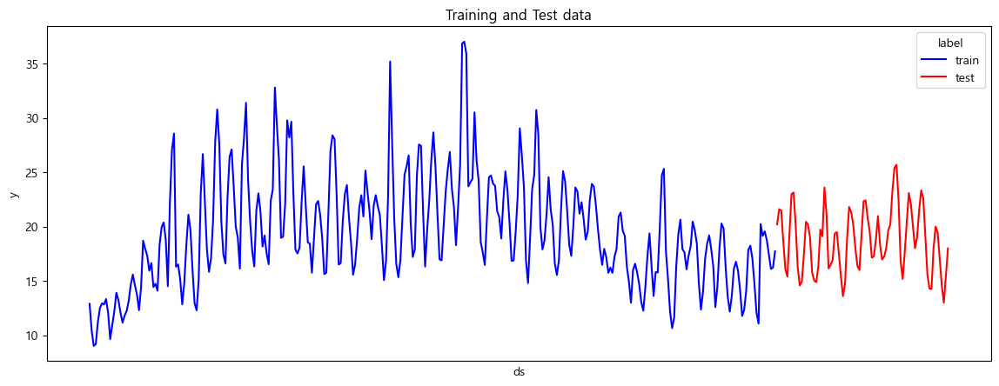

In [11]:
import seaborn as sns

merged_df = pd.concat([X_tr, X_tst], ignore_index=True)
merged_df['label'] = np.where(merged_df['ds'] < '2022-12-01', 'train', 'test')

plt.figure(figsize=(14, 5))
sns.lineplot(data=merged_df, x='ds', y='y', hue='label', palette={'train': 'blue', 'test': 'red'})
plt.title('Training and Test data')
plt.xticks([])
plt.show()

In [12]:
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [13]:
model =Prophet()
model.fit(X_tr)

10:11:27 - cmdstanpy - INFO - Chain [1] start processing
10:11:27 - cmdstanpy - INFO - Chain [1] done processing


In [14]:
future = model.make_future_dataframe(periods=83, freq='D')
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(7)

,ds,yhat,yhat_lower,yhat_upper
411,2023-02-16,13.107061,9.179676,16.937162
412,2023-02-17,15.070703,11.091374,19.186456
413,2023-02-18,13.289995,9.112969,17.368338
414,2023-02-19,11.019699,6.960054,14.733782
415,2023-02-20,8.114779,4.252279,12.182255
416,2023-02-21,6.989935,3.113072,11.071852
417,2023-02-22,9.359362,5.352236,13.396122


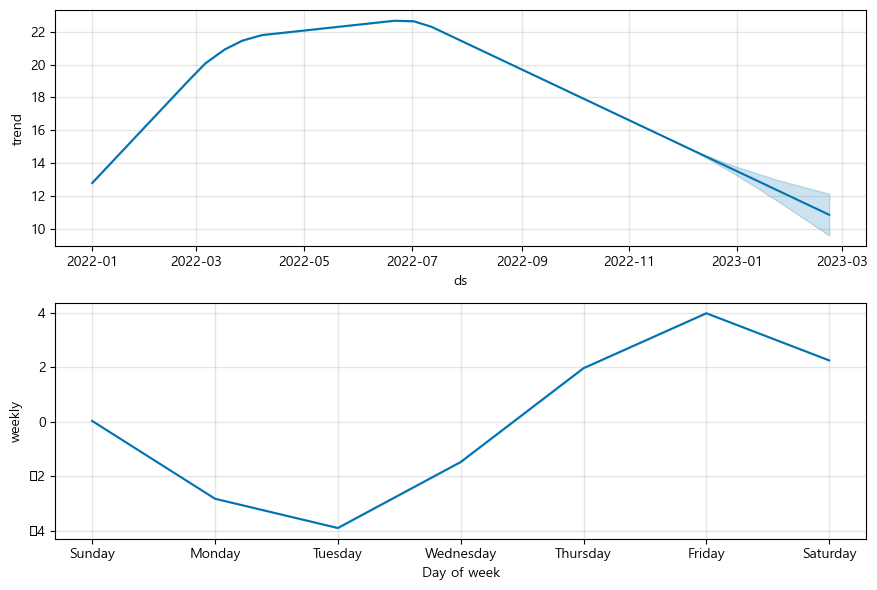

In [15]:
fig = model.plot_components(forecast)

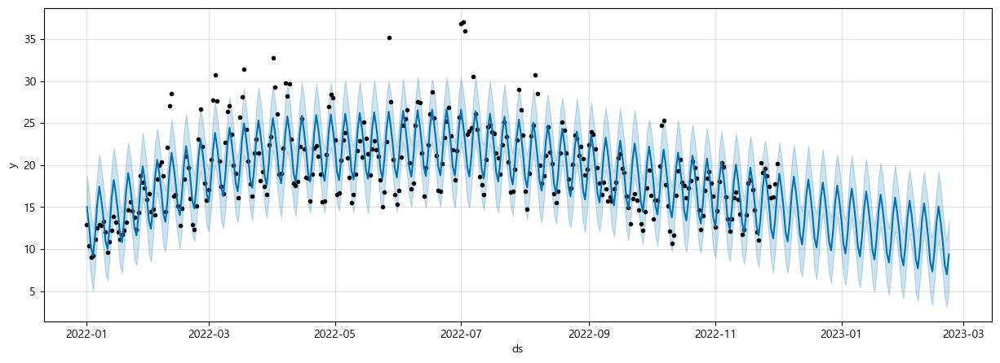

In [16]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = model.plot(forecast,ax=ax)
plt.show()

In [17]:
X_tst_forecast = model.predict(X_tst)
X_tst_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(7)

,ds,yhat,yhat_lower,yhat_upper
76,2023-02-16,13.107061,9.231236,16.870421
77,2023-02-17,15.070703,10.949211,19.049749
78,2023-02-18,13.289995,9.074328,17.038807
79,2023-02-19,11.019699,6.936116,14.769410
80,2023-02-20,8.114779,3.866100,12.098757
81,2023-02-21,6.989935,2.901301,11.099992
82,2023-02-22,9.359362,5.339087,13.404705


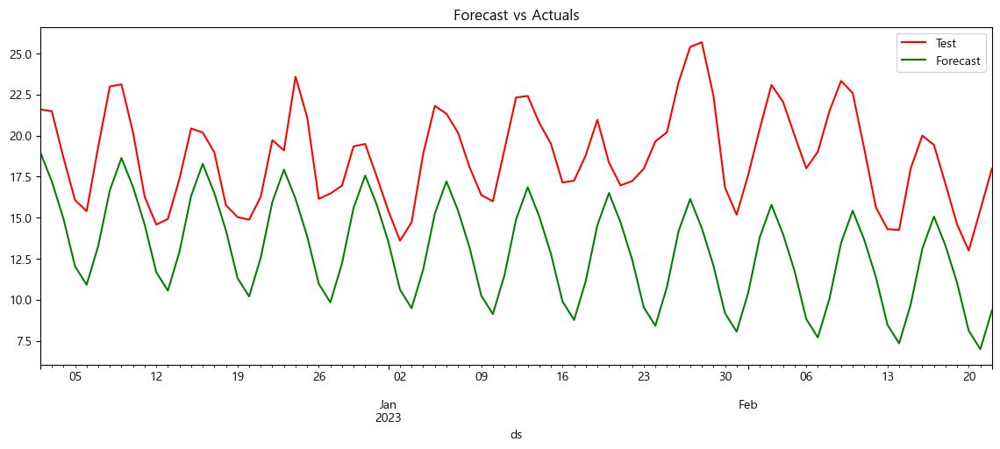

In [18]:
### 예측과 실제 차이 보여주기. (test 데이터)
X_tst['ds'] = pd.to_datetime(X_tst['ds'])
X_tst_forecast['ds'] = pd.to_datetime(X_tst_forecast['ds'])

f, ax = plt.subplots(figsize=(14, 5))
X_tst.plot(kind='line', x='ds', y='y', color='red', label='Test', ax=ax)
X_tst_forecast.plot(kind='line', x='ds', y='yhat', color='green', label='Forecast', ax=ax)
plt.title('Forecast vs Actuals')
plt.show()

In [19]:
mape = mean_absolute_percentage_error(X_tst['y'],X_tst_forecast['yhat'])
print("MAPE",round(mape,4))

MAPE 30.997


In [19]:
import holidays

holiday = pd.DataFrame([])
for date, name in sorted(holidays.KR(years=[2022,2023]).items()):
    holiday = holiday.append(pd.DataFrame({'ds': date, 'holiday': "KR-Holidays"}, index=[0]), ignore_index=True)
holiday['ds'] = pd.to_datetime(holiday['ds'], format='%Y-%m-%d', errors='ignore')

In [34]:
holiday.head(15)

,ds,holiday
0,2022-01-01,KR-Holidays
1,2022-01-31,KR-Holidays
2,2022-02-01,KR-Holidays
3,2022-02-02,KR-Holidays
4,2022-03-01,KR-Holidays
5,2022-03-09,KR-Holidays
6,2022-05-05,KR-Holidays
7,2022-05-08,KR-Holidays
8,2022-06-01,KR-Holidays
9,2022-06-06,KR-Holidays


In [21]:
model_with_holidays = Prophet(holidays=holiday)
model_with_holidays.fit(X_tr)

10:11:35 - cmdstanpy - INFO - Chain [1] start processing
10:11:35 - cmdstanpy - INFO - Chain [1] done processing


In [22]:
future = model_with_holidays.make_future_dataframe(periods= 83, freq='D')
forecast = model_with_holidays.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(7)

,ds,yhat,yhat_lower,yhat_upper
411,2023-02-16,13.154712,9.065356,17.382930
412,2023-02-17,15.123992,11.404689,19.155520
413,2023-02-18,13.362222,9.711413,17.277681
414,2023-02-19,11.122367,7.090129,15.237998
415,2023-02-20,8.302885,4.383269,11.939886
416,2023-02-21,7.071309,3.141896,10.897597
417,2023-02-22,9.465792,5.514532,13.236893


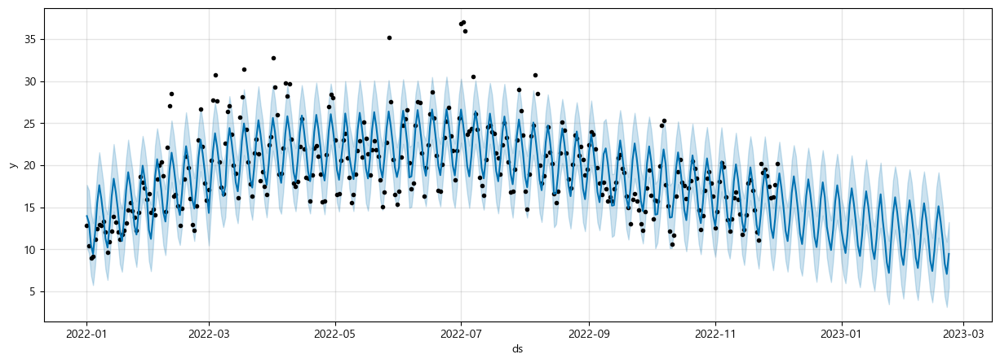

In [23]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = model_with_holidays.plot(forecast,ax=ax)
plt.show()

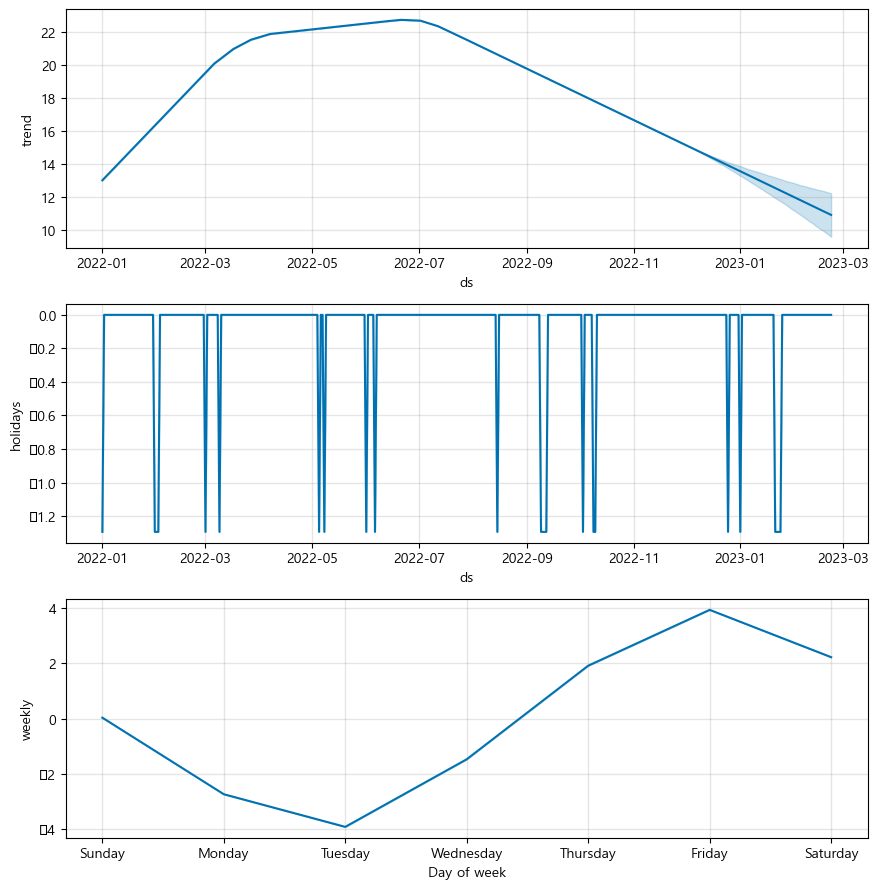

In [24]:
fig = model_with_holidays.plot_components(forecast)

In [25]:
X_tst_forecast_holiday = model_with_holidays.predict(X_tst)
X_tst_forecast_holiday[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(7)

,ds,yhat,yhat_lower,yhat_upper
76,2023-02-16,13.154712,9.153833,17.013564
77,2023-02-17,15.123992,11.236605,19.061734
78,2023-02-18,13.362222,9.196765,17.587230
79,2023-02-19,11.122367,7.040177,14.977373
80,2023-02-20,8.302885,4.126708,12.257324
81,2023-02-21,7.071309,3.397797,10.911438
82,2023-02-22,9.465792,5.440859,13.344398


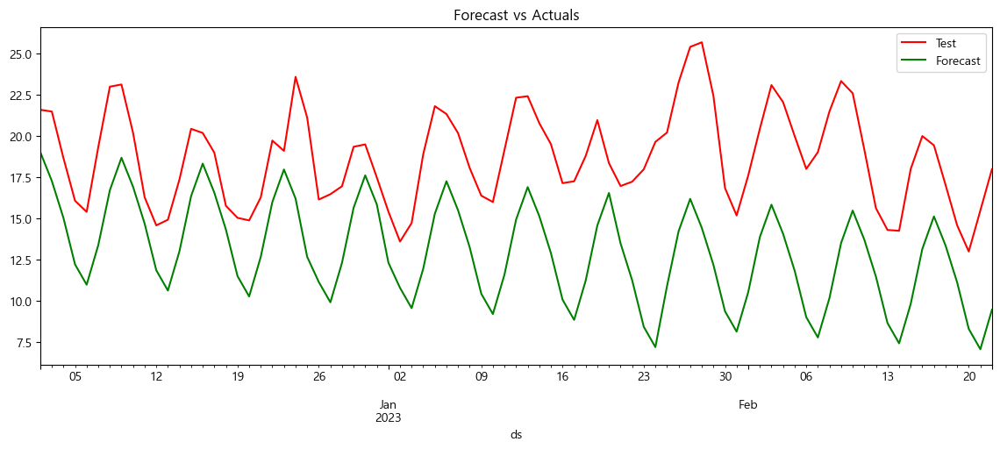

In [26]:
X_tst['ds'] = pd.to_datetime(X_tst['ds'])
X_tst_forecast['ds'] = pd.to_datetime(X_tst_forecast['ds'])

f, ax = plt.subplots(figsize=(14, 5))
X_tst.plot(kind='line', x='ds', y='y', color='red', label='Test', ax=ax)
X_tst_forecast_holiday.plot(kind='line', x='ds', y='yhat', color='green', label='Forecast', ax=ax)
plt.title('Forecast vs Actuals')
plt.show()

In [27]:
mape = mean_absolute_percentage_error(X_tst['y'],X_tst_forecast_holiday['yhat'])
print("MAPE",round(mape,4))

MAPE 31.0186


In [30]:
from sklearn.model_selection import ParameterGrid
params_grid = {'seasonality_mode':('multiplicative','additive'),
               'changepoint_prior_scale':[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],
              'holidays_prior_scale':[0.001,0.01,0.05,0.1],
              'n_changepoints' : [10,25,50],
               'seasonality_prior_scale' : [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0]
}
grid = ParameterGrid(params_grid)
cnt = 0
for p in grid:
    cnt = cnt+1

print('Total Possible Models',cnt)

Total Possible Models 2400


In [31]:
import random

strt='2022-12-01'
end='2023-02-22'
model_parameters = pd.DataFrame(columns = ['MAPE','Parameters'])
for p in grid:
    test = pd.DataFrame()
    print(p)
    random.seed(0)
    train_model =Prophet(changepoint_prior_scale = p['changepoint_prior_scale'],
                         holidays_prior_scale = p['holidays_prior_scale'],
                         seasonality_mode = p['seasonality_mode'],
                         n_changepoints = p['n_changepoints'],
                         seasonality_prior_scale = p['seasonality_prior_scale'],
                         weekly_seasonality=True,
                         daily_seasonality = False,
                         yearly_seasonality = False,
                         holidays=holiday, 
                         interval_width=0.95)
    train_model.add_country_holidays(country_name='KR')
    train_model.fit(X_tr)
    train_forecast = train_model.make_future_dataframe(periods=83, freq='D',include_history = False)
    train_forecast = train_model.predict(train_forecast)
    test=train_forecast[['ds','yhat']]
    Actual = df[(df['ds']>strt) & (df['ds']<=end)]
    MAPE = mean_absolute_percentage_error(Actual['y'],abs(test['yhat']))
    print('Mean Absolute Percentage Error(MAPE)------------------------------------',MAPE)
    model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)

{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:42:22 - cmdstanpy - INFO - Chain [1] start processing
23:42:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.905726533548936
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:42:23 - cmdstanpy - INFO - Chain [1] start processing
23:42:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 25.93478617624386
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:42:24 - cmdstanpy - INFO - Chain [1] start processing
23:42:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 25.370330369811363
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:42:25 - cmdstanpy - INFO - Chain [1] start processing
23:42:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 25.887009313667587
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:42:26 - cmdstanpy - INFO - Chain [1] start processing
23:42:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.596565833716518
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:42:26 - cmdstanpy - INFO - Chain [1] start processing
23:42:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.642211282677792
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:42:27 - cmdstanpy - INFO - Chain [1] start processing
23:42:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 25.82176127506851
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:42:27 - cmdstanpy - INFO - Chain [1] start processing
23:42:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.524122844405397
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:42:28 - cmdstanpy - INFO - Chain [1] start processing
23:42:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.830352182799842
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:42:29 - cmdstanpy - INFO - Chain [1] start processing
23:42:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.700328616837325
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:42:29 - cmdstanpy - INFO - Chain [1] start processing
23:42:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.191842796468286
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:42:30 - cmdstanpy - INFO - Chain [1] start processing
23:42:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.318897262549374
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:42:31 - cmdstanpy - INFO - Chain [1] start processing
23:42:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.636261854197933
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:42:31 - cmdstanpy - INFO - Chain [1] start processing
23:42:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.72186830537852
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:42:32 - cmdstanpy - INFO - Chain [1] start processing
23:42:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.847334891604074
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:42:32 - cmdstanpy - INFO - Chain [1] start processing
23:42:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.715026081671084
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:42:33 - cmdstanpy - INFO - Chain [1] start processing
23:42:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.243735307358413
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:42:33 - cmdstanpy - INFO - Chain [1] start processing
23:42:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.65154148361787
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:42:34 - cmdstanpy - INFO - Chain [1] start processing
23:42:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.176545885439857
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:42:35 - cmdstanpy - INFO - Chain [1] start processing
23:42:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.460883172617553
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:42:35 - cmdstanpy - INFO - Chain [1] start processing
23:42:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.381295033200487
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:42:36 - cmdstanpy - INFO - Chain [1] start processing
23:42:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.678985151259116
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:42:37 - cmdstanpy - INFO - Chain [1] start processing
23:42:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.382272962883295
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:42:37 - cmdstanpy - INFO - Chain [1] start processing
23:42:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.85627538521053
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:42:38 - cmdstanpy - INFO - Chain [1] start processing
23:42:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.673210389579243
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:42:39 - cmdstanpy - INFO - Chain [1] start processing
23:42:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.515226283246506
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:42:39 - cmdstanpy - INFO - Chain [1] start processing
23:42:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.337814858868917
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:42:40 - cmdstanpy - INFO - Chain [1] start processing
23:42:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.35362273745196
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:42:41 - cmdstanpy - INFO - Chain [1] start processing
23:42:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.37404591858834
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:42:42 - cmdstanpy - INFO - Chain [1] start processing
23:42:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.5383297694559
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:42:43 - cmdstanpy - INFO - Chain [1] start processing
23:42:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.620044992429044
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:42:43 - cmdstanpy - INFO - Chain [1] start processing
23:42:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.575399415739582
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:42:44 - cmdstanpy - INFO - Chain [1] start processing
23:42:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.733745331529736
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:42:45 - cmdstanpy - INFO - Chain [1] start processing
23:42:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.808627117519062
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:42:45 - cmdstanpy - INFO - Chain [1] start processing
23:42:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.326367203173692
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:42:46 - cmdstanpy - INFO - Chain [1] start processing
23:42:46 - cmdstanpy - INFO - Chain [1] done processing
23:42:46 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.176227816891995
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:42:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.588418220267737
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:42:47 - cmdstanpy - INFO - Chain [1] start processing
23:42:47 - cmdstanpy - INFO - Chain [1] done processing
23:42:48 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.793040238746475
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:42:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.36290688473784
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:42:49 - cmdstanpy - INFO - Chain [1] start processing
23:42:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.77213464205463
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:42:49 - cmdstanpy - INFO - Chain [1] start processing
23:42:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.7455476460146
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:42:50 - cmdstanpy - INFO - Chain [1] start processing
23:42:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.753315879470396
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:42:51 - cmdstanpy - INFO - Chain [1] start processing
23:42:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.73462923146489
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:42:52 - cmdstanpy - INFO - Chain [1] start processing
23:42:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.866746221779987
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:42:52 - cmdstanpy - INFO - Chain [1] start processing
23:42:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.94258980460299
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:42:53 - cmdstanpy - INFO - Chain [1] start processing
23:42:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.935935186964095
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:42:54 - cmdstanpy - INFO - Chain [1] start processing
23:42:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.897623207751227
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:42:55 - cmdstanpy - INFO - Chain [1] start processing
23:42:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.962967786081155
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:42:56 - cmdstanpy - INFO - Chain [1] start processing
23:42:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.850112669115816
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:42:57 - cmdstanpy - INFO - Chain [1] start processing
23:42:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.801068434772112
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:42:57 - cmdstanpy - INFO - Chain [1] start processing
23:42:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.165502979626606
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:42:58 - cmdstanpy - INFO - Chain [1] start processing
23:42:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.119827393049118
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:42:59 - cmdstanpy - INFO - Chain [1] start processing
23:42:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.54287127987535
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:43:00 - cmdstanpy - INFO - Chain [1] start processing
23:43:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.532791242719284
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:43:00 - cmdstanpy - INFO - Chain [1] start processing
23:43:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.270997883842377
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:43:01 - cmdstanpy - INFO - Chain [1] start processing
23:43:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.20677548335348
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:43:02 - cmdstanpy - INFO - Chain [1] start processing
23:43:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.822562712471623
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:43:03 - cmdstanpy - INFO - Chain [1] start processing
23:43:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.10772926224762
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:43:03 - cmdstanpy - INFO - Chain [1] start processing
23:43:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.849215222936596
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:43:04 - cmdstanpy - INFO - Chain [1] start processing
23:43:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.661930769583428
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:43:04 - cmdstanpy - INFO - Chain [1] start processing
23:43:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.092681334288642
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:43:05 - cmdstanpy - INFO - Chain [1] start processing
23:43:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.122889003695256
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:43:06 - cmdstanpy - INFO - Chain [1] start processing
23:43:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 25.234785166346324
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:43:06 - cmdstanpy - INFO - Chain [1] start processing
23:43:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.55397010715034
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:43:07 - cmdstanpy - INFO - Chain [1] start processing
23:43:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 25.56467309003716
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:43:08 - cmdstanpy - INFO - Chain [1] start processing
23:43:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 25.659308741929554
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:43:08 - cmdstanpy - INFO - Chain [1] start processing
23:43:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 25.493130804256047
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:43:09 - cmdstanpy - INFO - Chain [1] start processing
23:43:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 25.978407207751804
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:43:10 - cmdstanpy - INFO - Chain [1] start processing
23:43:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 25.58859516881008
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:43:10 - cmdstanpy - INFO - Chain [1] start processing
23:43:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.778781957707753
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:43:11 - cmdstanpy - INFO - Chain [1] start processing
23:43:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.05596469767788
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:43:12 - cmdstanpy - INFO - Chain [1] start processing
23:43:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.168312904019164
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:43:12 - cmdstanpy - INFO - Chain [1] start processing
23:43:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.24600016925479
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:43:13 - cmdstanpy - INFO - Chain [1] start processing
23:43:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.230563402589368
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:43:14 - cmdstanpy - INFO - Chain [1] start processing
23:43:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.030694827506334
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:43:14 - cmdstanpy - INFO - Chain [1] start processing
23:43:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.28966339422389
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:43:15 - cmdstanpy - INFO - Chain [1] start processing
23:43:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.857464791222757
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:43:16 - cmdstanpy - INFO - Chain [1] start processing
23:43:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.050229439998077
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:43:16 - cmdstanpy - INFO - Chain [1] start processing
23:43:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.809037989838497
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:43:17 - cmdstanpy - INFO - Chain [1] start processing
23:43:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.711148125041284
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:43:18 - cmdstanpy - INFO - Chain [1] start processing
23:43:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.447744007937075
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:43:18 - cmdstanpy - INFO - Chain [1] start processing
23:43:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.03709636113062
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:43:19 - cmdstanpy - INFO - Chain [1] start processing
23:43:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.463380421054506
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:43:20 - cmdstanpy - INFO - Chain [1] start processing
23:43:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.038511359503786
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:43:20 - cmdstanpy - INFO - Chain [1] start processing
23:43:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.707793265834162
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:43:20 - cmdstanpy - INFO - Chain [1] start processing
23:43:20 - cmdstanpy - INFO - Chain [1] done processing
23:43:21 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.749366402577973
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:43:21 - cmdstanpy - INFO - Chain [1] done processing
23:43:21 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.872121823352263
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:43:21 - cmdstanpy - INFO - Chain [1] done processing
23:43:22 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.8033066007409
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:43:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.94151250723676
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:43:22 - cmdstanpy - INFO - Chain [1] start processing
23:43:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.318559157837157
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:43:23 - cmdstanpy - INFO - Chain [1] start processing
23:43:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.943759536435746
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:43:23 - cmdstanpy - INFO - Chain [1] start processing
23:43:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.140879757863114
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:43:24 - cmdstanpy - INFO - Chain [1] start processing
23:43:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.03253987081752
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:43:24 - cmdstanpy - INFO - Chain [1] start processing
23:43:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.593830940521453
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:43:25 - cmdstanpy - INFO - Chain [1] start processing
23:43:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.835217068655854
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:43:25 - cmdstanpy - INFO - Chain [1] start processing
23:43:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.54722388308596
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:43:26 - cmdstanpy - INFO - Chain [1] start processing
23:43:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.76313926182211
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:43:26 - cmdstanpy - INFO - Chain [1] start processing
23:43:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.37885463732073
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:43:27 - cmdstanpy - INFO - Chain [1] start processing
23:43:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.6770829351237
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:43:27 - cmdstanpy - INFO - Chain [1] start processing
23:43:27 - cmdstanpy - INFO - Chain [1] done processing
23:43:28 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.034587818975652
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:43:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.851544440717223
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:43:28 - cmdstanpy - INFO - Chain [1] start processing
23:43:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 25.474285345855364
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:43:29 - cmdstanpy - INFO - Chain [1] start processing
23:43:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.483629588118745
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:43:29 - cmdstanpy - INFO - Chain [1] start processing
23:43:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.734652851326196
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:43:30 - cmdstanpy - INFO - Chain [1] start processing
23:43:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.88544280390112
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:43:30 - cmdstanpy - INFO - Chain [1] start processing
23:43:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.60201248531433
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:43:31 - cmdstanpy - INFO - Chain [1] start processing
23:43:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.61929919869751
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:43:31 - cmdstanpy - INFO - Chain [1] start processing
23:43:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.676225281849568
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:43:32 - cmdstanpy - INFO - Chain [1] start processing
23:43:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.189150782271597
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:43:32 - cmdstanpy - INFO - Chain [1] start processing
23:43:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 25.71293394670196
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:43:32 - cmdstanpy - INFO - Chain [1] start processing
23:43:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.57532715625759
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:43:33 - cmdstanpy - INFO - Chain [1] start processing
23:43:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.593823230576966
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:43:33 - cmdstanpy - INFO - Chain [1] start processing
23:43:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.978161358481014
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:43:34 - cmdstanpy - INFO - Chain [1] start processing
23:43:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.92783212201573
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:43:34 - cmdstanpy - INFO - Chain [1] start processing
23:43:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.267504203029215
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:43:35 - cmdstanpy - INFO - Chain [1] start processing
23:43:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.97128734410473
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:43:35 - cmdstanpy - INFO - Chain [1] start processing
23:43:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.92581788193132
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:43:36 - cmdstanpy - INFO - Chain [1] start processing
23:43:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.46049473222841
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:43:36 - cmdstanpy - INFO - Chain [1] start processing
23:43:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.35651681805567
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:43:37 - cmdstanpy - INFO - Chain [1] start processing
23:43:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.11880594617122
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:43:37 - cmdstanpy - INFO - Chain [1] start processing
23:43:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.938134045056305
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:43:38 - cmdstanpy - INFO - Chain [1] start processing
23:43:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.958109746832193
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:43:38 - cmdstanpy - INFO - Chain [1] start processing
23:43:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.56623243771416
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:43:39 - cmdstanpy - INFO - Chain [1] start processing
23:43:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.10722093027678
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:43:39 - cmdstanpy - INFO - Chain [1] start processing
23:43:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.448144980959494
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:43:40 - cmdstanpy - INFO - Chain [1] start processing
23:43:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.230764534137126
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:43:40 - cmdstanpy - INFO - Chain [1] start processing
23:43:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.714266424018195
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:43:41 - cmdstanpy - INFO - Chain [1] start processing
23:43:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.917696544526187
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:43:41 - cmdstanpy - INFO - Chain [1] start processing
23:43:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.169729956313184
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:43:42 - cmdstanpy - INFO - Chain [1] start processing
23:43:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.119053854351222
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:43:42 - cmdstanpy - INFO - Chain [1] start processing
23:43:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.365288206932366
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:43:43 - cmdstanpy - INFO - Chain [1] start processing
23:43:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.68136363531799
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:43:43 - cmdstanpy - INFO - Chain [1] start processing
23:43:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.208229979034954
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:43:44 - cmdstanpy - INFO - Chain [1] start processing
23:43:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.888500447834875
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:43:44 - cmdstanpy - INFO - Chain [1] start processing
23:43:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.197204641888135
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:43:45 - cmdstanpy - INFO - Chain [1] start processing
23:43:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.452398116118584
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:43:45 - cmdstanpy - INFO - Chain [1] start processing
23:43:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.00852754773912
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:43:46 - cmdstanpy - INFO - Chain [1] start processing
23:43:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.226017227380883
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:43:46 - cmdstanpy - INFO - Chain [1] start processing
23:43:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.32440086791318
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:43:47 - cmdstanpy - INFO - Chain [1] start processing
23:43:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.91809822646809
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:43:47 - cmdstanpy - INFO - Chain [1] start processing
23:43:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.506053828128323
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:43:47 - cmdstanpy - INFO - Chain [1] start processing
23:43:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.880225688679065
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:43:48 - cmdstanpy - INFO - Chain [1] start processing
23:43:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.786923760067488
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:43:48 - cmdstanpy - INFO - Chain [1] start processing
23:43:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.821346467948434
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:43:49 - cmdstanpy - INFO - Chain [1] start processing
23:43:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.991529719975855
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:43:49 - cmdstanpy - INFO - Chain [1] start processing
23:43:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.3070793842558
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:43:50 - cmdstanpy - INFO - Chain [1] start processing
23:43:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.860024053461803
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:43:50 - cmdstanpy - INFO - Chain [1] start processing
23:43:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.10963298386233
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:43:51 - cmdstanpy - INFO - Chain [1] start processing
23:43:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.917564109467722
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:43:51 - cmdstanpy - INFO - Chain [1] start processing
23:43:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.612290682592604
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:43:52 - cmdstanpy - INFO - Chain [1] start processing
23:43:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.487223081131557
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:43:52 - cmdstanpy - INFO - Chain [1] start processing
23:43:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.07447479923106
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:43:52 - cmdstanpy - INFO - Chain [1] start processing
23:43:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.372906843976942
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:43:53 - cmdstanpy - INFO - Chain [1] start processing
23:43:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.08048431782718
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:43:53 - cmdstanpy - INFO - Chain [1] start processing
23:43:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.462216624966608
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:43:54 - cmdstanpy - INFO - Chain [1] start processing
23:43:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.80167244327378
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:43:54 - cmdstanpy - INFO - Chain [1] start processing
23:43:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.519692167527545
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:43:55 - cmdstanpy - INFO - Chain [1] start processing
23:43:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.40375252880753
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:43:55 - cmdstanpy - INFO - Chain [1] start processing
23:43:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.314796975614804
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:43:56 - cmdstanpy - INFO - Chain [1] start processing
23:43:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.309401998905315
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:43:56 - cmdstanpy - INFO - Chain [1] start processing
23:43:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.332073411075797
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:43:56 - cmdstanpy - INFO - Chain [1] start processing
23:43:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.380458249324096
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:43:57 - cmdstanpy - INFO - Chain [1] start processing
23:43:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.264042533410006
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:43:57 - cmdstanpy - INFO - Chain [1] start processing
23:43:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.84106171006498
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:43:58 - cmdstanpy - INFO - Chain [1] start processing
23:43:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.205780220756786
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:43:58 - cmdstanpy - INFO - Chain [1] start processing
23:43:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.317707250753504
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:43:59 - cmdstanpy - INFO - Chain [1] start processing
23:43:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.577908023744502
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:43:59 - cmdstanpy - INFO - Chain [1] start processing
23:43:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.16919877547114
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:44:00 - cmdstanpy - INFO - Chain [1] start processing
23:44:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.511075128583656
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:44:00 - cmdstanpy - INFO - Chain [1] start processing
23:44:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.33676211103773
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:44:01 - cmdstanpy - INFO - Chain [1] start processing
23:44:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.015584655968514
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:44:01 - cmdstanpy - INFO - Chain [1] start processing
23:44:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.07614553706474
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:44:02 - cmdstanpy - INFO - Chain [1] start processing
23:44:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.327286631515616
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:44:02 - cmdstanpy - INFO - Chain [1] start processing
23:44:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.6363304574155
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:44:03 - cmdstanpy - INFO - Chain [1] start processing
23:44:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.3057279482941
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:44:03 - cmdstanpy - INFO - Chain [1] start processing
23:44:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.792291773721974
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:44:04 - cmdstanpy - INFO - Chain [1] start processing
23:44:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.596500999035396
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:44:04 - cmdstanpy - INFO - Chain [1] start processing
23:44:04 - cmdstanpy - INFO - Chain [1] done processing
23:44:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.30951424260819
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:44:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.58957978222313
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:44:05 - cmdstanpy - INFO - Chain [1] start processing
23:44:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.15082762448587
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:44:06 - cmdstanpy - INFO - Chain [1] start processing
23:44:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.659748138539097
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:44:06 - cmdstanpy - INFO - Chain [1] start processing
23:44:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.99704861566533
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:44:06 - cmdstanpy - INFO - Chain [1] start processing
23:44:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.143004991841153
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:44:07 - cmdstanpy - INFO - Chain [1] start processing
23:44:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.347150324551063
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:44:07 - cmdstanpy - INFO - Chain [1] start processing
23:44:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.848704148956394
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:44:08 - cmdstanpy - INFO - Chain [1] start processing
23:44:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.21687308032079
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:44:08 - cmdstanpy - INFO - Chain [1] start processing
23:44:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.334861175478515
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:44:09 - cmdstanpy - INFO - Chain [1] start processing
23:44:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.90860166944727
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:44:09 - cmdstanpy - INFO - Chain [1] start processing
23:44:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.296579532176953
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:44:10 - cmdstanpy - INFO - Chain [1] start processing
23:44:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.812556628487634
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:44:10 - cmdstanpy - INFO - Chain [1] start processing
23:44:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.834888253536462
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:44:10 - cmdstanpy - INFO - Chain [1] start processing
23:44:10 - cmdstanpy - INFO - Chain [1] done processing
23:44:11 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.59755706751504
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:44:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.91727047791111
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:44:11 - cmdstanpy - INFO - Chain [1] start processing
23:44:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.344569070575886
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:44:12 - cmdstanpy - INFO - Chain [1] start processing
23:44:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.80690802407852
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:44:12 - cmdstanpy - INFO - Chain [1] start processing
23:44:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.482687442901028
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:44:13 - cmdstanpy - INFO - Chain [1] start processing
23:44:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.451803005153792
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:44:13 - cmdstanpy - INFO - Chain [1] start processing
23:44:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 30.93685535137306
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:44:14 - cmdstanpy - INFO - Chain [1] start processing
23:44:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.186014190531573
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:44:14 - cmdstanpy - INFO - Chain [1] start processing
23:44:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.68331704296661
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:44:14 - cmdstanpy - INFO - Chain [1] start processing
23:44:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.650909295101695
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:44:15 - cmdstanpy - INFO - Chain [1] start processing
23:44:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.056640783858548
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:44:15 - cmdstanpy - INFO - Chain [1] start processing
23:44:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.330890464022957
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:44:16 - cmdstanpy - INFO - Chain [1] start processing
23:44:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.248005480128292
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:44:16 - cmdstanpy - INFO - Chain [1] start processing
23:44:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.624559187718965
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:44:17 - cmdstanpy - INFO - Chain [1] start processing
23:44:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 26.993158927270304
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:44:17 - cmdstanpy - INFO - Chain [1] start processing
23:44:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.09495707650879
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:44:18 - cmdstanpy - INFO - Chain [1] start processing
23:44:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.783379104811544
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:44:18 - cmdstanpy - INFO - Chain [1] start processing
23:44:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.262423077671635
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:44:18 - cmdstanpy - INFO - Chain [1] start processing
23:44:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.76550378833193
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:44:19 - cmdstanpy - INFO - Chain [1] start processing
23:44:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.15673751858779
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:44:19 - cmdstanpy - INFO - Chain [1] start processing
23:44:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.301762978053414
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:44:20 - cmdstanpy - INFO - Chain [1] start processing
23:44:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.30940397638696
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:44:20 - cmdstanpy - INFO - Chain [1] start processing
23:44:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.478597672363637
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:44:21 - cmdstanpy - INFO - Chain [1] start processing
23:44:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.254836672690708
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:44:21 - cmdstanpy - INFO - Chain [1] start processing
23:44:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.768931834225903
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:44:22 - cmdstanpy - INFO - Chain [1] start processing
23:44:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.320243324631136
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:44:22 - cmdstanpy - INFO - Chain [1] start processing
23:44:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.416625380968753
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:44:22 - cmdstanpy - INFO - Chain [1] start processing
23:44:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.839085185477366
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:44:23 - cmdstanpy - INFO - Chain [1] start processing
23:44:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.75500110833984
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:44:23 - cmdstanpy - INFO - Chain [1] start processing
23:44:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.122635519587032
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:44:24 - cmdstanpy - INFO - Chain [1] start processing
23:44:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.94097977841564
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:44:24 - cmdstanpy - INFO - Chain [1] start processing
23:44:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 27.178715732317222
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:44:25 - cmdstanpy - INFO - Chain [1] start processing
23:44:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.439451402739905
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:44:25 - cmdstanpy - INFO - Chain [1] start processing
23:44:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.108294961938167
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:44:26 - cmdstanpy - INFO - Chain [1] start processing
23:44:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.42330837660269
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:44:26 - cmdstanpy - INFO - Chain [1] start processing
23:44:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.33909547604086
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:44:27 - cmdstanpy - INFO - Chain [1] start processing
23:44:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.079606732179712
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:44:27 - cmdstanpy - INFO - Chain [1] start processing
23:44:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.37881694071211
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:44:28 - cmdstanpy - INFO - Chain [1] start processing
23:44:28 - cmdstanpy - INFO - Chain [1] done processing
23:44:28 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.245046786011812
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:44:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.236348183483564
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:44:29 - cmdstanpy - INFO - Chain [1] start processing
23:44:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.20337246327252
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:44:29 - cmdstanpy - INFO - Chain [1] start processing
23:44:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.46587200247365
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:44:29 - cmdstanpy - INFO - Chain [1] start processing
23:44:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.07746115601907
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:44:30 - cmdstanpy - INFO - Chain [1] start processing
23:44:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 28.82989985280223
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:44:30 - cmdstanpy - INFO - Chain [1] start processing
23:44:31 - cmdstanpy - INFO - Chain [1] done processing
23:44:31 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.026522226913254
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:44:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.426516874304376
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:44:31 - cmdstanpy - INFO - Chain [1] start processing
23:44:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.65746545187032
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:44:32 - cmdstanpy - INFO - Chain [1] start processing
23:44:32 - cmdstanpy - INFO - Chain [1] done processing
23:44:32 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.5989258183498
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:44:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 29.13646509691962
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:44:33 - cmdstanpy - INFO - Chain [1] start processing
23:44:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.171921911221588
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:44:33 - cmdstanpy - INFO - Chain [1] start processing
23:44:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.327646106989555
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:44:34 - cmdstanpy - INFO - Chain [1] start processing
23:44:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.417055794914
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:44:34 - cmdstanpy - INFO - Chain [1] start processing
23:44:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.62483293824709
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:44:35 - cmdstanpy - INFO - Chain [1] start processing
23:44:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.260214395675252
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:44:35 - cmdstanpy - INFO - Chain [1] start processing
23:44:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.384057754266003
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:44:36 - cmdstanpy - INFO - Chain [1] start processing
23:44:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.308972953351706
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:44:36 - cmdstanpy - INFO - Chain [1] start processing
23:44:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.462027022310647
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:44:37 - cmdstanpy - INFO - Chain [1] start processing
23:44:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.48650395245464
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:44:37 - cmdstanpy - INFO - Chain [1] start processing
23:44:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.793090564378804
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:44:38 - cmdstanpy - INFO - Chain [1] start processing
23:44:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.41386155515346
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:44:38 - cmdstanpy - INFO - Chain [1] start processing
23:44:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.85740260218649
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:44:38 - cmdstanpy - INFO - Chain [1] start processing
23:44:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.081915270380602
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:44:39 - cmdstanpy - INFO - Chain [1] start processing
23:44:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.351135479959623
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:44:39 - cmdstanpy - INFO - Chain [1] start processing
23:44:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.370343203714587
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:44:40 - cmdstanpy - INFO - Chain [1] start processing
23:44:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.72049307182036
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:44:40 - cmdstanpy - INFO - Chain [1] start processing
23:44:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.00514465323564
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:44:41 - cmdstanpy - INFO - Chain [1] start processing
23:44:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.945770733139884
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:44:41 - cmdstanpy - INFO - Chain [1] start processing
23:44:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.76448583186826
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:44:42 - cmdstanpy - INFO - Chain [1] start processing
23:44:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.67451442868705
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:44:42 - cmdstanpy - INFO - Chain [1] start processing
23:44:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.168116027440735
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:44:43 - cmdstanpy - INFO - Chain [1] start processing
23:44:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.3953374943563
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:44:43 - cmdstanpy - INFO - Chain [1] start processing
23:44:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.3057321011983
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:44:44 - cmdstanpy - INFO - Chain [1] start processing
23:44:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.95692742482249
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:44:44 - cmdstanpy - INFO - Chain [1] start processing
23:44:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.578689680055707
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:44:45 - cmdstanpy - INFO - Chain [1] start processing
23:44:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.62225067791044
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:44:45 - cmdstanpy - INFO - Chain [1] start processing
23:44:46 - cmdstanpy - INFO - Chain [1] done processing
23:44:46 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.290161846762732
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:44:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.620911484226742
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:44:47 - cmdstanpy - INFO - Chain [1] start processing
23:44:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.659995461216905
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:44:47 - cmdstanpy - INFO - Chain [1] start processing
23:44:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.91412060292516
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:44:48 - cmdstanpy - INFO - Chain [1] start processing
23:44:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.972072168995165
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:44:48 - cmdstanpy - INFO - Chain [1] start processing
23:44:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.573220664989183
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:44:49 - cmdstanpy - INFO - Chain [1] start processing
23:44:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.98195530619222
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:44:49 - cmdstanpy - INFO - Chain [1] start processing
23:44:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.56015166571866
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:44:50 - cmdstanpy - INFO - Chain [1] start processing
23:44:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.760374459534052
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:44:50 - cmdstanpy - INFO - Chain [1] start processing
23:44:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.72116420897138
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:44:51 - cmdstanpy - INFO - Chain [1] start processing
23:44:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.809612770779943
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:44:51 - cmdstanpy - INFO - Chain [1] start processing
23:44:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.575536812227348
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:44:52 - cmdstanpy - INFO - Chain [1] start processing
23:44:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.53292571109438
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:44:52 - cmdstanpy - INFO - Chain [1] start processing
23:44:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.540862007574074
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:44:53 - cmdstanpy - INFO - Chain [1] start processing
23:44:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.182048319793452
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:44:53 - cmdstanpy - INFO - Chain [1] start processing
23:44:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.838462259739607
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:44:54 - cmdstanpy - INFO - Chain [1] start processing
23:44:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.132813702837428
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:44:54 - cmdstanpy - INFO - Chain [1] start processing
23:44:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.90867077012592
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:44:55 - cmdstanpy - INFO - Chain [1] start processing
23:44:55 - cmdstanpy - INFO - Chain [1] done processing
23:44:55 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.048720701562022
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:44:56 - cmdstanpy - INFO - Chain [1] done processing
23:44:56 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.173678184295238
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:44:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.178276415060072
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:44:56 - cmdstanpy - INFO - Chain [1] start processing
23:44:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.99005512550996
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:44:57 - cmdstanpy - INFO - Chain [1] start processing
23:44:57 - cmdstanpy - INFO - Chain [1] done processing
23:44:58 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.993369748296388
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:44:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.93416527440496
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:44:58 - cmdstanpy - INFO - Chain [1] start processing
23:44:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.265195110077183
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:44:59 - cmdstanpy - INFO - Chain [1] start processing
23:44:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.212632964119962
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:44:59 - cmdstanpy - INFO - Chain [1] start processing
23:44:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.945285364811923
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:45:00 - cmdstanpy - INFO - Chain [1] start processing
23:45:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.213082602005816
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:45:00 - cmdstanpy - INFO - Chain [1] start processing
23:45:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.171803754365868
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:45:01 - cmdstanpy - INFO - Chain [1] start processing
23:45:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.389735119855835
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:45:01 - cmdstanpy - INFO - Chain [1] start processing
23:45:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.279193356119894
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:45:02 - cmdstanpy - INFO - Chain [1] start processing
23:45:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.297568163466185
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:45:02 - cmdstanpy - INFO - Chain [1] start processing
23:45:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.10686835233686
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:45:03 - cmdstanpy - INFO - Chain [1] start processing
23:45:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.31874518449238
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:45:03 - cmdstanpy - INFO - Chain [1] start processing
23:45:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.610012117898226
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:45:04 - cmdstanpy - INFO - Chain [1] start processing
23:45:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.073941747735805
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:45:04 - cmdstanpy - INFO - Chain [1] start processing
23:45:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.4228378782046
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:45:05 - cmdstanpy - INFO - Chain [1] start processing
23:45:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.800352018220995
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:45:05 - cmdstanpy - INFO - Chain [1] start processing
23:45:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.00912061559415
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:45:06 - cmdstanpy - INFO - Chain [1] start processing
23:45:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.05656226606959
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:45:06 - cmdstanpy - INFO - Chain [1] start processing
23:45:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.628601213313747
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:45:07 - cmdstanpy - INFO - Chain [1] start processing
23:45:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.216958506149716
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:45:07 - cmdstanpy - INFO - Chain [1] start processing
23:45:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.584872689634377
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:45:07 - cmdstanpy - INFO - Chain [1] start processing
23:45:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.808922323434572
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:45:08 - cmdstanpy - INFO - Chain [1] start processing
23:45:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.228096823016045
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:45:08 - cmdstanpy - INFO - Chain [1] start processing
23:45:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.298172924530064
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:45:09 - cmdstanpy - INFO - Chain [1] start processing
23:45:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.367253877691407
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:45:09 - cmdstanpy - INFO - Chain [1] start processing
23:45:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.923571923326413
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:45:10 - cmdstanpy - INFO - Chain [1] start processing
23:45:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.421931062794847
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:45:10 - cmdstanpy - INFO - Chain [1] start processing
23:45:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.536795077876835
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:45:11 - cmdstanpy - INFO - Chain [1] start processing
23:45:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.68148630610649
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:45:11 - cmdstanpy - INFO - Chain [1] start processing
23:45:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.34105485372987
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:45:12 - cmdstanpy - INFO - Chain [1] start processing
23:45:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.460383189642176
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:45:12 - cmdstanpy - INFO - Chain [1] start processing
23:45:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.20795463802602
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:45:12 - cmdstanpy - INFO - Chain [1] start processing
23:45:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.52621295943638
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:45:13 - cmdstanpy - INFO - Chain [1] start processing
23:45:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.50539060136272
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:45:13 - cmdstanpy - INFO - Chain [1] start processing
23:45:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.673163516811705
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:45:14 - cmdstanpy - INFO - Chain [1] start processing
23:45:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.957333089120066
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:45:14 - cmdstanpy - INFO - Chain [1] start processing
23:45:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.894788642080975
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:45:15 - cmdstanpy - INFO - Chain [1] start processing
23:45:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.49015689075666
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:45:15 - cmdstanpy - INFO - Chain [1] start processing
23:45:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.72554871757176
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:45:16 - cmdstanpy - INFO - Chain [1] start processing
23:45:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.14569344641047
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:45:16 - cmdstanpy - INFO - Chain [1] start processing
23:45:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.702362757012214
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:45:17 - cmdstanpy - INFO - Chain [1] start processing
23:45:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.29030923718366
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:45:17 - cmdstanpy - INFO - Chain [1] start processing
23:45:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.854901643425887
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:45:18 - cmdstanpy - INFO - Chain [1] start processing
23:45:18 - cmdstanpy - INFO - Chain [1] done processing
23:45:18 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.07471789893594
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:45:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.86050014465374
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:45:19 - cmdstanpy - INFO - Chain [1] start processing
23:45:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.604882142795066
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:45:19 - cmdstanpy - INFO - Chain [1] start processing
23:45:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.233366005625214
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:45:20 - cmdstanpy - INFO - Chain [1] start processing
23:45:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.83335635962277
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:45:20 - cmdstanpy - INFO - Chain [1] start processing
23:45:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.923428898245323
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:45:20 - cmdstanpy - INFO - Chain [1] start processing
23:45:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.75034183583768
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:45:21 - cmdstanpy - INFO - Chain [1] start processing
23:45:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.858741695902726
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:45:21 - cmdstanpy - INFO - Chain [1] start processing
23:45:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.02954214515408
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:45:22 - cmdstanpy - INFO - Chain [1] start processing
23:45:22 - cmdstanpy - INFO - Chain [1] done processing
23:45:22 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.989519937595894
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:45:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.065587003467765
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:45:23 - cmdstanpy - INFO - Chain [1] start processing
23:45:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.23649348504993
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:45:23 - cmdstanpy - INFO - Chain [1] start processing
23:45:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.24486635089238
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:45:24 - cmdstanpy - INFO - Chain [1] start processing
23:45:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.174629523011074
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:45:24 - cmdstanpy - INFO - Chain [1] start processing
23:45:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.065300094916005
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:45:25 - cmdstanpy - INFO - Chain [1] start processing
23:45:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.149876458789905
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:45:25 - cmdstanpy - INFO - Chain [1] start processing
23:45:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.111374173420746
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:45:26 - cmdstanpy - INFO - Chain [1] start processing
23:45:26 - cmdstanpy - INFO - Chain [1] done processing
23:45:26 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.127431958191906
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:45:26 - cmdstanpy - INFO - Chain [1] done processing
23:45:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.659392418401918
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:45:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.126801273656866
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:45:27 - cmdstanpy - INFO - Chain [1] start processing
23:45:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.526968680232525
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:45:28 - cmdstanpy - INFO - Chain [1] start processing
23:45:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.342048030490144
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:45:28 - cmdstanpy - INFO - Chain [1] start processing
23:45:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.600457652071512
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:45:29 - cmdstanpy - INFO - Chain [1] start processing
23:45:29 - cmdstanpy - INFO - Chain [1] done processing
23:45:29 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.43815230426011
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:45:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.64405981831746
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:45:30 - cmdstanpy - INFO - Chain [1] start processing
23:45:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.19069703119113
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:45:30 - cmdstanpy - INFO - Chain [1] start processing
23:45:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.093089876411128
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:45:31 - cmdstanpy - INFO - Chain [1] start processing
23:45:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.205430627134152
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:45:31 - cmdstanpy - INFO - Chain [1] start processing
23:45:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.688093156761337
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:45:32 - cmdstanpy - INFO - Chain [1] start processing
23:45:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.96983446518224
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:45:32 - cmdstanpy - INFO - Chain [1] start processing
23:45:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.084029999109397
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:45:33 - cmdstanpy - INFO - Chain [1] start processing
23:45:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.371974124764783
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:45:33 - cmdstanpy - INFO - Chain [1] start processing
23:45:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.124280879371472
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:45:33 - cmdstanpy - INFO - Chain [1] start processing
23:45:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.291635771338107
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:45:34 - cmdstanpy - INFO - Chain [1] start processing
23:45:34 - cmdstanpy - INFO - Chain [1] done processing
23:45:34 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.641161561178507
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:45:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.333139844583908
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:45:35 - cmdstanpy - INFO - Chain [1] start processing
23:45:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.129259257650244
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:45:35 - cmdstanpy - INFO - Chain [1] start processing
23:45:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.305387854566057
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:45:36 - cmdstanpy - INFO - Chain [1] start processing
23:45:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.943548497276563
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:45:36 - cmdstanpy - INFO - Chain [1] start processing
23:45:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.9135505644132
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:45:37 - cmdstanpy - INFO - Chain [1] start processing
23:45:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.16873757869794
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:45:37 - cmdstanpy - INFO - Chain [1] start processing
23:45:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.43118910528815
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:45:38 - cmdstanpy - INFO - Chain [1] start processing
23:45:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.281451678872234
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:45:38 - cmdstanpy - INFO - Chain [1] start processing
23:45:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.618755395166176
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:45:38 - cmdstanpy - INFO - Chain [1] start processing
23:45:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.915916804134625
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:45:39 - cmdstanpy - INFO - Chain [1] start processing
23:45:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.279674375059592
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:45:39 - cmdstanpy - INFO - Chain [1] start processing
23:45:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.08956150244798
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:45:40 - cmdstanpy - INFO - Chain [1] start processing
23:45:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.096529877740778
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:45:40 - cmdstanpy - INFO - Chain [1] start processing
23:45:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.006272323992533
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:45:41 - cmdstanpy - INFO - Chain [1] start processing
23:45:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.650016249374918
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:45:41 - cmdstanpy - INFO - Chain [1] start processing
23:45:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.71469455997059
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:45:42 - cmdstanpy - INFO - Chain [1] start processing
23:45:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.040765365842912
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:45:42 - cmdstanpy - INFO - Chain [1] start processing
23:45:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.050129298392722
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:45:43 - cmdstanpy - INFO - Chain [1] start processing
23:45:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.909685480380382
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:45:43 - cmdstanpy - INFO - Chain [1] start processing
23:45:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.781230679380634
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:45:44 - cmdstanpy - INFO - Chain [1] start processing
23:45:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.928155250976605
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:45:44 - cmdstanpy - INFO - Chain [1] start processing
23:45:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.871882706197617
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:45:45 - cmdstanpy - INFO - Chain [1] start processing
23:45:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.019099721021533
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:45:45 - cmdstanpy - INFO - Chain [1] start processing
23:45:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.396371884601393
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:45:46 - cmdstanpy - INFO - Chain [1] start processing
23:45:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.700853358020836
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:45:46 - cmdstanpy - INFO - Chain [1] start processing
23:45:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.56302970177153
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:45:47 - cmdstanpy - INFO - Chain [1] start processing
23:45:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.81687929032036
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:45:48 - cmdstanpy - INFO - Chain [1] start processing
23:45:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.737099104214753
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:45:48 - cmdstanpy - INFO - Chain [1] start processing
23:45:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.683258409059867
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:45:48 - cmdstanpy - INFO - Chain [1] start processing
23:45:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.802310872084135
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:45:49 - cmdstanpy - INFO - Chain [1] start processing
23:45:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.79364954389288
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:45:49 - cmdstanpy - INFO - Chain [1] start processing
23:45:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.751914465768778
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:45:50 - cmdstanpy - INFO - Chain [1] start processing
23:45:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.603642338173742
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:45:50 - cmdstanpy - INFO - Chain [1] start processing
23:45:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.75392639883426
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:45:51 - cmdstanpy - INFO - Chain [1] start processing
23:45:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.06297782354003
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:45:51 - cmdstanpy - INFO - Chain [1] start processing
23:45:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.834000249157235
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:45:52 - cmdstanpy - INFO - Chain [1] start processing
23:45:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.90830795203445
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:45:52 - cmdstanpy - INFO - Chain [1] start processing
23:45:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.07977225482838
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:45:53 - cmdstanpy - INFO - Chain [1] start processing
23:45:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.982277863200785
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:45:53 - cmdstanpy - INFO - Chain [1] start processing
23:45:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.969767747524035
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:45:54 - cmdstanpy - INFO - Chain [1] start processing
23:45:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.91731107524804
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:45:54 - cmdstanpy - INFO - Chain [1] start processing
23:45:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.890071543660937
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:45:55 - cmdstanpy - INFO - Chain [1] start processing
23:45:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.773624042337392
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:45:55 - cmdstanpy - INFO - Chain [1] start processing
23:45:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.01313564491994
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:45:56 - cmdstanpy - INFO - Chain [1] start processing
23:45:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.53439818235242
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:45:56 - cmdstanpy - INFO - Chain [1] start processing
23:45:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.828079703146003
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:45:57 - cmdstanpy - INFO - Chain [1] start processing
23:45:57 - cmdstanpy - INFO - Chain [1] done processing
23:45:57 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.83286984197131
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:45:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.187904424096843
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:45:58 - cmdstanpy - INFO - Chain [1] start processing
23:45:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.60044635553525
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:45:58 - cmdstanpy - INFO - Chain [1] start processing
23:45:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.753219224230683
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:45:59 - cmdstanpy - INFO - Chain [1] start processing
23:45:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.968948430583524
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:45:59 - cmdstanpy - INFO - Chain [1] start processing
23:45:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.230920387882055
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:46:00 - cmdstanpy - INFO - Chain [1] start processing
23:46:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.374241395939084
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:46:00 - cmdstanpy - INFO - Chain [1] start processing
23:46:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 23.14108096114877
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:46:01 - cmdstanpy - INFO - Chain [1] start processing
23:46:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.322310589780443
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:46:01 - cmdstanpy - INFO - Chain [1] start processing
23:46:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.29632567679429
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:46:02 - cmdstanpy - INFO - Chain [1] start processing
23:46:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.83115588311843
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:46:02 - cmdstanpy - INFO - Chain [1] start processing
23:46:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.876824942931787
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:46:03 - cmdstanpy - INFO - Chain [1] start processing
23:46:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.055714389950086
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:46:03 - cmdstanpy - INFO - Chain [1] start processing
23:46:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.638398059709477
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:46:04 - cmdstanpy - INFO - Chain [1] start processing
23:46:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.417721664779773
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:46:04 - cmdstanpy - INFO - Chain [1] start processing
23:46:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.044808520401737
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:46:04 - cmdstanpy - INFO - Chain [1] start processing
23:46:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.321213495499034
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:46:05 - cmdstanpy - INFO - Chain [1] start processing
23:46:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.97510872855934
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:46:05 - cmdstanpy - INFO - Chain [1] start processing
23:46:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.11839516559298
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:46:06 - cmdstanpy - INFO - Chain [1] start processing
23:46:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.294850457945383
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:46:06 - cmdstanpy - INFO - Chain [1] start processing
23:46:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.47036209902895
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:46:07 - cmdstanpy - INFO - Chain [1] start processing
23:46:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.357788826362334
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:46:07 - cmdstanpy - INFO - Chain [1] start processing
23:46:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.93228654872384
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:46:08 - cmdstanpy - INFO - Chain [1] start processing
23:46:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.490999687234368
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:46:08 - cmdstanpy - INFO - Chain [1] start processing
23:46:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.49183420114923
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:46:09 - cmdstanpy - INFO - Chain [1] start processing
23:46:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.96254551546211
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:46:09 - cmdstanpy - INFO - Chain [1] start processing
23:46:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.97130753140937
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:46:10 - cmdstanpy - INFO - Chain [1] start processing
23:46:10 - cmdstanpy - INFO - Chain [1] done processing
23:46:10 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.152324789193433
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:46:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.41486156052386
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:46:11 - cmdstanpy - INFO - Chain [1] start processing
23:46:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.618162601090827
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:46:11 - cmdstanpy - INFO - Chain [1] start processing
23:46:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.446832438560055
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:46:12 - cmdstanpy - INFO - Chain [1] start processing
23:46:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.637085453616226
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:46:12 - cmdstanpy - INFO - Chain [1] start processing
23:46:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.519876691277307
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:46:13 - cmdstanpy - INFO - Chain [1] start processing
23:46:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.49284539312923
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:46:14 - cmdstanpy - INFO - Chain [1] start processing
23:46:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.342121146468568
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:46:14 - cmdstanpy - INFO - Chain [1] start processing
23:46:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.29198566409546
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:46:15 - cmdstanpy - INFO - Chain [1] start processing
23:46:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.21838694533116
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:46:15 - cmdstanpy - INFO - Chain [1] start processing
23:46:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.921987668385153
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:46:16 - cmdstanpy - INFO - Chain [1] start processing
23:46:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.490461072746278
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:46:17 - cmdstanpy - INFO - Chain [1] start processing
23:46:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.900900597314475
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:46:17 - cmdstanpy - INFO - Chain [1] start processing
23:46:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.114119596085484
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:46:18 - cmdstanpy - INFO - Chain [1] start processing
23:46:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.504090780069067
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:46:18 - cmdstanpy - INFO - Chain [1] start processing
23:46:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.88180492258657
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:46:19 - cmdstanpy - INFO - Chain [1] start processing
23:46:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.186055782195233
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:46:19 - cmdstanpy - INFO - Chain [1] start processing
23:46:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.312827277116053
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:46:20 - cmdstanpy - INFO - Chain [1] start processing
23:46:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.621308380555014
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:46:20 - cmdstanpy - INFO - Chain [1] start processing
23:46:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.911339362126963
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:46:21 - cmdstanpy - INFO - Chain [1] start processing
23:46:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.975588145668482
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:46:22 - cmdstanpy - INFO - Chain [1] start processing
23:46:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.430520321581398
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:46:22 - cmdstanpy - INFO - Chain [1] start processing
23:46:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.170193743783226
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:46:23 - cmdstanpy - INFO - Chain [1] start processing
23:46:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.956779989793088
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:46:23 - cmdstanpy - INFO - Chain [1] start processing
23:46:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.870640642318502
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:46:24 - cmdstanpy - INFO - Chain [1] start processing
23:46:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.403653888580674
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:46:24 - cmdstanpy - INFO - Chain [1] start processing
23:46:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.433754728028052
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:46:25 - cmdstanpy - INFO - Chain [1] start processing
23:46:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.497886328413017
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:46:26 - cmdstanpy - INFO - Chain [1] start processing
23:46:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.359784841137813
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:46:26 - cmdstanpy - INFO - Chain [1] start processing
23:46:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.089232442496467
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:46:27 - cmdstanpy - INFO - Chain [1] start processing
23:46:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.30925182719434
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:46:27 - cmdstanpy - INFO - Chain [1] start processing
23:46:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.54423789095217
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:46:28 - cmdstanpy - INFO - Chain [1] start processing
23:46:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.570114075544954
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:46:29 - cmdstanpy - INFO - Chain [1] start processing
23:46:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 23.311733364587113
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:46:29 - cmdstanpy - INFO - Chain [1] start processing
23:46:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.585027157920194
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:46:30 - cmdstanpy - INFO - Chain [1] start processing
23:46:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.564972045969878
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:46:30 - cmdstanpy - INFO - Chain [1] start processing
23:46:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.61037376691882
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:46:31 - cmdstanpy - INFO - Chain [1] start processing
23:46:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.2349345868267
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:46:32 - cmdstanpy - INFO - Chain [1] start processing
23:46:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.379134658133353
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:46:33 - cmdstanpy - INFO - Chain [1] start processing
23:46:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.988614648048706
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:46:33 - cmdstanpy - INFO - Chain [1] start processing
23:46:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.74512873603717
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:46:34 - cmdstanpy - INFO - Chain [1] start processing
23:46:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.782022528798905
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:46:34 - cmdstanpy - INFO - Chain [1] start processing
23:46:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.422863610226475
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:46:35 - cmdstanpy - INFO - Chain [1] start processing
23:46:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.96572668912157
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:46:36 - cmdstanpy - INFO - Chain [1] start processing
23:46:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.85323761136975
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:46:36 - cmdstanpy - INFO - Chain [1] start processing
23:46:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.44451939975293
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:46:37 - cmdstanpy - INFO - Chain [1] start processing
23:46:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.856229287766727
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:46:37 - cmdstanpy - INFO - Chain [1] start processing
23:46:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.875079727833747
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:46:38 - cmdstanpy - INFO - Chain [1] start processing
23:46:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.775465316778877
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:46:38 - cmdstanpy - INFO - Chain [1] start processing
23:46:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.781351893508457
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:46:39 - cmdstanpy - INFO - Chain [1] start processing
23:46:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.237717669554904
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:46:40 - cmdstanpy - INFO - Chain [1] start processing
23:46:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.980102456648027
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:46:40 - cmdstanpy - INFO - Chain [1] start processing
23:46:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.852460177953017
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:46:41 - cmdstanpy - INFO - Chain [1] start processing
23:46:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.186625263122647
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:46:41 - cmdstanpy - INFO - Chain [1] start processing
23:46:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.820986863892877
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:46:42 - cmdstanpy - INFO - Chain [1] start processing
23:46:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.822423063645306
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:46:42 - cmdstanpy - INFO - Chain [1] start processing
23:46:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.703145651287084
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:46:43 - cmdstanpy - INFO - Chain [1] start processing
23:46:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.27921025808648
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:46:44 - cmdstanpy - INFO - Chain [1] start processing
23:46:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.971351592987354
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:46:44 - cmdstanpy - INFO - Chain [1] start processing
23:46:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.919485672946482
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:46:45 - cmdstanpy - INFO - Chain [1] start processing
23:46:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.676846552253377
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:46:45 - cmdstanpy - INFO - Chain [1] start processing
23:46:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.819060475930492
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:46:46 - cmdstanpy - INFO - Chain [1] start processing
23:46:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.99717561439831
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:46:47 - cmdstanpy - INFO - Chain [1] start processing
23:46:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.971543422233555
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:46:47 - cmdstanpy - INFO - Chain [1] start processing
23:46:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.067769694997914
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:46:48 - cmdstanpy - INFO - Chain [1] start processing
23:46:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.07823121348678
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:46:48 - cmdstanpy - INFO - Chain [1] start processing
23:46:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.05522024854453
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:46:49 - cmdstanpy - INFO - Chain [1] start processing
23:46:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.07979021103894
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:46:50 - cmdstanpy - INFO - Chain [1] start processing
23:46:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.012654643305467
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:46:50 - cmdstanpy - INFO - Chain [1] start processing
23:46:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.915330766021636
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:46:51 - cmdstanpy - INFO - Chain [1] start processing
23:46:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.15028577660536
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:46:51 - cmdstanpy - INFO - Chain [1] start processing
23:46:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.18516205549337
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:46:52 - cmdstanpy - INFO - Chain [1] start processing
23:46:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.767616392982
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:46:53 - cmdstanpy - INFO - Chain [1] start processing
23:46:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.063746809637944
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:46:53 - cmdstanpy - INFO - Chain [1] start processing
23:46:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.187739616854444
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:46:54 - cmdstanpy - INFO - Chain [1] start processing
23:46:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.084757454415833
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:46:55 - cmdstanpy - INFO - Chain [1] start processing
23:46:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.16364467595852
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:46:55 - cmdstanpy - INFO - Chain [1] start processing
23:46:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.141624467343014
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:46:56 - cmdstanpy - INFO - Chain [1] start processing
23:46:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.18783563097467
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:46:57 - cmdstanpy - INFO - Chain [1] start processing
23:46:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.992956427750006
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:46:57 - cmdstanpy - INFO - Chain [1] start processing
23:46:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.147403567640357
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:46:58 - cmdstanpy - INFO - Chain [1] start processing
23:46:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.436951713517555
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:46:58 - cmdstanpy - INFO - Chain [1] start processing
23:46:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.334229140719064
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:46:59 - cmdstanpy - INFO - Chain [1] start processing
23:46:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.50739573850928
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:47:00 - cmdstanpy - INFO - Chain [1] start processing
23:47:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.406456768691836
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:47:00 - cmdstanpy - INFO - Chain [1] start processing
23:47:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.565948387361544
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:47:01 - cmdstanpy - INFO - Chain [1] start processing
23:47:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.51793309654134
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:47:02 - cmdstanpy - INFO - Chain [1] start processing
23:47:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.35065140141975
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:47:02 - cmdstanpy - INFO - Chain [1] start processing
23:47:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.54160693636759
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:47:03 - cmdstanpy - INFO - Chain [1] start processing
23:47:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.599451838778915
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:47:03 - cmdstanpy - INFO - Chain [1] start processing
23:47:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.505248405970615
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:47:04 - cmdstanpy - INFO - Chain [1] start processing
23:47:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.480765336176578
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:47:05 - cmdstanpy - INFO - Chain [1] start processing
23:47:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.509253615054185
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:47:05 - cmdstanpy - INFO - Chain [1] start processing
23:47:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.404488645442196
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:47:06 - cmdstanpy - INFO - Chain [1] start processing
23:47:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.57023288453664
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:47:07 - cmdstanpy - INFO - Chain [1] start processing
23:47:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.426507603917987
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:47:07 - cmdstanpy - INFO - Chain [1] start processing
23:47:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.410690767147226
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:47:08 - cmdstanpy - INFO - Chain [1] start processing
23:47:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.493046768613254
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:47:09 - cmdstanpy - INFO - Chain [1] start processing
23:47:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.70476698287031
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:47:10 - cmdstanpy - INFO - Chain [1] start processing
23:47:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.310300611587174
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:47:10 - cmdstanpy - INFO - Chain [1] start processing
23:47:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.532618573822333
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:47:11 - cmdstanpy - INFO - Chain [1] start processing
23:47:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.969207317272524
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:47:11 - cmdstanpy - INFO - Chain [1] start processing
23:47:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.78387494118809
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:47:12 - cmdstanpy - INFO - Chain [1] start processing
23:47:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.256499942107865
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:47:12 - cmdstanpy - INFO - Chain [1] start processing
23:47:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.929724306304188
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:47:13 - cmdstanpy - INFO - Chain [1] start processing
23:47:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.230542565912845
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:47:13 - cmdstanpy - INFO - Chain [1] start processing
23:47:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.84952034451725
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:47:14 - cmdstanpy - INFO - Chain [1] start processing
23:47:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.407729837569697
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:47:14 - cmdstanpy - INFO - Chain [1] start processing
23:47:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.98135822000681
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:47:15 - cmdstanpy - INFO - Chain [1] start processing
23:47:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.91013870330117
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:47:15 - cmdstanpy - INFO - Chain [1] start processing
23:47:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.535656746636874
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:47:16 - cmdstanpy - INFO - Chain [1] start processing
23:47:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.899678796866123
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:47:16 - cmdstanpy - INFO - Chain [1] start processing
23:47:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.781875710386988
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:47:17 - cmdstanpy - INFO - Chain [1] start processing
23:47:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.074413234123952
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:47:17 - cmdstanpy - INFO - Chain [1] start processing
23:47:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.290837717838016
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:47:18 - cmdstanpy - INFO - Chain [1] start processing
23:47:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.375880874684196
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:47:18 - cmdstanpy - INFO - Chain [1] start processing
23:47:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.78541280727235
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:47:19 - cmdstanpy - INFO - Chain [1] start processing
23:47:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.994605356461403
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:47:19 - cmdstanpy - INFO - Chain [1] start processing
23:47:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.33228644342208
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:47:20 - cmdstanpy - INFO - Chain [1] start processing
23:47:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.320925789741892
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:47:20 - cmdstanpy - INFO - Chain [1] start processing
23:47:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.134032696727143
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:47:21 - cmdstanpy - INFO - Chain [1] start processing
23:47:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.16011716713224
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:47:21 - cmdstanpy - INFO - Chain [1] start processing
23:47:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.32674580732613
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:47:22 - cmdstanpy - INFO - Chain [1] start processing
23:47:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.198561865100736
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:47:23 - cmdstanpy - INFO - Chain [1] start processing
23:47:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.100796977850223
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:47:23 - cmdstanpy - INFO - Chain [1] start processing
23:47:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.196517555854005
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:47:24 - cmdstanpy - INFO - Chain [1] start processing
23:47:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.06991526062902
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:47:24 - cmdstanpy - INFO - Chain [1] start processing
23:47:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.299289037278307
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:47:25 - cmdstanpy - INFO - Chain [1] start processing
23:47:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.941768740683237
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:47:25 - cmdstanpy - INFO - Chain [1] start processing
23:47:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.973602775249855
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:47:26 - cmdstanpy - INFO - Chain [1] start processing
23:47:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.90603265235331
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:47:26 - cmdstanpy - INFO - Chain [1] start processing
23:47:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.08512218941746
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:47:27 - cmdstanpy - INFO - Chain [1] start processing
23:47:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.25430368793819
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:47:27 - cmdstanpy - INFO - Chain [1] start processing
23:47:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.484320612999227
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:47:28 - cmdstanpy - INFO - Chain [1] start processing
23:47:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.11630106182131
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:47:28 - cmdstanpy - INFO - Chain [1] start processing
23:47:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.227523183497045
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:47:29 - cmdstanpy - INFO - Chain [1] start processing
23:47:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.287057524059502
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:47:30 - cmdstanpy - INFO - Chain [1] start processing
23:47:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.341149927089866
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:47:30 - cmdstanpy - INFO - Chain [1] start processing
23:47:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.24970364795063
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:47:31 - cmdstanpy - INFO - Chain [1] start processing
23:47:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.388366528474155
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:47:31 - cmdstanpy - INFO - Chain [1] start processing
23:47:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.28832307130997
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:47:32 - cmdstanpy - INFO - Chain [1] start processing
23:47:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.610098296903452
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:47:32 - cmdstanpy - INFO - Chain [1] start processing
23:47:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.568768265991547
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:47:33 - cmdstanpy - INFO - Chain [1] start processing
23:47:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.459067712361666
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:47:33 - cmdstanpy - INFO - Chain [1] start processing
23:47:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.658917143145995
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:47:34 - cmdstanpy - INFO - Chain [1] start processing
23:47:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.493097265963186
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:47:34 - cmdstanpy - INFO - Chain [1] start processing
23:47:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.50688043361582
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:47:35 - cmdstanpy - INFO - Chain [1] start processing
23:47:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.441493914029586
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:47:36 - cmdstanpy - INFO - Chain [1] start processing
23:47:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.59417802372761
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:47:36 - cmdstanpy - INFO - Chain [1] start processing
23:47:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.489801600643954
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:47:37 - cmdstanpy - INFO - Chain [1] start processing
23:47:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.612444381344922
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:47:37 - cmdstanpy - INFO - Chain [1] start processing
23:47:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.032269745583125
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:47:38 - cmdstanpy - INFO - Chain [1] start processing
23:47:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.04304442766395
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:47:39 - cmdstanpy - INFO - Chain [1] start processing
23:47:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.74733059718
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:47:39 - cmdstanpy - INFO - Chain [1] start processing
23:47:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.775618944620568
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:47:40 - cmdstanpy - INFO - Chain [1] start processing
23:47:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.666674305481237
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:47:40 - cmdstanpy - INFO - Chain [1] start processing
23:47:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.856116752407566
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:47:41 - cmdstanpy - INFO - Chain [1] start processing
23:47:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.961206218911634
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:47:41 - cmdstanpy - INFO - Chain [1] start processing
23:47:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.747781822936446
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:47:42 - cmdstanpy - INFO - Chain [1] start processing
23:47:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.956265421630036
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:47:42 - cmdstanpy - INFO - Chain [1] start processing
23:47:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.86890142666113
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:47:43 - cmdstanpy - INFO - Chain [1] start processing
23:47:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.81145801089261
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:47:43 - cmdstanpy - INFO - Chain [1] start processing
23:47:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.65346739386775
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:47:44 - cmdstanpy - INFO - Chain [1] start processing
23:47:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.965870713448172
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:47:44 - cmdstanpy - INFO - Chain [1] start processing
23:47:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.581004718713075
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:47:45 - cmdstanpy - INFO - Chain [1] start processing
23:47:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.67836054803249
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:47:45 - cmdstanpy - INFO - Chain [1] start processing
23:47:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.542399081747835
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:47:46 - cmdstanpy - INFO - Chain [1] start processing
23:47:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.573371407113445
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:47:46 - cmdstanpy - INFO - Chain [1] start processing
23:47:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.56958672203894
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:47:47 - cmdstanpy - INFO - Chain [1] start processing
23:47:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.815488341407075
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:47:47 - cmdstanpy - INFO - Chain [1] start processing
23:47:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.820095276332424
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:47:48 - cmdstanpy - INFO - Chain [1] start processing
23:47:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.549147992478666
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:47:48 - cmdstanpy - INFO - Chain [1] start processing
23:47:49 - cmdstanpy - INFO - Chain [1] done processing
23:47:49 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
23:47:49 - cmdstanpy - INFO - Chain [1] start processing
23:47:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.010775202749457
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:47:50 - cmdstanpy - INFO - Chain [1] start processing
23:47:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.11842973087794
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:47:50 - cmdstanpy - INFO - Chain [1] start processing
23:47:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.15729054411363
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:47:51 - cmdstanpy - INFO - Chain [1] start processing
23:47:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.134603069912217
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:47:51 - cmdstanpy - INFO - Chain [1] start processing
23:47:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.08594478171749
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:47:52 - cmdstanpy - INFO - Chain [1] start processing
23:47:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.533424436864657
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:47:52 - cmdstanpy - INFO - Chain [1] start processing
23:47:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.171175342117465
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:47:53 - cmdstanpy - INFO - Chain [1] start processing
23:47:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.713564848198786
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:47:53 - cmdstanpy - INFO - Chain [1] start processing
23:47:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.50129850066776
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:47:54 - cmdstanpy - INFO - Chain [1] start processing
23:47:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.432734270501566
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:47:54 - cmdstanpy - INFO - Chain [1] start processing
23:47:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.855877185609206
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:47:55 - cmdstanpy - INFO - Chain [1] start processing
23:47:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.641789719419055
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:47:55 - cmdstanpy - INFO - Chain [1] start processing
23:47:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.685078718236465
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:47:56 - cmdstanpy - INFO - Chain [1] start processing
23:47:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.63808158307712
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:47:56 - cmdstanpy - INFO - Chain [1] start processing
23:47:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.738866627571568
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:47:57 - cmdstanpy - INFO - Chain [1] start processing
23:47:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.52079615743599
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:47:58 - cmdstanpy - INFO - Chain [1] start processing
23:47:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.58157878943256
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:47:58 - cmdstanpy - INFO - Chain [1] start processing
23:47:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.616898818339386
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:47:59 - cmdstanpy - INFO - Chain [1] start processing
23:47:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.85263511123936
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:47:59 - cmdstanpy - INFO - Chain [1] start processing
23:47:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.557547945570615
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:48:00 - cmdstanpy - INFO - Chain [1] start processing
23:48:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.080182886194443
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:48:00 - cmdstanpy - INFO - Chain [1] start processing
23:48:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.041916550240483
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:48:01 - cmdstanpy - INFO - Chain [1] start processing
23:48:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.76978169335187
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:48:01 - cmdstanpy - INFO - Chain [1] start processing
23:48:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.993746902076293
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:48:02 - cmdstanpy - INFO - Chain [1] start processing
23:48:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.965877336942977
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:48:02 - cmdstanpy - INFO - Chain [1] start processing
23:48:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.884710463004154
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:48:03 - cmdstanpy - INFO - Chain [1] start processing
23:48:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.195323415622006
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:48:04 - cmdstanpy - INFO - Chain [1] start processing
23:48:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.014188699739705
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:48:04 - cmdstanpy - INFO - Chain [1] start processing
23:48:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.755864033618227
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:48:05 - cmdstanpy - INFO - Chain [1] start processing
23:48:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.28467631847738
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:48:05 - cmdstanpy - INFO - Chain [1] start processing
23:48:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.09317264426477
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:48:06 - cmdstanpy - INFO - Chain [1] start processing
23:48:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.323106152985716
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:48:06 - cmdstanpy - INFO - Chain [1] start processing
23:48:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.346297178617935
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:48:07 - cmdstanpy - INFO - Chain [1] start processing
23:48:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.241407607025835
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:48:07 - cmdstanpy - INFO - Chain [1] start processing
23:48:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.062453839546624
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:48:08 - cmdstanpy - INFO - Chain [1] start processing
23:48:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.02769865223331
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:48:09 - cmdstanpy - INFO - Chain [1] start processing
23:48:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.23299756953034
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:48:09 - cmdstanpy - INFO - Chain [1] start processing
23:48:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.75197390533251
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:48:10 - cmdstanpy - INFO - Chain [1] start processing
23:48:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.32064366856045
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:48:10 - cmdstanpy - INFO - Chain [1] start processing
23:48:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.865929565836606
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:48:11 - cmdstanpy - INFO - Chain [1] start processing
23:48:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.598287012867267
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:48:11 - cmdstanpy - INFO - Chain [1] start processing
23:48:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.569471392831115
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:48:12 - cmdstanpy - INFO - Chain [1] start processing
23:48:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.516344723634763
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:48:12 - cmdstanpy - INFO - Chain [1] start processing
23:48:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.67712954700333
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:48:13 - cmdstanpy - INFO - Chain [1] start processing
23:48:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.459434608075355
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:48:14 - cmdstanpy - INFO - Chain [1] start processing
23:48:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.66352636234121
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:48:14 - cmdstanpy - INFO - Chain [1] start processing
23:48:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.832268970396488
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:48:15 - cmdstanpy - INFO - Chain [1] start processing
23:48:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.51142813311603
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:48:15 - cmdstanpy - INFO - Chain [1] start processing
23:48:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.650564501422654
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:48:16 - cmdstanpy - INFO - Chain [1] start processing
23:48:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.645134492992277
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:48:16 - cmdstanpy - INFO - Chain [1] start processing
23:48:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.266195460717736
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:48:17 - cmdstanpy - INFO - Chain [1] start processing
23:48:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.87678273001473
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:48:18 - cmdstanpy - INFO - Chain [1] start processing
23:48:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.27655469541947
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:48:18 - cmdstanpy - INFO - Chain [1] start processing
23:48:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.679884384893903
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:48:19 - cmdstanpy - INFO - Chain [1] start processing
23:48:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.379567467170823
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:48:20 - cmdstanpy - INFO - Chain [1] start processing
23:48:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.985483883944987
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:48:20 - cmdstanpy - INFO - Chain [1] start processing
23:48:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.81216496658188
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:48:21 - cmdstanpy - INFO - Chain [1] start processing
23:48:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.007377121025335
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:48:21 - cmdstanpy - INFO - Chain [1] start processing
23:48:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.100194038123252
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:48:22 - cmdstanpy - INFO - Chain [1] start processing
23:48:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.334258796328925
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:48:22 - cmdstanpy - INFO - Chain [1] start processing
23:48:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.45237566448579
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:48:23 - cmdstanpy - INFO - Chain [1] start processing
23:48:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.552168464109652
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:48:23 - cmdstanpy - INFO - Chain [1] start processing
23:48:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.51327354416252
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:48:24 - cmdstanpy - INFO - Chain [1] start processing
23:48:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.65562166775457
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:48:24 - cmdstanpy - INFO - Chain [1] start processing
23:48:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.306380548903824
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:48:25 - cmdstanpy - INFO - Chain [1] start processing
23:48:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.86800771257947
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:48:25 - cmdstanpy - INFO - Chain [1] start processing
23:48:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.36099476817864
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:48:26 - cmdstanpy - INFO - Chain [1] start processing
23:48:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.613092633941143
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:48:26 - cmdstanpy - INFO - Chain [1] start processing
23:48:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.67729476785199
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:48:27 - cmdstanpy - INFO - Chain [1] start processing
23:48:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.144094098977153
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:48:27 - cmdstanpy - INFO - Chain [1] start processing
23:48:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.948344408384667
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:48:28 - cmdstanpy - INFO - Chain [1] start processing
23:48:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.912863939635166
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:48:28 - cmdstanpy - INFO - Chain [1] start processing
23:48:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.78214900233144
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:48:29 - cmdstanpy - INFO - Chain [1] start processing
23:48:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.9221586337012
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:48:30 - cmdstanpy - INFO - Chain [1] start processing
23:48:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.906740222769333
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:48:30 - cmdstanpy - INFO - Chain [1] start processing
23:48:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.003786790259298
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:48:31 - cmdstanpy - INFO - Chain [1] start processing
23:48:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.858681350669027
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:48:31 - cmdstanpy - INFO - Chain [1] start processing
23:48:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.71125135579915
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:48:32 - cmdstanpy - INFO - Chain [1] start processing
23:48:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.980544600094607
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:48:32 - cmdstanpy - INFO - Chain [1] start processing
23:48:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.200294100805497
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:48:33 - cmdstanpy - INFO - Chain [1] start processing
23:48:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.316504981655612
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:48:33 - cmdstanpy - INFO - Chain [1] start processing
23:48:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.561217673417897
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:48:34 - cmdstanpy - INFO - Chain [1] start processing
23:48:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.2771050055997
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:48:35 - cmdstanpy - INFO - Chain [1] start processing
23:48:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.57096819770669
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:48:35 - cmdstanpy - INFO - Chain [1] start processing
23:48:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.191019253872366
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:48:36 - cmdstanpy - INFO - Chain [1] start processing
23:48:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.275804603065733
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:48:36 - cmdstanpy - INFO - Chain [1] start processing
23:48:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.313006103031604
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:48:37 - cmdstanpy - INFO - Chain [1] start processing
23:48:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.191645135339012
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:48:37 - cmdstanpy - INFO - Chain [1] start processing
23:48:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.415089142495894
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:48:38 - cmdstanpy - INFO - Chain [1] start processing
23:48:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.592556195296034
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:48:38 - cmdstanpy - INFO - Chain [1] start processing
23:48:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.38246067896035
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:48:39 - cmdstanpy - INFO - Chain [1] start processing
23:48:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.451289009546162
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:48:40 - cmdstanpy - INFO - Chain [1] start processing
23:48:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.24270950506367
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:48:40 - cmdstanpy - INFO - Chain [1] start processing
23:48:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.649972772090003
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:48:41 - cmdstanpy - INFO - Chain [1] start processing
23:48:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.631282980001284
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:48:41 - cmdstanpy - INFO - Chain [1] start processing
23:48:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.519371302039378
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:48:42 - cmdstanpy - INFO - Chain [1] start processing
23:48:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.723960539027157
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:48:43 - cmdstanpy - INFO - Chain [1] start processing
23:48:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.514418418571772
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:48:43 - cmdstanpy - INFO - Chain [1] start processing
23:48:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.699491850907034
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:48:44 - cmdstanpy - INFO - Chain [1] start processing
23:48:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.705893152360165
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:48:44 - cmdstanpy - INFO - Chain [1] start processing
23:48:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.875721303966685
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:48:45 - cmdstanpy - INFO - Chain [1] start processing
23:48:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.741634439161448
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:48:46 - cmdstanpy - INFO - Chain [1] start processing
23:48:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.712096772345333
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:48:46 - cmdstanpy - INFO - Chain [1] start processing
23:48:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.775337418289606
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:48:47 - cmdstanpy - INFO - Chain [1] start processing
23:48:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.880262068166747
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:48:47 - cmdstanpy - INFO - Chain [1] start processing
23:48:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.924077841396688
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:48:48 - cmdstanpy - INFO - Chain [1] start processing
23:48:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.6930947644951
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:48:48 - cmdstanpy - INFO - Chain [1] start processing
23:48:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.73051119832767
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:48:49 - cmdstanpy - INFO - Chain [1] start processing
23:48:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.86338642801942
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:48:49 - cmdstanpy - INFO - Chain [1] start processing
23:48:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.89332932407157
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:48:50 - cmdstanpy - INFO - Chain [1] start processing
23:48:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.893220064114418
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:48:50 - cmdstanpy - INFO - Chain [1] start processing
23:48:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.959144862673455
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:48:51 - cmdstanpy - INFO - Chain [1] start processing
23:48:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.118480917166806
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:48:52 - cmdstanpy - INFO - Chain [1] start processing
23:48:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.205566000910217
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:48:52 - cmdstanpy - INFO - Chain [1] start processing
23:48:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.88122854603474
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:48:53 - cmdstanpy - INFO - Chain [1] start processing
23:48:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.898032336410752
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:48:53 - cmdstanpy - INFO - Chain [1] start processing
23:48:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.980138023508028
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:48:54 - cmdstanpy - INFO - Chain [1] start processing
23:48:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.729719830033373
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:48:54 - cmdstanpy - INFO - Chain [1] start processing
23:48:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.831244819509962
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:48:55 - cmdstanpy - INFO - Chain [1] start processing
23:48:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.362829438107546
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:48:56 - cmdstanpy - INFO - Chain [1] start processing
23:48:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.955777702748573
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:48:56 - cmdstanpy - INFO - Chain [1] start processing
23:48:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.802541292536727
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:48:57 - cmdstanpy - INFO - Chain [1] start processing
23:48:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.84407157702328
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:48:57 - cmdstanpy - INFO - Chain [1] start processing
23:48:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.12365117062707
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:48:58 - cmdstanpy - INFO - Chain [1] start processing
23:48:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.8495350765256
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:48:58 - cmdstanpy - INFO - Chain [1] start processing
23:48:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.55788601176007
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:48:59 - cmdstanpy - INFO - Chain [1] start processing
23:48:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.61555931502948
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:48:59 - cmdstanpy - INFO - Chain [1] start processing
23:48:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.85219517618829
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:49:00 - cmdstanpy - INFO - Chain [1] start processing
23:49:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.8899684333782
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:49:00 - cmdstanpy - INFO - Chain [1] start processing
23:49:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.790585578009479
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:49:01 - cmdstanpy - INFO - Chain [1] start processing
23:49:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.87289342625436
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:49:02 - cmdstanpy - INFO - Chain [1] start processing
23:49:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.771033778400565
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:49:02 - cmdstanpy - INFO - Chain [1] start processing
23:49:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.675713267134576
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:49:03 - cmdstanpy - INFO - Chain [1] start processing
23:49:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.742987332564573
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:49:04 - cmdstanpy - INFO - Chain [1] start processing
23:49:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.86013814168189
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:49:04 - cmdstanpy - INFO - Chain [1] start processing
23:49:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.421493792386324
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:49:05 - cmdstanpy - INFO - Chain [1] start processing
23:49:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.64221792671601
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:49:06 - cmdstanpy - INFO - Chain [1] start processing
23:49:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.878258811073447
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:49:06 - cmdstanpy - INFO - Chain [1] start processing
23:49:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.732739325845152
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:49:07 - cmdstanpy - INFO - Chain [1] start processing
23:49:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.871133717417734
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:49:07 - cmdstanpy - INFO - Chain [1] start processing
23:49:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.980697517746556
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:49:08 - cmdstanpy - INFO - Chain [1] start processing
23:49:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.758965592094647
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:49:08 - cmdstanpy - INFO - Chain [1] start processing
23:49:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.59149034095187
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:49:09 - cmdstanpy - INFO - Chain [1] start processing
23:49:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.794697545661986
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:49:09 - cmdstanpy - INFO - Chain [1] start processing
23:49:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.735435536194505
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:49:10 - cmdstanpy - INFO - Chain [1] start processing
23:49:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.835873016604673
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:49:11 - cmdstanpy - INFO - Chain [1] start processing
23:49:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.528592123165513
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:49:11 - cmdstanpy - INFO - Chain [1] start processing
23:49:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.771928360114387
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:49:12 - cmdstanpy - INFO - Chain [1] start processing
23:49:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.133551051868505
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:49:12 - cmdstanpy - INFO - Chain [1] start processing
23:49:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.00311293631072
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:49:13 - cmdstanpy - INFO - Chain [1] start processing
23:49:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.071302904204078
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:49:14 - cmdstanpy - INFO - Chain [1] start processing
23:49:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.96778336940422
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:49:14 - cmdstanpy - INFO - Chain [1] start processing
23:49:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.969928235152755
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:49:15 - cmdstanpy - INFO - Chain [1] start processing
23:49:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.946162434943039
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:49:15 - cmdstanpy - INFO - Chain [1] start processing
23:49:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.04911735329821
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:49:16 - cmdstanpy - INFO - Chain [1] start processing
23:49:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.943666567505858
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:49:17 - cmdstanpy - INFO - Chain [1] start processing
23:49:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.99182031807086
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:49:17 - cmdstanpy - INFO - Chain [1] start processing
23:49:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.01674629127402
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:49:18 - cmdstanpy - INFO - Chain [1] start processing
23:49:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.675997333663636
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:49:19 - cmdstanpy - INFO - Chain [1] start processing
23:49:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.99689321388165
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:49:19 - cmdstanpy - INFO - Chain [1] start processing
23:49:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.908869303641268
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:49:20 - cmdstanpy - INFO - Chain [1] start processing
23:49:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.0169268564844
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:49:21 - cmdstanpy - INFO - Chain [1] start processing
23:49:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.03333018115476
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:49:21 - cmdstanpy - INFO - Chain [1] start processing
23:49:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.958771114280133
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:49:22 - cmdstanpy - INFO - Chain [1] start processing
23:49:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.920294917605506
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:49:23 - cmdstanpy - INFO - Chain [1] start processing
23:49:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.058722145096432
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:49:23 - cmdstanpy - INFO - Chain [1] start processing
23:49:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.089962395157478
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:49:24 - cmdstanpy - INFO - Chain [1] start processing
23:49:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.041726913200197
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:49:25 - cmdstanpy - INFO - Chain [1] start processing
23:49:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.908005283819296
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:49:25 - cmdstanpy - INFO - Chain [1] start processing
23:49:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.833963184092765
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:49:26 - cmdstanpy - INFO - Chain [1] start processing
23:49:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.99387453680126
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:49:26 - cmdstanpy - INFO - Chain [1] start processing
23:49:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.120292767499585
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:49:27 - cmdstanpy - INFO - Chain [1] start processing
23:49:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.907002127491443
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:49:27 - cmdstanpy - INFO - Chain [1] start processing
23:49:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.881266244312945
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:49:28 - cmdstanpy - INFO - Chain [1] start processing
23:49:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.84847405567589
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:49:28 - cmdstanpy - INFO - Chain [1] start processing
23:49:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.032013596016824
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:49:29 - cmdstanpy - INFO - Chain [1] start processing
23:49:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.945810835817941
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:49:29 - cmdstanpy - INFO - Chain [1] start processing
23:49:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.042539005720023
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:49:30 - cmdstanpy - INFO - Chain [1] start processing
23:49:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.662377545723938
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:49:30 - cmdstanpy - INFO - Chain [1] start processing
23:49:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.827744060787467
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:49:31 - cmdstanpy - INFO - Chain [1] start processing
23:49:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.74387555874422
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:49:31 - cmdstanpy - INFO - Chain [1] start processing
23:49:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.11565922942289
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:49:32 - cmdstanpy - INFO - Chain [1] start processing
23:49:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.2430615708488
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:49:32 - cmdstanpy - INFO - Chain [1] start processing
23:49:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.178439349424423
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:49:33 - cmdstanpy - INFO - Chain [1] start processing
23:49:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.17850553148798
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:49:33 - cmdstanpy - INFO - Chain [1] start processing
23:49:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.246593692530617
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:49:34 - cmdstanpy - INFO - Chain [1] start processing
23:49:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.06974242718498
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:49:34 - cmdstanpy - INFO - Chain [1] start processing
23:49:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.235374154406564
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:49:35 - cmdstanpy - INFO - Chain [1] start processing
23:49:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.069027362307253
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:49:35 - cmdstanpy - INFO - Chain [1] start processing
23:49:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.620254632145317
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:49:36 - cmdstanpy - INFO - Chain [1] start processing
23:49:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.494412185219009
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:49:36 - cmdstanpy - INFO - Chain [1] start processing
23:49:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.806212805423872
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:49:37 - cmdstanpy - INFO - Chain [1] start processing
23:49:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.635647146517941
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:49:37 - cmdstanpy - INFO - Chain [1] start processing
23:49:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.93881487680451
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:49:38 - cmdstanpy - INFO - Chain [1] start processing
23:49:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.637138325407228
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:49:38 - cmdstanpy - INFO - Chain [1] start processing
23:49:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.742777640131767
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:49:39 - cmdstanpy - INFO - Chain [1] start processing
23:49:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.466595863944931
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:49:39 - cmdstanpy - INFO - Chain [1] start processing
23:49:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.715502652270457
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:49:40 - cmdstanpy - INFO - Chain [1] start processing
23:49:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.650063624174479
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:49:40 - cmdstanpy - INFO - Chain [1] start processing
23:49:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.5739705742184
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:49:41 - cmdstanpy - INFO - Chain [1] start processing
23:49:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.84038452667871
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:49:41 - cmdstanpy - INFO - Chain [1] start processing
23:49:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.874582371929588
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:49:42 - cmdstanpy - INFO - Chain [1] start processing
23:49:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.077381783846914
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:49:42 - cmdstanpy - INFO - Chain [1] start processing
23:49:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.840296410709474
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:49:43 - cmdstanpy - INFO - Chain [1] start processing
23:49:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.607869224501858
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:49:43 - cmdstanpy - INFO - Chain [1] start processing
23:49:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.922604901038838
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:49:44 - cmdstanpy - INFO - Chain [1] start processing
23:49:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.02436111240416
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:49:45 - cmdstanpy - INFO - Chain [1] start processing
23:49:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.77762487952587
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:49:45 - cmdstanpy - INFO - Chain [1] start processing
23:49:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.936164148836667
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:49:46 - cmdstanpy - INFO - Chain [1] start processing
23:49:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.684735642110573
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:49:46 - cmdstanpy - INFO - Chain [1] start processing
23:49:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.04326014394349
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:49:47 - cmdstanpy - INFO - Chain [1] start processing
23:49:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.081234503940163
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:49:47 - cmdstanpy - INFO - Chain [1] start processing
23:49:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.920138687834795
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:49:48 - cmdstanpy - INFO - Chain [1] start processing
23:49:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.899275939391835
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:49:48 - cmdstanpy - INFO - Chain [1] start processing
23:49:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.966594765060071
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:49:49 - cmdstanpy - INFO - Chain [1] start processing
23:49:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.895138802371086
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:49:50 - cmdstanpy - INFO - Chain [1] start processing
23:49:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.099378325301018
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:49:50 - cmdstanpy - INFO - Chain [1] start processing
23:49:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.898317631618738
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:49:51 - cmdstanpy - INFO - Chain [1] start processing
23:49:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.99398369894303
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:49:51 - cmdstanpy - INFO - Chain [1] start processing
23:49:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.056697863159854
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:49:52 - cmdstanpy - INFO - Chain [1] start processing
23:49:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.082286949873275
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:49:52 - cmdstanpy - INFO - Chain [1] start processing
23:49:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.920688179984975
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:49:53 - cmdstanpy - INFO - Chain [1] start processing
23:49:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.14830094496376
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:49:53 - cmdstanpy - INFO - Chain [1] start processing
23:49:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.255416069645637
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:49:54 - cmdstanpy - INFO - Chain [1] start processing
23:49:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.178310235236538
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:49:55 - cmdstanpy - INFO - Chain [1] start processing
23:49:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.015496822801012
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:49:55 - cmdstanpy - INFO - Chain [1] start processing
23:49:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.073212203107186
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:49:56 - cmdstanpy - INFO - Chain [1] start processing
23:49:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.0859773434758
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:49:56 - cmdstanpy - INFO - Chain [1] start processing
23:49:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.974164066742237
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:49:57 - cmdstanpy - INFO - Chain [1] start processing
23:49:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.338550465381687
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:49:57 - cmdstanpy - INFO - Chain [1] start processing
23:49:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.285515593095727
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:49:58 - cmdstanpy - INFO - Chain [1] start processing
23:49:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.926789451708116
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:49:58 - cmdstanpy - INFO - Chain [1] start processing
23:49:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.596170558484086
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:49:59 - cmdstanpy - INFO - Chain [1] start processing
23:49:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.45441535820009
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:49:59 - cmdstanpy - INFO - Chain [1] start processing
23:49:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.338247849895556
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:50:00 - cmdstanpy - INFO - Chain [1] start processing
23:50:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.982062351400952
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:50:00 - cmdstanpy - INFO - Chain [1] start processing
23:50:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.566370497856187
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:50:01 - cmdstanpy - INFO - Chain [1] start processing
23:50:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.350073884861057
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:50:01 - cmdstanpy - INFO - Chain [1] start processing
23:50:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.18196215683587
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:50:02 - cmdstanpy - INFO - Chain [1] start processing
23:50:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.86002085870292
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:50:03 - cmdstanpy - INFO - Chain [1] start processing
23:50:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.564241858942815
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:50:03 - cmdstanpy - INFO - Chain [1] start processing
23:50:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.799320885692936
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:50:04 - cmdstanpy - INFO - Chain [1] start processing
23:50:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.888994906933846
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:50:05 - cmdstanpy - INFO - Chain [1] start processing
23:50:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.592971010771798
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:50:05 - cmdstanpy - INFO - Chain [1] start processing
23:50:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.280528699927693
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:50:06 - cmdstanpy - INFO - Chain [1] start processing
23:50:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.86880447116582
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:50:07 - cmdstanpy - INFO - Chain [1] start processing
23:50:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.46562012369088
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:50:07 - cmdstanpy - INFO - Chain [1] start processing
23:50:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.25519383718306
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:50:08 - cmdstanpy - INFO - Chain [1] start processing
23:50:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.67688157083449
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:50:09 - cmdstanpy - INFO - Chain [1] start processing
23:50:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.26542078900914
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:50:09 - cmdstanpy - INFO - Chain [1] start processing
23:50:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.11685851741191
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:50:10 - cmdstanpy - INFO - Chain [1] start processing
23:50:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.155203129282615
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:50:11 - cmdstanpy - INFO - Chain [1] start processing
23:50:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.614083392295516
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:50:11 - cmdstanpy - INFO - Chain [1] start processing
23:50:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.948828873087992
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:50:12 - cmdstanpy - INFO - Chain [1] start processing
23:50:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.381290236721835
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:50:13 - cmdstanpy - INFO - Chain [1] start processing
23:50:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.238908684070278
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:50:13 - cmdstanpy - INFO - Chain [1] start processing
23:50:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.140451790651632
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:50:14 - cmdstanpy - INFO - Chain [1] start processing
23:50:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.07984261593673
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:50:15 - cmdstanpy - INFO - Chain [1] start processing
23:50:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.925188102946885
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:50:15 - cmdstanpy - INFO - Chain [1] start processing
23:50:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.48339853421595
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:50:16 - cmdstanpy - INFO - Chain [1] start processing
23:50:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.771551717196605
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:50:17 - cmdstanpy - INFO - Chain [1] start processing
23:50:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.361542186068213
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:50:18 - cmdstanpy - INFO - Chain [1] start processing
23:50:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.399235553739516
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:50:18 - cmdstanpy - INFO - Chain [1] start processing
23:50:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.127139158816732
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:50:19 - cmdstanpy - INFO - Chain [1] start processing
23:50:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.4653296154571
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:50:20 - cmdstanpy - INFO - Chain [1] start processing
23:50:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.31268202620975
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:50:20 - cmdstanpy - INFO - Chain [1] start processing
23:50:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.405416662681496
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:50:21 - cmdstanpy - INFO - Chain [1] start processing
23:50:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.975332645751877
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:50:22 - cmdstanpy - INFO - Chain [1] start processing
23:50:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.481152582776005
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:50:23 - cmdstanpy - INFO - Chain [1] start processing
23:50:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.44715666161752
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:50:25 - cmdstanpy - INFO - Chain [1] start processing
23:50:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.731489870462372
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:50:25 - cmdstanpy - INFO - Chain [1] start processing
23:50:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.434174146459295
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:50:26 - cmdstanpy - INFO - Chain [1] start processing
23:50:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.370093850784155
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:50:27 - cmdstanpy - INFO - Chain [1] start processing
23:50:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.46429415891366
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:50:27 - cmdstanpy - INFO - Chain [1] start processing
23:50:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.514146485425847
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:50:28 - cmdstanpy - INFO - Chain [1] start processing
23:50:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.525642259664348
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:50:28 - cmdstanpy - INFO - Chain [1] start processing
23:50:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.643781592726683
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:50:29 - cmdstanpy - INFO - Chain [1] start processing
23:50:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.508581118114066
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:50:29 - cmdstanpy - INFO - Chain [1] start processing
23:50:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.407832341991583
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:50:30 - cmdstanpy - INFO - Chain [1] start processing
23:50:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.62344657851512
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:50:31 - cmdstanpy - INFO - Chain [1] start processing
23:50:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.55569048037319
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:50:31 - cmdstanpy - INFO - Chain [1] start processing
23:50:31 - cmdstanpy - INFO - Chain [1] done processing
23:50:32 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.819832995253382
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:50:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.667058252854897
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:50:32 - cmdstanpy - INFO - Chain [1] start processing
23:50:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.369427930204864
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:50:33 - cmdstanpy - INFO - Chain [1] start processing
23:50:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.189002192148614
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:50:33 - cmdstanpy - INFO - Chain [1] start processing
23:50:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.815623346840702
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:50:34 - cmdstanpy - INFO - Chain [1] start processing
23:50:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.86757467032244
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:50:34 - cmdstanpy - INFO - Chain [1] start processing
23:50:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.29107315840282
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:50:35 - cmdstanpy - INFO - Chain [1] start processing
23:50:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.28601960651685
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:50:35 - cmdstanpy - INFO - Chain [1] start processing
23:50:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.934651211912794
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:50:36 - cmdstanpy - INFO - Chain [1] start processing
23:50:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.65818285438973
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:50:36 - cmdstanpy - INFO - Chain [1] start processing
23:50:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.89758439477549
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:50:37 - cmdstanpy - INFO - Chain [1] start processing
23:50:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.748681632498077
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:50:37 - cmdstanpy - INFO - Chain [1] start processing
23:50:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.708516976162826
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:50:38 - cmdstanpy - INFO - Chain [1] start processing
23:50:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.66307126169975
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:50:38 - cmdstanpy - INFO - Chain [1] start processing
23:50:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.03785856713249
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:50:38 - cmdstanpy - INFO - Chain [1] start processing
23:50:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.742399455801056
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:50:39 - cmdstanpy - INFO - Chain [1] start processing
23:50:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.927903002977253
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:50:39 - cmdstanpy - INFO - Chain [1] start processing
23:50:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.070931471450102
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:50:40 - cmdstanpy - INFO - Chain [1] start processing
23:50:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.87096596636327
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:50:40 - cmdstanpy - INFO - Chain [1] start processing
23:50:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.770945362773286
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:50:41 - cmdstanpy - INFO - Chain [1] start processing
23:50:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.794675694982313
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:50:41 - cmdstanpy - INFO - Chain [1] start processing
23:50:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.632140228393354
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:50:42 - cmdstanpy - INFO - Chain [1] start processing
23:50:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.831069605232344
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:50:42 - cmdstanpy - INFO - Chain [1] start processing
23:50:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.762220759903755
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:50:43 - cmdstanpy - INFO - Chain [1] start processing
23:50:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.80677570191919
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:50:43 - cmdstanpy - INFO - Chain [1] start processing
23:50:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.00243542202283
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:50:44 - cmdstanpy - INFO - Chain [1] start processing
23:50:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.091770365055364
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:50:44 - cmdstanpy - INFO - Chain [1] start processing
23:50:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.04582258664155
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:50:45 - cmdstanpy - INFO - Chain [1] start processing
23:50:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.528422554880862
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:50:45 - cmdstanpy - INFO - Chain [1] start processing
23:50:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.282946231268077
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:50:46 - cmdstanpy - INFO - Chain [1] start processing
23:50:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.280767342657402
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:50:46 - cmdstanpy - INFO - Chain [1] start processing
23:50:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.150002915415406
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:50:47 - cmdstanpy - INFO - Chain [1] start processing
23:50:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.835205372522498
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:50:47 - cmdstanpy - INFO - Chain [1] start processing
23:50:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.51289888655277
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:50:48 - cmdstanpy - INFO - Chain [1] start processing
23:50:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.04388559450835
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:50:48 - cmdstanpy - INFO - Chain [1] start processing
23:50:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.332370537096722
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:50:49 - cmdstanpy - INFO - Chain [1] start processing
23:50:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.21231334887291
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:50:49 - cmdstanpy - INFO - Chain [1] start processing
23:50:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.232611747500663
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:50:50 - cmdstanpy - INFO - Chain [1] start processing
23:50:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.330849262298514
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:50:50 - cmdstanpy - INFO - Chain [1] start processing
23:50:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.512031684667054
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:50:51 - cmdstanpy - INFO - Chain [1] start processing
23:50:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.430460980214907
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:50:51 - cmdstanpy - INFO - Chain [1] start processing
23:50:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.552847617601184
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:50:52 - cmdstanpy - INFO - Chain [1] start processing
23:50:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.340970492466404
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:50:53 - cmdstanpy - INFO - Chain [1] start processing
23:50:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.431720272895294
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:50:53 - cmdstanpy - INFO - Chain [1] start processing
23:50:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.49000270518908
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:50:53 - cmdstanpy - INFO - Chain [1] start processing
23:50:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.336017442095564
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:50:54 - cmdstanpy - INFO - Chain [1] start processing
23:50:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.049375768152135
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:50:54 - cmdstanpy - INFO - Chain [1] start processing
23:50:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.45062988792289
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:50:55 - cmdstanpy - INFO - Chain [1] start processing
23:50:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.617610368325707
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:50:55 - cmdstanpy - INFO - Chain [1] start processing
23:50:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.630019515652517
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:50:56 - cmdstanpy - INFO - Chain [1] start processing
23:50:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.794602777987805
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:50:56 - cmdstanpy - INFO - Chain [1] start processing
23:50:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.86998919160673
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:50:57 - cmdstanpy - INFO - Chain [1] start processing
23:50:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.7496966436564
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:50:57 - cmdstanpy - INFO - Chain [1] start processing
23:50:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.780181238361035
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:50:58 - cmdstanpy - INFO - Chain [1] start processing
23:50:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.602015146654356
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:50:59 - cmdstanpy - INFO - Chain [1] start processing
23:50:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.776889745635394
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:50:59 - cmdstanpy - INFO - Chain [1] start processing
23:50:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.80007050343033
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:51:00 - cmdstanpy - INFO - Chain [1] start processing
23:51:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.035317838205724
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:51:01 - cmdstanpy - INFO - Chain [1] start processing
23:51:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.681661734364813
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:51:01 - cmdstanpy - INFO - Chain [1] start processing
23:51:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.1270591545278
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:51:02 - cmdstanpy - INFO - Chain [1] start processing
23:51:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 18.049372217202723
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:51:03 - cmdstanpy - INFO - Chain [1] start processing
23:51:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.99107422630484
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:51:03 - cmdstanpy - INFO - Chain [1] start processing
23:51:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.876309752037564
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:51:04 - cmdstanpy - INFO - Chain [1] start processing
23:51:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.95822830697878
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:51:04 - cmdstanpy - INFO - Chain [1] start processing
23:51:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.910089558440333
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:51:05 - cmdstanpy - INFO - Chain [1] start processing
23:51:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.571470077214535
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:51:05 - cmdstanpy - INFO - Chain [1] start processing
23:51:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.916787644168437
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:51:06 - cmdstanpy - INFO - Chain [1] start processing
23:51:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 17.636189826513704
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:51:07 - cmdstanpy - INFO - Chain [1] start processing
23:51:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.107806887240486
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:51:07 - cmdstanpy - INFO - Chain [1] start processing
23:51:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.273621767957616
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:51:08 - cmdstanpy - INFO - Chain [1] start processing
23:51:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.142779592264139
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:51:08 - cmdstanpy - INFO - Chain [1] start processing
23:51:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.216523165437168
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:51:09 - cmdstanpy - INFO - Chain [1] start processing
23:51:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.029437158377293
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:51:09 - cmdstanpy - INFO - Chain [1] start processing
23:51:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.023440047899369
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:51:10 - cmdstanpy - INFO - Chain [1] start processing
23:51:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.183583699604045
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:51:10 - cmdstanpy - INFO - Chain [1] start processing
23:51:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.104525353101387
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:51:11 - cmdstanpy - INFO - Chain [1] start processing
23:51:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.945861219365833
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:51:11 - cmdstanpy - INFO - Chain [1] start processing
23:51:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.179207526425412
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:51:12 - cmdstanpy - INFO - Chain [1] start processing
23:51:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.936438724240649
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:51:12 - cmdstanpy - INFO - Chain [1] start processing
23:51:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.841795238796882
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:51:13 - cmdstanpy - INFO - Chain [1] start processing
23:51:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.982115990514181
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:51:13 - cmdstanpy - INFO - Chain [1] start processing
23:51:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.874024113882667
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:51:14 - cmdstanpy - INFO - Chain [1] start processing
23:51:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.010558592949998
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:51:14 - cmdstanpy - INFO - Chain [1] start processing
23:51:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.083659205336673
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:51:15 - cmdstanpy - INFO - Chain [1] start processing
23:51:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.389737170735964
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:51:15 - cmdstanpy - INFO - Chain [1] start processing
23:51:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.22295688426464
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:51:16 - cmdstanpy - INFO - Chain [1] start processing
23:51:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.575594413179111
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:51:16 - cmdstanpy - INFO - Chain [1] start processing
23:51:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.864290278639768
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:51:17 - cmdstanpy - INFO - Chain [1] start processing
23:51:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.70194138867722
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:51:17 - cmdstanpy - INFO - Chain [1] start processing
23:51:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.891452750821676
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:51:18 - cmdstanpy - INFO - Chain [1] start processing
23:51:18 - cmdstanpy - INFO - Chain [1] done processing
23:51:18 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.813199934229694
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:51:19 - cmdstanpy - INFO - Chain [1] done processing
23:51:19 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.883597306482171
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:51:19 - cmdstanpy - INFO - Chain [1] done processing
23:51:19 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.87346426346562
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:51:20 - cmdstanpy - INFO - Chain [1] done processing
23:51:20 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.911717318739798
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:51:20 - cmdstanpy - INFO - Chain [1] done processing
23:51:20 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.911399092515992
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:51:20 - cmdstanpy - INFO - Chain [1] done processing
23:51:21 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.825802343463385
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:51:21 - cmdstanpy - INFO - Chain [1] done processing
23:51:21 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.869556270022786
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:51:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.440963408326645
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:51:22 - cmdstanpy - INFO - Chain [1] start processing
23:51:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.775317981759269
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:51:22 - cmdstanpy - INFO - Chain [1] start processing
23:51:22 - cmdstanpy - INFO - Chain [1] done processing
23:51:23 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.74557210916221
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:51:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.661349589519515
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:51:23 - cmdstanpy - INFO - Chain [1] start processing
23:51:23 - cmdstanpy - INFO - Chain [1] done processing
23:51:24 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.716862609890372
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:51:24 - cmdstanpy - INFO - Chain [1] done processing
23:51:24 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.83604086049401
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:51:24 - cmdstanpy - INFO - Chain [1] done processing
23:51:24 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.732522946050489
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:51:25 - cmdstanpy - INFO - Chain [1] done processing
23:51:25 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.682990386700693
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:51:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.719329030710746
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:51:25 - cmdstanpy - INFO - Chain [1] start processing
23:51:25 - cmdstanpy - INFO - Chain [1] done processing
23:51:26 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.649871381321534
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:51:26 - cmdstanpy - INFO - Chain [1] done processing
23:51:26 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.729896977790778
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:51:26 - cmdstanpy - INFO - Chain [1] done processing
23:51:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.954543434761225
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:51:27 - cmdstanpy - INFO - Chain [1] done processing
23:51:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.113342118177343
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:51:28 - cmdstanpy - INFO - Chain [1] done processing
23:51:28 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.115561099107595
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:51:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.12897875373942
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:51:28 - cmdstanpy - INFO - Chain [1] start processing
23:51:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.205825170955952
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:51:29 - cmdstanpy - INFO - Chain [1] start processing
23:51:29 - cmdstanpy - INFO - Chain [1] done processing
23:51:29 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.022143326281507
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:51:30 - cmdstanpy - INFO - Chain [1] done processing
23:51:30 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.127401070836513
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:51:30 - cmdstanpy - INFO - Chain [1] done processing
23:51:30 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.191852158097335
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:51:31 - cmdstanpy - INFO - Chain [1] done processing
23:51:31 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.268349972496132
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:51:31 - cmdstanpy - INFO - Chain [1] done processing
23:51:32 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.956555626639071
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:51:32 - cmdstanpy - INFO - Chain [1] done processing
23:51:32 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.870810728512454
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:51:32 - cmdstanpy - INFO - Chain [1] done processing
23:51:33 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.771782399806241
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:51:33 - cmdstanpy - INFO - Chain [1] done processing
23:51:33 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.91651996848624
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:51:33 - cmdstanpy - INFO - Chain [1] done processing
23:51:34 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.763115560396207
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:51:34 - cmdstanpy - INFO - Chain [1] done processing
23:51:34 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.601589917279654
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:51:34 - cmdstanpy - INFO - Chain [1] done processing
23:51:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.11935258743503
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:51:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.95843017558928
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:51:35 - cmdstanpy - INFO - Chain [1] start processing
23:51:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.87266241526038
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:51:36 - cmdstanpy - INFO - Chain [1] start processing
23:51:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.820621198316056
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:51:36 - cmdstanpy - INFO - Chain [1] start processing
23:51:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.07589365841184
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:51:37 - cmdstanpy - INFO - Chain [1] start processing
23:51:37 - cmdstanpy - INFO - Chain [1] done processing
23:51:37 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.762531214202568
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:51:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.031367113675092
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:51:38 - cmdstanpy - INFO - Chain [1] start processing
23:51:38 - cmdstanpy - INFO - Chain [1] done processing
23:51:38 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.13229126115002
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:51:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.070866661517895
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:51:38 - cmdstanpy - INFO - Chain [1] start processing
23:51:38 - cmdstanpy - INFO - Chain [1] done processing
23:51:39 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.934477968197724
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:51:39 - cmdstanpy - INFO - Chain [1] done processing
23:51:39 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.856177376470653
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:51:39 - cmdstanpy - INFO - Chain [1] done processing
23:51:39 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.272547807351017
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:51:40 - cmdstanpy - INFO - Chain [1] done processing
23:51:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.295255461983235
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:51:40 - cmdstanpy - INFO - Chain [1] done processing
23:51:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.169097884363062
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:51:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.840757845715089
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:51:41 - cmdstanpy - INFO - Chain [1] start processing
23:51:41 - cmdstanpy - INFO - Chain [1] done processing
23:51:41 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.28111548699434
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:51:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.96566460903521
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:51:41 - cmdstanpy - INFO - Chain [1] start processing
23:51:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.264180551685197
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:51:42 - cmdstanpy - INFO - Chain [1] start processing
23:51:42 - cmdstanpy - INFO - Chain [1] done processing
23:51:42 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.116439549145277
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:51:42 - cmdstanpy - INFO - Chain [1] done processing
23:51:42 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.900047828691868
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:51:43 - cmdstanpy - INFO - Chain [1] done processing
23:51:43 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.332874545270414
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:51:43 - cmdstanpy - INFO - Chain [1] done processing
23:51:43 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.95169814249979
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:51:43 - cmdstanpy - INFO - Chain [1] done processing
23:51:44 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.846945705184956
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:51:44 - cmdstanpy - INFO - Chain [1] done processing
23:51:44 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.803289017797875
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:51:44 - cmdstanpy - INFO - Chain [1] done processing
23:51:44 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.350313116082848
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:51:44 - cmdstanpy - INFO - Chain [1] done processing
23:51:45 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.050191160840459
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:51:45 - cmdstanpy - INFO - Chain [1] done processing
23:51:45 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.957834995926177
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:51:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.65986380442373
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:51:46 - cmdstanpy - INFO - Chain [1] start processing
23:51:46 - cmdstanpy - INFO - Chain [1] done processing
23:51:46 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.914700385840638
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:51:46 - cmdstanpy - INFO - Chain [1] done processing
23:51:46 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.743665942373454
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:51:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.875133776156646
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:51:47 - cmdstanpy - INFO - Chain [1] start processing
23:51:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.676830440201885
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:51:47 - cmdstanpy - INFO - Chain [1] start processing
23:51:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.844565760255746
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:51:48 - cmdstanpy - INFO - Chain [1] start processing
23:51:48 - cmdstanpy - INFO - Chain [1] done processing
23:51:48 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.75650446270787
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:51:48 - cmdstanpy - INFO - Chain [1] done processing
23:51:48 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.765218239685113
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:51:48 - cmdstanpy - INFO - Chain [1] done processing
23:51:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.761606460293576
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:51:49 - cmdstanpy - INFO - Chain [1] done processing
23:51:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.802403115136304
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:51:49 - cmdstanpy - INFO - Chain [1] done processing
23:51:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.6892261275619
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:51:50 - cmdstanpy - INFO - Chain [1] done processing
23:51:50 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.689142201102202
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:51:50 - cmdstanpy - INFO - Chain [1] done processing
23:51:50 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.496060236954243
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:51:50 - cmdstanpy - INFO - Chain [1] done processing
23:51:51 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.716106314648801
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:51:51 - cmdstanpy - INFO - Chain [1] done processing
23:51:51 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.957613154252373
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:51:51 - cmdstanpy - INFO - Chain [1] done processing
23:51:52 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.46448367107123
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:51:52 - cmdstanpy - INFO - Chain [1] done processing
23:51:52 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.725766195720912
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:51:52 - cmdstanpy - INFO - Chain [1] done processing
23:51:52 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.88256609343831
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:51:52 - cmdstanpy - INFO - Chain [1] done processing
23:51:53 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.195218392268037
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:51:53 - cmdstanpy - INFO - Chain [1] done processing
23:51:53 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.165059711823089
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:51:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.131472025722193
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:51:54 - cmdstanpy - INFO - Chain [1] start processing
23:51:54 - cmdstanpy - INFO - Chain [1] done processing
23:51:54 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.206697348011552
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:51:54 - cmdstanpy - INFO - Chain [1] done processing
23:51:55 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.169568516353896
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:51:55 - cmdstanpy - INFO - Chain [1] done processing
23:51:55 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.05809370172031
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:51:55 - cmdstanpy - INFO - Chain [1] done processing
23:51:55 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.196601921523644
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:51:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.220141882718895
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:51:56 - cmdstanpy - INFO - Chain [1] start processing
23:51:56 - cmdstanpy - INFO - Chain [1] done processing
23:51:56 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.132290517964128
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:51:57 - cmdstanpy - INFO - Chain [1] done processing
23:51:57 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.273777477506561
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:51:57 - cmdstanpy - INFO - Chain [1] done processing
23:51:57 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.991956015152978
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:51:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.842315228569209
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:51:58 - cmdstanpy - INFO - Chain [1] start processing
23:51:58 - cmdstanpy - INFO - Chain [1] done processing
23:51:58 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.081354160076554
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:51:58 - cmdstanpy - INFO - Chain [1] done processing
23:51:59 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.984370655260093
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:51:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.05109984519897
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:51:59 - cmdstanpy - INFO - Chain [1] start processing
23:51:59 - cmdstanpy - INFO - Chain [1] done processing
23:51:59 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.295674257311173
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:52:00 - cmdstanpy - INFO - Chain [1] done processing
23:52:00 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.18115702604175
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:52:00 - cmdstanpy - INFO - Chain [1] done processing
23:52:00 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.1140760169907
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:52:00 - cmdstanpy - INFO - Chain [1] done processing
23:52:01 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.149845948462314
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:52:01 - cmdstanpy - INFO - Chain [1] done processing
23:52:01 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.946711277901318
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:52:01 - cmdstanpy - INFO - Chain [1] done processing
23:52:02 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.729476358212628
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:52:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.164570974130667
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:52:02 - cmdstanpy - INFO - Chain [1] start processing
23:52:02 - cmdstanpy - INFO - Chain [1] done processing
23:52:02 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.475482023516884
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:52:02 - cmdstanpy - INFO - Chain [1] done processing
23:52:03 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.346074035374007
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:52:03 - cmdstanpy - INFO - Chain [1] done processing
23:52:03 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.451924568175004
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:52:03 - cmdstanpy - INFO - Chain [1] done processing
23:52:03 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.288152998137164
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:52:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.278990102001384
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:52:04 - cmdstanpy - INFO - Chain [1] start processing
23:52:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.239507620218992
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:52:04 - cmdstanpy - INFO - Chain [1] start processing
23:52:04 - cmdstanpy - INFO - Chain [1] done processing
23:52:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.38501056736346
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:52:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.34628586056946
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:52:05 - cmdstanpy - INFO - Chain [1] start processing
23:52:05 - cmdstanpy - INFO - Chain [1] done processing
23:52:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.845011625681169
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:52:05 - cmdstanpy - INFO - Chain [1] done processing
23:52:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.765106991485503
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:52:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.274453286536207
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:52:06 - cmdstanpy - INFO - Chain [1] start processing
23:52:06 - cmdstanpy - INFO - Chain [1] done processing
23:52:07 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.345755194567797
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:52:07 - cmdstanpy - INFO - Chain [1] done processing
23:52:07 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.421656904939972
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:52:07 - cmdstanpy - INFO - Chain [1] done processing
23:52:07 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.409752608185727
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:52:07 - cmdstanpy - INFO - Chain [1] done processing
23:52:08 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.803372047966574
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:52:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.435806965971544
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:52:08 - cmdstanpy - INFO - Chain [1] start processing
23:52:08 - cmdstanpy - INFO - Chain [1] done processing
23:52:09 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.469879373591066
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:52:09 - cmdstanpy - INFO - Chain [1] done processing
23:52:09 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.557094167004035
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:52:09 - cmdstanpy - INFO - Chain [1] done processing
23:52:09 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.720572387223251
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:52:09 - cmdstanpy - INFO - Chain [1] done processing
23:52:10 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.995632308931384
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:52:10 - cmdstanpy - INFO - Chain [1] done processing
23:52:10 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.056884452429454
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:52:10 - cmdstanpy - INFO - Chain [1] done processing
23:52:10 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.170878015147139
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:52:11 - cmdstanpy - INFO - Chain [1] done processing
23:52:11 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.045434361862089
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:52:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.721907612555771
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:52:11 - cmdstanpy - INFO - Chain [1] start processing
23:52:11 - cmdstanpy - INFO - Chain [1] done processing
23:52:12 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.116694716915683
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:52:12 - cmdstanpy - INFO - Chain [1] done processing
23:52:12 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.611291678257743
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:52:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.021662669657388
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:52:13 - cmdstanpy - INFO - Chain [1] start processing
23:52:13 - cmdstanpy - INFO - Chain [1] done processing
23:52:13 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.793696752362596
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:52:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.270829572423562
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:52:13 - cmdstanpy - INFO - Chain [1] start processing
23:52:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.428500928433355
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:52:14 - cmdstanpy - INFO - Chain [1] start processing
23:52:14 - cmdstanpy - INFO - Chain [1] done processing
23:52:14 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.819162312081403
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:52:14 - cmdstanpy - INFO - Chain [1] done processing
23:52:15 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.15048782939713
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:52:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.43522348882764
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:52:15 - cmdstanpy - INFO - Chain [1] start processing
23:52:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.00189070691204
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:52:16 - cmdstanpy - INFO - Chain [1] start processing
23:52:16 - cmdstanpy - INFO - Chain [1] done processing
23:52:16 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.948170945719442
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:52:16 - cmdstanpy - INFO - Chain [1] done processing
23:52:16 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.459734879567844
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:52:16 - cmdstanpy - INFO - Chain [1] done processing
23:52:17 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.129922487736835
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:52:17 - cmdstanpy - INFO - Chain [1] done processing
23:52:17 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.353474062892385
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:52:17 - cmdstanpy - INFO - Chain [1] done processing
23:52:18 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.476415780538755
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:52:18 - cmdstanpy - INFO - Chain [1] done processing
23:52:18 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.330430259803702
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:52:18 - cmdstanpy - INFO - Chain [1] done processing
23:52:19 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.616054476549335
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:52:19 - cmdstanpy - INFO - Chain [1] done processing
23:52:19 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.562351403762465
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:52:19 - cmdstanpy - INFO - Chain [1] done processing
23:52:19 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.410323684955033
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:52:20 - cmdstanpy - INFO - Chain [1] done processing
23:52:20 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.545514191583482
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:52:20 - cmdstanpy - INFO - Chain [1] done processing
23:52:20 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.589094436298204
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:52:20 - cmdstanpy - INFO - Chain [1] done processing
23:52:21 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.642475748183621
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:52:21 - cmdstanpy - INFO - Chain [1] done processing
23:52:21 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.560915663899364
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:52:21 - cmdstanpy - INFO - Chain [1] done processing
23:52:22 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.599905043692619
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:52:22 - cmdstanpy - INFO - Chain [1] done processing
23:52:22 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.248640197476693
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:52:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.762859597336362
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:52:23 - cmdstanpy - INFO - Chain [1] start processing
23:52:23 - cmdstanpy - INFO - Chain [1] done processing
23:52:23 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.68806500749715
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:52:23 - cmdstanpy - INFO - Chain [1] done processing
23:52:23 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.707678969124267
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:52:23 - cmdstanpy - INFO - Chain [1] done processing
23:52:24 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.55726668173699
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:52:24 - cmdstanpy - INFO - Chain [1] done processing
23:52:24 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.219071987148084
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:52:24 - cmdstanpy - INFO - Chain [1] done processing
23:52:25 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.486312412185786
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:52:25 - cmdstanpy - INFO - Chain [1] done processing
23:52:25 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.235816826851
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:52:25 - cmdstanpy - INFO - Chain [1] done processing
23:52:26 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.263307564300767
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:52:26 - cmdstanpy - INFO - Chain [1] done processing
23:52:26 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.248814365539033
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:52:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.781632164175969
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:52:26 - cmdstanpy - INFO - Chain [1] start processing
23:52:27 - cmdstanpy - INFO - Chain [1] done processing
23:52:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.6163540496349
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:52:27 - cmdstanpy - INFO - Chain [1] done processing
23:52:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.546331738920768
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:52:27 - cmdstanpy - INFO - Chain [1] done processing
23:52:28 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.654141763440851
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:52:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.947279199599526
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:52:28 - cmdstanpy - INFO - Chain [1] start processing
23:52:28 - cmdstanpy - INFO - Chain [1] done processing
23:52:28 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.888057141845588
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:52:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.485015250843398
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:52:29 - cmdstanpy - INFO - Chain [1] start processing
23:52:29 - cmdstanpy - INFO - Chain [1] done processing
23:52:29 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.77008974048667
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:52:29 - cmdstanpy - INFO - Chain [1] done processing
23:52:30 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.545008735284569
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:52:30 - cmdstanpy - INFO - Chain [1] done processing
23:52:30 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.720798725322277
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:52:30 - cmdstanpy - INFO - Chain [1] done processing
23:52:30 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.50400030004772
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:52:30 - cmdstanpy - INFO - Chain [1] done processing
23:52:31 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.494095244589175
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:52:31 - cmdstanpy - INFO - Chain [1] done processing
23:52:31 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.989078200360687
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:52:31 - cmdstanpy - INFO - Chain [1] done processing
23:52:32 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.616754110985745
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:52:32 - cmdstanpy - INFO - Chain [1] done processing
23:52:32 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.779638145768523
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:52:32 - cmdstanpy - INFO - Chain [1] done processing
23:52:32 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.73352345600279
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:52:32 - cmdstanpy - INFO - Chain [1] done processing
23:52:33 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.533211545026642
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:52:33 - cmdstanpy - INFO - Chain [1] done processing
23:52:33 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.896022360852548
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:52:33 - cmdstanpy - INFO - Chain [1] done processing
23:52:33 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.48621767103472
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:52:34 - cmdstanpy - INFO - Chain [1] done processing
23:52:34 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.707215980280147
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:52:34 - cmdstanpy - INFO - Chain [1] done processing
23:52:34 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.28908098546683
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:52:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.311408193722883
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:52:35 - cmdstanpy - INFO - Chain [1] start processing
23:52:35 - cmdstanpy - INFO - Chain [1] done processing
23:52:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.233394084230856
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:52:35 - cmdstanpy - INFO - Chain [1] done processing
23:52:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.64346787788786
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:52:36 - cmdstanpy - INFO - Chain [1] done processing
23:52:36 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.573097450150227
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:52:36 - cmdstanpy - INFO - Chain [1] done processing
23:52:36 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.346768075366024
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:52:36 - cmdstanpy - INFO - Chain [1] done processing
23:52:37 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.242729449792424
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:52:37 - cmdstanpy - INFO - Chain [1] done processing
23:52:37 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.463727399504263
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:52:37 - cmdstanpy - INFO - Chain [1] done processing
23:52:37 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.382278375537892
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:52:38 - cmdstanpy - INFO - Chain [1] done processing
23:52:38 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.32470607057144
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:52:38 - cmdstanpy - INFO - Chain [1] done processing
23:52:38 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.21219878323079
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:52:38 - cmdstanpy - INFO - Chain [1] done processing
23:52:39 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.11079943829545
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:52:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.146923688536972
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:52:39 - cmdstanpy - INFO - Chain [1] start processing
23:52:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.982565820765204
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:52:39 - cmdstanpy - INFO - Chain [1] start processing
23:52:40 - cmdstanpy - INFO - Chain [1] done processing
23:52:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.445758220100583
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:52:40 - cmdstanpy - INFO - Chain [1] done processing
23:52:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.541612665003676
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:52:40 - cmdstanpy - INFO - Chain [1] done processing
23:52:41 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.318016786571594
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:52:41 - cmdstanpy - INFO - Chain [1] done processing
23:52:41 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.240197002301922
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:52:41 - cmdstanpy - INFO - Chain [1] done processing
23:52:41 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.20148929012319
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:52:41 - cmdstanpy - INFO - Chain [1] done processing
23:52:42 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.378537073791303
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:52:42 - cmdstanpy - INFO - Chain [1] done processing
23:52:42 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.590544129111251
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:52:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.670512563423925
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:52:43 - cmdstanpy - INFO - Chain [1] start processing
23:52:43 - cmdstanpy - INFO - Chain [1] done processing
23:52:43 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.965558070442231
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:52:43 - cmdstanpy - INFO - Chain [1] done processing
23:52:44 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.685973817794505
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:52:44 - cmdstanpy - INFO - Chain [1] done processing
23:52:44 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.521205821304376
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:52:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.605096459159777
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:52:45 - cmdstanpy - INFO - Chain [1] start processing
23:52:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.382617830148124
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:52:45 - cmdstanpy - INFO - Chain [1] start processing
23:52:45 - cmdstanpy - INFO - Chain [1] done processing
23:52:46 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.421238790873085
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:52:46 - cmdstanpy - INFO - Chain [1] done processing
23:52:46 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.676296484732724
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:52:46 - cmdstanpy - INFO - Chain [1] done processing
23:52:46 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.958212472114825
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:52:47 - cmdstanpy - INFO - Chain [1] done processing
23:52:47 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.601338413989282
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:52:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.825177190497378
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:52:47 - cmdstanpy - INFO - Chain [1] start processing
23:52:47 - cmdstanpy - INFO - Chain [1] done processing
23:52:48 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.841929432607905
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:52:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.824323272454368
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:52:48 - cmdstanpy - INFO - Chain [1] start processing
23:52:48 - cmdstanpy - INFO - Chain [1] done processing
23:52:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.542416475711708
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:52:49 - cmdstanpy - INFO - Chain [1] done processing
23:52:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.790392464655454
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:52:49 - cmdstanpy - INFO - Chain [1] done processing
23:52:50 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.97846972917542
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:52:50 - cmdstanpy - INFO - Chain [1] done processing
23:52:50 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.82794230236519
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:52:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.680861487818387
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:52:51 - cmdstanpy - INFO - Chain [1] start processing
23:52:51 - cmdstanpy - INFO - Chain [1] done processing
23:52:51 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.888407642286545
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:52:51 - cmdstanpy - INFO - Chain [1] done processing
23:52:51 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.441834797761697
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:52:52 - cmdstanpy - INFO - Chain [1] done processing
23:52:52 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.301371931919535
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:52:52 - cmdstanpy - INFO - Chain [1] done processing
23:52:52 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.713528961580908
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:52:52 - cmdstanpy - INFO - Chain [1] done processing
23:52:53 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.448833019607354
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:52:53 - cmdstanpy - INFO - Chain [1] done processing
23:52:53 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.466733544775273
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:52:53 - cmdstanpy - INFO - Chain [1] done processing
23:52:54 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.628410275360364
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:52:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.659796978416765
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:52:54 - cmdstanpy - INFO - Chain [1] start processing
23:52:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.226303572375679
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:52:54 - cmdstanpy - INFO - Chain [1] start processing
23:52:55 - cmdstanpy - INFO - Chain [1] done processing
23:52:55 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.515323170190653
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:52:55 - cmdstanpy - INFO - Chain [1] done processing
23:52:55 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.664048668581586
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:52:55 - cmdstanpy - INFO - Chain [1] done processing
23:52:56 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.169823261207787
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:52:56 - cmdstanpy - INFO - Chain [1] done processing
23:52:56 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.843530193243732
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:52:56 - cmdstanpy - INFO - Chain [1] done processing
23:52:57 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.502457902053541
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:52:57 - cmdstanpy - INFO - Chain [1] done processing
23:52:57 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.191789853225627
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:52:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.507560291909009
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:52:57 - cmdstanpy - INFO - Chain [1] start processing
23:52:57 - cmdstanpy - INFO - Chain [1] done processing
23:52:58 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.365562798562731
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:52:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.360318610083237
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:52:58 - cmdstanpy - INFO - Chain [1] start processing
23:52:58 - cmdstanpy - INFO - Chain [1] done processing
23:52:59 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.229842867026825
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:52:59 - cmdstanpy - INFO - Chain [1] done processing
23:52:59 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.269043420153732
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:52:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.272574687623495
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:52:59 - cmdstanpy - INFO - Chain [1] start processing
23:53:00 - cmdstanpy - INFO - Chain [1] done processing
23:53:00 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.153511725540474
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:53:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.329049133371436
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:53:00 - cmdstanpy - INFO - Chain [1] start processing
23:53:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.474082224392953
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:53:01 - cmdstanpy - INFO - Chain [1] start processing
23:53:01 - cmdstanpy - INFO - Chain [1] done processing
23:53:01 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.382113176083397
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:53:02 - cmdstanpy - INFO - Chain [1] done processing
23:53:02 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.450857649145687
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:53:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.361722979802796
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:53:02 - cmdstanpy - INFO - Chain [1] start processing
23:53:02 - cmdstanpy - INFO - Chain [1] done processing
23:53:03 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.414432242179807
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:53:03 - cmdstanpy - INFO - Chain [1] done processing
23:53:03 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.370712530055368
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:53:03 - cmdstanpy - INFO - Chain [1] done processing
23:53:04 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.392833916528595
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:53:04 - cmdstanpy - INFO - Chain [1] done processing
23:53:04 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.410433900378663
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:53:04 - cmdstanpy - INFO - Chain [1] done processing
23:53:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.08230436350519
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:53:05 - cmdstanpy - INFO - Chain [1] done processing
23:53:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.143384361373
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:53:05 - cmdstanpy - INFO - Chain [1] done processing
23:53:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.131343764886216
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:53:06 - cmdstanpy - INFO - Chain [1] done processing
23:53:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.090205127214617
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:53:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.19563935844466
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:53:07 - cmdstanpy - INFO - Chain [1] start processing
23:53:07 - cmdstanpy - INFO - Chain [1] done processing
23:53:07 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.14562081714376
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:53:07 - cmdstanpy - INFO - Chain [1] done processing
23:53:08 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.043912470251392
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:53:08 - cmdstanpy - INFO - Chain [1] done processing
23:53:08 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.218982185089134
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:53:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.083588702550884
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:53:08 - cmdstanpy - INFO - Chain [1] start processing
23:53:09 - cmdstanpy - INFO - Chain [1] done processing
23:53:09 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.039818320843997
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:53:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.646704015949194
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:53:09 - cmdstanpy - INFO - Chain [1] start processing
23:53:10 - cmdstanpy - INFO - Chain [1] done processing
23:53:10 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.678075235218065
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:53:10 - cmdstanpy - INFO - Chain [1] done processing
23:53:11 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.602064688310657
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:53:11 - cmdstanpy - INFO - Chain [1] done processing
23:53:11 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.549972174210168
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:53:11 - cmdstanpy - INFO - Chain [1] done processing
23:53:12 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.616007498908331
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:53:12 - cmdstanpy - INFO - Chain [1] done processing
23:53:12 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.633740815713415
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:53:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.612933990794913
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:53:13 - cmdstanpy - INFO - Chain [1] start processing
23:53:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.379013420204112
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:53:13 - cmdstanpy - INFO - Chain [1] start processing
23:53:14 - cmdstanpy - INFO - Chain [1] done processing
23:53:14 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.570440255487881
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:53:14 - cmdstanpy - INFO - Chain [1] done processing
23:53:14 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.558784788895426
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:53:15 - cmdstanpy - INFO - Chain [1] done processing
23:53:15 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.423608108367922
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:53:15 - cmdstanpy - INFO - Chain [1] done processing
23:53:16 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.423313310618031
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:53:16 - cmdstanpy - INFO - Chain [1] done processing
23:53:16 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.345268879217643
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:53:16 - cmdstanpy - INFO - Chain [1] done processing
23:53:17 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.503852088812401
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:53:17 - cmdstanpy - INFO - Chain [1] done processing
23:53:17 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.317522466483826
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:53:17 - cmdstanpy - INFO - Chain [1] done processing
23:53:18 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.413361998641681
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:53:18 - cmdstanpy - INFO - Chain [1] done processing
23:53:18 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.378879595385195
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:53:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.39155778702504
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:53:19 - cmdstanpy - INFO - Chain [1] start processing
23:53:19 - cmdstanpy - INFO - Chain [1] done processing
23:53:19 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.438764773344102
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:53:20 - cmdstanpy - INFO - Chain [1] done processing
23:53:20 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.349717760000653
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:53:20 - cmdstanpy - INFO - Chain [1] done processing
23:53:20 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.288719581538952
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:53:20 - cmdstanpy - INFO - Chain [1] done processing
23:53:21 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.2250019247493
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:53:21 - cmdstanpy - INFO - Chain [1] done processing
23:53:21 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.34371938336344
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:53:21 - cmdstanpy - INFO - Chain [1] done processing
23:53:21 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.456377437665566
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:53:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.665942962375278
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:53:22 - cmdstanpy - INFO - Chain [1] start processing
23:53:22 - cmdstanpy - INFO - Chain [1] done processing
23:53:22 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.547791275813326
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:53:22 - cmdstanpy - INFO - Chain [1] done processing
23:53:23 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.315226566933474
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:53:23 - cmdstanpy - INFO - Chain [1] done processing
23:53:23 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.305985667601389
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:53:23 - cmdstanpy - INFO - Chain [1] done processing
23:53:23 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.531791529896227
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:53:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.309819991204598
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:53:24 - cmdstanpy - INFO - Chain [1] start processing
23:53:24 - cmdstanpy - INFO - Chain [1] done processing
23:53:24 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.995432223708022
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:53:24 - cmdstanpy - INFO - Chain [1] done processing
23:53:25 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.206777969263586
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:53:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.091371908199866
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:53:25 - cmdstanpy - INFO - Chain [1] start processing
23:53:25 - cmdstanpy - INFO - Chain [1] done processing
23:53:25 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.120423056793047
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:53:25 - cmdstanpy - INFO - Chain [1] done processing
23:53:26 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.350269587206164
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:53:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.262278669732638
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:53:26 - cmdstanpy - INFO - Chain [1] start processing
23:53:26 - cmdstanpy - INFO - Chain [1] done processing
23:53:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.227860771398745
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:53:27 - cmdstanpy - INFO - Chain [1] done processing
23:53:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.336756749989119
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:53:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.346311262248966
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:53:27 - cmdstanpy - INFO - Chain [1] start processing
23:53:27 - cmdstanpy - INFO - Chain [1] done processing
23:53:28 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.384199058556783
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:53:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.603426464985775
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:53:28 - cmdstanpy - INFO - Chain [1] start processing
23:53:28 - cmdstanpy - INFO - Chain [1] done processing
23:53:29 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.337113746048363
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:53:29 - cmdstanpy - INFO - Chain [1] done processing
23:53:29 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.32230048975883
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:53:29 - cmdstanpy - INFO - Chain [1] done processing
23:53:29 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.103403233187686
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:53:29 - cmdstanpy - INFO - Chain [1] done processing
23:53:30 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.383348899050446
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:53:30 - cmdstanpy - INFO - Chain [1] done processing
23:53:30 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.343363774481654
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:53:30 - cmdstanpy - INFO - Chain [1] done processing
23:53:31 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.324829733907201
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:53:31 - cmdstanpy - INFO - Chain [1] done processing
23:53:31 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.373223209524117
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:53:31 - cmdstanpy - INFO - Chain [1] done processing
23:53:31 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.054467089427938
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:53:32 - cmdstanpy - INFO - Chain [1] done processing
23:53:32 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.270304459724734
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:53:32 - cmdstanpy - INFO - Chain [1] done processing
23:53:32 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.942365159504881
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:53:32 - cmdstanpy - INFO - Chain [1] done processing
23:53:33 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.760977264215114
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:53:33 - cmdstanpy - INFO - Chain [1] done processing
23:53:33 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.108765991637252
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:53:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.920733347663248
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:53:33 - cmdstanpy - INFO - Chain [1] start processing
23:53:34 - cmdstanpy - INFO - Chain [1] done processing
23:53:34 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.100974342983658
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:53:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.931265648385605
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:53:34 - cmdstanpy - INFO - Chain [1] start processing
23:53:34 - cmdstanpy - INFO - Chain [1] done processing
23:53:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.99813538765503
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:53:35 - cmdstanpy - INFO - Chain [1] done processing
23:53:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.159510320000551
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:53:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.122438144255886
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:53:35 - cmdstanpy - INFO - Chain [1] start processing
23:53:36 - cmdstanpy - INFO - Chain [1] done processing
23:53:36 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.629929329354457
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:53:36 - cmdstanpy - INFO - Chain [1] done processing
23:53:36 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.515502278379556
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:53:36 - cmdstanpy - INFO - Chain [1] done processing
23:53:37 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.81914786113179
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:53:37 - cmdstanpy - INFO - Chain [1] done processing
23:53:37 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.735578144050606
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:53:37 - cmdstanpy - INFO - Chain [1] done processing
23:53:38 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.660408104346779
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:53:38 - cmdstanpy - INFO - Chain [1] done processing
23:53:38 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.688033006185162
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:53:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.445737746038349
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:53:39 - cmdstanpy - INFO - Chain [1] start processing
23:53:39 - cmdstanpy - INFO - Chain [1] done processing
23:53:39 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.501190695547528
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:53:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.769234156481522
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:53:39 - cmdstanpy - INFO - Chain [1] start processing
23:53:40 - cmdstanpy - INFO - Chain [1] done processing
23:53:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.608036311842785
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:53:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.385357609631924
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:53:40 - cmdstanpy - INFO - Chain [1] start processing
23:53:41 - cmdstanpy - INFO - Chain [1] done processing
23:53:41 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.386409577170562
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:53:41 - cmdstanpy - INFO - Chain [1] done processing
23:53:41 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.469406972605082
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:53:41 - cmdstanpy - INFO - Chain [1] done processing
23:53:42 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.400076812083782
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:53:42 - cmdstanpy - INFO - Chain [1] done processing
23:53:42 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.400843625147617
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:53:42 - cmdstanpy - INFO - Chain [1] done processing
23:53:43 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.501813112241496
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:53:43 - cmdstanpy - INFO - Chain [1] done processing
23:53:43 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.427176578321808
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:53:43 - cmdstanpy - INFO - Chain [1] done processing
23:53:44 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.424422766295992
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:53:44 - cmdstanpy - INFO - Chain [1] done processing
23:53:44 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.486769019119373
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:53:44 - cmdstanpy - INFO - Chain [1] done processing
23:53:45 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.493168671898912
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:53:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.608339208552493
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:53:45 - cmdstanpy - INFO - Chain [1] start processing
23:53:45 - cmdstanpy - INFO - Chain [1] done processing
23:53:45 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.769161225286458
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:53:45 - cmdstanpy - INFO - Chain [1] done processing
23:53:46 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.63854820972669
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:53:46 - cmdstanpy - INFO - Chain [1] done processing
23:53:46 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.987575331276567
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:53:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.933875507333427
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:53:47 - cmdstanpy - INFO - Chain [1] start processing
23:53:47 - cmdstanpy - INFO - Chain [1] done processing
23:53:47 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.676122171396463
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:53:47 - cmdstanpy - INFO - Chain [1] done processing
23:53:47 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.676219052647363
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:53:47 - cmdstanpy - INFO - Chain [1] done processing
23:53:48 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.636545424270336
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:53:48 - cmdstanpy - INFO - Chain [1] done processing
23:53:48 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.585836374439372
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:53:48 - cmdstanpy - INFO - Chain [1] done processing
23:53:48 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.715500408347843
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:53:48 - cmdstanpy - INFO - Chain [1] done processing
23:53:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.652938793623676
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:53:49 - cmdstanpy - INFO - Chain [1] done processing
23:53:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.65471074739609
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:53:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.590027756658822
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:53:50 - cmdstanpy - INFO - Chain [1] start processing
23:53:50 - cmdstanpy - INFO - Chain [1] done processing
23:53:50 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.583386361631984
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:53:50 - cmdstanpy - INFO - Chain [1] done processing
23:53:50 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.631600929442257
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:53:50 - cmdstanpy - INFO - Chain [1] done processing
23:53:51 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.45144793971844
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:53:51 - cmdstanpy - INFO - Chain [1] done processing
23:53:51 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.71198904323065
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:53:51 - cmdstanpy - INFO - Chain [1] done processing
23:53:51 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.543605384462902
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:53:52 - cmdstanpy - INFO - Chain [1] done processing
23:53:52 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.82103483711537
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:53:52 - cmdstanpy - INFO - Chain [1] done processing
23:53:52 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.915972987876534
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:53:52 - cmdstanpy - INFO - Chain [1] done processing
23:53:53 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.80158135691501
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:53:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.688847028343396
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:53:53 - cmdstanpy - INFO - Chain [1] start processing
23:53:53 - cmdstanpy - INFO - Chain [1] done processing
23:53:54 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.893856078356654
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:53:54 - cmdstanpy - INFO - Chain [1] done processing
23:53:54 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.707278935956175
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:53:54 - cmdstanpy - INFO - Chain [1] done processing
23:53:54 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.545111925356297
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:53:54 - cmdstanpy - INFO - Chain [1] done processing
23:53:55 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.678499999106231
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:53:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.660353689966401
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:53:55 - cmdstanpy - INFO - Chain [1] start processing
23:53:55 - cmdstanpy - INFO - Chain [1] done processing
23:53:56 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.766038134464338
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:53:56 - cmdstanpy - INFO - Chain [1] done processing
23:53:56 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.7634512258978
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:53:56 - cmdstanpy - INFO - Chain [1] done processing
23:53:56 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.44795033609455
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:53:56 - cmdstanpy - INFO - Chain [1] done processing
23:53:57 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.879616731685829
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:53:57 - cmdstanpy - INFO - Chain [1] done processing
23:53:57 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.249561463339981
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:53:57 - cmdstanpy - INFO - Chain [1] done processing
23:53:58 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.265979126104176
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:53:58 - cmdstanpy - INFO - Chain [1] done processing
23:53:58 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.647573693731264
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:53:58 - cmdstanpy - INFO - Chain [1] done processing
23:53:58 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.400507757833775
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:53:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.024851293265609
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:53:59 - cmdstanpy - INFO - Chain [1] start processing
23:53:59 - cmdstanpy - INFO - Chain [1] done processing
23:53:59 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.514503196127155
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:53:59 - cmdstanpy - INFO - Chain [1] done processing
23:54:00 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.457067621143544
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:54:00 - cmdstanpy - INFO - Chain [1] done processing
23:54:00 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.057334244378174
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:54:00 - cmdstanpy - INFO - Chain [1] done processing
23:54:00 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.364809979092477
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:54:01 - cmdstanpy - INFO - Chain [1] done processing
23:54:01 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.237446897891557
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:54:01 - cmdstanpy - INFO - Chain [1] done processing
23:54:01 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.094987784993746
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:54:01 - cmdstanpy - INFO - Chain [1] done processing
23:54:02 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.01475747069965
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:54:02 - cmdstanpy - INFO - Chain [1] done processing
23:54:02 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.006688702796902
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:54:02 - cmdstanpy - INFO - Chain [1] done processing
23:54:03 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.837881163693966
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:54:03 - cmdstanpy - INFO - Chain [1] done processing
23:54:03 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.888817818674774
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:54:03 - cmdstanpy - INFO - Chain [1] done processing
23:54:04 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.082151994076279
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:54:04 - cmdstanpy - INFO - Chain [1] done processing
23:54:04 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.016869387363228
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:54:04 - cmdstanpy - INFO - Chain [1] done processing
23:54:04 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.996081896507505
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:54:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.989624600268387
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:54:05 - cmdstanpy - INFO - Chain [1] start processing
23:54:05 - cmdstanpy - INFO - Chain [1] done processing
23:54:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.847067021878535
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:54:06 - cmdstanpy - INFO - Chain [1] done processing
23:54:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.968042798495032
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:54:06 - cmdstanpy - INFO - Chain [1] done processing
23:54:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.880622733063737
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:54:06 - cmdstanpy - INFO - Chain [1] done processing
23:54:07 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.966640491691155
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:54:07 - cmdstanpy - INFO - Chain [1] done processing
23:54:07 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.77569563531017
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:54:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.752215655207163
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:54:08 - cmdstanpy - INFO - Chain [1] start processing
23:54:08 - cmdstanpy - INFO - Chain [1] done processing
23:54:08 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.730136789073699
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:54:08 - cmdstanpy - INFO - Chain [1] done processing
23:54:09 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.886041404334955
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:54:09 - cmdstanpy - INFO - Chain [1] done processing
23:54:09 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.010938880650496
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:54:09 - cmdstanpy - INFO - Chain [1] done processing
23:54:10 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.843255959068097
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:54:10 - cmdstanpy - INFO - Chain [1] done processing
23:54:10 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.963054478177366
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:54:10 - cmdstanpy - INFO - Chain [1] done processing
23:54:10 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.872444527711586
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:54:11 - cmdstanpy - INFO - Chain [1] done processing
23:54:11 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.922391975575461
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:54:11 - cmdstanpy - INFO - Chain [1] done processing
23:54:11 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.006425784279868
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:54:11 - cmdstanpy - INFO - Chain [1] done processing
23:54:12 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.20908825283015
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:54:12 - cmdstanpy - INFO - Chain [1] done processing
23:54:12 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.069926937243736
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:54:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.951837212271524
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:54:12 - cmdstanpy - INFO - Chain [1] start processing
23:54:12 - cmdstanpy - INFO - Chain [1] done processing
23:54:13 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.865760051769358
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:54:13 - cmdstanpy - INFO - Chain [1] done processing
23:54:13 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.251074225663796
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:54:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.028756571821274
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:54:14 - cmdstanpy - INFO - Chain [1] start processing
23:54:14 - cmdstanpy - INFO - Chain [1] done processing
23:54:14 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.8311216390114
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:54:14 - cmdstanpy - INFO - Chain [1] done processing
23:54:14 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.95846611244825
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:54:14 - cmdstanpy - INFO - Chain [1] done processing
23:54:15 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.854721859755841
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:54:15 - cmdstanpy - INFO - Chain [1] done processing
23:54:15 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.089883809200632
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:54:15 - cmdstanpy - INFO - Chain [1] done processing
23:54:15 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.78104720657848
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:54:16 - cmdstanpy - INFO - Chain [1] done processing
23:54:16 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.950918402424701
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:54:16 - cmdstanpy - INFO - Chain [1] done processing
23:54:16 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.954454037732274
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:54:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.907435361927053
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:54:17 - cmdstanpy - INFO - Chain [1] start processing
23:54:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.882114942275848
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:54:17 - cmdstanpy - INFO - Chain [1] start processing
23:54:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.807650617738862
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:54:18 - cmdstanpy - INFO - Chain [1] start processing
23:54:18 - cmdstanpy - INFO - Chain [1] done processing
23:54:18 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.773718472572343
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:54:18 - cmdstanpy - INFO - Chain [1] done processing
23:54:19 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.931214208149957
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:54:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.902543791572242
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:54:19 - cmdstanpy - INFO - Chain [1] start processing
23:54:19 - cmdstanpy - INFO - Chain [1] done processing
23:54:20 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.954381001559394
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:54:20 - cmdstanpy - INFO - Chain [1] done processing
23:54:20 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.070803624507633
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:54:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.044443108094985
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:54:20 - cmdstanpy - INFO - Chain [1] start processing
23:54:20 - cmdstanpy - INFO - Chain [1] done processing
23:54:21 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.991084653875356
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:54:21 - cmdstanpy - INFO - Chain [1] done processing
23:54:21 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.584409586036017
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:54:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.974267336338745
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:54:22 - cmdstanpy - INFO - Chain [1] start processing
23:54:22 - cmdstanpy - INFO - Chain [1] done processing
23:54:22 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.987555669245408
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:54:22 - cmdstanpy - INFO - Chain [1] done processing
23:54:22 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.079513068589852
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:54:22 - cmdstanpy - INFO - Chain [1] done processing
23:54:23 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.659701908193666
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:54:23 - cmdstanpy - INFO - Chain [1] done processing
23:54:23 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.876138539045085
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:54:23 - cmdstanpy - INFO - Chain [1] done processing
23:54:24 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.826566088378305
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:54:24 - cmdstanpy - INFO - Chain [1] done processing
23:54:24 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.878750374627106
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:54:24 - cmdstanpy - INFO - Chain [1] done processing
23:54:24 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.871030472558957
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:54:24 - cmdstanpy - INFO - Chain [1] done processing
23:54:25 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.602791558311813
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:54:25 - cmdstanpy - INFO - Chain [1] done processing
23:54:25 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.620075087124949
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:54:25 - cmdstanpy - INFO - Chain [1] done processing
23:54:26 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.820952875704606
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:54:26 - cmdstanpy - INFO - Chain [1] done processing
23:54:26 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.602378994804845
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:54:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.34195697245924
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:54:26 - cmdstanpy - INFO - Chain [1] start processing
23:54:27 - cmdstanpy - INFO - Chain [1] done processing
23:54:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.123654995073693
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:54:27 - cmdstanpy - INFO - Chain [1] done processing
23:54:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.2720902625581
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:54:27 - cmdstanpy - INFO - Chain [1] done processing
23:54:28 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.968307042354958
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:54:28 - cmdstanpy - INFO - Chain [1] done processing
23:54:28 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.240372690989942
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:54:28 - cmdstanpy - INFO - Chain [1] done processing
23:54:29 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.189051480186222
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:54:29 - cmdstanpy - INFO - Chain [1] done processing
23:54:29 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.038167658592885
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:54:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.056884599679975
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:54:30 - cmdstanpy - INFO - Chain [1] start processing
23:54:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.269914700911844
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:54:30 - cmdstanpy - INFO - Chain [1] start processing
23:54:30 - cmdstanpy - INFO - Chain [1] done processing
23:54:31 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.240284567444071
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:54:31 - cmdstanpy - INFO - Chain [1] done processing
23:54:31 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.13525114884956
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:54:31 - cmdstanpy - INFO - Chain [1] done processing
23:54:31 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.015838584680246
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:54:32 - cmdstanpy - INFO - Chain [1] done processing
23:54:32 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.122358135976466
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:54:32 - cmdstanpy - INFO - Chain [1] done processing
23:54:32 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.027845805501858
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:54:33 - cmdstanpy - INFO - Chain [1] done processing
23:54:33 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.13152414891003
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:54:33 - cmdstanpy - INFO - Chain [1] done processing
23:54:33 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.961135952512127
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:54:34 - cmdstanpy - INFO - Chain [1] done processing
23:54:34 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.063490717748124
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:54:34 - cmdstanpy - INFO - Chain [1] done processing
23:54:34 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.091834320042363
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:54:34 - cmdstanpy - INFO - Chain [1] done processing
23:54:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.06160440883794
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:54:35 - cmdstanpy - INFO - Chain [1] done processing
23:54:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.016370319747686
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:54:35 - cmdstanpy - INFO - Chain [1] done processing
23:54:36 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 16.137703807480218
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:54:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.305234101748237
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:54:36 - cmdstanpy - INFO - Chain [1] start processing
23:54:36 - cmdstanpy - INFO - Chain [1] done processing
23:54:37 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.452214196664936
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:54:37 - cmdstanpy - INFO - Chain [1] done processing
23:54:37 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.314060260279323
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:54:37 - cmdstanpy - INFO - Chain [1] done processing
23:54:37 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.362324404771233
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:54:37 - cmdstanpy - INFO - Chain [1] done processing
23:54:38 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.19163403467929
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:54:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.35184001509959
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:54:38 - cmdstanpy - INFO - Chain [1] start processing
23:54:38 - cmdstanpy - INFO - Chain [1] done processing
23:54:39 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.169648986259373
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:54:39 - cmdstanpy - INFO - Chain [1] done processing
23:54:39 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.982625619334035
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:54:39 - cmdstanpy - INFO - Chain [1] done processing
23:54:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.454348666715733
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:54:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.247424329186492
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:54:40 - cmdstanpy - INFO - Chain [1] start processing
23:54:40 - cmdstanpy - INFO - Chain [1] done processing
23:54:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.549346143878983
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:54:40 - cmdstanpy - INFO - Chain [1] done processing
23:54:41 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.795321256077756
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:54:41 - cmdstanpy - INFO - Chain [1] done processing
23:54:41 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.98563185214017
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:54:41 - cmdstanpy - INFO - Chain [1] done processing
23:54:42 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.786349342353267
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:54:42 - cmdstanpy - INFO - Chain [1] done processing
23:54:42 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.469828849777555
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:54:42 - cmdstanpy - INFO - Chain [1] done processing
23:54:42 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.775856291086695
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:54:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.979579495861039
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:54:43 - cmdstanpy - INFO - Chain [1] start processing
23:54:43 - cmdstanpy - INFO - Chain [1] done processing
23:54:43 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.877723759620515
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:54:44 - cmdstanpy - INFO - Chain [1] done processing
23:54:44 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.66158705297384
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:54:44 - cmdstanpy - INFO - Chain [1] done processing
23:54:44 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.037523049282223
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:54:44 - cmdstanpy - INFO - Chain [1] done processing
23:54:45 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.122591601573967
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:54:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.161350696055017
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:54:45 - cmdstanpy - INFO - Chain [1] start processing
23:54:45 - cmdstanpy - INFO - Chain [1] done processing
23:54:46 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.209974176476326
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:54:46 - cmdstanpy - INFO - Chain [1] done processing
23:54:46 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.862649383887323
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:54:46 - cmdstanpy - INFO - Chain [1] done processing
23:54:47 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.910564773379633
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:54:47 - cmdstanpy - INFO - Chain [1] done processing
23:54:47 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.115527740304668
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:54:47 - cmdstanpy - INFO - Chain [1] done processing
23:54:48 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.99119561677907
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:54:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.642759850134514
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:54:48 - cmdstanpy - INFO - Chain [1] start processing
23:54:48 - cmdstanpy - INFO - Chain [1] done processing
23:54:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.155049609204418
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:54:49 - cmdstanpy - INFO - Chain [1] done processing
23:54:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.327121177960098
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:54:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.78298700018085
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:54:50 - cmdstanpy - INFO - Chain [1] start processing
23:54:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.678857980822938
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:54:50 - cmdstanpy - INFO - Chain [1] start processing
23:54:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.749513250727942
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:54:51 - cmdstanpy - INFO - Chain [1] start processing
23:54:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.757880348892115
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:54:51 - cmdstanpy - INFO - Chain [1] start processing
23:54:51 - cmdstanpy - INFO - Chain [1] done processing
23:54:52 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.735982474680235
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:54:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.649976551386345
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:54:52 - cmdstanpy - INFO - Chain [1] start processing
23:54:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.661042374693045
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:54:53 - cmdstanpy - INFO - Chain [1] start processing
23:54:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.627056118290616
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:54:53 - cmdstanpy - INFO - Chain [1] start processing
23:54:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.707277514362904
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:54:54 - cmdstanpy - INFO - Chain [1] start processing
23:54:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.769145749090997
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:54:54 - cmdstanpy - INFO - Chain [1] start processing
23:54:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.2419792597625
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:54:55 - cmdstanpy - INFO - Chain [1] start processing
23:54:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.188848806995596
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:54:56 - cmdstanpy - INFO - Chain [1] start processing
23:54:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.216160024717176
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:54:56 - cmdstanpy - INFO - Chain [1] start processing
23:54:57 - cmdstanpy - INFO - Chain [1] done processing
23:54:57 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.298508001909665
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:54:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.237432385148344
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:54:58 - cmdstanpy - INFO - Chain [1] start processing
23:54:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.451619742896396
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:54:58 - cmdstanpy - INFO - Chain [1] start processing
23:54:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.341877046143395
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:54:59 - cmdstanpy - INFO - Chain [1] start processing
23:54:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.300025058958955
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:54:59 - cmdstanpy - INFO - Chain [1] start processing
23:55:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.329761139074067
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:55:00 - cmdstanpy - INFO - Chain [1] start processing
23:55:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.262281899820806
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:55:01 - cmdstanpy - INFO - Chain [1] start processing
23:55:01 - cmdstanpy - INFO - Chain [1] done processing
23:55:01 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.775461057101044
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:55:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.981230396180498
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:55:02 - cmdstanpy - INFO - Chain [1] start processing
23:55:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.883314560177984
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:55:03 - cmdstanpy - INFO - Chain [1] start processing
23:55:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.831006807736866
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:55:03 - cmdstanpy - INFO - Chain [1] start processing
23:55:03 - cmdstanpy - INFO - Chain [1] done processing
23:55:04 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.826611247514204
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:55:04 - cmdstanpy - INFO - Chain [1] done processing
23:55:04 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.996727804805698
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:55:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.869279716009828
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:55:05 - cmdstanpy - INFO - Chain [1] start processing
23:55:05 - cmdstanpy - INFO - Chain [1] done processing
23:55:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.841599570481993
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:55:06 - cmdstanpy - INFO - Chain [1] done processing
23:55:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.65905343092874
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:55:06 - cmdstanpy - INFO - Chain [1] done processing
23:55:07 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.851963980753148
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:55:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.091644345990048
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:55:07 - cmdstanpy - INFO - Chain [1] start processing
23:55:07 - cmdstanpy - INFO - Chain [1] done processing
23:55:07 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.300012368082285
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:55:08 - cmdstanpy - INFO - Chain [1] done processing
23:55:08 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.962777666400653
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:55:08 - cmdstanpy - INFO - Chain [1] done processing
23:55:08 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.926600059116389
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:55:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.145525040452952
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:55:09 - cmdstanpy - INFO - Chain [1] start processing
23:55:09 - cmdstanpy - INFO - Chain [1] done processing
23:55:09 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.041574016857398
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:55:09 - cmdstanpy - INFO - Chain [1] done processing
23:55:09 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.118445522962281
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:55:09 - cmdstanpy - INFO - Chain [1] done processing
23:55:10 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.940225977055107
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:55:10 - cmdstanpy - INFO - Chain [1] done processing
23:55:10 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.01005282622595
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:55:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.08919228229969
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:55:11 - cmdstanpy - INFO - Chain [1] start processing
23:55:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.831671952741504
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:55:11 - cmdstanpy - INFO - Chain [1] start processing
23:55:11 - cmdstanpy - INFO - Chain [1] done processing
23:55:11 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.853190070430925
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:55:11 - cmdstanpy - INFO - Chain [1] done processing
23:55:12 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.047482724139632
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:55:12 - cmdstanpy - INFO - Chain [1] done processing
23:55:12 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.032253663234266
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:55:12 - cmdstanpy - INFO - Chain [1] done processing
23:55:13 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.939242976543781
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:55:13 - cmdstanpy - INFO - Chain [1] done processing
23:55:13 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.831992275210922
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:55:13 - cmdstanpy - INFO - Chain [1] done processing
23:55:13 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.686380063716047
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:55:13 - cmdstanpy - INFO - Chain [1] done processing
23:55:14 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.80655643867296
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:55:14 - cmdstanpy - INFO - Chain [1] done processing
23:55:14 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.011629329644247
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:55:14 - cmdstanpy - INFO - Chain [1] done processing
23:55:14 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.888313234659467
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:55:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.8872727773254
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:55:15 - cmdstanpy - INFO - Chain [1] start processing
23:55:15 - cmdstanpy - INFO - Chain [1] done processing
23:55:15 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.987785542698038
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:55:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.969870611465184
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:55:16 - cmdstanpy - INFO - Chain [1] start processing
23:55:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.062235224916577
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:55:16 - cmdstanpy - INFO - Chain [1] start processing
23:55:16 - cmdstanpy - INFO - Chain [1] done processing
23:55:17 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.8752359195521
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:55:17 - cmdstanpy - INFO - Chain [1] done processing
23:55:17 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.921122443828803
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:55:17 - cmdstanpy - INFO - Chain [1] done processing
23:55:17 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.925299108226508
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:55:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.09561892385039
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:55:18 - cmdstanpy - INFO - Chain [1] start processing
23:55:18 - cmdstanpy - INFO - Chain [1] done processing
23:55:18 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.31757181365926
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:55:18 - cmdstanpy - INFO - Chain [1] done processing
23:55:19 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.911202369806515
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:55:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.097859052469683
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:55:19 - cmdstanpy - INFO - Chain [1] start processing
23:55:19 - cmdstanpy - INFO - Chain [1] done processing
23:55:19 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.70729237166086
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:55:19 - cmdstanpy - INFO - Chain [1] done processing
23:55:20 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.743393324546558
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:55:20 - cmdstanpy - INFO - Chain [1] done processing
23:55:20 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.674676508076523
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:55:20 - cmdstanpy - INFO - Chain [1] done processing
23:55:21 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.748683960805526
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:55:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.727812802497231
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:55:21 - cmdstanpy - INFO - Chain [1] start processing
23:55:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.359574665058725
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:55:22 - cmdstanpy - INFO - Chain [1] start processing
23:55:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.670186157362746
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:55:22 - cmdstanpy - INFO - Chain [1] start processing
23:55:22 - cmdstanpy - INFO - Chain [1] done processing
23:55:23 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.864741753744534
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:55:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.699273465112258
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:55:23 - cmdstanpy - INFO - Chain [1] start processing
23:55:23 - cmdstanpy - INFO - Chain [1] done processing
23:55:24 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.186373648289555
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:55:24 - cmdstanpy - INFO - Chain [1] done processing
23:55:24 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.1307053757619
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:55:24 - cmdstanpy - INFO - Chain [1] done processing
23:55:25 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.251255642477547
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:55:25 - cmdstanpy - INFO - Chain [1] done processing
23:55:25 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.255446636845562
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:55:25 - cmdstanpy - INFO - Chain [1] done processing
23:55:26 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.22948698398104
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:55:26 - cmdstanpy - INFO - Chain [1] done processing
23:55:26 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.339076063156853
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:55:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.180596424344605
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:55:26 - cmdstanpy - INFO - Chain [1] start processing
23:55:27 - cmdstanpy - INFO - Chain [1] done processing
23:55:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.228564062042661
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:55:27 - cmdstanpy - INFO - Chain [1] done processing
23:55:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.335483293576837
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:55:27 - cmdstanpy - INFO - Chain [1] done processing
23:55:28 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.307091873385017
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:55:28 - cmdstanpy - INFO - Chain [1] done processing
23:55:28 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.833641070654874
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:55:28 - cmdstanpy - INFO - Chain [1] done processing
23:55:29 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.842769428557528
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:55:29 - cmdstanpy - INFO - Chain [1] done processing
23:55:29 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.977411051905095
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:55:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.775272710679891
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:55:30 - cmdstanpy - INFO - Chain [1] start processing
23:55:30 - cmdstanpy - INFO - Chain [1] done processing
23:55:30 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.832091355781307
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:55:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.963877848837553
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:55:31 - cmdstanpy - INFO - Chain [1] start processing
23:55:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.988190666125645
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:55:31 - cmdstanpy - INFO - Chain [1] start processing
23:55:31 - cmdstanpy - INFO - Chain [1] done processing
23:55:32 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.87621853605523
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:55:32 - cmdstanpy - INFO - Chain [1] done processing
23:55:32 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.807731628523205
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:55:32 - cmdstanpy - INFO - Chain [1] done processing
23:55:32 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.822238610919214
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:55:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.343710104875425
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:55:33 - cmdstanpy - INFO - Chain [1] start processing
23:55:33 - cmdstanpy - INFO - Chain [1] done processing
23:55:33 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.370790940280736
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:55:33 - cmdstanpy - INFO - Chain [1] done processing
23:55:34 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.370797735662213
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:55:34 - cmdstanpy - INFO - Chain [1] done processing
23:55:34 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.210790710748755
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:55:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.397368937214134
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:55:34 - cmdstanpy - INFO - Chain [1] start processing
23:55:34 - cmdstanpy - INFO - Chain [1] done processing
23:55:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.222318286523707
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:55:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.43755876059215
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:55:35 - cmdstanpy - INFO - Chain [1] start processing
23:55:35 - cmdstanpy - INFO - Chain [1] done processing
23:55:36 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.247732121846482
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:55:36 - cmdstanpy - INFO - Chain [1] done processing
23:55:36 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.373328798757335
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:55:36 - cmdstanpy - INFO - Chain [1] done processing
23:55:36 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.496940835541603
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:55:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.509551099710036
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:55:37 - cmdstanpy - INFO - Chain [1] start processing
23:55:37 - cmdstanpy - INFO - Chain [1] done processing
23:55:37 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.13957178025151
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:55:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.13479217748902
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:55:38 - cmdstanpy - INFO - Chain [1] start processing
23:55:38 - cmdstanpy - INFO - Chain [1] done processing
23:55:38 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.258820558845102
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:55:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.259785750689762
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:55:38 - cmdstanpy - INFO - Chain [1] start processing
23:55:38 - cmdstanpy - INFO - Chain [1] done processing
23:55:39 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.571391672977272
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:55:39 - cmdstanpy - INFO - Chain [1] done processing
23:55:39 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.100120620219712
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:55:39 - cmdstanpy - INFO - Chain [1] done processing
23:55:39 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.340525059958876
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:55:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.138165199437005
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:55:40 - cmdstanpy - INFO - Chain [1] start processing
23:55:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.148350783044037
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:55:40 - cmdstanpy - INFO - Chain [1] start processing
23:55:40 - cmdstanpy - INFO - Chain [1] done processing
23:55:41 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.256012278867294
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:55:41 - cmdstanpy - INFO - Chain [1] done processing
23:55:41 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.365852441399804
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:55:41 - cmdstanpy - INFO - Chain [1] done processing
23:55:42 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.400031617252992
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:55:42 - cmdstanpy - INFO - Chain [1] done processing
23:55:42 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.234074250904088
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:55:42 - cmdstanpy - INFO - Chain [1] done processing
23:55:42 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.107673755299288
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:55:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.060709339636333
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:55:43 - cmdstanpy - INFO - Chain [1] start processing
23:55:43 - cmdstanpy - INFO - Chain [1] done processing
23:55:43 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.207211657714442
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:55:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.99891092655103
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:55:44 - cmdstanpy - INFO - Chain [1] start processing
23:55:44 - cmdstanpy - INFO - Chain [1] done processing
23:55:44 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.335310089326267
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:55:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.329799809080795
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:55:44 - cmdstanpy - INFO - Chain [1] start processing
23:55:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.178845309604364
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:55:45 - cmdstanpy - INFO - Chain [1] start processing
23:55:45 - cmdstanpy - INFO - Chain [1] done processing
23:55:45 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.865718330564153
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:55:45 - cmdstanpy - INFO - Chain [1] done processing
23:55:46 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.003267759345013
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:55:46 - cmdstanpy - INFO - Chain [1] done processing
23:55:46 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.913713959751496
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:55:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.2132315502444
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:55:47 - cmdstanpy - INFO - Chain [1] start processing
23:55:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.925927462494887
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:55:47 - cmdstanpy - INFO - Chain [1] start processing
23:55:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.117176540691899
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:55:48 - cmdstanpy - INFO - Chain [1] start processing
23:55:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.226128768512224
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:55:48 - cmdstanpy - INFO - Chain [1] start processing
23:55:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.189076307739576
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:55:49 - cmdstanpy - INFO - Chain [1] start processing
23:55:49 - cmdstanpy - INFO - Chain [1] done processing
23:55:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.122656270285725
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:55:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.647577638728498
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:55:50 - cmdstanpy - INFO - Chain [1] start processing
23:55:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.527788199120467
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:55:51 - cmdstanpy - INFO - Chain [1] start processing
23:55:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.573958307669246
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:55:51 - cmdstanpy - INFO - Chain [1] start processing
23:55:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.442451378505334
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:55:52 - cmdstanpy - INFO - Chain [1] start processing
23:55:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.576027397996471
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:55:53 - cmdstanpy - INFO - Chain [1] start processing
23:55:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.598944947911582
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:55:53 - cmdstanpy - INFO - Chain [1] start processing
23:55:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.555507983969578
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:55:54 - cmdstanpy - INFO - Chain [1] start processing
23:55:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.626214955164599
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:55:55 - cmdstanpy - INFO - Chain [1] start processing
23:55:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.472718836291577
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:55:56 - cmdstanpy - INFO - Chain [1] start processing
23:55:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.528840116228677
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:55:56 - cmdstanpy - INFO - Chain [1] start processing
23:55:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.319576996657794
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:55:57 - cmdstanpy - INFO - Chain [1] start processing
23:55:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.420200589259803
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:55:57 - cmdstanpy - INFO - Chain [1] start processing
23:55:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.356606845342979
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:55:58 - cmdstanpy - INFO - Chain [1] start processing
23:55:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.279445572921944
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:55:58 - cmdstanpy - INFO - Chain [1] start processing
23:55:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.244420378715878
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:55:59 - cmdstanpy - INFO - Chain [1] start processing
23:55:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.37173149214707
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:56:00 - cmdstanpy - INFO - Chain [1] start processing
23:56:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.34435106978835
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:56:01 - cmdstanpy - INFO - Chain [1] start processing
23:56:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.360046442144377
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:56:01 - cmdstanpy - INFO - Chain [1] start processing
23:56:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.26408941702526
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:56:02 - cmdstanpy - INFO - Chain [1] start processing
23:56:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.384841250995748
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:56:03 - cmdstanpy - INFO - Chain [1] start processing
23:56:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.633908517226303
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:56:03 - cmdstanpy - INFO - Chain [1] start processing
23:56:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.7681202364499
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:56:04 - cmdstanpy - INFO - Chain [1] start processing
23:56:04 - cmdstanpy - INFO - Chain [1] done processing
23:56:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.6833071153048
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:56:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.543989527628767
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:56:05 - cmdstanpy - INFO - Chain [1] start processing
23:56:05 - cmdstanpy - INFO - Chain [1] done processing
23:56:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.543391940163803
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:56:06 - cmdstanpy - INFO - Chain [1] done processing
23:56:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.757024128622737
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:56:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.722127601765154
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:56:06 - cmdstanpy - INFO - Chain [1] start processing
23:56:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.712245072073909
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:56:07 - cmdstanpy - INFO - Chain [1] start processing
23:56:07 - cmdstanpy - INFO - Chain [1] done processing
23:56:07 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.537091717648876
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:56:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.651051363384315
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:56:07 - cmdstanpy - INFO - Chain [1] start processing
23:56:07 - cmdstanpy - INFO - Chain [1] done processing
23:56:08 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.663413237725754
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:56:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.478816168763723
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:56:08 - cmdstanpy - INFO - Chain [1] start processing
23:56:08 - cmdstanpy - INFO - Chain [1] done processing
23:56:09 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.37598692748322
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:56:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.442453240224225
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:56:09 - cmdstanpy - INFO - Chain [1] start processing
23:56:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.41480266257193
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:56:10 - cmdstanpy - INFO - Chain [1] start processing
23:56:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.490221140654882
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:56:10 - cmdstanpy - INFO - Chain [1] start processing
23:56:10 - cmdstanpy - INFO - Chain [1] done processing
23:56:10 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.283037802477843
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:56:10 - cmdstanpy - INFO - Chain [1] done processing
23:56:11 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.693155238975729
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:56:11 - cmdstanpy - INFO - Chain [1] done processing
23:56:11 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.72231413737945
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:56:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.734128270854702
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:56:12 - cmdstanpy - INFO - Chain [1] start processing
23:56:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.911108531754541
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:56:12 - cmdstanpy - INFO - Chain [1] start processing
23:56:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.331050546762883
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:56:13 - cmdstanpy - INFO - Chain [1] start processing
23:56:13 - cmdstanpy - INFO - Chain [1] done processing
23:56:13 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.351794108176982
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:56:13 - cmdstanpy - INFO - Chain [1] done processing
23:56:14 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.431444409996844
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:56:14 - cmdstanpy - INFO - Chain [1] done processing
23:56:14 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.512973985021627
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:56:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.599266497564741
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:56:14 - cmdstanpy - INFO - Chain [1] start processing
23:56:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.421688382264836
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:56:15 - cmdstanpy - INFO - Chain [1] start processing
23:56:15 - cmdstanpy - INFO - Chain [1] done processing
23:56:15 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.757876413741528
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:56:15 - cmdstanpy - INFO - Chain [1] done processing
23:56:16 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.429847282359262
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:56:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.413241578624703
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:56:16 - cmdstanpy - INFO - Chain [1] start processing
23:56:16 - cmdstanpy - INFO - Chain [1] done processing
23:56:17 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.118033439836017
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:56:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.351990623808007
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:56:17 - cmdstanpy - INFO - Chain [1] start processing
23:56:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.23615984739363
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:56:18 - cmdstanpy - INFO - Chain [1] start processing
23:56:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.299073064960336
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:56:18 - cmdstanpy - INFO - Chain [1] start processing
23:56:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.252440500476347
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:56:18 - cmdstanpy - INFO - Chain [1] start processing
23:56:18 - cmdstanpy - INFO - Chain [1] done processing
23:56:19 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.340616751156267
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:56:19 - cmdstanpy - INFO - Chain [1] done processing
23:56:19 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.265982172838111
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:56:19 - cmdstanpy - INFO - Chain [1] done processing
23:56:20 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.228841422009204
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:56:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.401575076129282
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:56:20 - cmdstanpy - INFO - Chain [1] start processing
23:56:20 - cmdstanpy - INFO - Chain [1] done processing
23:56:20 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.326937166041638
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:56:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.760228483389264
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:56:21 - cmdstanpy - INFO - Chain [1] start processing
23:56:21 - cmdstanpy - INFO - Chain [1] done processing
23:56:21 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.764921333180606
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:56:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.765795114750544
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:56:22 - cmdstanpy - INFO - Chain [1] start processing
23:56:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.826375389922495
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:56:22 - cmdstanpy - INFO - Chain [1] start processing
23:56:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.842354160833453
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:56:23 - cmdstanpy - INFO - Chain [1] start processing
23:56:23 - cmdstanpy - INFO - Chain [1] done processing
23:56:23 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.778450479644366
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:56:23 - cmdstanpy - INFO - Chain [1] done processing
23:56:24 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.615195004846354
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:56:24 - cmdstanpy - INFO - Chain [1] done processing
23:56:24 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.541533170530375
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:56:24 - cmdstanpy - INFO - Chain [1] done processing
23:56:24 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.722215191599396
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:56:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.767031732968
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:56:25 - cmdstanpy - INFO - Chain [1] start processing
23:56:25 - cmdstanpy - INFO - Chain [1] done processing
23:56:25 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.456281288828077
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:56:25 - cmdstanpy - INFO - Chain [1] done processing
23:56:26 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.29458754579187
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:56:26 - cmdstanpy - INFO - Chain [1] done processing
23:56:26 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.44649822179623
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:56:26 - cmdstanpy - INFO - Chain [1] done processing
23:56:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.434916322672471
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:56:27 - cmdstanpy - INFO - Chain [1] done processing
23:56:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.44426445576664
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:56:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.643282923144064
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:56:28 - cmdstanpy - INFO - Chain [1] start processing
23:56:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.542915280621456
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:56:28 - cmdstanpy - INFO - Chain [1] start processing
23:56:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.467798068392533
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:56:28 - cmdstanpy - INFO - Chain [1] start processing
23:56:29 - cmdstanpy - INFO - Chain [1] done processing
23:56:29 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.6126949191129
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:56:29 - cmdstanpy - INFO - Chain [1] done processing
23:56:29 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.333586321230294
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:56:29 - cmdstanpy - INFO - Chain [1] done processing
23:56:30 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.882298794407335
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:56:30 - cmdstanpy - INFO - Chain [1] done processing
23:56:30 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.790390038631417
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:56:30 - cmdstanpy - INFO - Chain [1] done processing
23:56:31 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.887570568283664
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:56:31 - cmdstanpy - INFO - Chain [1] done processing
23:56:31 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.103937137348796
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:56:31 - cmdstanpy - INFO - Chain [1] done processing
23:56:31 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.825506559679596
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:56:32 - cmdstanpy - INFO - Chain [1] done processing
23:56:32 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.08792492645144
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:56:32 - cmdstanpy - INFO - Chain [1] done processing
23:56:32 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.058992482119887
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:56:32 - cmdstanpy - INFO - Chain [1] done processing
23:56:33 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.94607326406694
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:56:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.94158503631131
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:56:33 - cmdstanpy - INFO - Chain [1] start processing
23:56:33 - cmdstanpy - INFO - Chain [1] done processing
23:56:34 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.962278512451762
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:56:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.585999374224896
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:56:34 - cmdstanpy - INFO - Chain [1] start processing
23:56:34 - cmdstanpy - INFO - Chain [1] done processing
23:56:34 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.478128785990082
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:56:34 - cmdstanpy - INFO - Chain [1] done processing
23:56:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.48756270187638
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:56:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.632854556551516
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:56:35 - cmdstanpy - INFO - Chain [1] start processing
23:56:35 - cmdstanpy - INFO - Chain [1] done processing
23:56:36 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.362400189882617
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:56:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.396034100293164
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:56:36 - cmdstanpy - INFO - Chain [1] start processing
23:56:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.707430359322766
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:56:37 - cmdstanpy - INFO - Chain [1] start processing
23:56:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.352942126191214
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:56:37 - cmdstanpy - INFO - Chain [1] start processing
23:56:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.70173826345264
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:56:38 - cmdstanpy - INFO - Chain [1] start processing
23:56:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.801412892470223
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:56:38 - cmdstanpy - INFO - Chain [1] start processing
23:56:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.90757455336083
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:56:39 - cmdstanpy - INFO - Chain [1] start processing
23:56:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.834239686754376
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:56:40 - cmdstanpy - INFO - Chain [1] start processing
23:56:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.794658789980268
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:56:40 - cmdstanpy - INFO - Chain [1] start processing
23:56:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.815381914330258
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:56:41 - cmdstanpy - INFO - Chain [1] start processing
23:56:41 - cmdstanpy - INFO - Chain [1] done processing
23:56:41 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.811672987003465
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:56:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.775369305053212
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:56:42 - cmdstanpy - INFO - Chain [1] start processing
23:56:42 - cmdstanpy - INFO - Chain [1] done processing
23:56:42 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.867532731478974
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:56:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.827139723577616
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:56:43 - cmdstanpy - INFO - Chain [1] start processing
23:56:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.7498066711502
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:56:44 - cmdstanpy - INFO - Chain [1] start processing
23:56:44 - cmdstanpy - INFO - Chain [1] done processing
23:56:44 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.849690584911379
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:56:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.53644067892245
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:56:45 - cmdstanpy - INFO - Chain [1] start processing
23:56:45 - cmdstanpy - INFO - Chain [1] done processing
23:56:46 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.518756287692424
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:56:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.293312057468235
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:56:46 - cmdstanpy - INFO - Chain [1] start processing
23:56:46 - cmdstanpy - INFO - Chain [1] done processing
23:56:47 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.576740377915126
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:56:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.510104284120281
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:56:47 - cmdstanpy - INFO - Chain [1] start processing
23:56:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.385675150959615
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:56:48 - cmdstanpy - INFO - Chain [1] start processing
23:56:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.365955627685366
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:56:48 - cmdstanpy - INFO - Chain [1] start processing
23:56:49 - cmdstanpy - INFO - Chain [1] done processing
23:56:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.563990755339642
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:56:49 - cmdstanpy - INFO - Chain [1] done processing
23:56:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.49592767069044
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:56:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.330659551369825
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:56:50 - cmdstanpy - INFO - Chain [1] start processing
23:56:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.804193367274484
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:56:51 - cmdstanpy - INFO - Chain [1] start processing
23:56:51 - cmdstanpy - INFO - Chain [1] done processing
23:56:51 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.927470059264607
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:56:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.85432340702879
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:56:52 - cmdstanpy - INFO - Chain [1] start processing
23:56:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.913400230624632
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:56:52 - cmdstanpy - INFO - Chain [1] start processing
23:56:53 - cmdstanpy - INFO - Chain [1] done processing
23:56:53 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.925671019831048
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:56:53 - cmdstanpy - INFO - Chain [1] done processing
23:56:53 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.984326470168721
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:56:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.87915770841553
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:56:54 - cmdstanpy - INFO - Chain [1] start processing
23:56:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.76105590157731
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:56:55 - cmdstanpy - INFO - Chain [1] start processing
23:56:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.868890452661354
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:56:55 - cmdstanpy - INFO - Chain [1] start processing
23:56:56 - cmdstanpy - INFO - Chain [1] done processing
23:56:56 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.878806892802075
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:56:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.427180144910803
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:56:57 - cmdstanpy - INFO - Chain [1] start processing
23:56:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.512789523246175
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:56:57 - cmdstanpy - INFO - Chain [1] start processing
23:56:58 - cmdstanpy - INFO - Chain [1] done processing
23:56:58 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.598603393877127
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:56:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.519019665307251
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:56:59 - cmdstanpy - INFO - Chain [1] start processing
23:56:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.54536197926825
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:56:59 - cmdstanpy - INFO - Chain [1] start processing
23:57:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.571215969373227
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:57:00 - cmdstanpy - INFO - Chain [1] start processing
23:57:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.455168894569292
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:57:01 - cmdstanpy - INFO - Chain [1] start processing
23:57:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.591042896914578
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:57:01 - cmdstanpy - INFO - Chain [1] start processing
23:57:01 - cmdstanpy - INFO - Chain [1] done processing
23:57:02 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.583240165904648
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:57:02 - cmdstanpy - INFO - Chain [1] done processing
23:57:02 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.44171803052603
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:57:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.715938387922483
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:57:03 - cmdstanpy - INFO - Chain [1] start processing
23:57:03 - cmdstanpy - INFO - Chain [1] done processing
23:57:03 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.694345049125811
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:57:03 - cmdstanpy - INFO - Chain [1] done processing
23:57:03 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.734794933475236
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:57:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.938225124726625
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:57:04 - cmdstanpy - INFO - Chain [1] start processing
23:57:04 - cmdstanpy - INFO - Chain [1] done processing
23:57:04 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.769701197204858
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:57:04 - cmdstanpy - INFO - Chain [1] done processing
23:57:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.81509448060014
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:57:05 - cmdstanpy - INFO - Chain [1] done processing
23:57:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.763911376441214
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:57:05 - cmdstanpy - INFO - Chain [1] done processing
23:57:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.691280010763446
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:57:05 - cmdstanpy - INFO - Chain [1] done processing
23:57:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.921883925658939
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:57:06 - cmdstanpy - INFO - Chain [1] done processing
23:57:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.84721039186744
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:57:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.566485769303736
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:57:07 - cmdstanpy - INFO - Chain [1] start processing
23:57:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.554850734699887
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:57:07 - cmdstanpy - INFO - Chain [1] start processing
23:57:07 - cmdstanpy - INFO - Chain [1] done processing
23:57:07 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.611915381566368
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:57:07 - cmdstanpy - INFO - Chain [1] done processing
23:57:08 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.812440595113706
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:57:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.332122492093486
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:57:08 - cmdstanpy - INFO - Chain [1] start processing
23:57:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.519276576825902
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:57:09 - cmdstanpy - INFO - Chain [1] start processing
23:57:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.507100432666316
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:57:09 - cmdstanpy - INFO - Chain [1] start processing
23:57:09 - cmdstanpy - INFO - Chain [1] done processing
23:57:09 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
23:57:09 - cmdstanpy - INFO - Chain [1] start processing
23:57:10 - cmdstanpy - INFO - Chain [1] done processing
23:57:10 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.446372608348087
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:57:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.549996106056797
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:57:11 - cmdstanpy - INFO - Chain [1] start processing
23:57:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.529449035329037
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:57:11 - cmdstanpy - INFO - Chain [1] start processing
23:57:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.809906164994404
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:57:12 - cmdstanpy - INFO - Chain [1] start processing
23:57:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.657057123259635
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:57:12 - cmdstanpy - INFO - Chain [1] start processing
23:57:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.729144850228511
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:57:12 - cmdstanpy - INFO - Chain [1] start processing
23:57:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.503510134805333
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:57:13 - cmdstanpy - INFO - Chain [1] start processing
23:57:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.888601549934377
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:57:13 - cmdstanpy - INFO - Chain [1] start processing
23:57:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.643498666178619
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:57:14 - cmdstanpy - INFO - Chain [1] start processing
23:57:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.853476552053982
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:57:15 - cmdstanpy - INFO - Chain [1] start processing
23:57:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.89011566990917
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:57:15 - cmdstanpy - INFO - Chain [1] start processing
23:57:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.757328796740273
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:57:16 - cmdstanpy - INFO - Chain [1] start processing
23:57:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.642684829641032
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:57:16 - cmdstanpy - INFO - Chain [1] start processing
23:57:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.480057700354934
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:57:17 - cmdstanpy - INFO - Chain [1] start processing
23:57:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.513420209270652
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:57:17 - cmdstanpy - INFO - Chain [1] start processing
23:57:17 - cmdstanpy - INFO - Chain [1] done processing
23:57:17 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.453446909752858
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:57:17 - cmdstanpy - INFO - Chain [1] done processing
23:57:18 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.187859850683859
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:57:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.259376181086894
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:57:18 - cmdstanpy - INFO - Chain [1] start processing
23:57:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.661454852017089
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:57:19 - cmdstanpy - INFO - Chain [1] start processing
23:57:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.357165109246228
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:57:19 - cmdstanpy - INFO - Chain [1] start processing
23:57:19 - cmdstanpy - INFO - Chain [1] done processing
23:57:19 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.996720104334118
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:57:20 - cmdstanpy - INFO - Chain [1] done processing
23:57:20 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.513363175180949
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:57:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.518338103262076
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:57:20 - cmdstanpy - INFO - Chain [1] start processing
23:57:20 - cmdstanpy - INFO - Chain [1] done processing
23:57:21 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.85889155477035
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:57:21 - cmdstanpy - INFO - Chain [1] done processing
23:57:21 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.78438075848128
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:57:21 - cmdstanpy - INFO - Chain [1] done processing
23:57:22 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.034531807787149
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:57:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.938485240075055
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:57:22 - cmdstanpy - INFO - Chain [1] start processing
23:57:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.925670178355087
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:57:23 - cmdstanpy - INFO - Chain [1] start processing
23:57:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.881925680087292
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:57:23 - cmdstanpy - INFO - Chain [1] start processing
23:57:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.90954240233169
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:57:24 - cmdstanpy - INFO - Chain [1] start processing
23:57:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.929445654061423
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:57:24 - cmdstanpy - INFO - Chain [1] start processing
23:57:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.810994745188006
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:57:25 - cmdstanpy - INFO - Chain [1] start processing
23:57:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.993165699690982
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:57:26 - cmdstanpy - INFO - Chain [1] start processing
23:57:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.552211540929994
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:57:26 - cmdstanpy - INFO - Chain [1] start processing
23:57:26 - cmdstanpy - INFO - Chain [1] done processing
23:57:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.504244366562949
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:57:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.549208417941784
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:57:27 - cmdstanpy - INFO - Chain [1] start processing
23:57:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.62859161067031
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:57:28 - cmdstanpy - INFO - Chain [1] start processing
23:57:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.573449794959378
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:57:28 - cmdstanpy - INFO - Chain [1] start processing
23:57:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.574585250224741
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:57:29 - cmdstanpy - INFO - Chain [1] start processing
23:57:29 - cmdstanpy - INFO - Chain [1] done processing
23:57:29 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.540781402552195
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:57:30 - cmdstanpy - INFO - Chain [1] done processing
23:57:30 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.629680879157364
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:57:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.547671372309193
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:57:30 - cmdstanpy - INFO - Chain [1] start processing
23:57:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.618402608331976
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:57:31 - cmdstanpy - INFO - Chain [1] start processing
23:57:31 - cmdstanpy - INFO - Chain [1] done processing
23:57:31 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.011640342870072
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:57:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.139639479952068
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:57:32 - cmdstanpy - INFO - Chain [1] start processing
23:57:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.059575464762078
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:57:32 - cmdstanpy - INFO - Chain [1] start processing
23:57:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.086188903398181
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:57:32 - cmdstanpy - INFO - Chain [1] start processing
23:57:33 - cmdstanpy - INFO - Chain [1] done processing
23:57:33 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.142160620917545
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:57:33 - cmdstanpy - INFO - Chain [1] done processing
23:57:33 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.28751791737394
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:57:33 - cmdstanpy - INFO - Chain [1] done processing
23:57:34 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.032608590340892
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:57:34 - cmdstanpy - INFO - Chain [1] done processing
23:57:34 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.157415426983642
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:57:34 - cmdstanpy - INFO - Chain [1] done processing
23:57:34 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.229488893460232
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:57:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.254298426658496
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:57:35 - cmdstanpy - INFO - Chain [1] start processing
23:57:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.03462638309396
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:57:35 - cmdstanpy - INFO - Chain [1] start processing
23:57:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.961714253141897
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:57:36 - cmdstanpy - INFO - Chain [1] start processing
23:57:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.886915162050096
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:57:36 - cmdstanpy - INFO - Chain [1] start processing
23:57:36 - cmdstanpy - INFO - Chain [1] done processing
23:57:36 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
23:57:36 - cmdstanpy - INFO - Chain [1] start processing
23:57:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.859868067826069
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:57:37 - cmdstanpy - INFO - Chain [1] start processing
23:57:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.838260724221284
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:57:37 - cmdstanpy - INFO - Chain [1] start processing
23:57:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.008548947249947
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:57:38 - cmdstanpy - INFO - Chain [1] start processing
23:57:38 - cmdstanpy - INFO - Chain [1] done processing
23:57:38 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.010704975508144
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:57:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.88029193961324
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:57:38 - cmdstanpy - INFO - Chain [1] start processing
23:57:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.964065376957508
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:57:39 - cmdstanpy - INFO - Chain [1] start processing
23:57:39 - cmdstanpy - INFO - Chain [1] done processing
23:57:39 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.010433687764277
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:57:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.881516319706403
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:57:40 - cmdstanpy - INFO - Chain [1] start processing
23:57:40 - cmdstanpy - INFO - Chain [1] done processing
23:57:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.001924628099557
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:57:40 - cmdstanpy - INFO - Chain [1] done processing
23:57:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.042070862551533
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:57:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.825879796091495
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:57:41 - cmdstanpy - INFO - Chain [1] start processing
23:57:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.112586553977158
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:57:41 - cmdstanpy - INFO - Chain [1] start processing
23:57:41 - cmdstanpy - INFO - Chain [1] done processing
23:57:42 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.999061959982031
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:57:42 - cmdstanpy - INFO - Chain [1] done processing
23:57:42 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.092826645664827
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:57:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.074167075067944
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:57:43 - cmdstanpy - INFO - Chain [1] start processing
23:57:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.010120099911902
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:57:43 - cmdstanpy - INFO - Chain [1] start processing
23:57:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.127052699150447
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:57:43 - cmdstanpy - INFO - Chain [1] start processing
23:57:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.793146542847005
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:57:44 - cmdstanpy - INFO - Chain [1] start processing
23:57:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.735117187383336
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:57:45 - cmdstanpy - INFO - Chain [1] start processing
23:57:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.754865951388346
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:57:45 - cmdstanpy - INFO - Chain [1] start processing
23:57:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.821747333131963
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:57:46 - cmdstanpy - INFO - Chain [1] start processing
23:57:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.70302237535068
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:57:46 - cmdstanpy - INFO - Chain [1] start processing
23:57:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.564871294801243
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:57:47 - cmdstanpy - INFO - Chain [1] start processing
23:57:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.345799252692219
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:57:48 - cmdstanpy - INFO - Chain [1] start processing
23:57:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.869775288540346
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:57:48 - cmdstanpy - INFO - Chain [1] start processing
23:57:48 - cmdstanpy - INFO - Chain [1] done processing
23:57:48 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.911225337563389
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:57:48 - cmdstanpy - INFO - Chain [1] done processing
23:57:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.778805081885011
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:57:49 - cmdstanpy - INFO - Chain [1] done processing
23:57:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.199077063023022
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:57:49 - cmdstanpy - INFO - Chain [1] done processing
23:57:50 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.216856360082458
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:57:50 - cmdstanpy - INFO - Chain [1] done processing
23:57:50 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.219632399492008
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:57:50 - cmdstanpy - INFO - Chain [1] done processing
23:57:51 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.233144874497944
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:57:51 - cmdstanpy - INFO - Chain [1] done processing
23:57:51 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.1737721782653
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:57:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.188782834072299
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:57:52 - cmdstanpy - INFO - Chain [1] start processing
23:57:52 - cmdstanpy - INFO - Chain [1] done processing
23:57:52 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.22928971565842
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:57:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.17835852594369
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:57:53 - cmdstanpy - INFO - Chain [1] start processing
23:57:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.155511149418123
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:57:53 - cmdstanpy - INFO - Chain [1] start processing
23:57:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.158649148193442
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:57:54 - cmdstanpy - INFO - Chain [1] start processing
23:57:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.983654776363743
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:57:55 - cmdstanpy - INFO - Chain [1] start processing
23:57:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.88950747542512
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:57:56 - cmdstanpy - INFO - Chain [1] start processing
23:57:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.98940390169853
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:57:57 - cmdstanpy - INFO - Chain [1] start processing
23:57:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.932717014263334
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:57:57 - cmdstanpy - INFO - Chain [1] start processing
23:57:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.93345141513435
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:57:58 - cmdstanpy - INFO - Chain [1] start processing
23:57:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.947249886322128
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:57:58 - cmdstanpy - INFO - Chain [1] start processing
23:57:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.010006591754813
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:57:59 - cmdstanpy - INFO - Chain [1] start processing
23:57:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.886241051562957
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:57:59 - cmdstanpy - INFO - Chain [1] start processing
23:57:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.860267761336967
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:58:00 - cmdstanpy - INFO - Chain [1] start processing
23:58:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.881607134819252
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:58:00 - cmdstanpy - INFO - Chain [1] start processing
23:58:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.30698286186548
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:58:01 - cmdstanpy - INFO - Chain [1] start processing
23:58:01 - cmdstanpy - INFO - Chain [1] done processing
23:58:01 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.408336621890507
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:58:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.457523457185593
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:58:01 - cmdstanpy - INFO - Chain [1] start processing
23:58:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.418085458051605
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:58:02 - cmdstanpy - INFO - Chain [1] start processing
23:58:02 - cmdstanpy - INFO - Chain [1] done processing
23:58:02 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.396309194625257
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:58:02 - cmdstanpy - INFO - Chain [1] done processing
23:58:02 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
23:58:02 - cmdstanpy - INFO - Chain [1] start processing
23:58:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.326944199993893
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:58:03 - cmdstanpy - INFO - Chain [1] start processing
23:58:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.50157937204913
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:58:03 - cmdstanpy - INFO - Chain [1] start processing
23:58:03 - cmdstanpy - INFO - Chain [1] done processing
23:58:04 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
23:58:04 - cmdstanpy - INFO - Chain [1] start processing
23:58:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.327022245939833
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:58:04 - cmdstanpy - INFO - Chain [1] start processing
23:58:04 - cmdstanpy - INFO - Chain [1] done processing
23:58:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.387865256743865
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:58:05 - cmdstanpy - INFO - Chain [1] done processing
23:58:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.445174790451814
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:58:05 - cmdstanpy - INFO - Chain [1] done processing
23:58:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.970281563702176
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:58:06 - cmdstanpy - INFO - Chain [1] done processing
23:58:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.30646085471984
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:58:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.107219378287159
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:58:06 - cmdstanpy - INFO - Chain [1] start processing
23:58:06 - cmdstanpy - INFO - Chain [1] done processing
23:58:07 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.204579204414678
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:58:07 - cmdstanpy - INFO - Chain [1] done processing
23:58:07 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.100685628018907
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:58:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.213246775275046
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:58:08 - cmdstanpy - INFO - Chain [1] start processing
23:58:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.184136471810314
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:58:08 - cmdstanpy - INFO - Chain [1] start processing
23:58:08 - cmdstanpy - INFO - Chain [1] done processing
23:58:08 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.15278816452295
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:58:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.059886076002451
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:58:09 - cmdstanpy - INFO - Chain [1] start processing
23:58:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.206583045499181
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:58:09 - cmdstanpy - INFO - Chain [1] start processing
23:58:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.381268559627678
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:58:10 - cmdstanpy - INFO - Chain [1] start processing
23:58:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.102567284037079
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:58:10 - cmdstanpy - INFO - Chain [1] start processing
23:58:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.976981983094843
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:58:10 - cmdstanpy - INFO - Chain [1] start processing
23:58:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.430158812632055
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:58:11 - cmdstanpy - INFO - Chain [1] start processing
23:58:11 - cmdstanpy - INFO - Chain [1] done processing
23:58:11 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.146469624329077
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:58:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.32795655993042
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:58:12 - cmdstanpy - INFO - Chain [1] start processing
23:58:12 - cmdstanpy - INFO - Chain [1] done processing
23:58:12 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.318964089718847
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:58:12 - cmdstanpy - INFO - Chain [1] done processing
23:58:13 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.03493615664547
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:58:13 - cmdstanpy - INFO - Chain [1] done processing
23:58:13 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.036014190333312
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:58:13 - cmdstanpy - INFO - Chain [1] done processing
23:58:13 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.265587128465542
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:58:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.098716758656161
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:58:14 - cmdstanpy - INFO - Chain [1] start processing
23:58:14 - cmdstanpy - INFO - Chain [1] done processing
23:58:14 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.036464940635133
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:58:14 - cmdstanpy - INFO - Chain [1] done processing
23:58:15 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.290693378250184
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:58:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.893377966820283
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:58:15 - cmdstanpy - INFO - Chain [1] start processing
23:58:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.122761217731743
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:58:16 - cmdstanpy - INFO - Chain [1] start processing
23:58:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.204213045529736
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:58:16 - cmdstanpy - INFO - Chain [1] start processing
23:58:16 - cmdstanpy - INFO - Chain [1] done processing
23:58:16 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.880228699214214
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:58:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.020050231848483
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:58:17 - cmdstanpy - INFO - Chain [1] start processing
23:58:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.057714748499848
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:58:17 - cmdstanpy - INFO - Chain [1] start processing
23:58:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.11577408869424
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:58:18 - cmdstanpy - INFO - Chain [1] start processing
23:58:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.41008833495048
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:58:18 - cmdstanpy - INFO - Chain [1] start processing
23:58:18 - cmdstanpy - INFO - Chain [1] done processing
23:58:19 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.32788553897657
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:58:19 - cmdstanpy - INFO - Chain [1] done processing
23:58:19 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.46202694019779
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:58:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.452665060766485
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:58:20 - cmdstanpy - INFO - Chain [1] start processing
23:58:20 - cmdstanpy - INFO - Chain [1] done processing
23:58:20 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.4382631056916
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:58:20 - cmdstanpy - INFO - Chain [1] done processing
23:58:21 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.372063324613107
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:58:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.494827159169862
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:58:21 - cmdstanpy - INFO - Chain [1] start processing
23:58:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.37921032720173
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:58:22 - cmdstanpy - INFO - Chain [1] start processing
23:58:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.41775604549192
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:58:22 - cmdstanpy - INFO - Chain [1] start processing
23:58:22 - cmdstanpy - INFO - Chain [1] done processing
23:58:23 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.467603884405095
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:58:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.058627562160904
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:58:23 - cmdstanpy - INFO - Chain [1] start processing
23:58:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.091077594080623
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:58:24 - cmdstanpy - INFO - Chain [1] start processing
23:58:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.182235018696138
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:58:24 - cmdstanpy - INFO - Chain [1] start processing
23:58:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.187621704704071
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:58:25 - cmdstanpy - INFO - Chain [1] start processing
23:58:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.092993512695596
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:58:26 - cmdstanpy - INFO - Chain [1] start processing
23:58:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.222964476184723
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:58:26 - cmdstanpy - INFO - Chain [1] start processing
23:58:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.178583384335962
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:58:28 - cmdstanpy - INFO - Chain [1] start processing
23:58:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.193827882699546
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:58:28 - cmdstanpy - INFO - Chain [1] start processing
23:58:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.17849145166982
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:58:29 - cmdstanpy - INFO - Chain [1] start processing
23:58:29 - cmdstanpy - INFO - Chain [1] done processing
23:58:29 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 15.071759072739646
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:58:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.646700066816736
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:58:30 - cmdstanpy - INFO - Chain [1] start processing
23:58:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.78659542942668
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:58:30 - cmdstanpy - INFO - Chain [1] start processing
23:58:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.77724282595811
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:58:31 - cmdstanpy - INFO - Chain [1] start processing
23:58:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.650948561184805
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:58:32 - cmdstanpy - INFO - Chain [1] start processing
23:58:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.996702411792485
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:58:32 - cmdstanpy - INFO - Chain [1] start processing
23:58:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.643882755072372
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:58:33 - cmdstanpy - INFO - Chain [1] start processing
23:58:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.649823780337176
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:58:33 - cmdstanpy - INFO - Chain [1] start processing
23:58:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.870397066469886
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:58:34 - cmdstanpy - INFO - Chain [1] start processing
23:58:34 - cmdstanpy - INFO - Chain [1] done processing
23:58:34 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
23:58:34 - cmdstanpy - INFO - Chain [1] start processing
23:58:34 - cmdstanpy - INFO - Chain [1] done processing
23:58:34 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.563626868135966
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:58:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.907311394690694
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:58:35 - cmdstanpy - INFO - Chain [1] start processing
23:58:35 - cmdstanpy - INFO - Chain [1] done processing
23:58:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.190157849026969
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:58:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.509943960449856
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:58:36 - cmdstanpy - INFO - Chain [1] start processing
23:58:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.255243261719187
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:58:36 - cmdstanpy - INFO - Chain [1] start processing
23:58:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.107172017737474
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:58:37 - cmdstanpy - INFO - Chain [1] start processing
23:58:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.353533961881993
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:58:37 - cmdstanpy - INFO - Chain [1] start processing
23:58:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.15773643502279
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:58:38 - cmdstanpy - INFO - Chain [1] start processing
23:58:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.232051454726511
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:58:38 - cmdstanpy - INFO - Chain [1] start processing
23:58:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.64832876545368
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:58:38 - cmdstanpy - INFO - Chain [1] start processing
23:58:39 - cmdstanpy - INFO - Chain [1] done processing
23:58:39 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.245337612543487
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:58:39 - cmdstanpy - INFO - Chain [1] done processing
23:58:39 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.391667282627676
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:58:40 - cmdstanpy - INFO - Chain [1] done processing
23:58:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.526642526537897
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:58:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.595658477898533
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:58:40 - cmdstanpy - INFO - Chain [1] start processing
23:58:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.57365108702415
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:58:41 - cmdstanpy - INFO - Chain [1] start processing
23:58:41 - cmdstanpy - INFO - Chain [1] done processing
23:58:42 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.512260172713795
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:58:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.54524374655817
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:58:42 - cmdstanpy - INFO - Chain [1] start processing
23:58:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.599487726058632
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:58:43 - cmdstanpy - INFO - Chain [1] start processing
23:58:43 - cmdstanpy - INFO - Chain [1] done processing
23:58:43 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.572656106597695
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:58:43 - cmdstanpy - INFO - Chain [1] done processing
23:58:44 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.505743582796942
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:58:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.183857915091767
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:58:44 - cmdstanpy - INFO - Chain [1] start processing
23:58:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.428080270140741
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:58:45 - cmdstanpy - INFO - Chain [1] start processing
23:58:45 - cmdstanpy - INFO - Chain [1] done processing
23:58:45 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.090303320660457
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:58:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.27271855919798
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:58:46 - cmdstanpy - INFO - Chain [1] start processing
23:58:46 - cmdstanpy - INFO - Chain [1] done processing
23:58:46 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.223250378200131
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:58:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.272300423122639
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:58:47 - cmdstanpy - INFO - Chain [1] start processing
23:58:47 - cmdstanpy - INFO - Chain [1] done processing
23:58:47 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.165482796415443
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:58:48 - cmdstanpy - INFO - Chain [1] done processing
23:58:48 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.052590734681084
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:58:48 - cmdstanpy - INFO - Chain [1] done processing
23:58:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.123384200078313
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:58:49 - cmdstanpy - INFO - Chain [1] done processing
23:58:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.30973487257799
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:58:49 - cmdstanpy - INFO - Chain [1] done processing
23:58:50 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.25628903617383
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:58:50 - cmdstanpy - INFO - Chain [1] done processing
23:58:50 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.082055441124997
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:58:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.554731265049845
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:58:51 - cmdstanpy - INFO - Chain [1] start processing
23:58:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.650994256029463
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:58:51 - cmdstanpy - INFO - Chain [1] start processing
23:58:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.64114629424641
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:58:52 - cmdstanpy - INFO - Chain [1] start processing
23:58:52 - cmdstanpy - INFO - Chain [1] done processing
23:58:53 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.58793273453219
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:58:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.594383014390829
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:58:53 - cmdstanpy - INFO - Chain [1] start processing
23:58:54 - cmdstanpy - INFO - Chain [1] done processing
23:58:54 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.612289757217097
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:58:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.640238915745867
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:58:54 - cmdstanpy - INFO - Chain [1] start processing
23:58:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.632833806053501
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:58:55 - cmdstanpy - INFO - Chain [1] start processing
23:58:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.500163562711167
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:58:56 - cmdstanpy - INFO - Chain [1] start processing
23:58:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.593120751322527
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:58:57 - cmdstanpy - INFO - Chain [1] start processing
23:58:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.329235699717941
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:58:58 - cmdstanpy - INFO - Chain [1] start processing
23:58:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.182327271929731
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:58:59 - cmdstanpy - INFO - Chain [1] start processing
23:58:59 - cmdstanpy - INFO - Chain [1] done processing
23:59:00 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.078818690146514
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:59:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.147432515658698
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:59:01 - cmdstanpy - INFO - Chain [1] start processing
23:59:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.194389303736465
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:59:01 - cmdstanpy - INFO - Chain [1] start processing
23:59:01 - cmdstanpy - INFO - Chain [1] done processing
23:59:02 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.303379639572967
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:59:02 - cmdstanpy - INFO - Chain [1] done processing
23:59:02 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.273784922002106
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:59:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.20207127124598
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:59:03 - cmdstanpy - INFO - Chain [1] start processing
23:59:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.233999318455638
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:59:04 - cmdstanpy - INFO - Chain [1] start processing
23:59:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.165397996467966
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:59:04 - cmdstanpy - INFO - Chain [1] start processing
23:59:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.58731414660184
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:59:05 - cmdstanpy - INFO - Chain [1] start processing
23:59:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.68099264360618
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:59:05 - cmdstanpy - INFO - Chain [1] start processing
23:59:05 - cmdstanpy - INFO - Chain [1] done processing
23:59:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.559843942364825
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:59:06 - cmdstanpy - INFO - Chain [1] done processing
23:59:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.603998125293195
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:59:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.553857912350809
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:59:06 - cmdstanpy - INFO - Chain [1] start processing
23:59:06 - cmdstanpy - INFO - Chain [1] done processing
23:59:07 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.576788225090098
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:59:07 - cmdstanpy - INFO - Chain [1] done processing
23:59:07 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
23:59:07 - cmdstanpy - INFO - Chain [1] start processing
23:59:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.59399892976054
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:59:08 - cmdstanpy - INFO - Chain [1] start processing
23:59:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.677900855701566
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:59:08 - cmdstanpy - INFO - Chain [1] start processing
23:59:08 - cmdstanpy - INFO - Chain [1] done processing
23:59:08 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
23:59:08 - cmdstanpy - INFO - Chain [1] start processing
23:59:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.594293021807488
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:59:09 - cmdstanpy - INFO - Chain [1] start processing
23:59:09 - cmdstanpy - INFO - Chain [1] done processing
23:59:09 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
23:59:09 - cmdstanpy - INFO - Chain [1] start processing
23:59:09 - cmdstanpy - INFO - Chain [1] done processing
23:59:10 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.593431909601572
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:59:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.263769761699093
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:59:10 - cmdstanpy - INFO - Chain [1] start processing
23:59:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.287002720183292
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:59:10 - cmdstanpy - INFO - Chain [1] start processing
23:59:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.2084664897983
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:59:11 - cmdstanpy - INFO - Chain [1] start processing
23:59:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.231842827184751
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:59:11 - cmdstanpy - INFO - Chain [1] start processing
23:59:11 - cmdstanpy - INFO - Chain [1] done processing
23:59:11 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
23:59:11 - cmdstanpy - INFO - Chain [1] start processing
23:59:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.194778744818375
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:59:12 - cmdstanpy - INFO - Chain [1] start processing
23:59:12 - cmdstanpy - INFO - Chain [1] done processing
23:59:12 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.121776692471022
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:59:12 - cmdstanpy - INFO - Chain [1] done processing
23:59:13 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.21704371949368
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:59:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.353753988278545
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:59:13 - cmdstanpy - INFO - Chain [1] start processing
23:59:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.26724121204758
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:59:14 - cmdstanpy - INFO - Chain [1] start processing
23:59:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.246475363249994
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:59:14 - cmdstanpy - INFO - Chain [1] start processing
23:59:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.414736770728345
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:59:14 - cmdstanpy - INFO - Chain [1] start processing
23:59:14 - cmdstanpy - INFO - Chain [1] done processing
23:59:15 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.55194050862859
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:59:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.536986851114241
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:59:15 - cmdstanpy - INFO - Chain [1] start processing
23:59:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.588705252600233
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:59:16 - cmdstanpy - INFO - Chain [1] start processing
23:59:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.319300126310893
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:59:16 - cmdstanpy - INFO - Chain [1] start processing
23:59:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.567257914536333
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:59:17 - cmdstanpy - INFO - Chain [1] start processing
23:59:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.435679451572982
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:59:17 - cmdstanpy - INFO - Chain [1] start processing
23:59:17 - cmdstanpy - INFO - Chain [1] done processing
23:59:18 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.553808109831579
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:59:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.579324282698105
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:59:18 - cmdstanpy - INFO - Chain [1] start processing
23:59:18 - cmdstanpy - INFO - Chain [1] done processing
23:59:18 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.202176639484941
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:59:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.212073534671473
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:59:19 - cmdstanpy - INFO - Chain [1] start processing
23:59:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.940842732035103
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:59:19 - cmdstanpy - INFO - Chain [1] start processing
23:59:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.151741468940477
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:59:20 - cmdstanpy - INFO - Chain [1] start processing
23:59:20 - cmdstanpy - INFO - Chain [1] done processing
23:59:20 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.27948608241014
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:59:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.066765788961233
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:59:21 - cmdstanpy - INFO - Chain [1] start processing
23:59:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.093487207994828
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:59:21 - cmdstanpy - INFO - Chain [1] start processing
23:59:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.953677166350031
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:59:22 - cmdstanpy - INFO - Chain [1] start processing
23:59:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.0416327600035
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:59:22 - cmdstanpy - INFO - Chain [1] start processing
23:59:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.071168382447926
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:59:23 - cmdstanpy - INFO - Chain [1] start processing
23:59:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.246012367213579
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:59:24 - cmdstanpy - INFO - Chain [1] start processing
23:59:24 - cmdstanpy - INFO - Chain [1] done processing
23:59:25 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.682264374401493
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:59:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.70024053277261
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:59:25 - cmdstanpy - INFO - Chain [1] start processing
23:59:25 - cmdstanpy - INFO - Chain [1] done processing
23:59:26 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.597624936040948
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:59:26 - cmdstanpy - INFO - Chain [1] done processing
23:59:26 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.646389991147068
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:59:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.675242370843508
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:59:27 - cmdstanpy - INFO - Chain [1] start processing
23:59:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.61388268963156
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:59:27 - cmdstanpy - INFO - Chain [1] start processing
23:59:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.632896350722445
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:59:28 - cmdstanpy - INFO - Chain [1] start processing
23:59:28 - cmdstanpy - INFO - Chain [1] done processing
23:59:28 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.65005250004365
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:59:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.669383787778914
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:59:29 - cmdstanpy - INFO - Chain [1] start processing
23:59:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.598480071849806
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:59:29 - cmdstanpy - INFO - Chain [1] start processing
23:59:29 - cmdstanpy - INFO - Chain [1] done processing
23:59:30 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.24645121544969
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:59:30 - cmdstanpy - INFO - Chain [1] done processing
23:59:30 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.219997463261052
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:59:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.214664288685974
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:59:30 - cmdstanpy - INFO - Chain [1] start processing
23:59:31 - cmdstanpy - INFO - Chain [1] done processing
23:59:31 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.270884941115746
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:59:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.227250372553252
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:59:31 - cmdstanpy - INFO - Chain [1] start processing
23:59:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.413333487737475
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:59:32 - cmdstanpy - INFO - Chain [1] start processing
23:59:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.319559318518527
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:59:33 - cmdstanpy - INFO - Chain [1] start processing
23:59:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.476145455912926
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:59:33 - cmdstanpy - INFO - Chain [1] start processing
23:59:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.366456819488658
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:59:34 - cmdstanpy - INFO - Chain [1] start processing
23:59:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.284063365724212
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:59:34 - cmdstanpy - INFO - Chain [1] start processing
23:59:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.827384387821843
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:59:35 - cmdstanpy - INFO - Chain [1] start processing
23:59:35 - cmdstanpy - INFO - Chain [1] done processing
23:59:35 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
23:59:35 - cmdstanpy - INFO - Chain [1] start processing
23:59:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.855430181131617
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:59:36 - cmdstanpy - INFO - Chain [1] start processing
23:59:36 - cmdstanpy - INFO - Chain [1] done processing
23:59:36 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
23:59:36 - cmdstanpy - INFO - Chain [1] start processing
23:59:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.859881527158082
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:59:37 - cmdstanpy - INFO - Chain [1] start processing
23:59:37 - cmdstanpy - INFO - Chain [1] done processing
23:59:37 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.910057868507561
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:59:37 - cmdstanpy - INFO - Chain [1] done processing
23:59:38 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.067856669150355
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:59:38 - cmdstanpy - INFO - Chain [1] done processing
23:59:38 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
23:59:38 - cmdstanpy - INFO - Chain [1] start processing
23:59:38 - cmdstanpy - INFO - Chain [1] done processing
23:59:38 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.862802236828395
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:59:38 - cmdstanpy - INFO - Chain [1] done processing
23:59:38 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
23:59:39 - cmdstanpy - INFO - Chain [1] start processing
23:59:39 - cmdstanpy - INFO - Chain [1] done processing
23:59:39 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.8631942058217
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:59:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.918135635707024
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:59:39 - cmdstanpy - INFO - Chain [1] start processing
23:59:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.853989460926282
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:59:40 - cmdstanpy - INFO - Chain [1] start processing
23:59:40 - cmdstanpy - INFO - Chain [1] done processing
23:59:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.943160137971129
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:59:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.574920248649665
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:59:41 - cmdstanpy - INFO - Chain [1] start processing
23:59:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.637946731675914
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:59:41 - cmdstanpy - INFO - Chain [1] start processing
23:59:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.613332312521798
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:59:42 - cmdstanpy - INFO - Chain [1] start processing
23:59:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.619897317431295
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:59:42 - cmdstanpy - INFO - Chain [1] start processing
23:59:42 - cmdstanpy - INFO - Chain [1] done processing
23:59:42 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
23:59:42 - cmdstanpy - INFO - Chain [1] start processing
23:59:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.570081645258437
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:59:43 - cmdstanpy - INFO - Chain [1] start processing
23:59:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.42941548092366
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:59:43 - cmdstanpy - INFO - Chain [1] start processing
23:59:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.46506674982462
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:59:44 - cmdstanpy - INFO - Chain [1] start processing
23:59:44 - cmdstanpy - INFO - Chain [1] done processing
23:59:44 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.626679791155034
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:59:44 - cmdstanpy - INFO - Chain [1] done processing
23:59:44 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
23:59:44 - cmdstanpy - INFO - Chain [1] start processing
23:59:44 - cmdstanpy - INFO - Chain [1] done processing
23:59:45 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.570050453885575
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:59:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.69191708089298
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:59:45 - cmdstanpy - INFO - Chain [1] start processing
23:59:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.778447461072343
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:59:46 - cmdstanpy - INFO - Chain [1] start processing
23:59:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.082613211160622
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:59:46 - cmdstanpy - INFO - Chain [1] start processing
23:59:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.9193028682865
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:59:46 - cmdstanpy - INFO - Chain [1] start processing
23:59:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.78618381076958
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:59:47 - cmdstanpy - INFO - Chain [1] start processing
23:59:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.969755541563178
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:59:47 - cmdstanpy - INFO - Chain [1] start processing
23:59:47 - cmdstanpy - INFO - Chain [1] done processing
23:59:48 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.879862824926951
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:59:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.709729297671627
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:59:48 - cmdstanpy - INFO - Chain [1] start processing
23:59:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.873581600459653
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


23:59:49 - cmdstanpy - INFO - Chain [1] start processing
23:59:49 - cmdstanpy - INFO - Chain [1] done processing
23:59:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.715331963837743
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


23:59:49 - cmdstanpy - INFO - Chain [1] done processing
23:59:50 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.770355470904144
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


23:59:50 - cmdstanpy - INFO - Chain [1] done processing
23:59:50 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.538174128693285
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


23:59:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.760064371764331
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


23:59:50 - cmdstanpy - INFO - Chain [1] start processing
23:59:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.56576420634873
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


23:59:51 - cmdstanpy - INFO - Chain [1] start processing
23:59:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.331743879681074
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


23:59:52 - cmdstanpy - INFO - Chain [1] start processing
23:59:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.53454683696387
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


23:59:52 - cmdstanpy - INFO - Chain [1] start processing
23:59:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.574108880698217
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


23:59:53 - cmdstanpy - INFO - Chain [1] start processing
23:59:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.566648728693139
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


23:59:53 - cmdstanpy - INFO - Chain [1] start processing
23:59:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.661512388444779
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


23:59:54 - cmdstanpy - INFO - Chain [1] start processing
23:59:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.514180254084973
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


23:59:54 - cmdstanpy - INFO - Chain [1] start processing
23:59:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.60858520255889
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


23:59:55 - cmdstanpy - INFO - Chain [1] start processing
23:59:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.834850413418904
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


23:59:56 - cmdstanpy - INFO - Chain [1] start processing
23:59:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.00016304442955
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


23:59:56 - cmdstanpy - INFO - Chain [1] start processing
23:59:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.914411552573865
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


23:59:57 - cmdstanpy - INFO - Chain [1] start processing
23:59:57 - cmdstanpy - INFO - Chain [1] done processing
23:59:57 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.804489233180755
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


23:59:58 - cmdstanpy - INFO - Chain [1] done processing
23:59:58 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.743870179143913
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


23:59:58 - cmdstanpy - INFO - Chain [1] done processing
23:59:58 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.89243149776778
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


23:59:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.930671909283271
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


23:59:59 - cmdstanpy - INFO - Chain [1] start processing
23:59:59 - cmdstanpy - INFO - Chain [1] done processing
23:59:59 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.917609570753722
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


00:00:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.877722888186725
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


00:00:00 - cmdstanpy - INFO - Chain [1] start processing
00:00:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.992985736879376
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


00:00:01 - cmdstanpy - INFO - Chain [1] start processing
00:00:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.459891446142345
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


00:00:01 - cmdstanpy - INFO - Chain [1] start processing
00:00:01 - cmdstanpy - INFO - Chain [1] done processing
00:00:02 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.55047475959631
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


00:00:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.651853287466688
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


00:00:02 - cmdstanpy - INFO - Chain [1] start processing
00:00:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.585625828729096
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


00:00:03 - cmdstanpy - INFO - Chain [1] start processing
00:00:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.542747348612941
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


00:00:03 - cmdstanpy - INFO - Chain [1] start processing
00:00:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.612205821640053
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


00:00:04 - cmdstanpy - INFO - Chain [1] start processing
00:00:04 - cmdstanpy - INFO - Chain [1] done processing
00:00:04 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.463341932478277
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


00:00:04 - cmdstanpy - INFO - Chain [1] done processing
00:00:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.565226452070789
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


00:00:05 - cmdstanpy - INFO - Chain [1] done processing
00:00:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.69495815731659
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


00:00:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.571243354992067
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


00:00:06 - cmdstanpy - INFO - Chain [1] start processing
00:00:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.185840940336897
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


00:00:06 - cmdstanpy - INFO - Chain [1] start processing
00:00:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.10756347245242
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


00:00:06 - cmdstanpy - INFO - Chain [1] start processing
00:00:06 - cmdstanpy - INFO - Chain [1] done processing
00:00:06 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
00:00:07 - cmdstanpy - INFO - Chain [1] start processing
00:00:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.075821292785381
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


00:00:07 - cmdstanpy - INFO - Chain [1] start processing
00:00:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.126603970448262
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


00:00:08 - cmdstanpy - INFO - Chain [1] start processing
00:00:08 - cmdstanpy - INFO - Chain [1] done processing
00:00:08 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
00:00:08 - cmdstanpy - INFO - Chain [1] start processing
00:00:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.07820859412853
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


00:00:08 - cmdstanpy - INFO - Chain [1] start processing
00:00:08 - cmdstanpy - INFO - Chain [1] done processing
00:00:09 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.171883068479618
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


00:00:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.139279141871869
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


00:00:09 - cmdstanpy - INFO - Chain [1] start processing
00:00:09 - cmdstanpy - INFO - Chain [1] done processing
00:00:09 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.126249990024716
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


00:00:10 - cmdstanpy - INFO - Chain [1] done processing
00:00:10 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
00:00:10 - cmdstanpy - INFO - Chain [1] start processing
00:00:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.078048716506043
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


00:00:10 - cmdstanpy - INFO - Chain [1] start processing
00:00:10 - cmdstanpy - INFO - Chain [1] done processing
00:00:10 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
00:00:10 - cmdstanpy - INFO - Chain [1] start processing
00:00:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.078589070295951
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


00:00:11 - cmdstanpy - INFO - Chain [1] start processing
00:00:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.936057231990436
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


00:00:11 - cmdstanpy - INFO - Chain [1] start processing
00:00:11 - cmdstanpy - INFO - Chain [1] done processing
00:00:12 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.915178806285637
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


00:00:12 - cmdstanpy - INFO - Chain [1] done processing
00:00:12 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
00:00:12 - cmdstanpy - INFO - Chain [1] start processing
00:00:12 - cmdstanpy - INFO - Chain [1] done processing
00:00:12 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.80777243981243
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


00:00:13 - cmdstanpy - INFO - Chain [1] done processing
00:00:13 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
00:00:13 - cmdstanpy - INFO - Chain [1] start processing
00:00:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.805988336935572
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


00:00:13 - cmdstanpy - INFO - Chain [1] start processing
00:00:13 - cmdstanpy - INFO - Chain [1] done processing
00:00:14 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.874377336630962
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


00:00:14 - cmdstanpy - INFO - Chain [1] done processing
00:00:14 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.68973777780797
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


00:00:14 - cmdstanpy - INFO - Chain [1] done processing
00:00:14 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.90694564983005
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


00:00:14 - cmdstanpy - INFO - Chain [1] done processing
00:00:15 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.895987103080206
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


00:00:15 - cmdstanpy - INFO - Chain [1] done processing
00:00:15 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.993518983584982
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


00:00:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.954520049306444
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


00:00:16 - cmdstanpy - INFO - Chain [1] start processing
00:00:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.99764114874448
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


00:00:16 - cmdstanpy - INFO - Chain [1] start processing
00:00:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.99858821576124
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


00:00:16 - cmdstanpy - INFO - Chain [1] start processing
00:00:17 - cmdstanpy - INFO - Chain [1] done processing
00:00:17 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.862574126123068
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


00:00:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.015952781519383
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


00:00:17 - cmdstanpy - INFO - Chain [1] start processing
00:00:17 - cmdstanpy - INFO - Chain [1] done processing
00:00:18 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.959322930694121
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


00:00:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.93684589832256
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


00:00:18 - cmdstanpy - INFO - Chain [1] start processing
00:00:18 - cmdstanpy - INFO - Chain [1] done processing
00:00:19 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.894328675841313
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


00:00:19 - cmdstanpy - INFO - Chain [1] done processing
00:00:19 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.881753860658957
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


00:00:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.983889422078132
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


00:00:20 - cmdstanpy - INFO - Chain [1] start processing
00:00:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.879361082822369
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


00:00:20 - cmdstanpy - INFO - Chain [1] start processing
00:00:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.824367387238022
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


00:00:20 - cmdstanpy - INFO - Chain [1] start processing
00:00:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.746736145409123
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


00:00:21 - cmdstanpy - INFO - Chain [1] start processing
00:00:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.700219084419958
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


00:00:22 - cmdstanpy - INFO - Chain [1] start processing
00:00:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.6661405641522
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


00:00:23 - cmdstanpy - INFO - Chain [1] start processing
00:00:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.688086508466444
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


00:00:23 - cmdstanpy - INFO - Chain [1] start processing
00:00:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.544253640571542
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


00:00:24 - cmdstanpy - INFO - Chain [1] start processing
00:00:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.63303577192676
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


00:00:24 - cmdstanpy - INFO - Chain [1] start processing
00:00:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.82132445128919
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


00:00:25 - cmdstanpy - INFO - Chain [1] start processing
00:00:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.621073957684027
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


00:00:25 - cmdstanpy - INFO - Chain [1] start processing
00:00:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.637983908010296
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


00:00:26 - cmdstanpy - INFO - Chain [1] start processing
00:00:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.04275932868019
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


00:00:26 - cmdstanpy - INFO - Chain [1] start processing
00:00:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.142351690402347
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


00:00:27 - cmdstanpy - INFO - Chain [1] start processing
00:00:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.048685148915583
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


00:00:27 - cmdstanpy - INFO - Chain [1] start processing
00:00:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.09964179726455
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


00:00:28 - cmdstanpy - INFO - Chain [1] start processing
00:00:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.131877867005512
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


00:00:28 - cmdstanpy - INFO - Chain [1] start processing
00:00:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.099264514357602
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


00:00:29 - cmdstanpy - INFO - Chain [1] start processing
00:00:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.17755679259992
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


00:00:30 - cmdstanpy - INFO - Chain [1] start processing
00:00:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.127537728667718
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


00:00:31 - cmdstanpy - INFO - Chain [1] start processing
00:00:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.067845176545138
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


00:00:31 - cmdstanpy - INFO - Chain [1] start processing
00:00:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.035510749877131
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


00:00:33 - cmdstanpy - INFO - Chain [1] start processing
00:00:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.75489621940903
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


00:00:34 - cmdstanpy - INFO - Chain [1] start processing
00:00:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.861043316366782
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


00:00:35 - cmdstanpy - INFO - Chain [1] start processing
00:00:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.76897518720609
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


00:00:36 - cmdstanpy - INFO - Chain [1] start processing
00:00:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.757777577778066
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


00:00:38 - cmdstanpy - INFO - Chain [1] start processing
00:00:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.745726120219055
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


00:00:39 - cmdstanpy - INFO - Chain [1] start processing
00:00:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.773971905101451
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


00:00:40 - cmdstanpy - INFO - Chain [1] start processing
00:00:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.727625141848243
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


00:00:41 - cmdstanpy - INFO - Chain [1] start processing
00:00:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.784488352962713
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


00:00:42 - cmdstanpy - INFO - Chain [1] start processing
00:00:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.829788028338395
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


00:00:43 - cmdstanpy - INFO - Chain [1] start processing
00:00:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.721113522849747
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


00:00:43 - cmdstanpy - INFO - Chain [1] start processing
00:00:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.548144295288447
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


00:00:44 - cmdstanpy - INFO - Chain [1] start processing
00:00:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.483887038427907
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


00:00:44 - cmdstanpy - INFO - Chain [1] start processing
00:00:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.363385453618207
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


00:00:45 - cmdstanpy - INFO - Chain [1] start processing
00:00:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.549371792166436
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


00:00:45 - cmdstanpy - INFO - Chain [1] start processing
00:00:45 - cmdstanpy - INFO - Chain [1] done processing
00:00:45 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
00:00:45 - cmdstanpy - INFO - Chain [1] start processing
00:00:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.358903492460843
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


00:00:46 - cmdstanpy - INFO - Chain [1] start processing
00:00:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.693231333198645
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


00:00:46 - cmdstanpy - INFO - Chain [1] start processing
00:00:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.663607084407502
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


00:00:47 - cmdstanpy - INFO - Chain [1] start processing
00:00:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.495809857626995
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


00:00:48 - cmdstanpy - INFO - Chain [1] start processing
00:00:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.415718305783148
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


00:00:48 - cmdstanpy - INFO - Chain [1] start processing
00:00:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.36294946487534
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


00:00:48 - cmdstanpy - INFO - Chain [1] start processing
00:00:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.955043810444728
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


00:00:49 - cmdstanpy - INFO - Chain [1] start processing
00:00:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.110516684810568
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


00:00:49 - cmdstanpy - INFO - Chain [1] start processing
00:00:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.28576166534063
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


00:00:50 - cmdstanpy - INFO - Chain [1] start processing
00:00:50 - cmdstanpy - INFO - Chain [1] done processing
00:00:50 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.06527273926488
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


00:00:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.145104466621444
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


00:00:51 - cmdstanpy - INFO - Chain [1] start processing
00:00:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.225513745995672
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


00:00:51 - cmdstanpy - INFO - Chain [1] start processing
00:00:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.47316916362691
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


00:00:52 - cmdstanpy - INFO - Chain [1] start processing
00:00:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.004186291737348
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


00:00:52 - cmdstanpy - INFO - Chain [1] start processing
00:00:52 - cmdstanpy - INFO - Chain [1] done processing
00:00:53 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.205887273910566
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


00:00:53 - cmdstanpy - INFO - Chain [1] done processing
00:00:53 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.127177603464759
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


00:00:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.286059242200984
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


00:00:53 - cmdstanpy - INFO - Chain [1] start processing
00:00:54 - cmdstanpy - INFO - Chain [1] done processing
00:00:54 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.522992052269636
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


00:00:54 - cmdstanpy - INFO - Chain [1] done processing
00:00:55 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.329031399608668
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


00:00:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.409449949502141
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


00:00:55 - cmdstanpy - INFO - Chain [1] start processing
00:00:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.292815604279484
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


00:00:56 - cmdstanpy - INFO - Chain [1] start processing
00:00:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.372634600979053
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


00:00:56 - cmdstanpy - INFO - Chain [1] start processing
00:00:56 - cmdstanpy - INFO - Chain [1] done processing
00:00:57 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.389515907139938
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


00:00:57 - cmdstanpy - INFO - Chain [1] done processing
00:00:57 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.429895060554644
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


00:00:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.403715378301829
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


00:00:58 - cmdstanpy - INFO - Chain [1] start processing
00:00:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.204202956152233
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


00:00:59 - cmdstanpy - INFO - Chain [1] start processing
00:00:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.896223936680919
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


00:00:59 - cmdstanpy - INFO - Chain [1] start processing
00:00:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.860187588427431
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


00:01:00 - cmdstanpy - INFO - Chain [1] start processing
00:01:00 - cmdstanpy - INFO - Chain [1] done processing
00:01:00 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.938728182230104
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


00:01:00 - cmdstanpy - INFO - Chain [1] done processing
00:01:01 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.815761240927356
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


00:01:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.708146138599666
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


00:01:01 - cmdstanpy - INFO - Chain [1] start processing
00:01:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.969349227674014
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


00:01:02 - cmdstanpy - INFO - Chain [1] start processing
00:01:02 - cmdstanpy - INFO - Chain [1] done processing
00:01:02 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.63081514382753
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


00:01:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.021922945347898
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


00:01:03 - cmdstanpy - INFO - Chain [1] start processing
00:01:03 - cmdstanpy - INFO - Chain [1] done processing
00:01:03 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.89466030561003
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


00:01:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.951212928904996
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


00:01:04 - cmdstanpy - INFO - Chain [1] start processing
00:01:04 - cmdstanpy - INFO - Chain [1] done processing
00:01:04 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.351464822892051
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


00:01:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.392955984159782
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


00:01:05 - cmdstanpy - INFO - Chain [1] start processing
00:01:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.426006431584952
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


00:01:06 - cmdstanpy - INFO - Chain [1] start processing
00:01:06 - cmdstanpy - INFO - Chain [1] done processing
00:01:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.445424190888975
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


00:01:07 - cmdstanpy - INFO - Chain [1] done processing
00:01:07 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.436680831144335
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


00:01:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.451791726240907
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


00:01:08 - cmdstanpy - INFO - Chain [1] start processing
00:01:08 - cmdstanpy - INFO - Chain [1] done processing
00:01:08 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.762810472593415
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


00:01:09 - cmdstanpy - INFO - Chain [1] done processing
00:01:09 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.355694907159291
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


00:01:09 - cmdstanpy - INFO - Chain [1] done processing
00:01:10 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.342742818192205
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


00:01:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.411199703365186
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


00:01:10 - cmdstanpy - INFO - Chain [1] start processing
00:01:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.920280334318678
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


00:01:11 - cmdstanpy - INFO - Chain [1] start processing
00:01:11 - cmdstanpy - INFO - Chain [1] done processing
00:01:12 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.984552850559467
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


00:01:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.01824029107158
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


00:01:12 - cmdstanpy - INFO - Chain [1] start processing
00:01:12 - cmdstanpy - INFO - Chain [1] done processing
00:01:13 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.895728818271822
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


00:01:13 - cmdstanpy - INFO - Chain [1] done processing
00:01:13 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.976585727621165
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


00:01:14 - cmdstanpy - INFO - Chain [1] done processing
00:01:14 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.924358615867746
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


00:01:14 - cmdstanpy - INFO - Chain [1] done processing
00:01:15 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.896359250768658
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


00:01:15 - cmdstanpy - INFO - Chain [1] done processing
00:01:15 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.918781668467279
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


00:01:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.890860134598443
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


00:01:16 - cmdstanpy - INFO - Chain [1] start processing
00:01:16 - cmdstanpy - INFO - Chain [1] done processing
00:01:16 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.977349921204146
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


00:01:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.421290456377259
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


00:01:17 - cmdstanpy - INFO - Chain [1] start processing
00:01:17 - cmdstanpy - INFO - Chain [1] done processing
00:01:17 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.383499522794304
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


00:01:17 - cmdstanpy - INFO - Chain [1] done processing
00:01:17 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
00:01:17 - cmdstanpy - INFO - Chain [1] start processing
00:01:18 - cmdstanpy - INFO - Chain [1] done processing
00:01:18 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.384049561195107
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


00:01:18 - cmdstanpy - INFO - Chain [1] done processing
00:01:18 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
00:01:18 - cmdstanpy - INFO - Chain [1] start processing
00:01:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.385136998847482
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


00:01:19 - cmdstanpy - INFO - Chain [1] start processing
00:01:19 - cmdstanpy - INFO - Chain [1] done processing
00:01:19 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.443416739882661
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


00:01:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.411375393366711
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


00:01:19 - cmdstanpy - INFO - Chain [1] start processing
00:01:19 - cmdstanpy - INFO - Chain [1] done processing
00:01:19 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
00:01:19 - cmdstanpy - INFO - Chain [1] start processing
00:01:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.389178837333946
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


00:01:20 - cmdstanpy - INFO - Chain [1] start processing
00:01:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.406434657613337
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


00:01:21 - cmdstanpy - INFO - Chain [1] start processing
00:01:21 - cmdstanpy - INFO - Chain [1] done processing
00:01:21 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.461599463167406
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


00:01:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.415827061638122
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


00:01:21 - cmdstanpy - INFO - Chain [1] start processing
00:01:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.937830758869122
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


00:01:22 - cmdstanpy - INFO - Chain [1] start processing
00:01:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.997066920170967
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


00:01:22 - cmdstanpy - INFO - Chain [1] start processing
00:01:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.236398965289748
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


00:01:23 - cmdstanpy - INFO - Chain [1] start processing
00:01:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.943627668259955
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


00:01:23 - cmdstanpy - INFO - Chain [1] start processing
00:01:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.299027179189569
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


00:01:24 - cmdstanpy - INFO - Chain [1] start processing
00:01:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.91820434222758
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


00:01:24 - cmdstanpy - INFO - Chain [1] start processing
00:01:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.144144950787219
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


00:01:24 - cmdstanpy - INFO - Chain [1] start processing
00:01:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.972054561210012
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


00:01:25 - cmdstanpy - INFO - Chain [1] start processing
00:01:25 - cmdstanpy - INFO - Chain [1] done processing
00:01:25 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.993087682049007
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


00:01:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.939602990878694
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


00:01:26 - cmdstanpy - INFO - Chain [1] start processing
00:01:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.401243588277428
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


00:01:26 - cmdstanpy - INFO - Chain [1] start processing
00:01:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.497650760190494
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


00:01:27 - cmdstanpy - INFO - Chain [1] start processing
00:01:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.494282400428217
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


00:01:27 - cmdstanpy - INFO - Chain [1] start processing
00:01:27 - cmdstanpy - INFO - Chain [1] done processing
00:01:28 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.480986723496288
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


00:01:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.509893176346605
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


00:01:28 - cmdstanpy - INFO - Chain [1] start processing
00:01:28 - cmdstanpy - INFO - Chain [1] done processing
00:01:28 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.122196132477287
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


00:01:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.319480593464094
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


00:01:29 - cmdstanpy - INFO - Chain [1] start processing
00:01:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.35696036838778
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


00:01:29 - cmdstanpy - INFO - Chain [1] start processing
00:01:30 - cmdstanpy - INFO - Chain [1] done processing
00:01:30 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.396310398905765
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


00:01:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.363999356221262
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


00:01:30 - cmdstanpy - INFO - Chain [1] start processing
00:01:30 - cmdstanpy - INFO - Chain [1] done processing
00:01:31 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.022693287117233
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


00:01:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.956446207101402
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


00:01:31 - cmdstanpy - INFO - Chain [1] start processing
00:01:31 - cmdstanpy - INFO - Chain [1] done processing
00:01:32 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.98151417106292
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


00:01:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.859270495737444
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


00:01:32 - cmdstanpy - INFO - Chain [1] start processing
00:01:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.9698058875847
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


00:01:32 - cmdstanpy - INFO - Chain [1] start processing
00:01:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.962083524406896
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


00:01:33 - cmdstanpy - INFO - Chain [1] start processing
00:01:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.764164374753138
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


00:01:34 - cmdstanpy - INFO - Chain [1] start processing
00:01:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.947289979332812
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


00:01:34 - cmdstanpy - INFO - Chain [1] start processing
00:01:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.920806042696029
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


00:01:35 - cmdstanpy - INFO - Chain [1] start processing
00:01:35 - cmdstanpy - INFO - Chain [1] done processing
00:01:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.85373628399309
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


00:01:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.405557484785223
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


00:01:36 - cmdstanpy - INFO - Chain [1] start processing
00:01:36 - cmdstanpy - INFO - Chain [1] done processing
00:01:36 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.448834600629663
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


00:01:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.44613140752038
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


00:01:37 - cmdstanpy - INFO - Chain [1] start processing
00:01:37 - cmdstanpy - INFO - Chain [1] done processing
00:01:37 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.448529361445427
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


00:01:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.373759367649681
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


00:01:37 - cmdstanpy - INFO - Chain [1] start processing
00:01:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.553740288400231
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


00:01:38 - cmdstanpy - INFO - Chain [1] start processing
00:01:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.406064025914025
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


00:01:39 - cmdstanpy - INFO - Chain [1] start processing
00:01:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.416160255578106
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


00:01:39 - cmdstanpy - INFO - Chain [1] start processing
00:01:39 - cmdstanpy - INFO - Chain [1] done processing
00:01:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.375602106463303
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


00:01:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.47082748589318
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


00:01:40 - cmdstanpy - INFO - Chain [1] start processing
00:01:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.028826447502121
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


00:01:41 - cmdstanpy - INFO - Chain [1] start processing
00:01:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.08736648473717
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


00:01:41 - cmdstanpy - INFO - Chain [1] start processing
00:01:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.022297678438958
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


00:01:42 - cmdstanpy - INFO - Chain [1] start processing
00:01:42 - cmdstanpy - INFO - Chain [1] done processing
00:01:42 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.018500266727585
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


00:01:43 - cmdstanpy - INFO - Chain [1] done processing
00:01:43 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.007558592840663
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


00:01:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.013809681351347
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


00:01:43 - cmdstanpy - INFO - Chain [1] start processing
00:01:44 - cmdstanpy - INFO - Chain [1] done processing
00:01:44 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.019176995721052
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


00:01:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.060296376358167
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


00:01:44 - cmdstanpy - INFO - Chain [1] start processing
00:01:45 - cmdstanpy - INFO - Chain [1] done processing
00:01:45 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.042893591723354
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


00:01:45 - cmdstanpy - INFO - Chain [1] done processing
00:01:45 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.986081054234756
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


00:01:45 - cmdstanpy - INFO - Chain [1] done processing
00:01:45 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
00:01:46 - cmdstanpy - INFO - Chain [1] start processing
00:01:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.627836052348627
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


00:01:46 - cmdstanpy - INFO - Chain [1] start processing
00:01:46 - cmdstanpy - INFO - Chain [1] done processing
00:01:47 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.667030133787646
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


00:01:47 - cmdstanpy - INFO - Chain [1] done processing
00:01:47 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.639887173032273
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


00:01:47 - cmdstanpy - INFO - Chain [1] done processing
00:01:47 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.79317130156561
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


00:01:47 - cmdstanpy - INFO - Chain [1] done processing
00:01:48 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.696026368067402
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


00:01:48 - cmdstanpy - INFO - Chain [1] done processing
00:01:48 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.782648529054493
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


00:01:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.78852880587452
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


00:01:48 - cmdstanpy - INFO - Chain [1] start processing
00:01:48 - cmdstanpy - INFO - Chain [1] done processing
00:01:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.616638062635333
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


00:01:49 - cmdstanpy - INFO - Chain [1] done processing
00:01:49 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
00:01:49 - cmdstanpy - INFO - Chain [1] start processing
00:01:49 - cmdstanpy - INFO - Chain [1] done processing
00:01:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.658781961938798
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


00:01:50 - cmdstanpy - INFO - Chain [1] done processing
00:01:50 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.766921593319054
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


00:01:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.406654523659537
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


00:01:50 - cmdstanpy - INFO - Chain [1] start processing
00:01:50 - cmdstanpy - INFO - Chain [1] done processing
00:01:50 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
00:01:50 - cmdstanpy - INFO - Chain [1] start processing
00:01:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.33202341502067
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


00:01:51 - cmdstanpy - INFO - Chain [1] start processing
00:01:51 - cmdstanpy - INFO - Chain [1] done processing
00:01:51 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
00:01:51 - cmdstanpy - INFO - Chain [1] start processing
00:01:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.332645082100262
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


00:01:52 - cmdstanpy - INFO - Chain [1] start processing
00:01:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.366618648695646
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


00:01:52 - cmdstanpy - INFO - Chain [1] start processing
00:01:52 - cmdstanpy - INFO - Chain [1] done processing
00:01:52 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
00:01:52 - cmdstanpy - INFO - Chain [1] start processing
00:01:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.332168345372162
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


00:01:53 - cmdstanpy - INFO - Chain [1] start processing
00:01:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.489533868692488
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


00:01:53 - cmdstanpy - INFO - Chain [1] start processing
00:01:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.501691440942585
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


00:01:54 - cmdstanpy - INFO - Chain [1] start processing
00:01:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.459434258982085
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


00:01:54 - cmdstanpy - INFO - Chain [1] start processing
00:01:54 - cmdstanpy - INFO - Chain [1] done processing
00:01:54 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
00:01:54 - cmdstanpy - INFO - Chain [1] start processing
00:01:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.3330893367062
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


00:01:55 - cmdstanpy - INFO - Chain [1] start processing
00:01:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.309978672979929
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


00:01:55 - cmdstanpy - INFO - Chain [1] start processing
00:01:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.679283264568904
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


00:01:56 - cmdstanpy - INFO - Chain [1] start processing
00:01:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.467223058646688
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


00:01:56 - cmdstanpy - INFO - Chain [1] start processing
00:01:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.702372343856325
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


00:01:57 - cmdstanpy - INFO - Chain [1] start processing
00:01:57 - cmdstanpy - INFO - Chain [1] done processing
00:01:57 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.560724818004
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


00:01:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.603423585095301
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


00:01:58 - cmdstanpy - INFO - Chain [1] start processing
00:01:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.508799036385144
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


00:01:58 - cmdstanpy - INFO - Chain [1] start processing
00:01:58 - cmdstanpy - INFO - Chain [1] done processing
00:01:59 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.6740986073998
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


00:01:59 - cmdstanpy - INFO - Chain [1] done processing
00:01:59 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.628343749586941
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


00:01:59 - cmdstanpy - INFO - Chain [1] done processing
00:01:59 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.50590551808416
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


00:02:00 - cmdstanpy - INFO - Chain [1] done processing
00:02:00 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.755571857776374
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


00:02:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.236134235066173
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


00:02:00 - cmdstanpy - INFO - Chain [1] start processing
00:02:00 - cmdstanpy - INFO - Chain [1] done processing
00:02:01 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.1045214334166
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


00:02:01 - cmdstanpy - INFO - Chain [1] done processing
00:02:01 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.242117394631714
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


00:02:01 - cmdstanpy - INFO - Chain [1] done processing
00:02:01 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.067028938654513
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


00:02:02 - cmdstanpy - INFO - Chain [1] done processing
00:02:02 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.162214470610381
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


00:02:02 - cmdstanpy - INFO - Chain [1] done processing
00:02:02 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.112226272458091
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


00:02:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.211286893297887
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


00:02:03 - cmdstanpy - INFO - Chain [1] start processing
00:02:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.138497366323714
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


00:02:04 - cmdstanpy - INFO - Chain [1] start processing
00:02:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.173914755485464
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


00:02:05 - cmdstanpy - INFO - Chain [1] start processing
00:02:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.311203323214746
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


00:02:05 - cmdstanpy - INFO - Chain [1] start processing
00:02:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.736220790606932
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


00:02:06 - cmdstanpy - INFO - Chain [1] start processing
00:02:06 - cmdstanpy - INFO - Chain [1] done processing
00:02:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.60291575499321
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


00:02:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.715756379890735
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


00:02:07 - cmdstanpy - INFO - Chain [1] start processing
00:02:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.780730375435985
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


00:02:07 - cmdstanpy - INFO - Chain [1] start processing
00:02:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.688140400343096
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


00:02:08 - cmdstanpy - INFO - Chain [1] start processing
00:02:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.666614528003866
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


00:02:09 - cmdstanpy - INFO - Chain [1] start processing
00:02:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.732482633002247
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


00:02:09 - cmdstanpy - INFO - Chain [1] start processing
00:02:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.78374585406698
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


00:02:10 - cmdstanpy - INFO - Chain [1] start processing
00:02:10 - cmdstanpy - INFO - Chain [1] done processing
00:02:10 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.80910994709314
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


00:02:10 - cmdstanpy - INFO - Chain [1] done processing
00:02:11 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.7713424580773
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


00:02:11 - cmdstanpy - INFO - Chain [1] done processing
00:02:11 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.315436057424744
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


00:02:11 - cmdstanpy - INFO - Chain [1] done processing
00:02:11 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.24404354609838
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


00:02:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.360423080173435
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


00:02:12 - cmdstanpy - INFO - Chain [1] start processing
00:02:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.39179973233651
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


00:02:12 - cmdstanpy - INFO - Chain [1] start processing
00:02:13 - cmdstanpy - INFO - Chain [1] done processing
00:02:13 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.345617746580835
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


00:02:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.260090294862712
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


00:02:13 - cmdstanpy - INFO - Chain [1] start processing
00:02:14 - cmdstanpy - INFO - Chain [1] done processing
00:02:14 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.42406668240456
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


00:02:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.447652939175843
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


00:02:14 - cmdstanpy - INFO - Chain [1] start processing
00:02:14 - cmdstanpy - INFO - Chain [1] done processing
00:02:15 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.412629421824413
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


00:02:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.232422951775488
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


00:02:15 - cmdstanpy - INFO - Chain [1] start processing
00:02:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.907062262914152
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


00:02:16 - cmdstanpy - INFO - Chain [1] start processing
00:02:16 - cmdstanpy - INFO - Chain [1] done processing
00:02:16 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.90788236260729
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


00:02:16 - cmdstanpy - INFO - Chain [1] done processing
00:02:17 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.846038579580542
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


00:02:17 - cmdstanpy - INFO - Chain [1] done processing
00:02:17 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.105195292237454
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


00:02:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.02383844265669
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


00:02:17 - cmdstanpy - INFO - Chain [1] start processing
00:02:17 - cmdstanpy - INFO - Chain [1] done processing
00:02:17 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
00:02:17 - cmdstanpy - INFO - Chain [1] start processing
00:02:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.87817414214661
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


00:02:18 - cmdstanpy - INFO - Chain [1] start processing
00:02:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.030247984467852
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


00:02:18 - cmdstanpy - INFO - Chain [1] start processing
00:02:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.000363469974939
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


00:02:19 - cmdstanpy - INFO - Chain [1] start processing
00:02:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.874139299189167
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


00:02:19 - cmdstanpy - INFO - Chain [1] start processing
00:02:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.801889017199818
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


00:02:20 - cmdstanpy - INFO - Chain [1] start processing
00:02:20 - cmdstanpy - INFO - Chain [1] done processing
00:02:20 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
00:02:20 - cmdstanpy - INFO - Chain [1] start processing
00:02:20 - cmdstanpy - INFO - Chain [1] done processing
00:02:20 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.574598908415501
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


00:02:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.839078575199533
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


00:02:21 - cmdstanpy - INFO - Chain [1] start processing
00:02:21 - cmdstanpy - INFO - Chain [1] done processing
00:02:21 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
00:02:21 - cmdstanpy - INFO - Chain [1] start processing
00:02:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.58509861008627
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


00:02:22 - cmdstanpy - INFO - Chain [1] start processing
00:02:22 - cmdstanpy - INFO - Chain [1] done processing
00:02:22 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
00:02:22 - cmdstanpy - INFO - Chain [1] start processing
00:02:22 - cmdstanpy - INFO - Chain [1] done processing
00:02:22 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.584707649071104
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


00:02:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.666199077070083
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


00:02:23 - cmdstanpy - INFO - Chain [1] start processing
00:02:23 - cmdstanpy - INFO - Chain [1] done processing
00:02:23 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
00:02:23 - cmdstanpy - INFO - Chain [1] start processing
00:02:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.585922257675579
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


00:02:24 - cmdstanpy - INFO - Chain [1] start processing
00:02:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.649165863695787
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


00:02:25 - cmdstanpy - INFO - Chain [1] start processing
00:02:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.587742908857344
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


00:02:25 - cmdstanpy - INFO - Chain [1] start processing
00:02:25 - cmdstanpy - INFO - Chain [1] done processing
00:02:25 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
00:02:25 - cmdstanpy - INFO - Chain [1] start processing
00:02:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.583613531147588
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


00:02:26 - cmdstanpy - INFO - Chain [1] start processing
00:02:26 - cmdstanpy - INFO - Chain [1] done processing
00:02:26 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
00:02:27 - cmdstanpy - INFO - Chain [1] start processing
00:02:27 - cmdstanpy - INFO - Chain [1] done processing
00:02:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.586393473376727
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


00:02:27 - cmdstanpy - INFO - Chain [1] done processing
00:02:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.540628846764863
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


00:02:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.711800324673318
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


00:02:28 - cmdstanpy - INFO - Chain [1] start processing
00:02:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.792235540898066
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


00:02:29 - cmdstanpy - INFO - Chain [1] start processing
00:02:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.586958175320895
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


00:02:29 - cmdstanpy - INFO - Chain [1] start processing
00:02:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.70764774132863
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


00:02:30 - cmdstanpy - INFO - Chain [1] start processing
00:02:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.846698405738184
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


00:02:30 - cmdstanpy - INFO - Chain [1] start processing
00:02:30 - cmdstanpy - INFO - Chain [1] done processing
00:02:31 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.702351950960633
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


00:02:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.664337181799239
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


00:02:31 - cmdstanpy - INFO - Chain [1] start processing
00:02:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.803728903220017
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


00:02:32 - cmdstanpy - INFO - Chain [1] start processing
00:02:32 - cmdstanpy - INFO - Chain [1] done processing
00:02:32 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.808279678651534
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


00:02:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.34617964156085
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


00:02:32 - cmdstanpy - INFO - Chain [1] start processing
00:02:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.395225697932496
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


00:02:33 - cmdstanpy - INFO - Chain [1] start processing
00:02:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.327912908364487
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


00:02:33 - cmdstanpy - INFO - Chain [1] start processing
00:02:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.21705888136087
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


00:02:34 - cmdstanpy - INFO - Chain [1] start processing
00:02:34 - cmdstanpy - INFO - Chain [1] done processing
00:02:34 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.244370125803327
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


00:02:34 - cmdstanpy - INFO - Chain [1] done processing
00:02:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.121195387546233
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


00:02:35 - cmdstanpy - INFO - Chain [1] done processing
00:02:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.413358973961943
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


00:02:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.243440843569777
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


00:02:36 - cmdstanpy - INFO - Chain [1] start processing
00:02:36 - cmdstanpy - INFO - Chain [1] done processing
00:02:36 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.35142815926378
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


00:02:36 - cmdstanpy - INFO - Chain [1] done processing
00:02:37 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.157083003650827
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


00:02:37 - cmdstanpy - INFO - Chain [1] done processing
00:02:37 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.86972408072429
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


00:02:37 - cmdstanpy - INFO - Chain [1] done processing
00:02:38 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.985221613033058
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


00:02:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.872603963698468
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


00:02:38 - cmdstanpy - INFO - Chain [1] start processing
00:02:38 - cmdstanpy - INFO - Chain [1] done processing
00:02:38 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.829233994273412
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


00:02:39 - cmdstanpy - INFO - Chain [1] done processing
00:02:39 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.869289718097901
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


00:02:39 - cmdstanpy - INFO - Chain [1] done processing
00:02:39 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.880686762345743
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


00:02:40 - cmdstanpy - INFO - Chain [1] done processing
00:02:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.940779669128217
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


00:02:40 - cmdstanpy - INFO - Chain [1] done processing
00:02:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.921979924023573
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


00:02:41 - cmdstanpy - INFO - Chain [1] done processing
00:02:41 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.904936798985412
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


00:02:41 - cmdstanpy - INFO - Chain [1] done processing
00:02:41 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 13.97548628329622
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


00:02:42 - cmdstanpy - INFO - Chain [1] done processing
00:02:42 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.518526209625577
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


00:02:42 - cmdstanpy - INFO - Chain [1] done processing
00:02:42 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.47587342717659
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


00:02:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.472750352811204
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


00:02:43 - cmdstanpy - INFO - Chain [1] start processing
00:02:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.455250653326148
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


00:02:43 - cmdstanpy - INFO - Chain [1] start processing
00:02:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.522954657468578
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


00:02:44 - cmdstanpy - INFO - Chain [1] start processing
00:02:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.618662077872106
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


00:02:44 - cmdstanpy - INFO - Chain [1] start processing
00:02:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.499472888186759
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


00:02:45 - cmdstanpy - INFO - Chain [1] start processing
00:02:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.386745149438033
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


00:02:45 - cmdstanpy - INFO - Chain [1] start processing
00:02:46 - cmdstanpy - INFO - Chain [1] done processing
00:02:46 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.476074490219574
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


00:02:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 14.468196453346179


In [32]:
parameters = model_parameters.sort_values(by=['MAPE'])
parameters = parameters.reset_index(drop=True)
parameters.head()

,MAPE,Parameters
0,13.122196,"{'changepoint_prior_scale': 1.0, 'holidays_pri..."
1,13.183858,"{'changepoint_prior_scale': 0.9, 'holidays_pri..."
2,13.202177,"{'changepoint_prior_scale': 0.9, 'holidays_pri..."
3,13.204203,"{'changepoint_prior_scale': 1.0, 'holidays_pri..."
4,13.286059,"{'changepoint_prior_scale': 1.0, 'holidays_pri..."


In [33]:
parameters['Parameters'][0]

{'changepoint_prior_scale': 1.0,
 'holidays_prior_scale': 0.01,
 'n_changepoints': 25,
 'seasonality_mode': 'multiplicative',
 'seasonality_prior_scale': 0.6}

In [25]:
final_model = Prophet(holidays=holiday,
                      changepoint_prior_scale= 1.0,
                      n_changepoints = 25,
                      holidays_prior_scale = 0.01,
                      seasonality_mode = 'multiplicative',
                      seasonality_prior_scale= 0.6,
                      weekly_seasonality=True,
                      daily_seasonality = False,
                      yearly_seasonality = False,
                      interval_width=0.95)
final_model.add_country_holidays(country_name='KR')
final_model.add_seasonality(name='monthly', period=30.5, fourier_order=5)
final_model.fit(X_tr)

10:11:46 - cmdstanpy - INFO - Chain [1] start processing
10:11:46 - cmdstanpy - INFO - Chain [1] done processing


In [26]:
future = final_model.make_future_dataframe(periods=83, freq='D')
forecast = final_model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(7)

,ds,yhat,yhat_lower,yhat_upper
411,2023-02-16,18.593686,5.101665,32.807547
412,2023-02-17,20.077734,5.590961,35.621053
413,2023-02-18,18.227449,4.528233,32.488767
414,2023-02-19,15.911888,3.148120,28.615243
415,2023-02-20,13.114031,2.523945,23.599859
416,2023-02-21,12.067043,1.942057,23.052203
417,2023-02-22,14.076327,1.703545,26.268669


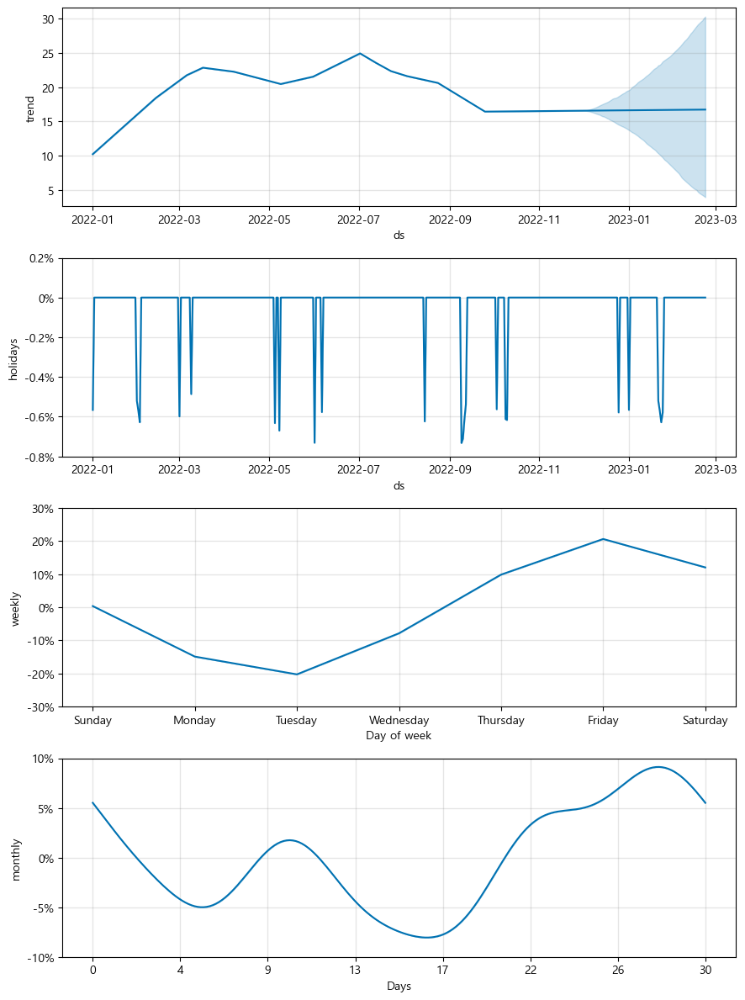

In [27]:
fig = final_model.plot_components(forecast)

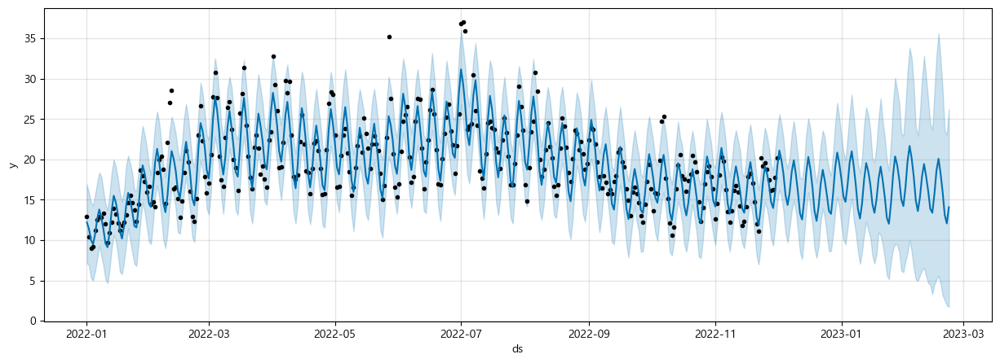

In [28]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = final_model.plot(forecast,ax=ax)
plt.show()

In [29]:
X_tst_final= final_model.predict(X_tst)
X_tst_final[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(7)

,ds,yhat,yhat_lower,yhat_upper
76,2023-02-16,18.593686,4.080784,32.579219
77,2023-02-17,20.077734,4.090706,36.014451
78,2023-02-18,18.227449,3.421514,32.404456
79,2023-02-19,15.911888,1.829601,28.578903
80,2023-02-20,13.114031,2.245590,24.281242
81,2023-02-21,12.067043,1.738472,22.990298
82,2023-02-22,14.076327,1.478928,26.980954


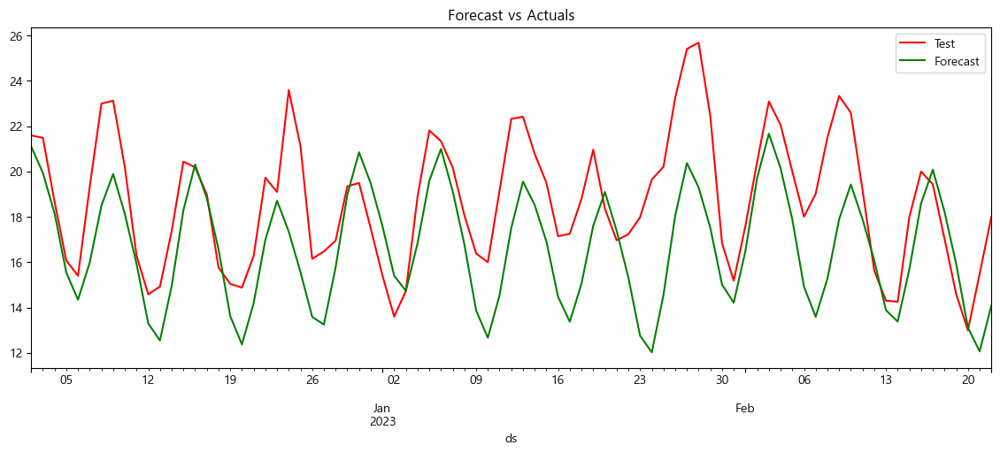

In [30]:
X_tst['ds'] = pd.to_datetime(X_tst['ds'])
X_tst_forecast['ds'] = pd.to_datetime(X_tst_forecast['ds'])

f, ax = plt.subplots(figsize=(14, 5))
X_tst.plot(kind='line', x='ds', y='y', color='red', label='Test', ax=ax)
X_tst_final.plot(kind='line', x='ds', y='yhat', color='green', label='Forecast', ax=ax)
plt.title('Forecast vs Actuals')
plt.show()

In [31]:
MAPE = mean_absolute_percentage_error(X_tst['y'],abs(X_tst_final['yhat']))
print('MAPE = ', MAPE)

MAPE =  12.485816990272983


10:12:10 - cmdstanpy - INFO - Chain [1] start processing
10:12:11 - cmdstanpy - INFO - Chain [1] done processing


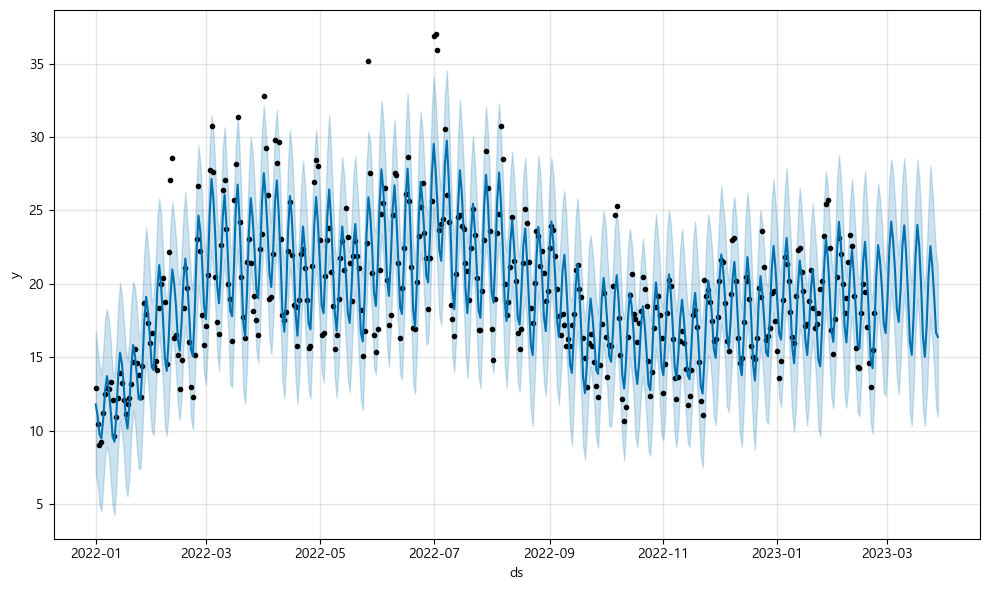

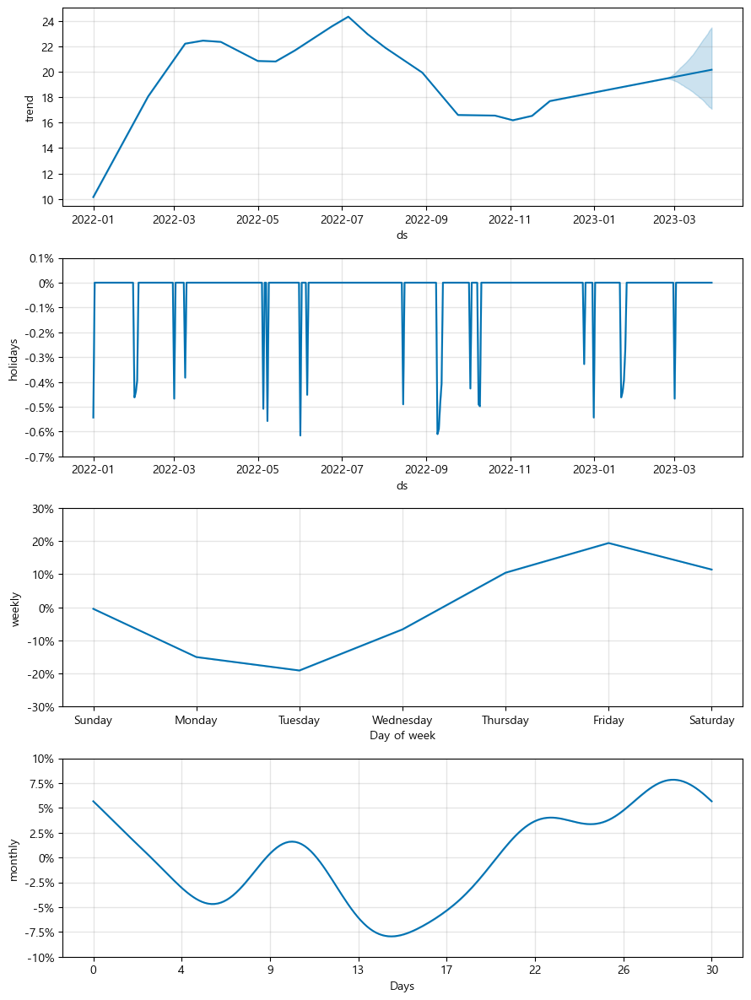

In [32]:
final_model = Prophet(holidays=holiday,
                      changepoint_prior_scale= 1.0,
                      n_changepoints = 25,
                      holidays_prior_scale = 0.01,
                      seasonality_mode = 'multiplicative',
                      seasonality_prior_scale= 0.6,
                      weekly_seasonality=True,
                      daily_seasonality = False,
                      yearly_seasonality = False,
                      interval_width=0.95)
final_model.add_seasonality(name='monthly', period=30.5, fourier_order=5)
final_model.add_country_holidays(country_name='KR')
final_model.fit(series)

future = final_model.make_future_dataframe(periods = 34)
forecast = final_model.predict(future)
fig1 = final_model.plot(forecast)
fig2 = final_model.plot_components(forecast)
plt.show()

In [33]:
ds = train.loc[:,'2022-01-01':'2023-02-22'].columns


from tqdm.auto import tqdm

save_yhat = [] # 각각 제품들의 yhat값을 저장할 빈 리스트 선언

for i in tqdm(train.index):
  series = pd.DataFrame({
    'ds':ds,
    'y':train.loc[i,'2022-01-01':'2023-02-22']
  })
  m = Prophet(holidays=holiday,
                      changepoint_prior_scale= 0.8,
                      n_changepoints = 25,
                      holidays_prior_scale = 0.01,
                      seasonality_mode = 'additive',
                      seasonality_prior_scale= 0.3,
                      weekly_seasonality=True,
                      daily_seasonality = False,
                      yearly_seasonality = False,
                      interval_width=0.95)
  m.add_seasonality(name='monthly', period=30.5, fourier_order=5) # monthly 계절성 추가
  m.add_country_holidays(country_name='KR') # 한국의 휴일 날짜를 자동으로 입력해줌. 혹시나 해서 넣어봤다.
  m.fit(series)

  future = m.make_future_dataframe(periods = 34) # 미래 34일간의 데이터 프레임을 만들어둠.
  forecast = m.predict(future) # forecast 변수에 prophet으로 예측한 값을 저장

  save_yhat.append(forecast.loc[forecast['ds'] >= '2023-02-23','yhat'].values)

  0%|          | 0/15890 [00:00<?, ?it/s]

10:13:41 - cmdstanpy - INFO - Chain [1] start processing
10:13:42 - cmdstanpy - INFO - Chain [1] done processing
10:13:42 - cmdstanpy - INFO - Chain [1] start processing
10:13:42 - cmdstanpy - INFO - Chain [1] done processing
10:13:43 - cmdstanpy - INFO - Chain [1] start processing
10:13:43 - cmdstanpy - INFO - Chain [1] done processing
10:13:43 - cmdstanpy - INFO - Chain [1] start processing
10:13:43 - cmdstanpy - INFO - Chain [1] done processing
10:13:44 - cmdstanpy - INFO - Chain [1] start processing
10:13:44 - cmdstanpy - INFO - Chain [1] done processing
10:13:44 - cmdstanpy - INFO - Chain [1] start processing
10:13:44 - cmdstanpy - INFO - Chain [1] done processing
10:13:45 - cmdstanpy - INFO - Chain [1] start processing
10:13:45 - cmdstanpy - INFO - Chain [1] done processing
10:13:46 - cmdstanpy - INFO - Chain [1] start processing
10:13:46 - cmdstanpy - INFO - Chain [1] done processing
10:13:46 - cmdstanpy - INFO - Chain [1] start processing
10:13:46 - cmdstanpy - INFO - Chain [1]

10:14:25 - cmdstanpy - INFO - Chain [1] done processing
10:14:26 - cmdstanpy - INFO - Chain [1] start processing
10:14:26 - cmdstanpy - INFO - Chain [1] done processing
10:14:26 - cmdstanpy - INFO - Chain [1] start processing
10:14:27 - cmdstanpy - INFO - Chain [1] done processing
10:14:27 - cmdstanpy - INFO - Chain [1] start processing
10:14:27 - cmdstanpy - INFO - Chain [1] done processing
10:14:28 - cmdstanpy - INFO - Chain [1] start processing
10:14:28 - cmdstanpy - INFO - Chain [1] done processing
10:14:28 - cmdstanpy - INFO - Chain [1] start processing
10:14:29 - cmdstanpy - INFO - Chain [1] done processing
10:14:29 - cmdstanpy - INFO - Chain [1] start processing
10:14:29 - cmdstanpy - INFO - Chain [1] done processing
10:14:30 - cmdstanpy - INFO - Chain [1] start processing
10:14:30 - cmdstanpy - INFO - Chain [1] done processing
10:14:30 - cmdstanpy - INFO - Chain [1] start processing
10:14:30 - cmdstanpy - INFO - Chain [1] done processing
10:14:31 - cmdstanpy - INFO - Chain [1] 

10:15:11 - cmdstanpy - INFO - Chain [1] done processing
10:15:12 - cmdstanpy - INFO - Chain [1] start processing
10:15:12 - cmdstanpy - INFO - Chain [1] done processing
10:15:12 - cmdstanpy - INFO - Chain [1] start processing
10:15:13 - cmdstanpy - INFO - Chain [1] done processing
10:15:13 - cmdstanpy - INFO - Chain [1] start processing
10:15:13 - cmdstanpy - INFO - Chain [1] done processing
10:15:14 - cmdstanpy - INFO - Chain [1] start processing
10:15:14 - cmdstanpy - INFO - Chain [1] done processing
10:15:14 - cmdstanpy - INFO - Chain [1] start processing
10:15:14 - cmdstanpy - INFO - Chain [1] done processing
10:15:15 - cmdstanpy - INFO - Chain [1] start processing
10:15:15 - cmdstanpy - INFO - Chain [1] done processing
10:15:15 - cmdstanpy - INFO - Chain [1] start processing
10:15:15 - cmdstanpy - INFO - Chain [1] done processing
10:15:16 - cmdstanpy - INFO - Chain [1] start processing
10:15:16 - cmdstanpy - INFO - Chain [1] done processing
10:15:16 - cmdstanpy - INFO - Chain [1] 

10:15:53 - cmdstanpy - INFO - Chain [1] done processing
10:15:54 - cmdstanpy - INFO - Chain [1] start processing
10:15:54 - cmdstanpy - INFO - Chain [1] done processing
10:15:54 - cmdstanpy - INFO - Chain [1] start processing
10:15:54 - cmdstanpy - INFO - Chain [1] done processing
10:15:55 - cmdstanpy - INFO - Chain [1] start processing
10:15:55 - cmdstanpy - INFO - Chain [1] done processing
10:15:55 - cmdstanpy - INFO - Chain [1] start processing
10:15:55 - cmdstanpy - INFO - Chain [1] done processing
10:15:56 - cmdstanpy - INFO - Chain [1] start processing
10:15:56 - cmdstanpy - INFO - Chain [1] done processing
10:15:56 - cmdstanpy - INFO - Chain [1] start processing
10:15:57 - cmdstanpy - INFO - Chain [1] done processing
10:15:57 - cmdstanpy - INFO - Chain [1] start processing
10:15:57 - cmdstanpy - INFO - Chain [1] done processing
10:15:58 - cmdstanpy - INFO - Chain [1] start processing
10:15:58 - cmdstanpy - INFO - Chain [1] done processing
10:15:58 - cmdstanpy - INFO - Chain [1] 

10:16:34 - cmdstanpy - INFO - Chain [1] done processing
10:16:35 - cmdstanpy - INFO - Chain [1] start processing
10:16:35 - cmdstanpy - INFO - Chain [1] done processing
10:16:36 - cmdstanpy - INFO - Chain [1] start processing
10:16:36 - cmdstanpy - INFO - Chain [1] done processing
10:16:36 - cmdstanpy - INFO - Chain [1] start processing
10:16:36 - cmdstanpy - INFO - Chain [1] done processing
10:16:37 - cmdstanpy - INFO - Chain [1] start processing
10:16:37 - cmdstanpy - INFO - Chain [1] done processing
10:16:37 - cmdstanpy - INFO - Chain [1] start processing
10:16:37 - cmdstanpy - INFO - Chain [1] done processing
10:16:38 - cmdstanpy - INFO - Chain [1] start processing
10:16:38 - cmdstanpy - INFO - Chain [1] done processing
10:16:38 - cmdstanpy - INFO - Chain [1] start processing
10:16:38 - cmdstanpy - INFO - Chain [1] done processing
10:16:39 - cmdstanpy - INFO - Chain [1] start processing
10:16:39 - cmdstanpy - INFO - Chain [1] done processing
10:16:39 - cmdstanpy - INFO - Chain [1] 

10:17:15 - cmdstanpy - INFO - Chain [1] done processing
10:17:15 - cmdstanpy - INFO - Chain [1] start processing
10:17:15 - cmdstanpy - INFO - Chain [1] done processing
10:17:16 - cmdstanpy - INFO - Chain [1] start processing
10:17:16 - cmdstanpy - INFO - Chain [1] done processing
10:17:16 - cmdstanpy - INFO - Chain [1] start processing
10:17:17 - cmdstanpy - INFO - Chain [1] done processing
10:17:17 - cmdstanpy - INFO - Chain [1] start processing
10:17:17 - cmdstanpy - INFO - Chain [1] done processing
10:17:18 - cmdstanpy - INFO - Chain [1] start processing
10:17:18 - cmdstanpy - INFO - Chain [1] done processing
10:17:18 - cmdstanpy - INFO - Chain [1] start processing
10:17:18 - cmdstanpy - INFO - Chain [1] done processing
10:17:19 - cmdstanpy - INFO - Chain [1] start processing
10:17:19 - cmdstanpy - INFO - Chain [1] done processing
10:17:19 - cmdstanpy - INFO - Chain [1] start processing
10:17:20 - cmdstanpy - INFO - Chain [1] done processing
10:17:20 - cmdstanpy - INFO - Chain [1] 

10:17:56 - cmdstanpy - INFO - Chain [1] done processing
10:17:56 - cmdstanpy - INFO - Chain [1] start processing
10:17:56 - cmdstanpy - INFO - Chain [1] done processing
10:17:57 - cmdstanpy - INFO - Chain [1] start processing
10:17:57 - cmdstanpy - INFO - Chain [1] done processing
10:17:57 - cmdstanpy - INFO - Chain [1] start processing
10:17:57 - cmdstanpy - INFO - Chain [1] done processing
10:17:58 - cmdstanpy - INFO - Chain [1] start processing
10:17:58 - cmdstanpy - INFO - Chain [1] done processing
10:17:58 - cmdstanpy - INFO - Chain [1] start processing
10:17:58 - cmdstanpy - INFO - Chain [1] done processing
10:17:59 - cmdstanpy - INFO - Chain [1] start processing
10:17:59 - cmdstanpy - INFO - Chain [1] done processing
10:17:59 - cmdstanpy - INFO - Chain [1] start processing
10:17:59 - cmdstanpy - INFO - Chain [1] done processing
10:18:00 - cmdstanpy - INFO - Chain [1] start processing
10:18:00 - cmdstanpy - INFO - Chain [1] done processing
10:18:00 - cmdstanpy - INFO - Chain [1] 

10:18:36 - cmdstanpy - INFO - Chain [1] done processing
10:18:37 - cmdstanpy - INFO - Chain [1] start processing
10:18:37 - cmdstanpy - INFO - Chain [1] done processing
10:18:37 - cmdstanpy - INFO - Chain [1] start processing
10:18:37 - cmdstanpy - INFO - Chain [1] done processing
10:18:38 - cmdstanpy - INFO - Chain [1] start processing
10:18:38 - cmdstanpy - INFO - Chain [1] done processing
10:18:38 - cmdstanpy - INFO - Chain [1] start processing
10:18:38 - cmdstanpy - INFO - Chain [1] done processing
10:18:39 - cmdstanpy - INFO - Chain [1] start processing
10:18:39 - cmdstanpy - INFO - Chain [1] done processing
10:18:39 - cmdstanpy - INFO - Chain [1] start processing
10:18:39 - cmdstanpy - INFO - Chain [1] done processing
10:18:40 - cmdstanpy - INFO - Chain [1] start processing
10:18:40 - cmdstanpy - INFO - Chain [1] done processing
10:18:40 - cmdstanpy - INFO - Chain [1] start processing
10:18:40 - cmdstanpy - INFO - Chain [1] done processing
10:18:41 - cmdstanpy - INFO - Chain [1] 

10:19:20 - cmdstanpy - INFO - Chain [1] done processing
10:19:21 - cmdstanpy - INFO - Chain [1] start processing
10:19:21 - cmdstanpy - INFO - Chain [1] done processing
10:19:21 - cmdstanpy - INFO - Chain [1] start processing
10:19:21 - cmdstanpy - INFO - Chain [1] done processing
10:19:22 - cmdstanpy - INFO - Chain [1] start processing
10:19:22 - cmdstanpy - INFO - Chain [1] done processing
10:19:22 - cmdstanpy - INFO - Chain [1] start processing
10:19:22 - cmdstanpy - INFO - Chain [1] done processing
10:19:23 - cmdstanpy - INFO - Chain [1] start processing
10:19:23 - cmdstanpy - INFO - Chain [1] done processing
10:19:23 - cmdstanpy - INFO - Chain [1] start processing
10:19:24 - cmdstanpy - INFO - Chain [1] done processing
10:19:24 - cmdstanpy - INFO - Chain [1] start processing
10:19:24 - cmdstanpy - INFO - Chain [1] done processing
10:19:24 - cmdstanpy - INFO - Chain [1] start processing
10:19:25 - cmdstanpy - INFO - Chain [1] done processing
10:19:25 - cmdstanpy - INFO - Chain [1] 

10:20:01 - cmdstanpy - INFO - Chain [1] done processing
10:20:02 - cmdstanpy - INFO - Chain [1] start processing
10:20:02 - cmdstanpy - INFO - Chain [1] done processing
10:20:02 - cmdstanpy - INFO - Chain [1] start processing
10:20:03 - cmdstanpy - INFO - Chain [1] done processing
10:20:03 - cmdstanpy - INFO - Chain [1] start processing
10:20:03 - cmdstanpy - INFO - Chain [1] done processing
10:20:04 - cmdstanpy - INFO - Chain [1] start processing
10:20:04 - cmdstanpy - INFO - Chain [1] done processing
10:20:04 - cmdstanpy - INFO - Chain [1] start processing
10:20:05 - cmdstanpy - INFO - Chain [1] done processing
10:20:05 - cmdstanpy - INFO - Chain [1] start processing
10:20:06 - cmdstanpy - INFO - Chain [1] done processing
10:20:06 - cmdstanpy - INFO - Chain [1] start processing
10:20:06 - cmdstanpy - INFO - Chain [1] done processing
10:20:07 - cmdstanpy - INFO - Chain [1] start processing
10:20:07 - cmdstanpy - INFO - Chain [1] done processing
10:20:07 - cmdstanpy - INFO - Chain [1] 

10:20:43 - cmdstanpy - INFO - Chain [1] done processing
10:20:43 - cmdstanpy - INFO - Chain [1] start processing
10:20:43 - cmdstanpy - INFO - Chain [1] done processing
10:20:44 - cmdstanpy - INFO - Chain [1] start processing
10:20:44 - cmdstanpy - INFO - Chain [1] done processing
10:20:44 - cmdstanpy - INFO - Chain [1] start processing
10:20:45 - cmdstanpy - INFO - Chain [1] done processing
10:20:45 - cmdstanpy - INFO - Chain [1] start processing
10:20:45 - cmdstanpy - INFO - Chain [1] done processing
10:20:46 - cmdstanpy - INFO - Chain [1] start processing
10:20:46 - cmdstanpy - INFO - Chain [1] done processing
10:20:46 - cmdstanpy - INFO - Chain [1] start processing
10:20:46 - cmdstanpy - INFO - Chain [1] done processing
10:20:47 - cmdstanpy - INFO - Chain [1] start processing
10:20:47 - cmdstanpy - INFO - Chain [1] done processing
10:20:47 - cmdstanpy - INFO - Chain [1] start processing
10:20:47 - cmdstanpy - INFO - Chain [1] done processing
10:20:48 - cmdstanpy - INFO - Chain [1] 

10:21:23 - cmdstanpy - INFO - Chain [1] done processing
10:21:23 - cmdstanpy - INFO - Chain [1] start processing
10:21:23 - cmdstanpy - INFO - Chain [1] done processing
10:21:24 - cmdstanpy - INFO - Chain [1] start processing
10:21:24 - cmdstanpy - INFO - Chain [1] done processing
10:21:24 - cmdstanpy - INFO - Chain [1] start processing
10:21:24 - cmdstanpy - INFO - Chain [1] done processing
10:21:25 - cmdstanpy - INFO - Chain [1] start processing
10:21:25 - cmdstanpy - INFO - Chain [1] done processing
10:21:25 - cmdstanpy - INFO - Chain [1] start processing
10:21:25 - cmdstanpy - INFO - Chain [1] done processing
10:21:26 - cmdstanpy - INFO - Chain [1] start processing
10:21:26 - cmdstanpy - INFO - Chain [1] done processing
10:21:26 - cmdstanpy - INFO - Chain [1] start processing
10:21:27 - cmdstanpy - INFO - Chain [1] done processing
10:21:27 - cmdstanpy - INFO - Chain [1] start processing
10:21:27 - cmdstanpy - INFO - Chain [1] done processing
10:21:27 - cmdstanpy - INFO - Chain [1] 

10:22:03 - cmdstanpy - INFO - Chain [1] done processing
10:22:03 - cmdstanpy - INFO - Chain [1] start processing
10:22:03 - cmdstanpy - INFO - Chain [1] done processing
10:22:04 - cmdstanpy - INFO - Chain [1] start processing
10:22:04 - cmdstanpy - INFO - Chain [1] done processing
10:22:04 - cmdstanpy - INFO - Chain [1] start processing
10:22:04 - cmdstanpy - INFO - Chain [1] done processing
10:22:05 - cmdstanpy - INFO - Chain [1] start processing
10:22:05 - cmdstanpy - INFO - Chain [1] done processing
10:22:05 - cmdstanpy - INFO - Chain [1] start processing
10:22:05 - cmdstanpy - INFO - Chain [1] done processing
10:22:06 - cmdstanpy - INFO - Chain [1] start processing
10:22:06 - cmdstanpy - INFO - Chain [1] done processing
10:22:06 - cmdstanpy - INFO - Chain [1] start processing
10:22:06 - cmdstanpy - INFO - Chain [1] done processing
10:22:07 - cmdstanpy - INFO - Chain [1] start processing
10:22:07 - cmdstanpy - INFO - Chain [1] done processing
10:22:07 - cmdstanpy - INFO - Chain [1] 

10:22:43 - cmdstanpy - INFO - Chain [1] done processing
10:22:44 - cmdstanpy - INFO - Chain [1] start processing
10:22:44 - cmdstanpy - INFO - Chain [1] done processing
10:22:44 - cmdstanpy - INFO - Chain [1] start processing
10:22:44 - cmdstanpy - INFO - Chain [1] done processing
10:22:45 - cmdstanpy - INFO - Chain [1] start processing
10:22:45 - cmdstanpy - INFO - Chain [1] done processing
10:22:45 - cmdstanpy - INFO - Chain [1] start processing
10:22:46 - cmdstanpy - INFO - Chain [1] done processing
10:22:46 - cmdstanpy - INFO - Chain [1] start processing
10:22:46 - cmdstanpy - INFO - Chain [1] done processing
10:22:47 - cmdstanpy - INFO - Chain [1] start processing
10:22:47 - cmdstanpy - INFO - Chain [1] done processing
10:22:47 - cmdstanpy - INFO - Chain [1] start processing
10:22:47 - cmdstanpy - INFO - Chain [1] done processing
10:22:48 - cmdstanpy - INFO - Chain [1] start processing
10:22:48 - cmdstanpy - INFO - Chain [1] done processing
10:22:48 - cmdstanpy - INFO - Chain [1] 

10:23:26 - cmdstanpy - INFO - Chain [1] done processing
10:23:26 - cmdstanpy - INFO - Chain [1] start processing
10:23:26 - cmdstanpy - INFO - Chain [1] done processing
10:23:27 - cmdstanpy - INFO - Chain [1] start processing
10:23:27 - cmdstanpy - INFO - Chain [1] done processing
10:23:27 - cmdstanpy - INFO - Chain [1] start processing
10:23:27 - cmdstanpy - INFO - Chain [1] done processing
10:23:28 - cmdstanpy - INFO - Chain [1] start processing
10:23:28 - cmdstanpy - INFO - Chain [1] done processing
10:23:28 - cmdstanpy - INFO - Chain [1] start processing
10:23:29 - cmdstanpy - INFO - Chain [1] done processing
10:23:29 - cmdstanpy - INFO - Chain [1] start processing
10:23:29 - cmdstanpy - INFO - Chain [1] done processing
10:23:29 - cmdstanpy - INFO - Chain [1] start processing
10:23:30 - cmdstanpy - INFO - Chain [1] done processing
10:23:30 - cmdstanpy - INFO - Chain [1] start processing
10:23:30 - cmdstanpy - INFO - Chain [1] done processing
10:23:31 - cmdstanpy - INFO - Chain [1] 

10:24:08 - cmdstanpy - INFO - Chain [1] done processing
10:24:09 - cmdstanpy - INFO - Chain [1] start processing
10:24:09 - cmdstanpy - INFO - Chain [1] done processing
10:24:09 - cmdstanpy - INFO - Chain [1] start processing
10:24:09 - cmdstanpy - INFO - Chain [1] done processing
10:24:10 - cmdstanpy - INFO - Chain [1] start processing
10:24:10 - cmdstanpy - INFO - Chain [1] done processing
10:24:10 - cmdstanpy - INFO - Chain [1] start processing
10:24:10 - cmdstanpy - INFO - Chain [1] done processing
10:24:11 - cmdstanpy - INFO - Chain [1] start processing
10:24:11 - cmdstanpy - INFO - Chain [1] done processing
10:24:11 - cmdstanpy - INFO - Chain [1] start processing
10:24:11 - cmdstanpy - INFO - Chain [1] done processing
10:24:12 - cmdstanpy - INFO - Chain [1] start processing
10:24:12 - cmdstanpy - INFO - Chain [1] done processing
10:24:13 - cmdstanpy - INFO - Chain [1] start processing
10:24:13 - cmdstanpy - INFO - Chain [1] done processing
10:24:14 - cmdstanpy - INFO - Chain [1] 

10:24:49 - cmdstanpy - INFO - Chain [1] done processing
10:24:49 - cmdstanpy - INFO - Chain [1] start processing
10:24:49 - cmdstanpy - INFO - Chain [1] done processing
10:24:50 - cmdstanpy - INFO - Chain [1] start processing
10:24:50 - cmdstanpy - INFO - Chain [1] done processing
10:24:50 - cmdstanpy - INFO - Chain [1] start processing
10:24:50 - cmdstanpy - INFO - Chain [1] done processing
10:24:51 - cmdstanpy - INFO - Chain [1] start processing
10:24:51 - cmdstanpy - INFO - Chain [1] done processing
10:24:51 - cmdstanpy - INFO - Chain [1] start processing
10:24:51 - cmdstanpy - INFO - Chain [1] done processing
10:24:52 - cmdstanpy - INFO - Chain [1] start processing
10:24:52 - cmdstanpy - INFO - Chain [1] done processing
10:24:52 - cmdstanpy - INFO - Chain [1] start processing
10:24:52 - cmdstanpy - INFO - Chain [1] done processing
10:24:53 - cmdstanpy - INFO - Chain [1] start processing
10:24:53 - cmdstanpy - INFO - Chain [1] done processing
10:24:53 - cmdstanpy - INFO - Chain [1] 

10:25:28 - cmdstanpy - INFO - Chain [1] done processing
10:25:29 - cmdstanpy - INFO - Chain [1] start processing
10:25:29 - cmdstanpy - INFO - Chain [1] done processing
10:25:29 - cmdstanpy - INFO - Chain [1] start processing
10:25:29 - cmdstanpy - INFO - Chain [1] done processing
10:25:30 - cmdstanpy - INFO - Chain [1] start processing
10:25:30 - cmdstanpy - INFO - Chain [1] done processing
10:25:30 - cmdstanpy - INFO - Chain [1] start processing
10:25:30 - cmdstanpy - INFO - Chain [1] done processing
10:25:31 - cmdstanpy - INFO - Chain [1] start processing
10:25:31 - cmdstanpy - INFO - Chain [1] done processing
10:25:31 - cmdstanpy - INFO - Chain [1] start processing
10:25:32 - cmdstanpy - INFO - Chain [1] done processing
10:25:32 - cmdstanpy - INFO - Chain [1] start processing
10:25:32 - cmdstanpy - INFO - Chain [1] done processing
10:25:32 - cmdstanpy - INFO - Chain [1] start processing
10:25:33 - cmdstanpy - INFO - Chain [1] done processing
10:25:33 - cmdstanpy - INFO - Chain [1] 

10:26:10 - cmdstanpy - INFO - Chain [1] done processing
10:26:10 - cmdstanpy - INFO - Chain [1] start processing
10:26:10 - cmdstanpy - INFO - Chain [1] done processing
10:26:11 - cmdstanpy - INFO - Chain [1] start processing
10:26:11 - cmdstanpy - INFO - Chain [1] done processing
10:26:11 - cmdstanpy - INFO - Chain [1] start processing
10:26:12 - cmdstanpy - INFO - Chain [1] done processing
10:26:12 - cmdstanpy - INFO - Chain [1] start processing
10:26:12 - cmdstanpy - INFO - Chain [1] done processing
10:26:12 - cmdstanpy - INFO - Chain [1] start processing
10:26:13 - cmdstanpy - INFO - Chain [1] done processing
10:26:13 - cmdstanpy - INFO - Chain [1] start processing
10:26:13 - cmdstanpy - INFO - Chain [1] done processing
10:26:13 - cmdstanpy - INFO - Chain [1] start processing
10:26:14 - cmdstanpy - INFO - Chain [1] done processing
10:26:14 - cmdstanpy - INFO - Chain [1] start processing
10:26:14 - cmdstanpy - INFO - Chain [1] done processing
10:26:15 - cmdstanpy - INFO - Chain [1] 

10:26:50 - cmdstanpy - INFO - Chain [1] done processing
10:26:51 - cmdstanpy - INFO - Chain [1] start processing
10:26:51 - cmdstanpy - INFO - Chain [1] done processing
10:26:51 - cmdstanpy - INFO - Chain [1] start processing
10:26:51 - cmdstanpy - INFO - Chain [1] done processing
10:26:52 - cmdstanpy - INFO - Chain [1] start processing
10:26:52 - cmdstanpy - INFO - Chain [1] done processing
10:26:53 - cmdstanpy - INFO - Chain [1] start processing
10:26:53 - cmdstanpy - INFO - Chain [1] done processing
10:26:53 - cmdstanpy - INFO - Chain [1] start processing
10:26:53 - cmdstanpy - INFO - Chain [1] done processing
10:26:54 - cmdstanpy - INFO - Chain [1] start processing
10:26:54 - cmdstanpy - INFO - Chain [1] done processing
10:26:54 - cmdstanpy - INFO - Chain [1] start processing
10:26:55 - cmdstanpy - INFO - Chain [1] done processing
10:26:55 - cmdstanpy - INFO - Chain [1] start processing
10:26:55 - cmdstanpy - INFO - Chain [1] done processing
10:26:56 - cmdstanpy - INFO - Chain [1] 

10:27:31 - cmdstanpy - INFO - Chain [1] done processing
10:27:32 - cmdstanpy - INFO - Chain [1] start processing
10:27:32 - cmdstanpy - INFO - Chain [1] done processing
10:27:32 - cmdstanpy - INFO - Chain [1] start processing
10:27:32 - cmdstanpy - INFO - Chain [1] done processing
10:27:33 - cmdstanpy - INFO - Chain [1] start processing
10:27:33 - cmdstanpy - INFO - Chain [1] done processing
10:27:33 - cmdstanpy - INFO - Chain [1] start processing
10:27:33 - cmdstanpy - INFO - Chain [1] done processing
10:27:34 - cmdstanpy - INFO - Chain [1] start processing
10:27:34 - cmdstanpy - INFO - Chain [1] done processing
10:27:34 - cmdstanpy - INFO - Chain [1] start processing
10:27:35 - cmdstanpy - INFO - Chain [1] done processing
10:27:35 - cmdstanpy - INFO - Chain [1] start processing
10:27:35 - cmdstanpy - INFO - Chain [1] done processing
10:27:36 - cmdstanpy - INFO - Chain [1] start processing
10:27:36 - cmdstanpy - INFO - Chain [1] done processing
10:27:36 - cmdstanpy - INFO - Chain [1] 

10:28:11 - cmdstanpy - INFO - Chain [1] done processing
10:28:12 - cmdstanpy - INFO - Chain [1] start processing
10:28:12 - cmdstanpy - INFO - Chain [1] done processing
10:28:12 - cmdstanpy - INFO - Chain [1] start processing
10:28:13 - cmdstanpy - INFO - Chain [1] done processing
10:28:13 - cmdstanpy - INFO - Chain [1] start processing
10:28:13 - cmdstanpy - INFO - Chain [1] done processing
10:28:14 - cmdstanpy - INFO - Chain [1] start processing
10:28:14 - cmdstanpy - INFO - Chain [1] done processing
10:28:14 - cmdstanpy - INFO - Chain [1] start processing
10:28:14 - cmdstanpy - INFO - Chain [1] done processing
10:28:15 - cmdstanpy - INFO - Chain [1] start processing
10:28:15 - cmdstanpy - INFO - Chain [1] done processing
10:28:15 - cmdstanpy - INFO - Chain [1] start processing
10:28:15 - cmdstanpy - INFO - Chain [1] done processing
10:28:16 - cmdstanpy - INFO - Chain [1] start processing
10:28:16 - cmdstanpy - INFO - Chain [1] done processing
10:28:16 - cmdstanpy - INFO - Chain [1] 

10:28:52 - cmdstanpy - INFO - Chain [1] done processing
10:28:52 - cmdstanpy - INFO - Chain [1] start processing
10:28:52 - cmdstanpy - INFO - Chain [1] done processing
10:28:53 - cmdstanpy - INFO - Chain [1] start processing
10:28:53 - cmdstanpy - INFO - Chain [1] done processing
10:28:53 - cmdstanpy - INFO - Chain [1] start processing
10:28:53 - cmdstanpy - INFO - Chain [1] done processing
10:28:54 - cmdstanpy - INFO - Chain [1] start processing
10:28:54 - cmdstanpy - INFO - Chain [1] done processing
10:28:54 - cmdstanpy - INFO - Chain [1] start processing
10:28:54 - cmdstanpy - INFO - Chain [1] done processing
10:28:55 - cmdstanpy - INFO - Chain [1] start processing
10:28:55 - cmdstanpy - INFO - Chain [1] done processing
10:28:55 - cmdstanpy - INFO - Chain [1] start processing
10:28:55 - cmdstanpy - INFO - Chain [1] done processing
10:28:56 - cmdstanpy - INFO - Chain [1] start processing
10:28:56 - cmdstanpy - INFO - Chain [1] done processing
10:28:56 - cmdstanpy - INFO - Chain [1] 

10:29:32 - cmdstanpy - INFO - Chain [1] done processing
10:29:33 - cmdstanpy - INFO - Chain [1] start processing
10:29:33 - cmdstanpy - INFO - Chain [1] done processing
10:29:33 - cmdstanpy - INFO - Chain [1] start processing
10:29:33 - cmdstanpy - INFO - Chain [1] done processing
10:29:34 - cmdstanpy - INFO - Chain [1] start processing
10:29:34 - cmdstanpy - INFO - Chain [1] done processing
10:29:34 - cmdstanpy - INFO - Chain [1] start processing
10:29:34 - cmdstanpy - INFO - Chain [1] done processing
10:29:35 - cmdstanpy - INFO - Chain [1] start processing
10:29:35 - cmdstanpy - INFO - Chain [1] done processing
10:29:35 - cmdstanpy - INFO - Chain [1] start processing
10:29:35 - cmdstanpy - INFO - Chain [1] done processing
10:29:36 - cmdstanpy - INFO - Chain [1] start processing
10:29:36 - cmdstanpy - INFO - Chain [1] done processing
10:29:36 - cmdstanpy - INFO - Chain [1] start processing
10:29:37 - cmdstanpy - INFO - Chain [1] done processing
10:29:37 - cmdstanpy - INFO - Chain [1] 

10:30:12 - cmdstanpy - INFO - Chain [1] done processing
10:30:13 - cmdstanpy - INFO - Chain [1] start processing
10:30:13 - cmdstanpy - INFO - Chain [1] done processing
10:30:13 - cmdstanpy - INFO - Chain [1] start processing
10:30:13 - cmdstanpy - INFO - Chain [1] done processing
10:30:14 - cmdstanpy - INFO - Chain [1] start processing
10:30:14 - cmdstanpy - INFO - Chain [1] done processing
10:30:14 - cmdstanpy - INFO - Chain [1] start processing
10:30:15 - cmdstanpy - INFO - Chain [1] done processing
10:30:15 - cmdstanpy - INFO - Chain [1] start processing
10:30:15 - cmdstanpy - INFO - Chain [1] done processing
10:30:15 - cmdstanpy - INFO - Chain [1] start processing
10:30:16 - cmdstanpy - INFO - Chain [1] done processing
10:30:16 - cmdstanpy - INFO - Chain [1] start processing
10:30:16 - cmdstanpy - INFO - Chain [1] done processing
10:30:17 - cmdstanpy - INFO - Chain [1] start processing
10:30:17 - cmdstanpy - INFO - Chain [1] done processing
10:30:17 - cmdstanpy - INFO - Chain [1] 

10:30:58 - cmdstanpy - INFO - Chain [1] done processing
10:30:58 - cmdstanpy - INFO - Chain [1] start processing
10:30:58 - cmdstanpy - INFO - Chain [1] done processing
10:30:58 - cmdstanpy - INFO - Chain [1] start processing
10:30:59 - cmdstanpy - INFO - Chain [1] done processing
10:30:59 - cmdstanpy - INFO - Chain [1] start processing
10:30:59 - cmdstanpy - INFO - Chain [1] done processing
10:30:59 - cmdstanpy - INFO - Chain [1] start processing
10:31:00 - cmdstanpy - INFO - Chain [1] done processing
10:31:00 - cmdstanpy - INFO - Chain [1] start processing
10:31:00 - cmdstanpy - INFO - Chain [1] done processing
10:31:00 - cmdstanpy - INFO - Chain [1] start processing
10:31:01 - cmdstanpy - INFO - Chain [1] done processing
10:31:01 - cmdstanpy - INFO - Chain [1] start processing
10:31:01 - cmdstanpy - INFO - Chain [1] done processing
10:31:02 - cmdstanpy - INFO - Chain [1] start processing
10:31:02 - cmdstanpy - INFO - Chain [1] done processing
10:31:02 - cmdstanpy - INFO - Chain [1] 

10:31:40 - cmdstanpy - INFO - Chain [1] done processing
10:31:40 - cmdstanpy - INFO - Chain [1] start processing
10:31:41 - cmdstanpy - INFO - Chain [1] done processing
10:31:41 - cmdstanpy - INFO - Chain [1] start processing
10:31:41 - cmdstanpy - INFO - Chain [1] done processing
10:31:42 - cmdstanpy - INFO - Chain [1] start processing
10:31:42 - cmdstanpy - INFO - Chain [1] done processing
10:31:42 - cmdstanpy - INFO - Chain [1] start processing
10:31:42 - cmdstanpy - INFO - Chain [1] done processing
10:31:43 - cmdstanpy - INFO - Chain [1] start processing
10:31:43 - cmdstanpy - INFO - Chain [1] done processing
10:31:43 - cmdstanpy - INFO - Chain [1] start processing
10:31:43 - cmdstanpy - INFO - Chain [1] done processing
10:31:44 - cmdstanpy - INFO - Chain [1] start processing
10:31:44 - cmdstanpy - INFO - Chain [1] done processing
10:31:44 - cmdstanpy - INFO - Chain [1] start processing
10:31:44 - cmdstanpy - INFO - Chain [1] done processing
10:31:45 - cmdstanpy - INFO - Chain [1] 

10:32:20 - cmdstanpy - INFO - Chain [1] done processing
10:32:20 - cmdstanpy - INFO - Chain [1] start processing
10:32:21 - cmdstanpy - INFO - Chain [1] done processing
10:32:21 - cmdstanpy - INFO - Chain [1] start processing
10:32:21 - cmdstanpy - INFO - Chain [1] done processing
10:32:22 - cmdstanpy - INFO - Chain [1] start processing
10:32:22 - cmdstanpy - INFO - Chain [1] done processing
10:32:22 - cmdstanpy - INFO - Chain [1] start processing
10:32:22 - cmdstanpy - INFO - Chain [1] done processing
10:32:23 - cmdstanpy - INFO - Chain [1] start processing
10:32:23 - cmdstanpy - INFO - Chain [1] done processing
10:32:23 - cmdstanpy - INFO - Chain [1] start processing
10:32:24 - cmdstanpy - INFO - Chain [1] done processing
10:32:24 - cmdstanpy - INFO - Chain [1] start processing
10:32:24 - cmdstanpy - INFO - Chain [1] done processing
10:32:24 - cmdstanpy - INFO - Chain [1] start processing
10:32:25 - cmdstanpy - INFO - Chain [1] done processing
10:32:25 - cmdstanpy - INFO - Chain [1] 

10:32:59 - cmdstanpy - INFO - Chain [1] done processing
10:33:00 - cmdstanpy - INFO - Chain [1] start processing
10:33:00 - cmdstanpy - INFO - Chain [1] done processing
10:33:00 - cmdstanpy - INFO - Chain [1] start processing
10:33:00 - cmdstanpy - INFO - Chain [1] done processing
10:33:01 - cmdstanpy - INFO - Chain [1] start processing
10:33:01 - cmdstanpy - INFO - Chain [1] done processing
10:33:01 - cmdstanpy - INFO - Chain [1] start processing
10:33:01 - cmdstanpy - INFO - Chain [1] done processing
10:33:02 - cmdstanpy - INFO - Chain [1] start processing
10:33:02 - cmdstanpy - INFO - Chain [1] done processing
10:33:03 - cmdstanpy - INFO - Chain [1] start processing
10:33:03 - cmdstanpy - INFO - Chain [1] done processing
10:33:03 - cmdstanpy - INFO - Chain [1] start processing
10:33:03 - cmdstanpy - INFO - Chain [1] done processing
10:33:04 - cmdstanpy - INFO - Chain [1] start processing
10:33:04 - cmdstanpy - INFO - Chain [1] done processing
10:33:04 - cmdstanpy - INFO - Chain [1] 

10:33:45 - cmdstanpy - INFO - Chain [1] done processing
10:33:45 - cmdstanpy - INFO - Chain [1] start processing
10:33:45 - cmdstanpy - INFO - Chain [1] done processing
10:33:46 - cmdstanpy - INFO - Chain [1] start processing
10:33:46 - cmdstanpy - INFO - Chain [1] done processing
10:33:46 - cmdstanpy - INFO - Chain [1] start processing
10:33:47 - cmdstanpy - INFO - Chain [1] done processing
10:33:47 - cmdstanpy - INFO - Chain [1] start processing
10:33:47 - cmdstanpy - INFO - Chain [1] done processing
10:33:47 - cmdstanpy - INFO - Chain [1] start processing
10:33:48 - cmdstanpy - INFO - Chain [1] done processing
10:33:48 - cmdstanpy - INFO - Chain [1] start processing
10:33:48 - cmdstanpy - INFO - Chain [1] done processing
10:33:49 - cmdstanpy - INFO - Chain [1] start processing
10:33:49 - cmdstanpy - INFO - Chain [1] done processing
10:33:49 - cmdstanpy - INFO - Chain [1] start processing
10:33:49 - cmdstanpy - INFO - Chain [1] done processing
10:33:50 - cmdstanpy - INFO - Chain [1] 

10:34:26 - cmdstanpy - INFO - Chain [1] done processing
10:34:26 - cmdstanpy - INFO - Chain [1] start processing
10:34:27 - cmdstanpy - INFO - Chain [1] done processing
10:34:27 - cmdstanpy - INFO - Chain [1] start processing
10:34:27 - cmdstanpy - INFO - Chain [1] done processing
10:34:28 - cmdstanpy - INFO - Chain [1] start processing
10:34:28 - cmdstanpy - INFO - Chain [1] done processing
10:34:28 - cmdstanpy - INFO - Chain [1] start processing
10:34:28 - cmdstanpy - INFO - Chain [1] done processing
10:34:29 - cmdstanpy - INFO - Chain [1] start processing
10:34:29 - cmdstanpy - INFO - Chain [1] done processing
10:34:29 - cmdstanpy - INFO - Chain [1] start processing
10:34:29 - cmdstanpy - INFO - Chain [1] done processing
10:34:30 - cmdstanpy - INFO - Chain [1] start processing
10:34:30 - cmdstanpy - INFO - Chain [1] done processing
10:34:30 - cmdstanpy - INFO - Chain [1] start processing
10:34:30 - cmdstanpy - INFO - Chain [1] done processing
10:34:31 - cmdstanpy - INFO - Chain [1] 

10:35:07 - cmdstanpy - INFO - Chain [1] done processing
10:35:07 - cmdstanpy - INFO - Chain [1] start processing
10:35:08 - cmdstanpy - INFO - Chain [1] done processing
10:35:08 - cmdstanpy - INFO - Chain [1] start processing
10:35:08 - cmdstanpy - INFO - Chain [1] done processing
10:35:09 - cmdstanpy - INFO - Chain [1] start processing
10:35:09 - cmdstanpy - INFO - Chain [1] done processing
10:35:09 - cmdstanpy - INFO - Chain [1] start processing
10:35:09 - cmdstanpy - INFO - Chain [1] done processing
10:35:10 - cmdstanpy - INFO - Chain [1] start processing
10:35:10 - cmdstanpy - INFO - Chain [1] done processing
10:35:10 - cmdstanpy - INFO - Chain [1] start processing
10:35:10 - cmdstanpy - INFO - Chain [1] done processing
10:35:11 - cmdstanpy - INFO - Chain [1] start processing
10:35:11 - cmdstanpy - INFO - Chain [1] done processing
10:35:11 - cmdstanpy - INFO - Chain [1] start processing
10:35:12 - cmdstanpy - INFO - Chain [1] done processing
10:35:12 - cmdstanpy - INFO - Chain [1] 

10:35:48 - cmdstanpy - INFO - Chain [1] done processing
10:35:48 - cmdstanpy - INFO - Chain [1] start processing
10:35:48 - cmdstanpy - INFO - Chain [1] done processing
10:35:49 - cmdstanpy - INFO - Chain [1] start processing
10:35:49 - cmdstanpy - INFO - Chain [1] done processing
10:35:49 - cmdstanpy - INFO - Chain [1] start processing
10:35:49 - cmdstanpy - INFO - Chain [1] done processing
10:35:50 - cmdstanpy - INFO - Chain [1] start processing
10:35:50 - cmdstanpy - INFO - Chain [1] done processing
10:35:50 - cmdstanpy - INFO - Chain [1] start processing
10:35:51 - cmdstanpy - INFO - Chain [1] done processing
10:35:51 - cmdstanpy - INFO - Chain [1] start processing
10:35:51 - cmdstanpy - INFO - Chain [1] done processing
10:35:52 - cmdstanpy - INFO - Chain [1] start processing
10:35:52 - cmdstanpy - INFO - Chain [1] done processing
10:35:52 - cmdstanpy - INFO - Chain [1] start processing
10:35:52 - cmdstanpy - INFO - Chain [1] done processing
10:35:53 - cmdstanpy - INFO - Chain [1] 

10:36:31 - cmdstanpy - INFO - Chain [1] done processing
10:36:32 - cmdstanpy - INFO - Chain [1] start processing
10:36:32 - cmdstanpy - INFO - Chain [1] done processing
10:36:32 - cmdstanpy - INFO - Chain [1] start processing
10:36:33 - cmdstanpy - INFO - Chain [1] done processing
10:36:33 - cmdstanpy - INFO - Chain [1] start processing
10:36:33 - cmdstanpy - INFO - Chain [1] done processing
10:36:34 - cmdstanpy - INFO - Chain [1] start processing
10:36:34 - cmdstanpy - INFO - Chain [1] done processing
10:36:34 - cmdstanpy - INFO - Chain [1] start processing
10:36:35 - cmdstanpy - INFO - Chain [1] done processing
10:36:35 - cmdstanpy - INFO - Chain [1] start processing
10:36:35 - cmdstanpy - INFO - Chain [1] done processing
10:36:36 - cmdstanpy - INFO - Chain [1] start processing
10:36:36 - cmdstanpy - INFO - Chain [1] done processing
10:36:36 - cmdstanpy - INFO - Chain [1] start processing
10:36:36 - cmdstanpy - INFO - Chain [1] done processing
10:36:37 - cmdstanpy - INFO - Chain [1] 

10:37:12 - cmdstanpy - INFO - Chain [1] done processing
10:37:13 - cmdstanpy - INFO - Chain [1] start processing
10:37:13 - cmdstanpy - INFO - Chain [1] done processing
10:37:13 - cmdstanpy - INFO - Chain [1] start processing
10:37:13 - cmdstanpy - INFO - Chain [1] done processing
10:37:14 - cmdstanpy - INFO - Chain [1] start processing
10:37:14 - cmdstanpy - INFO - Chain [1] done processing
10:37:14 - cmdstanpy - INFO - Chain [1] start processing
10:37:15 - cmdstanpy - INFO - Chain [1] done processing
10:37:15 - cmdstanpy - INFO - Chain [1] start processing
10:37:15 - cmdstanpy - INFO - Chain [1] done processing
10:37:16 - cmdstanpy - INFO - Chain [1] start processing
10:37:16 - cmdstanpy - INFO - Chain [1] done processing
10:37:16 - cmdstanpy - INFO - Chain [1] start processing
10:37:16 - cmdstanpy - INFO - Chain [1] done processing
10:37:17 - cmdstanpy - INFO - Chain [1] start processing
10:37:17 - cmdstanpy - INFO - Chain [1] done processing
10:37:17 - cmdstanpy - INFO - Chain [1] 

10:37:55 - cmdstanpy - INFO - Chain [1] done processing
10:37:56 - cmdstanpy - INFO - Chain [1] start processing
10:37:56 - cmdstanpy - INFO - Chain [1] done processing
10:37:56 - cmdstanpy - INFO - Chain [1] start processing
10:37:56 - cmdstanpy - INFO - Chain [1] done processing
10:37:57 - cmdstanpy - INFO - Chain [1] start processing
10:37:57 - cmdstanpy - INFO - Chain [1] done processing
10:37:57 - cmdstanpy - INFO - Chain [1] start processing
10:37:58 - cmdstanpy - INFO - Chain [1] done processing
10:37:58 - cmdstanpy - INFO - Chain [1] start processing
10:37:58 - cmdstanpy - INFO - Chain [1] done processing
10:37:59 - cmdstanpy - INFO - Chain [1] start processing
10:37:59 - cmdstanpy - INFO - Chain [1] done processing
10:37:59 - cmdstanpy - INFO - Chain [1] start processing
10:37:59 - cmdstanpy - INFO - Chain [1] done processing
10:38:00 - cmdstanpy - INFO - Chain [1] start processing
10:38:00 - cmdstanpy - INFO - Chain [1] done processing
10:38:00 - cmdstanpy - INFO - Chain [1] 

10:38:37 - cmdstanpy - INFO - Chain [1] done processing
10:38:37 - cmdstanpy - INFO - Chain [1] start processing
10:38:37 - cmdstanpy - INFO - Chain [1] done processing
10:38:38 - cmdstanpy - INFO - Chain [1] start processing
10:38:38 - cmdstanpy - INFO - Chain [1] done processing
10:38:38 - cmdstanpy - INFO - Chain [1] start processing
10:38:38 - cmdstanpy - INFO - Chain [1] done processing
10:38:39 - cmdstanpy - INFO - Chain [1] start processing
10:38:39 - cmdstanpy - INFO - Chain [1] done processing
10:38:39 - cmdstanpy - INFO - Chain [1] start processing
10:38:39 - cmdstanpy - INFO - Chain [1] done processing
10:38:40 - cmdstanpy - INFO - Chain [1] start processing
10:38:40 - cmdstanpy - INFO - Chain [1] done processing
10:38:40 - cmdstanpy - INFO - Chain [1] start processing
10:38:40 - cmdstanpy - INFO - Chain [1] done processing
10:38:41 - cmdstanpy - INFO - Chain [1] start processing
10:38:41 - cmdstanpy - INFO - Chain [1] done processing
10:38:41 - cmdstanpy - INFO - Chain [1] 

10:39:19 - cmdstanpy - INFO - Chain [1] done processing
10:39:19 - cmdstanpy - INFO - Chain [1] start processing
10:39:19 - cmdstanpy - INFO - Chain [1] done processing
10:39:20 - cmdstanpy - INFO - Chain [1] start processing
10:39:20 - cmdstanpy - INFO - Chain [1] done processing
10:39:20 - cmdstanpy - INFO - Chain [1] start processing
10:39:20 - cmdstanpy - INFO - Chain [1] done processing
10:39:21 - cmdstanpy - INFO - Chain [1] start processing
10:39:21 - cmdstanpy - INFO - Chain [1] done processing
10:39:21 - cmdstanpy - INFO - Chain [1] start processing
10:39:21 - cmdstanpy - INFO - Chain [1] done processing
10:39:22 - cmdstanpy - INFO - Chain [1] start processing
10:39:22 - cmdstanpy - INFO - Chain [1] done processing
10:39:22 - cmdstanpy - INFO - Chain [1] start processing
10:39:22 - cmdstanpy - INFO - Chain [1] done processing
10:39:23 - cmdstanpy - INFO - Chain [1] start processing
10:39:23 - cmdstanpy - INFO - Chain [1] done processing
10:39:23 - cmdstanpy - INFO - Chain [1] 

10:39:59 - cmdstanpy - INFO - Chain [1] done processing
10:39:59 - cmdstanpy - INFO - Chain [1] start processing
10:39:59 - cmdstanpy - INFO - Chain [1] done processing
10:40:00 - cmdstanpy - INFO - Chain [1] start processing
10:40:00 - cmdstanpy - INFO - Chain [1] done processing
10:40:00 - cmdstanpy - INFO - Chain [1] start processing
10:40:01 - cmdstanpy - INFO - Chain [1] done processing
10:40:01 - cmdstanpy - INFO - Chain [1] start processing
10:40:01 - cmdstanpy - INFO - Chain [1] done processing
10:40:02 - cmdstanpy - INFO - Chain [1] start processing
10:40:02 - cmdstanpy - INFO - Chain [1] done processing
10:40:02 - cmdstanpy - INFO - Chain [1] start processing
10:40:03 - cmdstanpy - INFO - Chain [1] done processing
10:40:03 - cmdstanpy - INFO - Chain [1] start processing
10:40:03 - cmdstanpy - INFO - Chain [1] done processing
10:40:04 - cmdstanpy - INFO - Chain [1] start processing
10:40:04 - cmdstanpy - INFO - Chain [1] done processing
10:40:04 - cmdstanpy - INFO - Chain [1] 

10:40:40 - cmdstanpy - INFO - Chain [1] done processing
10:40:41 - cmdstanpy - INFO - Chain [1] start processing
10:40:41 - cmdstanpy - INFO - Chain [1] done processing
10:40:41 - cmdstanpy - INFO - Chain [1] start processing
10:40:41 - cmdstanpy - INFO - Chain [1] done processing
10:40:42 - cmdstanpy - INFO - Chain [1] start processing
10:40:42 - cmdstanpy - INFO - Chain [1] done processing
10:40:42 - cmdstanpy - INFO - Chain [1] start processing
10:40:42 - cmdstanpy - INFO - Chain [1] done processing
10:40:43 - cmdstanpy - INFO - Chain [1] start processing
10:40:43 - cmdstanpy - INFO - Chain [1] done processing
10:40:43 - cmdstanpy - INFO - Chain [1] start processing
10:40:43 - cmdstanpy - INFO - Chain [1] done processing
10:40:44 - cmdstanpy - INFO - Chain [1] start processing
10:40:44 - cmdstanpy - INFO - Chain [1] done processing
10:40:44 - cmdstanpy - INFO - Chain [1] start processing
10:40:44 - cmdstanpy - INFO - Chain [1] done processing
10:40:45 - cmdstanpy - INFO - Chain [1] 

10:41:22 - cmdstanpy - INFO - Chain [1] done processing
10:41:22 - cmdstanpy - INFO - Chain [1] start processing
10:41:22 - cmdstanpy - INFO - Chain [1] done processing
10:41:23 - cmdstanpy - INFO - Chain [1] start processing
10:41:23 - cmdstanpy - INFO - Chain [1] done processing
10:41:23 - cmdstanpy - INFO - Chain [1] start processing
10:41:23 - cmdstanpy - INFO - Chain [1] done processing
10:41:24 - cmdstanpy - INFO - Chain [1] start processing
10:41:24 - cmdstanpy - INFO - Chain [1] done processing
10:41:24 - cmdstanpy - INFO - Chain [1] start processing
10:41:24 - cmdstanpy - INFO - Chain [1] done processing
10:41:25 - cmdstanpy - INFO - Chain [1] start processing
10:41:25 - cmdstanpy - INFO - Chain [1] done processing
10:41:25 - cmdstanpy - INFO - Chain [1] start processing
10:41:25 - cmdstanpy - INFO - Chain [1] done processing
10:41:26 - cmdstanpy - INFO - Chain [1] start processing
10:41:26 - cmdstanpy - INFO - Chain [1] done processing
10:41:26 - cmdstanpy - INFO - Chain [1] 

10:42:01 - cmdstanpy - INFO - Chain [1] done processing
10:42:02 - cmdstanpy - INFO - Chain [1] start processing
10:42:02 - cmdstanpy - INFO - Chain [1] done processing
10:42:02 - cmdstanpy - INFO - Chain [1] start processing
10:42:02 - cmdstanpy - INFO - Chain [1] done processing
10:42:03 - cmdstanpy - INFO - Chain [1] start processing
10:42:03 - cmdstanpy - INFO - Chain [1] done processing
10:42:03 - cmdstanpy - INFO - Chain [1] start processing
10:42:04 - cmdstanpy - INFO - Chain [1] done processing
10:42:04 - cmdstanpy - INFO - Chain [1] start processing
10:42:04 - cmdstanpy - INFO - Chain [1] done processing
10:42:05 - cmdstanpy - INFO - Chain [1] start processing
10:42:05 - cmdstanpy - INFO - Chain [1] done processing
10:42:05 - cmdstanpy - INFO - Chain [1] start processing
10:42:05 - cmdstanpy - INFO - Chain [1] done processing
10:42:06 - cmdstanpy - INFO - Chain [1] start processing
10:42:06 - cmdstanpy - INFO - Chain [1] done processing
10:42:06 - cmdstanpy - INFO - Chain [1] 

10:42:41 - cmdstanpy - INFO - Chain [1] done processing
10:42:42 - cmdstanpy - INFO - Chain [1] start processing
10:42:42 - cmdstanpy - INFO - Chain [1] done processing
10:42:42 - cmdstanpy - INFO - Chain [1] start processing
10:42:42 - cmdstanpy - INFO - Chain [1] done processing
10:42:43 - cmdstanpy - INFO - Chain [1] start processing
10:42:43 - cmdstanpy - INFO - Chain [1] done processing
10:42:43 - cmdstanpy - INFO - Chain [1] start processing
10:42:43 - cmdstanpy - INFO - Chain [1] done processing
10:42:44 - cmdstanpy - INFO - Chain [1] start processing
10:42:44 - cmdstanpy - INFO - Chain [1] done processing
10:42:44 - cmdstanpy - INFO - Chain [1] start processing
10:42:44 - cmdstanpy - INFO - Chain [1] done processing
10:42:45 - cmdstanpy - INFO - Chain [1] start processing
10:42:45 - cmdstanpy - INFO - Chain [1] done processing
10:42:46 - cmdstanpy - INFO - Chain [1] start processing
10:42:46 - cmdstanpy - INFO - Chain [1] done processing
10:42:46 - cmdstanpy - INFO - Chain [1] 

10:43:21 - cmdstanpy - INFO - Chain [1] done processing
10:43:21 - cmdstanpy - INFO - Chain [1] start processing
10:43:21 - cmdstanpy - INFO - Chain [1] done processing
10:43:22 - cmdstanpy - INFO - Chain [1] start processing
10:43:22 - cmdstanpy - INFO - Chain [1] done processing
10:43:22 - cmdstanpy - INFO - Chain [1] start processing
10:43:22 - cmdstanpy - INFO - Chain [1] done processing
10:43:23 - cmdstanpy - INFO - Chain [1] start processing
10:43:23 - cmdstanpy - INFO - Chain [1] done processing
10:43:23 - cmdstanpy - INFO - Chain [1] start processing
10:43:23 - cmdstanpy - INFO - Chain [1] done processing
10:43:24 - cmdstanpy - INFO - Chain [1] start processing
10:43:24 - cmdstanpy - INFO - Chain [1] done processing
10:43:24 - cmdstanpy - INFO - Chain [1] start processing
10:43:24 - cmdstanpy - INFO - Chain [1] done processing
10:43:25 - cmdstanpy - INFO - Chain [1] start processing
10:43:25 - cmdstanpy - INFO - Chain [1] done processing
10:43:25 - cmdstanpy - INFO - Chain [1] 

10:44:01 - cmdstanpy - INFO - Chain [1] done processing
10:44:01 - cmdstanpy - INFO - Chain [1] start processing
10:44:02 - cmdstanpy - INFO - Chain [1] done processing
10:44:02 - cmdstanpy - INFO - Chain [1] start processing
10:44:02 - cmdstanpy - INFO - Chain [1] done processing
10:44:03 - cmdstanpy - INFO - Chain [1] start processing
10:44:03 - cmdstanpy - INFO - Chain [1] done processing
10:44:03 - cmdstanpy - INFO - Chain [1] start processing
10:44:03 - cmdstanpy - INFO - Chain [1] done processing
10:44:04 - cmdstanpy - INFO - Chain [1] start processing
10:44:04 - cmdstanpy - INFO - Chain [1] done processing
10:44:04 - cmdstanpy - INFO - Chain [1] start processing
10:44:04 - cmdstanpy - INFO - Chain [1] done processing
10:44:05 - cmdstanpy - INFO - Chain [1] start processing
10:44:05 - cmdstanpy - INFO - Chain [1] done processing
10:44:05 - cmdstanpy - INFO - Chain [1] start processing
10:44:05 - cmdstanpy - INFO - Chain [1] done processing
10:44:06 - cmdstanpy - INFO - Chain [1] 

10:44:42 - cmdstanpy - INFO - Chain [1] done processing
10:44:42 - cmdstanpy - INFO - Chain [1] start processing
10:44:42 - cmdstanpy - INFO - Chain [1] done processing
10:44:43 - cmdstanpy - INFO - Chain [1] start processing
10:44:43 - cmdstanpy - INFO - Chain [1] done processing
10:44:43 - cmdstanpy - INFO - Chain [1] start processing
10:44:43 - cmdstanpy - INFO - Chain [1] done processing
10:44:44 - cmdstanpy - INFO - Chain [1] start processing
10:44:44 - cmdstanpy - INFO - Chain [1] done processing
10:44:44 - cmdstanpy - INFO - Chain [1] start processing
10:44:45 - cmdstanpy - INFO - Chain [1] done processing
10:44:45 - cmdstanpy - INFO - Chain [1] start processing
10:44:45 - cmdstanpy - INFO - Chain [1] done processing
10:44:46 - cmdstanpy - INFO - Chain [1] start processing
10:44:46 - cmdstanpy - INFO - Chain [1] done processing
10:44:46 - cmdstanpy - INFO - Chain [1] start processing
10:44:46 - cmdstanpy - INFO - Chain [1] done processing
10:44:48 - cmdstanpy - INFO - Chain [1] 

10:45:24 - cmdstanpy - INFO - Chain [1] done processing
10:45:24 - cmdstanpy - INFO - Chain [1] start processing
10:45:24 - cmdstanpy - INFO - Chain [1] done processing
10:45:26 - cmdstanpy - INFO - Chain [1] start processing
10:45:26 - cmdstanpy - INFO - Chain [1] done processing
10:45:26 - cmdstanpy - INFO - Chain [1] start processing
10:45:26 - cmdstanpy - INFO - Chain [1] done processing
10:45:27 - cmdstanpy - INFO - Chain [1] start processing
10:45:27 - cmdstanpy - INFO - Chain [1] done processing
10:45:27 - cmdstanpy - INFO - Chain [1] start processing
10:45:28 - cmdstanpy - INFO - Chain [1] done processing
10:45:28 - cmdstanpy - INFO - Chain [1] start processing
10:45:28 - cmdstanpy - INFO - Chain [1] done processing
10:45:29 - cmdstanpy - INFO - Chain [1] start processing
10:45:29 - cmdstanpy - INFO - Chain [1] done processing
10:45:29 - cmdstanpy - INFO - Chain [1] start processing
10:45:29 - cmdstanpy - INFO - Chain [1] done processing
10:45:30 - cmdstanpy - INFO - Chain [1] 

10:46:05 - cmdstanpy - INFO - Chain [1] done processing
10:46:05 - cmdstanpy - INFO - Chain [1] start processing
10:46:05 - cmdstanpy - INFO - Chain [1] done processing
10:46:06 - cmdstanpy - INFO - Chain [1] start processing
10:46:06 - cmdstanpy - INFO - Chain [1] done processing
10:46:06 - cmdstanpy - INFO - Chain [1] start processing
10:46:06 - cmdstanpy - INFO - Chain [1] done processing
10:46:07 - cmdstanpy - INFO - Chain [1] start processing
10:46:07 - cmdstanpy - INFO - Chain [1] done processing
10:46:07 - cmdstanpy - INFO - Chain [1] start processing
10:46:07 - cmdstanpy - INFO - Chain [1] done processing
10:46:08 - cmdstanpy - INFO - Chain [1] start processing
10:46:08 - cmdstanpy - INFO - Chain [1] done processing
10:46:08 - cmdstanpy - INFO - Chain [1] start processing
10:46:08 - cmdstanpy - INFO - Chain [1] done processing
10:46:09 - cmdstanpy - INFO - Chain [1] start processing
10:46:09 - cmdstanpy - INFO - Chain [1] done processing
10:46:09 - cmdstanpy - INFO - Chain [1] 

10:46:46 - cmdstanpy - INFO - Chain [1] done processing
10:46:46 - cmdstanpy - INFO - Chain [1] start processing
10:46:46 - cmdstanpy - INFO - Chain [1] done processing
10:46:46 - cmdstanpy - INFO - Chain [1] start processing
10:46:47 - cmdstanpy - INFO - Chain [1] done processing
10:46:47 - cmdstanpy - INFO - Chain [1] start processing
10:46:47 - cmdstanpy - INFO - Chain [1] done processing
10:46:48 - cmdstanpy - INFO - Chain [1] start processing
10:46:48 - cmdstanpy - INFO - Chain [1] done processing
10:46:48 - cmdstanpy - INFO - Chain [1] start processing
10:46:49 - cmdstanpy - INFO - Chain [1] done processing
10:46:49 - cmdstanpy - INFO - Chain [1] start processing
10:46:49 - cmdstanpy - INFO - Chain [1] done processing
10:46:50 - cmdstanpy - INFO - Chain [1] start processing
10:46:50 - cmdstanpy - INFO - Chain [1] done processing
10:46:50 - cmdstanpy - INFO - Chain [1] start processing
10:46:50 - cmdstanpy - INFO - Chain [1] done processing
10:46:51 - cmdstanpy - INFO - Chain [1] 

10:47:27 - cmdstanpy - INFO - Chain [1] done processing
10:47:28 - cmdstanpy - INFO - Chain [1] start processing
10:47:28 - cmdstanpy - INFO - Chain [1] done processing
10:47:28 - cmdstanpy - INFO - Chain [1] start processing
10:47:29 - cmdstanpy - INFO - Chain [1] done processing
10:47:29 - cmdstanpy - INFO - Chain [1] start processing
10:47:29 - cmdstanpy - INFO - Chain [1] done processing
10:47:30 - cmdstanpy - INFO - Chain [1] start processing
10:47:30 - cmdstanpy - INFO - Chain [1] done processing
10:47:30 - cmdstanpy - INFO - Chain [1] start processing
10:47:30 - cmdstanpy - INFO - Chain [1] done processing
10:47:31 - cmdstanpy - INFO - Chain [1] start processing
10:47:31 - cmdstanpy - INFO - Chain [1] done processing
10:47:31 - cmdstanpy - INFO - Chain [1] start processing
10:47:31 - cmdstanpy - INFO - Chain [1] done processing
10:47:32 - cmdstanpy - INFO - Chain [1] start processing
10:47:32 - cmdstanpy - INFO - Chain [1] done processing
10:47:33 - cmdstanpy - INFO - Chain [1] 

10:48:10 - cmdstanpy - INFO - Chain [1] done processing
10:48:11 - cmdstanpy - INFO - Chain [1] start processing
10:48:11 - cmdstanpy - INFO - Chain [1] done processing
10:48:11 - cmdstanpy - INFO - Chain [1] start processing
10:48:11 - cmdstanpy - INFO - Chain [1] done processing
10:48:12 - cmdstanpy - INFO - Chain [1] start processing
10:48:12 - cmdstanpy - INFO - Chain [1] done processing
10:48:12 - cmdstanpy - INFO - Chain [1] start processing
10:48:12 - cmdstanpy - INFO - Chain [1] done processing
10:48:13 - cmdstanpy - INFO - Chain [1] start processing
10:48:13 - cmdstanpy - INFO - Chain [1] done processing
10:48:13 - cmdstanpy - INFO - Chain [1] start processing
10:48:14 - cmdstanpy - INFO - Chain [1] done processing
10:48:14 - cmdstanpy - INFO - Chain [1] start processing
10:48:14 - cmdstanpy - INFO - Chain [1] done processing
10:48:15 - cmdstanpy - INFO - Chain [1] start processing
10:48:15 - cmdstanpy - INFO - Chain [1] done processing
10:48:16 - cmdstanpy - INFO - Chain [1] 

10:48:53 - cmdstanpy - INFO - Chain [1] done processing
10:48:53 - cmdstanpy - INFO - Chain [1] start processing
10:48:53 - cmdstanpy - INFO - Chain [1] done processing
10:48:54 - cmdstanpy - INFO - Chain [1] start processing
10:48:54 - cmdstanpy - INFO - Chain [1] done processing
10:48:54 - cmdstanpy - INFO - Chain [1] start processing
10:48:54 - cmdstanpy - INFO - Chain [1] done processing
10:48:55 - cmdstanpy - INFO - Chain [1] start processing
10:48:55 - cmdstanpy - INFO - Chain [1] done processing
10:48:55 - cmdstanpy - INFO - Chain [1] start processing
10:48:55 - cmdstanpy - INFO - Chain [1] done processing
10:48:56 - cmdstanpy - INFO - Chain [1] start processing
10:48:56 - cmdstanpy - INFO - Chain [1] done processing
10:48:56 - cmdstanpy - INFO - Chain [1] start processing
10:48:56 - cmdstanpy - INFO - Chain [1] done processing
10:48:57 - cmdstanpy - INFO - Chain [1] start processing
10:48:57 - cmdstanpy - INFO - Chain [1] done processing
10:48:57 - cmdstanpy - INFO - Chain [1] 

10:49:36 - cmdstanpy - INFO - Chain [1] done processing
10:49:37 - cmdstanpy - INFO - Chain [1] start processing
10:49:38 - cmdstanpy - INFO - Chain [1] done processing
10:49:38 - cmdstanpy - INFO - Chain [1] start processing
10:49:38 - cmdstanpy - INFO - Chain [1] done processing
10:49:39 - cmdstanpy - INFO - Chain [1] start processing
10:49:39 - cmdstanpy - INFO - Chain [1] done processing
10:49:39 - cmdstanpy - INFO - Chain [1] start processing
10:49:39 - cmdstanpy - INFO - Chain [1] done processing
10:49:40 - cmdstanpy - INFO - Chain [1] start processing
10:49:40 - cmdstanpy - INFO - Chain [1] done processing
10:49:40 - cmdstanpy - INFO - Chain [1] start processing
10:49:40 - cmdstanpy - INFO - Chain [1] done processing
10:49:41 - cmdstanpy - INFO - Chain [1] start processing
10:49:41 - cmdstanpy - INFO - Chain [1] done processing
10:49:41 - cmdstanpy - INFO - Chain [1] start processing
10:49:42 - cmdstanpy - INFO - Chain [1] done processing
10:49:42 - cmdstanpy - INFO - Chain [1] 

10:50:29 - cmdstanpy - INFO - Chain [1] done processing
10:50:30 - cmdstanpy - INFO - Chain [1] start processing
10:50:30 - cmdstanpy - INFO - Chain [1] done processing
10:50:30 - cmdstanpy - INFO - Chain [1] start processing
10:50:31 - cmdstanpy - INFO - Chain [1] done processing
10:50:31 - cmdstanpy - INFO - Chain [1] start processing
10:50:31 - cmdstanpy - INFO - Chain [1] done processing
10:50:32 - cmdstanpy - INFO - Chain [1] start processing
10:50:32 - cmdstanpy - INFO - Chain [1] done processing
10:50:32 - cmdstanpy - INFO - Chain [1] start processing
10:50:33 - cmdstanpy - INFO - Chain [1] done processing
10:50:33 - cmdstanpy - INFO - Chain [1] start processing
10:50:33 - cmdstanpy - INFO - Chain [1] done processing
10:50:34 - cmdstanpy - INFO - Chain [1] start processing
10:50:34 - cmdstanpy - INFO - Chain [1] done processing
10:50:35 - cmdstanpy - INFO - Chain [1] start processing
10:50:35 - cmdstanpy - INFO - Chain [1] done processing
10:50:35 - cmdstanpy - INFO - Chain [1] 

10:51:17 - cmdstanpy - INFO - Chain [1] done processing
10:51:18 - cmdstanpy - INFO - Chain [1] start processing
10:51:18 - cmdstanpy - INFO - Chain [1] done processing
10:51:18 - cmdstanpy - INFO - Chain [1] start processing
10:51:18 - cmdstanpy - INFO - Chain [1] done processing
10:51:19 - cmdstanpy - INFO - Chain [1] start processing
10:51:19 - cmdstanpy - INFO - Chain [1] done processing
10:51:19 - cmdstanpy - INFO - Chain [1] start processing
10:51:20 - cmdstanpy - INFO - Chain [1] done processing
10:51:20 - cmdstanpy - INFO - Chain [1] start processing
10:51:20 - cmdstanpy - INFO - Chain [1] done processing
10:51:21 - cmdstanpy - INFO - Chain [1] start processing
10:51:21 - cmdstanpy - INFO - Chain [1] done processing
10:51:21 - cmdstanpy - INFO - Chain [1] start processing
10:51:21 - cmdstanpy - INFO - Chain [1] done processing
10:51:22 - cmdstanpy - INFO - Chain [1] start processing
10:51:22 - cmdstanpy - INFO - Chain [1] done processing
10:51:22 - cmdstanpy - INFO - Chain [1] 

10:51:59 - cmdstanpy - INFO - Chain [1] done processing
10:51:59 - cmdstanpy - INFO - Chain [1] start processing
10:51:59 - cmdstanpy - INFO - Chain [1] done processing
10:52:00 - cmdstanpy - INFO - Chain [1] start processing
10:52:00 - cmdstanpy - INFO - Chain [1] done processing
10:52:00 - cmdstanpy - INFO - Chain [1] start processing
10:52:00 - cmdstanpy - INFO - Chain [1] done processing
10:52:01 - cmdstanpy - INFO - Chain [1] start processing
10:52:01 - cmdstanpy - INFO - Chain [1] done processing
10:52:01 - cmdstanpy - INFO - Chain [1] start processing
10:52:02 - cmdstanpy - INFO - Chain [1] done processing
10:52:02 - cmdstanpy - INFO - Chain [1] start processing
10:52:02 - cmdstanpy - INFO - Chain [1] done processing
10:52:03 - cmdstanpy - INFO - Chain [1] start processing
10:52:03 - cmdstanpy - INFO - Chain [1] done processing
10:52:03 - cmdstanpy - INFO - Chain [1] start processing
10:52:03 - cmdstanpy - INFO - Chain [1] done processing
10:52:04 - cmdstanpy - INFO - Chain [1] 

10:52:43 - cmdstanpy - INFO - Chain [1] done processing
10:52:43 - cmdstanpy - INFO - Chain [1] start processing
10:52:43 - cmdstanpy - INFO - Chain [1] done processing
10:52:44 - cmdstanpy - INFO - Chain [1] start processing
10:52:44 - cmdstanpy - INFO - Chain [1] done processing
10:52:44 - cmdstanpy - INFO - Chain [1] start processing
10:52:45 - cmdstanpy - INFO - Chain [1] done processing
10:52:45 - cmdstanpy - INFO - Chain [1] start processing
10:52:45 - cmdstanpy - INFO - Chain [1] done processing
10:52:46 - cmdstanpy - INFO - Chain [1] start processing
10:52:46 - cmdstanpy - INFO - Chain [1] done processing
10:52:46 - cmdstanpy - INFO - Chain [1] start processing
10:52:47 - cmdstanpy - INFO - Chain [1] done processing
10:52:47 - cmdstanpy - INFO - Chain [1] start processing
10:52:47 - cmdstanpy - INFO - Chain [1] done processing
10:52:48 - cmdstanpy - INFO - Chain [1] start processing
10:52:48 - cmdstanpy - INFO - Chain [1] done processing
10:52:48 - cmdstanpy - INFO - Chain [1] 

10:53:24 - cmdstanpy - INFO - Chain [1] done processing
10:53:24 - cmdstanpy - INFO - Chain [1] start processing
10:53:24 - cmdstanpy - INFO - Chain [1] done processing
10:53:25 - cmdstanpy - INFO - Chain [1] start processing
10:53:25 - cmdstanpy - INFO - Chain [1] done processing
10:53:25 - cmdstanpy - INFO - Chain [1] start processing
10:53:25 - cmdstanpy - INFO - Chain [1] done processing
10:53:26 - cmdstanpy - INFO - Chain [1] start processing
10:53:26 - cmdstanpy - INFO - Chain [1] done processing
10:53:26 - cmdstanpy - INFO - Chain [1] start processing
10:53:26 - cmdstanpy - INFO - Chain [1] done processing
10:53:27 - cmdstanpy - INFO - Chain [1] start processing
10:53:27 - cmdstanpy - INFO - Chain [1] done processing
10:53:27 - cmdstanpy - INFO - Chain [1] start processing
10:53:27 - cmdstanpy - INFO - Chain [1] done processing
10:53:28 - cmdstanpy - INFO - Chain [1] start processing
10:53:28 - cmdstanpy - INFO - Chain [1] done processing
10:53:29 - cmdstanpy - INFO - Chain [1] 

10:54:06 - cmdstanpy - INFO - Chain [1] done processing
10:54:06 - cmdstanpy - INFO - Chain [1] start processing
10:54:06 - cmdstanpy - INFO - Chain [1] done processing
10:54:07 - cmdstanpy - INFO - Chain [1] start processing
10:54:07 - cmdstanpy - INFO - Chain [1] done processing
10:54:07 - cmdstanpy - INFO - Chain [1] start processing
10:54:08 - cmdstanpy - INFO - Chain [1] done processing
10:54:08 - cmdstanpy - INFO - Chain [1] start processing
10:54:08 - cmdstanpy - INFO - Chain [1] done processing
10:54:09 - cmdstanpy - INFO - Chain [1] start processing
10:54:09 - cmdstanpy - INFO - Chain [1] done processing
10:54:09 - cmdstanpy - INFO - Chain [1] start processing
10:54:09 - cmdstanpy - INFO - Chain [1] done processing
10:54:10 - cmdstanpy - INFO - Chain [1] start processing
10:54:10 - cmdstanpy - INFO - Chain [1] done processing
10:54:10 - cmdstanpy - INFO - Chain [1] start processing
10:54:10 - cmdstanpy - INFO - Chain [1] done processing
10:54:11 - cmdstanpy - INFO - Chain [1] 

10:54:45 - cmdstanpy - INFO - Chain [1] done processing
10:54:46 - cmdstanpy - INFO - Chain [1] start processing
10:54:46 - cmdstanpy - INFO - Chain [1] done processing
10:54:46 - cmdstanpy - INFO - Chain [1] start processing
10:54:46 - cmdstanpy - INFO - Chain [1] done processing
10:54:47 - cmdstanpy - INFO - Chain [1] start processing
10:54:47 - cmdstanpy - INFO - Chain [1] done processing
10:54:47 - cmdstanpy - INFO - Chain [1] start processing
10:54:47 - cmdstanpy - INFO - Chain [1] done processing
10:54:48 - cmdstanpy - INFO - Chain [1] start processing
10:54:48 - cmdstanpy - INFO - Chain [1] done processing
10:54:48 - cmdstanpy - INFO - Chain [1] start processing
10:54:49 - cmdstanpy - INFO - Chain [1] done processing
10:54:49 - cmdstanpy - INFO - Chain [1] start processing
10:54:49 - cmdstanpy - INFO - Chain [1] done processing
10:54:50 - cmdstanpy - INFO - Chain [1] start processing
10:54:50 - cmdstanpy - INFO - Chain [1] done processing
10:54:50 - cmdstanpy - INFO - Chain [1] 

10:55:25 - cmdstanpy - INFO - Chain [1] done processing
10:55:26 - cmdstanpy - INFO - Chain [1] start processing
10:55:26 - cmdstanpy - INFO - Chain [1] done processing
10:55:26 - cmdstanpy - INFO - Chain [1] start processing
10:55:26 - cmdstanpy - INFO - Chain [1] done processing
10:55:27 - cmdstanpy - INFO - Chain [1] start processing
10:55:27 - cmdstanpy - INFO - Chain [1] done processing
10:55:27 - cmdstanpy - INFO - Chain [1] start processing
10:55:27 - cmdstanpy - INFO - Chain [1] done processing
10:55:28 - cmdstanpy - INFO - Chain [1] start processing
10:55:28 - cmdstanpy - INFO - Chain [1] done processing
10:55:28 - cmdstanpy - INFO - Chain [1] start processing
10:55:28 - cmdstanpy - INFO - Chain [1] done processing
10:55:29 - cmdstanpy - INFO - Chain [1] start processing
10:55:29 - cmdstanpy - INFO - Chain [1] done processing
10:55:29 - cmdstanpy - INFO - Chain [1] start processing
10:55:30 - cmdstanpy - INFO - Chain [1] done processing
10:55:30 - cmdstanpy - INFO - Chain [1] 

10:56:04 - cmdstanpy - INFO - Chain [1] done processing
10:56:05 - cmdstanpy - INFO - Chain [1] start processing
10:56:05 - cmdstanpy - INFO - Chain [1] done processing
10:56:05 - cmdstanpy - INFO - Chain [1] start processing
10:56:06 - cmdstanpy - INFO - Chain [1] done processing
10:56:06 - cmdstanpy - INFO - Chain [1] start processing
10:56:06 - cmdstanpy - INFO - Chain [1] done processing
10:56:06 - cmdstanpy - INFO - Chain [1] start processing
10:56:06 - cmdstanpy - INFO - Chain [1] done processing
10:56:07 - cmdstanpy - INFO - Chain [1] start processing
10:56:07 - cmdstanpy - INFO - Chain [1] done processing
10:56:07 - cmdstanpy - INFO - Chain [1] start processing
10:56:08 - cmdstanpy - INFO - Chain [1] done processing
10:56:08 - cmdstanpy - INFO - Chain [1] start processing
10:56:08 - cmdstanpy - INFO - Chain [1] done processing
10:56:08 - cmdstanpy - INFO - Chain [1] start processing
10:56:09 - cmdstanpy - INFO - Chain [1] done processing
10:56:09 - cmdstanpy - INFO - Chain [1] 

10:56:45 - cmdstanpy - INFO - Chain [1] done processing
10:56:45 - cmdstanpy - INFO - Chain [1] start processing
10:56:45 - cmdstanpy - INFO - Chain [1] done processing
10:56:46 - cmdstanpy - INFO - Chain [1] start processing
10:56:46 - cmdstanpy - INFO - Chain [1] done processing
10:56:46 - cmdstanpy - INFO - Chain [1] start processing
10:56:46 - cmdstanpy - INFO - Chain [1] done processing
10:56:47 - cmdstanpy - INFO - Chain [1] start processing
10:56:47 - cmdstanpy - INFO - Chain [1] done processing
10:56:47 - cmdstanpy - INFO - Chain [1] start processing
10:56:48 - cmdstanpy - INFO - Chain [1] done processing
10:56:48 - cmdstanpy - INFO - Chain [1] start processing
10:56:48 - cmdstanpy - INFO - Chain [1] done processing
10:56:49 - cmdstanpy - INFO - Chain [1] start processing
10:56:49 - cmdstanpy - INFO - Chain [1] done processing
10:56:49 - cmdstanpy - INFO - Chain [1] start processing
10:56:49 - cmdstanpy - INFO - Chain [1] done processing
10:56:50 - cmdstanpy - INFO - Chain [1] 

10:57:26 - cmdstanpy - INFO - Chain [1] done processing
10:57:27 - cmdstanpy - INFO - Chain [1] start processing
10:57:27 - cmdstanpy - INFO - Chain [1] done processing
10:57:27 - cmdstanpy - INFO - Chain [1] start processing
10:57:28 - cmdstanpy - INFO - Chain [1] done processing
10:57:28 - cmdstanpy - INFO - Chain [1] start processing
10:57:28 - cmdstanpy - INFO - Chain [1] done processing
10:57:28 - cmdstanpy - INFO - Chain [1] start processing
10:57:29 - cmdstanpy - INFO - Chain [1] done processing
10:57:29 - cmdstanpy - INFO - Chain [1] start processing
10:57:29 - cmdstanpy - INFO - Chain [1] done processing
10:57:30 - cmdstanpy - INFO - Chain [1] start processing
10:57:30 - cmdstanpy - INFO - Chain [1] done processing
10:57:30 - cmdstanpy - INFO - Chain [1] start processing
10:57:30 - cmdstanpy - INFO - Chain [1] done processing
10:57:31 - cmdstanpy - INFO - Chain [1] start processing
10:57:31 - cmdstanpy - INFO - Chain [1] done processing
10:57:32 - cmdstanpy - INFO - Chain [1] 

10:58:10 - cmdstanpy - INFO - Chain [1] done processing
10:58:10 - cmdstanpy - INFO - Chain [1] start processing
10:58:10 - cmdstanpy - INFO - Chain [1] done processing
10:58:11 - cmdstanpy - INFO - Chain [1] start processing
10:58:11 - cmdstanpy - INFO - Chain [1] done processing
10:58:12 - cmdstanpy - INFO - Chain [1] start processing
10:58:12 - cmdstanpy - INFO - Chain [1] done processing
10:58:12 - cmdstanpy - INFO - Chain [1] start processing
10:58:12 - cmdstanpy - INFO - Chain [1] done processing
10:58:13 - cmdstanpy - INFO - Chain [1] start processing
10:58:13 - cmdstanpy - INFO - Chain [1] done processing
10:58:13 - cmdstanpy - INFO - Chain [1] start processing
10:58:14 - cmdstanpy - INFO - Chain [1] done processing
10:58:14 - cmdstanpy - INFO - Chain [1] start processing
10:58:14 - cmdstanpy - INFO - Chain [1] done processing
10:58:15 - cmdstanpy - INFO - Chain [1] start processing
10:58:15 - cmdstanpy - INFO - Chain [1] done processing
10:58:15 - cmdstanpy - INFO - Chain [1] 

10:58:51 - cmdstanpy - INFO - Chain [1] done processing
10:58:51 - cmdstanpy - INFO - Chain [1] start processing
10:58:51 - cmdstanpy - INFO - Chain [1] done processing
10:58:52 - cmdstanpy - INFO - Chain [1] start processing
10:58:52 - cmdstanpy - INFO - Chain [1] done processing
10:58:52 - cmdstanpy - INFO - Chain [1] start processing
10:58:52 - cmdstanpy - INFO - Chain [1] done processing
10:58:53 - cmdstanpy - INFO - Chain [1] start processing
10:58:53 - cmdstanpy - INFO - Chain [1] done processing
10:58:53 - cmdstanpy - INFO - Chain [1] start processing
10:58:53 - cmdstanpy - INFO - Chain [1] done processing
10:58:54 - cmdstanpy - INFO - Chain [1] start processing
10:58:54 - cmdstanpy - INFO - Chain [1] done processing
10:58:54 - cmdstanpy - INFO - Chain [1] start processing
10:58:54 - cmdstanpy - INFO - Chain [1] done processing
10:58:55 - cmdstanpy - INFO - Chain [1] start processing
10:58:55 - cmdstanpy - INFO - Chain [1] done processing
10:58:55 - cmdstanpy - INFO - Chain [1] 

10:59:35 - cmdstanpy - INFO - Chain [1] done processing
10:59:35 - cmdstanpy - INFO - Chain [1] start processing
10:59:35 - cmdstanpy - INFO - Chain [1] done processing
10:59:36 - cmdstanpy - INFO - Chain [1] start processing
10:59:36 - cmdstanpy - INFO - Chain [1] done processing
10:59:37 - cmdstanpy - INFO - Chain [1] start processing
10:59:37 - cmdstanpy - INFO - Chain [1] done processing
10:59:37 - cmdstanpy - INFO - Chain [1] start processing
10:59:37 - cmdstanpy - INFO - Chain [1] done processing
10:59:38 - cmdstanpy - INFO - Chain [1] start processing
10:59:38 - cmdstanpy - INFO - Chain [1] done processing
10:59:38 - cmdstanpy - INFO - Chain [1] start processing
10:59:39 - cmdstanpy - INFO - Chain [1] done processing
10:59:39 - cmdstanpy - INFO - Chain [1] start processing
10:59:39 - cmdstanpy - INFO - Chain [1] done processing
10:59:40 - cmdstanpy - INFO - Chain [1] start processing
10:59:40 - cmdstanpy - INFO - Chain [1] done processing
10:59:40 - cmdstanpy - INFO - Chain [1] 

11:00:19 - cmdstanpy - INFO - Chain [1] done processing
11:00:20 - cmdstanpy - INFO - Chain [1] start processing
11:00:20 - cmdstanpy - INFO - Chain [1] done processing
11:00:20 - cmdstanpy - INFO - Chain [1] start processing
11:00:20 - cmdstanpy - INFO - Chain [1] done processing
11:00:21 - cmdstanpy - INFO - Chain [1] start processing
11:00:21 - cmdstanpy - INFO - Chain [1] done processing
11:00:21 - cmdstanpy - INFO - Chain [1] start processing
11:00:22 - cmdstanpy - INFO - Chain [1] done processing
11:00:22 - cmdstanpy - INFO - Chain [1] start processing
11:00:23 - cmdstanpy - INFO - Chain [1] done processing
11:00:23 - cmdstanpy - INFO - Chain [1] start processing
11:00:23 - cmdstanpy - INFO - Chain [1] done processing
11:00:23 - cmdstanpy - INFO - Chain [1] start processing
11:00:24 - cmdstanpy - INFO - Chain [1] done processing
11:00:24 - cmdstanpy - INFO - Chain [1] start processing
11:00:24 - cmdstanpy - INFO - Chain [1] done processing
11:00:25 - cmdstanpy - INFO - Chain [1] 

11:01:11 - cmdstanpy - INFO - Chain [1] done processing
11:01:12 - cmdstanpy - INFO - Chain [1] start processing
11:01:12 - cmdstanpy - INFO - Chain [1] done processing
11:01:12 - cmdstanpy - INFO - Chain [1] start processing
11:01:12 - cmdstanpy - INFO - Chain [1] done processing
11:01:13 - cmdstanpy - INFO - Chain [1] start processing
11:01:13 - cmdstanpy - INFO - Chain [1] done processing
11:01:13 - cmdstanpy - INFO - Chain [1] start processing
11:01:13 - cmdstanpy - INFO - Chain [1] done processing
11:01:14 - cmdstanpy - INFO - Chain [1] start processing
11:01:14 - cmdstanpy - INFO - Chain [1] done processing
11:01:14 - cmdstanpy - INFO - Chain [1] start processing
11:01:14 - cmdstanpy - INFO - Chain [1] done processing
11:01:15 - cmdstanpy - INFO - Chain [1] start processing
11:01:15 - cmdstanpy - INFO - Chain [1] done processing
11:01:15 - cmdstanpy - INFO - Chain [1] start processing
11:01:16 - cmdstanpy - INFO - Chain [1] done processing
11:01:16 - cmdstanpy - INFO - Chain [1] 

11:01:56 - cmdstanpy - INFO - Chain [1] done processing
11:01:56 - cmdstanpy - INFO - Chain [1] start processing
11:01:57 - cmdstanpy - INFO - Chain [1] done processing
11:01:57 - cmdstanpy - INFO - Chain [1] start processing
11:01:57 - cmdstanpy - INFO - Chain [1] done processing
11:01:58 - cmdstanpy - INFO - Chain [1] start processing
11:01:58 - cmdstanpy - INFO - Chain [1] done processing
11:01:58 - cmdstanpy - INFO - Chain [1] start processing
11:01:58 - cmdstanpy - INFO - Chain [1] done processing
11:01:59 - cmdstanpy - INFO - Chain [1] start processing
11:01:59 - cmdstanpy - INFO - Chain [1] done processing
11:01:59 - cmdstanpy - INFO - Chain [1] start processing
11:02:00 - cmdstanpy - INFO - Chain [1] done processing
11:02:00 - cmdstanpy - INFO - Chain [1] start processing
11:02:00 - cmdstanpy - INFO - Chain [1] done processing
11:02:01 - cmdstanpy - INFO - Chain [1] start processing
11:02:01 - cmdstanpy - INFO - Chain [1] done processing
11:02:01 - cmdstanpy - INFO - Chain [1] 

11:02:42 - cmdstanpy - INFO - Chain [1] done processing
11:02:42 - cmdstanpy - INFO - Chain [1] start processing
11:02:42 - cmdstanpy - INFO - Chain [1] done processing
11:02:43 - cmdstanpy - INFO - Chain [1] start processing
11:02:43 - cmdstanpy - INFO - Chain [1] done processing
11:02:43 - cmdstanpy - INFO - Chain [1] start processing
11:02:43 - cmdstanpy - INFO - Chain [1] done processing
11:02:44 - cmdstanpy - INFO - Chain [1] start processing
11:02:44 - cmdstanpy - INFO - Chain [1] done processing
11:02:45 - cmdstanpy - INFO - Chain [1] start processing
11:02:45 - cmdstanpy - INFO - Chain [1] done processing
11:02:45 - cmdstanpy - INFO - Chain [1] start processing
11:02:45 - cmdstanpy - INFO - Chain [1] done processing
11:02:46 - cmdstanpy - INFO - Chain [1] start processing
11:02:46 - cmdstanpy - INFO - Chain [1] done processing
11:02:46 - cmdstanpy - INFO - Chain [1] start processing
11:02:46 - cmdstanpy - INFO - Chain [1] done processing
11:02:47 - cmdstanpy - INFO - Chain [1] 

11:03:27 - cmdstanpy - INFO - Chain [1] done processing
11:03:27 - cmdstanpy - INFO - Chain [1] start processing
11:03:27 - cmdstanpy - INFO - Chain [1] done processing
11:03:28 - cmdstanpy - INFO - Chain [1] start processing
11:03:28 - cmdstanpy - INFO - Chain [1] done processing
11:03:28 - cmdstanpy - INFO - Chain [1] start processing
11:03:29 - cmdstanpy - INFO - Chain [1] done processing
11:03:29 - cmdstanpy - INFO - Chain [1] start processing
11:03:29 - cmdstanpy - INFO - Chain [1] done processing
11:03:30 - cmdstanpy - INFO - Chain [1] start processing
11:03:30 - cmdstanpy - INFO - Chain [1] done processing
11:03:30 - cmdstanpy - INFO - Chain [1] start processing
11:03:30 - cmdstanpy - INFO - Chain [1] done processing
11:03:31 - cmdstanpy - INFO - Chain [1] start processing
11:03:31 - cmdstanpy - INFO - Chain [1] done processing
11:03:31 - cmdstanpy - INFO - Chain [1] start processing
11:03:31 - cmdstanpy - INFO - Chain [1] done processing
11:03:32 - cmdstanpy - INFO - Chain [1] 

11:04:09 - cmdstanpy - INFO - Chain [1] done processing
11:04:10 - cmdstanpy - INFO - Chain [1] start processing
11:04:10 - cmdstanpy - INFO - Chain [1] done processing
11:04:10 - cmdstanpy - INFO - Chain [1] start processing
11:04:10 - cmdstanpy - INFO - Chain [1] done processing
11:04:11 - cmdstanpy - INFO - Chain [1] start processing
11:04:11 - cmdstanpy - INFO - Chain [1] done processing
11:04:12 - cmdstanpy - INFO - Chain [1] start processing
11:04:12 - cmdstanpy - INFO - Chain [1] done processing
11:04:13 - cmdstanpy - INFO - Chain [1] start processing
11:04:13 - cmdstanpy - INFO - Chain [1] done processing
11:04:14 - cmdstanpy - INFO - Chain [1] start processing
11:04:14 - cmdstanpy - INFO - Chain [1] done processing
11:04:14 - cmdstanpy - INFO - Chain [1] start processing
11:04:15 - cmdstanpy - INFO - Chain [1] done processing
11:04:15 - cmdstanpy - INFO - Chain [1] start processing
11:04:15 - cmdstanpy - INFO - Chain [1] done processing
11:04:16 - cmdstanpy - INFO - Chain [1] 

11:04:53 - cmdstanpy - INFO - Chain [1] done processing
11:04:54 - cmdstanpy - INFO - Chain [1] start processing
11:04:54 - cmdstanpy - INFO - Chain [1] done processing
11:04:54 - cmdstanpy - INFO - Chain [1] start processing
11:04:55 - cmdstanpy - INFO - Chain [1] done processing
11:04:55 - cmdstanpy - INFO - Chain [1] start processing
11:04:55 - cmdstanpy - INFO - Chain [1] done processing
11:04:56 - cmdstanpy - INFO - Chain [1] start processing
11:04:56 - cmdstanpy - INFO - Chain [1] done processing
11:04:56 - cmdstanpy - INFO - Chain [1] start processing
11:04:56 - cmdstanpy - INFO - Chain [1] done processing
11:04:57 - cmdstanpy - INFO - Chain [1] start processing
11:04:57 - cmdstanpy - INFO - Chain [1] done processing
11:04:58 - cmdstanpy - INFO - Chain [1] start processing
11:04:58 - cmdstanpy - INFO - Chain [1] done processing
11:04:58 - cmdstanpy - INFO - Chain [1] start processing
11:04:58 - cmdstanpy - INFO - Chain [1] done processing
11:04:59 - cmdstanpy - INFO - Chain [1] 

11:05:36 - cmdstanpy - INFO - Chain [1] done processing
11:05:37 - cmdstanpy - INFO - Chain [1] start processing
11:05:37 - cmdstanpy - INFO - Chain [1] done processing
11:05:37 - cmdstanpy - INFO - Chain [1] start processing
11:05:37 - cmdstanpy - INFO - Chain [1] done processing
11:05:38 - cmdstanpy - INFO - Chain [1] start processing
11:05:38 - cmdstanpy - INFO - Chain [1] done processing
11:05:38 - cmdstanpy - INFO - Chain [1] start processing
11:05:38 - cmdstanpy - INFO - Chain [1] done processing
11:05:39 - cmdstanpy - INFO - Chain [1] start processing
11:05:39 - cmdstanpy - INFO - Chain [1] done processing
11:05:39 - cmdstanpy - INFO - Chain [1] start processing
11:05:40 - cmdstanpy - INFO - Chain [1] done processing
11:05:40 - cmdstanpy - INFO - Chain [1] start processing
11:05:40 - cmdstanpy - INFO - Chain [1] done processing
11:05:40 - cmdstanpy - INFO - Chain [1] start processing
11:05:41 - cmdstanpy - INFO - Chain [1] done processing
11:05:41 - cmdstanpy - INFO - Chain [1] 

11:06:18 - cmdstanpy - INFO - Chain [1] done processing
11:06:19 - cmdstanpy - INFO - Chain [1] start processing
11:06:19 - cmdstanpy - INFO - Chain [1] done processing
11:06:20 - cmdstanpy - INFO - Chain [1] start processing
11:06:20 - cmdstanpy - INFO - Chain [1] done processing
11:06:20 - cmdstanpy - INFO - Chain [1] start processing
11:06:20 - cmdstanpy - INFO - Chain [1] done processing
11:06:21 - cmdstanpy - INFO - Chain [1] start processing
11:06:21 - cmdstanpy - INFO - Chain [1] done processing
11:06:21 - cmdstanpy - INFO - Chain [1] start processing
11:06:22 - cmdstanpy - INFO - Chain [1] done processing
11:06:22 - cmdstanpy - INFO - Chain [1] start processing
11:06:22 - cmdstanpy - INFO - Chain [1] done processing
11:06:23 - cmdstanpy - INFO - Chain [1] start processing
11:06:23 - cmdstanpy - INFO - Chain [1] done processing
11:06:23 - cmdstanpy - INFO - Chain [1] start processing
11:06:23 - cmdstanpy - INFO - Chain [1] done processing
11:06:24 - cmdstanpy - INFO - Chain [1] 

11:07:00 - cmdstanpy - INFO - Chain [1] done processing
11:07:01 - cmdstanpy - INFO - Chain [1] start processing
11:07:01 - cmdstanpy - INFO - Chain [1] done processing
11:07:01 - cmdstanpy - INFO - Chain [1] start processing
11:07:01 - cmdstanpy - INFO - Chain [1] done processing
11:07:02 - cmdstanpy - INFO - Chain [1] start processing
11:07:02 - cmdstanpy - INFO - Chain [1] done processing
11:07:02 - cmdstanpy - INFO - Chain [1] start processing
11:07:03 - cmdstanpy - INFO - Chain [1] done processing
11:07:03 - cmdstanpy - INFO - Chain [1] start processing
11:07:03 - cmdstanpy - INFO - Chain [1] done processing
11:07:04 - cmdstanpy - INFO - Chain [1] start processing
11:07:04 - cmdstanpy - INFO - Chain [1] done processing
11:07:04 - cmdstanpy - INFO - Chain [1] start processing
11:07:04 - cmdstanpy - INFO - Chain [1] done processing
11:07:05 - cmdstanpy - INFO - Chain [1] start processing
11:07:05 - cmdstanpy - INFO - Chain [1] done processing
11:07:05 - cmdstanpy - INFO - Chain [1] 

11:07:44 - cmdstanpy - INFO - Chain [1] done processing
11:07:44 - cmdstanpy - INFO - Chain [1] start processing
11:07:44 - cmdstanpy - INFO - Chain [1] done processing
11:07:45 - cmdstanpy - INFO - Chain [1] start processing
11:07:45 - cmdstanpy - INFO - Chain [1] done processing
11:07:45 - cmdstanpy - INFO - Chain [1] start processing
11:07:45 - cmdstanpy - INFO - Chain [1] done processing
11:07:46 - cmdstanpy - INFO - Chain [1] start processing
11:07:46 - cmdstanpy - INFO - Chain [1] done processing
11:07:46 - cmdstanpy - INFO - Chain [1] start processing
11:07:47 - cmdstanpy - INFO - Chain [1] done processing
11:07:47 - cmdstanpy - INFO - Chain [1] start processing
11:07:47 - cmdstanpy - INFO - Chain [1] done processing
11:07:48 - cmdstanpy - INFO - Chain [1] start processing
11:07:48 - cmdstanpy - INFO - Chain [1] done processing
11:07:49 - cmdstanpy - INFO - Chain [1] start processing
11:07:49 - cmdstanpy - INFO - Chain [1] done processing
11:07:50 - cmdstanpy - INFO - Chain [1] 

11:08:28 - cmdstanpy - INFO - Chain [1] done processing
11:08:28 - cmdstanpy - INFO - Chain [1] start processing
11:08:28 - cmdstanpy - INFO - Chain [1] done processing
11:08:29 - cmdstanpy - INFO - Chain [1] start processing
11:08:29 - cmdstanpy - INFO - Chain [1] done processing
11:08:29 - cmdstanpy - INFO - Chain [1] start processing
11:08:29 - cmdstanpy - INFO - Chain [1] done processing
11:08:30 - cmdstanpy - INFO - Chain [1] start processing
11:08:31 - cmdstanpy - INFO - Chain [1] done processing
11:08:31 - cmdstanpy - INFO - Chain [1] start processing
11:08:31 - cmdstanpy - INFO - Chain [1] done processing
11:08:32 - cmdstanpy - INFO - Chain [1] start processing
11:08:32 - cmdstanpy - INFO - Chain [1] done processing
11:08:33 - cmdstanpy - INFO - Chain [1] start processing
11:08:33 - cmdstanpy - INFO - Chain [1] done processing
11:08:33 - cmdstanpy - INFO - Chain [1] start processing
11:08:33 - cmdstanpy - INFO - Chain [1] done processing
11:08:34 - cmdstanpy - INFO - Chain [1] 

11:09:16 - cmdstanpy - INFO - Chain [1] done processing
11:09:17 - cmdstanpy - INFO - Chain [1] start processing
11:09:17 - cmdstanpy - INFO - Chain [1] done processing
11:09:18 - cmdstanpy - INFO - Chain [1] start processing
11:09:18 - cmdstanpy - INFO - Chain [1] done processing
11:09:19 - cmdstanpy - INFO - Chain [1] start processing
11:09:19 - cmdstanpy - INFO - Chain [1] done processing
11:09:19 - cmdstanpy - INFO - Chain [1] start processing
11:09:19 - cmdstanpy - INFO - Chain [1] done processing
11:09:20 - cmdstanpy - INFO - Chain [1] start processing
11:09:20 - cmdstanpy - INFO - Chain [1] done processing
11:09:20 - cmdstanpy - INFO - Chain [1] start processing
11:09:21 - cmdstanpy - INFO - Chain [1] done processing
11:09:21 - cmdstanpy - INFO - Chain [1] start processing
11:09:21 - cmdstanpy - INFO - Chain [1] done processing
11:09:22 - cmdstanpy - INFO - Chain [1] start processing
11:09:22 - cmdstanpy - INFO - Chain [1] done processing
11:09:22 - cmdstanpy - INFO - Chain [1] 

11:10:02 - cmdstanpy - INFO - Chain [1] done processing
11:10:02 - cmdstanpy - INFO - Chain [1] start processing
11:10:02 - cmdstanpy - INFO - Chain [1] done processing
11:10:03 - cmdstanpy - INFO - Chain [1] start processing
11:10:03 - cmdstanpy - INFO - Chain [1] done processing
11:10:03 - cmdstanpy - INFO - Chain [1] start processing
11:10:04 - cmdstanpy - INFO - Chain [1] done processing
11:10:04 - cmdstanpy - INFO - Chain [1] start processing
11:10:04 - cmdstanpy - INFO - Chain [1] done processing
11:10:05 - cmdstanpy - INFO - Chain [1] start processing
11:10:05 - cmdstanpy - INFO - Chain [1] done processing
11:10:05 - cmdstanpy - INFO - Chain [1] start processing
11:10:05 - cmdstanpy - INFO - Chain [1] done processing
11:10:06 - cmdstanpy - INFO - Chain [1] start processing
11:10:06 - cmdstanpy - INFO - Chain [1] done processing
11:10:06 - cmdstanpy - INFO - Chain [1] start processing
11:10:06 - cmdstanpy - INFO - Chain [1] done processing
11:10:07 - cmdstanpy - INFO - Chain [1] 

11:10:42 - cmdstanpy - INFO - Chain [1] done processing
11:10:43 - cmdstanpy - INFO - Chain [1] start processing
11:10:43 - cmdstanpy - INFO - Chain [1] done processing
11:10:43 - cmdstanpy - INFO - Chain [1] start processing
11:10:43 - cmdstanpy - INFO - Chain [1] done processing
11:10:44 - cmdstanpy - INFO - Chain [1] start processing
11:10:44 - cmdstanpy - INFO - Chain [1] done processing
11:10:44 - cmdstanpy - INFO - Chain [1] start processing
11:10:44 - cmdstanpy - INFO - Chain [1] done processing
11:10:45 - cmdstanpy - INFO - Chain [1] start processing
11:10:45 - cmdstanpy - INFO - Chain [1] done processing
11:10:45 - cmdstanpy - INFO - Chain [1] start processing
11:10:45 - cmdstanpy - INFO - Chain [1] done processing
11:10:46 - cmdstanpy - INFO - Chain [1] start processing
11:10:46 - cmdstanpy - INFO - Chain [1] done processing
11:10:46 - cmdstanpy - INFO - Chain [1] start processing
11:10:46 - cmdstanpy - INFO - Chain [1] done processing
11:10:47 - cmdstanpy - INFO - Chain [1] 

11:11:24 - cmdstanpy - INFO - Chain [1] done processing
11:11:24 - cmdstanpy - INFO - Chain [1] start processing
11:11:24 - cmdstanpy - INFO - Chain [1] done processing
11:11:25 - cmdstanpy - INFO - Chain [1] start processing
11:11:25 - cmdstanpy - INFO - Chain [1] done processing
11:11:25 - cmdstanpy - INFO - Chain [1] start processing
11:11:25 - cmdstanpy - INFO - Chain [1] done processing
11:11:26 - cmdstanpy - INFO - Chain [1] start processing
11:11:26 - cmdstanpy - INFO - Chain [1] done processing
11:11:26 - cmdstanpy - INFO - Chain [1] start processing
11:11:27 - cmdstanpy - INFO - Chain [1] done processing
11:11:27 - cmdstanpy - INFO - Chain [1] start processing
11:11:27 - cmdstanpy - INFO - Chain [1] done processing
11:11:28 - cmdstanpy - INFO - Chain [1] start processing
11:11:28 - cmdstanpy - INFO - Chain [1] done processing
11:11:28 - cmdstanpy - INFO - Chain [1] start processing
11:11:28 - cmdstanpy - INFO - Chain [1] done processing
11:11:29 - cmdstanpy - INFO - Chain [1] 

11:12:05 - cmdstanpy - INFO - Chain [1] done processing
11:12:05 - cmdstanpy - INFO - Chain [1] start processing
11:12:05 - cmdstanpy - INFO - Chain [1] done processing
11:12:06 - cmdstanpy - INFO - Chain [1] start processing
11:12:06 - cmdstanpy - INFO - Chain [1] done processing
11:12:06 - cmdstanpy - INFO - Chain [1] start processing
11:12:07 - cmdstanpy - INFO - Chain [1] done processing
11:12:07 - cmdstanpy - INFO - Chain [1] start processing
11:12:07 - cmdstanpy - INFO - Chain [1] done processing
11:12:07 - cmdstanpy - INFO - Chain [1] start processing
11:12:08 - cmdstanpy - INFO - Chain [1] done processing
11:12:08 - cmdstanpy - INFO - Chain [1] start processing
11:12:08 - cmdstanpy - INFO - Chain [1] done processing
11:12:09 - cmdstanpy - INFO - Chain [1] start processing
11:12:09 - cmdstanpy - INFO - Chain [1] done processing
11:12:09 - cmdstanpy - INFO - Chain [1] start processing
11:12:09 - cmdstanpy - INFO - Chain [1] done processing
11:12:10 - cmdstanpy - INFO - Chain [1] 

11:12:45 - cmdstanpy - INFO - Chain [1] done processing
11:12:45 - cmdstanpy - INFO - Chain [1] start processing
11:12:45 - cmdstanpy - INFO - Chain [1] done processing
11:12:46 - cmdstanpy - INFO - Chain [1] start processing
11:12:46 - cmdstanpy - INFO - Chain [1] done processing
11:12:46 - cmdstanpy - INFO - Chain [1] start processing
11:12:46 - cmdstanpy - INFO - Chain [1] done processing
11:12:47 - cmdstanpy - INFO - Chain [1] start processing
11:12:47 - cmdstanpy - INFO - Chain [1] done processing
11:12:47 - cmdstanpy - INFO - Chain [1] start processing
11:12:47 - cmdstanpy - INFO - Chain [1] done processing
11:12:48 - cmdstanpy - INFO - Chain [1] start processing
11:12:48 - cmdstanpy - INFO - Chain [1] done processing
11:12:48 - cmdstanpy - INFO - Chain [1] start processing
11:12:49 - cmdstanpy - INFO - Chain [1] done processing
11:12:49 - cmdstanpy - INFO - Chain [1] start processing
11:12:49 - cmdstanpy - INFO - Chain [1] done processing
11:12:49 - cmdstanpy - INFO - Chain [1] 

11:13:25 - cmdstanpy - INFO - Chain [1] done processing
11:13:26 - cmdstanpy - INFO - Chain [1] start processing
11:13:26 - cmdstanpy - INFO - Chain [1] done processing
11:13:26 - cmdstanpy - INFO - Chain [1] start processing
11:13:27 - cmdstanpy - INFO - Chain [1] done processing
11:13:27 - cmdstanpy - INFO - Chain [1] start processing
11:13:27 - cmdstanpy - INFO - Chain [1] done processing
11:13:28 - cmdstanpy - INFO - Chain [1] start processing
11:13:28 - cmdstanpy - INFO - Chain [1] done processing
11:13:28 - cmdstanpy - INFO - Chain [1] start processing
11:13:28 - cmdstanpy - INFO - Chain [1] done processing
11:13:29 - cmdstanpy - INFO - Chain [1] start processing
11:13:29 - cmdstanpy - INFO - Chain [1] done processing
11:13:29 - cmdstanpy - INFO - Chain [1] start processing
11:13:29 - cmdstanpy - INFO - Chain [1] done processing
11:13:30 - cmdstanpy - INFO - Chain [1] start processing
11:13:30 - cmdstanpy - INFO - Chain [1] done processing
11:13:30 - cmdstanpy - INFO - Chain [1] 

11:14:06 - cmdstanpy - INFO - Chain [1] done processing
11:14:06 - cmdstanpy - INFO - Chain [1] start processing
11:14:06 - cmdstanpy - INFO - Chain [1] done processing
11:14:06 - cmdstanpy - INFO - Chain [1] start processing
11:14:07 - cmdstanpy - INFO - Chain [1] done processing
11:14:07 - cmdstanpy - INFO - Chain [1] start processing
11:14:07 - cmdstanpy - INFO - Chain [1] done processing
11:14:08 - cmdstanpy - INFO - Chain [1] start processing
11:14:08 - cmdstanpy - INFO - Chain [1] done processing
11:14:08 - cmdstanpy - INFO - Chain [1] start processing
11:14:08 - cmdstanpy - INFO - Chain [1] done processing
11:14:09 - cmdstanpy - INFO - Chain [1] start processing
11:14:09 - cmdstanpy - INFO - Chain [1] done processing
11:14:09 - cmdstanpy - INFO - Chain [1] start processing
11:14:09 - cmdstanpy - INFO - Chain [1] done processing
11:14:10 - cmdstanpy - INFO - Chain [1] start processing
11:14:10 - cmdstanpy - INFO - Chain [1] done processing
11:14:10 - cmdstanpy - INFO - Chain [1] 

11:14:45 - cmdstanpy - INFO - Chain [1] done processing
11:14:45 - cmdstanpy - INFO - Chain [1] start processing
11:14:45 - cmdstanpy - INFO - Chain [1] done processing
11:14:46 - cmdstanpy - INFO - Chain [1] start processing
11:14:46 - cmdstanpy - INFO - Chain [1] done processing
11:14:46 - cmdstanpy - INFO - Chain [1] start processing
11:14:46 - cmdstanpy - INFO - Chain [1] done processing
11:14:47 - cmdstanpy - INFO - Chain [1] start processing
11:14:47 - cmdstanpy - INFO - Chain [1] done processing
11:14:47 - cmdstanpy - INFO - Chain [1] start processing
11:14:47 - cmdstanpy - INFO - Chain [1] done processing
11:14:48 - cmdstanpy - INFO - Chain [1] start processing
11:14:48 - cmdstanpy - INFO - Chain [1] done processing
11:14:48 - cmdstanpy - INFO - Chain [1] start processing
11:14:49 - cmdstanpy - INFO - Chain [1] done processing
11:14:49 - cmdstanpy - INFO - Chain [1] start processing
11:14:49 - cmdstanpy - INFO - Chain [1] done processing
11:14:49 - cmdstanpy - INFO - Chain [1] 

11:15:25 - cmdstanpy - INFO - Chain [1] done processing
11:15:26 - cmdstanpy - INFO - Chain [1] start processing
11:15:26 - cmdstanpy - INFO - Chain [1] done processing
11:15:26 - cmdstanpy - INFO - Chain [1] start processing
11:15:26 - cmdstanpy - INFO - Chain [1] done processing
11:15:27 - cmdstanpy - INFO - Chain [1] start processing
11:15:27 - cmdstanpy - INFO - Chain [1] done processing
11:15:27 - cmdstanpy - INFO - Chain [1] start processing
11:15:28 - cmdstanpy - INFO - Chain [1] done processing
11:15:28 - cmdstanpy - INFO - Chain [1] start processing
11:15:28 - cmdstanpy - INFO - Chain [1] done processing
11:15:29 - cmdstanpy - INFO - Chain [1] start processing
11:15:29 - cmdstanpy - INFO - Chain [1] done processing
11:15:29 - cmdstanpy - INFO - Chain [1] start processing
11:15:29 - cmdstanpy - INFO - Chain [1] done processing
11:15:30 - cmdstanpy - INFO - Chain [1] start processing
11:15:30 - cmdstanpy - INFO - Chain [1] done processing
11:15:30 - cmdstanpy - INFO - Chain [1] 

11:16:10 - cmdstanpy - INFO - Chain [1] done processing
11:16:10 - cmdstanpy - INFO - Chain [1] start processing
11:16:10 - cmdstanpy - INFO - Chain [1] done processing
11:16:11 - cmdstanpy - INFO - Chain [1] start processing
11:16:11 - cmdstanpy - INFO - Chain [1] done processing
11:16:11 - cmdstanpy - INFO - Chain [1] start processing
11:16:11 - cmdstanpy - INFO - Chain [1] done processing
11:16:12 - cmdstanpy - INFO - Chain [1] start processing
11:16:12 - cmdstanpy - INFO - Chain [1] done processing
11:16:12 - cmdstanpy - INFO - Chain [1] start processing
11:16:12 - cmdstanpy - INFO - Chain [1] done processing
11:16:13 - cmdstanpy - INFO - Chain [1] start processing
11:16:13 - cmdstanpy - INFO - Chain [1] done processing
11:16:13 - cmdstanpy - INFO - Chain [1] start processing
11:16:13 - cmdstanpy - INFO - Chain [1] done processing
11:16:14 - cmdstanpy - INFO - Chain [1] start processing
11:16:14 - cmdstanpy - INFO - Chain [1] done processing
11:16:14 - cmdstanpy - INFO - Chain [1] 

11:16:48 - cmdstanpy - INFO - Chain [1] done processing
11:16:48 - cmdstanpy - INFO - Chain [1] start processing
11:16:48 - cmdstanpy - INFO - Chain [1] done processing
11:16:49 - cmdstanpy - INFO - Chain [1] start processing
11:16:49 - cmdstanpy - INFO - Chain [1] done processing
11:16:49 - cmdstanpy - INFO - Chain [1] start processing
11:16:50 - cmdstanpy - INFO - Chain [1] done processing
11:16:50 - cmdstanpy - INFO - Chain [1] start processing
11:16:50 - cmdstanpy - INFO - Chain [1] done processing
11:16:50 - cmdstanpy - INFO - Chain [1] start processing
11:16:51 - cmdstanpy - INFO - Chain [1] done processing
11:16:51 - cmdstanpy - INFO - Chain [1] start processing
11:16:51 - cmdstanpy - INFO - Chain [1] done processing
11:16:52 - cmdstanpy - INFO - Chain [1] start processing
11:16:52 - cmdstanpy - INFO - Chain [1] done processing
11:16:52 - cmdstanpy - INFO - Chain [1] start processing
11:16:52 - cmdstanpy - INFO - Chain [1] done processing
11:16:53 - cmdstanpy - INFO - Chain [1] 

11:17:28 - cmdstanpy - INFO - Chain [1] done processing
11:17:28 - cmdstanpy - INFO - Chain [1] start processing
11:17:29 - cmdstanpy - INFO - Chain [1] done processing
11:17:29 - cmdstanpy - INFO - Chain [1] start processing
11:17:29 - cmdstanpy - INFO - Chain [1] done processing
11:17:30 - cmdstanpy - INFO - Chain [1] start processing
11:17:30 - cmdstanpy - INFO - Chain [1] done processing
11:17:30 - cmdstanpy - INFO - Chain [1] start processing
11:17:30 - cmdstanpy - INFO - Chain [1] done processing
11:17:31 - cmdstanpy - INFO - Chain [1] start processing
11:17:31 - cmdstanpy - INFO - Chain [1] done processing
11:17:31 - cmdstanpy - INFO - Chain [1] start processing
11:17:31 - cmdstanpy - INFO - Chain [1] done processing
11:17:32 - cmdstanpy - INFO - Chain [1] start processing
11:17:32 - cmdstanpy - INFO - Chain [1] done processing
11:17:32 - cmdstanpy - INFO - Chain [1] start processing
11:17:32 - cmdstanpy - INFO - Chain [1] done processing
11:17:33 - cmdstanpy - INFO - Chain [1] 

11:18:08 - cmdstanpy - INFO - Chain [1] done processing
11:18:08 - cmdstanpy - INFO - Chain [1] start processing
11:18:09 - cmdstanpy - INFO - Chain [1] done processing
11:18:09 - cmdstanpy - INFO - Chain [1] start processing
11:18:09 - cmdstanpy - INFO - Chain [1] done processing
11:18:10 - cmdstanpy - INFO - Chain [1] start processing
11:18:10 - cmdstanpy - INFO - Chain [1] done processing
11:18:10 - cmdstanpy - INFO - Chain [1] start processing
11:18:10 - cmdstanpy - INFO - Chain [1] done processing
11:18:11 - cmdstanpy - INFO - Chain [1] start processing
11:18:11 - cmdstanpy - INFO - Chain [1] done processing
11:18:11 - cmdstanpy - INFO - Chain [1] start processing
11:18:11 - cmdstanpy - INFO - Chain [1] done processing
11:18:12 - cmdstanpy - INFO - Chain [1] start processing
11:18:12 - cmdstanpy - INFO - Chain [1] done processing
11:18:13 - cmdstanpy - INFO - Chain [1] start processing
11:18:13 - cmdstanpy - INFO - Chain [1] done processing
11:18:13 - cmdstanpy - INFO - Chain [1] 

11:18:49 - cmdstanpy - INFO - Chain [1] done processing
11:18:49 - cmdstanpy - INFO - Chain [1] start processing
11:18:49 - cmdstanpy - INFO - Chain [1] done processing
11:18:49 - cmdstanpy - INFO - Chain [1] start processing
11:18:50 - cmdstanpy - INFO - Chain [1] done processing
11:18:50 - cmdstanpy - INFO - Chain [1] start processing
11:18:50 - cmdstanpy - INFO - Chain [1] done processing
11:18:50 - cmdstanpy - INFO - Chain [1] start processing
11:18:51 - cmdstanpy - INFO - Chain [1] done processing
11:18:51 - cmdstanpy - INFO - Chain [1] start processing
11:18:51 - cmdstanpy - INFO - Chain [1] done processing
11:18:52 - cmdstanpy - INFO - Chain [1] start processing
11:18:52 - cmdstanpy - INFO - Chain [1] done processing
11:18:52 - cmdstanpy - INFO - Chain [1] start processing
11:18:52 - cmdstanpy - INFO - Chain [1] done processing
11:18:53 - cmdstanpy - INFO - Chain [1] start processing
11:18:53 - cmdstanpy - INFO - Chain [1] done processing
11:18:53 - cmdstanpy - INFO - Chain [1] 

11:19:29 - cmdstanpy - INFO - Chain [1] done processing
11:19:29 - cmdstanpy - INFO - Chain [1] start processing
11:19:30 - cmdstanpy - INFO - Chain [1] done processing
11:19:30 - cmdstanpy - INFO - Chain [1] start processing
11:19:30 - cmdstanpy - INFO - Chain [1] done processing
11:19:30 - cmdstanpy - INFO - Chain [1] start processing
11:19:31 - cmdstanpy - INFO - Chain [1] done processing
11:19:31 - cmdstanpy - INFO - Chain [1] start processing
11:19:31 - cmdstanpy - INFO - Chain [1] done processing
11:19:32 - cmdstanpy - INFO - Chain [1] start processing
11:19:32 - cmdstanpy - INFO - Chain [1] done processing
11:19:33 - cmdstanpy - INFO - Chain [1] start processing
11:19:33 - cmdstanpy - INFO - Chain [1] done processing
11:19:33 - cmdstanpy - INFO - Chain [1] start processing
11:19:33 - cmdstanpy - INFO - Chain [1] done processing
11:19:34 - cmdstanpy - INFO - Chain [1] start processing
11:19:34 - cmdstanpy - INFO - Chain [1] done processing
11:19:35 - cmdstanpy - INFO - Chain [1] 

11:20:12 - cmdstanpy - INFO - Chain [1] done processing
11:20:13 - cmdstanpy - INFO - Chain [1] start processing
11:20:13 - cmdstanpy - INFO - Chain [1] done processing
11:20:13 - cmdstanpy - INFO - Chain [1] start processing
11:20:13 - cmdstanpy - INFO - Chain [1] done processing
11:20:14 - cmdstanpy - INFO - Chain [1] start processing
11:20:14 - cmdstanpy - INFO - Chain [1] done processing
11:20:14 - cmdstanpy - INFO - Chain [1] start processing
11:20:14 - cmdstanpy - INFO - Chain [1] done processing
11:20:15 - cmdstanpy - INFO - Chain [1] start processing
11:20:15 - cmdstanpy - INFO - Chain [1] done processing
11:20:15 - cmdstanpy - INFO - Chain [1] start processing
11:20:15 - cmdstanpy - INFO - Chain [1] done processing
11:20:16 - cmdstanpy - INFO - Chain [1] start processing
11:20:16 - cmdstanpy - INFO - Chain [1] done processing
11:20:16 - cmdstanpy - INFO - Chain [1] start processing
11:20:16 - cmdstanpy - INFO - Chain [1] done processing
11:20:17 - cmdstanpy - INFO - Chain [1] 

11:20:57 - cmdstanpy - INFO - Chain [1] done processing
11:20:58 - cmdstanpy - INFO - Chain [1] start processing
11:20:58 - cmdstanpy - INFO - Chain [1] done processing
11:20:58 - cmdstanpy - INFO - Chain [1] start processing
11:20:58 - cmdstanpy - INFO - Chain [1] done processing
11:20:59 - cmdstanpy - INFO - Chain [1] start processing
11:20:59 - cmdstanpy - INFO - Chain [1] done processing
11:20:59 - cmdstanpy - INFO - Chain [1] start processing
11:20:59 - cmdstanpy - INFO - Chain [1] done processing
11:21:00 - cmdstanpy - INFO - Chain [1] start processing
11:21:00 - cmdstanpy - INFO - Chain [1] done processing
11:21:01 - cmdstanpy - INFO - Chain [1] start processing
11:21:01 - cmdstanpy - INFO - Chain [1] done processing
11:21:01 - cmdstanpy - INFO - Chain [1] start processing
11:21:01 - cmdstanpy - INFO - Chain [1] done processing
11:21:02 - cmdstanpy - INFO - Chain [1] start processing
11:21:02 - cmdstanpy - INFO - Chain [1] done processing
11:21:02 - cmdstanpy - INFO - Chain [1] 

11:21:43 - cmdstanpy - INFO - Chain [1] done processing
11:21:43 - cmdstanpy - INFO - Chain [1] start processing
11:21:44 - cmdstanpy - INFO - Chain [1] done processing
11:21:44 - cmdstanpy - INFO - Chain [1] start processing
11:21:44 - cmdstanpy - INFO - Chain [1] done processing
11:21:45 - cmdstanpy - INFO - Chain [1] start processing
11:21:45 - cmdstanpy - INFO - Chain [1] done processing
11:21:45 - cmdstanpy - INFO - Chain [1] start processing
11:21:46 - cmdstanpy - INFO - Chain [1] done processing
11:21:46 - cmdstanpy - INFO - Chain [1] start processing
11:21:46 - cmdstanpy - INFO - Chain [1] done processing
11:21:47 - cmdstanpy - INFO - Chain [1] start processing
11:21:47 - cmdstanpy - INFO - Chain [1] done processing
11:21:48 - cmdstanpy - INFO - Chain [1] start processing
11:21:48 - cmdstanpy - INFO - Chain [1] done processing
11:21:49 - cmdstanpy - INFO - Chain [1] start processing
11:21:49 - cmdstanpy - INFO - Chain [1] done processing
11:21:50 - cmdstanpy - INFO - Chain [1] 

11:22:34 - cmdstanpy - INFO - Chain [1] done processing
11:22:34 - cmdstanpy - INFO - Chain [1] start processing
11:22:35 - cmdstanpy - INFO - Chain [1] done processing
11:22:35 - cmdstanpy - INFO - Chain [1] start processing
11:22:35 - cmdstanpy - INFO - Chain [1] done processing
11:22:36 - cmdstanpy - INFO - Chain [1] start processing
11:22:36 - cmdstanpy - INFO - Chain [1] done processing
11:22:36 - cmdstanpy - INFO - Chain [1] start processing
11:22:36 - cmdstanpy - INFO - Chain [1] done processing
11:22:37 - cmdstanpy - INFO - Chain [1] start processing
11:22:37 - cmdstanpy - INFO - Chain [1] done processing
11:22:37 - cmdstanpy - INFO - Chain [1] start processing
11:22:38 - cmdstanpy - INFO - Chain [1] done processing
11:22:38 - cmdstanpy - INFO - Chain [1] start processing
11:22:38 - cmdstanpy - INFO - Chain [1] done processing
11:22:39 - cmdstanpy - INFO - Chain [1] start processing
11:22:39 - cmdstanpy - INFO - Chain [1] done processing
11:22:39 - cmdstanpy - INFO - Chain [1] 

11:23:20 - cmdstanpy - INFO - Chain [1] done processing
11:23:20 - cmdstanpy - INFO - Chain [1] start processing
11:23:21 - cmdstanpy - INFO - Chain [1] done processing
11:23:21 - cmdstanpy - INFO - Chain [1] start processing
11:23:21 - cmdstanpy - INFO - Chain [1] done processing
11:23:22 - cmdstanpy - INFO - Chain [1] start processing
11:23:22 - cmdstanpy - INFO - Chain [1] done processing
11:23:22 - cmdstanpy - INFO - Chain [1] start processing
11:23:22 - cmdstanpy - INFO - Chain [1] done processing
11:23:23 - cmdstanpy - INFO - Chain [1] start processing
11:23:23 - cmdstanpy - INFO - Chain [1] done processing
11:23:24 - cmdstanpy - INFO - Chain [1] start processing
11:23:24 - cmdstanpy - INFO - Chain [1] done processing
11:23:24 - cmdstanpy - INFO - Chain [1] start processing
11:23:24 - cmdstanpy - INFO - Chain [1] done processing
11:23:25 - cmdstanpy - INFO - Chain [1] start processing
11:23:25 - cmdstanpy - INFO - Chain [1] done processing
11:23:25 - cmdstanpy - INFO - Chain [1] 

11:24:03 - cmdstanpy - INFO - Chain [1] done processing
11:24:03 - cmdstanpy - INFO - Chain [1] start processing
11:24:03 - cmdstanpy - INFO - Chain [1] done processing
11:24:04 - cmdstanpy - INFO - Chain [1] start processing
11:24:04 - cmdstanpy - INFO - Chain [1] done processing
11:24:04 - cmdstanpy - INFO - Chain [1] start processing
11:24:05 - cmdstanpy - INFO - Chain [1] done processing
11:24:05 - cmdstanpy - INFO - Chain [1] start processing
11:24:05 - cmdstanpy - INFO - Chain [1] done processing
11:24:05 - cmdstanpy - INFO - Chain [1] start processing
11:24:06 - cmdstanpy - INFO - Chain [1] done processing
11:24:06 - cmdstanpy - INFO - Chain [1] start processing
11:24:06 - cmdstanpy - INFO - Chain [1] done processing
11:24:07 - cmdstanpy - INFO - Chain [1] start processing
11:24:07 - cmdstanpy - INFO - Chain [1] done processing
11:24:07 - cmdstanpy - INFO - Chain [1] start processing
11:24:07 - cmdstanpy - INFO - Chain [1] done processing
11:24:08 - cmdstanpy - INFO - Chain [1] 

11:24:45 - cmdstanpy - INFO - Chain [1] done processing
11:24:45 - cmdstanpy - INFO - Chain [1] start processing
11:24:45 - cmdstanpy - INFO - Chain [1] done processing
11:24:46 - cmdstanpy - INFO - Chain [1] start processing
11:24:46 - cmdstanpy - INFO - Chain [1] done processing
11:24:46 - cmdstanpy - INFO - Chain [1] start processing
11:24:47 - cmdstanpy - INFO - Chain [1] done processing
11:24:47 - cmdstanpy - INFO - Chain [1] start processing
11:24:47 - cmdstanpy - INFO - Chain [1] done processing
11:24:48 - cmdstanpy - INFO - Chain [1] start processing
11:24:48 - cmdstanpy - INFO - Chain [1] done processing
11:24:48 - cmdstanpy - INFO - Chain [1] start processing
11:24:48 - cmdstanpy - INFO - Chain [1] done processing
11:24:49 - cmdstanpy - INFO - Chain [1] start processing
11:24:49 - cmdstanpy - INFO - Chain [1] done processing
11:24:49 - cmdstanpy - INFO - Chain [1] start processing
11:24:50 - cmdstanpy - INFO - Chain [1] done processing
11:24:50 - cmdstanpy - INFO - Chain [1] 

11:25:42 - cmdstanpy - INFO - Chain [1] done processing
11:25:43 - cmdstanpy - INFO - Chain [1] start processing
11:25:43 - cmdstanpy - INFO - Chain [1] done processing
11:25:44 - cmdstanpy - INFO - Chain [1] start processing
11:25:44 - cmdstanpy - INFO - Chain [1] done processing
11:25:45 - cmdstanpy - INFO - Chain [1] start processing
11:25:45 - cmdstanpy - INFO - Chain [1] done processing
11:25:45 - cmdstanpy - INFO - Chain [1] start processing
11:25:46 - cmdstanpy - INFO - Chain [1] done processing
11:25:46 - cmdstanpy - INFO - Chain [1] start processing
11:25:46 - cmdstanpy - INFO - Chain [1] done processing
11:25:47 - cmdstanpy - INFO - Chain [1] start processing
11:25:47 - cmdstanpy - INFO - Chain [1] done processing
11:25:47 - cmdstanpy - INFO - Chain [1] start processing
11:25:48 - cmdstanpy - INFO - Chain [1] done processing
11:25:48 - cmdstanpy - INFO - Chain [1] start processing
11:25:48 - cmdstanpy - INFO - Chain [1] done processing
11:25:49 - cmdstanpy - INFO - Chain [1] 

11:26:28 - cmdstanpy - INFO - Chain [1] done processing
11:26:29 - cmdstanpy - INFO - Chain [1] start processing
11:26:29 - cmdstanpy - INFO - Chain [1] done processing
11:26:29 - cmdstanpy - INFO - Chain [1] start processing
11:26:29 - cmdstanpy - INFO - Chain [1] done processing
11:26:30 - cmdstanpy - INFO - Chain [1] start processing
11:26:30 - cmdstanpy - INFO - Chain [1] done processing
11:26:30 - cmdstanpy - INFO - Chain [1] start processing
11:26:31 - cmdstanpy - INFO - Chain [1] done processing
11:26:31 - cmdstanpy - INFO - Chain [1] start processing
11:26:31 - cmdstanpy - INFO - Chain [1] done processing
11:26:32 - cmdstanpy - INFO - Chain [1] start processing
11:26:32 - cmdstanpy - INFO - Chain [1] done processing
11:26:32 - cmdstanpy - INFO - Chain [1] start processing
11:26:32 - cmdstanpy - INFO - Chain [1] done processing
11:26:33 - cmdstanpy - INFO - Chain [1] start processing
11:26:33 - cmdstanpy - INFO - Chain [1] done processing
11:26:33 - cmdstanpy - INFO - Chain [1] 

11:27:12 - cmdstanpy - INFO - Chain [1] done processing
11:27:13 - cmdstanpy - INFO - Chain [1] start processing
11:27:13 - cmdstanpy - INFO - Chain [1] done processing
11:27:13 - cmdstanpy - INFO - Chain [1] start processing
11:27:14 - cmdstanpy - INFO - Chain [1] done processing
11:27:14 - cmdstanpy - INFO - Chain [1] start processing
11:27:14 - cmdstanpy - INFO - Chain [1] done processing
11:27:15 - cmdstanpy - INFO - Chain [1] start processing
11:27:15 - cmdstanpy - INFO - Chain [1] done processing
11:27:15 - cmdstanpy - INFO - Chain [1] start processing
11:27:15 - cmdstanpy - INFO - Chain [1] done processing
11:27:16 - cmdstanpy - INFO - Chain [1] start processing
11:27:16 - cmdstanpy - INFO - Chain [1] done processing
11:27:17 - cmdstanpy - INFO - Chain [1] start processing
11:27:17 - cmdstanpy - INFO - Chain [1] done processing
11:27:17 - cmdstanpy - INFO - Chain [1] start processing
11:27:17 - cmdstanpy - INFO - Chain [1] done processing
11:27:18 - cmdstanpy - INFO - Chain [1] 

11:28:02 - cmdstanpy - INFO - Chain [1] done processing
11:28:02 - cmdstanpy - INFO - Chain [1] start processing
11:28:03 - cmdstanpy - INFO - Chain [1] done processing
11:28:03 - cmdstanpy - INFO - Chain [1] start processing
11:28:03 - cmdstanpy - INFO - Chain [1] done processing
11:28:04 - cmdstanpy - INFO - Chain [1] start processing
11:28:04 - cmdstanpy - INFO - Chain [1] done processing
11:28:04 - cmdstanpy - INFO - Chain [1] start processing
11:28:04 - cmdstanpy - INFO - Chain [1] done processing
11:28:05 - cmdstanpy - INFO - Chain [1] start processing
11:28:05 - cmdstanpy - INFO - Chain [1] done processing
11:28:05 - cmdstanpy - INFO - Chain [1] start processing
11:28:06 - cmdstanpy - INFO - Chain [1] done processing
11:28:06 - cmdstanpy - INFO - Chain [1] start processing
11:28:07 - cmdstanpy - INFO - Chain [1] done processing
11:28:07 - cmdstanpy - INFO - Chain [1] start processing
11:28:07 - cmdstanpy - INFO - Chain [1] done processing
11:28:08 - cmdstanpy - INFO - Chain [1] 

11:28:49 - cmdstanpy - INFO - Chain [1] done processing
11:28:49 - cmdstanpy - INFO - Chain [1] start processing
11:28:49 - cmdstanpy - INFO - Chain [1] done processing
11:28:50 - cmdstanpy - INFO - Chain [1] start processing
11:28:50 - cmdstanpy - INFO - Chain [1] done processing
11:28:50 - cmdstanpy - INFO - Chain [1] start processing
11:28:50 - cmdstanpy - INFO - Chain [1] done processing
11:28:51 - cmdstanpy - INFO - Chain [1] start processing
11:28:51 - cmdstanpy - INFO - Chain [1] done processing
11:28:51 - cmdstanpy - INFO - Chain [1] start processing
11:28:51 - cmdstanpy - INFO - Chain [1] done processing
11:28:52 - cmdstanpy - INFO - Chain [1] start processing
11:28:52 - cmdstanpy - INFO - Chain [1] done processing
11:28:52 - cmdstanpy - INFO - Chain [1] start processing
11:28:53 - cmdstanpy - INFO - Chain [1] done processing
11:28:53 - cmdstanpy - INFO - Chain [1] start processing
11:28:53 - cmdstanpy - INFO - Chain [1] done processing
11:28:54 - cmdstanpy - INFO - Chain [1] 

11:29:32 - cmdstanpy - INFO - Chain [1] done processing
11:29:32 - cmdstanpy - INFO - Chain [1] start processing
11:29:32 - cmdstanpy - INFO - Chain [1] done processing
11:29:33 - cmdstanpy - INFO - Chain [1] start processing
11:29:33 - cmdstanpy - INFO - Chain [1] done processing
11:29:33 - cmdstanpy - INFO - Chain [1] start processing
11:29:33 - cmdstanpy - INFO - Chain [1] done processing
11:29:34 - cmdstanpy - INFO - Chain [1] start processing
11:29:34 - cmdstanpy - INFO - Chain [1] done processing
11:29:34 - cmdstanpy - INFO - Chain [1] start processing
11:29:34 - cmdstanpy - INFO - Chain [1] done processing
11:29:35 - cmdstanpy - INFO - Chain [1] start processing
11:29:35 - cmdstanpy - INFO - Chain [1] done processing
11:29:36 - cmdstanpy - INFO - Chain [1] start processing
11:29:36 - cmdstanpy - INFO - Chain [1] done processing
11:29:36 - cmdstanpy - INFO - Chain [1] start processing
11:29:36 - cmdstanpy - INFO - Chain [1] done processing
11:29:37 - cmdstanpy - INFO - Chain [1] 

11:30:18 - cmdstanpy - INFO - Chain [1] done processing
11:30:18 - cmdstanpy - INFO - Chain [1] start processing
11:30:18 - cmdstanpy - INFO - Chain [1] done processing
11:30:19 - cmdstanpy - INFO - Chain [1] start processing
11:30:19 - cmdstanpy - INFO - Chain [1] done processing
11:30:20 - cmdstanpy - INFO - Chain [1] start processing
11:30:20 - cmdstanpy - INFO - Chain [1] done processing
11:30:20 - cmdstanpy - INFO - Chain [1] start processing
11:30:21 - cmdstanpy - INFO - Chain [1] done processing
11:30:21 - cmdstanpy - INFO - Chain [1] start processing
11:30:21 - cmdstanpy - INFO - Chain [1] done processing
11:30:22 - cmdstanpy - INFO - Chain [1] start processing
11:30:22 - cmdstanpy - INFO - Chain [1] done processing
11:30:23 - cmdstanpy - INFO - Chain [1] start processing
11:30:23 - cmdstanpy - INFO - Chain [1] done processing
11:30:23 - cmdstanpy - INFO - Chain [1] start processing
11:30:23 - cmdstanpy - INFO - Chain [1] done processing
11:30:24 - cmdstanpy - INFO - Chain [1] 

11:31:03 - cmdstanpy - INFO - Chain [1] done processing
11:31:04 - cmdstanpy - INFO - Chain [1] start processing
11:31:04 - cmdstanpy - INFO - Chain [1] done processing
11:31:05 - cmdstanpy - INFO - Chain [1] start processing
11:31:05 - cmdstanpy - INFO - Chain [1] done processing
11:31:05 - cmdstanpy - INFO - Chain [1] start processing
11:31:05 - cmdstanpy - INFO - Chain [1] done processing
11:31:06 - cmdstanpy - INFO - Chain [1] start processing
11:31:06 - cmdstanpy - INFO - Chain [1] done processing
11:31:06 - cmdstanpy - INFO - Chain [1] start processing
11:31:06 - cmdstanpy - INFO - Chain [1] done processing
11:31:07 - cmdstanpy - INFO - Chain [1] start processing
11:31:07 - cmdstanpy - INFO - Chain [1] done processing
11:31:08 - cmdstanpy - INFO - Chain [1] start processing
11:31:08 - cmdstanpy - INFO - Chain [1] done processing
11:31:08 - cmdstanpy - INFO - Chain [1] start processing
11:31:08 - cmdstanpy - INFO - Chain [1] done processing
11:31:09 - cmdstanpy - INFO - Chain [1] 

11:31:46 - cmdstanpy - INFO - Chain [1] done processing
11:31:46 - cmdstanpy - INFO - Chain [1] start processing
11:31:46 - cmdstanpy - INFO - Chain [1] done processing
11:31:47 - cmdstanpy - INFO - Chain [1] start processing
11:31:47 - cmdstanpy - INFO - Chain [1] done processing
11:31:47 - cmdstanpy - INFO - Chain [1] start processing
11:31:47 - cmdstanpy - INFO - Chain [1] done processing
11:31:48 - cmdstanpy - INFO - Chain [1] start processing
11:31:48 - cmdstanpy - INFO - Chain [1] done processing
11:31:48 - cmdstanpy - INFO - Chain [1] start processing
11:31:48 - cmdstanpy - INFO - Chain [1] done processing
11:31:49 - cmdstanpy - INFO - Chain [1] start processing
11:31:49 - cmdstanpy - INFO - Chain [1] done processing
11:31:49 - cmdstanpy - INFO - Chain [1] start processing
11:31:49 - cmdstanpy - INFO - Chain [1] done processing
11:31:50 - cmdstanpy - INFO - Chain [1] start processing
11:31:50 - cmdstanpy - INFO - Chain [1] done processing
11:31:50 - cmdstanpy - INFO - Chain [1] 

11:32:27 - cmdstanpy - INFO - Chain [1] done processing
11:32:27 - cmdstanpy - INFO - Chain [1] start processing
11:32:27 - cmdstanpy - INFO - Chain [1] done processing
11:32:28 - cmdstanpy - INFO - Chain [1] start processing
11:32:28 - cmdstanpy - INFO - Chain [1] done processing
11:32:28 - cmdstanpy - INFO - Chain [1] start processing
11:32:28 - cmdstanpy - INFO - Chain [1] done processing
11:32:29 - cmdstanpy - INFO - Chain [1] start processing
11:32:29 - cmdstanpy - INFO - Chain [1] done processing
11:32:29 - cmdstanpy - INFO - Chain [1] start processing
11:32:29 - cmdstanpy - INFO - Chain [1] done processing
11:32:30 - cmdstanpy - INFO - Chain [1] start processing
11:32:30 - cmdstanpy - INFO - Chain [1] done processing
11:32:30 - cmdstanpy - INFO - Chain [1] start processing
11:32:30 - cmdstanpy - INFO - Chain [1] done processing
11:32:31 - cmdstanpy - INFO - Chain [1] start processing
11:32:31 - cmdstanpy - INFO - Chain [1] done processing
11:32:31 - cmdstanpy - INFO - Chain [1] 

11:33:07 - cmdstanpy - INFO - Chain [1] done processing
11:33:07 - cmdstanpy - INFO - Chain [1] start processing
11:33:07 - cmdstanpy - INFO - Chain [1] done processing
11:33:08 - cmdstanpy - INFO - Chain [1] start processing
11:33:08 - cmdstanpy - INFO - Chain [1] done processing
11:33:08 - cmdstanpy - INFO - Chain [1] start processing
11:33:08 - cmdstanpy - INFO - Chain [1] done processing
11:33:09 - cmdstanpy - INFO - Chain [1] start processing
11:33:09 - cmdstanpy - INFO - Chain [1] done processing
11:33:09 - cmdstanpy - INFO - Chain [1] start processing
11:33:09 - cmdstanpy - INFO - Chain [1] done processing
11:33:10 - cmdstanpy - INFO - Chain [1] start processing
11:33:10 - cmdstanpy - INFO - Chain [1] done processing
11:33:10 - cmdstanpy - INFO - Chain [1] start processing
11:33:10 - cmdstanpy - INFO - Chain [1] done processing
11:33:11 - cmdstanpy - INFO - Chain [1] start processing
11:33:11 - cmdstanpy - INFO - Chain [1] done processing
11:33:11 - cmdstanpy - INFO - Chain [1] 

11:33:46 - cmdstanpy - INFO - Chain [1] done processing
11:33:47 - cmdstanpy - INFO - Chain [1] start processing
11:33:47 - cmdstanpy - INFO - Chain [1] done processing
11:33:47 - cmdstanpy - INFO - Chain [1] start processing
11:33:47 - cmdstanpy - INFO - Chain [1] done processing
11:33:48 - cmdstanpy - INFO - Chain [1] start processing
11:33:48 - cmdstanpy - INFO - Chain [1] done processing
11:33:48 - cmdstanpy - INFO - Chain [1] start processing
11:33:49 - cmdstanpy - INFO - Chain [1] done processing
11:33:49 - cmdstanpy - INFO - Chain [1] start processing
11:33:49 - cmdstanpy - INFO - Chain [1] done processing
11:33:50 - cmdstanpy - INFO - Chain [1] start processing
11:33:50 - cmdstanpy - INFO - Chain [1] done processing
11:33:50 - cmdstanpy - INFO - Chain [1] start processing
11:33:50 - cmdstanpy - INFO - Chain [1] done processing
11:33:51 - cmdstanpy - INFO - Chain [1] start processing
11:33:51 - cmdstanpy - INFO - Chain [1] done processing
11:33:51 - cmdstanpy - INFO - Chain [1] 

11:34:26 - cmdstanpy - INFO - Chain [1] done processing
11:34:27 - cmdstanpy - INFO - Chain [1] start processing
11:34:27 - cmdstanpy - INFO - Chain [1] done processing
11:34:27 - cmdstanpy - INFO - Chain [1] start processing
11:34:27 - cmdstanpy - INFO - Chain [1] done processing
11:34:28 - cmdstanpy - INFO - Chain [1] start processing
11:34:28 - cmdstanpy - INFO - Chain [1] done processing
11:34:28 - cmdstanpy - INFO - Chain [1] start processing
11:34:28 - cmdstanpy - INFO - Chain [1] done processing
11:34:29 - cmdstanpy - INFO - Chain [1] start processing
11:34:29 - cmdstanpy - INFO - Chain [1] done processing
11:34:29 - cmdstanpy - INFO - Chain [1] start processing
11:34:29 - cmdstanpy - INFO - Chain [1] done processing
11:34:30 - cmdstanpy - INFO - Chain [1] start processing
11:34:30 - cmdstanpy - INFO - Chain [1] done processing
11:34:30 - cmdstanpy - INFO - Chain [1] start processing
11:34:31 - cmdstanpy - INFO - Chain [1] done processing
11:34:31 - cmdstanpy - INFO - Chain [1] 

11:35:06 - cmdstanpy - INFO - Chain [1] done processing
11:35:07 - cmdstanpy - INFO - Chain [1] start processing
11:35:07 - cmdstanpy - INFO - Chain [1] done processing
11:35:07 - cmdstanpy - INFO - Chain [1] start processing
11:35:07 - cmdstanpy - INFO - Chain [1] done processing
11:35:08 - cmdstanpy - INFO - Chain [1] start processing
11:35:08 - cmdstanpy - INFO - Chain [1] done processing
11:35:08 - cmdstanpy - INFO - Chain [1] start processing
11:35:09 - cmdstanpy - INFO - Chain [1] done processing
11:35:09 - cmdstanpy - INFO - Chain [1] start processing
11:35:09 - cmdstanpy - INFO - Chain [1] done processing
11:35:09 - cmdstanpy - INFO - Chain [1] start processing
11:35:10 - cmdstanpy - INFO - Chain [1] done processing
11:35:10 - cmdstanpy - INFO - Chain [1] start processing
11:35:10 - cmdstanpy - INFO - Chain [1] done processing
11:35:10 - cmdstanpy - INFO - Chain [1] start processing
11:35:11 - cmdstanpy - INFO - Chain [1] done processing
11:35:11 - cmdstanpy - INFO - Chain [1] 

11:35:46 - cmdstanpy - INFO - Chain [1] done processing
11:35:47 - cmdstanpy - INFO - Chain [1] start processing
11:35:47 - cmdstanpy - INFO - Chain [1] done processing
11:35:47 - cmdstanpy - INFO - Chain [1] start processing
11:35:48 - cmdstanpy - INFO - Chain [1] done processing
11:35:48 - cmdstanpy - INFO - Chain [1] start processing
11:35:48 - cmdstanpy - INFO - Chain [1] done processing
11:35:48 - cmdstanpy - INFO - Chain [1] start processing
11:35:49 - cmdstanpy - INFO - Chain [1] done processing
11:35:49 - cmdstanpy - INFO - Chain [1] start processing
11:35:49 - cmdstanpy - INFO - Chain [1] done processing
11:35:50 - cmdstanpy - INFO - Chain [1] start processing
11:35:50 - cmdstanpy - INFO - Chain [1] done processing
11:35:50 - cmdstanpy - INFO - Chain [1] start processing
11:35:50 - cmdstanpy - INFO - Chain [1] done processing
11:35:51 - cmdstanpy - INFO - Chain [1] start processing
11:35:51 - cmdstanpy - INFO - Chain [1] done processing
11:35:51 - cmdstanpy - INFO - Chain [1] 

11:36:27 - cmdstanpy - INFO - Chain [1] done processing
11:36:27 - cmdstanpy - INFO - Chain [1] start processing
11:36:28 - cmdstanpy - INFO - Chain [1] done processing
11:36:28 - cmdstanpy - INFO - Chain [1] start processing
11:36:28 - cmdstanpy - INFO - Chain [1] done processing
11:36:28 - cmdstanpy - INFO - Chain [1] start processing
11:36:29 - cmdstanpy - INFO - Chain [1] done processing
11:36:29 - cmdstanpy - INFO - Chain [1] start processing
11:36:29 - cmdstanpy - INFO - Chain [1] done processing
11:36:30 - cmdstanpy - INFO - Chain [1] start processing
11:36:30 - cmdstanpy - INFO - Chain [1] done processing
11:36:30 - cmdstanpy - INFO - Chain [1] start processing
11:36:30 - cmdstanpy - INFO - Chain [1] done processing
11:36:31 - cmdstanpy - INFO - Chain [1] start processing
11:36:31 - cmdstanpy - INFO - Chain [1] done processing
11:36:31 - cmdstanpy - INFO - Chain [1] start processing
11:36:31 - cmdstanpy - INFO - Chain [1] done processing
11:36:32 - cmdstanpy - INFO - Chain [1] 

11:37:07 - cmdstanpy - INFO - Chain [1] done processing
11:37:07 - cmdstanpy - INFO - Chain [1] start processing
11:37:08 - cmdstanpy - INFO - Chain [1] done processing
11:37:08 - cmdstanpy - INFO - Chain [1] start processing
11:37:08 - cmdstanpy - INFO - Chain [1] done processing
11:37:09 - cmdstanpy - INFO - Chain [1] start processing
11:37:09 - cmdstanpy - INFO - Chain [1] done processing
11:37:09 - cmdstanpy - INFO - Chain [1] start processing
11:37:09 - cmdstanpy - INFO - Chain [1] done processing
11:37:10 - cmdstanpy - INFO - Chain [1] start processing
11:37:10 - cmdstanpy - INFO - Chain [1] done processing
11:37:10 - cmdstanpy - INFO - Chain [1] start processing
11:37:10 - cmdstanpy - INFO - Chain [1] done processing
11:37:11 - cmdstanpy - INFO - Chain [1] start processing
11:37:11 - cmdstanpy - INFO - Chain [1] done processing
11:37:11 - cmdstanpy - INFO - Chain [1] start processing
11:37:11 - cmdstanpy - INFO - Chain [1] done processing
11:37:12 - cmdstanpy - INFO - Chain [1] 

11:37:48 - cmdstanpy - INFO - Chain [1] done processing
11:37:48 - cmdstanpy - INFO - Chain [1] start processing
11:37:48 - cmdstanpy - INFO - Chain [1] done processing
11:37:49 - cmdstanpy - INFO - Chain [1] start processing
11:37:49 - cmdstanpy - INFO - Chain [1] done processing
11:37:49 - cmdstanpy - INFO - Chain [1] start processing
11:37:49 - cmdstanpy - INFO - Chain [1] done processing
11:37:50 - cmdstanpy - INFO - Chain [1] start processing
11:37:50 - cmdstanpy - INFO - Chain [1] done processing
11:37:50 - cmdstanpy - INFO - Chain [1] start processing
11:37:51 - cmdstanpy - INFO - Chain [1] done processing
11:37:51 - cmdstanpy - INFO - Chain [1] start processing
11:37:51 - cmdstanpy - INFO - Chain [1] done processing
11:37:52 - cmdstanpy - INFO - Chain [1] start processing
11:37:52 - cmdstanpy - INFO - Chain [1] done processing
11:37:52 - cmdstanpy - INFO - Chain [1] start processing
11:37:52 - cmdstanpy - INFO - Chain [1] done processing
11:37:53 - cmdstanpy - INFO - Chain [1] 

11:38:33 - cmdstanpy - INFO - Chain [1] done processing
11:38:33 - cmdstanpy - INFO - Chain [1] start processing
11:38:33 - cmdstanpy - INFO - Chain [1] done processing
11:38:34 - cmdstanpy - INFO - Chain [1] start processing
11:38:34 - cmdstanpy - INFO - Chain [1] done processing
11:38:34 - cmdstanpy - INFO - Chain [1] start processing
11:38:34 - cmdstanpy - INFO - Chain [1] done processing
11:38:35 - cmdstanpy - INFO - Chain [1] start processing
11:38:35 - cmdstanpy - INFO - Chain [1] done processing
11:38:35 - cmdstanpy - INFO - Chain [1] start processing
11:38:35 - cmdstanpy - INFO - Chain [1] done processing
11:38:36 - cmdstanpy - INFO - Chain [1] start processing
11:38:36 - cmdstanpy - INFO - Chain [1] done processing
11:38:36 - cmdstanpy - INFO - Chain [1] start processing
11:38:36 - cmdstanpy - INFO - Chain [1] done processing
11:38:37 - cmdstanpy - INFO - Chain [1] start processing
11:38:37 - cmdstanpy - INFO - Chain [1] done processing
11:38:37 - cmdstanpy - INFO - Chain [1] 

11:39:16 - cmdstanpy - INFO - Chain [1] done processing
11:39:17 - cmdstanpy - INFO - Chain [1] start processing
11:39:17 - cmdstanpy - INFO - Chain [1] done processing
11:39:17 - cmdstanpy - INFO - Chain [1] start processing
11:39:17 - cmdstanpy - INFO - Chain [1] done processing
11:39:18 - cmdstanpy - INFO - Chain [1] start processing
11:39:18 - cmdstanpy - INFO - Chain [1] done processing
11:39:18 - cmdstanpy - INFO - Chain [1] start processing
11:39:19 - cmdstanpy - INFO - Chain [1] done processing
11:39:19 - cmdstanpy - INFO - Chain [1] start processing
11:39:19 - cmdstanpy - INFO - Chain [1] done processing
11:39:20 - cmdstanpy - INFO - Chain [1] start processing
11:39:20 - cmdstanpy - INFO - Chain [1] done processing
11:39:20 - cmdstanpy - INFO - Chain [1] start processing
11:39:20 - cmdstanpy - INFO - Chain [1] done processing
11:39:21 - cmdstanpy - INFO - Chain [1] start processing
11:39:21 - cmdstanpy - INFO - Chain [1] done processing
11:39:21 - cmdstanpy - INFO - Chain [1] 

11:39:58 - cmdstanpy - INFO - Chain [1] done processing
11:39:58 - cmdstanpy - INFO - Chain [1] start processing
11:39:58 - cmdstanpy - INFO - Chain [1] done processing
11:39:59 - cmdstanpy - INFO - Chain [1] start processing
11:39:59 - cmdstanpy - INFO - Chain [1] done processing
11:39:59 - cmdstanpy - INFO - Chain [1] start processing
11:39:59 - cmdstanpy - INFO - Chain [1] done processing
11:40:00 - cmdstanpy - INFO - Chain [1] start processing
11:40:00 - cmdstanpy - INFO - Chain [1] done processing
11:40:00 - cmdstanpy - INFO - Chain [1] start processing
11:40:00 - cmdstanpy - INFO - Chain [1] done processing
11:40:01 - cmdstanpy - INFO - Chain [1] start processing
11:40:01 - cmdstanpy - INFO - Chain [1] done processing
11:40:02 - cmdstanpy - INFO - Chain [1] start processing
11:40:02 - cmdstanpy - INFO - Chain [1] done processing
11:40:02 - cmdstanpy - INFO - Chain [1] start processing
11:40:02 - cmdstanpy - INFO - Chain [1] done processing
11:40:03 - cmdstanpy - INFO - Chain [1] 

11:40:45 - cmdstanpy - INFO - Chain [1] done processing
11:40:45 - cmdstanpy - INFO - Chain [1] start processing
11:40:46 - cmdstanpy - INFO - Chain [1] done processing
11:40:46 - cmdstanpy - INFO - Chain [1] start processing
11:40:46 - cmdstanpy - INFO - Chain [1] done processing
11:40:47 - cmdstanpy - INFO - Chain [1] start processing
11:40:47 - cmdstanpy - INFO - Chain [1] done processing
11:40:47 - cmdstanpy - INFO - Chain [1] start processing
11:40:47 - cmdstanpy - INFO - Chain [1] done processing
11:40:48 - cmdstanpy - INFO - Chain [1] start processing
11:40:48 - cmdstanpy - INFO - Chain [1] done processing
11:40:49 - cmdstanpy - INFO - Chain [1] start processing
11:40:49 - cmdstanpy - INFO - Chain [1] done processing
11:40:49 - cmdstanpy - INFO - Chain [1] start processing
11:40:49 - cmdstanpy - INFO - Chain [1] done processing
11:40:50 - cmdstanpy - INFO - Chain [1] start processing
11:40:50 - cmdstanpy - INFO - Chain [1] done processing
11:40:50 - cmdstanpy - INFO - Chain [1] 

11:41:28 - cmdstanpy - INFO - Chain [1] done processing
11:41:29 - cmdstanpy - INFO - Chain [1] start processing
11:41:29 - cmdstanpy - INFO - Chain [1] done processing
11:41:29 - cmdstanpy - INFO - Chain [1] start processing
11:41:30 - cmdstanpy - INFO - Chain [1] done processing
11:41:30 - cmdstanpy - INFO - Chain [1] start processing
11:41:30 - cmdstanpy - INFO - Chain [1] done processing
11:41:31 - cmdstanpy - INFO - Chain [1] start processing
11:41:31 - cmdstanpy - INFO - Chain [1] done processing
11:41:31 - cmdstanpy - INFO - Chain [1] start processing
11:41:31 - cmdstanpy - INFO - Chain [1] done processing
11:41:32 - cmdstanpy - INFO - Chain [1] start processing
11:41:32 - cmdstanpy - INFO - Chain [1] done processing
11:41:32 - cmdstanpy - INFO - Chain [1] start processing
11:41:32 - cmdstanpy - INFO - Chain [1] done processing
11:41:33 - cmdstanpy - INFO - Chain [1] start processing
11:41:33 - cmdstanpy - INFO - Chain [1] done processing
11:41:33 - cmdstanpy - INFO - Chain [1] 

11:42:08 - cmdstanpy - INFO - Chain [1] done processing
11:42:09 - cmdstanpy - INFO - Chain [1] start processing
11:42:09 - cmdstanpy - INFO - Chain [1] done processing
11:42:09 - cmdstanpy - INFO - Chain [1] start processing
11:42:10 - cmdstanpy - INFO - Chain [1] done processing
11:42:10 - cmdstanpy - INFO - Chain [1] start processing
11:42:10 - cmdstanpy - INFO - Chain [1] done processing
11:42:11 - cmdstanpy - INFO - Chain [1] start processing
11:42:11 - cmdstanpy - INFO - Chain [1] done processing
11:42:11 - cmdstanpy - INFO - Chain [1] start processing
11:42:11 - cmdstanpy - INFO - Chain [1] done processing
11:42:12 - cmdstanpy - INFO - Chain [1] start processing
11:42:12 - cmdstanpy - INFO - Chain [1] done processing
11:42:12 - cmdstanpy - INFO - Chain [1] start processing
11:42:12 - cmdstanpy - INFO - Chain [1] done processing
11:42:13 - cmdstanpy - INFO - Chain [1] start processing
11:42:13 - cmdstanpy - INFO - Chain [1] done processing
11:42:13 - cmdstanpy - INFO - Chain [1] 

11:42:49 - cmdstanpy - INFO - Chain [1] done processing
11:42:49 - cmdstanpy - INFO - Chain [1] start processing
11:42:49 - cmdstanpy - INFO - Chain [1] done processing
11:42:49 - cmdstanpy - INFO - Chain [1] start processing
11:42:49 - cmdstanpy - INFO - Chain [1] done processing
11:42:50 - cmdstanpy - INFO - Chain [1] start processing
11:42:50 - cmdstanpy - INFO - Chain [1] done processing
11:42:50 - cmdstanpy - INFO - Chain [1] start processing
11:42:51 - cmdstanpy - INFO - Chain [1] done processing
11:42:51 - cmdstanpy - INFO - Chain [1] start processing
11:42:51 - cmdstanpy - INFO - Chain [1] done processing
11:42:52 - cmdstanpy - INFO - Chain [1] start processing
11:42:52 - cmdstanpy - INFO - Chain [1] done processing
11:42:52 - cmdstanpy - INFO - Chain [1] start processing
11:42:52 - cmdstanpy - INFO - Chain [1] done processing
11:42:53 - cmdstanpy - INFO - Chain [1] start processing
11:42:53 - cmdstanpy - INFO - Chain [1] done processing
11:42:53 - cmdstanpy - INFO - Chain [1] 

11:43:28 - cmdstanpy - INFO - Chain [1] done processing
11:43:29 - cmdstanpy - INFO - Chain [1] start processing
11:43:29 - cmdstanpy - INFO - Chain [1] done processing
11:43:29 - cmdstanpy - INFO - Chain [1] start processing
11:43:30 - cmdstanpy - INFO - Chain [1] done processing
11:43:30 - cmdstanpy - INFO - Chain [1] start processing
11:43:30 - cmdstanpy - INFO - Chain [1] done processing
11:43:31 - cmdstanpy - INFO - Chain [1] start processing
11:43:31 - cmdstanpy - INFO - Chain [1] done processing
11:43:31 - cmdstanpy - INFO - Chain [1] start processing
11:43:31 - cmdstanpy - INFO - Chain [1] done processing
11:43:32 - cmdstanpy - INFO - Chain [1] start processing
11:43:32 - cmdstanpy - INFO - Chain [1] done processing
11:43:32 - cmdstanpy - INFO - Chain [1] start processing
11:43:32 - cmdstanpy - INFO - Chain [1] done processing
11:43:33 - cmdstanpy - INFO - Chain [1] start processing
11:43:33 - cmdstanpy - INFO - Chain [1] done processing
11:43:33 - cmdstanpy - INFO - Chain [1] 

11:44:08 - cmdstanpy - INFO - Chain [1] done processing
11:44:09 - cmdstanpy - INFO - Chain [1] start processing
11:44:09 - cmdstanpy - INFO - Chain [1] done processing
11:44:10 - cmdstanpy - INFO - Chain [1] start processing
11:44:10 - cmdstanpy - INFO - Chain [1] done processing
11:44:10 - cmdstanpy - INFO - Chain [1] start processing
11:44:10 - cmdstanpy - INFO - Chain [1] done processing
11:44:11 - cmdstanpy - INFO - Chain [1] start processing
11:44:11 - cmdstanpy - INFO - Chain [1] done processing
11:44:11 - cmdstanpy - INFO - Chain [1] start processing
11:44:11 - cmdstanpy - INFO - Chain [1] done processing
11:44:12 - cmdstanpy - INFO - Chain [1] start processing
11:44:12 - cmdstanpy - INFO - Chain [1] done processing
11:44:12 - cmdstanpy - INFO - Chain [1] start processing
11:44:12 - cmdstanpy - INFO - Chain [1] done processing
11:44:13 - cmdstanpy - INFO - Chain [1] start processing
11:44:13 - cmdstanpy - INFO - Chain [1] done processing
11:44:13 - cmdstanpy - INFO - Chain [1] 

11:44:52 - cmdstanpy - INFO - Chain [1] done processing
11:44:52 - cmdstanpy - INFO - Chain [1] start processing
11:44:52 - cmdstanpy - INFO - Chain [1] done processing
11:44:53 - cmdstanpy - INFO - Chain [1] start processing
11:44:53 - cmdstanpy - INFO - Chain [1] done processing
11:44:53 - cmdstanpy - INFO - Chain [1] start processing
11:44:53 - cmdstanpy - INFO - Chain [1] done processing
11:44:54 - cmdstanpy - INFO - Chain [1] start processing
11:44:54 - cmdstanpy - INFO - Chain [1] done processing
11:44:54 - cmdstanpy - INFO - Chain [1] start processing
11:44:54 - cmdstanpy - INFO - Chain [1] done processing
11:44:55 - cmdstanpy - INFO - Chain [1] start processing
11:44:55 - cmdstanpy - INFO - Chain [1] done processing
11:44:55 - cmdstanpy - INFO - Chain [1] start processing
11:44:55 - cmdstanpy - INFO - Chain [1] done processing
11:44:56 - cmdstanpy - INFO - Chain [1] start processing
11:44:56 - cmdstanpy - INFO - Chain [1] done processing
11:44:56 - cmdstanpy - INFO - Chain [1] 

11:45:32 - cmdstanpy - INFO - Chain [1] done processing
11:45:32 - cmdstanpy - INFO - Chain [1] start processing
11:45:33 - cmdstanpy - INFO - Chain [1] done processing
11:45:33 - cmdstanpy - INFO - Chain [1] start processing
11:45:33 - cmdstanpy - INFO - Chain [1] done processing
11:45:34 - cmdstanpy - INFO - Chain [1] start processing
11:45:34 - cmdstanpy - INFO - Chain [1] done processing
11:45:34 - cmdstanpy - INFO - Chain [1] start processing
11:45:34 - cmdstanpy - INFO - Chain [1] done processing
11:45:35 - cmdstanpy - INFO - Chain [1] start processing
11:45:35 - cmdstanpy - INFO - Chain [1] done processing
11:45:35 - cmdstanpy - INFO - Chain [1] start processing
11:45:35 - cmdstanpy - INFO - Chain [1] done processing
11:45:36 - cmdstanpy - INFO - Chain [1] start processing
11:45:36 - cmdstanpy - INFO - Chain [1] done processing
11:45:36 - cmdstanpy - INFO - Chain [1] start processing
11:45:37 - cmdstanpy - INFO - Chain [1] done processing
11:45:37 - cmdstanpy - INFO - Chain [1] 

11:46:13 - cmdstanpy - INFO - Chain [1] done processing
11:46:13 - cmdstanpy - INFO - Chain [1] start processing
11:46:13 - cmdstanpy - INFO - Chain [1] done processing
11:46:14 - cmdstanpy - INFO - Chain [1] start processing
11:46:14 - cmdstanpy - INFO - Chain [1] done processing
11:46:14 - cmdstanpy - INFO - Chain [1] start processing
11:46:14 - cmdstanpy - INFO - Chain [1] done processing
11:46:15 - cmdstanpy - INFO - Chain [1] start processing
11:46:15 - cmdstanpy - INFO - Chain [1] done processing
11:46:15 - cmdstanpy - INFO - Chain [1] start processing
11:46:15 - cmdstanpy - INFO - Chain [1] done processing
11:46:16 - cmdstanpy - INFO - Chain [1] start processing
11:46:16 - cmdstanpy - INFO - Chain [1] done processing
11:46:16 - cmdstanpy - INFO - Chain [1] start processing
11:46:16 - cmdstanpy - INFO - Chain [1] done processing
11:46:17 - cmdstanpy - INFO - Chain [1] start processing
11:46:17 - cmdstanpy - INFO - Chain [1] done processing
11:46:18 - cmdstanpy - INFO - Chain [1] 

11:46:53 - cmdstanpy - INFO - Chain [1] done processing
11:46:53 - cmdstanpy - INFO - Chain [1] start processing
11:46:53 - cmdstanpy - INFO - Chain [1] done processing
11:46:54 - cmdstanpy - INFO - Chain [1] start processing
11:46:54 - cmdstanpy - INFO - Chain [1] done processing
11:46:54 - cmdstanpy - INFO - Chain [1] start processing
11:46:54 - cmdstanpy - INFO - Chain [1] done processing
11:46:55 - cmdstanpy - INFO - Chain [1] start processing
11:46:55 - cmdstanpy - INFO - Chain [1] done processing
11:46:56 - cmdstanpy - INFO - Chain [1] start processing
11:46:56 - cmdstanpy - INFO - Chain [1] done processing
11:46:56 - cmdstanpy - INFO - Chain [1] start processing
11:46:56 - cmdstanpy - INFO - Chain [1] done processing
11:46:57 - cmdstanpy - INFO - Chain [1] start processing
11:46:57 - cmdstanpy - INFO - Chain [1] done processing
11:46:57 - cmdstanpy - INFO - Chain [1] start processing
11:46:58 - cmdstanpy - INFO - Chain [1] done processing
11:46:58 - cmdstanpy - INFO - Chain [1] 

11:47:33 - cmdstanpy - INFO - Chain [1] done processing
11:47:34 - cmdstanpy - INFO - Chain [1] start processing
11:47:34 - cmdstanpy - INFO - Chain [1] done processing
11:47:34 - cmdstanpy - INFO - Chain [1] start processing
11:47:34 - cmdstanpy - INFO - Chain [1] done processing
11:47:35 - cmdstanpy - INFO - Chain [1] start processing
11:47:35 - cmdstanpy - INFO - Chain [1] done processing
11:47:35 - cmdstanpy - INFO - Chain [1] start processing
11:47:35 - cmdstanpy - INFO - Chain [1] done processing
11:47:36 - cmdstanpy - INFO - Chain [1] start processing
11:47:36 - cmdstanpy - INFO - Chain [1] done processing
11:47:36 - cmdstanpy - INFO - Chain [1] start processing
11:47:36 - cmdstanpy - INFO - Chain [1] done processing
11:47:37 - cmdstanpy - INFO - Chain [1] start processing
11:47:37 - cmdstanpy - INFO - Chain [1] done processing
11:47:37 - cmdstanpy - INFO - Chain [1] start processing
11:47:37 - cmdstanpy - INFO - Chain [1] done processing
11:47:38 - cmdstanpy - INFO - Chain [1] 

11:48:14 - cmdstanpy - INFO - Chain [1] done processing
11:48:15 - cmdstanpy - INFO - Chain [1] start processing
11:48:15 - cmdstanpy - INFO - Chain [1] done processing
11:48:15 - cmdstanpy - INFO - Chain [1] start processing
11:48:15 - cmdstanpy - INFO - Chain [1] done processing
11:48:16 - cmdstanpy - INFO - Chain [1] start processing
11:48:16 - cmdstanpy - INFO - Chain [1] done processing
11:48:17 - cmdstanpy - INFO - Chain [1] start processing
11:48:17 - cmdstanpy - INFO - Chain [1] done processing
11:48:17 - cmdstanpy - INFO - Chain [1] start processing
11:48:17 - cmdstanpy - INFO - Chain [1] done processing
11:48:18 - cmdstanpy - INFO - Chain [1] start processing
11:48:18 - cmdstanpy - INFO - Chain [1] done processing
11:48:18 - cmdstanpy - INFO - Chain [1] start processing
11:48:19 - cmdstanpy - INFO - Chain [1] done processing
11:48:19 - cmdstanpy - INFO - Chain [1] start processing
11:48:19 - cmdstanpy - INFO - Chain [1] done processing
11:48:19 - cmdstanpy - INFO - Chain [1] 

11:48:57 - cmdstanpy - INFO - Chain [1] done processing
11:48:57 - cmdstanpy - INFO - Chain [1] start processing
11:48:57 - cmdstanpy - INFO - Chain [1] done processing
11:48:58 - cmdstanpy - INFO - Chain [1] start processing
11:48:58 - cmdstanpy - INFO - Chain [1] done processing
11:48:59 - cmdstanpy - INFO - Chain [1] start processing
11:48:59 - cmdstanpy - INFO - Chain [1] done processing
11:48:59 - cmdstanpy - INFO - Chain [1] start processing
11:48:59 - cmdstanpy - INFO - Chain [1] done processing
11:49:00 - cmdstanpy - INFO - Chain [1] start processing
11:49:00 - cmdstanpy - INFO - Chain [1] done processing
11:49:00 - cmdstanpy - INFO - Chain [1] start processing
11:49:00 - cmdstanpy - INFO - Chain [1] done processing
11:49:01 - cmdstanpy - INFO - Chain [1] start processing
11:49:01 - cmdstanpy - INFO - Chain [1] done processing
11:49:01 - cmdstanpy - INFO - Chain [1] start processing
11:49:01 - cmdstanpy - INFO - Chain [1] done processing
11:49:02 - cmdstanpy - INFO - Chain [1] 

11:49:38 - cmdstanpy - INFO - Chain [1] done processing
11:49:38 - cmdstanpy - INFO - Chain [1] start processing
11:49:39 - cmdstanpy - INFO - Chain [1] done processing
11:49:39 - cmdstanpy - INFO - Chain [1] start processing
11:49:39 - cmdstanpy - INFO - Chain [1] done processing
11:49:40 - cmdstanpy - INFO - Chain [1] start processing
11:49:40 - cmdstanpy - INFO - Chain [1] done processing
11:49:40 - cmdstanpy - INFO - Chain [1] start processing
11:49:40 - cmdstanpy - INFO - Chain [1] done processing
11:49:41 - cmdstanpy - INFO - Chain [1] start processing
11:49:41 - cmdstanpy - INFO - Chain [1] done processing
11:49:41 - cmdstanpy - INFO - Chain [1] start processing
11:49:42 - cmdstanpy - INFO - Chain [1] done processing
11:49:42 - cmdstanpy - INFO - Chain [1] start processing
11:49:42 - cmdstanpy - INFO - Chain [1] done processing
11:49:43 - cmdstanpy - INFO - Chain [1] start processing
11:49:43 - cmdstanpy - INFO - Chain [1] done processing
11:49:43 - cmdstanpy - INFO - Chain [1] 

11:50:29 - cmdstanpy - INFO - Chain [1] done processing
11:50:29 - cmdstanpy - INFO - Chain [1] start processing
11:50:29 - cmdstanpy - INFO - Chain [1] done processing
11:50:30 - cmdstanpy - INFO - Chain [1] start processing
11:50:30 - cmdstanpy - INFO - Chain [1] done processing
11:50:30 - cmdstanpy - INFO - Chain [1] start processing
11:50:30 - cmdstanpy - INFO - Chain [1] done processing
11:50:31 - cmdstanpy - INFO - Chain [1] start processing
11:50:31 - cmdstanpy - INFO - Chain [1] done processing
11:50:31 - cmdstanpy - INFO - Chain [1] start processing
11:50:31 - cmdstanpy - INFO - Chain [1] done processing
11:50:32 - cmdstanpy - INFO - Chain [1] start processing
11:50:32 - cmdstanpy - INFO - Chain [1] done processing
11:50:32 - cmdstanpy - INFO - Chain [1] start processing
11:50:32 - cmdstanpy - INFO - Chain [1] done processing
11:50:33 - cmdstanpy - INFO - Chain [1] start processing
11:50:33 - cmdstanpy - INFO - Chain [1] done processing
11:50:33 - cmdstanpy - INFO - Chain [1] 

11:51:11 - cmdstanpy - INFO - Chain [1] done processing
11:51:12 - cmdstanpy - INFO - Chain [1] start processing
11:51:12 - cmdstanpy - INFO - Chain [1] done processing
11:51:12 - cmdstanpy - INFO - Chain [1] start processing
11:51:13 - cmdstanpy - INFO - Chain [1] done processing
11:51:13 - cmdstanpy - INFO - Chain [1] start processing
11:51:13 - cmdstanpy - INFO - Chain [1] done processing
11:51:14 - cmdstanpy - INFO - Chain [1] start processing
11:51:14 - cmdstanpy - INFO - Chain [1] done processing
11:51:14 - cmdstanpy - INFO - Chain [1] start processing
11:51:14 - cmdstanpy - INFO - Chain [1] done processing
11:51:15 - cmdstanpy - INFO - Chain [1] start processing
11:51:15 - cmdstanpy - INFO - Chain [1] done processing
11:51:15 - cmdstanpy - INFO - Chain [1] start processing
11:51:15 - cmdstanpy - INFO - Chain [1] done processing
11:51:16 - cmdstanpy - INFO - Chain [1] start processing
11:51:16 - cmdstanpy - INFO - Chain [1] done processing
11:51:16 - cmdstanpy - INFO - Chain [1] 

11:51:53 - cmdstanpy - INFO - Chain [1] done processing
11:51:53 - cmdstanpy - INFO - Chain [1] start processing
11:51:53 - cmdstanpy - INFO - Chain [1] done processing
11:51:54 - cmdstanpy - INFO - Chain [1] start processing
11:51:54 - cmdstanpy - INFO - Chain [1] done processing
11:51:54 - cmdstanpy - INFO - Chain [1] start processing
11:51:54 - cmdstanpy - INFO - Chain [1] done processing
11:51:55 - cmdstanpy - INFO - Chain [1] start processing
11:51:55 - cmdstanpy - INFO - Chain [1] done processing
11:51:55 - cmdstanpy - INFO - Chain [1] start processing
11:51:56 - cmdstanpy - INFO - Chain [1] done processing
11:51:56 - cmdstanpy - INFO - Chain [1] start processing
11:51:56 - cmdstanpy - INFO - Chain [1] done processing
11:51:57 - cmdstanpy - INFO - Chain [1] start processing
11:51:57 - cmdstanpy - INFO - Chain [1] done processing
11:51:57 - cmdstanpy - INFO - Chain [1] start processing
11:51:57 - cmdstanpy - INFO - Chain [1] done processing
11:51:58 - cmdstanpy - INFO - Chain [1] 

11:52:46 - cmdstanpy - INFO - Chain [1] done processing
11:52:46 - cmdstanpy - INFO - Chain [1] start processing
11:52:46 - cmdstanpy - INFO - Chain [1] done processing
11:52:47 - cmdstanpy - INFO - Chain [1] start processing
11:52:47 - cmdstanpy - INFO - Chain [1] done processing
11:52:47 - cmdstanpy - INFO - Chain [1] start processing
11:52:47 - cmdstanpy - INFO - Chain [1] done processing
11:52:48 - cmdstanpy - INFO - Chain [1] start processing
11:52:48 - cmdstanpy - INFO - Chain [1] done processing
11:52:48 - cmdstanpy - INFO - Chain [1] start processing
11:52:49 - cmdstanpy - INFO - Chain [1] done processing
11:52:49 - cmdstanpy - INFO - Chain [1] start processing
11:52:49 - cmdstanpy - INFO - Chain [1] done processing
11:52:50 - cmdstanpy - INFO - Chain [1] start processing
11:52:50 - cmdstanpy - INFO - Chain [1] done processing
11:52:51 - cmdstanpy - INFO - Chain [1] start processing
11:52:51 - cmdstanpy - INFO - Chain [1] done processing
11:52:51 - cmdstanpy - INFO - Chain [1] 

11:53:28 - cmdstanpy - INFO - Chain [1] done processing
11:53:29 - cmdstanpy - INFO - Chain [1] start processing
11:53:29 - cmdstanpy - INFO - Chain [1] done processing
11:53:29 - cmdstanpy - INFO - Chain [1] start processing
11:53:29 - cmdstanpy - INFO - Chain [1] done processing
11:53:30 - cmdstanpy - INFO - Chain [1] start processing
11:53:30 - cmdstanpy - INFO - Chain [1] done processing
11:53:30 - cmdstanpy - INFO - Chain [1] start processing
11:53:30 - cmdstanpy - INFO - Chain [1] done processing
11:53:31 - cmdstanpy - INFO - Chain [1] start processing
11:53:31 - cmdstanpy - INFO - Chain [1] done processing
11:53:32 - cmdstanpy - INFO - Chain [1] start processing
11:53:32 - cmdstanpy - INFO - Chain [1] done processing
11:53:32 - cmdstanpy - INFO - Chain [1] start processing
11:53:32 - cmdstanpy - INFO - Chain [1] done processing
11:53:33 - cmdstanpy - INFO - Chain [1] start processing
11:53:33 - cmdstanpy - INFO - Chain [1] done processing
11:53:34 - cmdstanpy - INFO - Chain [1] 

11:54:11 - cmdstanpy - INFO - Chain [1] done processing
11:54:11 - cmdstanpy - INFO - Chain [1] start processing
11:54:12 - cmdstanpy - INFO - Chain [1] done processing
11:54:12 - cmdstanpy - INFO - Chain [1] start processing
11:54:12 - cmdstanpy - INFO - Chain [1] done processing
11:54:13 - cmdstanpy - INFO - Chain [1] start processing
11:54:13 - cmdstanpy - INFO - Chain [1] done processing
11:54:13 - cmdstanpy - INFO - Chain [1] start processing
11:54:14 - cmdstanpy - INFO - Chain [1] done processing
11:54:14 - cmdstanpy - INFO - Chain [1] start processing
11:54:14 - cmdstanpy - INFO - Chain [1] done processing
11:54:15 - cmdstanpy - INFO - Chain [1] start processing
11:54:15 - cmdstanpy - INFO - Chain [1] done processing
11:54:15 - cmdstanpy - INFO - Chain [1] start processing
11:54:15 - cmdstanpy - INFO - Chain [1] done processing
11:54:16 - cmdstanpy - INFO - Chain [1] start processing
11:54:16 - cmdstanpy - INFO - Chain [1] done processing
11:54:17 - cmdstanpy - INFO - Chain [1] 

11:54:58 - cmdstanpy - INFO - Chain [1] done processing
11:54:59 - cmdstanpy - INFO - Chain [1] start processing
11:54:59 - cmdstanpy - INFO - Chain [1] done processing
11:54:59 - cmdstanpy - INFO - Chain [1] start processing
11:54:59 - cmdstanpy - INFO - Chain [1] done processing
11:55:00 - cmdstanpy - INFO - Chain [1] start processing
11:55:00 - cmdstanpy - INFO - Chain [1] done processing
11:55:01 - cmdstanpy - INFO - Chain [1] start processing
11:55:01 - cmdstanpy - INFO - Chain [1] done processing
11:55:01 - cmdstanpy - INFO - Chain [1] start processing
11:55:01 - cmdstanpy - INFO - Chain [1] done processing
11:55:02 - cmdstanpy - INFO - Chain [1] start processing
11:55:02 - cmdstanpy - INFO - Chain [1] done processing
11:55:02 - cmdstanpy - INFO - Chain [1] start processing
11:55:03 - cmdstanpy - INFO - Chain [1] done processing
11:55:03 - cmdstanpy - INFO - Chain [1] start processing
11:55:03 - cmdstanpy - INFO - Chain [1] done processing
11:55:04 - cmdstanpy - INFO - Chain [1] 

11:55:39 - cmdstanpy - INFO - Chain [1] done processing
11:55:39 - cmdstanpy - INFO - Chain [1] start processing
11:55:39 - cmdstanpy - INFO - Chain [1] done processing
11:55:40 - cmdstanpy - INFO - Chain [1] start processing
11:55:40 - cmdstanpy - INFO - Chain [1] done processing
11:55:40 - cmdstanpy - INFO - Chain [1] start processing
11:55:40 - cmdstanpy - INFO - Chain [1] done processing
11:55:41 - cmdstanpy - INFO - Chain [1] start processing
11:55:41 - cmdstanpy - INFO - Chain [1] done processing
11:55:41 - cmdstanpy - INFO - Chain [1] start processing
11:55:41 - cmdstanpy - INFO - Chain [1] done processing
11:55:42 - cmdstanpy - INFO - Chain [1] start processing
11:55:42 - cmdstanpy - INFO - Chain [1] done processing
11:55:42 - cmdstanpy - INFO - Chain [1] start processing
11:55:42 - cmdstanpy - INFO - Chain [1] done processing
11:55:43 - cmdstanpy - INFO - Chain [1] start processing
11:55:43 - cmdstanpy - INFO - Chain [1] done processing
11:55:43 - cmdstanpy - INFO - Chain [1] 

11:56:17 - cmdstanpy - INFO - Chain [1] done processing
11:56:18 - cmdstanpy - INFO - Chain [1] start processing
11:56:18 - cmdstanpy - INFO - Chain [1] done processing
11:56:18 - cmdstanpy - INFO - Chain [1] start processing
11:56:19 - cmdstanpy - INFO - Chain [1] done processing
11:56:19 - cmdstanpy - INFO - Chain [1] start processing
11:56:19 - cmdstanpy - INFO - Chain [1] done processing
11:56:19 - cmdstanpy - INFO - Chain [1] start processing
11:56:20 - cmdstanpy - INFO - Chain [1] done processing
11:56:20 - cmdstanpy - INFO - Chain [1] start processing
11:56:20 - cmdstanpy - INFO - Chain [1] done processing
11:56:20 - cmdstanpy - INFO - Chain [1] start processing
11:56:21 - cmdstanpy - INFO - Chain [1] done processing
11:56:21 - cmdstanpy - INFO - Chain [1] start processing
11:56:21 - cmdstanpy - INFO - Chain [1] done processing
11:56:21 - cmdstanpy - INFO - Chain [1] start processing
11:56:22 - cmdstanpy - INFO - Chain [1] done processing
11:56:22 - cmdstanpy - INFO - Chain [1] 

11:56:56 - cmdstanpy - INFO - Chain [1] done processing
11:56:57 - cmdstanpy - INFO - Chain [1] start processing
11:56:57 - cmdstanpy - INFO - Chain [1] done processing
11:56:57 - cmdstanpy - INFO - Chain [1] start processing
11:56:57 - cmdstanpy - INFO - Chain [1] done processing
11:56:58 - cmdstanpy - INFO - Chain [1] start processing
11:56:58 - cmdstanpy - INFO - Chain [1] done processing
11:56:58 - cmdstanpy - INFO - Chain [1] start processing
11:56:58 - cmdstanpy - INFO - Chain [1] done processing
11:56:59 - cmdstanpy - INFO - Chain [1] start processing
11:56:59 - cmdstanpy - INFO - Chain [1] done processing
11:56:59 - cmdstanpy - INFO - Chain [1] start processing
11:57:00 - cmdstanpy - INFO - Chain [1] done processing
11:57:00 - cmdstanpy - INFO - Chain [1] start processing
11:57:00 - cmdstanpy - INFO - Chain [1] done processing
11:57:00 - cmdstanpy - INFO - Chain [1] start processing
11:57:01 - cmdstanpy - INFO - Chain [1] done processing
11:57:01 - cmdstanpy - INFO - Chain [1] 

11:57:37 - cmdstanpy - INFO - Chain [1] done processing
11:57:38 - cmdstanpy - INFO - Chain [1] start processing
11:57:38 - cmdstanpy - INFO - Chain [1] done processing
11:57:38 - cmdstanpy - INFO - Chain [1] start processing
11:57:39 - cmdstanpy - INFO - Chain [1] done processing
11:57:39 - cmdstanpy - INFO - Chain [1] start processing
11:57:39 - cmdstanpy - INFO - Chain [1] done processing
11:57:40 - cmdstanpy - INFO - Chain [1] start processing
11:57:40 - cmdstanpy - INFO - Chain [1] done processing
11:57:40 - cmdstanpy - INFO - Chain [1] start processing
11:57:40 - cmdstanpy - INFO - Chain [1] done processing
11:57:41 - cmdstanpy - INFO - Chain [1] start processing
11:57:41 - cmdstanpy - INFO - Chain [1] done processing
11:57:41 - cmdstanpy - INFO - Chain [1] start processing
11:57:41 - cmdstanpy - INFO - Chain [1] done processing
11:57:42 - cmdstanpy - INFO - Chain [1] start processing
11:57:42 - cmdstanpy - INFO - Chain [1] done processing
11:57:42 - cmdstanpy - INFO - Chain [1] 

11:58:19 - cmdstanpy - INFO - Chain [1] done processing
11:58:20 - cmdstanpy - INFO - Chain [1] start processing
11:58:20 - cmdstanpy - INFO - Chain [1] done processing
11:58:20 - cmdstanpy - INFO - Chain [1] start processing
11:58:21 - cmdstanpy - INFO - Chain [1] done processing
11:58:21 - cmdstanpy - INFO - Chain [1] start processing
11:58:21 - cmdstanpy - INFO - Chain [1] done processing
11:58:21 - cmdstanpy - INFO - Chain [1] start processing
11:58:22 - cmdstanpy - INFO - Chain [1] done processing
11:58:22 - cmdstanpy - INFO - Chain [1] start processing
11:58:22 - cmdstanpy - INFO - Chain [1] done processing
11:58:22 - cmdstanpy - INFO - Chain [1] start processing
11:58:23 - cmdstanpy - INFO - Chain [1] done processing
11:58:23 - cmdstanpy - INFO - Chain [1] start processing
11:58:23 - cmdstanpy - INFO - Chain [1] done processing
11:58:24 - cmdstanpy - INFO - Chain [1] start processing
11:58:24 - cmdstanpy - INFO - Chain [1] done processing
11:58:24 - cmdstanpy - INFO - Chain [1] 

11:59:46 - cmdstanpy - INFO - Chain [1] done processing
11:59:47 - cmdstanpy - INFO - Chain [1] start processing
11:59:47 - cmdstanpy - INFO - Chain [1] done processing
11:59:48 - cmdstanpy - INFO - Chain [1] start processing
11:59:49 - cmdstanpy - INFO - Chain [1] done processing
11:59:50 - cmdstanpy - INFO - Chain [1] start processing
11:59:50 - cmdstanpy - INFO - Chain [1] done processing
11:59:51 - cmdstanpy - INFO - Chain [1] start processing
11:59:51 - cmdstanpy - INFO - Chain [1] done processing
11:59:53 - cmdstanpy - INFO - Chain [1] start processing
11:59:53 - cmdstanpy - INFO - Chain [1] done processing
11:59:54 - cmdstanpy - INFO - Chain [1] start processing
11:59:54 - cmdstanpy - INFO - Chain [1] done processing
11:59:55 - cmdstanpy - INFO - Chain [1] start processing
11:59:56 - cmdstanpy - INFO - Chain [1] done processing
11:59:57 - cmdstanpy - INFO - Chain [1] start processing
11:59:58 - cmdstanpy - INFO - Chain [1] done processing
11:59:59 - cmdstanpy - INFO - Chain [1] 

12:01:14 - cmdstanpy - INFO - Chain [1] done processing
12:01:15 - cmdstanpy - INFO - Chain [1] start processing
12:01:15 - cmdstanpy - INFO - Chain [1] done processing
12:01:16 - cmdstanpy - INFO - Chain [1] start processing
12:01:17 - cmdstanpy - INFO - Chain [1] done processing
12:01:18 - cmdstanpy - INFO - Chain [1] start processing
12:01:18 - cmdstanpy - INFO - Chain [1] done processing
12:01:19 - cmdstanpy - INFO - Chain [1] start processing
12:01:19 - cmdstanpy - INFO - Chain [1] done processing
12:01:20 - cmdstanpy - INFO - Chain [1] start processing
12:01:20 - cmdstanpy - INFO - Chain [1] done processing
12:01:21 - cmdstanpy - INFO - Chain [1] start processing
12:01:22 - cmdstanpy - INFO - Chain [1] done processing
12:01:23 - cmdstanpy - INFO - Chain [1] start processing
12:01:23 - cmdstanpy - INFO - Chain [1] done processing
12:01:24 - cmdstanpy - INFO - Chain [1] start processing
12:01:24 - cmdstanpy - INFO - Chain [1] done processing
12:01:25 - cmdstanpy - INFO - Chain [1] 

12:03:01 - cmdstanpy - INFO - Chain [1] done processing
12:03:02 - cmdstanpy - INFO - Chain [1] start processing
12:03:02 - cmdstanpy - INFO - Chain [1] done processing
12:03:03 - cmdstanpy - INFO - Chain [1] start processing
12:03:03 - cmdstanpy - INFO - Chain [1] done processing
12:03:04 - cmdstanpy - INFO - Chain [1] start processing
12:03:04 - cmdstanpy - INFO - Chain [1] done processing
12:03:05 - cmdstanpy - INFO - Chain [1] start processing
12:03:06 - cmdstanpy - INFO - Chain [1] done processing
12:03:06 - cmdstanpy - INFO - Chain [1] start processing
12:03:07 - cmdstanpy - INFO - Chain [1] done processing
12:03:08 - cmdstanpy - INFO - Chain [1] start processing
12:03:08 - cmdstanpy - INFO - Chain [1] done processing
12:03:09 - cmdstanpy - INFO - Chain [1] start processing
12:03:09 - cmdstanpy - INFO - Chain [1] done processing
12:03:10 - cmdstanpy - INFO - Chain [1] start processing
12:03:10 - cmdstanpy - INFO - Chain [1] done processing
12:03:11 - cmdstanpy - INFO - Chain [1] 

12:04:31 - cmdstanpy - INFO - Chain [1] done processing
12:04:33 - cmdstanpy - INFO - Chain [1] start processing
12:04:33 - cmdstanpy - INFO - Chain [1] done processing
12:04:34 - cmdstanpy - INFO - Chain [1] start processing
12:04:35 - cmdstanpy - INFO - Chain [1] done processing
12:04:36 - cmdstanpy - INFO - Chain [1] start processing
12:04:36 - cmdstanpy - INFO - Chain [1] done processing
12:04:37 - cmdstanpy - INFO - Chain [1] start processing
12:04:38 - cmdstanpy - INFO - Chain [1] done processing
12:04:39 - cmdstanpy - INFO - Chain [1] start processing
12:04:39 - cmdstanpy - INFO - Chain [1] done processing
12:04:40 - cmdstanpy - INFO - Chain [1] start processing
12:04:41 - cmdstanpy - INFO - Chain [1] done processing
12:04:42 - cmdstanpy - INFO - Chain [1] start processing
12:04:42 - cmdstanpy - INFO - Chain [1] done processing
12:04:43 - cmdstanpy - INFO - Chain [1] start processing
12:04:43 - cmdstanpy - INFO - Chain [1] done processing
12:04:44 - cmdstanpy - INFO - Chain [1] 

12:06:07 - cmdstanpy - INFO - Chain [1] done processing
12:06:08 - cmdstanpy - INFO - Chain [1] start processing
12:06:09 - cmdstanpy - INFO - Chain [1] done processing
12:06:10 - cmdstanpy - INFO - Chain [1] start processing
12:06:10 - cmdstanpy - INFO - Chain [1] done processing
12:06:11 - cmdstanpy - INFO - Chain [1] start processing
12:06:11 - cmdstanpy - INFO - Chain [1] done processing
12:06:12 - cmdstanpy - INFO - Chain [1] start processing
12:06:12 - cmdstanpy - INFO - Chain [1] done processing
12:06:14 - cmdstanpy - INFO - Chain [1] start processing
12:06:14 - cmdstanpy - INFO - Chain [1] done processing
12:06:15 - cmdstanpy - INFO - Chain [1] start processing
12:06:15 - cmdstanpy - INFO - Chain [1] done processing
12:06:16 - cmdstanpy - INFO - Chain [1] start processing
12:06:16 - cmdstanpy - INFO - Chain [1] done processing
12:06:17 - cmdstanpy - INFO - Chain [1] start processing
12:06:17 - cmdstanpy - INFO - Chain [1] done processing
12:06:18 - cmdstanpy - INFO - Chain [1] 

12:08:03 - cmdstanpy - INFO - Chain [1] done processing
12:08:05 - cmdstanpy - INFO - Chain [1] start processing
12:08:05 - cmdstanpy - INFO - Chain [1] done processing
12:08:07 - cmdstanpy - INFO - Chain [1] start processing
12:08:07 - cmdstanpy - INFO - Chain [1] done processing
12:08:09 - cmdstanpy - INFO - Chain [1] start processing
12:08:09 - cmdstanpy - INFO - Chain [1] done processing
12:08:10 - cmdstanpy - INFO - Chain [1] start processing
12:08:10 - cmdstanpy - INFO - Chain [1] done processing
12:08:11 - cmdstanpy - INFO - Chain [1] start processing
12:08:11 - cmdstanpy - INFO - Chain [1] done processing
12:08:13 - cmdstanpy - INFO - Chain [1] start processing
12:08:13 - cmdstanpy - INFO - Chain [1] done processing
12:08:14 - cmdstanpy - INFO - Chain [1] start processing
12:08:14 - cmdstanpy - INFO - Chain [1] done processing
12:08:15 - cmdstanpy - INFO - Chain [1] start processing
12:08:16 - cmdstanpy - INFO - Chain [1] done processing
12:08:17 - cmdstanpy - INFO - Chain [1] 

12:09:31 - cmdstanpy - INFO - Chain [1] done processing
12:09:32 - cmdstanpy - INFO - Chain [1] start processing
12:09:32 - cmdstanpy - INFO - Chain [1] done processing
12:09:33 - cmdstanpy - INFO - Chain [1] start processing
12:09:34 - cmdstanpy - INFO - Chain [1] done processing
12:09:34 - cmdstanpy - INFO - Chain [1] start processing
12:09:35 - cmdstanpy - INFO - Chain [1] done processing
12:09:36 - cmdstanpy - INFO - Chain [1] start processing
12:09:36 - cmdstanpy - INFO - Chain [1] done processing
12:09:37 - cmdstanpy - INFO - Chain [1] start processing
12:09:37 - cmdstanpy - INFO - Chain [1] done processing
12:09:38 - cmdstanpy - INFO - Chain [1] start processing
12:09:39 - cmdstanpy - INFO - Chain [1] done processing
12:09:39 - cmdstanpy - INFO - Chain [1] start processing
12:09:40 - cmdstanpy - INFO - Chain [1] done processing
12:09:41 - cmdstanpy - INFO - Chain [1] start processing
12:09:41 - cmdstanpy - INFO - Chain [1] done processing
12:09:42 - cmdstanpy - INFO - Chain [1] 

12:11:03 - cmdstanpy - INFO - Chain [1] done processing
12:11:04 - cmdstanpy - INFO - Chain [1] start processing
12:11:04 - cmdstanpy - INFO - Chain [1] done processing
12:11:06 - cmdstanpy - INFO - Chain [1] start processing
12:11:06 - cmdstanpy - INFO - Chain [1] done processing
12:11:07 - cmdstanpy - INFO - Chain [1] start processing
12:11:07 - cmdstanpy - INFO - Chain [1] done processing
12:11:09 - cmdstanpy - INFO - Chain [1] start processing
12:11:09 - cmdstanpy - INFO - Chain [1] done processing
12:11:10 - cmdstanpy - INFO - Chain [1] start processing
12:11:11 - cmdstanpy - INFO - Chain [1] done processing
12:11:12 - cmdstanpy - INFO - Chain [1] start processing
12:11:12 - cmdstanpy - INFO - Chain [1] done processing
12:11:13 - cmdstanpy - INFO - Chain [1] start processing
12:11:13 - cmdstanpy - INFO - Chain [1] done processing
12:11:14 - cmdstanpy - INFO - Chain [1] start processing
12:11:15 - cmdstanpy - INFO - Chain [1] done processing
12:11:16 - cmdstanpy - INFO - Chain [1] 

12:13:02 - cmdstanpy - INFO - Chain [1] done processing
12:13:03 - cmdstanpy - INFO - Chain [1] start processing
12:13:03 - cmdstanpy - INFO - Chain [1] done processing
12:13:05 - cmdstanpy - INFO - Chain [1] start processing
12:13:05 - cmdstanpy - INFO - Chain [1] done processing
12:13:07 - cmdstanpy - INFO - Chain [1] start processing
12:13:07 - cmdstanpy - INFO - Chain [1] done processing
12:13:08 - cmdstanpy - INFO - Chain [1] start processing
12:13:09 - cmdstanpy - INFO - Chain [1] done processing
12:13:10 - cmdstanpy - INFO - Chain [1] start processing
12:13:10 - cmdstanpy - INFO - Chain [1] done processing
12:13:11 - cmdstanpy - INFO - Chain [1] start processing
12:13:12 - cmdstanpy - INFO - Chain [1] done processing
12:13:13 - cmdstanpy - INFO - Chain [1] start processing
12:13:13 - cmdstanpy - INFO - Chain [1] done processing
12:13:15 - cmdstanpy - INFO - Chain [1] start processing
12:13:15 - cmdstanpy - INFO - Chain [1] done processing
12:13:16 - cmdstanpy - INFO - Chain [1] 

12:15:00 - cmdstanpy - INFO - Chain [1] done processing
12:15:02 - cmdstanpy - INFO - Chain [1] start processing
12:15:02 - cmdstanpy - INFO - Chain [1] done processing
12:15:03 - cmdstanpy - INFO - Chain [1] start processing
12:15:03 - cmdstanpy - INFO - Chain [1] done processing
12:15:05 - cmdstanpy - INFO - Chain [1] start processing
12:15:05 - cmdstanpy - INFO - Chain [1] done processing
12:15:06 - cmdstanpy - INFO - Chain [1] start processing
12:15:06 - cmdstanpy - INFO - Chain [1] done processing
12:15:08 - cmdstanpy - INFO - Chain [1] start processing
12:15:08 - cmdstanpy - INFO - Chain [1] done processing
12:15:09 - cmdstanpy - INFO - Chain [1] start processing
12:15:10 - cmdstanpy - INFO - Chain [1] done processing
12:15:11 - cmdstanpy - INFO - Chain [1] start processing
12:15:11 - cmdstanpy - INFO - Chain [1] done processing
12:15:12 - cmdstanpy - INFO - Chain [1] start processing
12:15:13 - cmdstanpy - INFO - Chain [1] done processing
12:15:14 - cmdstanpy - INFO - Chain [1] 

12:16:56 - cmdstanpy - INFO - Chain [1] done processing
12:16:57 - cmdstanpy - INFO - Chain [1] start processing
12:16:58 - cmdstanpy - INFO - Chain [1] done processing
12:16:59 - cmdstanpy - INFO - Chain [1] start processing
12:16:59 - cmdstanpy - INFO - Chain [1] done processing
12:17:00 - cmdstanpy - INFO - Chain [1] start processing
12:17:01 - cmdstanpy - INFO - Chain [1] done processing
12:17:02 - cmdstanpy - INFO - Chain [1] start processing
12:17:02 - cmdstanpy - INFO - Chain [1] done processing
12:17:03 - cmdstanpy - INFO - Chain [1] start processing
12:17:04 - cmdstanpy - INFO - Chain [1] done processing
12:17:05 - cmdstanpy - INFO - Chain [1] start processing
12:17:05 - cmdstanpy - INFO - Chain [1] done processing
12:17:06 - cmdstanpy - INFO - Chain [1] start processing
12:17:07 - cmdstanpy - INFO - Chain [1] done processing
12:17:08 - cmdstanpy - INFO - Chain [1] start processing
12:17:08 - cmdstanpy - INFO - Chain [1] done processing
12:17:09 - cmdstanpy - INFO - Chain [1] 

12:18:57 - cmdstanpy - INFO - Chain [1] done processing
12:18:58 - cmdstanpy - INFO - Chain [1] start processing
12:18:58 - cmdstanpy - INFO - Chain [1] done processing
12:18:59 - cmdstanpy - INFO - Chain [1] start processing
12:19:00 - cmdstanpy - INFO - Chain [1] done processing
12:19:01 - cmdstanpy - INFO - Chain [1] start processing
12:19:01 - cmdstanpy - INFO - Chain [1] done processing
12:19:02 - cmdstanpy - INFO - Chain [1] start processing
12:19:03 - cmdstanpy - INFO - Chain [1] done processing
12:19:04 - cmdstanpy - INFO - Chain [1] start processing
12:19:04 - cmdstanpy - INFO - Chain [1] done processing
12:19:05 - cmdstanpy - INFO - Chain [1] start processing
12:19:06 - cmdstanpy - INFO - Chain [1] done processing
12:19:07 - cmdstanpy - INFO - Chain [1] start processing
12:19:07 - cmdstanpy - INFO - Chain [1] done processing
12:19:08 - cmdstanpy - INFO - Chain [1] start processing
12:19:09 - cmdstanpy - INFO - Chain [1] done processing
12:19:10 - cmdstanpy - INFO - Chain [1] 

12:20:53 - cmdstanpy - INFO - Chain [1] done processing
12:20:54 - cmdstanpy - INFO - Chain [1] start processing
12:20:54 - cmdstanpy - INFO - Chain [1] done processing
12:20:55 - cmdstanpy - INFO - Chain [1] start processing
12:20:55 - cmdstanpy - INFO - Chain [1] done processing
12:20:56 - cmdstanpy - INFO - Chain [1] start processing
12:20:57 - cmdstanpy - INFO - Chain [1] done processing
12:20:58 - cmdstanpy - INFO - Chain [1] start processing
12:20:58 - cmdstanpy - INFO - Chain [1] done processing
12:20:59 - cmdstanpy - INFO - Chain [1] start processing
12:20:59 - cmdstanpy - INFO - Chain [1] done processing
12:21:00 - cmdstanpy - INFO - Chain [1] start processing
12:21:00 - cmdstanpy - INFO - Chain [1] done processing
12:21:01 - cmdstanpy - INFO - Chain [1] start processing
12:21:02 - cmdstanpy - INFO - Chain [1] done processing
12:21:02 - cmdstanpy - INFO - Chain [1] start processing
12:21:03 - cmdstanpy - INFO - Chain [1] done processing
12:21:03 - cmdstanpy - INFO - Chain [1] 

12:22:22 - cmdstanpy - INFO - Chain [1] done processing
12:22:23 - cmdstanpy - INFO - Chain [1] start processing
12:22:23 - cmdstanpy - INFO - Chain [1] done processing
12:22:24 - cmdstanpy - INFO - Chain [1] start processing
12:22:25 - cmdstanpy - INFO - Chain [1] done processing
12:22:26 - cmdstanpy - INFO - Chain [1] start processing
12:22:26 - cmdstanpy - INFO - Chain [1] done processing
12:22:27 - cmdstanpy - INFO - Chain [1] start processing
12:22:27 - cmdstanpy - INFO - Chain [1] done processing
12:22:28 - cmdstanpy - INFO - Chain [1] start processing
12:22:28 - cmdstanpy - INFO - Chain [1] done processing
12:22:29 - cmdstanpy - INFO - Chain [1] start processing
12:22:29 - cmdstanpy - INFO - Chain [1] done processing
12:22:29 - cmdstanpy - INFO - Chain [1] start processing
12:22:29 - cmdstanpy - INFO - Chain [1] done processing
12:22:30 - cmdstanpy - INFO - Chain [1] start processing
12:22:30 - cmdstanpy - INFO - Chain [1] done processing
12:22:31 - cmdstanpy - INFO - Chain [1] 

12:23:07 - cmdstanpy - INFO - Chain [1] done processing
12:23:08 - cmdstanpy - INFO - Chain [1] start processing
12:23:08 - cmdstanpy - INFO - Chain [1] done processing
12:23:08 - cmdstanpy - INFO - Chain [1] start processing
12:23:08 - cmdstanpy - INFO - Chain [1] done processing
12:23:09 - cmdstanpy - INFO - Chain [1] start processing
12:23:09 - cmdstanpy - INFO - Chain [1] done processing
12:23:09 - cmdstanpy - INFO - Chain [1] start processing
12:23:09 - cmdstanpy - INFO - Chain [1] done processing
12:23:10 - cmdstanpy - INFO - Chain [1] start processing
12:23:10 - cmdstanpy - INFO - Chain [1] done processing
12:23:10 - cmdstanpy - INFO - Chain [1] start processing
12:23:11 - cmdstanpy - INFO - Chain [1] done processing
12:23:11 - cmdstanpy - INFO - Chain [1] start processing
12:23:11 - cmdstanpy - INFO - Chain [1] done processing
12:23:12 - cmdstanpy - INFO - Chain [1] start processing
12:23:12 - cmdstanpy - INFO - Chain [1] done processing
12:23:12 - cmdstanpy - INFO - Chain [1] 

12:23:49 - cmdstanpy - INFO - Chain [1] done processing
12:23:49 - cmdstanpy - INFO - Chain [1] start processing
12:23:49 - cmdstanpy - INFO - Chain [1] done processing
12:23:50 - cmdstanpy - INFO - Chain [1] start processing
12:23:50 - cmdstanpy - INFO - Chain [1] done processing
12:23:50 - cmdstanpy - INFO - Chain [1] start processing
12:23:51 - cmdstanpy - INFO - Chain [1] done processing
12:23:51 - cmdstanpy - INFO - Chain [1] start processing
12:23:51 - cmdstanpy - INFO - Chain [1] done processing
12:23:52 - cmdstanpy - INFO - Chain [1] start processing
12:23:52 - cmdstanpy - INFO - Chain [1] done processing
12:23:52 - cmdstanpy - INFO - Chain [1] start processing
12:23:52 - cmdstanpy - INFO - Chain [1] done processing
12:23:53 - cmdstanpy - INFO - Chain [1] start processing
12:23:53 - cmdstanpy - INFO - Chain [1] done processing
12:23:53 - cmdstanpy - INFO - Chain [1] start processing
12:23:54 - cmdstanpy - INFO - Chain [1] done processing
12:23:54 - cmdstanpy - INFO - Chain [1] 

12:24:32 - cmdstanpy - INFO - Chain [1] done processing
12:24:32 - cmdstanpy - INFO - Chain [1] start processing
12:24:32 - cmdstanpy - INFO - Chain [1] done processing
12:24:33 - cmdstanpy - INFO - Chain [1] start processing
12:24:33 - cmdstanpy - INFO - Chain [1] done processing
12:24:33 - cmdstanpy - INFO - Chain [1] start processing
12:24:33 - cmdstanpy - INFO - Chain [1] done processing
12:24:34 - cmdstanpy - INFO - Chain [1] start processing
12:24:34 - cmdstanpy - INFO - Chain [1] done processing
12:24:34 - cmdstanpy - INFO - Chain [1] start processing
12:24:35 - cmdstanpy - INFO - Chain [1] done processing
12:24:35 - cmdstanpy - INFO - Chain [1] start processing
12:24:35 - cmdstanpy - INFO - Chain [1] done processing
12:24:36 - cmdstanpy - INFO - Chain [1] start processing
12:24:36 - cmdstanpy - INFO - Chain [1] done processing
12:24:36 - cmdstanpy - INFO - Chain [1] start processing
12:24:37 - cmdstanpy - INFO - Chain [1] done processing
12:24:37 - cmdstanpy - INFO - Chain [1] 

12:25:13 - cmdstanpy - INFO - Chain [1] done processing
12:25:13 - cmdstanpy - INFO - Chain [1] start processing
12:25:14 - cmdstanpy - INFO - Chain [1] done processing
12:25:14 - cmdstanpy - INFO - Chain [1] start processing
12:25:14 - cmdstanpy - INFO - Chain [1] done processing
12:25:15 - cmdstanpy - INFO - Chain [1] start processing
12:25:15 - cmdstanpy - INFO - Chain [1] done processing
12:25:15 - cmdstanpy - INFO - Chain [1] start processing
12:25:15 - cmdstanpy - INFO - Chain [1] done processing
12:25:16 - cmdstanpy - INFO - Chain [1] start processing
12:25:16 - cmdstanpy - INFO - Chain [1] done processing
12:25:16 - cmdstanpy - INFO - Chain [1] start processing
12:25:17 - cmdstanpy - INFO - Chain [1] done processing
12:25:17 - cmdstanpy - INFO - Chain [1] start processing
12:25:17 - cmdstanpy - INFO - Chain [1] done processing
12:25:18 - cmdstanpy - INFO - Chain [1] start processing
12:25:18 - cmdstanpy - INFO - Chain [1] done processing
12:25:18 - cmdstanpy - INFO - Chain [1] 

12:25:55 - cmdstanpy - INFO - Chain [1] done processing
12:25:55 - cmdstanpy - INFO - Chain [1] start processing
12:25:55 - cmdstanpy - INFO - Chain [1] done processing
12:25:56 - cmdstanpy - INFO - Chain [1] start processing
12:25:56 - cmdstanpy - INFO - Chain [1] done processing
12:25:56 - cmdstanpy - INFO - Chain [1] start processing
12:25:56 - cmdstanpy - INFO - Chain [1] done processing
12:25:57 - cmdstanpy - INFO - Chain [1] start processing
12:25:57 - cmdstanpy - INFO - Chain [1] done processing
12:25:57 - cmdstanpy - INFO - Chain [1] start processing
12:25:58 - cmdstanpy - INFO - Chain [1] done processing
12:25:58 - cmdstanpy - INFO - Chain [1] start processing
12:25:58 - cmdstanpy - INFO - Chain [1] done processing
12:25:59 - cmdstanpy - INFO - Chain [1] start processing
12:25:59 - cmdstanpy - INFO - Chain [1] done processing
12:25:59 - cmdstanpy - INFO - Chain [1] start processing
12:25:59 - cmdstanpy - INFO - Chain [1] done processing
12:26:00 - cmdstanpy - INFO - Chain [1] 

12:26:38 - cmdstanpy - INFO - Chain [1] done processing
12:26:38 - cmdstanpy - INFO - Chain [1] start processing
12:26:39 - cmdstanpy - INFO - Chain [1] done processing
12:26:39 - cmdstanpy - INFO - Chain [1] start processing
12:26:39 - cmdstanpy - INFO - Chain [1] done processing
12:26:39 - cmdstanpy - INFO - Chain [1] start processing
12:26:40 - cmdstanpy - INFO - Chain [1] done processing
12:26:40 - cmdstanpy - INFO - Chain [1] start processing
12:26:40 - cmdstanpy - INFO - Chain [1] done processing
12:26:41 - cmdstanpy - INFO - Chain [1] start processing
12:26:41 - cmdstanpy - INFO - Chain [1] done processing
12:26:41 - cmdstanpy - INFO - Chain [1] start processing
12:26:41 - cmdstanpy - INFO - Chain [1] done processing
12:26:42 - cmdstanpy - INFO - Chain [1] start processing
12:26:42 - cmdstanpy - INFO - Chain [1] done processing
12:26:42 - cmdstanpy - INFO - Chain [1] start processing
12:26:43 - cmdstanpy - INFO - Chain [1] done processing
12:26:43 - cmdstanpy - INFO - Chain [1] 

12:27:21 - cmdstanpy - INFO - Chain [1] done processing
12:27:21 - cmdstanpy - INFO - Chain [1] start processing
12:27:21 - cmdstanpy - INFO - Chain [1] done processing
12:27:22 - cmdstanpy - INFO - Chain [1] start processing
12:27:22 - cmdstanpy - INFO - Chain [1] done processing
12:27:22 - cmdstanpy - INFO - Chain [1] start processing
12:27:22 - cmdstanpy - INFO - Chain [1] done processing
12:27:23 - cmdstanpy - INFO - Chain [1] start processing
12:27:23 - cmdstanpy - INFO - Chain [1] done processing
12:27:23 - cmdstanpy - INFO - Chain [1] start processing
12:27:23 - cmdstanpy - INFO - Chain [1] done processing
12:27:24 - cmdstanpy - INFO - Chain [1] start processing
12:27:24 - cmdstanpy - INFO - Chain [1] done processing
12:27:24 - cmdstanpy - INFO - Chain [1] start processing
12:27:25 - cmdstanpy - INFO - Chain [1] done processing
12:27:25 - cmdstanpy - INFO - Chain [1] start processing
12:27:25 - cmdstanpy - INFO - Chain [1] done processing
12:27:26 - cmdstanpy - INFO - Chain [1] 

12:28:02 - cmdstanpy - INFO - Chain [1] done processing
12:28:02 - cmdstanpy - INFO - Chain [1] start processing
12:28:02 - cmdstanpy - INFO - Chain [1] done processing
12:28:03 - cmdstanpy - INFO - Chain [1] start processing
12:28:03 - cmdstanpy - INFO - Chain [1] done processing
12:28:03 - cmdstanpy - INFO - Chain [1] start processing
12:28:03 - cmdstanpy - INFO - Chain [1] done processing
12:28:04 - cmdstanpy - INFO - Chain [1] start processing
12:28:04 - cmdstanpy - INFO - Chain [1] done processing
12:28:04 - cmdstanpy - INFO - Chain [1] start processing
12:28:04 - cmdstanpy - INFO - Chain [1] done processing
12:28:05 - cmdstanpy - INFO - Chain [1] start processing
12:28:05 - cmdstanpy - INFO - Chain [1] done processing
12:28:05 - cmdstanpy - INFO - Chain [1] start processing
12:28:06 - cmdstanpy - INFO - Chain [1] done processing
12:28:06 - cmdstanpy - INFO - Chain [1] start processing
12:28:06 - cmdstanpy - INFO - Chain [1] done processing
12:28:06 - cmdstanpy - INFO - Chain [1] 

12:28:43 - cmdstanpy - INFO - Chain [1] done processing
12:28:44 - cmdstanpy - INFO - Chain [1] start processing
12:28:44 - cmdstanpy - INFO - Chain [1] done processing
12:28:45 - cmdstanpy - INFO - Chain [1] start processing
12:28:45 - cmdstanpy - INFO - Chain [1] done processing
12:28:45 - cmdstanpy - INFO - Chain [1] start processing
12:28:45 - cmdstanpy - INFO - Chain [1] done processing
12:28:46 - cmdstanpy - INFO - Chain [1] start processing
12:28:46 - cmdstanpy - INFO - Chain [1] done processing
12:28:46 - cmdstanpy - INFO - Chain [1] start processing
12:28:46 - cmdstanpy - INFO - Chain [1] done processing
12:28:47 - cmdstanpy - INFO - Chain [1] start processing
12:28:47 - cmdstanpy - INFO - Chain [1] done processing
12:28:47 - cmdstanpy - INFO - Chain [1] start processing
12:28:47 - cmdstanpy - INFO - Chain [1] done processing
12:28:48 - cmdstanpy - INFO - Chain [1] start processing
12:28:48 - cmdstanpy - INFO - Chain [1] done processing
12:28:48 - cmdstanpy - INFO - Chain [1] 

12:29:25 - cmdstanpy - INFO - Chain [1] done processing
12:29:25 - cmdstanpy - INFO - Chain [1] start processing
12:29:25 - cmdstanpy - INFO - Chain [1] done processing
12:29:26 - cmdstanpy - INFO - Chain [1] start processing
12:29:26 - cmdstanpy - INFO - Chain [1] done processing
12:29:26 - cmdstanpy - INFO - Chain [1] start processing
12:29:26 - cmdstanpy - INFO - Chain [1] done processing
12:29:27 - cmdstanpy - INFO - Chain [1] start processing
12:29:27 - cmdstanpy - INFO - Chain [1] done processing
12:29:27 - cmdstanpy - INFO - Chain [1] start processing
12:29:28 - cmdstanpy - INFO - Chain [1] done processing
12:29:28 - cmdstanpy - INFO - Chain [1] start processing
12:29:28 - cmdstanpy - INFO - Chain [1] done processing
12:29:29 - cmdstanpy - INFO - Chain [1] start processing
12:29:29 - cmdstanpy - INFO - Chain [1] done processing
12:29:29 - cmdstanpy - INFO - Chain [1] start processing
12:29:29 - cmdstanpy - INFO - Chain [1] done processing
12:29:30 - cmdstanpy - INFO - Chain [1] 

12:30:06 - cmdstanpy - INFO - Chain [1] done processing
12:30:07 - cmdstanpy - INFO - Chain [1] start processing
12:30:07 - cmdstanpy - INFO - Chain [1] done processing
12:30:07 - cmdstanpy - INFO - Chain [1] start processing
12:30:07 - cmdstanpy - INFO - Chain [1] done processing
12:30:08 - cmdstanpy - INFO - Chain [1] start processing
12:30:08 - cmdstanpy - INFO - Chain [1] done processing
12:30:09 - cmdstanpy - INFO - Chain [1] start processing
12:30:09 - cmdstanpy - INFO - Chain [1] done processing
12:30:09 - cmdstanpy - INFO - Chain [1] start processing
12:30:09 - cmdstanpy - INFO - Chain [1] done processing
12:30:10 - cmdstanpy - INFO - Chain [1] start processing
12:30:10 - cmdstanpy - INFO - Chain [1] done processing
12:30:10 - cmdstanpy - INFO - Chain [1] start processing
12:30:11 - cmdstanpy - INFO - Chain [1] done processing
12:30:11 - cmdstanpy - INFO - Chain [1] start processing
12:30:11 - cmdstanpy - INFO - Chain [1] done processing
12:30:12 - cmdstanpy - INFO - Chain [1] 

12:30:49 - cmdstanpy - INFO - Chain [1] done processing
12:30:49 - cmdstanpy - INFO - Chain [1] start processing
12:30:49 - cmdstanpy - INFO - Chain [1] done processing
12:30:50 - cmdstanpy - INFO - Chain [1] start processing
12:30:50 - cmdstanpy - INFO - Chain [1] done processing
12:30:50 - cmdstanpy - INFO - Chain [1] start processing
12:30:50 - cmdstanpy - INFO - Chain [1] done processing
12:30:51 - cmdstanpy - INFO - Chain [1] start processing
12:30:51 - cmdstanpy - INFO - Chain [1] done processing
12:30:51 - cmdstanpy - INFO - Chain [1] start processing
12:30:51 - cmdstanpy - INFO - Chain [1] done processing
12:30:52 - cmdstanpy - INFO - Chain [1] start processing
12:30:52 - cmdstanpy - INFO - Chain [1] done processing
12:30:53 - cmdstanpy - INFO - Chain [1] start processing
12:30:53 - cmdstanpy - INFO - Chain [1] done processing
12:30:53 - cmdstanpy - INFO - Chain [1] start processing
12:30:53 - cmdstanpy - INFO - Chain [1] done processing
12:30:54 - cmdstanpy - INFO - Chain [1] 

12:31:30 - cmdstanpy - INFO - Chain [1] done processing
12:31:31 - cmdstanpy - INFO - Chain [1] start processing
12:31:31 - cmdstanpy - INFO - Chain [1] done processing
12:31:31 - cmdstanpy - INFO - Chain [1] start processing
12:31:31 - cmdstanpy - INFO - Chain [1] done processing
12:31:32 - cmdstanpy - INFO - Chain [1] start processing
12:31:32 - cmdstanpy - INFO - Chain [1] done processing
12:31:32 - cmdstanpy - INFO - Chain [1] start processing
12:31:32 - cmdstanpy - INFO - Chain [1] done processing
12:31:33 - cmdstanpy - INFO - Chain [1] start processing
12:31:33 - cmdstanpy - INFO - Chain [1] done processing
12:31:33 - cmdstanpy - INFO - Chain [1] start processing
12:31:34 - cmdstanpy - INFO - Chain [1] done processing
12:31:34 - cmdstanpy - INFO - Chain [1] start processing
12:31:34 - cmdstanpy - INFO - Chain [1] done processing
12:31:35 - cmdstanpy - INFO - Chain [1] start processing
12:31:35 - cmdstanpy - INFO - Chain [1] done processing
12:31:35 - cmdstanpy - INFO - Chain [1] 

12:32:11 - cmdstanpy - INFO - Chain [1] done processing
12:32:12 - cmdstanpy - INFO - Chain [1] start processing
12:32:12 - cmdstanpy - INFO - Chain [1] done processing
12:32:12 - cmdstanpy - INFO - Chain [1] start processing
12:32:12 - cmdstanpy - INFO - Chain [1] done processing
12:32:13 - cmdstanpy - INFO - Chain [1] start processing
12:32:13 - cmdstanpy - INFO - Chain [1] done processing
12:32:13 - cmdstanpy - INFO - Chain [1] start processing
12:32:13 - cmdstanpy - INFO - Chain [1] done processing
12:32:14 - cmdstanpy - INFO - Chain [1] start processing
12:32:14 - cmdstanpy - INFO - Chain [1] done processing
12:32:14 - cmdstanpy - INFO - Chain [1] start processing
12:32:14 - cmdstanpy - INFO - Chain [1] done processing
12:32:15 - cmdstanpy - INFO - Chain [1] start processing
12:32:15 - cmdstanpy - INFO - Chain [1] done processing
12:32:15 - cmdstanpy - INFO - Chain [1] start processing
12:32:16 - cmdstanpy - INFO - Chain [1] done processing
12:32:16 - cmdstanpy - INFO - Chain [1] 

12:32:52 - cmdstanpy - INFO - Chain [1] done processing
12:32:52 - cmdstanpy - INFO - Chain [1] start processing
12:32:52 - cmdstanpy - INFO - Chain [1] done processing
12:32:53 - cmdstanpy - INFO - Chain [1] start processing
12:32:53 - cmdstanpy - INFO - Chain [1] done processing
12:32:53 - cmdstanpy - INFO - Chain [1] start processing
12:32:54 - cmdstanpy - INFO - Chain [1] done processing
12:32:54 - cmdstanpy - INFO - Chain [1] start processing
12:32:54 - cmdstanpy - INFO - Chain [1] done processing
12:32:55 - cmdstanpy - INFO - Chain [1] start processing
12:32:55 - cmdstanpy - INFO - Chain [1] done processing
12:32:55 - cmdstanpy - INFO - Chain [1] start processing
12:32:55 - cmdstanpy - INFO - Chain [1] done processing
12:32:56 - cmdstanpy - INFO - Chain [1] start processing
12:32:56 - cmdstanpy - INFO - Chain [1] done processing
12:32:56 - cmdstanpy - INFO - Chain [1] start processing
12:32:56 - cmdstanpy - INFO - Chain [1] done processing
12:32:57 - cmdstanpy - INFO - Chain [1] 

12:33:34 - cmdstanpy - INFO - Chain [1] done processing
12:33:34 - cmdstanpy - INFO - Chain [1] start processing
12:33:34 - cmdstanpy - INFO - Chain [1] done processing
12:33:35 - cmdstanpy - INFO - Chain [1] start processing
12:33:35 - cmdstanpy - INFO - Chain [1] done processing
12:33:35 - cmdstanpy - INFO - Chain [1] start processing
12:33:35 - cmdstanpy - INFO - Chain [1] done processing
12:33:36 - cmdstanpy - INFO - Chain [1] start processing
12:33:36 - cmdstanpy - INFO - Chain [1] done processing
12:33:36 - cmdstanpy - INFO - Chain [1] start processing
12:33:37 - cmdstanpy - INFO - Chain [1] done processing
12:33:37 - cmdstanpy - INFO - Chain [1] start processing
12:33:37 - cmdstanpy - INFO - Chain [1] done processing
12:33:37 - cmdstanpy - INFO - Chain [1] start processing
12:33:38 - cmdstanpy - INFO - Chain [1] done processing
12:33:38 - cmdstanpy - INFO - Chain [1] start processing
12:33:38 - cmdstanpy - INFO - Chain [1] done processing
12:33:39 - cmdstanpy - INFO - Chain [1] 

12:34:15 - cmdstanpy - INFO - Chain [1] done processing
12:34:15 - cmdstanpy - INFO - Chain [1] start processing
12:34:15 - cmdstanpy - INFO - Chain [1] done processing
12:34:16 - cmdstanpy - INFO - Chain [1] start processing
12:34:16 - cmdstanpy - INFO - Chain [1] done processing
12:34:16 - cmdstanpy - INFO - Chain [1] start processing
12:34:16 - cmdstanpy - INFO - Chain [1] done processing
12:34:17 - cmdstanpy - INFO - Chain [1] start processing
12:34:17 - cmdstanpy - INFO - Chain [1] done processing
12:34:17 - cmdstanpy - INFO - Chain [1] start processing
12:34:18 - cmdstanpy - INFO - Chain [1] done processing
12:34:18 - cmdstanpy - INFO - Chain [1] start processing
12:34:18 - cmdstanpy - INFO - Chain [1] done processing
12:34:19 - cmdstanpy - INFO - Chain [1] start processing
12:34:19 - cmdstanpy - INFO - Chain [1] done processing
12:34:19 - cmdstanpy - INFO - Chain [1] start processing
12:34:19 - cmdstanpy - INFO - Chain [1] done processing
12:34:20 - cmdstanpy - INFO - Chain [1] 

12:34:57 - cmdstanpy - INFO - Chain [1] done processing
12:34:58 - cmdstanpy - INFO - Chain [1] start processing
12:34:58 - cmdstanpy - INFO - Chain [1] done processing
12:34:58 - cmdstanpy - INFO - Chain [1] start processing
12:34:58 - cmdstanpy - INFO - Chain [1] done processing
12:34:59 - cmdstanpy - INFO - Chain [1] start processing
12:34:59 - cmdstanpy - INFO - Chain [1] done processing
12:34:59 - cmdstanpy - INFO - Chain [1] start processing
12:34:59 - cmdstanpy - INFO - Chain [1] done processing
12:35:00 - cmdstanpy - INFO - Chain [1] start processing
12:35:00 - cmdstanpy - INFO - Chain [1] done processing
12:35:00 - cmdstanpy - INFO - Chain [1] start processing
12:35:01 - cmdstanpy - INFO - Chain [1] done processing
12:35:01 - cmdstanpy - INFO - Chain [1] start processing
12:35:01 - cmdstanpy - INFO - Chain [1] done processing
12:35:01 - cmdstanpy - INFO - Chain [1] start processing
12:35:02 - cmdstanpy - INFO - Chain [1] done processing
12:35:02 - cmdstanpy - INFO - Chain [1] 

12:35:38 - cmdstanpy - INFO - Chain [1] done processing
12:35:39 - cmdstanpy - INFO - Chain [1] start processing
12:35:39 - cmdstanpy - INFO - Chain [1] done processing
12:35:39 - cmdstanpy - INFO - Chain [1] start processing
12:35:39 - cmdstanpy - INFO - Chain [1] done processing
12:35:40 - cmdstanpy - INFO - Chain [1] start processing
12:35:40 - cmdstanpy - INFO - Chain [1] done processing
12:35:40 - cmdstanpy - INFO - Chain [1] start processing
12:35:40 - cmdstanpy - INFO - Chain [1] done processing
12:35:41 - cmdstanpy - INFO - Chain [1] start processing
12:35:41 - cmdstanpy - INFO - Chain [1] done processing
12:35:41 - cmdstanpy - INFO - Chain [1] start processing
12:35:41 - cmdstanpy - INFO - Chain [1] done processing
12:35:42 - cmdstanpy - INFO - Chain [1] start processing
12:35:42 - cmdstanpy - INFO - Chain [1] done processing
12:35:42 - cmdstanpy - INFO - Chain [1] start processing
12:35:42 - cmdstanpy - INFO - Chain [1] done processing
12:35:43 - cmdstanpy - INFO - Chain [1] 

12:36:20 - cmdstanpy - INFO - Chain [1] done processing
12:36:21 - cmdstanpy - INFO - Chain [1] start processing
12:36:21 - cmdstanpy - INFO - Chain [1] done processing
12:36:21 - cmdstanpy - INFO - Chain [1] start processing
12:36:22 - cmdstanpy - INFO - Chain [1] done processing
12:36:22 - cmdstanpy - INFO - Chain [1] start processing
12:36:22 - cmdstanpy - INFO - Chain [1] done processing
12:36:23 - cmdstanpy - INFO - Chain [1] start processing
12:36:23 - cmdstanpy - INFO - Chain [1] done processing
12:36:24 - cmdstanpy - INFO - Chain [1] start processing
12:36:24 - cmdstanpy - INFO - Chain [1] done processing
12:36:24 - cmdstanpy - INFO - Chain [1] start processing
12:36:24 - cmdstanpy - INFO - Chain [1] done processing
12:36:25 - cmdstanpy - INFO - Chain [1] start processing
12:36:25 - cmdstanpy - INFO - Chain [1] done processing
12:36:25 - cmdstanpy - INFO - Chain [1] start processing
12:36:25 - cmdstanpy - INFO - Chain [1] done processing
12:36:26 - cmdstanpy - INFO - Chain [1] 

12:37:03 - cmdstanpy - INFO - Chain [1] done processing
12:37:03 - cmdstanpy - INFO - Chain [1] start processing
12:37:03 - cmdstanpy - INFO - Chain [1] done processing
12:37:03 - cmdstanpy - INFO - Chain [1] start processing
12:37:04 - cmdstanpy - INFO - Chain [1] done processing
12:37:04 - cmdstanpy - INFO - Chain [1] start processing
12:37:04 - cmdstanpy - INFO - Chain [1] done processing
12:37:05 - cmdstanpy - INFO - Chain [1] start processing
12:37:05 - cmdstanpy - INFO - Chain [1] done processing
12:37:05 - cmdstanpy - INFO - Chain [1] start processing
12:37:05 - cmdstanpy - INFO - Chain [1] done processing
12:37:06 - cmdstanpy - INFO - Chain [1] start processing
12:37:06 - cmdstanpy - INFO - Chain [1] done processing
12:37:06 - cmdstanpy - INFO - Chain [1] start processing
12:37:06 - cmdstanpy - INFO - Chain [1] done processing
12:37:07 - cmdstanpy - INFO - Chain [1] start processing
12:37:07 - cmdstanpy - INFO - Chain [1] done processing
12:37:07 - cmdstanpy - INFO - Chain [1] 

12:37:43 - cmdstanpy - INFO - Chain [1] done processing
12:37:43 - cmdstanpy - INFO - Chain [1] start processing
12:37:44 - cmdstanpy - INFO - Chain [1] done processing
12:37:44 - cmdstanpy - INFO - Chain [1] start processing
12:37:44 - cmdstanpy - INFO - Chain [1] done processing
12:37:45 - cmdstanpy - INFO - Chain [1] start processing
12:37:45 - cmdstanpy - INFO - Chain [1] done processing
12:37:45 - cmdstanpy - INFO - Chain [1] start processing
12:37:45 - cmdstanpy - INFO - Chain [1] done processing
12:37:46 - cmdstanpy - INFO - Chain [1] start processing
12:37:46 - cmdstanpy - INFO - Chain [1] done processing
12:37:46 - cmdstanpy - INFO - Chain [1] start processing
12:37:46 - cmdstanpy - INFO - Chain [1] done processing
12:37:47 - cmdstanpy - INFO - Chain [1] start processing
12:37:47 - cmdstanpy - INFO - Chain [1] done processing
12:37:47 - cmdstanpy - INFO - Chain [1] start processing
12:37:48 - cmdstanpy - INFO - Chain [1] done processing
12:37:48 - cmdstanpy - INFO - Chain [1] 

12:38:24 - cmdstanpy - INFO - Chain [1] done processing
12:38:25 - cmdstanpy - INFO - Chain [1] start processing
12:38:25 - cmdstanpy - INFO - Chain [1] done processing
12:38:25 - cmdstanpy - INFO - Chain [1] start processing
12:38:26 - cmdstanpy - INFO - Chain [1] done processing
12:38:26 - cmdstanpy - INFO - Chain [1] start processing
12:38:26 - cmdstanpy - INFO - Chain [1] done processing
12:38:27 - cmdstanpy - INFO - Chain [1] start processing
12:38:27 - cmdstanpy - INFO - Chain [1] done processing
12:38:27 - cmdstanpy - INFO - Chain [1] start processing
12:38:27 - cmdstanpy - INFO - Chain [1] done processing
12:38:28 - cmdstanpy - INFO - Chain [1] start processing
12:38:28 - cmdstanpy - INFO - Chain [1] done processing
12:38:28 - cmdstanpy - INFO - Chain [1] start processing
12:38:28 - cmdstanpy - INFO - Chain [1] done processing
12:38:29 - cmdstanpy - INFO - Chain [1] start processing
12:38:29 - cmdstanpy - INFO - Chain [1] done processing
12:38:29 - cmdstanpy - INFO - Chain [1] 

12:39:06 - cmdstanpy - INFO - Chain [1] done processing
12:39:06 - cmdstanpy - INFO - Chain [1] start processing
12:39:06 - cmdstanpy - INFO - Chain [1] done processing
12:39:07 - cmdstanpy - INFO - Chain [1] start processing
12:39:07 - cmdstanpy - INFO - Chain [1] done processing
12:39:07 - cmdstanpy - INFO - Chain [1] start processing
12:39:07 - cmdstanpy - INFO - Chain [1] done processing
12:39:08 - cmdstanpy - INFO - Chain [1] start processing
12:39:08 - cmdstanpy - INFO - Chain [1] done processing
12:39:08 - cmdstanpy - INFO - Chain [1] start processing
12:39:08 - cmdstanpy - INFO - Chain [1] done processing
12:39:09 - cmdstanpy - INFO - Chain [1] start processing
12:39:09 - cmdstanpy - INFO - Chain [1] done processing
12:39:10 - cmdstanpy - INFO - Chain [1] start processing
12:39:10 - cmdstanpy - INFO - Chain [1] done processing
12:39:10 - cmdstanpy - INFO - Chain [1] start processing
12:39:10 - cmdstanpy - INFO - Chain [1] done processing
12:39:11 - cmdstanpy - INFO - Chain [1] 

12:39:49 - cmdstanpy - INFO - Chain [1] done processing
12:39:49 - cmdstanpy - INFO - Chain [1] start processing
12:39:50 - cmdstanpy - INFO - Chain [1] done processing
12:39:50 - cmdstanpy - INFO - Chain [1] start processing
12:39:50 - cmdstanpy - INFO - Chain [1] done processing
12:39:50 - cmdstanpy - INFO - Chain [1] start processing
12:39:51 - cmdstanpy - INFO - Chain [1] done processing
12:39:51 - cmdstanpy - INFO - Chain [1] start processing
12:39:51 - cmdstanpy - INFO - Chain [1] done processing
12:39:52 - cmdstanpy - INFO - Chain [1] start processing
12:39:52 - cmdstanpy - INFO - Chain [1] done processing
12:39:52 - cmdstanpy - INFO - Chain [1] start processing
12:39:52 - cmdstanpy - INFO - Chain [1] done processing
12:39:53 - cmdstanpy - INFO - Chain [1] start processing
12:39:53 - cmdstanpy - INFO - Chain [1] done processing
12:39:53 - cmdstanpy - INFO - Chain [1] start processing
12:39:53 - cmdstanpy - INFO - Chain [1] done processing
12:39:54 - cmdstanpy - INFO - Chain [1] 

12:40:30 - cmdstanpy - INFO - Chain [1] done processing
12:40:31 - cmdstanpy - INFO - Chain [1] start processing
12:40:31 - cmdstanpy - INFO - Chain [1] done processing
12:40:31 - cmdstanpy - INFO - Chain [1] start processing
12:40:32 - cmdstanpy - INFO - Chain [1] done processing
12:40:32 - cmdstanpy - INFO - Chain [1] start processing
12:40:32 - cmdstanpy - INFO - Chain [1] done processing
12:40:33 - cmdstanpy - INFO - Chain [1] start processing
12:40:33 - cmdstanpy - INFO - Chain [1] done processing
12:40:33 - cmdstanpy - INFO - Chain [1] start processing
12:40:33 - cmdstanpy - INFO - Chain [1] done processing
12:40:34 - cmdstanpy - INFO - Chain [1] start processing
12:40:34 - cmdstanpy - INFO - Chain [1] done processing
12:40:34 - cmdstanpy - INFO - Chain [1] start processing
12:40:34 - cmdstanpy - INFO - Chain [1] done processing
12:40:35 - cmdstanpy - INFO - Chain [1] start processing
12:40:35 - cmdstanpy - INFO - Chain [1] done processing
12:40:35 - cmdstanpy - INFO - Chain [1] 

12:41:13 - cmdstanpy - INFO - Chain [1] done processing
12:41:13 - cmdstanpy - INFO - Chain [1] start processing
12:41:13 - cmdstanpy - INFO - Chain [1] done processing
12:41:14 - cmdstanpy - INFO - Chain [1] start processing
12:41:14 - cmdstanpy - INFO - Chain [1] done processing
12:41:14 - cmdstanpy - INFO - Chain [1] start processing
12:41:14 - cmdstanpy - INFO - Chain [1] done processing
12:41:15 - cmdstanpy - INFO - Chain [1] start processing
12:41:15 - cmdstanpy - INFO - Chain [1] done processing
12:41:15 - cmdstanpy - INFO - Chain [1] start processing
12:41:16 - cmdstanpy - INFO - Chain [1] done processing
12:41:16 - cmdstanpy - INFO - Chain [1] start processing
12:41:16 - cmdstanpy - INFO - Chain [1] done processing
12:41:16 - cmdstanpy - INFO - Chain [1] start processing
12:41:17 - cmdstanpy - INFO - Chain [1] done processing
12:41:17 - cmdstanpy - INFO - Chain [1] start processing
12:41:17 - cmdstanpy - INFO - Chain [1] done processing
12:41:18 - cmdstanpy - INFO - Chain [1] 

12:41:54 - cmdstanpy - INFO - Chain [1] done processing
12:41:54 - cmdstanpy - INFO - Chain [1] start processing
12:41:54 - cmdstanpy - INFO - Chain [1] done processing
12:41:55 - cmdstanpy - INFO - Chain [1] start processing
12:41:55 - cmdstanpy - INFO - Chain [1] done processing
12:41:55 - cmdstanpy - INFO - Chain [1] start processing
12:41:55 - cmdstanpy - INFO - Chain [1] done processing
12:41:56 - cmdstanpy - INFO - Chain [1] start processing
12:41:56 - cmdstanpy - INFO - Chain [1] done processing
12:41:56 - cmdstanpy - INFO - Chain [1] start processing
12:41:57 - cmdstanpy - INFO - Chain [1] done processing
12:41:57 - cmdstanpy - INFO - Chain [1] start processing
12:41:57 - cmdstanpy - INFO - Chain [1] done processing
12:41:58 - cmdstanpy - INFO - Chain [1] start processing
12:41:58 - cmdstanpy - INFO - Chain [1] done processing
12:41:58 - cmdstanpy - INFO - Chain [1] start processing
12:41:58 - cmdstanpy - INFO - Chain [1] done processing
12:41:59 - cmdstanpy - INFO - Chain [1] 

12:42:36 - cmdstanpy - INFO - Chain [1] done processing
12:42:36 - cmdstanpy - INFO - Chain [1] start processing
12:42:36 - cmdstanpy - INFO - Chain [1] done processing
12:42:37 - cmdstanpy - INFO - Chain [1] start processing
12:42:37 - cmdstanpy - INFO - Chain [1] done processing
12:42:37 - cmdstanpy - INFO - Chain [1] start processing
12:42:38 - cmdstanpy - INFO - Chain [1] done processing
12:42:38 - cmdstanpy - INFO - Chain [1] start processing
12:42:38 - cmdstanpy - INFO - Chain [1] done processing
12:42:39 - cmdstanpy - INFO - Chain [1] start processing
12:42:39 - cmdstanpy - INFO - Chain [1] done processing
12:42:39 - cmdstanpy - INFO - Chain [1] start processing
12:42:39 - cmdstanpy - INFO - Chain [1] done processing
12:42:40 - cmdstanpy - INFO - Chain [1] start processing
12:42:40 - cmdstanpy - INFO - Chain [1] done processing
12:42:40 - cmdstanpy - INFO - Chain [1] start processing
12:42:41 - cmdstanpy - INFO - Chain [1] done processing
12:42:41 - cmdstanpy - INFO - Chain [1] 

12:43:18 - cmdstanpy - INFO - Chain [1] done processing
12:43:18 - cmdstanpy - INFO - Chain [1] start processing
12:43:18 - cmdstanpy - INFO - Chain [1] done processing
12:43:19 - cmdstanpy - INFO - Chain [1] start processing
12:43:19 - cmdstanpy - INFO - Chain [1] done processing
12:43:19 - cmdstanpy - INFO - Chain [1] start processing
12:43:19 - cmdstanpy - INFO - Chain [1] done processing
12:43:20 - cmdstanpy - INFO - Chain [1] start processing
12:43:20 - cmdstanpy - INFO - Chain [1] done processing
12:43:20 - cmdstanpy - INFO - Chain [1] start processing
12:43:20 - cmdstanpy - INFO - Chain [1] done processing
12:43:21 - cmdstanpy - INFO - Chain [1] start processing
12:43:21 - cmdstanpy - INFO - Chain [1] done processing
12:43:21 - cmdstanpy - INFO - Chain [1] start processing
12:43:21 - cmdstanpy - INFO - Chain [1] done processing
12:43:22 - cmdstanpy - INFO - Chain [1] start processing
12:43:22 - cmdstanpy - INFO - Chain [1] done processing
12:43:23 - cmdstanpy - INFO - Chain [1] 

12:43:59 - cmdstanpy - INFO - Chain [1] done processing
12:43:59 - cmdstanpy - INFO - Chain [1] start processing
12:44:00 - cmdstanpy - INFO - Chain [1] done processing
12:44:00 - cmdstanpy - INFO - Chain [1] start processing
12:44:00 - cmdstanpy - INFO - Chain [1] done processing
12:44:01 - cmdstanpy - INFO - Chain [1] start processing
12:44:01 - cmdstanpy - INFO - Chain [1] done processing
12:44:01 - cmdstanpy - INFO - Chain [1] start processing
12:44:02 - cmdstanpy - INFO - Chain [1] done processing
12:44:02 - cmdstanpy - INFO - Chain [1] start processing
12:44:02 - cmdstanpy - INFO - Chain [1] done processing
12:44:03 - cmdstanpy - INFO - Chain [1] start processing
12:44:03 - cmdstanpy - INFO - Chain [1] done processing
12:44:03 - cmdstanpy - INFO - Chain [1] start processing
12:44:03 - cmdstanpy - INFO - Chain [1] done processing
12:44:04 - cmdstanpy - INFO - Chain [1] start processing
12:44:04 - cmdstanpy - INFO - Chain [1] done processing
12:44:04 - cmdstanpy - INFO - Chain [1] 

12:44:41 - cmdstanpy - INFO - Chain [1] done processing
12:44:41 - cmdstanpy - INFO - Chain [1] start processing
12:44:41 - cmdstanpy - INFO - Chain [1] done processing
12:44:42 - cmdstanpy - INFO - Chain [1] start processing
12:44:42 - cmdstanpy - INFO - Chain [1] done processing
12:44:42 - cmdstanpy - INFO - Chain [1] start processing
12:44:43 - cmdstanpy - INFO - Chain [1] done processing
12:44:43 - cmdstanpy - INFO - Chain [1] start processing
12:44:43 - cmdstanpy - INFO - Chain [1] done processing
12:44:44 - cmdstanpy - INFO - Chain [1] start processing
12:44:44 - cmdstanpy - INFO - Chain [1] done processing
12:44:44 - cmdstanpy - INFO - Chain [1] start processing
12:44:45 - cmdstanpy - INFO - Chain [1] done processing
12:44:45 - cmdstanpy - INFO - Chain [1] start processing
12:44:45 - cmdstanpy - INFO - Chain [1] done processing
12:44:46 - cmdstanpy - INFO - Chain [1] start processing
12:44:46 - cmdstanpy - INFO - Chain [1] done processing
12:44:46 - cmdstanpy - INFO - Chain [1] 

12:45:23 - cmdstanpy - INFO - Chain [1] done processing
12:45:23 - cmdstanpy - INFO - Chain [1] start processing
12:45:23 - cmdstanpy - INFO - Chain [1] done processing
12:45:24 - cmdstanpy - INFO - Chain [1] start processing
12:45:24 - cmdstanpy - INFO - Chain [1] done processing
12:45:24 - cmdstanpy - INFO - Chain [1] start processing
12:45:25 - cmdstanpy - INFO - Chain [1] done processing
12:45:25 - cmdstanpy - INFO - Chain [1] start processing
12:45:25 - cmdstanpy - INFO - Chain [1] done processing
12:45:26 - cmdstanpy - INFO - Chain [1] start processing
12:45:26 - cmdstanpy - INFO - Chain [1] done processing
12:45:26 - cmdstanpy - INFO - Chain [1] start processing
12:45:26 - cmdstanpy - INFO - Chain [1] done processing
12:45:27 - cmdstanpy - INFO - Chain [1] start processing
12:45:27 - cmdstanpy - INFO - Chain [1] done processing
12:45:27 - cmdstanpy - INFO - Chain [1] start processing
12:45:27 - cmdstanpy - INFO - Chain [1] done processing
12:45:28 - cmdstanpy - INFO - Chain [1] 

12:46:06 - cmdstanpy - INFO - Chain [1] done processing
12:46:06 - cmdstanpy - INFO - Chain [1] start processing
12:46:06 - cmdstanpy - INFO - Chain [1] done processing
12:46:07 - cmdstanpy - INFO - Chain [1] start processing
12:46:07 - cmdstanpy - INFO - Chain [1] done processing
12:46:07 - cmdstanpy - INFO - Chain [1] start processing
12:46:08 - cmdstanpy - INFO - Chain [1] done processing
12:46:08 - cmdstanpy - INFO - Chain [1] start processing
12:46:08 - cmdstanpy - INFO - Chain [1] done processing
12:46:09 - cmdstanpy - INFO - Chain [1] start processing
12:46:09 - cmdstanpy - INFO - Chain [1] done processing
12:46:09 - cmdstanpy - INFO - Chain [1] start processing
12:46:09 - cmdstanpy - INFO - Chain [1] done processing
12:46:10 - cmdstanpy - INFO - Chain [1] start processing
12:46:10 - cmdstanpy - INFO - Chain [1] done processing
12:46:10 - cmdstanpy - INFO - Chain [1] start processing
12:46:10 - cmdstanpy - INFO - Chain [1] done processing
12:46:11 - cmdstanpy - INFO - Chain [1] 

12:46:47 - cmdstanpy - INFO - Chain [1] done processing
12:46:47 - cmdstanpy - INFO - Chain [1] start processing
12:46:48 - cmdstanpy - INFO - Chain [1] done processing
12:46:48 - cmdstanpy - INFO - Chain [1] start processing
12:46:48 - cmdstanpy - INFO - Chain [1] done processing
12:46:49 - cmdstanpy - INFO - Chain [1] start processing
12:46:49 - cmdstanpy - INFO - Chain [1] done processing
12:46:49 - cmdstanpy - INFO - Chain [1] start processing
12:46:49 - cmdstanpy - INFO - Chain [1] done processing
12:46:50 - cmdstanpy - INFO - Chain [1] start processing
12:46:50 - cmdstanpy - INFO - Chain [1] done processing
12:46:50 - cmdstanpy - INFO - Chain [1] start processing
12:46:50 - cmdstanpy - INFO - Chain [1] done processing
12:46:51 - cmdstanpy - INFO - Chain [1] start processing
12:46:51 - cmdstanpy - INFO - Chain [1] done processing
12:46:51 - cmdstanpy - INFO - Chain [1] start processing
12:46:51 - cmdstanpy - INFO - Chain [1] done processing
12:46:52 - cmdstanpy - INFO - Chain [1] 

12:47:28 - cmdstanpy - INFO - Chain [1] done processing
12:47:28 - cmdstanpy - INFO - Chain [1] start processing
12:47:29 - cmdstanpy - INFO - Chain [1] done processing
12:47:29 - cmdstanpy - INFO - Chain [1] start processing
12:47:29 - cmdstanpy - INFO - Chain [1] done processing
12:47:30 - cmdstanpy - INFO - Chain [1] start processing
12:47:30 - cmdstanpy - INFO - Chain [1] done processing
12:47:30 - cmdstanpy - INFO - Chain [1] start processing
12:47:30 - cmdstanpy - INFO - Chain [1] done processing
12:47:31 - cmdstanpy - INFO - Chain [1] start processing
12:47:31 - cmdstanpy - INFO - Chain [1] done processing
12:47:31 - cmdstanpy - INFO - Chain [1] start processing
12:47:31 - cmdstanpy - INFO - Chain [1] done processing
12:47:32 - cmdstanpy - INFO - Chain [1] start processing
12:47:32 - cmdstanpy - INFO - Chain [1] done processing
12:47:32 - cmdstanpy - INFO - Chain [1] start processing
12:47:33 - cmdstanpy - INFO - Chain [1] done processing
12:47:33 - cmdstanpy - INFO - Chain [1] 

12:48:09 - cmdstanpy - INFO - Chain [1] done processing
12:48:10 - cmdstanpy - INFO - Chain [1] start processing
12:48:10 - cmdstanpy - INFO - Chain [1] done processing
12:48:10 - cmdstanpy - INFO - Chain [1] start processing
12:48:11 - cmdstanpy - INFO - Chain [1] done processing
12:48:12 - cmdstanpy - INFO - Chain [1] start processing
12:48:12 - cmdstanpy - INFO - Chain [1] done processing
12:48:12 - cmdstanpy - INFO - Chain [1] start processing
12:48:13 - cmdstanpy - INFO - Chain [1] done processing
12:48:13 - cmdstanpy - INFO - Chain [1] start processing
12:48:13 - cmdstanpy - INFO - Chain [1] done processing
12:48:14 - cmdstanpy - INFO - Chain [1] start processing
12:48:14 - cmdstanpy - INFO - Chain [1] done processing
12:48:14 - cmdstanpy - INFO - Chain [1] start processing
12:48:14 - cmdstanpy - INFO - Chain [1] done processing
12:48:15 - cmdstanpy - INFO - Chain [1] start processing
12:48:15 - cmdstanpy - INFO - Chain [1] done processing
12:48:15 - cmdstanpy - INFO - Chain [1] 

12:48:52 - cmdstanpy - INFO - Chain [1] done processing
12:48:52 - cmdstanpy - INFO - Chain [1] start processing
12:48:52 - cmdstanpy - INFO - Chain [1] done processing
12:48:53 - cmdstanpy - INFO - Chain [1] start processing
12:48:53 - cmdstanpy - INFO - Chain [1] done processing
12:48:53 - cmdstanpy - INFO - Chain [1] start processing
12:48:54 - cmdstanpy - INFO - Chain [1] done processing
12:48:54 - cmdstanpy - INFO - Chain [1] start processing
12:48:54 - cmdstanpy - INFO - Chain [1] done processing
12:48:54 - cmdstanpy - INFO - Chain [1] start processing
12:48:55 - cmdstanpy - INFO - Chain [1] done processing
12:48:55 - cmdstanpy - INFO - Chain [1] start processing
12:48:55 - cmdstanpy - INFO - Chain [1] done processing
12:48:56 - cmdstanpy - INFO - Chain [1] start processing
12:48:56 - cmdstanpy - INFO - Chain [1] done processing
12:48:56 - cmdstanpy - INFO - Chain [1] start processing
12:48:56 - cmdstanpy - INFO - Chain [1] done processing
12:48:57 - cmdstanpy - INFO - Chain [1] 

12:49:33 - cmdstanpy - INFO - Chain [1] done processing
12:49:34 - cmdstanpy - INFO - Chain [1] start processing
12:49:34 - cmdstanpy - INFO - Chain [1] done processing
12:49:34 - cmdstanpy - INFO - Chain [1] start processing
12:49:34 - cmdstanpy - INFO - Chain [1] done processing
12:49:35 - cmdstanpy - INFO - Chain [1] start processing
12:49:35 - cmdstanpy - INFO - Chain [1] done processing
12:49:35 - cmdstanpy - INFO - Chain [1] start processing
12:49:36 - cmdstanpy - INFO - Chain [1] done processing
12:49:36 - cmdstanpy - INFO - Chain [1] start processing
12:49:36 - cmdstanpy - INFO - Chain [1] done processing
12:49:36 - cmdstanpy - INFO - Chain [1] start processing
12:49:37 - cmdstanpy - INFO - Chain [1] done processing
12:49:37 - cmdstanpy - INFO - Chain [1] start processing
12:49:37 - cmdstanpy - INFO - Chain [1] done processing
12:49:38 - cmdstanpy - INFO - Chain [1] start processing
12:49:38 - cmdstanpy - INFO - Chain [1] done processing
12:49:38 - cmdstanpy - INFO - Chain [1] 

12:50:16 - cmdstanpy - INFO - Chain [1] done processing
12:50:16 - cmdstanpy - INFO - Chain [1] start processing
12:50:16 - cmdstanpy - INFO - Chain [1] done processing
12:50:17 - cmdstanpy - INFO - Chain [1] start processing
12:50:17 - cmdstanpy - INFO - Chain [1] done processing
12:50:17 - cmdstanpy - INFO - Chain [1] start processing
12:50:17 - cmdstanpy - INFO - Chain [1] done processing
12:50:18 - cmdstanpy - INFO - Chain [1] start processing
12:50:18 - cmdstanpy - INFO - Chain [1] done processing
12:50:18 - cmdstanpy - INFO - Chain [1] start processing
12:50:18 - cmdstanpy - INFO - Chain [1] done processing
12:50:19 - cmdstanpy - INFO - Chain [1] start processing
12:50:19 - cmdstanpy - INFO - Chain [1] done processing
12:50:19 - cmdstanpy - INFO - Chain [1] start processing
12:50:20 - cmdstanpy - INFO - Chain [1] done processing
12:50:20 - cmdstanpy - INFO - Chain [1] start processing
12:50:20 - cmdstanpy - INFO - Chain [1] done processing
12:50:21 - cmdstanpy - INFO - Chain [1] 

12:50:56 - cmdstanpy - INFO - Chain [1] done processing
12:50:57 - cmdstanpy - INFO - Chain [1] start processing
12:50:57 - cmdstanpy - INFO - Chain [1] done processing
12:50:57 - cmdstanpy - INFO - Chain [1] start processing
12:50:57 - cmdstanpy - INFO - Chain [1] done processing
12:50:58 - cmdstanpy - INFO - Chain [1] start processing
12:50:58 - cmdstanpy - INFO - Chain [1] done processing
12:50:58 - cmdstanpy - INFO - Chain [1] start processing
12:50:58 - cmdstanpy - INFO - Chain [1] done processing
12:50:59 - cmdstanpy - INFO - Chain [1] start processing
12:50:59 - cmdstanpy - INFO - Chain [1] done processing
12:50:59 - cmdstanpy - INFO - Chain [1] start processing
12:50:59 - cmdstanpy - INFO - Chain [1] done processing
12:51:00 - cmdstanpy - INFO - Chain [1] start processing
12:51:00 - cmdstanpy - INFO - Chain [1] done processing
12:51:00 - cmdstanpy - INFO - Chain [1] start processing
12:51:00 - cmdstanpy - INFO - Chain [1] done processing
12:51:01 - cmdstanpy - INFO - Chain [1] 

12:51:38 - cmdstanpy - INFO - Chain [1] done processing
12:51:39 - cmdstanpy - INFO - Chain [1] start processing
12:51:39 - cmdstanpy - INFO - Chain [1] done processing
12:51:39 - cmdstanpy - INFO - Chain [1] start processing
12:51:39 - cmdstanpy - INFO - Chain [1] done processing
12:51:40 - cmdstanpy - INFO - Chain [1] start processing
12:51:40 - cmdstanpy - INFO - Chain [1] done processing
12:51:40 - cmdstanpy - INFO - Chain [1] start processing
12:51:41 - cmdstanpy - INFO - Chain [1] done processing
12:51:41 - cmdstanpy - INFO - Chain [1] start processing
12:51:41 - cmdstanpy - INFO - Chain [1] done processing
12:51:41 - cmdstanpy - INFO - Chain [1] start processing
12:51:42 - cmdstanpy - INFO - Chain [1] done processing
12:51:42 - cmdstanpy - INFO - Chain [1] start processing
12:51:42 - cmdstanpy - INFO - Chain [1] done processing
12:51:43 - cmdstanpy - INFO - Chain [1] start processing
12:51:43 - cmdstanpy - INFO - Chain [1] done processing
12:51:43 - cmdstanpy - INFO - Chain [1] 

12:52:20 - cmdstanpy - INFO - Chain [1] done processing
12:52:20 - cmdstanpy - INFO - Chain [1] start processing
12:52:20 - cmdstanpy - INFO - Chain [1] done processing
12:52:21 - cmdstanpy - INFO - Chain [1] start processing
12:52:21 - cmdstanpy - INFO - Chain [1] done processing
12:52:21 - cmdstanpy - INFO - Chain [1] start processing
12:52:21 - cmdstanpy - INFO - Chain [1] done processing
12:52:22 - cmdstanpy - INFO - Chain [1] start processing
12:52:22 - cmdstanpy - INFO - Chain [1] done processing
12:52:22 - cmdstanpy - INFO - Chain [1] start processing
12:52:22 - cmdstanpy - INFO - Chain [1] done processing
12:52:23 - cmdstanpy - INFO - Chain [1] start processing
12:52:23 - cmdstanpy - INFO - Chain [1] done processing
12:52:23 - cmdstanpy - INFO - Chain [1] start processing
12:52:24 - cmdstanpy - INFO - Chain [1] done processing
12:52:24 - cmdstanpy - INFO - Chain [1] start processing
12:52:24 - cmdstanpy - INFO - Chain [1] done processing
12:52:25 - cmdstanpy - INFO - Chain [1] 

12:53:02 - cmdstanpy - INFO - Chain [1] done processing
12:53:03 - cmdstanpy - INFO - Chain [1] start processing
12:53:03 - cmdstanpy - INFO - Chain [1] done processing
12:53:03 - cmdstanpy - INFO - Chain [1] start processing
12:53:03 - cmdstanpy - INFO - Chain [1] done processing
12:53:04 - cmdstanpy - INFO - Chain [1] start processing
12:53:04 - cmdstanpy - INFO - Chain [1] done processing
12:53:04 - cmdstanpy - INFO - Chain [1] start processing
12:53:05 - cmdstanpy - INFO - Chain [1] done processing
12:53:05 - cmdstanpy - INFO - Chain [1] start processing
12:53:05 - cmdstanpy - INFO - Chain [1] done processing
12:53:06 - cmdstanpy - INFO - Chain [1] start processing
12:53:06 - cmdstanpy - INFO - Chain [1] done processing
12:53:06 - cmdstanpy - INFO - Chain [1] start processing
12:53:06 - cmdstanpy - INFO - Chain [1] done processing
12:53:07 - cmdstanpy - INFO - Chain [1] start processing
12:53:07 - cmdstanpy - INFO - Chain [1] done processing
12:53:07 - cmdstanpy - INFO - Chain [1] 

12:53:44 - cmdstanpy - INFO - Chain [1] done processing
12:53:44 - cmdstanpy - INFO - Chain [1] start processing
12:53:44 - cmdstanpy - INFO - Chain [1] done processing
12:53:45 - cmdstanpy - INFO - Chain [1] start processing
12:53:45 - cmdstanpy - INFO - Chain [1] done processing
12:53:45 - cmdstanpy - INFO - Chain [1] start processing
12:53:45 - cmdstanpy - INFO - Chain [1] done processing
12:53:46 - cmdstanpy - INFO - Chain [1] start processing
12:53:46 - cmdstanpy - INFO - Chain [1] done processing
12:53:46 - cmdstanpy - INFO - Chain [1] start processing
12:53:47 - cmdstanpy - INFO - Chain [1] done processing
12:53:47 - cmdstanpy - INFO - Chain [1] start processing
12:53:47 - cmdstanpy - INFO - Chain [1] done processing
12:53:48 - cmdstanpy - INFO - Chain [1] start processing
12:53:48 - cmdstanpy - INFO - Chain [1] done processing
12:53:48 - cmdstanpy - INFO - Chain [1] start processing
12:53:48 - cmdstanpy - INFO - Chain [1] done processing
12:53:49 - cmdstanpy - INFO - Chain [1] 

12:54:25 - cmdstanpy - INFO - Chain [1] done processing
12:54:26 - cmdstanpy - INFO - Chain [1] start processing
12:54:26 - cmdstanpy - INFO - Chain [1] done processing
12:54:26 - cmdstanpy - INFO - Chain [1] start processing
12:54:26 - cmdstanpy - INFO - Chain [1] done processing
12:54:27 - cmdstanpy - INFO - Chain [1] start processing
12:54:27 - cmdstanpy - INFO - Chain [1] done processing
12:54:27 - cmdstanpy - INFO - Chain [1] start processing
12:54:27 - cmdstanpy - INFO - Chain [1] done processing
12:54:28 - cmdstanpy - INFO - Chain [1] start processing
12:54:28 - cmdstanpy - INFO - Chain [1] done processing
12:54:28 - cmdstanpy - INFO - Chain [1] start processing
12:54:28 - cmdstanpy - INFO - Chain [1] done processing
12:54:29 - cmdstanpy - INFO - Chain [1] start processing
12:54:29 - cmdstanpy - INFO - Chain [1] done processing
12:54:29 - cmdstanpy - INFO - Chain [1] start processing
12:54:30 - cmdstanpy - INFO - Chain [1] done processing
12:54:30 - cmdstanpy - INFO - Chain [1] 

12:55:06 - cmdstanpy - INFO - Chain [1] done processing
12:55:06 - cmdstanpy - INFO - Chain [1] start processing
12:55:07 - cmdstanpy - INFO - Chain [1] done processing
12:55:07 - cmdstanpy - INFO - Chain [1] start processing
12:55:07 - cmdstanpy - INFO - Chain [1] done processing
12:55:08 - cmdstanpy - INFO - Chain [1] start processing
12:55:08 - cmdstanpy - INFO - Chain [1] done processing
12:55:08 - cmdstanpy - INFO - Chain [1] start processing
12:55:08 - cmdstanpy - INFO - Chain [1] done processing
12:55:09 - cmdstanpy - INFO - Chain [1] start processing
12:55:09 - cmdstanpy - INFO - Chain [1] done processing
12:55:09 - cmdstanpy - INFO - Chain [1] start processing
12:55:09 - cmdstanpy - INFO - Chain [1] done processing
12:55:10 - cmdstanpy - INFO - Chain [1] start processing
12:55:10 - cmdstanpy - INFO - Chain [1] done processing
12:55:10 - cmdstanpy - INFO - Chain [1] start processing
12:55:11 - cmdstanpy - INFO - Chain [1] done processing
12:55:11 - cmdstanpy - INFO - Chain [1] 

12:55:48 - cmdstanpy - INFO - Chain [1] done processing
12:55:49 - cmdstanpy - INFO - Chain [1] start processing
12:55:49 - cmdstanpy - INFO - Chain [1] done processing
12:55:50 - cmdstanpy - INFO - Chain [1] start processing
12:55:50 - cmdstanpy - INFO - Chain [1] done processing
12:55:50 - cmdstanpy - INFO - Chain [1] start processing
12:55:50 - cmdstanpy - INFO - Chain [1] done processing
12:55:51 - cmdstanpy - INFO - Chain [1] start processing
12:55:51 - cmdstanpy - INFO - Chain [1] done processing
12:55:52 - cmdstanpy - INFO - Chain [1] start processing
12:55:52 - cmdstanpy - INFO - Chain [1] done processing
12:55:52 - cmdstanpy - INFO - Chain [1] start processing
12:55:52 - cmdstanpy - INFO - Chain [1] done processing
12:55:53 - cmdstanpy - INFO - Chain [1] start processing
12:55:53 - cmdstanpy - INFO - Chain [1] done processing
12:55:53 - cmdstanpy - INFO - Chain [1] start processing
12:55:54 - cmdstanpy - INFO - Chain [1] done processing
12:55:54 - cmdstanpy - INFO - Chain [1] 

12:56:33 - cmdstanpy - INFO - Chain [1] done processing
12:56:34 - cmdstanpy - INFO - Chain [1] start processing
12:56:34 - cmdstanpy - INFO - Chain [1] done processing
12:56:34 - cmdstanpy - INFO - Chain [1] start processing
12:56:35 - cmdstanpy - INFO - Chain [1] done processing
12:56:35 - cmdstanpy - INFO - Chain [1] start processing
12:56:35 - cmdstanpy - INFO - Chain [1] done processing
12:56:36 - cmdstanpy - INFO - Chain [1] start processing
12:56:36 - cmdstanpy - INFO - Chain [1] done processing
12:56:36 - cmdstanpy - INFO - Chain [1] start processing
12:56:36 - cmdstanpy - INFO - Chain [1] done processing
12:56:37 - cmdstanpy - INFO - Chain [1] start processing
12:56:37 - cmdstanpy - INFO - Chain [1] done processing
12:56:37 - cmdstanpy - INFO - Chain [1] start processing
12:56:37 - cmdstanpy - INFO - Chain [1] done processing
12:56:38 - cmdstanpy - INFO - Chain [1] start processing
12:56:38 - cmdstanpy - INFO - Chain [1] done processing
12:56:38 - cmdstanpy - INFO - Chain [1] 

12:57:15 - cmdstanpy - INFO - Chain [1] done processing
12:57:15 - cmdstanpy - INFO - Chain [1] start processing
12:57:15 - cmdstanpy - INFO - Chain [1] done processing
12:57:16 - cmdstanpy - INFO - Chain [1] start processing
12:57:16 - cmdstanpy - INFO - Chain [1] done processing
12:57:16 - cmdstanpy - INFO - Chain [1] start processing
12:57:17 - cmdstanpy - INFO - Chain [1] done processing
12:57:17 - cmdstanpy - INFO - Chain [1] start processing
12:57:17 - cmdstanpy - INFO - Chain [1] done processing
12:57:18 - cmdstanpy - INFO - Chain [1] start processing
12:57:18 - cmdstanpy - INFO - Chain [1] done processing
12:57:18 - cmdstanpy - INFO - Chain [1] start processing
12:57:18 - cmdstanpy - INFO - Chain [1] done processing
12:57:19 - cmdstanpy - INFO - Chain [1] start processing
12:57:19 - cmdstanpy - INFO - Chain [1] done processing
12:57:20 - cmdstanpy - INFO - Chain [1] start processing
12:57:20 - cmdstanpy - INFO - Chain [1] done processing
12:57:20 - cmdstanpy - INFO - Chain [1] 

12:57:56 - cmdstanpy - INFO - Chain [1] done processing
12:57:57 - cmdstanpy - INFO - Chain [1] start processing
12:57:57 - cmdstanpy - INFO - Chain [1] done processing
12:57:58 - cmdstanpy - INFO - Chain [1] start processing
12:57:58 - cmdstanpy - INFO - Chain [1] done processing
12:57:58 - cmdstanpy - INFO - Chain [1] start processing
12:57:58 - cmdstanpy - INFO - Chain [1] done processing
12:57:59 - cmdstanpy - INFO - Chain [1] start processing
12:57:59 - cmdstanpy - INFO - Chain [1] done processing
12:57:59 - cmdstanpy - INFO - Chain [1] start processing
12:57:59 - cmdstanpy - INFO - Chain [1] done processing
12:58:00 - cmdstanpy - INFO - Chain [1] start processing
12:58:00 - cmdstanpy - INFO - Chain [1] done processing
12:58:00 - cmdstanpy - INFO - Chain [1] start processing
12:58:00 - cmdstanpy - INFO - Chain [1] done processing
12:58:01 - cmdstanpy - INFO - Chain [1] start processing
12:58:01 - cmdstanpy - INFO - Chain [1] done processing
12:58:02 - cmdstanpy - INFO - Chain [1] 

12:58:37 - cmdstanpy - INFO - Chain [1] done processing
12:58:38 - cmdstanpy - INFO - Chain [1] start processing
12:58:38 - cmdstanpy - INFO - Chain [1] done processing
12:58:38 - cmdstanpy - INFO - Chain [1] start processing
12:58:39 - cmdstanpy - INFO - Chain [1] done processing
12:58:39 - cmdstanpy - INFO - Chain [1] start processing
12:58:39 - cmdstanpy - INFO - Chain [1] done processing
12:58:40 - cmdstanpy - INFO - Chain [1] start processing
12:58:40 - cmdstanpy - INFO - Chain [1] done processing
12:58:40 - cmdstanpy - INFO - Chain [1] start processing
12:58:40 - cmdstanpy - INFO - Chain [1] done processing
12:58:41 - cmdstanpy - INFO - Chain [1] start processing
12:58:41 - cmdstanpy - INFO - Chain [1] done processing
12:58:41 - cmdstanpy - INFO - Chain [1] start processing
12:58:41 - cmdstanpy - INFO - Chain [1] done processing
12:58:42 - cmdstanpy - INFO - Chain [1] start processing
12:58:42 - cmdstanpy - INFO - Chain [1] done processing
12:58:42 - cmdstanpy - INFO - Chain [1] 

In [34]:
pp = pd.DataFrame(save_yhat)

In [25]:
pp.to_csv('without_prophet.csv',encoding='utf-8-sig',index = False)

NameError: name 'pp' is not defined

In [26]:
pp=pd.read_csv('without_prophet.csv')

In [27]:
round(pp).astype(int)

,0,1,2,3,4,5,6,7,8,9,...,24,25,26,27,28,29,30,31,32,33
0,3,3,3,3,3,3,4,3,3,3,...,3,3,3,4,3,4,3,3,3,4
1,1,1,1,1,1,1,1,1,1,1,...,2,2,1,2,2,2,2,1,1,1
2,-1,0,0,0,0,-1,-1,-1,-1,0,...,0,0,0,-1,-1,-1,-1,-1,0,0
3,-2,-3,-2,-2,-2,-2,-3,-3,-3,0,...,-1,-2,-2,-3,-2,-2,-2,-2,-3,-3
4,-2,0,0,-1,-3,-4,-4,-2,1,2,...,-1,-2,-3,-5,-5,-5,-5,-6,-6,-6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15885,5,8,13,16,10,2,1,4,11,18,...,32,19,7,5,7,10,13,13,5,-3
15886,27,28,29,28,26,25,26,28,29,30,...,39,40,39,38,37,35,36,36,36,36
15887,-1,-1,-1,-1,-1,-1,0,0,1,0,...,-1,-1,-1,-1,0,0,-1,-2,-2,-2
15888,1,2,1,1,0,0,0,1,1,1,...,1,0,0,1,1,2,1,1,0,0


In [28]:
a = round(pp).astype(int).values

In [29]:
no_0_val = np.where(a < 0, 0, a)

In [30]:
train.loc[:,'2023-02-23':'2023-03-28'] = no_0_val

In [31]:
(train.loc[:,'2023-02-23':'2023-03-28'] != no_0_val).sum().sum()

0

In [32]:
train.loc[:,'2023-02-23':'2023-03-28']

,2023-02-23,2023-02-24,2023-02-25,2023-02-26,2023-02-27,2023-02-28,2023-03-01,2023-03-02,2023-03-03,2023-03-04,...,2023-03-19,2023-03-20,2023-03-21,2023-03-22,2023-03-23,2023-03-24,2023-03-25,2023-03-26,2023-03-27,2023-03-28
0,3,3,3,3,3,3,4,3,3,3,...,3,3,3,4,3,4,3,3,3,4
1,1,1,1,1,1,1,1,1,1,1,...,2,2,1,2,2,2,2,1,1,1
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,1,2,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15885,5,8,13,16,10,2,1,4,11,18,...,32,19,7,5,7,10,13,13,5,0
15886,27,28,29,28,26,25,26,28,29,30,...,39,40,39,38,37,35,36,36,36,36
15887,0,0,0,0,0,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
15888,1,2,1,1,0,0,0,1,1,1,...,1,0,0,1,1,2,1,1,0,0


In [21]:
train_long=train.melt(
    id_vars=['ID','대분류','중분류','소분류','브랜드'],
    var_name='date',
    value_name='판매량'
)
train_long

,ID,대분류,중분류,소분류,브랜드,date,판매량
0,0,B002-C001-0002,B002-C002-0007,B002-C003-0038,B002-00001,2022-01-01,0
1,1,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-00002,2022-01-01,0
2,2,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-00002,2022-01-01,0
3,3,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-00002,2022-01-01,0
4,4,B002-C001-0001,B002-C002-0001,B002-C003-0003,B002-00003,2022-01-01,0
...,...,...,...,...,...,...,...
7293505,15885,B002-C001-0003,B002-C002-0008,B002-C003-0042,B002-03799,2023-04-04,0
7293506,15886,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-03799,2023-04-04,3
7293507,15887,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-03799,2023-04-04,0
7293508,15888,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-03799,2023-04-04,2


In [22]:
def clean_data(df):
    df.rename({"dteday": "date", "cnt": "count"}, axis=1, inplace=True)
    df["date"] = pd.to_datetime(df["date"])  

    df["year"] = df["date"].dt.year
    df["day"] = df["date"].dt.day_of_year
    df['Day'] = df['date'].dt.day

    return df

train_long=clean_data(train_long)
train_long = train_long.assign(
    wday = lambda x: x["date"].dt.day_name().str[:3],
    month = lambda x: x["date"].dt.month_name().str[:3],
    year = lambda x: x["date"].dt.year.astype(str),
    day = lambda x: x["date"].dt.day_of_year,
    Day = lambda x: x["date"].dt.day,
)
train_long.head(3)

,ID,대분류,중분류,소분류,브랜드,date,판매량,year,day,Day,wday,month
0,0,B002-C001-0002,B002-C002-0007,B002-C003-0038,B002-00001,2022-01-01,0,2022,1,1,Sat,Jan
1,1,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-00002,2022-01-01,0,2022,1,1,Sat,Jan
2,2,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-00002,2022-01-01,0,2022,1,1,Sat,Jan


In [23]:
train_all=train_long.groupby('date')['판매량'].sum().reset_index()
train_all

,date,판매량
0,2022-01-01,204782
1,2022-01-02,165556
2,2022-01-03,143218
3,2022-01-04,146044
4,2022-01-05,178035
...,...,...
454,2023-03-31,122453
455,2023-04-01,113185
456,2023-04-02,110840
457,2023-04-03,143651


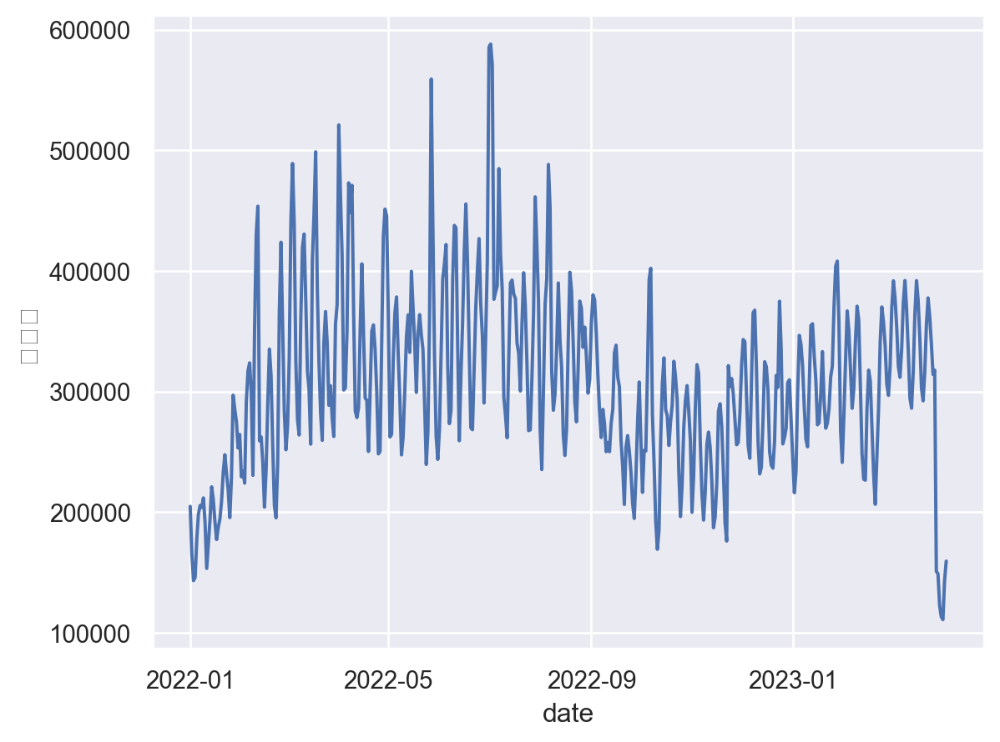

In [24]:
(
    so.Plot(train_all,x='date',y='판매량')
    .add(so.Line())
)

In [54]:
train_big=train_long.groupby(['대분류','date'])['판매량'].sum().reset_index(name='판매량')
train_big

,대분류,date,판매량
0,B002-C001-0001,2022-01-01,84536
1,B002-C001-0001,2022-01-02,73870
2,B002-C001-0001,2022-01-03,57336
3,B002-C001-0001,2022-01-04,54769
4,B002-C001-0001,2022-01-05,66988
...,...,...,...
2290,B002-C001-0005,2023-03-31,9639
2291,B002-C001-0005,2023-04-01,5721
2292,B002-C001-0005,2023-04-02,4007
2293,B002-C001-0005,2023-04-03,6736


<Axes: >

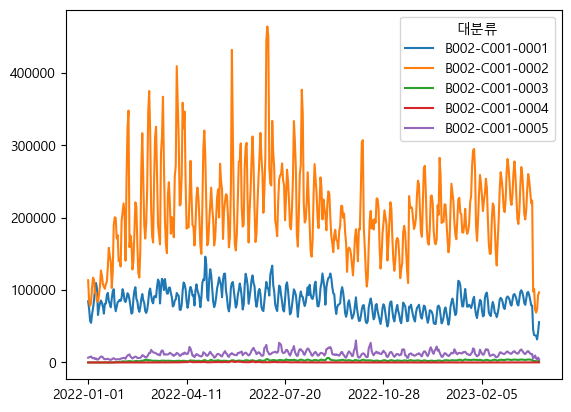

In [55]:
train.groupby('대분류').sum().drop(columns = 'ID').transpose().plot()

In [56]:
train.to_csv('without_train_prophet.csv',encoding='utf-8-sig',index = False)

In [3]:
train_without=pd.read_csv('without_train_prophet.csv')

In [4]:
train_without

,ID,대분류,중분류,소분류,브랜드,2022-01-01,2022-01-02,2022-01-03,2022-01-04,2022-01-05,...,2023-03-26,2023-03-27,2023-03-28,2023-03-29,2023-03-30,2023-03-31,2023-04-01,2023-04-02,2023-04-03,2023-04-04
0,0,B002-C001-0002,B002-C002-0007,B002-C003-0038,B002-00001,0,0,0,0,0,...,3,3,4,0,0,0,0,0,0,0
1,1,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-00002,0,0,0,0,0,...,1,1,1,1,3,2,0,0,2,0
2,2,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-00002,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,3,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-00002,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,4,B002-C001-0001,B002-C002-0001,B002-C003-0003,B002-00003,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15885,15885,B002-C001-0003,B002-C002-0008,B002-C003-0042,B002-03799,0,0,0,0,0,...,13,5,0,0,0,0,0,0,0,0
15886,15886,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-03799,0,0,0,0,0,...,36,36,36,3,0,2,4,1,1,3
15887,15887,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-03799,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15888,15888,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-03799,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,2


In [5]:
pd.read_csv('sample_submission.csv')

,ID,2023-04-05,2023-04-06,2023-04-07,2023-04-08,2023-04-09,2023-04-10,2023-04-11,2023-04-12,2023-04-13,...,2023-04-16,2023-04-17,2023-04-18,2023-04-19,2023-04-20,2023-04-21,2023-04-22,2023-04-23,2023-04-24,2023-04-25
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15885,15885,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15886,15886,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15887,15887,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15888,15888,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


4/5 ~ 부터 구간 추정

In [6]:
data = train_without.loc[:,'2022-01-01':].mean()
series = data.reset_index()
series.columns = ['ds','y']
series.head(3)

,ds,y
0,2022-01-01,12.887476
1,2022-01-02,10.418880
2,2022-01-03,9.013090


In [7]:
df=pd.DataFrame(series)
df

,ds,y
0,2022-01-01,12.887476
1,2022-01-02,10.418880
2,2022-01-03,9.013090
3,2022-01-04,9.190938
4,2022-01-05,11.204216
...,...,...
454,2023-03-31,7.706293
455,2023-04-01,7.123033
456,2023-04-02,6.975456
457,2023-04-03,9.040340


In [8]:
end_date = '2023-01-02'
mask1 = (df['ds'] <= end_date)
mask2 = (df['ds'] > end_date)

In [9]:
X_tr = df.loc[mask1]
X_tst = df.loc[mask2]
print("train shape",X_tr.shape)
print("test shape",X_tst.shape)

train shape (367, 2)
test shape (92, 2)


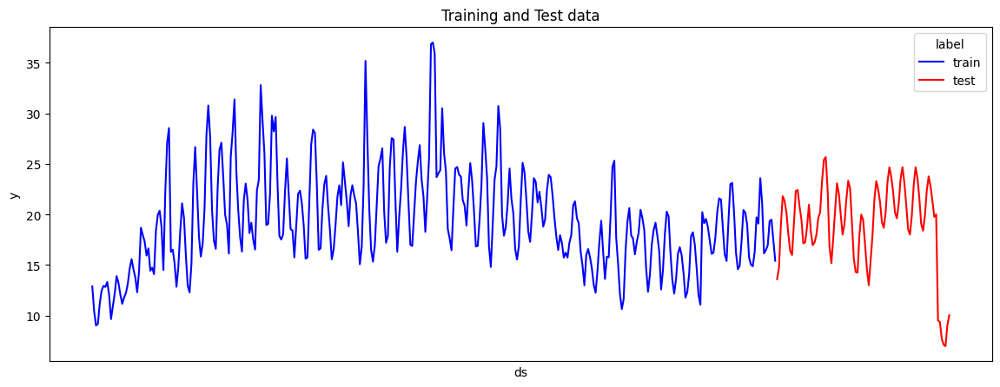

In [10]:
import seaborn as sns

merged_df = pd.concat([X_tr, X_tst], ignore_index=True)
merged_df['label'] = np.where(merged_df['ds'] < '2023-01-02', 'train', 'test')

plt.figure(figsize=(14, 5))
sns.lineplot(data=merged_df, x='ds', y='y', hue='label', palette={'train': 'blue', 'test': 'red'})
plt.title('Training and Test data')
plt.xticks([])
plt.show()

In [11]:
def mean_absolute_percentage_error(y_true, y_pred): 
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

In [12]:
from prophet import Prophet
model =Prophet()
model.fit(X_tr)

14:26:19 - cmdstanpy - INFO - Chain [1] start processing
14:26:19 - cmdstanpy - INFO - Chain [1] done processing


In [13]:
future = model.make_future_dataframe(periods=92, freq='D')
forecast = model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(7)

,ds,yhat,yhat_lower,yhat_upper
452,2023-03-29,13.615217,9.677847,17.933857
453,2023-03-30,17.013081,12.874334,20.886365
454,2023-03-31,18.891993,15.245499,23.498407
455,2023-04-01,17.269739,13.063906,21.432897
456,2023-04-02,14.966568,11.087982,19.105437
457,2023-04-03,12.138078,8.217288,16.373095
458,2023-04-04,11.126913,7.221099,15.057216


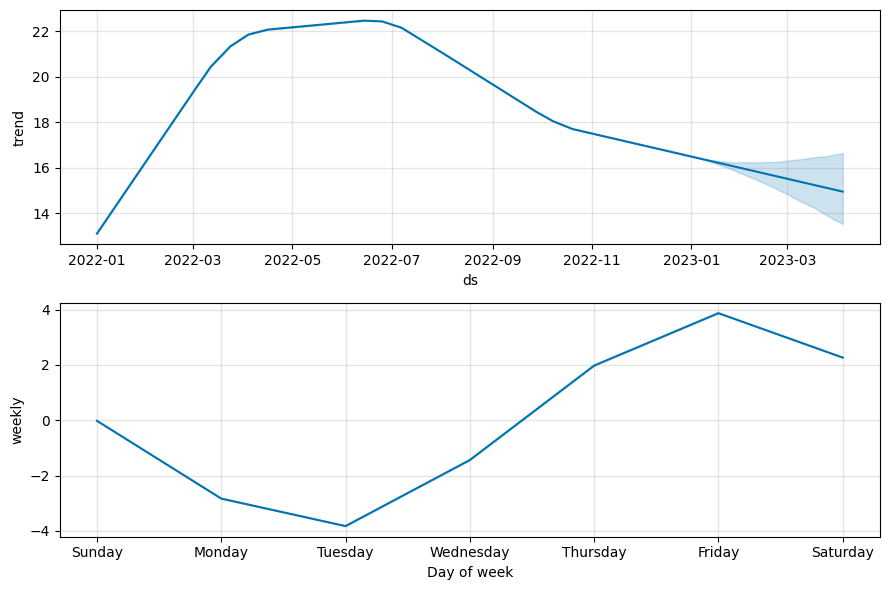

In [14]:
fig = model.plot_components(forecast)

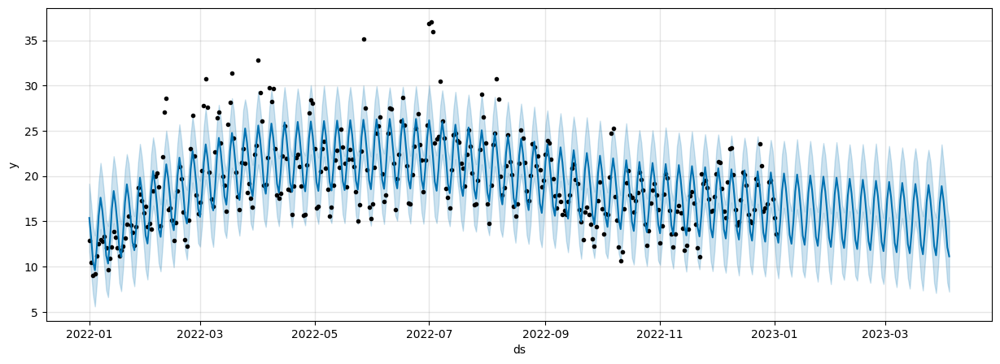

In [15]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = model.plot(forecast,ax=ax)
plt.show()

In [16]:
X_tst_forecast = model.predict(X_tst)
X_tst_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(7)

,ds,yhat,yhat_lower,yhat_upper
85,2023-03-29,13.615217,9.348658,17.746190
86,2023-03-30,17.013081,12.693040,21.177563
87,2023-03-31,18.891993,14.649147,22.748047
88,2023-04-01,17.269739,13.089557,21.219244
89,2023-04-02,14.966568,10.401191,18.955682
90,2023-04-03,12.138078,8.146779,16.364794
91,2023-04-04,11.126913,7.443991,15.236953


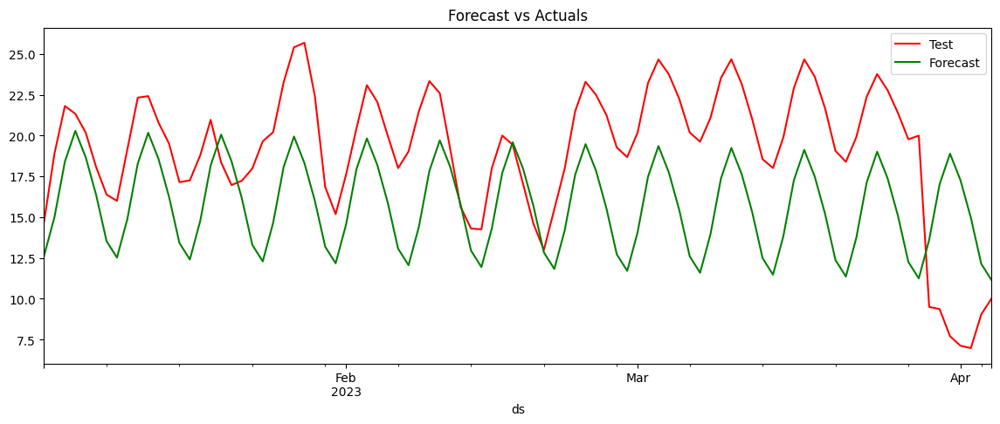

In [17]:
### 예측과 실제 차이 보여주기. (test 데이터)
X_tst['ds'] = pd.to_datetime(X_tst['ds'])
X_tst_forecast['ds'] = pd.to_datetime(X_tst_forecast['ds'])

f, ax = plt.subplots(figsize=(14, 5))
X_tst.plot(kind='line', x='ds', y='y', color='red', label='Test', ax=ax)
X_tst_forecast.plot(kind='line', x='ds', y='yhat', color='green', label='Forecast', ax=ax)
plt.title('Forecast vs Actuals')
plt.show()

In [102]:
mape = mean_absolute_percentage_error(X_tst['y'],X_tst_forecast['yhat'])
print("MAPE",round(mape,4))

MAPE 26.361


In [20]:
model_with_holidays = Prophet(holidays=holiday)
model_with_holidays.fit(X_tr)

14:27:02 - cmdstanpy - INFO - Chain [1] start processing
14:27:02 - cmdstanpy - INFO - Chain [1] done processing


In [21]:
future = model_with_holidays.make_future_dataframe(periods= 92, freq='D')
forecast = model_with_holidays.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(7)

,ds,yhat,yhat_lower,yhat_upper
452,2023-03-29,13.647842,9.452932,17.374563
453,2023-03-30,17.006392,12.964227,20.997458
454,2023-03-31,18.885345,14.959055,23.122905
455,2023-04-01,17.281112,13.192975,21.135717
456,2023-04-02,15.038276,10.668220,18.982669
457,2023-04-03,12.231804,7.948002,16.550903
458,2023-04-04,11.139818,6.995072,14.933383


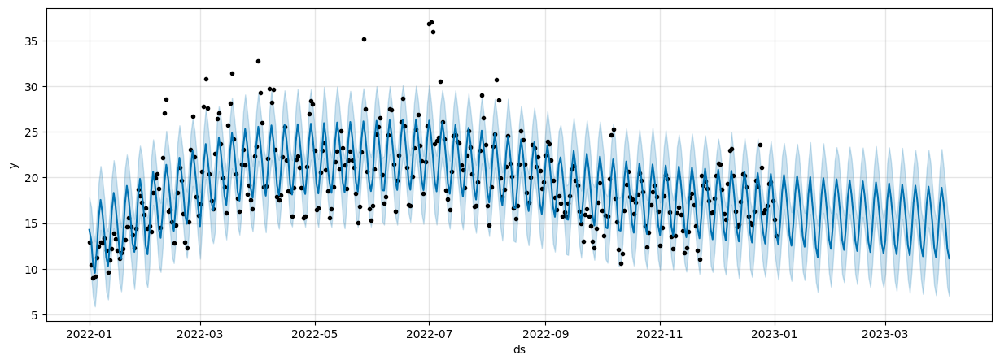

In [22]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = model_with_holidays.plot(forecast,ax=ax)
plt.show()

In [23]:
X_tst_forecast_holiday = model_with_holidays.predict(X_tst)
X_tst_forecast_holiday[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(7)

,ds,yhat,yhat_lower,yhat_upper
85,2023-03-29,13.647842,9.557219,17.739145
86,2023-03-30,17.006392,13.153721,21.192524
87,2023-03-31,18.885345,14.860812,22.915511
88,2023-04-01,17.281112,13.059635,21.183151
89,2023-04-02,15.038276,11.283866,18.960621
90,2023-04-03,12.231804,8.061037,16.480375
91,2023-04-04,11.139818,6.874207,15.151369


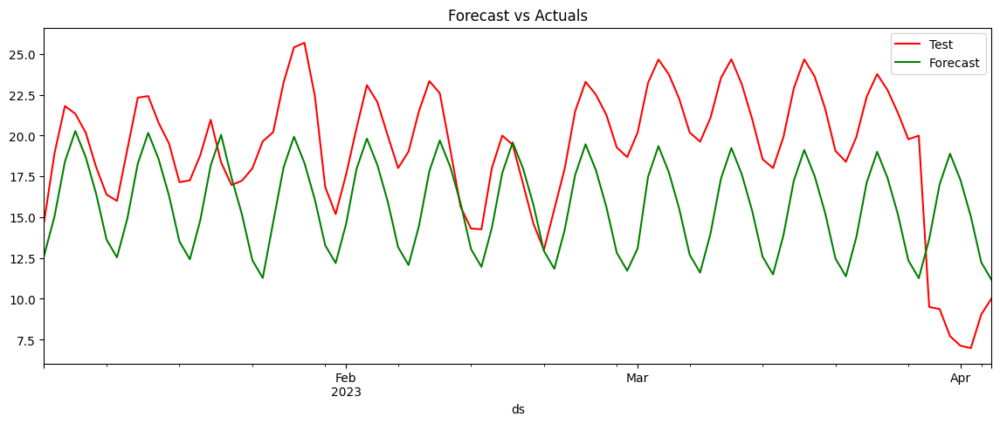

In [24]:
X_tst['ds'] = pd.to_datetime(X_tst['ds'])
X_tst_forecast_holiday['ds'] = pd.to_datetime(X_tst_forecast_holiday['ds'])

f, ax = plt.subplots(figsize=(14, 5))
X_tst.plot(kind='line', x='ds', y='y', color='red', label='Test', ax=ax)
X_tst_forecast_holiday.plot(kind='line', x='ds', y='yhat', color='green', label='Forecast', ax=ax)
plt.title('Forecast vs Actuals')
plt.show()

In [25]:
mape = mean_absolute_percentage_error(X_tst['y'],X_tst_forecast_holiday['yhat'])
print("MAPE",round(mape,4))

MAPE 26.4368


In [26]:
import holidays

holiday = pd.DataFrame([])
for date, name in sorted(holidays.KR(years=[2022,2023]).items()):
    holiday = holiday.append(pd.DataFrame({'ds': date, 'holiday': "KR-Holidays"}, index=[0]), ignore_index=True)
holiday['ds'] = pd.to_datetime(holiday['ds'], format='%Y-%m-%d', errors='ignore')

In [110]:
from sklearn.model_selection import ParameterGrid
params_grid = {'seasonality_mode':('multiplicative','additive'),
               'changepoint_prior_scale':[0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0],
              'holidays_prior_scale':[0.001,0.01,0.05,0.1],
              'n_changepoints' : [10,25,50],
               'seasonality_prior_scale' : [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0]
}
grid = ParameterGrid(params_grid)
cnt = 0
for p in grid:
    cnt = cnt+1

print('Total Possible Models',cnt)

Total Possible Models 2400


In [118]:
import random

strt='2023-01-02'
end='2023-04-04'
model_parameters = pd.DataFrame(columns = ['MAPE','Parameters'])
for p in grid:
    test = pd.DataFrame()
    print(p)
    random.seed(0)
    train_model =Prophet(changepoint_prior_scale = p['changepoint_prior_scale'],
                         holidays_prior_scale = p['holidays_prior_scale'],
                         seasonality_mode = p['seasonality_mode'],
                         n_changepoints = p['n_changepoints'],
                         seasonality_prior_scale = p['seasonality_prior_scale'],
                         weekly_seasonality=True,
                         daily_seasonality = False,
                         yearly_seasonality = False,
                         holidays=holiday, 
                         interval_width=0.95)
    train_model.add_country_holidays(country_name='KR')
    train_model.fit(X_tr)
    train_forecast = train_model.make_future_dataframe(periods=92, freq='D',include_history = False)
    train_forecast = train_model.predict(train_forecast)
    test=train_forecast[['ds','yhat']]
    Actual = df[(df['ds']>strt) & (df['ds']<=end)]
    MAPE = mean_absolute_percentage_error(Actual['y'],abs(test['yhat']))
    print('Mean Absolute Percentage Error(MAPE)------------------------------------',MAPE)
    model_parameters = model_parameters.append({'MAPE':MAPE,'Parameters':p},ignore_index=True)

{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:37:00 - cmdstanpy - INFO - Chain [1] start processing
13:37:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.677004622063567
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:37:00 - cmdstanpy - INFO - Chain [1] start processing
13:37:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.57103062826767
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:37:01 - cmdstanpy - INFO - Chain [1] start processing
13:37:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.49510061699359
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:37:01 - cmdstanpy - INFO - Chain [1] start processing
13:37:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.81104961715637
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:37:01 - cmdstanpy - INFO - Chain [1] start processing
13:37:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.889960540401027
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:37:02 - cmdstanpy - INFO - Chain [1] start processing
13:37:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.42367407860527
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:37:02 - cmdstanpy - INFO - Chain [1] start processing
13:37:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.39644492243441
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:37:03 - cmdstanpy - INFO - Chain [1] start processing
13:37:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.604175544370143
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:37:03 - cmdstanpy - INFO - Chain [1] start processing
13:37:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.22947984141142
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:37:04 - cmdstanpy - INFO - Chain [1] start processing
13:37:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.944963173348146
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:37:04 - cmdstanpy - INFO - Chain [1] start processing
13:37:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.207585493109917
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:37:05 - cmdstanpy - INFO - Chain [1] start processing
13:37:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.68535801157529
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:37:05 - cmdstanpy - INFO - Chain [1] start processing
13:37:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.400259584400278
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:37:06 - cmdstanpy - INFO - Chain [1] start processing
13:37:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.416751771278527
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:37:06 - cmdstanpy - INFO - Chain [1] start processing
13:37:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.25748932834733
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:37:07 - cmdstanpy - INFO - Chain [1] start processing
13:37:07 - cmdstanpy - INFO - Chain [1] done processing
13:37:07 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.285377442547937
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:37:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.573801511875775
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:37:07 - cmdstanpy - INFO - Chain [1] start processing
13:37:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.988736950565606
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:37:08 - cmdstanpy - INFO - Chain [1] start processing
13:37:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.337149614785137
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:37:08 - cmdstanpy - INFO - Chain [1] start processing
13:37:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.370361918734265
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:37:09 - cmdstanpy - INFO - Chain [1] start processing
13:37:09 - cmdstanpy - INFO - Chain [1] done processing
13:37:09 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.820197568378514
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:37:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.663435196249694
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:37:10 - cmdstanpy - INFO - Chain [1] start processing
13:37:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.02043862758175
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:37:10 - cmdstanpy - INFO - Chain [1] start processing
13:37:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.695831707881606
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:37:11 - cmdstanpy - INFO - Chain [1] start processing
13:37:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.879663728204154
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:37:11 - cmdstanpy - INFO - Chain [1] start processing
13:37:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.999173544485547
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:37:12 - cmdstanpy - INFO - Chain [1] start processing
13:37:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.960670267437905
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:37:12 - cmdstanpy - INFO - Chain [1] start processing
13:37:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.000892508538925
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:37:13 - cmdstanpy - INFO - Chain [1] start processing
13:37:13 - cmdstanpy - INFO - Chain [1] done processing
13:37:13 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.975063024027257
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:37:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.01846500232511
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:37:13 - cmdstanpy - INFO - Chain [1] start processing
13:37:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.424054682335882
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:37:14 - cmdstanpy - INFO - Chain [1] start processing
13:37:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.327297660972416
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:37:14 - cmdstanpy - INFO - Chain [1] start processing
13:37:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.11625418083659
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:37:15 - cmdstanpy - INFO - Chain [1] start processing
13:37:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.32349161489669
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:37:15 - cmdstanpy - INFO - Chain [1] start processing
13:37:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.11508652179797
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:37:16 - cmdstanpy - INFO - Chain [1] start processing
13:37:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.441280845524915
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:37:16 - cmdstanpy - INFO - Chain [1] start processing
13:37:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.21345284486553
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:37:17 - cmdstanpy - INFO - Chain [1] start processing
13:37:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.298474006064954
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:37:17 - cmdstanpy - INFO - Chain [1] start processing
13:37:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.399300876721888
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:37:18 - cmdstanpy - INFO - Chain [1] start processing
13:37:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.509755967240576
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:37:18 - cmdstanpy - INFO - Chain [1] start processing
13:37:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.28966904980832
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:37:19 - cmdstanpy - INFO - Chain [1] start processing
13:37:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.163386828177998
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:37:19 - cmdstanpy - INFO - Chain [1] start processing
13:37:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.03018424807879
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:37:20 - cmdstanpy - INFO - Chain [1] start processing
13:37:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.13124038514972
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:37:20 - cmdstanpy - INFO - Chain [1] start processing
13:37:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.891387264431966
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:37:21 - cmdstanpy - INFO - Chain [1] start processing
13:37:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.77507782016862
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:37:21 - cmdstanpy - INFO - Chain [1] start processing
13:37:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.06379486061163
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:37:22 - cmdstanpy - INFO - Chain [1] start processing
13:37:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.043819287969768
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:37:22 - cmdstanpy - INFO - Chain [1] start processing
13:37:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.161685093772956
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:37:23 - cmdstanpy - INFO - Chain [1] start processing
13:37:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.78427228970357
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:37:23 - cmdstanpy - INFO - Chain [1] start processing
13:37:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.25411789881509
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:37:24 - cmdstanpy - INFO - Chain [1] start processing
13:37:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.18519477850876
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:37:24 - cmdstanpy - INFO - Chain [1] start processing
13:37:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.351350089690243
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:37:25 - cmdstanpy - INFO - Chain [1] start processing
13:37:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.210657661051588
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:37:25 - cmdstanpy - INFO - Chain [1] start processing
13:37:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.206544848099217
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:37:26 - cmdstanpy - INFO - Chain [1] start processing
13:37:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.335523479534093
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:37:26 - cmdstanpy - INFO - Chain [1] start processing
13:37:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.95576825109054
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:37:27 - cmdstanpy - INFO - Chain [1] start processing
13:37:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.371874611460814
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:37:27 - cmdstanpy - INFO - Chain [1] start processing
13:37:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.154354914886405
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:37:28 - cmdstanpy - INFO - Chain [1] start processing
13:37:28 - cmdstanpy - INFO - Chain [1] done processing
13:37:28 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.25015901312906
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:37:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.126031195701913
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:37:28 - cmdstanpy - INFO - Chain [1] start processing
13:37:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.786770141320314
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:37:29 - cmdstanpy - INFO - Chain [1] start processing
13:37:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.236285786093283
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:37:29 - cmdstanpy - INFO - Chain [1] start processing
13:37:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.032178958443172
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:37:30 - cmdstanpy - INFO - Chain [1] start processing
13:37:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.25390854815157
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:37:30 - cmdstanpy - INFO - Chain [1] start processing
13:37:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.355053865608973
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:37:31 - cmdstanpy - INFO - Chain [1] start processing
13:37:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.74108966797976
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:37:31 - cmdstanpy - INFO - Chain [1] start processing
13:37:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.39664374787974
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:37:31 - cmdstanpy - INFO - Chain [1] start processing
13:37:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.066590832160355
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:37:32 - cmdstanpy - INFO - Chain [1] start processing
13:37:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.48820625799851
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:37:32 - cmdstanpy - INFO - Chain [1] start processing
13:37:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.194278451775723
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:37:33 - cmdstanpy - INFO - Chain [1] start processing
13:37:33 - cmdstanpy - INFO - Chain [1] done processing
13:37:33 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.458182140661727
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:37:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 23.08012443677268
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:37:34 - cmdstanpy - INFO - Chain [1] start processing
13:37:34 - cmdstanpy - INFO - Chain [1] done processing
13:37:34 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.875316238497334
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:37:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.80752150895876
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:37:35 - cmdstanpy - INFO - Chain [1] start processing
13:37:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.620660040697825
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:37:35 - cmdstanpy - INFO - Chain [1] start processing
13:37:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.639461495835345
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:37:35 - cmdstanpy - INFO - Chain [1] start processing
13:37:36 - cmdstanpy - INFO - Chain [1] done processing
13:37:36 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.17017874334989
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:37:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.570357344993027
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:37:36 - cmdstanpy - INFO - Chain [1] start processing
13:37:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.793280367059797
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:37:37 - cmdstanpy - INFO - Chain [1] start processing
13:37:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.356528727614275
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:37:37 - cmdstanpy - INFO - Chain [1] start processing
13:37:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.969185413350882
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:37:38 - cmdstanpy - INFO - Chain [1] start processing
13:37:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.70972484433639
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:37:38 - cmdstanpy - INFO - Chain [1] start processing
13:37:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.91686728586749
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:37:38 - cmdstanpy - INFO - Chain [1] start processing
13:37:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.85913502193543
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:37:39 - cmdstanpy - INFO - Chain [1] start processing
13:37:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.094579812933947
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:37:39 - cmdstanpy - INFO - Chain [1] start processing
13:37:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.377104369565647
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:37:40 - cmdstanpy - INFO - Chain [1] start processing
13:37:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.939180995402197
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:37:40 - cmdstanpy - INFO - Chain [1] start processing
13:37:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.971904326627445
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:37:41 - cmdstanpy - INFO - Chain [1] start processing
13:37:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.975073232497007
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:37:41 - cmdstanpy - INFO - Chain [1] start processing
13:37:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.327384475635142
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:37:42 - cmdstanpy - INFO - Chain [1] start processing
13:37:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.42238740055631
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:37:42 - cmdstanpy - INFO - Chain [1] start processing
13:37:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.4971268686125
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:37:43 - cmdstanpy - INFO - Chain [1] start processing
13:37:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.294343614042887
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:37:43 - cmdstanpy - INFO - Chain [1] start processing
13:37:43 - cmdstanpy - INFO - Chain [1] done processing
13:37:44 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.177166176155726
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:37:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.222159382150313
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:37:44 - cmdstanpy - INFO - Chain [1] start processing
13:37:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.37116539425063
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:37:44 - cmdstanpy - INFO - Chain [1] start processing
13:37:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.56220907156303
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:37:45 - cmdstanpy - INFO - Chain [1] start processing
13:37:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.236986803040022
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:37:45 - cmdstanpy - INFO - Chain [1] start processing
13:37:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.2644490960465
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:37:46 - cmdstanpy - INFO - Chain [1] start processing
13:37:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.981942044816407
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:37:46 - cmdstanpy - INFO - Chain [1] start processing
13:37:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.77162324072175
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:37:47 - cmdstanpy - INFO - Chain [1] start processing
13:37:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.996701690555525
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:37:47 - cmdstanpy - INFO - Chain [1] start processing
13:37:47 - cmdstanpy - INFO - Chain [1] done processing
13:37:47 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.99351494899808
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:37:48 - cmdstanpy - INFO - Chain [1] done processing
13:37:48 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.69565573687705
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:37:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.738657780001247
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:37:48 - cmdstanpy - INFO - Chain [1] start processing
13:37:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.112536778060942
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:37:49 - cmdstanpy - INFO - Chain [1] start processing
13:37:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.876634105017473
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:37:49 - cmdstanpy - INFO - Chain [1] start processing
13:37:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.698332636490075
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:37:50 - cmdstanpy - INFO - Chain [1] start processing
13:37:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.094401039502298
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:37:50 - cmdstanpy - INFO - Chain [1] start processing
13:37:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.177632094015216
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:37:51 - cmdstanpy - INFO - Chain [1] start processing
13:37:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.486575713148227
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:37:51 - cmdstanpy - INFO - Chain [1] start processing
13:37:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.000908989458026
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:37:52 - cmdstanpy - INFO - Chain [1] start processing
13:37:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.030100431909037
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:37:52 - cmdstanpy - INFO - Chain [1] start processing
13:37:52 - cmdstanpy - INFO - Chain [1] done processing
13:37:53 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.4759049485037
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:37:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.20473863349276
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:37:53 - cmdstanpy - INFO - Chain [1] start processing
13:37:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.218523730560904
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:37:54 - cmdstanpy - INFO - Chain [1] start processing
13:37:54 - cmdstanpy - INFO - Chain [1] done processing
13:37:54 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.210377013858686
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:37:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.46935438881163
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:37:54 - cmdstanpy - INFO - Chain [1] start processing
13:37:54 - cmdstanpy - INFO - Chain [1] done processing
13:37:55 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.228333073291985
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:37:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.194690512912928
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:37:55 - cmdstanpy - INFO - Chain [1] start processing
13:37:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.075050787257116
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:37:56 - cmdstanpy - INFO - Chain [1] start processing
13:37:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.940572417049825
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:37:56 - cmdstanpy - INFO - Chain [1] start processing
13:37:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.973864126145457
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:37:56 - cmdstanpy - INFO - Chain [1] start processing
13:37:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.244945368059746
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:37:57 - cmdstanpy - INFO - Chain [1] start processing
13:37:57 - cmdstanpy - INFO - Chain [1] done processing
13:37:57 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.873190401037157
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:37:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.19920242831263
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:37:58 - cmdstanpy - INFO - Chain [1] start processing
13:37:58 - cmdstanpy - INFO - Chain [1] done processing
13:37:58 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.179365595980407
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:37:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.880633278367913
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:37:58 - cmdstanpy - INFO - Chain [1] start processing
13:37:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.61271054388586
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:37:59 - cmdstanpy - INFO - Chain [1] start processing
13:37:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.598550733549523
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:37:59 - cmdstanpy - INFO - Chain [1] start processing
13:37:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.947106445720184
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:38:00 - cmdstanpy - INFO - Chain [1] start processing
13:38:00 - cmdstanpy - INFO - Chain [1] done processing
13:38:00 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.964687215212297
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:38:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.704590519403357
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:38:00 - cmdstanpy - INFO - Chain [1] start processing
13:38:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 23.067738467311074
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:38:01 - cmdstanpy - INFO - Chain [1] start processing
13:38:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.703956654656203
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:38:01 - cmdstanpy - INFO - Chain [1] start processing
13:38:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.888718612577
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:38:02 - cmdstanpy - INFO - Chain [1] start processing
13:38:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.60148497322266
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:38:02 - cmdstanpy - INFO - Chain [1] start processing
13:38:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.13101484828855
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:38:03 - cmdstanpy - INFO - Chain [1] start processing
13:38:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.172873992349473
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:38:03 - cmdstanpy - INFO - Chain [1] start processing
13:38:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.114174135152858
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:38:04 - cmdstanpy - INFO - Chain [1] start processing
13:38:04 - cmdstanpy - INFO - Chain [1] done processing
13:38:04 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.909645080570296
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:38:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.04115040224684
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:38:05 - cmdstanpy - INFO - Chain [1] start processing
13:38:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.958399243272506
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:38:05 - cmdstanpy - INFO - Chain [1] start processing
13:38:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.98249691169093
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:38:05 - cmdstanpy - INFO - Chain [1] start processing
13:38:05 - cmdstanpy - INFO - Chain [1] done processing
13:38:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.995437731577265
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:38:06 - cmdstanpy - INFO - Chain [1] done processing
13:38:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.961054515057626
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:38:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.024685556442957
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:38:07 - cmdstanpy - INFO - Chain [1] start processing
13:38:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.88637797183878
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:38:07 - cmdstanpy - INFO - Chain [1] start processing
13:38:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.9596284577734
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:38:08 - cmdstanpy - INFO - Chain [1] start processing
13:38:08 - cmdstanpy - INFO - Chain [1] done processing
13:38:08 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.541630765432963
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:38:08 - cmdstanpy - INFO - Chain [1] done processing
13:38:08 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.20563616241213
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:38:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.894194859390815
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:38:09 - cmdstanpy - INFO - Chain [1] start processing
13:38:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.48046248046302
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:38:09 - cmdstanpy - INFO - Chain [1] start processing
13:38:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.296983174415786
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:38:10 - cmdstanpy - INFO - Chain [1] start processing
13:38:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.654777432470272
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:38:10 - cmdstanpy - INFO - Chain [1] start processing
13:38:10 - cmdstanpy - INFO - Chain [1] done processing
13:38:11 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.481746302484833
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:38:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.42001745441789
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:38:11 - cmdstanpy - INFO - Chain [1] start processing
13:38:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.262181106663363
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:38:12 - cmdstanpy - INFO - Chain [1] start processing
13:38:12 - cmdstanpy - INFO - Chain [1] done processing
13:38:12 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.40020555970588
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:38:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.96497609573519
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:38:13 - cmdstanpy - INFO - Chain [1] start processing
13:38:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.75205942974686
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:38:13 - cmdstanpy - INFO - Chain [1] start processing
13:38:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.26597348693847
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:38:13 - cmdstanpy - INFO - Chain [1] start processing
13:38:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.73187769982596
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:38:14 - cmdstanpy - INFO - Chain [1] start processing
13:38:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.850814799716538
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:38:14 - cmdstanpy - INFO - Chain [1] start processing
13:38:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.03685053434055
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:38:15 - cmdstanpy - INFO - Chain [1] start processing
13:38:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.815673201068233
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:38:15 - cmdstanpy - INFO - Chain [1] start processing
13:38:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.172049674290193
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:38:16 - cmdstanpy - INFO - Chain [1] start processing
13:38:16 - cmdstanpy - INFO - Chain [1] done processing
13:38:16 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.102582189230656
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:38:16 - cmdstanpy - INFO - Chain [1] done processing
13:38:17 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.754113198282994
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:38:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.304138145467117
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:38:17 - cmdstanpy - INFO - Chain [1] start processing
13:38:17 - cmdstanpy - INFO - Chain [1] done processing
13:38:17 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.318586198915813
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:38:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.142938573254433
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:38:18 - cmdstanpy - INFO - Chain [1] start processing
13:38:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.4530531703183
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:38:18 - cmdstanpy - INFO - Chain [1] start processing
13:38:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.36212774899592
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:38:19 - cmdstanpy - INFO - Chain [1] start processing
13:38:19 - cmdstanpy - INFO - Chain [1] done processing
13:38:19 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.325022384237727
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:38:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.663368141310247
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:38:20 - cmdstanpy - INFO - Chain [1] start processing
13:38:20 - cmdstanpy - INFO - Chain [1] done processing
13:38:20 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.43401914849352
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:38:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.59546040579577
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:38:21 - cmdstanpy - INFO - Chain [1] start processing
13:38:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.480089232317198
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:38:21 - cmdstanpy - INFO - Chain [1] start processing
13:38:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.454282147575512
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:38:21 - cmdstanpy - INFO - Chain [1] start processing
13:38:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.98308117193054
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:38:22 - cmdstanpy - INFO - Chain [1] start processing
13:38:22 - cmdstanpy - INFO - Chain [1] done processing
13:38:22 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.998030600091056
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:38:22 - cmdstanpy - INFO - Chain [1] done processing
13:38:23 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.4408286201452
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:38:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.523369691535628
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:38:23 - cmdstanpy - INFO - Chain [1] start processing
13:38:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.74282289200093
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:38:24 - cmdstanpy - INFO - Chain [1] start processing
13:38:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.566397935978564
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:38:24 - cmdstanpy - INFO - Chain [1] start processing
13:38:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.686786950563235
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:38:24 - cmdstanpy - INFO - Chain [1] start processing
13:38:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.020669168995536
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:38:25 - cmdstanpy - INFO - Chain [1] start processing
13:38:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.205927251386804
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:38:25 - cmdstanpy - INFO - Chain [1] start processing
13:38:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 23.207979656265277
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:38:26 - cmdstanpy - INFO - Chain [1] start processing
13:38:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.431091332924993
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:38:26 - cmdstanpy - INFO - Chain [1] start processing
13:38:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.258466198600765
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:38:27 - cmdstanpy - INFO - Chain [1] start processing
13:38:27 - cmdstanpy - INFO - Chain [1] done processing
13:38:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.340019965457962
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:38:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.908502083489022
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:38:27 - cmdstanpy - INFO - Chain [1] start processing
13:38:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.17845335138525
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:38:28 - cmdstanpy - INFO - Chain [1] start processing
13:38:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.170320322884336
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:38:28 - cmdstanpy - INFO - Chain [1] start processing
13:38:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.3801349958722
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:38:29 - cmdstanpy - INFO - Chain [1] start processing
13:38:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 23.194998485109764
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:38:29 - cmdstanpy - INFO - Chain [1] start processing
13:38:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.278521280750365
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:38:29 - cmdstanpy - INFO - Chain [1] start processing
13:38:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.977583106595482
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:38:30 - cmdstanpy - INFO - Chain [1] start processing
13:38:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.41591239499182
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:38:30 - cmdstanpy - INFO - Chain [1] start processing
13:38:30 - cmdstanpy - INFO - Chain [1] done processing
13:38:31 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.267088158339753
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:38:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.132196231472296
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:38:31 - cmdstanpy - INFO - Chain [1] start processing
13:38:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.100873576782764
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:38:31 - cmdstanpy - INFO - Chain [1] start processing
13:38:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.075834911232995
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:38:32 - cmdstanpy - INFO - Chain [1] start processing
13:38:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.161712514001024
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:38:32 - cmdstanpy - INFO - Chain [1] start processing
13:38:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.282700886645703
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:38:33 - cmdstanpy - INFO - Chain [1] start processing
13:38:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.079828484948045
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:38:33 - cmdstanpy - INFO - Chain [1] start processing
13:38:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.964145737902662
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:38:34 - cmdstanpy - INFO - Chain [1] start processing
13:38:34 - cmdstanpy - INFO - Chain [1] done processing
13:38:34 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 23.03559533027423
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:38:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.67421759665521
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:38:34 - cmdstanpy - INFO - Chain [1] start processing
13:38:34 - cmdstanpy - INFO - Chain [1] done processing
13:38:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 23.06223695717154
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:38:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.943596238405366
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:38:35 - cmdstanpy - INFO - Chain [1] start processing
13:38:35 - cmdstanpy - INFO - Chain [1] done processing
13:38:36 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 23.19710573443194
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:38:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.582225565091672
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:38:36 - cmdstanpy - INFO - Chain [1] start processing
13:38:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.95252533340792
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:38:36 - cmdstanpy - INFO - Chain [1] start processing
13:38:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.94045342828618
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:38:37 - cmdstanpy - INFO - Chain [1] start processing
13:38:37 - cmdstanpy - INFO - Chain [1] done processing
13:38:37 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.934419663992735
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:38:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.91480701047634
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:38:38 - cmdstanpy - INFO - Chain [1] start processing
13:38:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.12710993655991
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:38:38 - cmdstanpy - INFO - Chain [1] start processing
13:38:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.965033280725276
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:38:39 - cmdstanpy - INFO - Chain [1] start processing
13:38:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.09000022561555
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:38:39 - cmdstanpy - INFO - Chain [1] start processing
13:38:39 - cmdstanpy - INFO - Chain [1] done processing
13:38:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.201570402507258
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:38:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.86141641293545
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:38:40 - cmdstanpy - INFO - Chain [1] start processing
13:38:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.01298823669924
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:38:40 - cmdstanpy - INFO - Chain [1] start processing
13:38:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.23800200515363
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:38:41 - cmdstanpy - INFO - Chain [1] start processing
13:38:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.112749909354623
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:38:41 - cmdstanpy - INFO - Chain [1] start processing
13:38:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.991166501252064
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:38:42 - cmdstanpy - INFO - Chain [1] start processing
13:38:42 - cmdstanpy - INFO - Chain [1] done processing
13:38:42 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.53817273320032
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:38:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.691466855061893
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:38:43 - cmdstanpy - INFO - Chain [1] start processing
13:38:43 - cmdstanpy - INFO - Chain [1] done processing
13:38:43 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.460222426684336
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:38:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.90282033364412
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:38:44 - cmdstanpy - INFO - Chain [1] start processing
13:38:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.292224099413342
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:38:44 - cmdstanpy - INFO - Chain [1] start processing
13:38:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.647308352522867
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:38:45 - cmdstanpy - INFO - Chain [1] start processing
13:38:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.423275226924865
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:38:45 - cmdstanpy - INFO - Chain [1] start processing
13:38:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.823741540654115
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:38:46 - cmdstanpy - INFO - Chain [1] start processing
13:38:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.79386091387059
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:38:46 - cmdstanpy - INFO - Chain [1] start processing
13:38:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.583980452925196
{'changepoint_prior_scale': 0.1, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:38:46 - cmdstanpy - INFO - Chain [1] start processing
13:38:47 - cmdstanpy - INFO - Chain [1] done processing
13:38:47 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 22.834671955881532
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:38:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.38390329236363
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:38:47 - cmdstanpy - INFO - Chain [1] start processing
13:38:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.690008276132733
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:38:48 - cmdstanpy - INFO - Chain [1] start processing
13:38:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.51694579695188
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:38:48 - cmdstanpy - INFO - Chain [1] start processing
13:38:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.486316485350372
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:38:49 - cmdstanpy - INFO - Chain [1] start processing
13:38:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.615920293527257
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:38:49 - cmdstanpy - INFO - Chain [1] start processing
13:38:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.61109598737497
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:38:50 - cmdstanpy - INFO - Chain [1] start processing
13:38:50 - cmdstanpy - INFO - Chain [1] done processing
13:38:50 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:38:50 - cmdstanpy - INFO - Chain [1] start processing
13:38:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.542242507679727
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:38:51 - cmdstanpy - INFO - Chain [1] start processing
13:38:51 - cmdstanpy - INFO - Chain [1] done processing
13:38:51 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:38:51 - cmdstanpy - INFO - Chain [1] start processing
13:38:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.543476756635165
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:38:52 - cmdstanpy - INFO - Chain [1] start processing
13:38:52 - cmdstanpy - INFO - Chain [1] done processing
13:38:52 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.672283532062448
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:38:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.679979512145092
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:38:52 - cmdstanpy - INFO - Chain [1] start processing
13:38:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.464318785943412
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:38:53 - cmdstanpy - INFO - Chain [1] start processing
13:38:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.370972402833942
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:38:53 - cmdstanpy - INFO - Chain [1] start processing
13:38:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.67715590967462
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:38:54 - cmdstanpy - INFO - Chain [1] start processing
13:38:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.57031741689161
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:38:54 - cmdstanpy - INFO - Chain [1] start processing
13:38:54 - cmdstanpy - INFO - Chain [1] done processing
13:38:55 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.59278408414492
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:38:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.641248518138177
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:38:55 - cmdstanpy - INFO - Chain [1] start processing
13:38:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.64549690671739
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:38:56 - cmdstanpy - INFO - Chain [1] start processing
13:38:56 - cmdstanpy - INFO - Chain [1] done processing
13:38:56 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:38:56 - cmdstanpy - INFO - Chain [1] start processing
13:38:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.468355301192414
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:38:57 - cmdstanpy - INFO - Chain [1] start processing
13:38:57 - cmdstanpy - INFO - Chain [1] done processing
13:38:57 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.484388926399145
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:38:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.749390906079807
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:38:57 - cmdstanpy - INFO - Chain [1] start processing
13:38:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.751679496941495
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:38:58 - cmdstanpy - INFO - Chain [1] start processing
13:38:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.72569261979474
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:38:59 - cmdstanpy - INFO - Chain [1] start processing
13:38:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.824950403343507
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:38:59 - cmdstanpy - INFO - Chain [1] start processing
13:38:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.817745458826565
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:39:00 - cmdstanpy - INFO - Chain [1] start processing
13:39:00 - cmdstanpy - INFO - Chain [1] done processing
13:39:00 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.788002962425335
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:39:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.77334272952917
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:39:01 - cmdstanpy - INFO - Chain [1] start processing
13:39:01 - cmdstanpy - INFO - Chain [1] done processing
13:39:01 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.853120952600534
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:39:01 - cmdstanpy - INFO - Chain [1] done processing
13:39:02 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.809374826358994
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:39:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.792870450260274
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:39:02 - cmdstanpy - INFO - Chain [1] start processing
13:39:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.725392747069197
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:39:03 - cmdstanpy - INFO - Chain [1] start processing
13:39:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.77089908179634
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:39:03 - cmdstanpy - INFO - Chain [1] start processing
13:39:03 - cmdstanpy - INFO - Chain [1] done processing
13:39:04 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.68473343227316
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:39:04 - cmdstanpy - INFO - Chain [1] done processing
13:39:04 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.83698521821301
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:39:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.93686746744528
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:39:05 - cmdstanpy - INFO - Chain [1] start processing
13:39:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.8599231755669
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:39:05 - cmdstanpy - INFO - Chain [1] start processing
13:39:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.776387094518398
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:39:06 - cmdstanpy - INFO - Chain [1] start processing
13:39:06 - cmdstanpy - INFO - Chain [1] done processing
13:39:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.783278118178366
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:39:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.80499776308725
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:39:07 - cmdstanpy - INFO - Chain [1] start processing
13:39:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.598535579215405
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:39:07 - cmdstanpy - INFO - Chain [1] start processing
13:39:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.861480381819813
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:39:08 - cmdstanpy - INFO - Chain [1] start processing
13:39:08 - cmdstanpy - INFO - Chain [1] done processing
13:39:08 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.77967463235422
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:39:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.767611540508348
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:39:09 - cmdstanpy - INFO - Chain [1] start processing
13:39:09 - cmdstanpy - INFO - Chain [1] done processing
13:39:09 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.749110281621874
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:39:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.745239605586924
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:39:10 - cmdstanpy - INFO - Chain [1] start processing
13:39:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.773529193440215
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:39:10 - cmdstanpy - INFO - Chain [1] start processing
13:39:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.6979356653108
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:39:11 - cmdstanpy - INFO - Chain [1] start processing
13:39:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.683907264851644
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:39:12 - cmdstanpy - INFO - Chain [1] start processing
13:39:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.854557391060517
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:39:12 - cmdstanpy - INFO - Chain [1] start processing
13:39:12 - cmdstanpy - INFO - Chain [1] done processing
13:39:13 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.731094583728837
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:39:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.72943689282437
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:39:13 - cmdstanpy - INFO - Chain [1] start processing
13:39:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.77112567150919
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:39:14 - cmdstanpy - INFO - Chain [1] start processing
13:39:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.716683182607987
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:39:14 - cmdstanpy - INFO - Chain [1] start processing
13:39:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.86137381937934
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:39:15 - cmdstanpy - INFO - Chain [1] start processing
13:39:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.819949986534652
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:39:15 - cmdstanpy - INFO - Chain [1] start processing
13:39:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.87267712092819
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:39:16 - cmdstanpy - INFO - Chain [1] start processing
13:39:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.769542587210573
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:39:16 - cmdstanpy - INFO - Chain [1] start processing
13:39:16 - cmdstanpy - INFO - Chain [1] done processing
13:39:17 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.778900805055073
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:39:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.87132639341628
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:39:17 - cmdstanpy - INFO - Chain [1] start processing
13:39:17 - cmdstanpy - INFO - Chain [1] done processing
13:39:18 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.722013020555146
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:39:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.839720805258608
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:39:18 - cmdstanpy - INFO - Chain [1] start processing
13:39:18 - cmdstanpy - INFO - Chain [1] done processing
13:39:18 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:39:18 - cmdstanpy - INFO - Chain [1] start processing
13:39:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.492048015738316
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:39:19 - cmdstanpy - INFO - Chain [1] start processing
13:39:19 - cmdstanpy - INFO - Chain [1] done processing
13:39:19 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:39:19 - cmdstanpy - INFO - Chain [1] start processing
13:39:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.511871564646896
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:39:20 - cmdstanpy - INFO - Chain [1] start processing
13:39:20 - cmdstanpy - INFO - Chain [1] done processing
13:39:20 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.621922533783028
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:39:20 - cmdstanpy - INFO - Chain [1] done processing
13:39:20 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:39:21 - cmdstanpy - INFO - Chain [1] start processing
13:39:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.530886130366834
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:39:21 - cmdstanpy - INFO - Chain [1] start processing
13:39:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.355198670985477
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:39:22 - cmdstanpy - INFO - Chain [1] start processing
13:39:22 - cmdstanpy - INFO - Chain [1] done processing
13:39:22 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:39:22 - cmdstanpy - INFO - Chain [1] start processing
13:39:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.534968657407585
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:39:23 - cmdstanpy - INFO - Chain [1] start processing
13:39:23 - cmdstanpy - INFO - Chain [1] done processing
13:39:23 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:39:23 - cmdstanpy - INFO - Chain [1] start processing
13:39:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.53318425388908
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:39:24 - cmdstanpy - INFO - Chain [1] start processing
13:39:24 - cmdstanpy - INFO - Chain [1] done processing
13:39:24 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.284199499490796
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:39:24 - cmdstanpy - INFO - Chain [1] done processing
13:39:24 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.3109199312563
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:39:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.69890828788529
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:39:25 - cmdstanpy - INFO - Chain [1] start processing
13:39:25 - cmdstanpy - INFO - Chain [1] done processing
13:39:25 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:39:25 - cmdstanpy - INFO - Chain [1] start processing
13:39:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.421086568159517
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:39:26 - cmdstanpy - INFO - Chain [1] start processing
13:39:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.47994675437339
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:39:26 - cmdstanpy - INFO - Chain [1] start processing
13:39:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.499249446580713
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:39:26 - cmdstanpy - INFO - Chain [1] start processing
13:39:27 - cmdstanpy - INFO - Chain [1] done processing
13:39:27 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:39:27 - cmdstanpy - INFO - Chain [1] start processing
13:39:27 - cmdstanpy - INFO - Chain [1] done processing
13:39:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.440666682344844
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:39:28 - cmdstanpy - INFO - Chain [1] done processing
13:39:28 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:39:28 - cmdstanpy - INFO - Chain [1] start processing
13:39:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.441215222388536
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:39:28 - cmdstanpy - INFO - Chain [1] start processing
13:39:28 - cmdstanpy - INFO - Chain [1] done processing
13:39:28 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:39:28 - cmdstanpy - INFO - Chain [1] start processing
13:39:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.432109817410687
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:39:29 - cmdstanpy - INFO - Chain [1] start processing
13:39:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.60340198196858
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:39:30 - cmdstanpy - INFO - Chain [1] start processing
13:39:30 - cmdstanpy - INFO - Chain [1] done processing
13:39:30 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:39:30 - cmdstanpy - INFO - Chain [1] start processing
13:39:31 - cmdstanpy - INFO - Chain [1] done processing
13:39:31 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.441111000405456
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:39:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.27072820355536
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:39:31 - cmdstanpy - INFO - Chain [1] start processing
13:39:32 - cmdstanpy - INFO - Chain [1] done processing
13:39:32 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:39:32 - cmdstanpy - INFO - Chain [1] start processing
13:39:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.440900695788358
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:39:32 - cmdstanpy - INFO - Chain [1] start processing
13:39:32 - cmdstanpy - INFO - Chain [1] done processing
13:39:33 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.751537388919377
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:39:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.82809733409151
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:39:33 - cmdstanpy - INFO - Chain [1] start processing
13:39:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.7903928345121
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:39:34 - cmdstanpy - INFO - Chain [1] start processing
13:39:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.823586468736426
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:39:34 - cmdstanpy - INFO - Chain [1] start processing
13:39:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.742844061032372
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:39:35 - cmdstanpy - INFO - Chain [1] start processing
13:39:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.79873775174771
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:39:35 - cmdstanpy - INFO - Chain [1] start processing
13:39:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.764413175502323
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:39:36 - cmdstanpy - INFO - Chain [1] start processing
13:39:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.736019413971924
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:39:36 - cmdstanpy - INFO - Chain [1] start processing
13:39:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.801054674389498
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:39:36 - cmdstanpy - INFO - Chain [1] start processing
13:39:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.754936841644206
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:39:37 - cmdstanpy - INFO - Chain [1] start processing
13:39:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.69774355685185
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:39:37 - cmdstanpy - INFO - Chain [1] start processing
13:39:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.82864330701877
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:39:38 - cmdstanpy - INFO - Chain [1] start processing
13:39:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.69648308379563
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:39:38 - cmdstanpy - INFO - Chain [1] start processing
13:39:38 - cmdstanpy - INFO - Chain [1] done processing
13:39:39 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.691879931345973
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:39:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.801089664481047
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:39:39 - cmdstanpy - INFO - Chain [1] start processing
13:39:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.68268701587099
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:39:40 - cmdstanpy - INFO - Chain [1] start processing
13:39:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.718259487737267
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:39:40 - cmdstanpy - INFO - Chain [1] start processing
13:39:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.72140668722321
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:39:41 - cmdstanpy - INFO - Chain [1] start processing
13:39:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.73475438052412
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:39:41 - cmdstanpy - INFO - Chain [1] start processing
13:39:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.71133248921429
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:39:42 - cmdstanpy - INFO - Chain [1] start processing
13:39:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.7839641661537
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:39:42 - cmdstanpy - INFO - Chain [1] start processing
13:39:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.759573300189523
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:39:43 - cmdstanpy - INFO - Chain [1] start processing
13:39:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.816043737759983
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:39:43 - cmdstanpy - INFO - Chain [1] start processing
13:39:43 - cmdstanpy - INFO - Chain [1] done processing
13:39:43 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.8807463400184
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:39:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.70728341742859
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:39:44 - cmdstanpy - INFO - Chain [1] start processing
13:39:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.778103700626755
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:39:44 - cmdstanpy - INFO - Chain [1] start processing
13:39:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.8554105598721
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:39:45 - cmdstanpy - INFO - Chain [1] start processing
13:39:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.73914438160198
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:39:45 - cmdstanpy - INFO - Chain [1] start processing
13:39:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.806895512031296
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:39:46 - cmdstanpy - INFO - Chain [1] start processing
13:39:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.775427294764427
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:39:46 - cmdstanpy - INFO - Chain [1] start processing
13:39:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.79844285904274
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:39:47 - cmdstanpy - INFO - Chain [1] start processing
13:39:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.715319502133607
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:39:47 - cmdstanpy - INFO - Chain [1] start processing
13:39:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.798499849856757
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:39:47 - cmdstanpy - INFO - Chain [1] start processing
13:39:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.838672490110692
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:39:48 - cmdstanpy - INFO - Chain [1] start processing
13:39:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.751329696890647
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:39:48 - cmdstanpy - INFO - Chain [1] start processing
13:39:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.872510479843363
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:39:49 - cmdstanpy - INFO - Chain [1] start processing
13:39:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.881117671768052
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:39:49 - cmdstanpy - INFO - Chain [1] start processing
13:39:50 - cmdstanpy - INFO - Chain [1] done processing
13:39:50 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.83572627724144
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:39:50 - cmdstanpy - INFO - Chain [1] done processing
13:39:50 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.856549666347348
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:39:50 - cmdstanpy - INFO - Chain [1] done processing
13:39:51 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.773978974035998
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:39:51 - cmdstanpy - INFO - Chain [1] done processing
13:39:51 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.309715860456883
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:39:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.44720196131257
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:39:51 - cmdstanpy - INFO - Chain [1] start processing
13:39:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.73302439296423
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:39:52 - cmdstanpy - INFO - Chain [1] start processing
13:39:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.36189520455711
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:39:52 - cmdstanpy - INFO - Chain [1] start processing
13:39:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.43938993754039
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:39:53 - cmdstanpy - INFO - Chain [1] start processing
13:39:53 - cmdstanpy - INFO - Chain [1] done processing
13:39:53 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:39:53 - cmdstanpy - INFO - Chain [1] start processing
13:39:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.485196018047965
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:39:54 - cmdstanpy - INFO - Chain [1] start processing
13:39:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.317917186792734
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:39:54 - cmdstanpy - INFO - Chain [1] start processing
13:39:54 - cmdstanpy - INFO - Chain [1] done processing
13:39:54 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:39:54 - cmdstanpy - INFO - Chain [1] start processing
13:39:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.479662033577608
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:39:55 - cmdstanpy - INFO - Chain [1] start processing
13:39:55 - cmdstanpy - INFO - Chain [1] done processing
13:39:55 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:39:55 - cmdstanpy - INFO - Chain [1] start processing
13:39:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.469236563005786
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:39:56 - cmdstanpy - INFO - Chain [1] start processing
13:39:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.380074406894323
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:39:56 - cmdstanpy - INFO - Chain [1] start processing
13:39:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.640228661974316
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:39:57 - cmdstanpy - INFO - Chain [1] start processing
13:39:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.94812707311006
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:39:57 - cmdstanpy - INFO - Chain [1] start processing
13:39:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.399998027535283
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:39:57 - cmdstanpy - INFO - Chain [1] start processing
13:39:57 - cmdstanpy - INFO - Chain [1] done processing
13:39:57 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:39:58 - cmdstanpy - INFO - Chain [1] start processing
13:39:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.56965803157002
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:39:58 - cmdstanpy - INFO - Chain [1] start processing
13:39:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.764865561505726
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:39:59 - cmdstanpy - INFO - Chain [1] start processing
13:39:59 - cmdstanpy - INFO - Chain [1] done processing
13:39:59 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:39:59 - cmdstanpy - INFO - Chain [1] start processing
13:39:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.569690353655492
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:40:00 - cmdstanpy - INFO - Chain [1] start processing
13:40:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.7786478213006
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:40:00 - cmdstanpy - INFO - Chain [1] start processing
13:40:00 - cmdstanpy - INFO - Chain [1] done processing
13:40:00 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:40:00 - cmdstanpy - INFO - Chain [1] start processing
13:40:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.570124851791743
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:40:01 - cmdstanpy - INFO - Chain [1] start processing
13:40:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.519176729589596
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:40:02 - cmdstanpy - INFO - Chain [1] start processing
13:40:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.65753414770515
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:40:02 - cmdstanpy - INFO - Chain [1] start processing
13:40:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.794316616049922
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:40:03 - cmdstanpy - INFO - Chain [1] start processing
13:40:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.765794372977272
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:40:03 - cmdstanpy - INFO - Chain [1] start processing
13:40:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.78896097077233
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:40:04 - cmdstanpy - INFO - Chain [1] start processing
13:40:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.74627240366736
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:40:04 - cmdstanpy - INFO - Chain [1] start processing
13:40:04 - cmdstanpy - INFO - Chain [1] done processing
13:40:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.81062402615581
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:40:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.74924460700843
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:40:05 - cmdstanpy - INFO - Chain [1] start processing
13:40:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.755297959364412
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:40:06 - cmdstanpy - INFO - Chain [1] start processing
13:40:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.875789524196488
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:40:06 - cmdstanpy - INFO - Chain [1] start processing
13:40:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.876276657086084
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:40:07 - cmdstanpy - INFO - Chain [1] start processing
13:40:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.76468968586643
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:40:07 - cmdstanpy - INFO - Chain [1] start processing
13:40:07 - cmdstanpy - INFO - Chain [1] done processing
13:40:08 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.935571861409265
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:40:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.00067502740498
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:40:08 - cmdstanpy - INFO - Chain [1] start processing
13:40:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.992514111891374
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:40:09 - cmdstanpy - INFO - Chain [1] start processing
13:40:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.84852017422765
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:40:09 - cmdstanpy - INFO - Chain [1] start processing
13:40:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.910229945900145
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:40:10 - cmdstanpy - INFO - Chain [1] start processing
13:40:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.93175999192515
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:40:10 - cmdstanpy - INFO - Chain [1] start processing
13:40:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.00006099395051
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:40:11 - cmdstanpy - INFO - Chain [1] start processing
13:40:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.0591795847413
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:40:11 - cmdstanpy - INFO - Chain [1] start processing
13:40:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.98185585755358
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:40:12 - cmdstanpy - INFO - Chain [1] start processing
13:40:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.873891460658243
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:40:12 - cmdstanpy - INFO - Chain [1] start processing
13:40:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.784227799238653
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:40:13 - cmdstanpy - INFO - Chain [1] start processing
13:40:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.679701334725795
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:40:13 - cmdstanpy - INFO - Chain [1] start processing
13:40:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.83727251682708
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:40:14 - cmdstanpy - INFO - Chain [1] start processing
13:40:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.739084103748695
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:40:14 - cmdstanpy - INFO - Chain [1] start processing
13:40:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.723414607573265
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:40:14 - cmdstanpy - INFO - Chain [1] start processing
13:40:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.80194000369273
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:40:15 - cmdstanpy - INFO - Chain [1] start processing
13:40:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.71331432948891
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:40:15 - cmdstanpy - INFO - Chain [1] start processing
13:40:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.78613571220035
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:40:16 - cmdstanpy - INFO - Chain [1] start processing
13:40:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.754888406769624
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:40:16 - cmdstanpy - INFO - Chain [1] start processing
13:40:16 - cmdstanpy - INFO - Chain [1] done processing
13:40:17 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.6168232295234
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:40:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.871294681864665
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:40:17 - cmdstanpy - INFO - Chain [1] start processing
13:40:17 - cmdstanpy - INFO - Chain [1] done processing
13:40:18 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.99143909398616
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:40:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.05470033342211
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:40:18 - cmdstanpy - INFO - Chain [1] start processing
13:40:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.023739163776323
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:40:19 - cmdstanpy - INFO - Chain [1] start processing
13:40:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.035543222681962
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:40:19 - cmdstanpy - INFO - Chain [1] start processing
13:40:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.0150195249105
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:40:20 - cmdstanpy - INFO - Chain [1] start processing
13:40:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.97697569004389
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:40:20 - cmdstanpy - INFO - Chain [1] start processing
13:40:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.021585394100896
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:40:21 - cmdstanpy - INFO - Chain [1] start processing
13:40:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.963960107405626
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:40:21 - cmdstanpy - INFO - Chain [1] start processing
13:40:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.02020339964571
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:40:22 - cmdstanpy - INFO - Chain [1] start processing
13:40:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.63966202201969
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:40:23 - cmdstanpy - INFO - Chain [1] start processing
13:40:23 - cmdstanpy - INFO - Chain [1] done processing
13:40:23 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:40:23 - cmdstanpy - INFO - Chain [1] start processing
13:40:23 - cmdstanpy - INFO - Chain [1] done processing
13:40:24 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.57122328552597
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:40:24 - cmdstanpy - INFO - Chain [1] done processing
13:40:24 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:40:24 - cmdstanpy - INFO - Chain [1] start processing
13:40:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.576450509282168
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:40:25 - cmdstanpy - INFO - Chain [1] start processing
13:40:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.578351863248
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:40:25 - cmdstanpy - INFO - Chain [1] start processing
13:40:25 - cmdstanpy - INFO - Chain [1] done processing
13:40:25 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:40:25 - cmdstanpy - INFO - Chain [1] start processing
13:40:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.579905793551685
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:40:26 - cmdstanpy - INFO - Chain [1] start processing
13:40:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.626428613684002
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:40:26 - cmdstanpy - INFO - Chain [1] start processing
13:40:26 - cmdstanpy - INFO - Chain [1] done processing
13:40:26 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:40:26 - cmdstanpy - INFO - Chain [1] start processing
13:40:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.57955160889911
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:40:27 - cmdstanpy - INFO - Chain [1] start processing
13:40:27 - cmdstanpy - INFO - Chain [1] done processing
13:40:27 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:40:27 - cmdstanpy - INFO - Chain [1] start processing
13:40:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.57923283886084
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:40:28 - cmdstanpy - INFO - Chain [1] start processing
13:40:28 - cmdstanpy - INFO - Chain [1] done processing
13:40:28 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:40:28 - cmdstanpy - INFO - Chain [1] start processing
13:40:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.580023967008557
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:40:29 - cmdstanpy - INFO - Chain [1] start processing
13:40:29 - cmdstanpy - INFO - Chain [1] done processing
13:40:29 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:40:29 - cmdstanpy - INFO - Chain [1] start processing
13:40:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.580186828389095
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:40:30 - cmdstanpy - INFO - Chain [1] start processing
13:40:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.011157611550285
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:40:31 - cmdstanpy - INFO - Chain [1] start processing
13:40:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.8888433076304
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:40:31 - cmdstanpy - INFO - Chain [1] start processing
13:40:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.796919448370517
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:40:32 - cmdstanpy - INFO - Chain [1] start processing
13:40:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.15913265684563
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:40:32 - cmdstanpy - INFO - Chain [1] start processing
13:40:32 - cmdstanpy - INFO - Chain [1] done processing
13:40:32 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:40:32 - cmdstanpy - INFO - Chain [1] start processing
13:40:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.836183404680906
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:40:33 - cmdstanpy - INFO - Chain [1] start processing
13:40:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.824532683584575
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:40:33 - cmdstanpy - INFO - Chain [1] start processing
13:40:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.95001172242366
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:40:34 - cmdstanpy - INFO - Chain [1] start processing
13:40:34 - cmdstanpy - INFO - Chain [1] done processing
13:40:34 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:40:34 - cmdstanpy - INFO - Chain [1] start processing
13:40:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.839409105516076
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:40:35 - cmdstanpy - INFO - Chain [1] start processing
13:40:35 - cmdstanpy - INFO - Chain [1] done processing
13:40:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.59648461539016
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:40:35 - cmdstanpy - INFO - Chain [1] done processing
13:40:35 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:40:35 - cmdstanpy - INFO - Chain [1] start processing
13:40:36 - cmdstanpy - INFO - Chain [1] done processing
13:40:36 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.836090496848154
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:40:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.816978569307228
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:40:37 - cmdstanpy - INFO - Chain [1] start processing
13:40:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.80144324965843
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:40:37 - cmdstanpy - INFO - Chain [1] start processing
13:40:37 - cmdstanpy - INFO - Chain [1] done processing
13:40:37 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.901121232804613
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:40:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.88190693672596
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:40:38 - cmdstanpy - INFO - Chain [1] start processing
13:40:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.76609107526264
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:40:38 - cmdstanpy - INFO - Chain [1] start processing
13:40:38 - cmdstanpy - INFO - Chain [1] done processing
13:40:39 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.871609320237887
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:40:39 - cmdstanpy - INFO - Chain [1] done processing
13:40:39 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.8236149452094
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:40:39 - cmdstanpy - INFO - Chain [1] done processing
13:40:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.89112176320114
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:40:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.800600105148153
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:40:40 - cmdstanpy - INFO - Chain [1] start processing
13:40:40 - cmdstanpy - INFO - Chain [1] done processing
13:40:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.806055823881813
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:40:41 - cmdstanpy - INFO - Chain [1] done processing
13:40:41 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.142327591306803
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:40:41 - cmdstanpy - INFO - Chain [1] done processing
13:40:41 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.21723355505429
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:40:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.268485885339572
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:40:42 - cmdstanpy - INFO - Chain [1] start processing
13:40:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.19379258211028
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:40:42 - cmdstanpy - INFO - Chain [1] start processing
13:40:42 - cmdstanpy - INFO - Chain [1] done processing
13:40:43 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.172402901495985
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:40:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.239308200829505
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:40:43 - cmdstanpy - INFO - Chain [1] start processing
13:40:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.12022973048966
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:40:43 - cmdstanpy - INFO - Chain [1] start processing
13:40:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.211496047285774
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:40:44 - cmdstanpy - INFO - Chain [1] start processing
13:40:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.261626558475708
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:40:44 - cmdstanpy - INFO - Chain [1] start processing
13:40:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.220166973336585
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:40:45 - cmdstanpy - INFO - Chain [1] start processing
13:40:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.95742765144653
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:40:45 - cmdstanpy - INFO - Chain [1] start processing
13:40:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.8776124695432
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:40:46 - cmdstanpy - INFO - Chain [1] start processing
13:40:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.956449183224528
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:40:46 - cmdstanpy - INFO - Chain [1] start processing
13:40:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.867535531093655
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:40:46 - cmdstanpy - INFO - Chain [1] start processing
13:40:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.915318673343254
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:40:47 - cmdstanpy - INFO - Chain [1] start processing
13:40:47 - cmdstanpy - INFO - Chain [1] done processing
13:40:47 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.87083620973715
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:40:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.896406098904002
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:40:48 - cmdstanpy - INFO - Chain [1] start processing
13:40:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.855502512296727
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:40:48 - cmdstanpy - INFO - Chain [1] start processing
13:40:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.892871200302928
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:40:49 - cmdstanpy - INFO - Chain [1] start processing
13:40:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.984394994429657
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:40:49 - cmdstanpy - INFO - Chain [1] start processing
13:40:49 - cmdstanpy - INFO - Chain [1] done processing
13:40:50 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.246987421547388
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:40:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.34405844909124
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:40:50 - cmdstanpy - INFO - Chain [1] start processing
13:40:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.329304093242037
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:40:50 - cmdstanpy - INFO - Chain [1] start processing
13:40:51 - cmdstanpy - INFO - Chain [1] done processing
13:40:51 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.338426906013822
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:40:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.24895623354382
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:40:51 - cmdstanpy - INFO - Chain [1] start processing
13:40:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.205772728005712
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:40:52 - cmdstanpy - INFO - Chain [1] start processing
13:40:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.261384704104312
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:40:52 - cmdstanpy - INFO - Chain [1] start processing
13:40:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.273023699771088
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:40:53 - cmdstanpy - INFO - Chain [1] start processing
13:40:53 - cmdstanpy - INFO - Chain [1] done processing
13:40:53 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.350137425065373
{'changepoint_prior_scale': 0.2, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:40:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 21.245715772483827
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:40:54 - cmdstanpy - INFO - Chain [1] start processing
13:40:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.282461690103784
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:40:54 - cmdstanpy - INFO - Chain [1] start processing
13:40:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.338746964297965
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:40:55 - cmdstanpy - INFO - Chain [1] start processing
13:40:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.306711139269105
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:40:55 - cmdstanpy - INFO - Chain [1] start processing
13:40:55 - cmdstanpy - INFO - Chain [1] done processing
13:40:55 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:40:55 - cmdstanpy - INFO - Chain [1] start processing
13:40:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.273350112827092
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:40:56 - cmdstanpy - INFO - Chain [1] start processing
13:40:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.340809067442077
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:40:56 - cmdstanpy - INFO - Chain [1] start processing
13:40:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.326484246468585
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:40:57 - cmdstanpy - INFO - Chain [1] start processing
13:40:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.366811958503476
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:40:57 - cmdstanpy - INFO - Chain [1] start processing
13:40:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.28557027902703
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:40:58 - cmdstanpy - INFO - Chain [1] start processing
13:40:58 - cmdstanpy - INFO - Chain [1] done processing
13:40:58 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:40:58 - cmdstanpy - INFO - Chain [1] start processing
13:40:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.27481539439017
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:40:58 - cmdstanpy - INFO - Chain [1] start processing
13:40:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.290316132852755
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:40:59 - cmdstanpy - INFO - Chain [1] start processing
13:40:59 - cmdstanpy - INFO - Chain [1] done processing
13:40:59 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:40:59 - cmdstanpy - INFO - Chain [1] start processing
13:40:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.139442845781904
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:41:00 - cmdstanpy - INFO - Chain [1] start processing
13:41:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.27227892249508
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:41:00 - cmdstanpy - INFO - Chain [1] start processing
13:41:00 - cmdstanpy - INFO - Chain [1] done processing
13:41:00 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.294332390024653
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:41:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.28963925965001
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:41:01 - cmdstanpy - INFO - Chain [1] start processing
13:41:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.239119629233183
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:41:01 - cmdstanpy - INFO - Chain [1] start processing
13:41:01 - cmdstanpy - INFO - Chain [1] done processing
13:41:01 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:41:01 - cmdstanpy - INFO - Chain [1] start processing
13:41:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.14873772541194
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:41:02 - cmdstanpy - INFO - Chain [1] start processing
13:41:02 - cmdstanpy - INFO - Chain [1] done processing
13:41:02 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:41:02 - cmdstanpy - INFO - Chain [1] start processing
13:41:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.14824507868589
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:41:03 - cmdstanpy - INFO - Chain [1] start processing
13:41:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.22083962150141
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:41:03 - cmdstanpy - INFO - Chain [1] start processing
13:41:03 - cmdstanpy - INFO - Chain [1] done processing
13:41:03 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:41:03 - cmdstanpy - INFO - Chain [1] start processing
13:41:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.14856219562542
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:41:04 - cmdstanpy - INFO - Chain [1] start processing
13:41:04 - cmdstanpy - INFO - Chain [1] done processing
13:41:04 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:41:04 - cmdstanpy - INFO - Chain [1] start processing
13:41:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.148678791449235
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:41:05 - cmdstanpy - INFO - Chain [1] start processing
13:41:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.487978394989558
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:41:06 - cmdstanpy - INFO - Chain [1] start processing
13:41:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.42863832389678
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:41:06 - cmdstanpy - INFO - Chain [1] start processing
13:41:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.482517628468102
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:41:07 - cmdstanpy - INFO - Chain [1] start processing
13:41:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.51925771534318
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:41:07 - cmdstanpy - INFO - Chain [1] start processing
13:41:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.422443272087875
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:41:08 - cmdstanpy - INFO - Chain [1] start processing
13:41:08 - cmdstanpy - INFO - Chain [1] done processing
13:41:08 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.611762214602212
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:41:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.436432821708337
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:41:09 - cmdstanpy - INFO - Chain [1] start processing
13:41:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.40883668958514
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:41:09 - cmdstanpy - INFO - Chain [1] start processing
13:41:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.49669937836926
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:41:10 - cmdstanpy - INFO - Chain [1] start processing
13:41:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.498431661663048
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:41:11 - cmdstanpy - INFO - Chain [1] start processing
13:41:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.39660309240728
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:41:11 - cmdstanpy - INFO - Chain [1] start processing
13:41:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.41408716520965
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:41:12 - cmdstanpy - INFO - Chain [1] start processing
13:41:12 - cmdstanpy - INFO - Chain [1] done processing
13:41:12 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.48487849691637
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:41:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.483941267287435
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:41:13 - cmdstanpy - INFO - Chain [1] start processing
13:41:13 - cmdstanpy - INFO - Chain [1] done processing
13:41:13 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.387560777504294
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:41:13 - cmdstanpy - INFO - Chain [1] done processing
13:41:14 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.4331306516385
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:41:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.40338723625281
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:41:14 - cmdstanpy - INFO - Chain [1] start processing
13:41:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.468261970040928
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:41:15 - cmdstanpy - INFO - Chain [1] start processing
13:41:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.363630434255597
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:41:15 - cmdstanpy - INFO - Chain [1] start processing
13:41:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.40392534378526
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:41:16 - cmdstanpy - INFO - Chain [1] start processing
13:41:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.47714119065115
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:41:17 - cmdstanpy - INFO - Chain [1] start processing
13:41:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.541450250603965
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:41:17 - cmdstanpy - INFO - Chain [1] start processing
13:41:17 - cmdstanpy - INFO - Chain [1] done processing
13:41:18 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.526240921593903
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:41:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.45311735318608
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:41:18 - cmdstanpy - INFO - Chain [1] start processing
13:41:18 - cmdstanpy - INFO - Chain [1] done processing
13:41:19 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.533900687222108
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:41:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.467646627222457
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:41:19 - cmdstanpy - INFO - Chain [1] start processing
13:41:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.49762636255295
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:41:20 - cmdstanpy - INFO - Chain [1] start processing
13:41:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.519967031007578
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:41:20 - cmdstanpy - INFO - Chain [1] start processing
13:41:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.475251968367612
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:41:21 - cmdstanpy - INFO - Chain [1] start processing
13:41:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.456260086848985
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:41:22 - cmdstanpy - INFO - Chain [1] start processing
13:41:22 - cmdstanpy - INFO - Chain [1] done processing
13:41:22 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.325863374272455
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:41:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.381354928272643
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:41:23 - cmdstanpy - INFO - Chain [1] start processing
13:41:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.33337553337616
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:41:23 - cmdstanpy - INFO - Chain [1] start processing
13:41:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.426199393585254
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:41:24 - cmdstanpy - INFO - Chain [1] start processing
13:41:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.415690420251643
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:41:24 - cmdstanpy - INFO - Chain [1] start processing
13:41:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.438940968910572
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:41:25 - cmdstanpy - INFO - Chain [1] start processing
13:41:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.398548042089086
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:41:25 - cmdstanpy - INFO - Chain [1] start processing
13:41:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.46562801578869
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:41:26 - cmdstanpy - INFO - Chain [1] start processing
13:41:26 - cmdstanpy - INFO - Chain [1] done processing
13:41:26 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.477279068109794
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:41:27 - cmdstanpy - INFO - Chain [1] done processing
13:41:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.406275093762314
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:41:27 - cmdstanpy - INFO - Chain [1] done processing
13:41:27 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:41:27 - cmdstanpy - INFO - Chain [1] start processing
13:41:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.232463291752637
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:41:28 - cmdstanpy - INFO - Chain [1] start processing
13:41:28 - cmdstanpy - INFO - Chain [1] done processing
13:41:28 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:41:28 - cmdstanpy - INFO - Chain [1] start processing
13:41:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.255914435375193
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:41:29 - cmdstanpy - INFO - Chain [1] start processing
13:41:29 - cmdstanpy - INFO - Chain [1] done processing
13:41:29 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:41:29 - cmdstanpy - INFO - Chain [1] start processing
13:41:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.2624710378068
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:41:30 - cmdstanpy - INFO - Chain [1] start processing
13:41:30 - cmdstanpy - INFO - Chain [1] done processing
13:41:30 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:41:30 - cmdstanpy - INFO - Chain [1] start processing
13:41:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.265808686722504
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:41:30 - cmdstanpy - INFO - Chain [1] start processing
13:41:30 - cmdstanpy - INFO - Chain [1] done processing
13:41:30 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:41:31 - cmdstanpy - INFO - Chain [1] start processing
13:41:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.26510952280506
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:41:31 - cmdstanpy - INFO - Chain [1] start processing
13:41:31 - cmdstanpy - INFO - Chain [1] done processing
13:41:31 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:41:31 - cmdstanpy - INFO - Chain [1] start processing
13:41:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.263759071030837
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:41:32 - cmdstanpy - INFO - Chain [1] start processing
13:41:32 - cmdstanpy - INFO - Chain [1] done processing
13:41:32 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:41:32 - cmdstanpy - INFO - Chain [1] start processing
13:41:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.264328105018798
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:41:33 - cmdstanpy - INFO - Chain [1] start processing
13:41:33 - cmdstanpy - INFO - Chain [1] done processing
13:41:33 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:41:33 - cmdstanpy - INFO - Chain [1] start processing
13:41:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.266247708433394
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:41:34 - cmdstanpy - INFO - Chain [1] start processing
13:41:34 - cmdstanpy - INFO - Chain [1] done processing
13:41:34 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:41:34 - cmdstanpy - INFO - Chain [1] start processing
13:41:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.266100828667255
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:41:35 - cmdstanpy - INFO - Chain [1] start processing
13:41:35 - cmdstanpy - INFO - Chain [1] done processing
13:41:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.342911965640816
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:41:35 - cmdstanpy - INFO - Chain [1] done processing
13:41:35 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:41:35 - cmdstanpy - INFO - Chain [1] start processing
13:41:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.12110679056436
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:41:36 - cmdstanpy - INFO - Chain [1] start processing
13:41:36 - cmdstanpy - INFO - Chain [1] done processing
13:41:36 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:41:36 - cmdstanpy - INFO - Chain [1] start processing
13:41:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.127348749636056
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:41:37 - cmdstanpy - INFO - Chain [1] start processing
13:41:37 - cmdstanpy - INFO - Chain [1] done processing
13:41:37 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:41:37 - cmdstanpy - INFO - Chain [1] start processing
13:41:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.127910211161346
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:41:37 - cmdstanpy - INFO - Chain [1] start processing
13:41:37 - cmdstanpy - INFO - Chain [1] done processing
13:41:37 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:41:37 - cmdstanpy - INFO - Chain [1] start processing
13:41:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.131567968431245
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:41:38 - cmdstanpy - INFO - Chain [1] start processing
13:41:38 - cmdstanpy - INFO - Chain [1] done processing
13:41:38 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:41:38 - cmdstanpy - INFO - Chain [1] start processing
13:41:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.12968678492577
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:41:39 - cmdstanpy - INFO - Chain [1] start processing
13:41:39 - cmdstanpy - INFO - Chain [1] done processing
13:41:39 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:41:39 - cmdstanpy - INFO - Chain [1] start processing
13:41:39 - cmdstanpy - INFO - Chain [1] done processing
13:41:39 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.130036758227167
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:41:39 - cmdstanpy - INFO - Chain [1] done processing
13:41:39 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:41:39 - cmdstanpy - INFO - Chain [1] start processing
13:41:40 - cmdstanpy - INFO - Chain [1] done processing
13:41:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.12982602505346
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:41:40 - cmdstanpy - INFO - Chain [1] done processing
13:41:40 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:41:40 - cmdstanpy - INFO - Chain [1] start processing
13:41:41 - cmdstanpy - INFO - Chain [1] done processing
13:41:41 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.129341790251605
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:41:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.003084114671232
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:41:41 - cmdstanpy - INFO - Chain [1] start processing
13:41:41 - cmdstanpy - INFO - Chain [1] done processing
13:41:41 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:41:42 - cmdstanpy - INFO - Chain [1] start processing
13:41:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.129723474794083
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:41:42 - cmdstanpy - INFO - Chain [1] start processing
13:41:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.477532135205
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:41:43 - cmdstanpy - INFO - Chain [1] start processing
13:41:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.453545300709646
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:41:43 - cmdstanpy - INFO - Chain [1] start processing
13:41:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.505459597969953
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:41:43 - cmdstanpy - INFO - Chain [1] start processing
13:41:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.568586782860017
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:41:44 - cmdstanpy - INFO - Chain [1] start processing
13:41:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.498706097069565
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:41:44 - cmdstanpy - INFO - Chain [1] start processing
13:41:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.52756771788968
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:41:45 - cmdstanpy - INFO - Chain [1] start processing
13:41:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.4145469168094
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:41:45 - cmdstanpy - INFO - Chain [1] start processing
13:41:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.539063922999357
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:41:46 - cmdstanpy - INFO - Chain [1] start processing
13:41:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.400878900030783
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:41:46 - cmdstanpy - INFO - Chain [1] start processing
13:41:46 - cmdstanpy - INFO - Chain [1] done processing
13:41:47 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.484938205602436
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:41:47 - cmdstanpy - INFO - Chain [1] done processing
13:41:47 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.477201553665665
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:41:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.39512593913468
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:41:47 - cmdstanpy - INFO - Chain [1] start processing
13:41:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.45070884978143
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:41:48 - cmdstanpy - INFO - Chain [1] start processing
13:41:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.38339960352738
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:41:48 - cmdstanpy - INFO - Chain [1] start processing
13:41:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.416224235593923
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:41:49 - cmdstanpy - INFO - Chain [1] start processing
13:41:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.407853211942097
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:41:49 - cmdstanpy - INFO - Chain [1] start processing
13:41:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.37016217358695
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:41:50 - cmdstanpy - INFO - Chain [1] start processing
13:41:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.29068698602697
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:41:50 - cmdstanpy - INFO - Chain [1] start processing
13:41:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.450366493393325
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:41:50 - cmdstanpy - INFO - Chain [1] start processing
13:41:51 - cmdstanpy - INFO - Chain [1] done processing
13:41:51 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.39038257066027
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:41:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.494361750950596
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:41:51 - cmdstanpy - INFO - Chain [1] start processing
13:41:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.49390172853428
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:41:52 - cmdstanpy - INFO - Chain [1] start processing
13:41:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.539845386614232
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:41:52 - cmdstanpy - INFO - Chain [1] start processing
13:41:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.432543119813207
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:41:53 - cmdstanpy - INFO - Chain [1] start processing
13:41:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.425307803325406
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:41:53 - cmdstanpy - INFO - Chain [1] start processing
13:41:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.543614409432475
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:41:53 - cmdstanpy - INFO - Chain [1] start processing
13:41:54 - cmdstanpy - INFO - Chain [1] done processing
13:41:54 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.531635612151614
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:41:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.551911086223047
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:41:54 - cmdstanpy - INFO - Chain [1] start processing
13:41:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.529558306321867
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:41:55 - cmdstanpy - INFO - Chain [1] start processing
13:41:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.523512256575852
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:41:55 - cmdstanpy - INFO - Chain [1] start processing
13:41:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.44486275548931
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:41:56 - cmdstanpy - INFO - Chain [1] start processing
13:41:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.374196111316802
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:41:56 - cmdstanpy - INFO - Chain [1] start processing
13:41:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.400409386607425
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:41:57 - cmdstanpy - INFO - Chain [1] start processing
13:41:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.384027048329596
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:41:57 - cmdstanpy - INFO - Chain [1] start processing
13:41:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.4427773706398
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:41:57 - cmdstanpy - INFO - Chain [1] start processing
13:41:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.519339940762684
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:41:58 - cmdstanpy - INFO - Chain [1] start processing
13:41:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.42771093049474
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:41:58 - cmdstanpy - INFO - Chain [1] start processing
13:41:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.440665811523434
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:41:59 - cmdstanpy - INFO - Chain [1] start processing
13:41:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.39762343473392
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:41:59 - cmdstanpy - INFO - Chain [1] start processing
13:41:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.4153376967449
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:42:00 - cmdstanpy - INFO - Chain [1] start processing
13:42:00 - cmdstanpy - INFO - Chain [1] done processing
13:42:00 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:00 - cmdstanpy - INFO - Chain [1] start processing
13:42:00 - cmdstanpy - INFO - Chain [1] done processing
13:42:00 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.20231578768959
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:42:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.409255933431737
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:42:01 - cmdstanpy - INFO - Chain [1] start processing
13:42:01 - cmdstanpy - INFO - Chain [1] done processing
13:42:01 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:01 - cmdstanpy - INFO - Chain [1] start processing
13:42:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.235433876302988
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:42:02 - cmdstanpy - INFO - Chain [1] start processing
13:42:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.40878514898441
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:42:02 - cmdstanpy - INFO - Chain [1] start processing
13:42:03 - cmdstanpy - INFO - Chain [1] done processing
13:42:03 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:03 - cmdstanpy - INFO - Chain [1] start processing
13:42:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.236830438398417
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:42:03 - cmdstanpy - INFO - Chain [1] start processing
13:42:03 - cmdstanpy - INFO - Chain [1] done processing
13:42:03 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:04 - cmdstanpy - INFO - Chain [1] start processing
13:42:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.235767691256314
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:42:04 - cmdstanpy - INFO - Chain [1] start processing
13:42:04 - cmdstanpy - INFO - Chain [1] done processing
13:42:04 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:04 - cmdstanpy - INFO - Chain [1] start processing
13:42:05 - cmdstanpy - INFO - Chain [1] done processing
13:42:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.235667739686686
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:42:05 - cmdstanpy - INFO - Chain [1] done processing
13:42:05 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:05 - cmdstanpy - INFO - Chain [1] start processing
13:42:05 - cmdstanpy - INFO - Chain [1] done processing
13:42:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.236621096891625
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:42:06 - cmdstanpy - INFO - Chain [1] done processing
13:42:06 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:06 - cmdstanpy - INFO - Chain [1] start processing
13:42:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.236854007288752
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:42:07 - cmdstanpy - INFO - Chain [1] start processing
13:42:07 - cmdstanpy - INFO - Chain [1] done processing
13:42:07 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:07 - cmdstanpy - INFO - Chain [1] start processing
13:42:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.236123176754166
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:42:07 - cmdstanpy - INFO - Chain [1] start processing
13:42:07 - cmdstanpy - INFO - Chain [1] done processing
13:42:07 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:07 - cmdstanpy - INFO - Chain [1] start processing
13:42:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.270522776474547
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:42:09 - cmdstanpy - INFO - Chain [1] start processing
13:42:09 - cmdstanpy - INFO - Chain [1] done processing
13:42:09 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:09 - cmdstanpy - INFO - Chain [1] start processing
13:42:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.2777459807051
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:42:10 - cmdstanpy - INFO - Chain [1] start processing
13:42:10 - cmdstanpy - INFO - Chain [1] done processing
13:42:10 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:10 - cmdstanpy - INFO - Chain [1] start processing
13:42:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.278130621757125
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:42:11 - cmdstanpy - INFO - Chain [1] start processing
13:42:11 - cmdstanpy - INFO - Chain [1] done processing
13:42:11 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:11 - cmdstanpy - INFO - Chain [1] start processing
13:42:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.27889180678841
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:42:12 - cmdstanpy - INFO - Chain [1] start processing
13:42:12 - cmdstanpy - INFO - Chain [1] done processing
13:42:12 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:12 - cmdstanpy - INFO - Chain [1] start processing
13:42:12 - cmdstanpy - INFO - Chain [1] done processing
13:42:13 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.280328015539165
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:42:13 - cmdstanpy - INFO - Chain [1] done processing
13:42:13 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:13 - cmdstanpy - INFO - Chain [1] start processing
13:42:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.27925494694879
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:42:13 - cmdstanpy - INFO - Chain [1] start processing
13:42:14 - cmdstanpy - INFO - Chain [1] done processing
13:42:14 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:14 - cmdstanpy - INFO - Chain [1] start processing
13:42:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.279473477554287
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:42:14 - cmdstanpy - INFO - Chain [1] start processing
13:42:14 - cmdstanpy - INFO - Chain [1] done processing
13:42:14 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:14 - cmdstanpy - INFO - Chain [1] start processing
13:42:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.279098189850238
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:42:15 - cmdstanpy - INFO - Chain [1] start processing
13:42:15 - cmdstanpy - INFO - Chain [1] done processing
13:42:15 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:15 - cmdstanpy - INFO - Chain [1] start processing
13:42:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.27917860903063
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:42:16 - cmdstanpy - INFO - Chain [1] start processing
13:42:16 - cmdstanpy - INFO - Chain [1] done processing
13:42:16 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:16 - cmdstanpy - INFO - Chain [1] start processing
13:42:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.27943487865661
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:42:17 - cmdstanpy - INFO - Chain [1] start processing
13:42:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.46618741405895
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:42:17 - cmdstanpy - INFO - Chain [1] start processing
13:42:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.456751732746465
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:42:17 - cmdstanpy - INFO - Chain [1] start processing
13:42:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.476689148828186
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:42:18 - cmdstanpy - INFO - Chain [1] start processing
13:42:18 - cmdstanpy - INFO - Chain [1] done processing
13:42:18 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.50429863389868
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:42:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.467997126218712
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:42:19 - cmdstanpy - INFO - Chain [1] start processing
13:42:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.47581771714296
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:42:19 - cmdstanpy - INFO - Chain [1] start processing
13:42:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.452656062196272
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:42:20 - cmdstanpy - INFO - Chain [1] start processing
13:42:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.49778138522426
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:42:20 - cmdstanpy - INFO - Chain [1] start processing
13:42:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.492962785700016
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:42:21 - cmdstanpy - INFO - Chain [1] start processing
13:42:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.489456280965705
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:42:21 - cmdstanpy - INFO - Chain [1] start processing
13:42:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.594200993702238
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:42:22 - cmdstanpy - INFO - Chain [1] start processing
13:42:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.48701489664521
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:42:22 - cmdstanpy - INFO - Chain [1] start processing
13:42:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.53467122198613
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:42:22 - cmdstanpy - INFO - Chain [1] start processing
13:42:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.576927802513474
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:42:23 - cmdstanpy - INFO - Chain [1] start processing
13:42:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.571039718288198
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:42:23 - cmdstanpy - INFO - Chain [1] start processing
13:42:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.382419673941286
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:42:24 - cmdstanpy - INFO - Chain [1] start processing
13:42:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.497642871704578
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:42:25 - cmdstanpy - INFO - Chain [1] start processing
13:42:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.545388510579905
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:42:25 - cmdstanpy - INFO - Chain [1] start processing
13:42:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.5805539234581
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:42:26 - cmdstanpy - INFO - Chain [1] start processing
13:42:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.523157790525666
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:42:26 - cmdstanpy - INFO - Chain [1] start processing
13:42:26 - cmdstanpy - INFO - Chain [1] done processing
13:42:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.415044140412498
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:42:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.529723502531986
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:42:27 - cmdstanpy - INFO - Chain [1] start processing
13:42:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.493816313704404
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:42:28 - cmdstanpy - INFO - Chain [1] start processing
13:42:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.516059716842378
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:42:28 - cmdstanpy - INFO - Chain [1] start processing
13:42:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.51181438863242
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:42:29 - cmdstanpy - INFO - Chain [1] start processing
13:42:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.517648028857227
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:42:29 - cmdstanpy - INFO - Chain [1] start processing
13:42:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.508192875717064
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:42:30 - cmdstanpy - INFO - Chain [1] start processing
13:42:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.50069055270148
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:42:31 - cmdstanpy - INFO - Chain [1] start processing
13:42:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.41602626770257
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:42:31 - cmdstanpy - INFO - Chain [1] start processing
13:42:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.490867280581067
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:42:32 - cmdstanpy - INFO - Chain [1] start processing
13:42:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.619542313321688
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:42:32 - cmdstanpy - INFO - Chain [1] start processing
13:42:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.518706223019635
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:42:33 - cmdstanpy - INFO - Chain [1] start processing
13:42:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.620453344368634
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:42:33 - cmdstanpy - INFO - Chain [1] start processing
13:42:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.64976560141856
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:42:33 - cmdstanpy - INFO - Chain [1] start processing
13:42:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.653047028595854
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:42:34 - cmdstanpy - INFO - Chain [1] start processing
13:42:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.658014660922262
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:42:34 - cmdstanpy - INFO - Chain [1] start processing
13:42:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.581768313094067
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:42:35 - cmdstanpy - INFO - Chain [1] start processing
13:42:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.58514029050849
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:42:35 - cmdstanpy - INFO - Chain [1] start processing
13:42:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.672519059394496
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:42:36 - cmdstanpy - INFO - Chain [1] start processing
13:42:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.590665708656584
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:42:36 - cmdstanpy - INFO - Chain [1] start processing
13:42:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.2911697372628
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:42:37 - cmdstanpy - INFO - Chain [1] start processing
13:42:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.30549518488015
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:42:37 - cmdstanpy - INFO - Chain [1] start processing
13:42:37 - cmdstanpy - INFO - Chain [1] done processing
13:42:37 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:37 - cmdstanpy - INFO - Chain [1] start processing
13:42:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.334739054730218
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:42:38 - cmdstanpy - INFO - Chain [1] start processing
13:42:38 - cmdstanpy - INFO - Chain [1] done processing
13:42:38 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:38 - cmdstanpy - INFO - Chain [1] start processing
13:42:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.337748224360897
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:42:39 - cmdstanpy - INFO - Chain [1] start processing
13:42:39 - cmdstanpy - INFO - Chain [1] done processing
13:42:39 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:39 - cmdstanpy - INFO - Chain [1] start processing
13:42:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.334951106417297
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:42:40 - cmdstanpy - INFO - Chain [1] start processing
13:42:40 - cmdstanpy - INFO - Chain [1] done processing
13:42:40 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:40 - cmdstanpy - INFO - Chain [1] start processing
13:42:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.33799571693563
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:42:41 - cmdstanpy - INFO - Chain [1] start processing
13:42:41 - cmdstanpy - INFO - Chain [1] done processing
13:42:41 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:41 - cmdstanpy - INFO - Chain [1] start processing
13:42:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.338534260122913
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:42:42 - cmdstanpy - INFO - Chain [1] start processing
13:42:42 - cmdstanpy - INFO - Chain [1] done processing
13:42:42 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:42 - cmdstanpy - INFO - Chain [1] start processing
13:42:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.33848800971856
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:42:43 - cmdstanpy - INFO - Chain [1] start processing
13:42:43 - cmdstanpy - INFO - Chain [1] done processing
13:42:43 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:43 - cmdstanpy - INFO - Chain [1] start processing
13:42:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.33857981715795
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:42:44 - cmdstanpy - INFO - Chain [1] start processing
13:42:44 - cmdstanpy - INFO - Chain [1] done processing
13:42:44 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:44 - cmdstanpy - INFO - Chain [1] start processing
13:42:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.338385350578715
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:42:44 - cmdstanpy - INFO - Chain [1] start processing
13:42:45 - cmdstanpy - INFO - Chain [1] done processing
13:42:45 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:45 - cmdstanpy - INFO - Chain [1] start processing
13:42:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.53636050126109
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:42:45 - cmdstanpy - INFO - Chain [1] start processing
13:42:45 - cmdstanpy - INFO - Chain [1] done processing
13:42:45 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:45 - cmdstanpy - INFO - Chain [1] start processing
13:42:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.54086998982001
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:42:46 - cmdstanpy - INFO - Chain [1] start processing
13:42:46 - cmdstanpy - INFO - Chain [1] done processing
13:42:46 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:46 - cmdstanpy - INFO - Chain [1] start processing
13:42:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.54115292590051
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:42:47 - cmdstanpy - INFO - Chain [1] start processing
13:42:47 - cmdstanpy - INFO - Chain [1] done processing
13:42:47 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:47 - cmdstanpy - INFO - Chain [1] start processing
13:42:48 - cmdstanpy - INFO - Chain [1] done processing
13:42:48 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.541535380304527
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:42:48 - cmdstanpy - INFO - Chain [1] done processing
13:42:48 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:48 - cmdstanpy - INFO - Chain [1] start processing
13:42:48 - cmdstanpy - INFO - Chain [1] done processing
13:42:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.541493923477887
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:42:49 - cmdstanpy - INFO - Chain [1] done processing
13:42:49 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:49 - cmdstanpy - INFO - Chain [1] start processing
13:42:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.544409204312558
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:42:50 - cmdstanpy - INFO - Chain [1] start processing
13:42:50 - cmdstanpy - INFO - Chain [1] done processing
13:42:50 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:50 - cmdstanpy - INFO - Chain [1] start processing
13:42:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.544179131563556
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:42:51 - cmdstanpy - INFO - Chain [1] start processing
13:42:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.589595285943926
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:42:51 - cmdstanpy - INFO - Chain [1] start processing
13:42:51 - cmdstanpy - INFO - Chain [1] done processing
13:42:51 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:51 - cmdstanpy - INFO - Chain [1] start processing
13:42:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.54212816147183
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:42:52 - cmdstanpy - INFO - Chain [1] start processing
13:42:52 - cmdstanpy - INFO - Chain [1] done processing
13:42:52 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:42:52 - cmdstanpy - INFO - Chain [1] start processing
13:42:52 - cmdstanpy - INFO - Chain [1] done processing
13:42:53 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.542476912440968
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:42:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.539715988738784
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:42:53 - cmdstanpy - INFO - Chain [1] start processing
13:42:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.57640424185447
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:42:54 - cmdstanpy - INFO - Chain [1] start processing
13:42:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.527982478636776
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:42:54 - cmdstanpy - INFO - Chain [1] start processing
13:42:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.529419611109244
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:42:55 - cmdstanpy - INFO - Chain [1] start processing
13:42:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.5660754406711
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:42:55 - cmdstanpy - INFO - Chain [1] start processing
13:42:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.538328383727254
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:42:56 - cmdstanpy - INFO - Chain [1] start processing
13:42:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.521932551743106
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:42:56 - cmdstanpy - INFO - Chain [1] start processing
13:42:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.59240116083794
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:42:57 - cmdstanpy - INFO - Chain [1] start processing
13:42:57 - cmdstanpy - INFO - Chain [1] done processing
13:42:57 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.597034802842227
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:42:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.539287265930877
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:42:57 - cmdstanpy - INFO - Chain [1] start processing
13:42:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.890166168341782
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:42:58 - cmdstanpy - INFO - Chain [1] start processing
13:42:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.825292976154387
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:42:58 - cmdstanpy - INFO - Chain [1] start processing
13:42:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.91847684874066
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:42:59 - cmdstanpy - INFO - Chain [1] start processing
13:42:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.96545905219117
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:42:59 - cmdstanpy - INFO - Chain [1] start processing
13:42:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.785287275541876
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:43:00 - cmdstanpy - INFO - Chain [1] start processing
13:43:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.797068621378443
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:43:00 - cmdstanpy - INFO - Chain [1] start processing
13:43:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.890865513973306
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:43:01 - cmdstanpy - INFO - Chain [1] start processing
13:43:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.79188871681096
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:43:01 - cmdstanpy - INFO - Chain [1] start processing
13:43:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.58943794455085
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:43:01 - cmdstanpy - INFO - Chain [1] start processing
13:43:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.833582995966236
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:43:02 - cmdstanpy - INFO - Chain [1] start processing
13:43:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.553328233034616
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:43:02 - cmdstanpy - INFO - Chain [1] start processing
13:43:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.569857941666402
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:43:03 - cmdstanpy - INFO - Chain [1] start processing
13:43:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.55631740995164
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:43:03 - cmdstanpy - INFO - Chain [1] start processing
13:43:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.504397774203074
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:43:04 - cmdstanpy - INFO - Chain [1] start processing
13:43:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.570522891444327
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:43:04 - cmdstanpy - INFO - Chain [1] start processing
13:43:04 - cmdstanpy - INFO - Chain [1] done processing
13:43:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.60759042492132
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:43:05 - cmdstanpy - INFO - Chain [1] done processing
13:43:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.594411548731113
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:43:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.552615652511623
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:43:05 - cmdstanpy - INFO - Chain [1] start processing
13:43:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.61483616409559
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:43:06 - cmdstanpy - INFO - Chain [1] start processing
13:43:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.54161961919588
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:43:06 - cmdstanpy - INFO - Chain [1] start processing
13:43:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.84301075493954
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:43:07 - cmdstanpy - INFO - Chain [1] start processing
13:43:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.827622560116673
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:43:07 - cmdstanpy - INFO - Chain [1] start processing
13:43:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.80649083529931
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:43:08 - cmdstanpy - INFO - Chain [1] start processing
13:43:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.889608878806182
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:43:08 - cmdstanpy - INFO - Chain [1] start processing
13:43:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.959628336878055
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:43:08 - cmdstanpy - INFO - Chain [1] start processing
13:43:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.92078751914812
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:43:09 - cmdstanpy - INFO - Chain [1] start processing
13:43:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.88154171297023
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:43:09 - cmdstanpy - INFO - Chain [1] start processing
13:43:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.84762944203826
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:43:10 - cmdstanpy - INFO - Chain [1] start processing
13:43:10 - cmdstanpy - INFO - Chain [1] done processing
13:43:10 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.83417358393441
{'changepoint_prior_scale': 0.3, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:43:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.90224438997624
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:43:11 - cmdstanpy - INFO - Chain [1] start processing
13:43:11 - cmdstanpy - INFO - Chain [1] done processing
13:43:11 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.01551852389968
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:43:11 - cmdstanpy - INFO - Chain [1] done processing
13:43:11 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:43:11 - cmdstanpy - INFO - Chain [1] start processing
13:43:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.198967954190294
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:43:12 - cmdstanpy - INFO - Chain [1] start processing
13:43:12 - cmdstanpy - INFO - Chain [1] done processing
13:43:12 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:43:12 - cmdstanpy - INFO - Chain [1] start processing
13:43:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.20411135195188
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:43:13 - cmdstanpy - INFO - Chain [1] start processing
13:43:13 - cmdstanpy - INFO - Chain [1] done processing
13:43:13 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:43:13 - cmdstanpy - INFO - Chain [1] start processing
13:43:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.205132445735536
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:43:13 - cmdstanpy - INFO - Chain [1] start processing
13:43:13 - cmdstanpy - INFO - Chain [1] done processing
13:43:14 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.10639875349299
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:43:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.170631999902973
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:43:14 - cmdstanpy - INFO - Chain [1] start processing
13:43:14 - cmdstanpy - INFO - Chain [1] done processing
13:43:14 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:43:14 - cmdstanpy - INFO - Chain [1] start processing
13:43:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.207407945363958
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:43:15 - cmdstanpy - INFO - Chain [1] start processing
13:43:15 - cmdstanpy - INFO - Chain [1] done processing
13:43:15 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:43:15 - cmdstanpy - INFO - Chain [1] start processing
13:43:15 - cmdstanpy - INFO - Chain [1] done processing
13:43:16 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.20716187484684
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:43:16 - cmdstanpy - INFO - Chain [1] done processing
13:43:16 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:43:16 - cmdstanpy - INFO - Chain [1] start processing
13:43:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.20760258900597
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:43:17 - cmdstanpy - INFO - Chain [1] start processing
13:43:17 - cmdstanpy - INFO - Chain [1] done processing
13:43:17 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:43:17 - cmdstanpy - INFO - Chain [1] start processing
13:43:17 - cmdstanpy - INFO - Chain [1] done processing
13:43:17 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.20673225200476
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:43:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.97549971064883
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:43:18 - cmdstanpy - INFO - Chain [1] start processing
13:43:18 - cmdstanpy - INFO - Chain [1] done processing
13:43:18 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:43:18 - cmdstanpy - INFO - Chain [1] start processing
13:43:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.0735165258778
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:43:19 - cmdstanpy - INFO - Chain [1] start processing
13:43:19 - cmdstanpy - INFO - Chain [1] done processing
13:43:19 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.934428016901958
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:43:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.019797726873996
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:43:20 - cmdstanpy - INFO - Chain [1] start processing
13:43:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.005899367327675
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:43:20 - cmdstanpy - INFO - Chain [1] start processing
13:43:20 - cmdstanpy - INFO - Chain [1] done processing
13:43:20 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.028568879456294
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:43:21 - cmdstanpy - INFO - Chain [1] done processing
13:43:21 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:43:21 - cmdstanpy - INFO - Chain [1] start processing
13:43:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.07620327632887
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:43:21 - cmdstanpy - INFO - Chain [1] start processing
13:43:21 - cmdstanpy - INFO - Chain [1] done processing
13:43:21 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:43:21 - cmdstanpy - INFO - Chain [1] start processing
13:43:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.075905023405273
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:43:22 - cmdstanpy - INFO - Chain [1] start processing
13:43:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.970877513811185
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:43:23 - cmdstanpy - INFO - Chain [1] start processing
13:43:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.022877920527762
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:43:23 - cmdstanpy - INFO - Chain [1] start processing
13:43:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.21682489805522
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:43:23 - cmdstanpy - INFO - Chain [1] start processing
13:43:24 - cmdstanpy - INFO - Chain [1] done processing
13:43:24 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.319401889022338
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:43:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.311454082048368
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:43:24 - cmdstanpy - INFO - Chain [1] start processing
13:43:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.27364262967453
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:43:25 - cmdstanpy - INFO - Chain [1] start processing
13:43:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.284771320381182
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:43:26 - cmdstanpy - INFO - Chain [1] start processing
13:43:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.278674107525884
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:43:26 - cmdstanpy - INFO - Chain [1] start processing
13:43:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.34673949255102
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:43:27 - cmdstanpy - INFO - Chain [1] start processing
13:43:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.35085112068531
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:43:27 - cmdstanpy - INFO - Chain [1] start processing
13:43:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.28578395710443
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:43:28 - cmdstanpy - INFO - Chain [1] start processing
13:43:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.321567230542204
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:43:28 - cmdstanpy - INFO - Chain [1] start processing
13:43:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.316467816844366
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:43:29 - cmdstanpy - INFO - Chain [1] start processing
13:43:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.266907943069725
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:43:29 - cmdstanpy - INFO - Chain [1] start processing
13:43:29 - cmdstanpy - INFO - Chain [1] done processing
13:43:30 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.258226539242337
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:43:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.274523454393233
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:43:30 - cmdstanpy - INFO - Chain [1] start processing
13:43:30 - cmdstanpy - INFO - Chain [1] done processing
13:43:31 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.29657625658187
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:43:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.311020966735285
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:43:31 - cmdstanpy - INFO - Chain [1] start processing
13:43:31 - cmdstanpy - INFO - Chain [1] done processing
13:43:32 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.30301805621979
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:43:32 - cmdstanpy - INFO - Chain [1] done processing
13:43:32 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.254332633672607
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:43:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.213450138064598
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:43:33 - cmdstanpy - INFO - Chain [1] start processing
13:43:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.35878219455216
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:43:33 - cmdstanpy - INFO - Chain [1] start processing
13:43:33 - cmdstanpy - INFO - Chain [1] done processing
13:43:34 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.358471218735165
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:43:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.352908016584905
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:43:34 - cmdstanpy - INFO - Chain [1] start processing
13:43:35 - cmdstanpy - INFO - Chain [1] done processing
13:43:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.392520261085274
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:43:35 - cmdstanpy - INFO - Chain [1] done processing
13:43:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.34577341166617
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:43:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.363924907967768
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:43:36 - cmdstanpy - INFO - Chain [1] start processing
13:43:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.280172369984616
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:43:36 - cmdstanpy - INFO - Chain [1] start processing
13:43:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.36909452446648
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:43:37 - cmdstanpy - INFO - Chain [1] start processing
13:43:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.327303307413118
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:43:38 - cmdstanpy - INFO - Chain [1] start processing
13:43:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.402980102558303
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:43:38 - cmdstanpy - INFO - Chain [1] start processing
13:43:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.340578370530142
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:43:39 - cmdstanpy - INFO - Chain [1] start processing
13:43:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.29185883782188
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:43:39 - cmdstanpy - INFO - Chain [1] start processing
13:43:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.220438754873694
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:43:40 - cmdstanpy - INFO - Chain [1] start processing
13:43:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.252714069542176
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:43:40 - cmdstanpy - INFO - Chain [1] start processing
13:43:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.21970552846319
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:43:41 - cmdstanpy - INFO - Chain [1] start processing
13:43:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.33008183548477
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:43:41 - cmdstanpy - INFO - Chain [1] start processing
13:43:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.30535257180714
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:43:42 - cmdstanpy - INFO - Chain [1] start processing
13:43:42 - cmdstanpy - INFO - Chain [1] done processing
13:43:42 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.30029883966987
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:43:43 - cmdstanpy - INFO - Chain [1] done processing
13:43:43 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.28779529447989
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:43:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.25667670463104
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:43:43 - cmdstanpy - INFO - Chain [1] start processing
13:43:44 - cmdstanpy - INFO - Chain [1] done processing
13:43:44 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.2947209422898
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:43:44 - cmdstanpy - INFO - Chain [1] done processing
13:43:44 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:43:44 - cmdstanpy - INFO - Chain [1] start processing
13:43:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.165655244832053
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:43:45 - cmdstanpy - INFO - Chain [1] start processing
13:43:45 - cmdstanpy - INFO - Chain [1] done processing
13:43:45 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:43:45 - cmdstanpy - INFO - Chain [1] start processing
13:43:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.190165841432083
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:43:45 - cmdstanpy - INFO - Chain [1] start processing
13:43:45 - cmdstanpy - INFO - Chain [1] done processing
13:43:45 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:43:46 - cmdstanpy - INFO - Chain [1] start processing
13:43:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.195341880391055
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:43:46 - cmdstanpy - INFO - Chain [1] start processing
13:43:46 - cmdstanpy - INFO - Chain [1] done processing
13:43:46 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:43:46 - cmdstanpy - INFO - Chain [1] start processing
13:43:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.19739140691512
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:43:47 - cmdstanpy - INFO - Chain [1] start processing
13:43:47 - cmdstanpy - INFO - Chain [1] done processing
13:43:47 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:43:47 - cmdstanpy - INFO - Chain [1] start processing
13:43:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.201486133216278
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:43:48 - cmdstanpy - INFO - Chain [1] start processing
13:43:48 - cmdstanpy - INFO - Chain [1] done processing
13:43:48 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:43:48 - cmdstanpy - INFO - Chain [1] start processing
13:43:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.198276349885045
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:43:48 - cmdstanpy - INFO - Chain [1] start processing
13:43:48 - cmdstanpy - INFO - Chain [1] done processing
13:43:48 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:43:49 - cmdstanpy - INFO - Chain [1] start processing
13:43:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.198636286564447
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:43:49 - cmdstanpy - INFO - Chain [1] start processing
13:43:49 - cmdstanpy - INFO - Chain [1] done processing
13:43:49 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:43:49 - cmdstanpy - INFO - Chain [1] start processing
13:43:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.19839601322291
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:43:50 - cmdstanpy - INFO - Chain [1] start processing
13:43:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.11468106036173
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:43:50 - cmdstanpy - INFO - Chain [1] start processing
13:43:50 - cmdstanpy - INFO - Chain [1] done processing
13:43:50 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:43:50 - cmdstanpy - INFO - Chain [1] start processing
13:43:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.19822663338257
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:43:51 - cmdstanpy - INFO - Chain [1] start processing
13:43:51 - cmdstanpy - INFO - Chain [1] done processing
13:43:51 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:43:51 - cmdstanpy - INFO - Chain [1] start processing
13:43:52 - cmdstanpy - INFO - Chain [1] done processing
13:43:52 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.05019538302416
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:43:52 - cmdstanpy - INFO - Chain [1] done processing
13:43:52 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:43:52 - cmdstanpy - INFO - Chain [1] start processing
13:43:52 - cmdstanpy - INFO - Chain [1] done processing
13:43:53 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.05747052597748
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:43:53 - cmdstanpy - INFO - Chain [1] done processing
13:43:53 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:43:53 - cmdstanpy - INFO - Chain [1] start processing
13:43:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.05846598996181
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:43:54 - cmdstanpy - INFO - Chain [1] start processing
13:43:54 - cmdstanpy - INFO - Chain [1] done processing
13:43:54 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:43:54 - cmdstanpy - INFO - Chain [1] start processing
13:43:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.058950259034646
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:43:54 - cmdstanpy - INFO - Chain [1] start processing
13:43:54 - cmdstanpy - INFO - Chain [1] done processing
13:43:54 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:43:54 - cmdstanpy - INFO - Chain [1] start processing
13:43:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.05873768995945
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:43:55 - cmdstanpy - INFO - Chain [1] start processing
13:43:55 - cmdstanpy - INFO - Chain [1] done processing
13:43:55 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:43:55 - cmdstanpy - INFO - Chain [1] start processing
13:43:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.05897751929103
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:43:56 - cmdstanpy - INFO - Chain [1] start processing
13:43:56 - cmdstanpy - INFO - Chain [1] done processing
13:43:56 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:43:56 - cmdstanpy - INFO - Chain [1] start processing
13:43:56 - cmdstanpy - INFO - Chain [1] done processing
13:43:57 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.05902457614606
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:43:57 - cmdstanpy - INFO - Chain [1] done processing
13:43:57 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:43:57 - cmdstanpy - INFO - Chain [1] start processing
13:43:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.059427092947217
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:43:58 - cmdstanpy - INFO - Chain [1] start processing
13:43:58 - cmdstanpy - INFO - Chain [1] done processing
13:43:58 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:43:58 - cmdstanpy - INFO - Chain [1] start processing
13:43:58 - cmdstanpy - INFO - Chain [1] done processing
13:43:58 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.05964106432124
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:43:58 - cmdstanpy - INFO - Chain [1] done processing
13:43:58 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:43:58 - cmdstanpy - INFO - Chain [1] start processing
13:43:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.05985442658046
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:43:59 - cmdstanpy - INFO - Chain [1] start processing
13:43:59 - cmdstanpy - INFO - Chain [1] done processing
13:43:59 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.240928859979
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:44:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.27264456630744
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:44:00 - cmdstanpy - INFO - Chain [1] start processing
13:44:00 - cmdstanpy - INFO - Chain [1] done processing
13:44:00 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.32970488136288
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:44:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.3564452393144
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:44:01 - cmdstanpy - INFO - Chain [1] start processing
13:44:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.24973625852766
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:44:01 - cmdstanpy - INFO - Chain [1] start processing
13:44:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.33378671019827
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:44:02 - cmdstanpy - INFO - Chain [1] start processing
13:44:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.240764299211612
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:44:02 - cmdstanpy - INFO - Chain [1] start processing
13:44:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.318955677465915
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:44:03 - cmdstanpy - INFO - Chain [1] start processing
13:44:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.306652394082576
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:44:03 - cmdstanpy - INFO - Chain [1] start processing
13:44:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.286441955679763
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:44:04 - cmdstanpy - INFO - Chain [1] start processing
13:44:04 - cmdstanpy - INFO - Chain [1] done processing
13:44:04 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.36275010040796
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:44:04 - cmdstanpy - INFO - Chain [1] done processing
13:44:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.264205546444924
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:44:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.25050915696024
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:44:05 - cmdstanpy - INFO - Chain [1] start processing
13:44:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.269991232854085
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:44:06 - cmdstanpy - INFO - Chain [1] start processing
13:44:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.341513372020025
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:44:06 - cmdstanpy - INFO - Chain [1] start processing
13:44:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.18572513244934
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:44:07 - cmdstanpy - INFO - Chain [1] start processing
13:44:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.25496326996048
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:44:07 - cmdstanpy - INFO - Chain [1] start processing
13:44:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.272061818520925
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:44:08 - cmdstanpy - INFO - Chain [1] start processing
13:44:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.326757215404566
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:44:08 - cmdstanpy - INFO - Chain [1] start processing
13:44:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.328462017484217
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:44:09 - cmdstanpy - INFO - Chain [1] start processing
13:44:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.271534474738495
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:44:10 - cmdstanpy - INFO - Chain [1] start processing
13:44:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.328889821340073
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:44:11 - cmdstanpy - INFO - Chain [1] start processing
13:44:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.287152570969447
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:44:11 - cmdstanpy - INFO - Chain [1] start processing
13:44:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.381230489304258
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:44:12 - cmdstanpy - INFO - Chain [1] start processing
13:44:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.308918445696357
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:44:12 - cmdstanpy - INFO - Chain [1] start processing
13:44:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.373321252042214
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:44:13 - cmdstanpy - INFO - Chain [1] start processing
13:44:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.341564049309664
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:44:14 - cmdstanpy - INFO - Chain [1] start processing
13:44:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.35388215727263
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:44:14 - cmdstanpy - INFO - Chain [1] start processing
13:44:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.332076664737393
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:44:15 - cmdstanpy - INFO - Chain [1] start processing
13:44:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.367910730249484
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:44:16 - cmdstanpy - INFO - Chain [1] start processing
13:44:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.35281574415036
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:44:17 - cmdstanpy - INFO - Chain [1] start processing
13:44:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.284792385090714
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:44:17 - cmdstanpy - INFO - Chain [1] start processing
13:44:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.2816426255613
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:44:18 - cmdstanpy - INFO - Chain [1] start processing
13:44:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.260303459114102
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:44:19 - cmdstanpy - INFO - Chain [1] start processing
13:44:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.212971463413094
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:44:20 - cmdstanpy - INFO - Chain [1] start processing
13:44:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.208386124918636
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:44:20 - cmdstanpy - INFO - Chain [1] start processing
13:44:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.276251669529714
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:44:21 - cmdstanpy - INFO - Chain [1] start processing
13:44:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.28282958460936
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:44:22 - cmdstanpy - INFO - Chain [1] start processing
13:44:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.235878471078774
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:44:22 - cmdstanpy - INFO - Chain [1] start processing
13:44:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.255685013573068
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:44:23 - cmdstanpy - INFO - Chain [1] start processing
13:44:23 - cmdstanpy - INFO - Chain [1] done processing
13:44:23 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:44:23 - cmdstanpy - INFO - Chain [1] start processing
13:44:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.14376660062149
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:44:24 - cmdstanpy - INFO - Chain [1] start processing
13:44:24 - cmdstanpy - INFO - Chain [1] done processing
13:44:24 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:44:24 - cmdstanpy - INFO - Chain [1] start processing
13:44:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.166352366591113
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:44:25 - cmdstanpy - INFO - Chain [1] start processing
13:44:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.137618735570992
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:44:25 - cmdstanpy - INFO - Chain [1] start processing
13:44:25 - cmdstanpy - INFO - Chain [1] done processing
13:44:25 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:44:25 - cmdstanpy - INFO - Chain [1] start processing
13:44:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.173661250165807
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:44:26 - cmdstanpy - INFO - Chain [1] start processing
13:44:26 - cmdstanpy - INFO - Chain [1] done processing
13:44:26 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:44:26 - cmdstanpy - INFO - Chain [1] start processing
13:44:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.174133103622445
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:44:27 - cmdstanpy - INFO - Chain [1] start processing
13:44:27 - cmdstanpy - INFO - Chain [1] done processing
13:44:27 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:44:27 - cmdstanpy - INFO - Chain [1] start processing
13:44:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.174408880358722
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:44:28 - cmdstanpy - INFO - Chain [1] start processing
13:44:28 - cmdstanpy - INFO - Chain [1] done processing
13:44:28 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:44:28 - cmdstanpy - INFO - Chain [1] start processing
13:44:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.175226054550542
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:44:29 - cmdstanpy - INFO - Chain [1] start processing
13:44:29 - cmdstanpy - INFO - Chain [1] done processing
13:44:29 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:44:29 - cmdstanpy - INFO - Chain [1] start processing
13:44:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.175707007865142
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:44:30 - cmdstanpy - INFO - Chain [1] start processing
13:44:30 - cmdstanpy - INFO - Chain [1] done processing
13:44:30 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:44:30 - cmdstanpy - INFO - Chain [1] start processing
13:44:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.17442191740816
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:44:31 - cmdstanpy - INFO - Chain [1] start processing
13:44:31 - cmdstanpy - INFO - Chain [1] done processing
13:44:31 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:44:32 - cmdstanpy - INFO - Chain [1] start processing
13:44:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.17610142470986
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:44:32 - cmdstanpy - INFO - Chain [1] start processing
13:44:32 - cmdstanpy - INFO - Chain [1] done processing
13:44:32 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:44:32 - cmdstanpy - INFO - Chain [1] start processing
13:44:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.207466540428285
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:44:33 - cmdstanpy - INFO - Chain [1] start processing
13:44:33 - cmdstanpy - INFO - Chain [1] done processing
13:44:33 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:44:33 - cmdstanpy - INFO - Chain [1] start processing
13:44:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.21472232933446
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:44:34 - cmdstanpy - INFO - Chain [1] start processing
13:44:34 - cmdstanpy - INFO - Chain [1] done processing
13:44:34 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:44:34 - cmdstanpy - INFO - Chain [1] start processing
13:44:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.21546819001122
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:44:35 - cmdstanpy - INFO - Chain [1] start processing
13:44:35 - cmdstanpy - INFO - Chain [1] done processing
13:44:35 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:44:35 - cmdstanpy - INFO - Chain [1] start processing
13:44:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.21674039990906
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:44:36 - cmdstanpy - INFO - Chain [1] start processing
13:44:36 - cmdstanpy - INFO - Chain [1] done processing
13:44:36 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:44:36 - cmdstanpy - INFO - Chain [1] start processing
13:44:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.21719806877406
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:44:37 - cmdstanpy - INFO - Chain [1] start processing
13:44:37 - cmdstanpy - INFO - Chain [1] done processing
13:44:37 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:44:37 - cmdstanpy - INFO - Chain [1] start processing
13:44:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.216820807917546
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:44:38 - cmdstanpy - INFO - Chain [1] start processing
13:44:38 - cmdstanpy - INFO - Chain [1] done processing
13:44:38 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:44:38 - cmdstanpy - INFO - Chain [1] start processing
13:44:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.217205925281075
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:44:38 - cmdstanpy - INFO - Chain [1] start processing
13:44:38 - cmdstanpy - INFO - Chain [1] done processing
13:44:38 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:44:38 - cmdstanpy - INFO - Chain [1] start processing
13:44:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.217388450131214
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:44:39 - cmdstanpy - INFO - Chain [1] start processing
13:44:39 - cmdstanpy - INFO - Chain [1] done processing
13:44:39 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:44:39 - cmdstanpy - INFO - Chain [1] start processing
13:44:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.216983582118104
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:44:40 - cmdstanpy - INFO - Chain [1] start processing
13:44:40 - cmdstanpy - INFO - Chain [1] done processing
13:44:40 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:44:40 - cmdstanpy - INFO - Chain [1] start processing
13:44:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.21690239075716
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:44:41 - cmdstanpy - INFO - Chain [1] start processing
13:44:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.271247130396652
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:44:41 - cmdstanpy - INFO - Chain [1] start processing
13:44:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.252380711673982
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:44:42 - cmdstanpy - INFO - Chain [1] start processing
13:44:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.261032198314577
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:44:42 - cmdstanpy - INFO - Chain [1] start processing
13:44:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.24459415649707
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:44:43 - cmdstanpy - INFO - Chain [1] start processing
13:44:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.282212625292896
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:44:43 - cmdstanpy - INFO - Chain [1] start processing
13:44:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.308037491299984
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:44:44 - cmdstanpy - INFO - Chain [1] start processing
13:44:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.30673378001504
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:44:44 - cmdstanpy - INFO - Chain [1] start processing
13:44:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.27866251793149
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:44:45 - cmdstanpy - INFO - Chain [1] start processing
13:44:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.267222011282723
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:44:45 - cmdstanpy - INFO - Chain [1] start processing
13:44:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.309972262424985
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:44:46 - cmdstanpy - INFO - Chain [1] start processing
13:44:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.40707286531131
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:44:46 - cmdstanpy - INFO - Chain [1] start processing
13:44:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.419588213004637
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:44:47 - cmdstanpy - INFO - Chain [1] start processing
13:44:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.40466101829147
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:44:47 - cmdstanpy - INFO - Chain [1] start processing
13:44:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.31527097334779
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:44:48 - cmdstanpy - INFO - Chain [1] start processing
13:44:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.36539129322899
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:44:49 - cmdstanpy - INFO - Chain [1] start processing
13:44:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.371086306473558
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:44:49 - cmdstanpy - INFO - Chain [1] start processing
13:44:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.426152603012486
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:44:50 - cmdstanpy - INFO - Chain [1] start processing
13:44:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.404488280977052
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:44:50 - cmdstanpy - INFO - Chain [1] start processing
13:44:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.47217643310133
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:44:51 - cmdstanpy - INFO - Chain [1] start processing
13:44:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.35600877090763
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:44:51 - cmdstanpy - INFO - Chain [1] start processing
13:44:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.311349534525537
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:44:52 - cmdstanpy - INFO - Chain [1] start processing
13:44:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.267002495006025
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:44:52 - cmdstanpy - INFO - Chain [1] start processing
13:44:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.362900983330032
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:44:53 - cmdstanpy - INFO - Chain [1] start processing
13:44:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.298695280932222
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:44:53 - cmdstanpy - INFO - Chain [1] start processing
13:44:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.383782699727643
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:44:54 - cmdstanpy - INFO - Chain [1] start processing
13:44:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.369820492485346
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:44:54 - cmdstanpy - INFO - Chain [1] start processing
13:44:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.297238890920443
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:44:55 - cmdstanpy - INFO - Chain [1] start processing
13:44:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.281884665858552
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:44:56 - cmdstanpy - INFO - Chain [1] start processing
13:44:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.323870634579304
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:44:56 - cmdstanpy - INFO - Chain [1] start processing
13:44:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.33665368043587
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:44:57 - cmdstanpy - INFO - Chain [1] start processing
13:44:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.479159590218803
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:44:57 - cmdstanpy - INFO - Chain [1] start processing
13:44:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.40007954596955
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:44:58 - cmdstanpy - INFO - Chain [1] start processing
13:44:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.36361761077293
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:44:58 - cmdstanpy - INFO - Chain [1] start processing
13:44:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.410878587609684
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:44:59 - cmdstanpy - INFO - Chain [1] start processing
13:44:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.383049311074537
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:44:59 - cmdstanpy - INFO - Chain [1] start processing
13:45:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.45371581749716
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:45:00 - cmdstanpy - INFO - Chain [1] start processing
13:45:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.46100455774507
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:45:00 - cmdstanpy - INFO - Chain [1] start processing
13:45:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.424548009868847
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:45:01 - cmdstanpy - INFO - Chain [1] start processing
13:45:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.38282694200218
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:45:02 - cmdstanpy - INFO - Chain [1] start processing
13:45:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.46194283281638
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:45:02 - cmdstanpy - INFO - Chain [1] start processing
13:45:02 - cmdstanpy - INFO - Chain [1] done processing
13:45:02 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:45:02 - cmdstanpy - INFO - Chain [1] start processing
13:45:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.243600815675254
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:45:03 - cmdstanpy - INFO - Chain [1] start processing
13:45:03 - cmdstanpy - INFO - Chain [1] done processing
13:45:03 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:45:03 - cmdstanpy - INFO - Chain [1] start processing
13:45:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.26899469161784
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:45:04 - cmdstanpy - INFO - Chain [1] start processing
13:45:04 - cmdstanpy - INFO - Chain [1] done processing
13:45:04 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:45:04 - cmdstanpy - INFO - Chain [1] start processing
13:45:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.2736034449636
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:45:05 - cmdstanpy - INFO - Chain [1] start processing
13:45:05 - cmdstanpy - INFO - Chain [1] done processing
13:45:05 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:45:05 - cmdstanpy - INFO - Chain [1] start processing
13:45:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.275174265837546
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:45:06 - cmdstanpy - INFO - Chain [1] start processing
13:45:06 - cmdstanpy - INFO - Chain [1] done processing
13:45:06 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:45:06 - cmdstanpy - INFO - Chain [1] start processing
13:45:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.275451612266803
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:45:07 - cmdstanpy - INFO - Chain [1] start processing
13:45:07 - cmdstanpy - INFO - Chain [1] done processing
13:45:07 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:45:07 - cmdstanpy - INFO - Chain [1] start processing
13:45:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.276202610123402
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:45:08 - cmdstanpy - INFO - Chain [1] start processing
13:45:08 - cmdstanpy - INFO - Chain [1] done processing
13:45:08 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:45:08 - cmdstanpy - INFO - Chain [1] start processing
13:45:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.276439380988748
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:45:09 - cmdstanpy - INFO - Chain [1] start processing
13:45:09 - cmdstanpy - INFO - Chain [1] done processing
13:45:09 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:45:09 - cmdstanpy - INFO - Chain [1] start processing
13:45:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.277718843634602
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:45:09 - cmdstanpy - INFO - Chain [1] start processing
13:45:09 - cmdstanpy - INFO - Chain [1] done processing
13:45:09 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:45:10 - cmdstanpy - INFO - Chain [1] start processing
13:45:10 - cmdstanpy - INFO - Chain [1] done processing
13:45:10 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.275292334595612
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:45:10 - cmdstanpy - INFO - Chain [1] done processing
13:45:10 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:45:10 - cmdstanpy - INFO - Chain [1] start processing
13:45:11 - cmdstanpy - INFO - Chain [1] done processing
13:45:11 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.275653852695825
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:45:11 - cmdstanpy - INFO - Chain [1] done processing
13:45:11 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:45:11 - cmdstanpy - INFO - Chain [1] start processing
13:45:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.460831236319034
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:45:12 - cmdstanpy - INFO - Chain [1] start processing
13:45:12 - cmdstanpy - INFO - Chain [1] done processing
13:45:12 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:45:12 - cmdstanpy - INFO - Chain [1] start processing
13:45:12 - cmdstanpy - INFO - Chain [1] done processing
13:45:13 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.468320471483647
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:45:13 - cmdstanpy - INFO - Chain [1] done processing
13:45:13 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:45:13 - cmdstanpy - INFO - Chain [1] start processing
13:45:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.468926098788206
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:45:13 - cmdstanpy - INFO - Chain [1] start processing
13:45:13 - cmdstanpy - INFO - Chain [1] done processing
13:45:13 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:45:14 - cmdstanpy - INFO - Chain [1] start processing
13:45:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.469350949092135
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:45:14 - cmdstanpy - INFO - Chain [1] start processing
13:45:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.25851283476829
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:45:15 - cmdstanpy - INFO - Chain [1] start processing
13:45:15 - cmdstanpy - INFO - Chain [1] done processing
13:45:15 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:45:15 - cmdstanpy - INFO - Chain [1] start processing
13:45:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.46947233930615
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:45:15 - cmdstanpy - INFO - Chain [1] start processing
13:45:16 - cmdstanpy - INFO - Chain [1] done processing
13:45:16 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:45:16 - cmdstanpy - INFO - Chain [1] start processing
13:45:16 - cmdstanpy - INFO - Chain [1] done processing
13:45:16 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.4695623128295
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:45:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.384743659061897
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:45:17 - cmdstanpy - INFO - Chain [1] start processing
13:45:17 - cmdstanpy - INFO - Chain [1] done processing
13:45:17 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:45:17 - cmdstanpy - INFO - Chain [1] start processing
13:45:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.469324482694766
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:45:17 - cmdstanpy - INFO - Chain [1] start processing
13:45:17 - cmdstanpy - INFO - Chain [1] done processing
13:45:17 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:45:17 - cmdstanpy - INFO - Chain [1] start processing
13:45:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.470089128542128
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:45:18 - cmdstanpy - INFO - Chain [1] start processing
13:45:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.366601156396037
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:45:18 - cmdstanpy - INFO - Chain [1] start processing
13:45:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.389898737627128
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:45:19 - cmdstanpy - INFO - Chain [1] start processing
13:45:19 - cmdstanpy - INFO - Chain [1] done processing
13:45:19 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.43373502463771
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:45:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.427194980912805
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:45:20 - cmdstanpy - INFO - Chain [1] start processing
13:45:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.407543667791415
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:45:20 - cmdstanpy - INFO - Chain [1] start processing
13:45:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.33747280892271
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:45:21 - cmdstanpy - INFO - Chain [1] start processing
13:45:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.400470846554047
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:45:21 - cmdstanpy - INFO - Chain [1] start processing
13:45:21 - cmdstanpy - INFO - Chain [1] done processing
13:45:22 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.403977733743773
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:45:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.4039164133643
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:45:22 - cmdstanpy - INFO - Chain [1] start processing
13:45:22 - cmdstanpy - INFO - Chain [1] done processing
13:45:22 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.44795482068901
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:45:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.725020523438992
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:45:23 - cmdstanpy - INFO - Chain [1] start processing
13:45:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.7218925216709
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:45:23 - cmdstanpy - INFO - Chain [1] start processing
13:45:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.663670488524488
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:45:24 - cmdstanpy - INFO - Chain [1] start processing
13:45:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.77618798391448
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:45:24 - cmdstanpy - INFO - Chain [1] start processing
13:45:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.624214640832605
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:45:25 - cmdstanpy - INFO - Chain [1] start processing
13:45:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.623764767768147
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:45:25 - cmdstanpy - INFO - Chain [1] start processing
13:45:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.686929968707553
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:45:26 - cmdstanpy - INFO - Chain [1] start processing
13:45:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.72501919140816
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:45:26 - cmdstanpy - INFO - Chain [1] start processing
13:45:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.665843467050006
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:45:27 - cmdstanpy - INFO - Chain [1] start processing
13:45:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.680798163708374
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:45:27 - cmdstanpy - INFO - Chain [1] start processing
13:45:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.49064226653849
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:45:27 - cmdstanpy - INFO - Chain [1] start processing
13:45:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.467042684665397
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:45:28 - cmdstanpy - INFO - Chain [1] start processing
13:45:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.414871198498556
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:45:29 - cmdstanpy - INFO - Chain [1] start processing
13:45:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.442007255693447
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:45:29 - cmdstanpy - INFO - Chain [1] start processing
13:45:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.390795686029474
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:45:30 - cmdstanpy - INFO - Chain [1] start processing
13:45:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.48178616693999
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:45:30 - cmdstanpy - INFO - Chain [1] start processing
13:45:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.37882369339375
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:45:31 - cmdstanpy - INFO - Chain [1] start processing
13:45:31 - cmdstanpy - INFO - Chain [1] done processing
13:45:31 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.44511709322161
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:45:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.453585449255907
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:45:32 - cmdstanpy - INFO - Chain [1] start processing
13:45:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.38952362358269
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:45:32 - cmdstanpy - INFO - Chain [1] start processing
13:45:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.735130535132985
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:45:33 - cmdstanpy - INFO - Chain [1] start processing
13:45:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.804188743421843
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:45:33 - cmdstanpy - INFO - Chain [1] start processing
13:45:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.703922458948178
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:45:34 - cmdstanpy - INFO - Chain [1] start processing
13:45:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.66170590349245
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:45:34 - cmdstanpy - INFO - Chain [1] start processing
13:45:34 - cmdstanpy - INFO - Chain [1] done processing
13:45:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.663337191886335
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:45:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.68596041251786
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:45:35 - cmdstanpy - INFO - Chain [1] start processing
13:45:35 - cmdstanpy - INFO - Chain [1] done processing
13:45:36 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.666875172858028
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:45:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.62275730060883
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:45:36 - cmdstanpy - INFO - Chain [1] start processing
13:45:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.53815732859797
{'changepoint_prior_scale': 0.4, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:45:36 - cmdstanpy - INFO - Chain [1] start processing
13:45:37 - cmdstanpy - INFO - Chain [1] done processing
13:45:37 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.648263592737244
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:45:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.087922782802274
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:45:37 - cmdstanpy - INFO - Chain [1] start processing
13:45:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.073432035860066
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:45:38 - cmdstanpy - INFO - Chain [1] start processing
13:45:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.012141554623653
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:45:38 - cmdstanpy - INFO - Chain [1] start processing
13:45:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.12441162083713
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:45:39 - cmdstanpy - INFO - Chain [1] start processing
13:45:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.085526977398377
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:45:39 - cmdstanpy - INFO - Chain [1] start processing
13:45:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.081337906350026
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:45:40 - cmdstanpy - INFO - Chain [1] start processing
13:45:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.05326519152673
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:45:40 - cmdstanpy - INFO - Chain [1] start processing
13:45:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.020973079048378
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:45:41 - cmdstanpy - INFO - Chain [1] start processing
13:45:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.01234776660084
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:45:41 - cmdstanpy - INFO - Chain [1] start processing
13:45:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.119663975567278
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:45:41 - cmdstanpy - INFO - Chain [1] start processing
13:45:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.826632069149426
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:45:42 - cmdstanpy - INFO - Chain [1] start processing
13:45:42 - cmdstanpy - INFO - Chain [1] done processing
13:45:42 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:45:42 - cmdstanpy - INFO - Chain [1] start processing
13:45:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.028203099209478
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:45:43 - cmdstanpy - INFO - Chain [1] start processing
13:45:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.880077688715495
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:45:44 - cmdstanpy - INFO - Chain [1] start processing
13:45:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.96691439170824
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:45:44 - cmdstanpy - INFO - Chain [1] start processing
13:45:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.9558319798113
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:45:45 - cmdstanpy - INFO - Chain [1] start processing
13:45:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.968707380005004
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:45:45 - cmdstanpy - INFO - Chain [1] start processing
13:45:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.895599852648367
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:45:46 - cmdstanpy - INFO - Chain [1] start processing
13:45:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.99206889096997
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:45:46 - cmdstanpy - INFO - Chain [1] start processing
13:45:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.971327301556403
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:45:47 - cmdstanpy - INFO - Chain [1] start processing
13:45:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.935774318091244
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:45:47 - cmdstanpy - INFO - Chain [1] start processing
13:45:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.180609104905773
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:45:48 - cmdstanpy - INFO - Chain [1] start processing
13:45:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.19691986642231
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:45:48 - cmdstanpy - INFO - Chain [1] start processing
13:45:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.194171091509162
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:45:49 - cmdstanpy - INFO - Chain [1] start processing
13:45:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.183255599869344
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:45:50 - cmdstanpy - INFO - Chain [1] start processing
13:45:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.193245606972656
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:45:51 - cmdstanpy - INFO - Chain [1] start processing
13:45:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.202418338447735
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:45:51 - cmdstanpy - INFO - Chain [1] start processing
13:45:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.240658137837652
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:45:52 - cmdstanpy - INFO - Chain [1] start processing
13:45:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.179018162400073
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:45:53 - cmdstanpy - INFO - Chain [1] start processing
13:45:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.135415740290046
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:45:54 - cmdstanpy - INFO - Chain [1] start processing
13:45:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.209165401051568
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:45:54 - cmdstanpy - INFO - Chain [1] start processing
13:45:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.122905410350754
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:45:55 - cmdstanpy - INFO - Chain [1] start processing
13:45:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.132010660924905
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:45:55 - cmdstanpy - INFO - Chain [1] start processing
13:45:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.197859200671296
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:45:56 - cmdstanpy - INFO - Chain [1] start processing
13:45:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.199716937189056
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:45:57 - cmdstanpy - INFO - Chain [1] start processing
13:45:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.25776015132066
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:45:57 - cmdstanpy - INFO - Chain [1] start processing
13:45:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.1436679948496
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:45:58 - cmdstanpy - INFO - Chain [1] start processing
13:45:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.247495186033827
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:45:59 - cmdstanpy - INFO - Chain [1] start processing
13:45:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.16074622567151
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:46:00 - cmdstanpy - INFO - Chain [1] start processing
13:46:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.187295688053354
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:46:00 - cmdstanpy - INFO - Chain [1] start processing
13:46:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.202438389048265
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:46:01 - cmdstanpy - INFO - Chain [1] start processing
13:46:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.30758136677572
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:46:01 - cmdstanpy - INFO - Chain [1] start processing
13:46:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.270321170283832
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:46:02 - cmdstanpy - INFO - Chain [1] start processing
13:46:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.30455684379623
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:46:03 - cmdstanpy - INFO - Chain [1] start processing
13:46:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.283074102904706
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:46:03 - cmdstanpy - INFO - Chain [1] start processing
13:46:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.340735129200098
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:46:04 - cmdstanpy - INFO - Chain [1] start processing
13:46:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.230604428614825
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:46:05 - cmdstanpy - INFO - Chain [1] start processing
13:46:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.25650945509469
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:46:05 - cmdstanpy - INFO - Chain [1] start processing
13:46:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.282001069269963
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:46:06 - cmdstanpy - INFO - Chain [1] start processing
13:46:06 - cmdstanpy - INFO - Chain [1] done processing
13:46:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.28331313802319
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:46:07 - cmdstanpy - INFO - Chain [1] done processing
13:46:07 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.285031988165315
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:46:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.090106123128542
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:46:08 - cmdstanpy - INFO - Chain [1] start processing
13:46:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.170913527372914
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:46:08 - cmdstanpy - INFO - Chain [1] start processing
13:46:08 - cmdstanpy - INFO - Chain [1] done processing
13:46:09 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.220635708204952
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:46:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.15792854363392
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:46:09 - cmdstanpy - INFO - Chain [1] start processing
13:46:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.14177131677821
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:46:10 - cmdstanpy - INFO - Chain [1] start processing
13:46:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.203536974662317
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:46:10 - cmdstanpy - INFO - Chain [1] start processing
13:46:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.140310625088837
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:46:11 - cmdstanpy - INFO - Chain [1] start processing
13:46:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.20963833726289
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:46:11 - cmdstanpy - INFO - Chain [1] start processing
13:46:12 - cmdstanpy - INFO - Chain [1] done processing
13:46:12 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.158314693573267
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:46:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.189173439235503
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:46:13 - cmdstanpy - INFO - Chain [1] start processing
13:46:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.008326104937208
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:46:13 - cmdstanpy - INFO - Chain [1] start processing
13:46:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.07006049062916
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:46:13 - cmdstanpy - INFO - Chain [1] start processing
13:46:13 - cmdstanpy - INFO - Chain [1] done processing
13:46:13 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:46:14 - cmdstanpy - INFO - Chain [1] start processing
13:46:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.150208677397007
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:46:14 - cmdstanpy - INFO - Chain [1] start processing
13:46:14 - cmdstanpy - INFO - Chain [1] done processing
13:46:14 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:46:14 - cmdstanpy - INFO - Chain [1] start processing
13:46:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.150431619745394
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:46:15 - cmdstanpy - INFO - Chain [1] start processing
13:46:15 - cmdstanpy - INFO - Chain [1] done processing
13:46:15 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:46:15 - cmdstanpy - INFO - Chain [1] start processing
13:46:16 - cmdstanpy - INFO - Chain [1] done processing
13:46:16 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.152387941231126
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:46:16 - cmdstanpy - INFO - Chain [1] done processing
13:46:16 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:46:16 - cmdstanpy - INFO - Chain [1] start processing
13:46:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.153064223796864
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:46:17 - cmdstanpy - INFO - Chain [1] start processing
13:46:17 - cmdstanpy - INFO - Chain [1] done processing
13:46:17 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:46:17 - cmdstanpy - INFO - Chain [1] start processing
13:46:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.15329446164268
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:46:18 - cmdstanpy - INFO - Chain [1] start processing
13:46:18 - cmdstanpy - INFO - Chain [1] done processing
13:46:18 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:46:18 - cmdstanpy - INFO - Chain [1] start processing
13:46:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.15349279319433
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:46:19 - cmdstanpy - INFO - Chain [1] start processing
13:46:19 - cmdstanpy - INFO - Chain [1] done processing
13:46:19 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:46:19 - cmdstanpy - INFO - Chain [1] start processing
13:46:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.153225030459794
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:46:19 - cmdstanpy - INFO - Chain [1] start processing
13:46:20 - cmdstanpy - INFO - Chain [1] done processing
13:46:20 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:46:20 - cmdstanpy - INFO - Chain [1] start processing
13:46:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.153524622553608
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:46:20 - cmdstanpy - INFO - Chain [1] start processing
13:46:20 - cmdstanpy - INFO - Chain [1] done processing
13:46:20 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:46:20 - cmdstanpy - INFO - Chain [1] start processing
13:46:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.007695842448655
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:46:21 - cmdstanpy - INFO - Chain [1] start processing
13:46:21 - cmdstanpy - INFO - Chain [1] done processing
13:46:21 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:46:21 - cmdstanpy - INFO - Chain [1] start processing
13:46:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.015165701281145
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:46:22 - cmdstanpy - INFO - Chain [1] start processing
13:46:22 - cmdstanpy - INFO - Chain [1] done processing
13:46:22 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:46:22 - cmdstanpy - INFO - Chain [1] start processing
13:46:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.01644915507328
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:46:23 - cmdstanpy - INFO - Chain [1] start processing
13:46:23 - cmdstanpy - INFO - Chain [1] done processing
13:46:23 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.92190269259589
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:46:23 - cmdstanpy - INFO - Chain [1] done processing
13:46:23 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:46:23 - cmdstanpy - INFO - Chain [1] start processing
13:46:23 - cmdstanpy - INFO - Chain [1] done processing
13:46:24 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.019542798285745
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:46:24 - cmdstanpy - INFO - Chain [1] done processing
13:46:24 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:46:24 - cmdstanpy - INFO - Chain [1] start processing
13:46:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.016716690394514
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:46:24 - cmdstanpy - INFO - Chain [1] start processing
13:46:24 - cmdstanpy - INFO - Chain [1] done processing
13:46:24 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:46:25 - cmdstanpy - INFO - Chain [1] start processing
13:46:25 - cmdstanpy - INFO - Chain [1] done processing
13:46:25 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.016882101461057
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:46:25 - cmdstanpy - INFO - Chain [1] done processing
13:46:25 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.97722581786275
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:46:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.021525505030862
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:46:26 - cmdstanpy - INFO - Chain [1] start processing
13:46:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.990421438099897
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:46:26 - cmdstanpy - INFO - Chain [1] start processing
13:46:26 - cmdstanpy - INFO - Chain [1] done processing
13:46:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.20687232802515
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:46:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.17710331518563
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:46:27 - cmdstanpy - INFO - Chain [1] start processing
13:46:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.330769507309036
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:46:28 - cmdstanpy - INFO - Chain [1] start processing
13:46:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.220147257950348
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:46:28 - cmdstanpy - INFO - Chain [1] start processing
13:46:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.236338469214665
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:46:29 - cmdstanpy - INFO - Chain [1] start processing
13:46:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.238733027604884
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:46:29 - cmdstanpy - INFO - Chain [1] start processing
13:46:29 - cmdstanpy - INFO - Chain [1] done processing
13:46:29 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.150429917715666
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:46:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.166258719166755
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:46:30 - cmdstanpy - INFO - Chain [1] start processing
13:46:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.241494219399915
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:46:30 - cmdstanpy - INFO - Chain [1] start processing
13:46:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.14723255010786
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:46:31 - cmdstanpy - INFO - Chain [1] start processing
13:46:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.178385513774977
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:46:31 - cmdstanpy - INFO - Chain [1] start processing
13:46:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.08868814925095
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:46:31 - cmdstanpy - INFO - Chain [1] start processing
13:46:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.149269696309997
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:46:32 - cmdstanpy - INFO - Chain [1] start processing
13:46:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.208348081831062
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:46:32 - cmdstanpy - INFO - Chain [1] start processing
13:46:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.128199562951345
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:46:33 - cmdstanpy - INFO - Chain [1] start processing
13:46:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.220865491647206
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:46:33 - cmdstanpy - INFO - Chain [1] start processing
13:46:33 - cmdstanpy - INFO - Chain [1] done processing
13:46:34 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.171698772362245
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:46:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.155177531159396
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:46:34 - cmdstanpy - INFO - Chain [1] start processing
13:46:34 - cmdstanpy - INFO - Chain [1] done processing
13:46:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.163353167594288
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:46:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.19158520437484
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:46:35 - cmdstanpy - INFO - Chain [1] start processing
13:46:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.263395284430437
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:46:35 - cmdstanpy - INFO - Chain [1] start processing
13:46:36 - cmdstanpy - INFO - Chain [1] done processing
13:46:36 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.29525142868009
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:46:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.261480927962
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:46:36 - cmdstanpy - INFO - Chain [1] start processing
13:46:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.29312333340714
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:46:37 - cmdstanpy - INFO - Chain [1] start processing
13:46:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.2872369475185
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:46:37 - cmdstanpy - INFO - Chain [1] start processing
13:46:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.272805786149995
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:46:38 - cmdstanpy - INFO - Chain [1] start processing
13:46:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.294371109940776
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:46:38 - cmdstanpy - INFO - Chain [1] start processing
13:46:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.285254128838087
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:46:39 - cmdstanpy - INFO - Chain [1] start processing
13:46:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.285652443008786
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:46:39 - cmdstanpy - INFO - Chain [1] start processing
13:46:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.231337737984717
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:46:40 - cmdstanpy - INFO - Chain [1] start processing
13:46:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.135921362912864
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:46:40 - cmdstanpy - INFO - Chain [1] start processing
13:46:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.1508987161087
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:46:41 - cmdstanpy - INFO - Chain [1] start processing
13:46:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.128509427498766
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:46:41 - cmdstanpy - INFO - Chain [1] start processing
13:46:41 - cmdstanpy - INFO - Chain [1] done processing
13:46:41 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.19344596404487
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:46:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.171964162732763
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:46:42 - cmdstanpy - INFO - Chain [1] start processing
13:46:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.10881817585289
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:46:42 - cmdstanpy - INFO - Chain [1] start processing
13:46:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.18695831444339
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:46:43 - cmdstanpy - INFO - Chain [1] start processing
13:46:43 - cmdstanpy - INFO - Chain [1] done processing
13:46:43 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.15898007119146
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:46:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.220557691129667
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:46:44 - cmdstanpy - INFO - Chain [1] start processing
13:46:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.200183239970475
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:46:44 - cmdstanpy - INFO - Chain [1] start processing
13:46:44 - cmdstanpy - INFO - Chain [1] done processing
13:46:44 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:46:44 - cmdstanpy - INFO - Chain [1] start processing
13:46:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.09962825993107
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:46:45 - cmdstanpy - INFO - Chain [1] start processing
13:46:45 - cmdstanpy - INFO - Chain [1] done processing
13:46:45 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:46:45 - cmdstanpy - INFO - Chain [1] start processing
13:46:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.123756530156413
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:46:46 - cmdstanpy - INFO - Chain [1] start processing
13:46:46 - cmdstanpy - INFO - Chain [1] done processing
13:46:46 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:46:46 - cmdstanpy - INFO - Chain [1] start processing
13:46:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.12869585366836
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:46:47 - cmdstanpy - INFO - Chain [1] start processing
13:46:47 - cmdstanpy - INFO - Chain [1] done processing
13:46:47 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:46:47 - cmdstanpy - INFO - Chain [1] start processing
13:46:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.130850593630644
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:46:48 - cmdstanpy - INFO - Chain [1] start processing
13:46:48 - cmdstanpy - INFO - Chain [1] done processing
13:46:48 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:46:48 - cmdstanpy - INFO - Chain [1] start processing
13:46:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.12929675134793
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:46:50 - cmdstanpy - INFO - Chain [1] start processing
13:46:50 - cmdstanpy - INFO - Chain [1] done processing
13:46:50 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:46:50 - cmdstanpy - INFO - Chain [1] start processing
13:46:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.13245745423749
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:46:51 - cmdstanpy - INFO - Chain [1] start processing
13:46:51 - cmdstanpy - INFO - Chain [1] done processing
13:46:52 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.033036419164365
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:46:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.988980768447355
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:46:52 - cmdstanpy - INFO - Chain [1] start processing
13:46:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.119785243886575
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:46:52 - cmdstanpy - INFO - Chain [1] start processing
13:46:52 - cmdstanpy - INFO - Chain [1] done processing
13:46:52 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:46:52 - cmdstanpy - INFO - Chain [1] start processing
13:46:53 - cmdstanpy - INFO - Chain [1] done processing
13:46:53 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.13144323332608
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:46:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.12901849027264
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:46:54 - cmdstanpy - INFO - Chain [1] start processing
13:46:54 - cmdstanpy - INFO - Chain [1] done processing
13:46:54 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:46:54 - cmdstanpy - INFO - Chain [1] start processing
13:46:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.173653893662795
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:46:55 - cmdstanpy - INFO - Chain [1] start processing
13:46:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.137421017804
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:46:55 - cmdstanpy - INFO - Chain [1] start processing
13:46:55 - cmdstanpy - INFO - Chain [1] done processing
13:46:56 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.072728630542557
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:46:56 - cmdstanpy - INFO - Chain [1] done processing
13:46:56 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.10217947669077
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:46:56 - cmdstanpy - INFO - Chain [1] done processing
13:46:56 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:46:56 - cmdstanpy - INFO - Chain [1] start processing
13:46:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.17496453393756
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:46:57 - cmdstanpy - INFO - Chain [1] start processing
13:46:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.135185105252823
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:46:57 - cmdstanpy - INFO - Chain [1] start processing
13:46:58 - cmdstanpy - INFO - Chain [1] done processing
13:46:58 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:46:58 - cmdstanpy - INFO - Chain [1] start processing
13:46:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.175343595232533
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:46:58 - cmdstanpy - INFO - Chain [1] start processing
13:46:58 - cmdstanpy - INFO - Chain [1] done processing
13:46:58 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:46:58 - cmdstanpy - INFO - Chain [1] start processing
13:46:59 - cmdstanpy - INFO - Chain [1] done processing
13:46:59 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.173753050410987
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:46:59 - cmdstanpy - INFO - Chain [1] done processing
13:46:59 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:46:59 - cmdstanpy - INFO - Chain [1] start processing
13:47:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.176065511285305
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:47:00 - cmdstanpy - INFO - Chain [1] start processing
13:47:00 - cmdstanpy - INFO - Chain [1] done processing
13:47:01 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.11370950037554
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:47:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.36596939748102
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:47:01 - cmdstanpy - INFO - Chain [1] start processing
13:47:01 - cmdstanpy - INFO - Chain [1] done processing
13:47:01 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.22341081463835
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:47:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.134679356037672
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:47:02 - cmdstanpy - INFO - Chain [1] start processing
13:47:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.42766656531784
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:47:02 - cmdstanpy - INFO - Chain [1] start processing
13:47:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.26871206710424
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:47:03 - cmdstanpy - INFO - Chain [1] start processing
13:47:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.196213965171967
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:47:03 - cmdstanpy - INFO - Chain [1] start processing
13:47:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.243697927770697
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:47:04 - cmdstanpy - INFO - Chain [1] start processing
13:47:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.314394235701467
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:47:04 - cmdstanpy - INFO - Chain [1] start processing
13:47:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.116987675854258
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:47:05 - cmdstanpy - INFO - Chain [1] start processing
13:47:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.341927567787305
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:47:05 - cmdstanpy - INFO - Chain [1] start processing
13:47:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.276381376912713
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:47:05 - cmdstanpy - INFO - Chain [1] start processing
13:47:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.40797817870569
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:47:06 - cmdstanpy - INFO - Chain [1] start processing
13:47:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.264205067170842
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:47:06 - cmdstanpy - INFO - Chain [1] start processing
13:47:06 - cmdstanpy - INFO - Chain [1] done processing
13:47:07 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.321406778030966
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:47:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.303949887101414
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:47:07 - cmdstanpy - INFO - Chain [1] start processing
13:47:07 - cmdstanpy - INFO - Chain [1] done processing
13:47:07 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.34013211062859
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:47:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.220299163985857
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:47:08 - cmdstanpy - INFO - Chain [1] start processing
13:47:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.255160747369743
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:47:08 - cmdstanpy - INFO - Chain [1] start processing
13:47:08 - cmdstanpy - INFO - Chain [1] done processing
13:47:09 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.31828623978375
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:47:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.24379433815291
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:47:09 - cmdstanpy - INFO - Chain [1] start processing
13:47:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.235089778269955
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:47:10 - cmdstanpy - INFO - Chain [1] start processing
13:47:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.249822300591184
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:47:10 - cmdstanpy - INFO - Chain [1] start processing
13:47:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.228580291974435
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:47:11 - cmdstanpy - INFO - Chain [1] start processing
13:47:11 - cmdstanpy - INFO - Chain [1] done processing
13:47:11 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.2020572748192
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:47:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.283311176737083
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:47:12 - cmdstanpy - INFO - Chain [1] start processing
13:47:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.215994245927632
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:47:12 - cmdstanpy - INFO - Chain [1] start processing
13:47:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.24229231890583
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:47:13 - cmdstanpy - INFO - Chain [1] start processing
13:47:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.228258821068632
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:47:13 - cmdstanpy - INFO - Chain [1] start processing
13:47:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.30747796612458
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:47:14 - cmdstanpy - INFO - Chain [1] start processing
13:47:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.359343355091667
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:47:14 - cmdstanpy - INFO - Chain [1] start processing
13:47:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.285560020036524
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:47:14 - cmdstanpy - INFO - Chain [1] start processing
13:47:15 - cmdstanpy - INFO - Chain [1] done processing
13:47:15 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.370543429043746
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:47:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.280901900923027
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:47:15 - cmdstanpy - INFO - Chain [1] start processing
13:47:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.358967894144158
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:47:16 - cmdstanpy - INFO - Chain [1] start processing
13:47:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.290504060423658
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:47:16 - cmdstanpy - INFO - Chain [1] start processing
13:47:16 - cmdstanpy - INFO - Chain [1] done processing
13:47:17 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.31475432062897
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:47:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.306896965592102
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:47:17 - cmdstanpy - INFO - Chain [1] start processing
13:47:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.2715393411536
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:47:18 - cmdstanpy - INFO - Chain [1] start processing
13:47:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.317188368725567
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:47:18 - cmdstanpy - INFO - Chain [1] start processing
13:47:18 - cmdstanpy - INFO - Chain [1] done processing
13:47:18 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:47:18 - cmdstanpy - INFO - Chain [1] start processing
13:47:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.200302901877727
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:47:19 - cmdstanpy - INFO - Chain [1] start processing
13:47:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.09354522074168
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:47:19 - cmdstanpy - INFO - Chain [1] start processing
13:47:19 - cmdstanpy - INFO - Chain [1] done processing
13:47:19 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:47:20 - cmdstanpy - INFO - Chain [1] start processing
13:47:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.230760740541875
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:47:20 - cmdstanpy - INFO - Chain [1] start processing
13:47:20 - cmdstanpy - INFO - Chain [1] done processing
13:47:20 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:47:20 - cmdstanpy - INFO - Chain [1] start processing
13:47:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.231991601245543
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:47:21 - cmdstanpy - INFO - Chain [1] start processing
13:47:21 - cmdstanpy - INFO - Chain [1] done processing
13:47:21 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:47:21 - cmdstanpy - INFO - Chain [1] start processing
13:47:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.233602033026564
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:47:22 - cmdstanpy - INFO - Chain [1] start processing
13:47:22 - cmdstanpy - INFO - Chain [1] done processing
13:47:22 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:47:22 - cmdstanpy - INFO - Chain [1] start processing
13:47:22 - cmdstanpy - INFO - Chain [1] done processing
13:47:23 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.233149253192583
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:47:23 - cmdstanpy - INFO - Chain [1] done processing
13:47:23 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:47:23 - cmdstanpy - INFO - Chain [1] start processing
13:47:23 - cmdstanpy - INFO - Chain [1] done processing
13:47:24 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.233294765582272
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:47:24 - cmdstanpy - INFO - Chain [1] done processing
13:47:24 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.08213503127391
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:47:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.084026393452593
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:47:24 - cmdstanpy - INFO - Chain [1] start processing
13:47:25 - cmdstanpy - INFO - Chain [1] done processing
13:47:25 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:47:25 - cmdstanpy - INFO - Chain [1] start processing
13:47:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.233480702501954
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:47:25 - cmdstanpy - INFO - Chain [1] start processing
13:47:25 - cmdstanpy - INFO - Chain [1] done processing
13:47:25 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:47:25 - cmdstanpy - INFO - Chain [1] start processing
13:47:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.413510925213192
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:47:26 - cmdstanpy - INFO - Chain [1] start processing
13:47:26 - cmdstanpy - INFO - Chain [1] done processing
13:47:26 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:47:26 - cmdstanpy - INFO - Chain [1] start processing
13:47:26 - cmdstanpy - INFO - Chain [1] done processing
13:47:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.42079408264719
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:47:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.4093918434685
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:47:27 - cmdstanpy - INFO - Chain [1] start processing
13:47:27 - cmdstanpy - INFO - Chain [1] done processing
13:47:27 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:47:27 - cmdstanpy - INFO - Chain [1] start processing
13:47:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.422043991471234
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:47:28 - cmdstanpy - INFO - Chain [1] start processing
13:47:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.350857010316243
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:47:28 - cmdstanpy - INFO - Chain [1] start processing
13:47:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.317964900720135
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:47:29 - cmdstanpy - INFO - Chain [1] start processing
13:47:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.31188398012514
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:47:29 - cmdstanpy - INFO - Chain [1] start processing
13:47:29 - cmdstanpy - INFO - Chain [1] done processing
13:47:30 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.44452607441205
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:47:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.364118898623367
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:47:30 - cmdstanpy - INFO - Chain [1] start processing
13:47:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.35610860764719
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:47:30 - cmdstanpy - INFO - Chain [1] start processing
13:47:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.339495266004192
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:47:31 - cmdstanpy - INFO - Chain [1] start processing
13:47:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.322751435427005
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:47:31 - cmdstanpy - INFO - Chain [1] start processing
13:47:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.4004881027656
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:47:32 - cmdstanpy - INFO - Chain [1] start processing
13:47:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.505258778427244
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:47:32 - cmdstanpy - INFO - Chain [1] start processing
13:47:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.287443003346432
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:47:33 - cmdstanpy - INFO - Chain [1] start processing
13:47:33 - cmdstanpy - INFO - Chain [1] done processing
13:47:33 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.27232134755875
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:47:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.3997915301089
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:47:33 - cmdstanpy - INFO - Chain [1] start processing
13:47:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.39762907591158
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:47:34 - cmdstanpy - INFO - Chain [1] start processing
13:47:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.301759160413333
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:47:34 - cmdstanpy - INFO - Chain [1] start processing
13:47:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.269539928024944
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:47:35 - cmdstanpy - INFO - Chain [1] start processing
13:47:35 - cmdstanpy - INFO - Chain [1] done processing
13:47:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.623277933369188
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:47:35 - cmdstanpy - INFO - Chain [1] done processing
13:47:36 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.642379084893605
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:47:36 - cmdstanpy - INFO - Chain [1] done processing
13:47:36 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.537225139738837
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:47:36 - cmdstanpy - INFO - Chain [1] done processing
13:47:36 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.643902816143274
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:47:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.655901316409285
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:47:37 - cmdstanpy - INFO - Chain [1] start processing
13:47:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.60084888637728
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:47:37 - cmdstanpy - INFO - Chain [1] start processing
13:47:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.59109608775456
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:47:38 - cmdstanpy - INFO - Chain [1] start processing
13:47:38 - cmdstanpy - INFO - Chain [1] done processing
13:47:38 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.639854690941334
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:47:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.55655647402144
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:47:39 - cmdstanpy - INFO - Chain [1] start processing
13:47:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.619520374435574
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:47:39 - cmdstanpy - INFO - Chain [1] start processing
13:47:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.334575883717783
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:47:39 - cmdstanpy - INFO - Chain [1] start processing
13:47:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.381312595778272
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:47:40 - cmdstanpy - INFO - Chain [1] start processing
13:47:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.389726235733992
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:47:40 - cmdstanpy - INFO - Chain [1] start processing
13:47:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.428000468322825
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:47:41 - cmdstanpy - INFO - Chain [1] start processing
13:47:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.363833175765816
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:47:41 - cmdstanpy - INFO - Chain [1] start processing
13:47:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.25809181531581
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:47:42 - cmdstanpy - INFO - Chain [1] start processing
13:47:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.377350045999737
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:47:42 - cmdstanpy - INFO - Chain [1] start processing
13:47:42 - cmdstanpy - INFO - Chain [1] done processing
13:47:43 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.372108282529798
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:47:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.42443939253341
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:47:43 - cmdstanpy - INFO - Chain [1] start processing
13:47:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.38823771595537
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:47:44 - cmdstanpy - INFO - Chain [1] start processing
13:47:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.641283995144498
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:47:44 - cmdstanpy - INFO - Chain [1] start processing
13:47:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.636563296500416
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:47:45 - cmdstanpy - INFO - Chain [1] start processing
13:47:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.644159828354063
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:47:45 - cmdstanpy - INFO - Chain [1] start processing
13:47:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.64662664919598
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:47:46 - cmdstanpy - INFO - Chain [1] start processing
13:47:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.6682951791087
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:47:46 - cmdstanpy - INFO - Chain [1] start processing
13:47:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.565699685108374
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:47:47 - cmdstanpy - INFO - Chain [1] start processing
13:47:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.598515396572985
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:47:47 - cmdstanpy - INFO - Chain [1] start processing
13:47:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.565918116411513
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:47:47 - cmdstanpy - INFO - Chain [1] start processing
13:47:48 - cmdstanpy - INFO - Chain [1] done processing
13:47:48 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.61867444932601
{'changepoint_prior_scale': 0.5, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:47:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.56787379502115
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:47:48 - cmdstanpy - INFO - Chain [1] start processing
13:47:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.032303795277304
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:47:49 - cmdstanpy - INFO - Chain [1] start processing
13:47:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.998304639178695
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:47:49 - cmdstanpy - INFO - Chain [1] start processing
13:47:49 - cmdstanpy - INFO - Chain [1] done processing
13:47:49 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:47:50 - cmdstanpy - INFO - Chain [1] start processing
13:47:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.12671030664786
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:47:51 - cmdstanpy - INFO - Chain [1] start processing
13:47:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.03594075376622
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:47:51 - cmdstanpy - INFO - Chain [1] start processing
13:47:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.05419496792259
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:47:52 - cmdstanpy - INFO - Chain [1] start processing
13:47:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.021635627509355
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:47:52 - cmdstanpy - INFO - Chain [1] start processing
13:47:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.07734938843906
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:47:52 - cmdstanpy - INFO - Chain [1] start processing
13:47:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.057676693807753
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:47:53 - cmdstanpy - INFO - Chain [1] start processing
13:47:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.055085934504696
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:47:53 - cmdstanpy - INFO - Chain [1] start processing
13:47:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.030939792712402
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:47:54 - cmdstanpy - INFO - Chain [1] start processing
13:47:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.894271169614118
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:47:54 - cmdstanpy - INFO - Chain [1] start processing
13:47:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.951910430183144
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:47:55 - cmdstanpy - INFO - Chain [1] start processing
13:47:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.856176423225538
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:47:55 - cmdstanpy - INFO - Chain [1] start processing
13:47:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.978002392010072
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:47:56 - cmdstanpy - INFO - Chain [1] start processing
13:47:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.91543486893555
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:47:56 - cmdstanpy - INFO - Chain [1] start processing
13:47:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.874193641356786
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:47:57 - cmdstanpy - INFO - Chain [1] start processing
13:47:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.993456519237522
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:47:57 - cmdstanpy - INFO - Chain [1] start processing
13:47:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.89240191474236
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:47:58 - cmdstanpy - INFO - Chain [1] start processing
13:47:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.859636335392782
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:47:58 - cmdstanpy - INFO - Chain [1] start processing
13:47:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.90958290535905
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:47:58 - cmdstanpy - INFO - Chain [1] start processing
13:47:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.123535552971983
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:47:59 - cmdstanpy - INFO - Chain [1] start processing
13:47:59 - cmdstanpy - INFO - Chain [1] done processing
13:47:59 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.1307754257915
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:48:00 - cmdstanpy - INFO - Chain [1] done processing
13:48:00 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.131348483856844
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:48:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.12593394160692
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:48:01 - cmdstanpy - INFO - Chain [1] start processing
13:48:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.23003189593679
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:48:01 - cmdstanpy - INFO - Chain [1] start processing
13:48:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.1776351552097
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:48:02 - cmdstanpy - INFO - Chain [1] start processing
13:48:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.18468136650617
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:48:02 - cmdstanpy - INFO - Chain [1] start processing
13:48:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.154657503991373
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:48:03 - cmdstanpy - INFO - Chain [1] start processing
13:48:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.096544227041157
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:48:03 - cmdstanpy - INFO - Chain [1] start processing
13:48:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.121154999837188
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:48:04 - cmdstanpy - INFO - Chain [1] start processing
13:48:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.141742447702544
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:48:05 - cmdstanpy - INFO - Chain [1] start processing
13:48:05 - cmdstanpy - INFO - Chain [1] done processing
13:48:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.109098180770136
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:48:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.10416552871425
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:48:06 - cmdstanpy - INFO - Chain [1] start processing
13:48:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.141171627048085
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:48:06 - cmdstanpy - INFO - Chain [1] start processing
13:48:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.08034626725237
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:48:07 - cmdstanpy - INFO - Chain [1] start processing
13:48:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.105008951254096
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:48:07 - cmdstanpy - INFO - Chain [1] start processing
13:48:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.06239331322081
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:48:08 - cmdstanpy - INFO - Chain [1] start processing
13:48:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.1331994124376
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:48:08 - cmdstanpy - INFO - Chain [1] start processing
13:48:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.12056704396308
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:48:09 - cmdstanpy - INFO - Chain [1] start processing
13:48:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.110724195196603
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:48:09 - cmdstanpy - INFO - Chain [1] start processing
13:48:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.225263142313203
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:48:10 - cmdstanpy - INFO - Chain [1] start processing
13:48:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.22619759802529
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:48:10 - cmdstanpy - INFO - Chain [1] start processing
13:48:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.22668182590761
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:48:11 - cmdstanpy - INFO - Chain [1] start processing
13:48:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.184183690510487
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:48:12 - cmdstanpy - INFO - Chain [1] start processing
13:48:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.240547855716805
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:48:13 - cmdstanpy - INFO - Chain [1] start processing
13:48:13 - cmdstanpy - INFO - Chain [1] done processing
13:48:14 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.18446612757302
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:48:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.248137075187433
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:48:14 - cmdstanpy - INFO - Chain [1] start processing
13:48:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.20549187293751
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:48:15 - cmdstanpy - INFO - Chain [1] start processing
13:48:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.251153383169402
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:48:16 - cmdstanpy - INFO - Chain [1] start processing
13:48:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.19667369225706
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:48:16 - cmdstanpy - INFO - Chain [1] start processing
13:48:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.13868124949221
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:48:17 - cmdstanpy - INFO - Chain [1] start processing
13:48:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.161220415609023
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:48:18 - cmdstanpy - INFO - Chain [1] start processing
13:48:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.140357900908423
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:48:18 - cmdstanpy - INFO - Chain [1] start processing
13:48:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.090956770292404
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:48:19 - cmdstanpy - INFO - Chain [1] start processing
13:48:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.17141905124572
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:48:20 - cmdstanpy - INFO - Chain [1] start processing
13:48:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.148909614844133
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:48:21 - cmdstanpy - INFO - Chain [1] start processing
13:48:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.132718539854615
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:48:21 - cmdstanpy - INFO - Chain [1] start processing
13:48:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.153475768778012
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:48:22 - cmdstanpy - INFO - Chain [1] start processing
13:48:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.144560302425806
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:48:23 - cmdstanpy - INFO - Chain [1] start processing
13:48:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.133717450959377
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:48:23 - cmdstanpy - INFO - Chain [1] start processing
13:48:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.036421914981926
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:48:24 - cmdstanpy - INFO - Chain [1] start processing
13:48:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.952600661974873
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:48:24 - cmdstanpy - INFO - Chain [1] start processing
13:48:24 - cmdstanpy - INFO - Chain [1] done processing
13:48:24 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:48:24 - cmdstanpy - INFO - Chain [1] start processing
13:48:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.118445572616277
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:48:25 - cmdstanpy - INFO - Chain [1] start processing
13:48:25 - cmdstanpy - INFO - Chain [1] done processing
13:48:25 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:48:25 - cmdstanpy - INFO - Chain [1] start processing
13:48:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.12047467352394
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:48:26 - cmdstanpy - INFO - Chain [1] start processing
13:48:26 - cmdstanpy - INFO - Chain [1] done processing
13:48:26 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:48:26 - cmdstanpy - INFO - Chain [1] start processing
13:48:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.121082524830847
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:48:27 - cmdstanpy - INFO - Chain [1] start processing
13:48:27 - cmdstanpy - INFO - Chain [1] done processing
13:48:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.03110817570529
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:48:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.000060443750918
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:48:28 - cmdstanpy - INFO - Chain [1] start processing
13:48:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.069238465734855
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:48:28 - cmdstanpy - INFO - Chain [1] start processing
13:48:28 - cmdstanpy - INFO - Chain [1] done processing
13:48:28 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:48:28 - cmdstanpy - INFO - Chain [1] start processing
13:48:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.121606551254306
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:48:29 - cmdstanpy - INFO - Chain [1] start processing
13:48:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.00160265864008
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:48:29 - cmdstanpy - INFO - Chain [1] start processing
13:48:30 - cmdstanpy - INFO - Chain [1] done processing
13:48:30 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:48:30 - cmdstanpy - INFO - Chain [1] start processing
13:48:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.97796715336786
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:48:30 - cmdstanpy - INFO - Chain [1] start processing
13:48:30 - cmdstanpy - INFO - Chain [1] done processing
13:48:30 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:48:30 - cmdstanpy - INFO - Chain [1] start processing
13:48:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.98706683080595
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:48:31 - cmdstanpy - INFO - Chain [1] start processing
13:48:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.896250595816813
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:48:32 - cmdstanpy - INFO - Chain [1] start processing
13:48:32 - cmdstanpy - INFO - Chain [1] done processing
13:48:32 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:48:32 - cmdstanpy - INFO - Chain [1] start processing
13:48:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.987226610991932
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:48:33 - cmdstanpy - INFO - Chain [1] start processing
13:48:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.922630760027253
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:48:33 - cmdstanpy - INFO - Chain [1] start processing
13:48:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.87193476015535
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:48:34 - cmdstanpy - INFO - Chain [1] start processing
13:48:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.89101239382493
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:48:34 - cmdstanpy - INFO - Chain [1] start processing
13:48:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.84333945215614
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:48:35 - cmdstanpy - INFO - Chain [1] start processing
13:48:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.863340060788538
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:48:35 - cmdstanpy - INFO - Chain [1] start processing
13:48:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.901241451072774
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:48:35 - cmdstanpy - INFO - Chain [1] start processing
13:48:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.16325104252022
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:48:36 - cmdstanpy - INFO - Chain [1] start processing
13:48:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.153024056193026
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:48:36 - cmdstanpy - INFO - Chain [1] start processing
13:48:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.2621578136349
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:48:37 - cmdstanpy - INFO - Chain [1] start processing
13:48:37 - cmdstanpy - INFO - Chain [1] done processing
13:48:37 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.166774508336893
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:48:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.150289612397227
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:48:38 - cmdstanpy - INFO - Chain [1] start processing
13:48:38 - cmdstanpy - INFO - Chain [1] done processing
13:48:38 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.140588510335995
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:48:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.110772367357242
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:48:39 - cmdstanpy - INFO - Chain [1] start processing
13:48:39 - cmdstanpy - INFO - Chain [1] done processing
13:48:39 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.179919889907612
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:48:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.15170172019502
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:48:40 - cmdstanpy - INFO - Chain [1] start processing
13:48:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.139534977415654
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:48:40 - cmdstanpy - INFO - Chain [1] start processing
13:48:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.085193890901405
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:48:41 - cmdstanpy - INFO - Chain [1] start processing
13:48:41 - cmdstanpy - INFO - Chain [1] done processing
13:48:41 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.11191813737449
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:48:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.19524172194987
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:48:42 - cmdstanpy - INFO - Chain [1] start processing
13:48:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.125656810289122
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:48:42 - cmdstanpy - INFO - Chain [1] start processing
13:48:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.13158848405613
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:48:43 - cmdstanpy - INFO - Chain [1] start processing
13:48:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.058268597708913
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:48:43 - cmdstanpy - INFO - Chain [1] start processing
13:48:43 - cmdstanpy - INFO - Chain [1] done processing
13:48:43 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.14954165857973
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:48:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.214484978865197
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:48:44 - cmdstanpy - INFO - Chain [1] start processing
13:48:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.12755772849149
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:48:44 - cmdstanpy - INFO - Chain [1] start processing
13:48:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.131209795083905
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:48:45 - cmdstanpy - INFO - Chain [1] start processing
13:48:45 - cmdstanpy - INFO - Chain [1] done processing
13:48:45 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.16122231040311
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:48:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.17177558234323
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:48:46 - cmdstanpy - INFO - Chain [1] start processing
13:48:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.202254556699856
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:48:46 - cmdstanpy - INFO - Chain [1] start processing
13:48:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.240756484665972
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:48:47 - cmdstanpy - INFO - Chain [1] start processing
13:48:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.21839770689187
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:48:48 - cmdstanpy - INFO - Chain [1] start processing
13:48:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.23495996520212
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:48:48 - cmdstanpy - INFO - Chain [1] start processing
13:48:48 - cmdstanpy - INFO - Chain [1] done processing
13:48:48 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.224768605606354
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:48:49 - cmdstanpy - INFO - Chain [1] done processing
13:48:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.24489814750425
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:48:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.2258417335861
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:48:49 - cmdstanpy - INFO - Chain [1] start processing
13:48:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.215966377849835
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:48:50 - cmdstanpy - INFO - Chain [1] start processing
13:48:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.118276246494514
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:48:50 - cmdstanpy - INFO - Chain [1] start processing
13:48:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.126745484872867
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:48:51 - cmdstanpy - INFO - Chain [1] start processing
13:48:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.16399014964236
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:48:51 - cmdstanpy - INFO - Chain [1] start processing
13:48:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.152840541109473
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:48:52 - cmdstanpy - INFO - Chain [1] start processing
13:48:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.15527607823128
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:48:52 - cmdstanpy - INFO - Chain [1] start processing
13:48:52 - cmdstanpy - INFO - Chain [1] done processing
13:48:53 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.167497622692192
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:48:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.203600019011372
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:48:53 - cmdstanpy - INFO - Chain [1] start processing
13:48:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.102559832933277
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:48:54 - cmdstanpy - INFO - Chain [1] start processing
13:48:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.10377151716562
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:48:54 - cmdstanpy - INFO - Chain [1] start processing
13:48:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.14838555362919
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:48:55 - cmdstanpy - INFO - Chain [1] start processing
13:48:55 - cmdstanpy - INFO - Chain [1] done processing
13:48:55 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:48:55 - cmdstanpy - INFO - Chain [1] start processing
13:48:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.07050699983536
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:48:56 - cmdstanpy - INFO - Chain [1] start processing
13:48:56 - cmdstanpy - INFO - Chain [1] done processing
13:48:56 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:48:56 - cmdstanpy - INFO - Chain [1] start processing
13:48:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.096311295120568
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:48:56 - cmdstanpy - INFO - Chain [1] start processing
13:48:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.92285254435333
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:48:57 - cmdstanpy - INFO - Chain [1] start processing
13:48:57 - cmdstanpy - INFO - Chain [1] done processing
13:48:57 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.042070973896493
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:48:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.006943660097527
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:48:58 - cmdstanpy - INFO - Chain [1] start processing
13:48:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.122963365598697
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:48:58 - cmdstanpy - INFO - Chain [1] start processing
13:48:58 - cmdstanpy - INFO - Chain [1] done processing
13:48:58 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:48:58 - cmdstanpy - INFO - Chain [1] start processing
13:48:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.10475023780548
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:48:59 - cmdstanpy - INFO - Chain [1] start processing
13:48:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.99045410586251
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:48:59 - cmdstanpy - INFO - Chain [1] start processing
13:48:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.050250023196288
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:49:00 - cmdstanpy - INFO - Chain [1] start processing
13:49:00 - cmdstanpy - INFO - Chain [1] done processing
13:49:00 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.003085139479328
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:49:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.042183247429076
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:49:00 - cmdstanpy - INFO - Chain [1] start processing
13:49:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.058869462737984
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:49:01 - cmdstanpy - INFO - Chain [1] start processing
13:49:01 - cmdstanpy - INFO - Chain [1] done processing
13:49:01 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.074866578159234
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:49:01 - cmdstanpy - INFO - Chain [1] done processing
13:49:02 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.02839358376864
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:49:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.016706570172413
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:49:02 - cmdstanpy - INFO - Chain [1] start processing
13:49:02 - cmdstanpy - INFO - Chain [1] done processing
13:49:02 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:49:02 - cmdstanpy - INFO - Chain [1] start processing
13:49:03 - cmdstanpy - INFO - Chain [1] done processing
13:49:03 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.146271820734462
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:49:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.09762219808261
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:49:03 - cmdstanpy - INFO - Chain [1] start processing
13:49:03 - cmdstanpy - INFO - Chain [1] done processing
13:49:04 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.02732459593318
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:49:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.089807300081617
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:49:04 - cmdstanpy - INFO - Chain [1] start processing
13:49:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.07718003705499
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:49:05 - cmdstanpy - INFO - Chain [1] start processing
13:49:05 - cmdstanpy - INFO - Chain [1] done processing
13:49:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.095004898888018
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:49:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.129362733662642
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:49:05 - cmdstanpy - INFO - Chain [1] start processing
13:49:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.189802483730226
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:49:06 - cmdstanpy - INFO - Chain [1] start processing
13:49:06 - cmdstanpy - INFO - Chain [1] done processing
13:49:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.174119938068515
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:49:06 - cmdstanpy - INFO - Chain [1] done processing
13:49:07 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.171445378717323
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:49:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.11112164072864
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:49:07 - cmdstanpy - INFO - Chain [1] start processing
13:49:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.208265869857495
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:49:08 - cmdstanpy - INFO - Chain [1] start processing
13:49:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.15218084310811
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:49:08 - cmdstanpy - INFO - Chain [1] start processing
13:49:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.234285713717977
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:49:08 - cmdstanpy - INFO - Chain [1] start processing
13:49:08 - cmdstanpy - INFO - Chain [1] done processing
13:49:09 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.155373899477308
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:49:09 - cmdstanpy - INFO - Chain [1] done processing
13:49:09 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.371181977301
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:49:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.34041119881469
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:49:10 - cmdstanpy - INFO - Chain [1] start processing
13:49:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.223649286546134
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:49:10 - cmdstanpy - INFO - Chain [1] start processing
13:49:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.264407645772042
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:49:11 - cmdstanpy - INFO - Chain [1] start processing
13:49:11 - cmdstanpy - INFO - Chain [1] done processing
13:49:11 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.238850503344405
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:49:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.354235267316874
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:49:11 - cmdstanpy - INFO - Chain [1] start processing
13:49:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.271791698499268
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:49:12 - cmdstanpy - INFO - Chain [1] start processing
13:49:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.270022256810947
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:49:12 - cmdstanpy - INFO - Chain [1] start processing
13:49:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.39040208748169
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:49:13 - cmdstanpy - INFO - Chain [1] start processing
13:49:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.325294773004284
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:49:13 - cmdstanpy - INFO - Chain [1] start processing
13:49:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.208294455410382
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:49:14 - cmdstanpy - INFO - Chain [1] start processing
13:49:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.178037107775133
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:49:14 - cmdstanpy - INFO - Chain [1] start processing
13:49:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.37262050948358
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:49:15 - cmdstanpy - INFO - Chain [1] start processing
13:49:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.252882299744304
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:49:15 - cmdstanpy - INFO - Chain [1] start processing
13:49:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.19503117857737
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:49:16 - cmdstanpy - INFO - Chain [1] start processing
13:49:16 - cmdstanpy - INFO - Chain [1] done processing
13:49:16 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.180653348939533
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:49:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.16737583941999
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:49:17 - cmdstanpy - INFO - Chain [1] start processing
13:49:17 - cmdstanpy - INFO - Chain [1] done processing
13:49:17 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.219947093493253
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:49:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.14462206337731
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:49:18 - cmdstanpy - INFO - Chain [1] start processing
13:49:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.21353576002693
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:49:18 - cmdstanpy - INFO - Chain [1] start processing
13:49:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.24179594371937
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:49:18 - cmdstanpy - INFO - Chain [1] start processing
13:49:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.28534892034914
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:49:19 - cmdstanpy - INFO - Chain [1] start processing
13:49:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.34566337481811
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:49:19 - cmdstanpy - INFO - Chain [1] start processing
13:49:20 - cmdstanpy - INFO - Chain [1] done processing
13:49:20 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.339820134117275
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:49:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.30394881604866
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:49:20 - cmdstanpy - INFO - Chain [1] start processing
13:49:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.259822196425407
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:49:21 - cmdstanpy - INFO - Chain [1] start processing
13:49:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.29971313213865
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:49:21 - cmdstanpy - INFO - Chain [1] start processing
13:49:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.29372945115668
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:49:22 - cmdstanpy - INFO - Chain [1] start processing
13:49:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.29892296696562
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:49:22 - cmdstanpy - INFO - Chain [1] start processing
13:49:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.233697563077964
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:49:23 - cmdstanpy - INFO - Chain [1] start processing
13:49:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.065221775296177
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:49:23 - cmdstanpy - INFO - Chain [1] start processing
13:49:23 - cmdstanpy - INFO - Chain [1] done processing
13:49:23 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:49:23 - cmdstanpy - INFO - Chain [1] start processing
13:49:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.19909179990457
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:49:24 - cmdstanpy - INFO - Chain [1] start processing
13:49:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.20064080954373
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:49:24 - cmdstanpy - INFO - Chain [1] start processing
13:49:25 - cmdstanpy - INFO - Chain [1] done processing
13:49:25 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.15532414292354
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:49:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.189467734694986
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:49:25 - cmdstanpy - INFO - Chain [1] start processing
13:49:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.21776835016093
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:49:26 - cmdstanpy - INFO - Chain [1] start processing
13:49:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.120768376800164
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:49:26 - cmdstanpy - INFO - Chain [1] start processing
13:49:26 - cmdstanpy - INFO - Chain [1] done processing
13:49:26 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:49:26 - cmdstanpy - INFO - Chain [1] start processing
13:49:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.207134870583253
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:49:27 - cmdstanpy - INFO - Chain [1] start processing
13:49:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.073092177507075
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:49:27 - cmdstanpy - INFO - Chain [1] start processing
13:49:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.084526634868773
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:49:28 - cmdstanpy - INFO - Chain [1] start processing
13:49:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.328782406195156
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:49:28 - cmdstanpy - INFO - Chain [1] start processing
13:49:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.304079746998806
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:49:28 - cmdstanpy - INFO - Chain [1] start processing
13:49:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.283042041442485
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:49:29 - cmdstanpy - INFO - Chain [1] start processing
13:49:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.254001703026656
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:49:29 - cmdstanpy - INFO - Chain [1] start processing
13:49:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.263968280975593
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:49:30 - cmdstanpy - INFO - Chain [1] start processing
13:49:30 - cmdstanpy - INFO - Chain [1] done processing
13:49:30 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:49:30 - cmdstanpy - INFO - Chain [1] start processing
13:49:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.392722171143163
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:49:31 - cmdstanpy - INFO - Chain [1] start processing
13:49:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.250005953238563
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:49:31 - cmdstanpy - INFO - Chain [1] start processing
13:49:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.315643897518925
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:49:31 - cmdstanpy - INFO - Chain [1] start processing
13:49:31 - cmdstanpy - INFO - Chain [1] done processing
13:49:32 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.24231800093428
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:49:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.334686312684198
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:49:32 - cmdstanpy - INFO - Chain [1] start processing
13:49:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.179939066924838
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:49:33 - cmdstanpy - INFO - Chain [1] start processing
13:49:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.317199471170245
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:49:33 - cmdstanpy - INFO - Chain [1] start processing
13:49:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.266370823449847
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:49:33 - cmdstanpy - INFO - Chain [1] start processing
13:49:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.22185775495623
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:49:34 - cmdstanpy - INFO - Chain [1] start processing
13:49:34 - cmdstanpy - INFO - Chain [1] done processing
13:49:34 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.261646338971158
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:49:34 - cmdstanpy - INFO - Chain [1] done processing
13:49:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.273464480002577
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:49:35 - cmdstanpy - INFO - Chain [1] done processing
13:49:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.24791037909864
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:49:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.28814928318327
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:49:36 - cmdstanpy - INFO - Chain [1] start processing
13:49:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.270158239378432
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:49:36 - cmdstanpy - INFO - Chain [1] start processing
13:49:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.241420242155964
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:49:36 - cmdstanpy - INFO - Chain [1] start processing
13:49:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.494829240478435
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:49:37 - cmdstanpy - INFO - Chain [1] start processing
13:49:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.537379629194902
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:49:37 - cmdstanpy - INFO - Chain [1] start processing
13:49:37 - cmdstanpy - INFO - Chain [1] done processing
13:49:38 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.545807562190788
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:49:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.615262128767018
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:49:38 - cmdstanpy - INFO - Chain [1] start processing
13:49:38 - cmdstanpy - INFO - Chain [1] done processing
13:49:39 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.50230110590487
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:49:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.582873919167938
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:49:39 - cmdstanpy - INFO - Chain [1] start processing
13:49:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.628085016501057
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:49:40 - cmdstanpy - INFO - Chain [1] start processing
13:49:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.61516114142416
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:49:40 - cmdstanpy - INFO - Chain [1] start processing
13:49:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.514977938169903
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:49:40 - cmdstanpy - INFO - Chain [1] start processing
13:49:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.527046234972328
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:49:41 - cmdstanpy - INFO - Chain [1] start processing
13:49:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.257465518160526
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:49:41 - cmdstanpy - INFO - Chain [1] start processing
13:49:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.32334148553555
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:49:42 - cmdstanpy - INFO - Chain [1] start processing
13:49:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.23800804629038
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:49:42 - cmdstanpy - INFO - Chain [1] start processing
13:49:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.32669476734744
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:49:43 - cmdstanpy - INFO - Chain [1] start processing
13:49:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.33536032872529
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:49:43 - cmdstanpy - INFO - Chain [1] start processing
13:49:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.367631855336356
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:49:44 - cmdstanpy - INFO - Chain [1] start processing
13:49:44 - cmdstanpy - INFO - Chain [1] done processing
13:49:44 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.252672143802734
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:49:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.316659990913262
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:49:45 - cmdstanpy - INFO - Chain [1] start processing
13:49:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.358856320501175
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:49:45 - cmdstanpy - INFO - Chain [1] start processing
13:49:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.277394874511522
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:49:46 - cmdstanpy - INFO - Chain [1] start processing
13:49:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.584339086786503
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:49:46 - cmdstanpy - INFO - Chain [1] start processing
13:49:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.59382655026974
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:49:47 - cmdstanpy - INFO - Chain [1] start processing
13:49:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.53587153170901
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:49:47 - cmdstanpy - INFO - Chain [1] start processing
13:49:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.582910438016583
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:49:48 - cmdstanpy - INFO - Chain [1] start processing
13:49:48 - cmdstanpy - INFO - Chain [1] done processing
13:49:48 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.537884888411057
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:49:48 - cmdstanpy - INFO - Chain [1] done processing
13:49:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.613444276220488
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:49:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.598928620533126
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:49:49 - cmdstanpy - INFO - Chain [1] start processing
13:49:49 - cmdstanpy - INFO - Chain [1] done processing
13:49:50 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.58278303570204
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:49:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.569965634126817
{'changepoint_prior_scale': 0.6, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:49:50 - cmdstanpy - INFO - Chain [1] start processing
13:49:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.57155872715242
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:49:51 - cmdstanpy - INFO - Chain [1] start processing
13:49:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.94660857244293
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:49:51 - cmdstanpy - INFO - Chain [1] start processing
13:49:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.99437490259365
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:49:52 - cmdstanpy - INFO - Chain [1] start processing
13:49:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.98577221013699
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:49:52 - cmdstanpy - INFO - Chain [1] start processing
13:49:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.014273666134574
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:49:53 - cmdstanpy - INFO - Chain [1] start processing
13:49:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.956867337994677
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:49:53 - cmdstanpy - INFO - Chain [1] start processing
13:49:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.989684437309236
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:49:53 - cmdstanpy - INFO - Chain [1] start processing
13:49:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.98937671037059
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:49:54 - cmdstanpy - INFO - Chain [1] start processing
13:49:54 - cmdstanpy - INFO - Chain [1] done processing
13:49:54 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.980167742047033
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:49:55 - cmdstanpy - INFO - Chain [1] done processing
13:49:55 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.97736094595532
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:49:55 - cmdstanpy - INFO - Chain [1] done processing
13:49:55 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.008719102102894
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:49:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.884438932852877
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:49:56 - cmdstanpy - INFO - Chain [1] start processing
13:49:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.874285411972785
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:49:56 - cmdstanpy - INFO - Chain [1] start processing
13:49:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.851223211122736
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:49:57 - cmdstanpy - INFO - Chain [1] start processing
13:49:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.911493521835723
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:49:57 - cmdstanpy - INFO - Chain [1] start processing
13:49:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.89054701496691
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:49:58 - cmdstanpy - INFO - Chain [1] start processing
13:49:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.886645255853836
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:49:58 - cmdstanpy - INFO - Chain [1] start processing
13:49:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.835682069697857
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:49:59 - cmdstanpy - INFO - Chain [1] start processing
13:49:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.901512991764907
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:49:59 - cmdstanpy - INFO - Chain [1] start processing
13:49:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.918397679350576
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:50:00 - cmdstanpy - INFO - Chain [1] start processing
13:50:00 - cmdstanpy - INFO - Chain [1] done processing
13:50:00 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.885724822253202
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:50:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.20446778754774
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:50:01 - cmdstanpy - INFO - Chain [1] start processing
13:50:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.178578604311408
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:50:01 - cmdstanpy - INFO - Chain [1] start processing
13:50:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.155180493829572
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:50:02 - cmdstanpy - INFO - Chain [1] start processing
13:50:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.132266048469237
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:50:03 - cmdstanpy - INFO - Chain [1] start processing
13:50:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.22049895588203
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:50:03 - cmdstanpy - INFO - Chain [1] start processing
13:50:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.165860884564832
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:50:04 - cmdstanpy - INFO - Chain [1] start processing
13:50:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.121983668010095
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:50:04 - cmdstanpy - INFO - Chain [1] start processing
13:50:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.169159272620625
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:50:05 - cmdstanpy - INFO - Chain [1] start processing
13:50:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.129342864389848
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:50:05 - cmdstanpy - INFO - Chain [1] start processing
13:50:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.230171202515955
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:50:06 - cmdstanpy - INFO - Chain [1] start processing
13:50:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.17959409749049
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:50:07 - cmdstanpy - INFO - Chain [1] start processing
13:50:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.132720026675372
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:50:07 - cmdstanpy - INFO - Chain [1] start processing
13:50:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.13270600488441
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:50:08 - cmdstanpy - INFO - Chain [1] start processing
13:50:08 - cmdstanpy - INFO - Chain [1] done processing
13:50:08 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.069230811401155
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:50:08 - cmdstanpy - INFO - Chain [1] done processing
13:50:09 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.09532539191237
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:50:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.07400077717842
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:50:09 - cmdstanpy - INFO - Chain [1] start processing
13:50:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.117183809163823
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:50:10 - cmdstanpy - INFO - Chain [1] start processing
13:50:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.04940374783474
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:50:10 - cmdstanpy - INFO - Chain [1] start processing
13:50:10 - cmdstanpy - INFO - Chain [1] done processing
13:50:11 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.056331786572677
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:50:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.076890403333444
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:50:11 - cmdstanpy - INFO - Chain [1] start processing
13:50:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.163826197752748
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:50:12 - cmdstanpy - INFO - Chain [1] start processing
13:50:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.189276201690245
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:50:13 - cmdstanpy - INFO - Chain [1] start processing
13:50:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.18787635635363
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:50:13 - cmdstanpy - INFO - Chain [1] start processing
13:50:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.18280232479928
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:50:14 - cmdstanpy - INFO - Chain [1] start processing
13:50:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.202097617918522
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:50:14 - cmdstanpy - INFO - Chain [1] start processing
13:50:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.20299406731898
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:50:15 - cmdstanpy - INFO - Chain [1] start processing
13:50:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.192256827419683
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:50:16 - cmdstanpy - INFO - Chain [1] start processing
13:50:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.196793096309666
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:50:16 - cmdstanpy - INFO - Chain [1] start processing
13:50:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.1625274133945
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:50:17 - cmdstanpy - INFO - Chain [1] start processing
13:50:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.23053223446679
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:50:18 - cmdstanpy - INFO - Chain [1] start processing
13:50:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.090159140059633
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:50:18 - cmdstanpy - INFO - Chain [1] start processing
13:50:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.11338762976626
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:50:19 - cmdstanpy - INFO - Chain [1] start processing
13:50:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.05110475708997
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:50:19 - cmdstanpy - INFO - Chain [1] start processing
13:50:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.13766908471849
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:50:20 - cmdstanpy - INFO - Chain [1] start processing
13:50:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.08793809788236
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:50:21 - cmdstanpy - INFO - Chain [1] start processing
13:50:21 - cmdstanpy - INFO - Chain [1] done processing
13:50:21 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.07633955722012
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:50:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.09963713560714
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:50:22 - cmdstanpy - INFO - Chain [1] start processing
13:50:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.127542103671253
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:50:23 - cmdstanpy - INFO - Chain [1] start processing
13:50:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.083074956595926
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:50:23 - cmdstanpy - INFO - Chain [1] start processing
13:50:23 - cmdstanpy - INFO - Chain [1] done processing
13:50:24 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.119122331113303
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:50:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.995008499315233
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:50:24 - cmdstanpy - INFO - Chain [1] start processing
13:50:24 - cmdstanpy - INFO - Chain [1] done processing
13:50:24 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:50:24 - cmdstanpy - INFO - Chain [1] start processing
13:50:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.091631235956168
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:50:25 - cmdstanpy - INFO - Chain [1] start processing
13:50:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.133026067702108
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:50:25 - cmdstanpy - INFO - Chain [1] start processing
13:50:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.9566653920481
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:50:26 - cmdstanpy - INFO - Chain [1] start processing
13:50:26 - cmdstanpy - INFO - Chain [1] done processing
13:50:26 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:50:26 - cmdstanpy - INFO - Chain [1] start processing
13:50:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.099401213835456
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:50:26 - cmdstanpy - INFO - Chain [1] start processing
13:50:27 - cmdstanpy - INFO - Chain [1] done processing
13:50:27 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:50:27 - cmdstanpy - INFO - Chain [1] start processing
13:50:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.100224039151477
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:50:27 - cmdstanpy - INFO - Chain [1] start processing
13:50:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.00384828017074
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:50:28 - cmdstanpy - INFO - Chain [1] start processing
13:50:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.022871033774916
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:50:28 - cmdstanpy - INFO - Chain [1] start processing
13:50:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.014370330798705
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:50:29 - cmdstanpy - INFO - Chain [1] start processing
13:50:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.029332632067316
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:50:29 - cmdstanpy - INFO - Chain [1] start processing
13:50:29 - cmdstanpy - INFO - Chain [1] done processing
13:50:29 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:50:29 - cmdstanpy - INFO - Chain [1] start processing
13:50:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.95761643546628
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:50:30 - cmdstanpy - INFO - Chain [1] start processing
13:50:30 - cmdstanpy - INFO - Chain [1] done processing
13:50:30 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:50:30 - cmdstanpy - INFO - Chain [1] start processing
13:50:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.96546454691558
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:50:31 - cmdstanpy - INFO - Chain [1] start processing
13:50:31 - cmdstanpy - INFO - Chain [1] done processing
13:50:31 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.837816069557295
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:50:31 - cmdstanpy - INFO - Chain [1] done processing
13:50:32 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.921597584388905
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:50:32 - cmdstanpy - INFO - Chain [1] done processing
13:50:32 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:50:32 - cmdstanpy - INFO - Chain [1] start processing
13:50:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.96702571444698
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:50:32 - cmdstanpy - INFO - Chain [1] start processing
13:50:32 - cmdstanpy - INFO - Chain [1] done processing
13:50:32 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:50:32 - cmdstanpy - INFO - Chain [1] start processing
13:50:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.96615547341381
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:50:33 - cmdstanpy - INFO - Chain [1] start processing
13:50:33 - cmdstanpy - INFO - Chain [1] done processing
13:50:33 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:50:33 - cmdstanpy - INFO - Chain [1] start processing
13:50:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.967063467668623
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:50:34 - cmdstanpy - INFO - Chain [1] start processing
13:50:34 - cmdstanpy - INFO - Chain [1] done processing
13:50:34 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.918896955947783
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:50:34 - cmdstanpy - INFO - Chain [1] done processing
13:50:34 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:50:34 - cmdstanpy - INFO - Chain [1] start processing
13:50:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.967065324078842
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:50:35 - cmdstanpy - INFO - Chain [1] start processing
13:50:35 - cmdstanpy - INFO - Chain [1] done processing
13:50:35 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:50:35 - cmdstanpy - INFO - Chain [1] start processing
13:50:36 - cmdstanpy - INFO - Chain [1] done processing
13:50:36 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.967396061157142
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:50:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.13804545345902
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:50:36 - cmdstanpy - INFO - Chain [1] start processing
13:50:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.308574793234367
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:50:37 - cmdstanpy - INFO - Chain [1] start processing
13:50:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.212068037662785
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:50:37 - cmdstanpy - INFO - Chain [1] start processing
13:50:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.200723604371436
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:50:38 - cmdstanpy - INFO - Chain [1] start processing
13:50:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.184832382704425
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:50:38 - cmdstanpy - INFO - Chain [1] start processing
13:50:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.408189664178135
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:50:38 - cmdstanpy - INFO - Chain [1] start processing
13:50:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.13969419755962
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:50:39 - cmdstanpy - INFO - Chain [1] start processing
13:50:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.132969950766192
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:50:39 - cmdstanpy - INFO - Chain [1] start processing
13:50:39 - cmdstanpy - INFO - Chain [1] done processing
13:50:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.171852206697167
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:50:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.159645941290812
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:50:40 - cmdstanpy - INFO - Chain [1] start processing
13:50:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.236233599474037
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:50:41 - cmdstanpy - INFO - Chain [1] start processing
13:50:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.21273191655162
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:50:41 - cmdstanpy - INFO - Chain [1] start processing
13:50:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.24415995945156
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:50:42 - cmdstanpy - INFO - Chain [1] start processing
13:50:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.21669508250273
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:50:42 - cmdstanpy - INFO - Chain [1] start processing
13:50:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.080977109825763
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:50:42 - cmdstanpy - INFO - Chain [1] start processing
13:50:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.091765561361253
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:50:43 - cmdstanpy - INFO - Chain [1] start processing
13:50:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.15947551731163
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:50:43 - cmdstanpy - INFO - Chain [1] start processing
13:50:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.06644134933001
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:50:44 - cmdstanpy - INFO - Chain [1] start processing
13:50:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.082157885974024
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:50:44 - cmdstanpy - INFO - Chain [1] start processing
13:50:44 - cmdstanpy - INFO - Chain [1] done processing
13:50:45 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.178173739877703
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:50:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.185174346918622
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:50:45 - cmdstanpy - INFO - Chain [1] start processing
13:50:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.140747474765917
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:50:46 - cmdstanpy - INFO - Chain [1] start processing
13:50:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.20179947470473
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:50:46 - cmdstanpy - INFO - Chain [1] start processing
13:50:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.212633410017915
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:50:47 - cmdstanpy - INFO - Chain [1] start processing
13:50:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.164398478965655
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:50:47 - cmdstanpy - INFO - Chain [1] start processing
13:50:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.19529712240866
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:50:48 - cmdstanpy - INFO - Chain [1] start processing
13:50:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.131180734477393
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:50:48 - cmdstanpy - INFO - Chain [1] start processing
13:50:48 - cmdstanpy - INFO - Chain [1] done processing
13:50:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.162825355007087
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:50:49 - cmdstanpy - INFO - Chain [1] done processing
13:50:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.164199060858138
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:50:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.14548259215395
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:50:50 - cmdstanpy - INFO - Chain [1] start processing
13:50:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.016783687278078
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:50:50 - cmdstanpy - INFO - Chain [1] start processing
13:50:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.99936623942458
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:50:51 - cmdstanpy - INFO - Chain [1] start processing
13:50:51 - cmdstanpy - INFO - Chain [1] done processing
13:50:51 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.071890803135695
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:50:51 - cmdstanpy - INFO - Chain [1] done processing
13:50:52 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.958494274400312
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:50:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.094735465649528
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:50:52 - cmdstanpy - INFO - Chain [1] start processing
13:50:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.019219971350132
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:50:53 - cmdstanpy - INFO - Chain [1] start processing
13:50:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.082687857555488
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:50:53 - cmdstanpy - INFO - Chain [1] start processing
13:50:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.027218677604285
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:50:54 - cmdstanpy - INFO - Chain [1] start processing
13:50:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.079520337618813
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:50:54 - cmdstanpy - INFO - Chain [1] start processing
13:50:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.02403481987777
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:50:55 - cmdstanpy - INFO - Chain [1] start processing
13:50:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.960903514415236
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:50:55 - cmdstanpy - INFO - Chain [1] start processing
13:50:55 - cmdstanpy - INFO - Chain [1] done processing
13:50:55 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:50:55 - cmdstanpy - INFO - Chain [1] start processing
13:50:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.077150797397405
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:50:56 - cmdstanpy - INFO - Chain [1] start processing
13:50:56 - cmdstanpy - INFO - Chain [1] done processing
13:50:56 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.140815757666708
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:50:56 - cmdstanpy - INFO - Chain [1] done processing
13:50:56 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:50:56 - cmdstanpy - INFO - Chain [1] start processing
13:50:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.08488083876932
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:50:57 - cmdstanpy - INFO - Chain [1] start processing
13:50:57 - cmdstanpy - INFO - Chain [1] done processing
13:50:57 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.021711186242275
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:50:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.046119154129453
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:50:58 - cmdstanpy - INFO - Chain [1] start processing
13:50:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.05046562096917
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:50:58 - cmdstanpy - INFO - Chain [1] start processing
13:50:58 - cmdstanpy - INFO - Chain [1] done processing
13:50:58 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:50:58 - cmdstanpy - INFO - Chain [1] start processing
13:50:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.08607664506782
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:50:59 - cmdstanpy - INFO - Chain [1] start processing
13:50:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.931887761101507
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:50:59 - cmdstanpy - INFO - Chain [1] start processing
13:51:00 - cmdstanpy - INFO - Chain [1] done processing
13:51:00 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:51:00 - cmdstanpy - INFO - Chain [1] start processing
13:51:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.086386711654104
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:51:00 - cmdstanpy - INFO - Chain [1] start processing
13:51:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.07167504338772
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:51:01 - cmdstanpy - INFO - Chain [1] start processing
13:51:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.97047185577776
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:51:01 - cmdstanpy - INFO - Chain [1] start processing
13:51:01 - cmdstanpy - INFO - Chain [1] done processing
13:51:01 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:51:01 - cmdstanpy - INFO - Chain [1] start processing
13:51:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.126212664015235
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:51:02 - cmdstanpy - INFO - Chain [1] start processing
13:51:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.01338910346008
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:51:02 - cmdstanpy - INFO - Chain [1] start processing
13:51:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.170170736874216
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:51:03 - cmdstanpy - INFO - Chain [1] start processing
13:51:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.066387529996838
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:51:03 - cmdstanpy - INFO - Chain [1] start processing
13:51:03 - cmdstanpy - INFO - Chain [1] done processing
13:51:03 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:51:03 - cmdstanpy - INFO - Chain [1] start processing
13:51:04 - cmdstanpy - INFO - Chain [1] done processing
13:51:04 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.126752485231215
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:51:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.053724857499937
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:51:04 - cmdstanpy - INFO - Chain [1] start processing
13:51:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.090894780090967
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:51:05 - cmdstanpy - INFO - Chain [1] start processing
13:51:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.017866898272413
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:51:05 - cmdstanpy - INFO - Chain [1] start processing
13:51:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.186141585213207
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:51:06 - cmdstanpy - INFO - Chain [1] start processing
13:51:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.159446801394083
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:51:06 - cmdstanpy - INFO - Chain [1] start processing
13:51:06 - cmdstanpy - INFO - Chain [1] done processing
13:51:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.1542552426279
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:51:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.216492306403563
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:51:07 - cmdstanpy - INFO - Chain [1] start processing
13:51:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.238161183459862
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:51:07 - cmdstanpy - INFO - Chain [1] start processing
13:51:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.187098699962792
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:51:08 - cmdstanpy - INFO - Chain [1] start processing
13:51:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.196510340355438
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:51:08 - cmdstanpy - INFO - Chain [1] start processing
13:51:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.319646664808683
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:51:09 - cmdstanpy - INFO - Chain [1] start processing
13:51:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.16356169745817
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:51:09 - cmdstanpy - INFO - Chain [1] start processing
13:51:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.218711619881784
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:51:10 - cmdstanpy - INFO - Chain [1] start processing
13:51:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.288593121146985
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:51:10 - cmdstanpy - INFO - Chain [1] start processing
13:51:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.218380786235013
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:51:10 - cmdstanpy - INFO - Chain [1] start processing
13:51:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.198358152576066
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:51:11 - cmdstanpy - INFO - Chain [1] start processing
13:51:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.30818266516396
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:51:11 - cmdstanpy - INFO - Chain [1] start processing
13:51:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.234092189392022
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:51:12 - cmdstanpy - INFO - Chain [1] start processing
13:51:12 - cmdstanpy - INFO - Chain [1] done processing
13:51:12 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.245577908108157
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:51:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.33364070000152
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:51:13 - cmdstanpy - INFO - Chain [1] start processing
13:51:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.18462049661912
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:51:13 - cmdstanpy - INFO - Chain [1] start processing
13:51:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.431415927877385
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:51:14 - cmdstanpy - INFO - Chain [1] start processing
13:51:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.232796170551985
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:51:14 - cmdstanpy - INFO - Chain [1] start processing
13:51:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.119413932849223
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:51:15 - cmdstanpy - INFO - Chain [1] start processing
13:51:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.19154096585531
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:51:15 - cmdstanpy - INFO - Chain [1] start processing
13:51:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.166866498610712
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:51:16 - cmdstanpy - INFO - Chain [1] start processing
13:51:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.142939580607795
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:51:16 - cmdstanpy - INFO - Chain [1] start processing
13:51:16 - cmdstanpy - INFO - Chain [1] done processing
13:51:17 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.17419932970339
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:51:17 - cmdstanpy - INFO - Chain [1] done processing
13:51:17 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.14663874614968
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:51:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.13459352134323
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:51:18 - cmdstanpy - INFO - Chain [1] start processing
13:51:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.12632631442174
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:51:18 - cmdstanpy - INFO - Chain [1] start processing
13:51:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.151696293232018
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:51:19 - cmdstanpy - INFO - Chain [1] start processing
13:51:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.193004427805832
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:51:19 - cmdstanpy - INFO - Chain [1] start processing
13:51:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.209905938549042
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:51:20 - cmdstanpy - INFO - Chain [1] start processing
13:51:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.226644594352404
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:51:20 - cmdstanpy - INFO - Chain [1] start processing
13:51:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.18345105379076
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:51:21 - cmdstanpy - INFO - Chain [1] start processing
13:51:21 - cmdstanpy - INFO - Chain [1] done processing
13:51:21 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.22878366302812
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:51:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.26378701322995
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:51:22 - cmdstanpy - INFO - Chain [1] start processing
13:51:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.246586103060892
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:51:22 - cmdstanpy - INFO - Chain [1] start processing
13:51:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.26573930378571
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:51:23 - cmdstanpy - INFO - Chain [1] start processing
13:51:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.237844224759055
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:51:23 - cmdstanpy - INFO - Chain [1] start processing
13:51:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.340054706378012
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:51:24 - cmdstanpy - INFO - Chain [1] start processing
13:51:24 - cmdstanpy - INFO - Chain [1] done processing
13:51:24 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.160630235043843
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:51:24 - cmdstanpy - INFO - Chain [1] done processing
13:51:24 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:51:24 - cmdstanpy - INFO - Chain [1] start processing
13:51:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.154435458503812
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:51:25 - cmdstanpy - INFO - Chain [1] start processing
13:51:25 - cmdstanpy - INFO - Chain [1] done processing
13:51:25 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.14653580888247
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:51:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.119737081392906
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:51:26 - cmdstanpy - INFO - Chain [1] start processing
13:51:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.152412768273077
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:51:26 - cmdstanpy - INFO - Chain [1] start processing
13:51:26 - cmdstanpy - INFO - Chain [1] done processing
13:51:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.11791451449777
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:51:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.11572694504085
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:51:27 - cmdstanpy - INFO - Chain [1] start processing
13:51:27 - cmdstanpy - INFO - Chain [1] done processing
13:51:27 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:51:27 - cmdstanpy - INFO - Chain [1] start processing
13:51:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.18845214027199
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:51:28 - cmdstanpy - INFO - Chain [1] start processing
13:51:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.193119197581073
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:51:28 - cmdstanpy - INFO - Chain [1] start processing
13:51:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.190696127688224
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:51:29 - cmdstanpy - INFO - Chain [1] start processing
13:51:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.1506863884296
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:51:29 - cmdstanpy - INFO - Chain [1] start processing
13:51:29 - cmdstanpy - INFO - Chain [1] done processing
13:51:29 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.32224590223831
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:51:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.243159474471568
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:51:30 - cmdstanpy - INFO - Chain [1] start processing
13:51:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.274993336524645
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:51:30 - cmdstanpy - INFO - Chain [1] start processing
13:51:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.263870452163264
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:51:31 - cmdstanpy - INFO - Chain [1] start processing
13:51:31 - cmdstanpy - INFO - Chain [1] done processing
13:51:31 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.27354096827007
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:51:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.251550134869785
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:51:31 - cmdstanpy - INFO - Chain [1] start processing
13:51:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.376169832285758
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:51:32 - cmdstanpy - INFO - Chain [1] start processing
13:51:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.26200854017831
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:51:32 - cmdstanpy - INFO - Chain [1] start processing
13:51:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.301186435630463
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:51:33 - cmdstanpy - INFO - Chain [1] start processing
13:51:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.298451782815405
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:51:33 - cmdstanpy - INFO - Chain [1] start processing
13:51:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.311409464798984
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:51:34 - cmdstanpy - INFO - Chain [1] start processing
13:51:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.283373547001347
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:51:34 - cmdstanpy - INFO - Chain [1] start processing
13:51:34 - cmdstanpy - INFO - Chain [1] done processing
13:51:34 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.302241438988666
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:51:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.303071545066278
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:51:35 - cmdstanpy - INFO - Chain [1] start processing
13:51:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.31219991621203
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:51:35 - cmdstanpy - INFO - Chain [1] start processing
13:51:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.367854258928887
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:51:36 - cmdstanpy - INFO - Chain [1] start processing
13:51:36 - cmdstanpy - INFO - Chain [1] done processing
13:51:36 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.31003962847608
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:51:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.36122440880943
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:51:37 - cmdstanpy - INFO - Chain [1] start processing
13:51:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.386178179472413
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:51:37 - cmdstanpy - INFO - Chain [1] start processing
13:51:37 - cmdstanpy - INFO - Chain [1] done processing
13:51:38 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.313127004164198
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:51:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.46509890875756
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:51:38 - cmdstanpy - INFO - Chain [1] start processing
13:51:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.624795983432982
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:51:38 - cmdstanpy - INFO - Chain [1] start processing
13:51:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.553231023550058
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:51:39 - cmdstanpy - INFO - Chain [1] start processing
13:51:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.538090527007796
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:51:39 - cmdstanpy - INFO - Chain [1] start processing
13:51:39 - cmdstanpy - INFO - Chain [1] done processing
13:51:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.58191150129634
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:51:40 - cmdstanpy - INFO - Chain [1] done processing
13:51:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.52415987774956
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:51:40 - cmdstanpy - INFO - Chain [1] done processing
13:51:41 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.551910799571257
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:51:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.612646952503365
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:51:41 - cmdstanpy - INFO - Chain [1] start processing
13:51:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.53531967205978
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:51:42 - cmdstanpy - INFO - Chain [1] start processing
13:51:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.619218832435422
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:51:42 - cmdstanpy - INFO - Chain [1] start processing
13:51:42 - cmdstanpy - INFO - Chain [1] done processing
13:51:43 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.17723115370865
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:51:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.26069524889117
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:51:43 - cmdstanpy - INFO - Chain [1] start processing
13:51:43 - cmdstanpy - INFO - Chain [1] done processing
13:51:44 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.23341766026845
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:51:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.30735763285182
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:51:44 - cmdstanpy - INFO - Chain [1] start processing
13:51:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.290691515291442
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:51:45 - cmdstanpy - INFO - Chain [1] start processing
13:51:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.304642236092384
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:51:45 - cmdstanpy - INFO - Chain [1] start processing
13:51:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.296685554819085
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:51:46 - cmdstanpy - INFO - Chain [1] start processing
13:51:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.290481659343413
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:51:46 - cmdstanpy - INFO - Chain [1] start processing
13:51:46 - cmdstanpy - INFO - Chain [1] done processing
13:51:47 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.28409423649407
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:51:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.276268179723196
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:51:47 - cmdstanpy - INFO - Chain [1] start processing
13:51:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.535652976948224
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:51:48 - cmdstanpy - INFO - Chain [1] start processing
13:51:48 - cmdstanpy - INFO - Chain [1] done processing
13:51:48 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.537786252175856
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:51:48 - cmdstanpy - INFO - Chain [1] done processing
13:51:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.55615638805732
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:51:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.526429365361516
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:51:49 - cmdstanpy - INFO - Chain [1] start processing
13:51:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.5158566564361
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:51:50 - cmdstanpy - INFO - Chain [1] start processing
13:51:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.483644795500112
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:51:50 - cmdstanpy - INFO - Chain [1] start processing
13:51:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.53324356954776
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:51:51 - cmdstanpy - INFO - Chain [1] start processing
13:51:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.49151706634938
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:51:51 - cmdstanpy - INFO - Chain [1] start processing
13:51:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.533139086404226
{'changepoint_prior_scale': 0.7, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:51:52 - cmdstanpy - INFO - Chain [1] start processing
13:51:52 - cmdstanpy - INFO - Chain [1] done processing
13:51:52 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.550093920579204
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:51:53 - cmdstanpy - INFO - Chain [1] done processing
13:51:53 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.941783265971367
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:51:53 - cmdstanpy - INFO - Chain [1] done processing
13:51:53 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.001359467082587
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:51:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.980273502262094
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:51:54 - cmdstanpy - INFO - Chain [1] start processing
13:51:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.950979738805046
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:51:54 - cmdstanpy - INFO - Chain [1] start processing
13:51:54 - cmdstanpy - INFO - Chain [1] done processing
13:51:55 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.00703031594031
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:51:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.990098882938877
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:51:55 - cmdstanpy - INFO - Chain [1] start processing
13:51:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.977465358343444
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:51:56 - cmdstanpy - INFO - Chain [1] start processing
13:51:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.96418157370119
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:51:56 - cmdstanpy - INFO - Chain [1] start processing
13:51:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.02231511001073
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:51:57 - cmdstanpy - INFO - Chain [1] start processing
13:51:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.003418587360176
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:51:57 - cmdstanpy - INFO - Chain [1] start processing
13:51:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.82464058688898
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:51:58 - cmdstanpy - INFO - Chain [1] start processing
13:51:58 - cmdstanpy - INFO - Chain [1] done processing
13:51:58 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.81502142927057
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:51:58 - cmdstanpy - INFO - Chain [1] done processing
13:51:59 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.80015656671738
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:51:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.776473288845818
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:51:59 - cmdstanpy - INFO - Chain [1] start processing
13:51:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.850929516074338
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:52:00 - cmdstanpy - INFO - Chain [1] start processing
13:52:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.838481230157896
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:52:00 - cmdstanpy - INFO - Chain [1] start processing
13:52:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.84892664517948
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:52:00 - cmdstanpy - INFO - Chain [1] start processing
13:52:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.939221300716348
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:52:01 - cmdstanpy - INFO - Chain [1] start processing
13:52:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.92983810488445
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:52:02 - cmdstanpy - INFO - Chain [1] start processing
13:52:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.85835917696461
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:52:02 - cmdstanpy - INFO - Chain [1] start processing
13:52:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.017359412044353
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:52:03 - cmdstanpy - INFO - Chain [1] start processing
13:52:03 - cmdstanpy - INFO - Chain [1] done processing
13:52:03 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.24066278572863
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:52:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.173396245966707
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:52:04 - cmdstanpy - INFO - Chain [1] start processing
13:52:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.167140210780147
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:52:04 - cmdstanpy - INFO - Chain [1] start processing
13:52:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.117170864547553
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:52:05 - cmdstanpy - INFO - Chain [1] start processing
13:52:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.106868768320414
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:52:05 - cmdstanpy - INFO - Chain [1] start processing
13:52:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.33219491963155
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:52:06 - cmdstanpy - INFO - Chain [1] start processing
13:52:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.088348576398825
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:52:06 - cmdstanpy - INFO - Chain [1] start processing
13:52:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.157651779981283
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:52:07 - cmdstanpy - INFO - Chain [1] start processing
13:52:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.279954219322157
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:52:08 - cmdstanpy - INFO - Chain [1] start processing
13:52:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.013713231168772
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:52:08 - cmdstanpy - INFO - Chain [1] start processing
13:52:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.03254541346488
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:52:09 - cmdstanpy - INFO - Chain [1] start processing
13:52:09 - cmdstanpy - INFO - Chain [1] done processing
13:52:09 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.057458596102613
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:52:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.088379605869772
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:52:10 - cmdstanpy - INFO - Chain [1] start processing
13:52:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.037231073064998
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:52:10 - cmdstanpy - INFO - Chain [1] start processing
13:52:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.01432079137743
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:52:11 - cmdstanpy - INFO - Chain [1] start processing
13:52:11 - cmdstanpy - INFO - Chain [1] done processing
13:52:11 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.054880262314416
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:52:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.04004519903984
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:52:12 - cmdstanpy - INFO - Chain [1] start processing
13:52:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.001430086061106
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:52:13 - cmdstanpy - INFO - Chain [1] start processing
13:52:13 - cmdstanpy - INFO - Chain [1] done processing
13:52:13 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.078744607256066
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:52:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.14610782039945
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:52:14 - cmdstanpy - INFO - Chain [1] start processing
13:52:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.161887537889626
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:52:14 - cmdstanpy - INFO - Chain [1] start processing
13:52:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.171276623609323
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:52:15 - cmdstanpy - INFO - Chain [1] start processing
13:52:15 - cmdstanpy - INFO - Chain [1] done processing
13:52:16 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.19806331830056
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:52:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.181948994400347
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:52:16 - cmdstanpy - INFO - Chain [1] start processing
13:52:17 - cmdstanpy - INFO - Chain [1] done processing
13:52:17 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.162856756482835
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:52:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.161713503282975
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:52:18 - cmdstanpy - INFO - Chain [1] start processing
13:52:18 - cmdstanpy - INFO - Chain [1] done processing
13:52:18 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.130507384227077
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:52:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.178419590615093
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:52:19 - cmdstanpy - INFO - Chain [1] start processing
13:52:19 - cmdstanpy - INFO - Chain [1] done processing
13:52:20 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.15668631419129
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:52:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.072851140633414
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:52:20 - cmdstanpy - INFO - Chain [1] start processing
13:52:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.015734519570177
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:52:21 - cmdstanpy - INFO - Chain [1] start processing
13:52:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.049662299430143
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:52:22 - cmdstanpy - INFO - Chain [1] start processing
13:52:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.062098273052005
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:52:22 - cmdstanpy - INFO - Chain [1] start processing
13:52:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.042024665496772
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:52:23 - cmdstanpy - INFO - Chain [1] start processing
13:52:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.001511070997076
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:52:24 - cmdstanpy - INFO - Chain [1] start processing
13:52:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.081098633970385
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:52:24 - cmdstanpy - INFO - Chain [1] start processing
13:52:25 - cmdstanpy - INFO - Chain [1] done processing
13:52:25 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.06658480169845
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:52:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.08115998391071
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:52:26 - cmdstanpy - INFO - Chain [1] start processing
13:52:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.040221654459646
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:52:26 - cmdstanpy - INFO - Chain [1] start processing
13:52:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.048899149012062
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:52:27 - cmdstanpy - INFO - Chain [1] start processing
13:52:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.1032802554371
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:52:27 - cmdstanpy - INFO - Chain [1] start processing
13:52:27 - cmdstanpy - INFO - Chain [1] done processing
13:52:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.987745932744524
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:52:28 - cmdstanpy - INFO - Chain [1] done processing
13:52:28 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:52:28 - cmdstanpy - INFO - Chain [1] start processing
13:52:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.0823562714656
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:52:28 - cmdstanpy - INFO - Chain [1] start processing
13:52:28 - cmdstanpy - INFO - Chain [1] done processing
13:52:29 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.043443699915425
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:52:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.04830990339437
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:52:29 - cmdstanpy - INFO - Chain [1] start processing
13:52:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.011896644235165
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:52:30 - cmdstanpy - INFO - Chain [1] start processing
13:52:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.971831505443397
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:52:30 - cmdstanpy - INFO - Chain [1] start processing
13:52:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.07439160142452
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:52:30 - cmdstanpy - INFO - Chain [1] start processing
13:52:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.022804177870885
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:52:31 - cmdstanpy - INFO - Chain [1] start processing
13:52:31 - cmdstanpy - INFO - Chain [1] done processing
13:52:31 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:52:31 - cmdstanpy - INFO - Chain [1] start processing
13:52:31 - cmdstanpy - INFO - Chain [1] done processing
13:52:32 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.941898004884532
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:52:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.875423840588315
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:52:32 - cmdstanpy - INFO - Chain [1] start processing
13:52:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.90424112874352
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:52:32 - cmdstanpy - INFO - Chain [1] start processing
13:52:33 - cmdstanpy - INFO - Chain [1] done processing
13:52:33 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:52:33 - cmdstanpy - INFO - Chain [1] start processing
13:52:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.95114172597002
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:52:33 - cmdstanpy - INFO - Chain [1] start processing
13:52:33 - cmdstanpy - INFO - Chain [1] done processing
13:52:33 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:52:33 - cmdstanpy - INFO - Chain [1] start processing
13:52:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.95126038460121
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:52:34 - cmdstanpy - INFO - Chain [1] start processing
13:52:34 - cmdstanpy - INFO - Chain [1] done processing
13:52:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.956667952936694
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:52:35 - cmdstanpy - INFO - Chain [1] done processing
13:52:35 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:52:35 - cmdstanpy - INFO - Chain [1] start processing
13:52:35 - cmdstanpy - INFO - Chain [1] done processing
13:52:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.95107634000941
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:52:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.886633251022907
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:52:36 - cmdstanpy - INFO - Chain [1] start processing
13:52:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.957329566340178
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:52:36 - cmdstanpy - INFO - Chain [1] start processing
13:52:36 - cmdstanpy - INFO - Chain [1] done processing
13:52:36 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:52:36 - cmdstanpy - INFO - Chain [1] start processing
13:52:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.951316742037314
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:52:37 - cmdstanpy - INFO - Chain [1] start processing
13:52:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.137171833492385
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:52:37 - cmdstanpy - INFO - Chain [1] start processing
13:52:38 - cmdstanpy - INFO - Chain [1] done processing
13:52:38 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.178885426559916
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:52:38 - cmdstanpy - INFO - Chain [1] done processing
13:52:38 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.195710091720507
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:52:38 - cmdstanpy - INFO - Chain [1] done processing
13:52:39 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.292225500847074
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:52:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.274775257795817
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:52:39 - cmdstanpy - INFO - Chain [1] start processing
13:52:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.156332361364942
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:52:40 - cmdstanpy - INFO - Chain [1] start processing
13:52:40 - cmdstanpy - INFO - Chain [1] done processing
13:52:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.243247804927964
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:52:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.305161275682444
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:52:41 - cmdstanpy - INFO - Chain [1] start processing
13:52:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.20348344114595
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:52:41 - cmdstanpy - INFO - Chain [1] start processing
13:52:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.2506139389088
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:52:41 - cmdstanpy - INFO - Chain [1] start processing
13:52:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.117002311670777
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:52:42 - cmdstanpy - INFO - Chain [1] start processing
13:52:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.977038369134075
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:52:42 - cmdstanpy - INFO - Chain [1] start processing
13:52:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.09182471272627
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:52:43 - cmdstanpy - INFO - Chain [1] start processing
13:52:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.00626429663008
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:52:43 - cmdstanpy - INFO - Chain [1] start processing
13:52:43 - cmdstanpy - INFO - Chain [1] done processing
13:52:44 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.061046105643854
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:52:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.134639140821744
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:52:44 - cmdstanpy - INFO - Chain [1] start processing
13:52:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.019507376355037
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:52:45 - cmdstanpy - INFO - Chain [1] start processing
13:52:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.01908494295833
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:52:45 - cmdstanpy - INFO - Chain [1] start processing
13:52:45 - cmdstanpy - INFO - Chain [1] done processing
13:52:45 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.055180208441374
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:52:46 - cmdstanpy - INFO - Chain [1] done processing
13:52:46 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.120419215758368
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:52:46 - cmdstanpy - INFO - Chain [1] done processing
13:52:46 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.159050384155517
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:52:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.158359609515347
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:52:47 - cmdstanpy - INFO - Chain [1] start processing
13:52:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.20641574665812
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:52:48 - cmdstanpy - INFO - Chain [1] start processing
13:52:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.15795026960898
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:52:48 - cmdstanpy - INFO - Chain [1] start processing
13:52:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.178436336395897
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:52:49 - cmdstanpy - INFO - Chain [1] start processing
13:52:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.158175770584176
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:52:50 - cmdstanpy - INFO - Chain [1] start processing
13:52:50 - cmdstanpy - INFO - Chain [1] done processing
13:52:50 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.20841900814203
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:52:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.171932705848945
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:52:51 - cmdstanpy - INFO - Chain [1] start processing
13:52:51 - cmdstanpy - INFO - Chain [1] done processing
13:52:51 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.223484698193197
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:52:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.18667822459511
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:52:52 - cmdstanpy - INFO - Chain [1] start processing
13:52:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.044399577442015
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:52:52 - cmdstanpy - INFO - Chain [1] start processing
13:52:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.03154942066974
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:52:53 - cmdstanpy - INFO - Chain [1] start processing
13:52:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.015837780263944
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:52:53 - cmdstanpy - INFO - Chain [1] start processing
13:52:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.049976065438514
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:52:54 - cmdstanpy - INFO - Chain [1] start processing
13:52:54 - cmdstanpy - INFO - Chain [1] done processing
13:52:54 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.0319185697108
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:52:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.048182296968996
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:52:55 - cmdstanpy - INFO - Chain [1] start processing
13:52:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.989700276901708
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:52:55 - cmdstanpy - INFO - Chain [1] start processing
13:52:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.063089916131887
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:52:56 - cmdstanpy - INFO - Chain [1] start processing
13:52:56 - cmdstanpy - INFO - Chain [1] done processing
13:52:56 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.064052423429235
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:52:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.00179351596229
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:52:57 - cmdstanpy - INFO - Chain [1] start processing
13:52:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.938096900341844
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:52:57 - cmdstanpy - INFO - Chain [1] start processing
13:52:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.00731822596334
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:52:57 - cmdstanpy - INFO - Chain [1] start processing
13:52:58 - cmdstanpy - INFO - Chain [1] done processing
13:52:58 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:52:58 - cmdstanpy - INFO - Chain [1] start processing
13:52:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.069206690272047
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:52:58 - cmdstanpy - INFO - Chain [1] start processing
13:52:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.02718584484933
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:52:59 - cmdstanpy - INFO - Chain [1] start processing
13:52:59 - cmdstanpy - INFO - Chain [1] done processing
13:52:59 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.045979785176083
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:52:59 - cmdstanpy - INFO - Chain [1] done processing
13:52:59 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.985791703993222
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:53:00 - cmdstanpy - INFO - Chain [1] done processing
13:53:00 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.043219593141437
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:53:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.066766416622585
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:53:00 - cmdstanpy - INFO - Chain [1] start processing
13:53:00 - cmdstanpy - INFO - Chain [1] done processing
13:53:01 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.99887529430122
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:53:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.048961427125455
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:53:01 - cmdstanpy - INFO - Chain [1] start processing
13:53:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.052503837473772
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:53:02 - cmdstanpy - INFO - Chain [1] start processing
13:53:02 - cmdstanpy - INFO - Chain [1] done processing
13:53:02 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.074214623455564
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:53:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.07184729058762
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:53:02 - cmdstanpy - INFO - Chain [1] start processing
13:53:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.038374433437077
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:53:03 - cmdstanpy - INFO - Chain [1] start processing
13:53:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.074955145150774
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:53:03 - cmdstanpy - INFO - Chain [1] start processing
13:53:03 - cmdstanpy - INFO - Chain [1] done processing
13:53:04 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.045971352122965
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:53:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.00639984491503
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:53:04 - cmdstanpy - INFO - Chain [1] start processing
13:53:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.06648840535097
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:53:04 - cmdstanpy - INFO - Chain [1] start processing
13:53:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.055666555280506
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:53:05 - cmdstanpy - INFO - Chain [1] start processing
13:53:05 - cmdstanpy - INFO - Chain [1] done processing
13:53:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.084803102092955
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:53:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.203296113280132
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:53:06 - cmdstanpy - INFO - Chain [1] start processing
13:53:06 - cmdstanpy - INFO - Chain [1] done processing
13:53:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.16078219379172
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:53:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.18239499435136
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:53:07 - cmdstanpy - INFO - Chain [1] start processing
13:53:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.21669581999546
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:53:07 - cmdstanpy - INFO - Chain [1] start processing
13:53:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.205726422536653
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:53:08 - cmdstanpy - INFO - Chain [1] start processing
13:53:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.17405484065693
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:53:08 - cmdstanpy - INFO - Chain [1] start processing
13:53:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.277570580022253
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:53:08 - cmdstanpy - INFO - Chain [1] start processing
13:53:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.279493105581654
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:53:09 - cmdstanpy - INFO - Chain [1] start processing
13:53:09 - cmdstanpy - INFO - Chain [1] done processing
13:53:09 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.253192592969867
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:53:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.212032008822167
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:53:10 - cmdstanpy - INFO - Chain [1] start processing
13:53:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.324316348069406
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:53:10 - cmdstanpy - INFO - Chain [1] start processing
13:53:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.261697454880647
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:53:11 - cmdstanpy - INFO - Chain [1] start processing
13:53:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.321621522744202
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:53:11 - cmdstanpy - INFO - Chain [1] start processing
13:53:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.30832596067787
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:53:12 - cmdstanpy - INFO - Chain [1] start processing
13:53:12 - cmdstanpy - INFO - Chain [1] done processing
13:53:12 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.395827819910284
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:53:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.216009088630212
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:53:13 - cmdstanpy - INFO - Chain [1] start processing
13:53:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.2531056762491
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:53:13 - cmdstanpy - INFO - Chain [1] start processing
13:53:13 - cmdstanpy - INFO - Chain [1] done processing
13:53:14 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.244782579557157
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:53:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.290231880036576
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:53:14 - cmdstanpy - INFO - Chain [1] start processing
13:53:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.21902649406747
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:53:15 - cmdstanpy - INFO - Chain [1] start processing
13:53:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.16614846455828
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:53:15 - cmdstanpy - INFO - Chain [1] start processing
13:53:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.154723026803804
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:53:16 - cmdstanpy - INFO - Chain [1] start processing
13:53:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.23120306304868
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:53:16 - cmdstanpy - INFO - Chain [1] start processing
13:53:16 - cmdstanpy - INFO - Chain [1] done processing
13:53:17 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.13252702626921
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:53:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.129769705323486
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:53:17 - cmdstanpy - INFO - Chain [1] start processing
13:53:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.15796454666533
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:53:18 - cmdstanpy - INFO - Chain [1] start processing
13:53:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.210228839588805
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:53:18 - cmdstanpy - INFO - Chain [1] start processing
13:53:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.181532200630816
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:53:19 - cmdstanpy - INFO - Chain [1] start processing
13:53:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.212515307085255
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:53:19 - cmdstanpy - INFO - Chain [1] start processing
13:53:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.188301408429822
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:53:20 - cmdstanpy - INFO - Chain [1] start processing
13:53:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.211955767914343
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:53:20 - cmdstanpy - INFO - Chain [1] start processing
13:53:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.222969680111145
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:53:21 - cmdstanpy - INFO - Chain [1] start processing
13:53:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.217378838764134
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:53:21 - cmdstanpy - INFO - Chain [1] start processing
13:53:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.218067694555153
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:53:22 - cmdstanpy - INFO - Chain [1] start processing
13:53:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.255857850736515
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:53:22 - cmdstanpy - INFO - Chain [1] start processing
13:53:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.22415803281904
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:53:23 - cmdstanpy - INFO - Chain [1] start processing
13:53:23 - cmdstanpy - INFO - Chain [1] done processing
13:53:23 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.21229247969611
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:53:24 - cmdstanpy - INFO - Chain [1] done processing
13:53:24 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.208736417837887
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:53:24 - cmdstanpy - INFO - Chain [1] done processing
13:53:24 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.223699007950504
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:53:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.20109652895507
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:53:25 - cmdstanpy - INFO - Chain [1] start processing
13:53:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.141969240997764
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:53:25 - cmdstanpy - INFO - Chain [1] start processing
13:53:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.151232347607994
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:53:26 - cmdstanpy - INFO - Chain [1] start processing
13:53:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.193887639217625
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:53:26 - cmdstanpy - INFO - Chain [1] start processing
13:53:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.147317326579067
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:53:27 - cmdstanpy - INFO - Chain [1] start processing
13:53:27 - cmdstanpy - INFO - Chain [1] done processing
13:53:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.141020941810222
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:53:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.13586609090729
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:53:27 - cmdstanpy - INFO - Chain [1] start processing
13:53:27 - cmdstanpy - INFO - Chain [1] done processing
13:53:28 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.144070458195717
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:53:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.14315700914551
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:53:28 - cmdstanpy - INFO - Chain [1] start processing
13:53:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.08018800041785
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:53:29 - cmdstanpy - INFO - Chain [1] start processing
13:53:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.08571522558898
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:53:29 - cmdstanpy - INFO - Chain [1] start processing
13:53:29 - cmdstanpy - INFO - Chain [1] done processing
13:53:30 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.26003489574009
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:53:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.312442922973744
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:53:30 - cmdstanpy - INFO - Chain [1] start processing
13:53:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.333480889345335
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:53:30 - cmdstanpy - INFO - Chain [1] start processing
13:53:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.309380399495147
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:53:31 - cmdstanpy - INFO - Chain [1] start processing
13:53:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.28047210442828
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:53:31 - cmdstanpy - INFO - Chain [1] start processing
13:53:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.335390301317798
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:53:32 - cmdstanpy - INFO - Chain [1] start processing
13:53:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.400081248833878
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:53:32 - cmdstanpy - INFO - Chain [1] start processing
13:53:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.330717444795614
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:53:33 - cmdstanpy - INFO - Chain [1] start processing
13:53:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.27663101847353
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:53:33 - cmdstanpy - INFO - Chain [1] start processing
13:53:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.210302593827954
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:53:34 - cmdstanpy - INFO - Chain [1] start processing
13:53:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.330982118911827
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:53:34 - cmdstanpy - INFO - Chain [1] start processing
13:53:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.281376083208205
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:53:35 - cmdstanpy - INFO - Chain [1] start processing
13:53:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.344690667570852
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:53:35 - cmdstanpy - INFO - Chain [1] start processing
13:53:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.220994698209953
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:53:36 - cmdstanpy - INFO - Chain [1] start processing
13:53:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.34780847657623
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:53:36 - cmdstanpy - INFO - Chain [1] start processing
13:53:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.33038627562466
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:53:36 - cmdstanpy - INFO - Chain [1] start processing
13:53:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.39246634178408
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:53:37 - cmdstanpy - INFO - Chain [1] start processing
13:53:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.45334928047029
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:53:37 - cmdstanpy - INFO - Chain [1] start processing
13:53:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.37219485754747
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:53:38 - cmdstanpy - INFO - Chain [1] start processing
13:53:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.25908720059599
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:53:38 - cmdstanpy - INFO - Chain [1] start processing
13:53:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.50297916001567
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:53:39 - cmdstanpy - INFO - Chain [1] start processing
13:53:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.47502216737826
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:53:39 - cmdstanpy - INFO - Chain [1] start processing
13:53:39 - cmdstanpy - INFO - Chain [1] done processing
13:53:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.508038728481527
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:53:40 - cmdstanpy - INFO - Chain [1] done processing
13:53:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.48433892548967
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:53:40 - cmdstanpy - INFO - Chain [1] done processing
13:53:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.51416603925445
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:53:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.49503944248165
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:53:41 - cmdstanpy - INFO - Chain [1] start processing
13:53:41 - cmdstanpy - INFO - Chain [1] done processing
13:53:41 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.509119710697547
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:53:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.49917989136447
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:53:42 - cmdstanpy - INFO - Chain [1] start processing
13:53:42 - cmdstanpy - INFO - Chain [1] done processing
13:53:42 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.54122549595175
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:53:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.54612799873449
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:53:43 - cmdstanpy - INFO - Chain [1] start processing
13:53:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.254593677194958
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:53:43 - cmdstanpy - INFO - Chain [1] start processing
13:53:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.280229532060993
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:53:44 - cmdstanpy - INFO - Chain [1] start processing
13:53:44 - cmdstanpy - INFO - Chain [1] done processing
13:53:44 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.34043086133531
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:53:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.273644983049433
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:53:45 - cmdstanpy - INFO - Chain [1] start processing
13:53:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.246186969814918
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:53:45 - cmdstanpy - INFO - Chain [1] start processing
13:53:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.28804934213733
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:53:46 - cmdstanpy - INFO - Chain [1] start processing
13:53:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.290777699839417
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:53:46 - cmdstanpy - INFO - Chain [1] start processing
13:53:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.290966868231497
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:53:47 - cmdstanpy - INFO - Chain [1] start processing
13:53:47 - cmdstanpy - INFO - Chain [1] done processing
13:53:47 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.274138736974813
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:53:48 - cmdstanpy - INFO - Chain [1] done processing
13:53:48 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.256083268783087
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:53:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.508881962832763
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:53:48 - cmdstanpy - INFO - Chain [1] start processing
13:53:49 - cmdstanpy - INFO - Chain [1] done processing
13:53:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.481278412619748
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:53:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.52819761433935
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:53:49 - cmdstanpy - INFO - Chain [1] start processing
13:53:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.477906106342985
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:53:50 - cmdstanpy - INFO - Chain [1] start processing
13:53:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.482062569998615
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:53:51 - cmdstanpy - INFO - Chain [1] start processing
13:53:51 - cmdstanpy - INFO - Chain [1] done processing
13:53:51 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.528498295107244
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:53:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.49281764996692
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:53:52 - cmdstanpy - INFO - Chain [1] start processing
13:53:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.515896513353827
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:53:52 - cmdstanpy - INFO - Chain [1] start processing
13:53:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.563568747545844
{'changepoint_prior_scale': 0.8, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:53:53 - cmdstanpy - INFO - Chain [1] start processing
13:53:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.462919631642944
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:53:53 - cmdstanpy - INFO - Chain [1] start processing
13:53:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.947522938660942
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:53:54 - cmdstanpy - INFO - Chain [1] start processing
13:53:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.973271776785307
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:53:54 - cmdstanpy - INFO - Chain [1] start processing
13:53:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.928487981433694
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:53:55 - cmdstanpy - INFO - Chain [1] start processing
13:53:55 - cmdstanpy - INFO - Chain [1] done processing
13:53:55 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.067297747314644
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:53:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.974044149253256
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:53:56 - cmdstanpy - INFO - Chain [1] start processing
13:53:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.06390444101342
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:53:56 - cmdstanpy - INFO - Chain [1] start processing
13:53:56 - cmdstanpy - INFO - Chain [1] done processing
13:53:56 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.96381486606815
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:53:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.99544103441764
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:53:57 - cmdstanpy - INFO - Chain [1] start processing
13:53:57 - cmdstanpy - INFO - Chain [1] done processing
13:53:57 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.037017728412387
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:53:58 - cmdstanpy - INFO - Chain [1] done processing
13:53:58 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.047450877644398
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:53:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.906159267802206
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:53:58 - cmdstanpy - INFO - Chain [1] start processing
13:53:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.830418450409876
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:53:59 - cmdstanpy - INFO - Chain [1] start processing
13:53:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.828721458048925
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:53:59 - cmdstanpy - INFO - Chain [1] start processing
13:53:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.8486244618484
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:54:00 - cmdstanpy - INFO - Chain [1] start processing
13:54:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.799789348574265
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:54:00 - cmdstanpy - INFO - Chain [1] start processing
13:54:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.850058617577364
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:54:01 - cmdstanpy - INFO - Chain [1] start processing
13:54:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.8223741510691
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:54:01 - cmdstanpy - INFO - Chain [1] start processing
13:54:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.804959926641587
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:54:02 - cmdstanpy - INFO - Chain [1] start processing
13:54:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.83040026954918
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:54:02 - cmdstanpy - INFO - Chain [1] start processing
13:54:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.834858700390797
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:54:03 - cmdstanpy - INFO - Chain [1] start processing
13:54:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.089339583431883
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:54:03 - cmdstanpy - INFO - Chain [1] start processing
13:54:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.222399281897516
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:54:04 - cmdstanpy - INFO - Chain [1] start processing
13:54:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.20226587551371
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:54:04 - cmdstanpy - INFO - Chain [1] start processing
13:54:05 - cmdstanpy - INFO - Chain [1] done processing
13:54:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.173052117155162
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:54:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.103593169041922
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:54:06 - cmdstanpy - INFO - Chain [1] start processing
13:54:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.211768490712117
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:54:06 - cmdstanpy - INFO - Chain [1] start processing
13:54:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.152744142269597
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:54:07 - cmdstanpy - INFO - Chain [1] start processing
13:54:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.203733984090455
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:54:07 - cmdstanpy - INFO - Chain [1] start processing
13:54:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.185132220748212
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:54:08 - cmdstanpy - INFO - Chain [1] start processing
13:54:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.20931188390398
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:54:09 - cmdstanpy - INFO - Chain [1] start processing
13:54:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.055987298834847
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:54:09 - cmdstanpy - INFO - Chain [1] start processing
13:54:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.08684030709323
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:54:10 - cmdstanpy - INFO - Chain [1] start processing
13:54:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.09625561926341
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:54:10 - cmdstanpy - INFO - Chain [1] start processing
13:54:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.103458640431214
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:54:11 - cmdstanpy - INFO - Chain [1] start processing
13:54:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.087165455728773
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:54:11 - cmdstanpy - INFO - Chain [1] start processing
13:54:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.052353683814257
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:54:12 - cmdstanpy - INFO - Chain [1] start processing
13:54:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.088663909829446
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:54:12 - cmdstanpy - INFO - Chain [1] start processing
13:54:13 - cmdstanpy - INFO - Chain [1] done processing
13:54:13 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.067248167517686
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:54:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.060535982972194
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:54:14 - cmdstanpy - INFO - Chain [1] start processing
13:54:14 - cmdstanpy - INFO - Chain [1] done processing
13:54:14 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.051085587009858
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:54:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.161862082061237
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:54:15 - cmdstanpy - INFO - Chain [1] start processing
13:54:15 - cmdstanpy - INFO - Chain [1] done processing
13:54:15 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.147368060337723
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:54:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.170139439022776
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:54:16 - cmdstanpy - INFO - Chain [1] start processing
13:54:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.185429363698375
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:54:17 - cmdstanpy - INFO - Chain [1] start processing
13:54:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.177815753928453
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:54:18 - cmdstanpy - INFO - Chain [1] start processing
13:54:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.175286386932125
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:54:18 - cmdstanpy - INFO - Chain [1] start processing
13:54:19 - cmdstanpy - INFO - Chain [1] done processing
13:54:19 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.15329263147455
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:54:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.180015400462153
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:54:20 - cmdstanpy - INFO - Chain [1] start processing
13:54:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.1874594875862
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:54:20 - cmdstanpy - INFO - Chain [1] start processing
13:54:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.188465518934233
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:54:21 - cmdstanpy - INFO - Chain [1] start processing
13:54:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.081841804041932
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:54:22 - cmdstanpy - INFO - Chain [1] start processing
13:54:22 - cmdstanpy - INFO - Chain [1] done processing
13:54:22 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.064496357153526
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:54:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.066519607729088
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:54:23 - cmdstanpy - INFO - Chain [1] start processing
13:54:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.016771937729647
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:54:24 - cmdstanpy - INFO - Chain [1] start processing
13:54:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.054705018239215
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:54:24 - cmdstanpy - INFO - Chain [1] start processing
13:54:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.031693289308368
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:54:25 - cmdstanpy - INFO - Chain [1] start processing
13:54:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.05400235119566
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:54:26 - cmdstanpy - INFO - Chain [1] start processing
13:54:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.035172962209124
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:54:26 - cmdstanpy - INFO - Chain [1] start processing
13:54:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.018532953518957
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:54:27 - cmdstanpy - INFO - Chain [1] start processing
13:54:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.016464207247626
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:54:28 - cmdstanpy - INFO - Chain [1] start processing
13:54:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.076824858218405
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:54:28 - cmdstanpy - INFO - Chain [1] start processing
13:54:28 - cmdstanpy - INFO - Chain [1] done processing
13:54:28 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:54:28 - cmdstanpy - INFO - Chain [1] start processing
13:54:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.06357494612634
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:54:29 - cmdstanpy - INFO - Chain [1] start processing
13:54:29 - cmdstanpy - INFO - Chain [1] done processing
13:54:29 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:54:29 - cmdstanpy - INFO - Chain [1] start processing
13:54:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.06946524525971
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:54:30 - cmdstanpy - INFO - Chain [1] start processing
13:54:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.077524006646446
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:54:30 - cmdstanpy - INFO - Chain [1] start processing
13:54:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.04732871067132
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:54:30 - cmdstanpy - INFO - Chain [1] start processing
13:54:31 - cmdstanpy - INFO - Chain [1] done processing
13:54:31 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.005407117945733
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:54:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.014679460113847
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:54:31 - cmdstanpy - INFO - Chain [1] start processing
13:54:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.078395498122642
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:54:32 - cmdstanpy - INFO - Chain [1] start processing
13:54:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.075366523854182
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:54:32 - cmdstanpy - INFO - Chain [1] start processing
13:54:32 - cmdstanpy - INFO - Chain [1] done processing
13:54:32 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.089871279425786
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:54:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.96132985539494
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:54:33 - cmdstanpy - INFO - Chain [1] start processing
13:54:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.876900184550887
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:54:33 - cmdstanpy - INFO - Chain [1] start processing
13:54:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.89762375311509
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:54:34 - cmdstanpy - INFO - Chain [1] start processing
13:54:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.871762607893153
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:54:34 - cmdstanpy - INFO - Chain [1] start processing
13:54:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.95161259978269
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:54:34 - cmdstanpy - INFO - Chain [1] start processing
13:54:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.95686605987153
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:54:35 - cmdstanpy - INFO - Chain [1] start processing
13:54:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.89013244944533
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:54:35 - cmdstanpy - INFO - Chain [1] start processing
13:54:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.98850032367825
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:54:36 - cmdstanpy - INFO - Chain [1] start processing
13:54:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.957790973593557
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:54:36 - cmdstanpy - INFO - Chain [1] start processing
13:54:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.947577143783175
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:54:37 - cmdstanpy - INFO - Chain [1] start processing
13:54:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.213597556657128
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:54:37 - cmdstanpy - INFO - Chain [1] start processing
13:54:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.2065026015714
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:54:37 - cmdstanpy - INFO - Chain [1] start processing
13:54:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.205606426806366
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:54:38 - cmdstanpy - INFO - Chain [1] start processing
13:54:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.214037987862948
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:54:38 - cmdstanpy - INFO - Chain [1] start processing
13:54:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.21031662592612
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:54:39 - cmdstanpy - INFO - Chain [1] start processing
13:54:39 - cmdstanpy - INFO - Chain [1] done processing
13:54:39 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.243065321616257
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:54:39 - cmdstanpy - INFO - Chain [1] done processing
13:54:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.21801480086828
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:54:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.262879667307633
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:54:40 - cmdstanpy - INFO - Chain [1] start processing
13:54:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.243142724090774
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:54:41 - cmdstanpy - INFO - Chain [1] start processing
13:54:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.204653541545685
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:54:41 - cmdstanpy - INFO - Chain [1] start processing
13:54:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.095056751107908
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:54:42 - cmdstanpy - INFO - Chain [1] start processing
13:54:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.090701033667074
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:54:42 - cmdstanpy - INFO - Chain [1] start processing
13:54:42 - cmdstanpy - INFO - Chain [1] done processing
13:54:43 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.043964390215564
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:54:43 - cmdstanpy - INFO - Chain [1] done processing
13:54:43 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.08045921001858
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:54:43 - cmdstanpy - INFO - Chain [1] done processing
13:54:44 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.097481176803743
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:54:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.061742969438296
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:54:44 - cmdstanpy - INFO - Chain [1] start processing
13:54:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.10670555173967
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:54:44 - cmdstanpy - INFO - Chain [1] start processing
13:54:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.11367460866857
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:54:45 - cmdstanpy - INFO - Chain [1] start processing
13:54:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.07208559045336
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:54:46 - cmdstanpy - INFO - Chain [1] start processing
13:54:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.10836676452913
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:54:46 - cmdstanpy - INFO - Chain [1] start processing
13:54:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.165626338729947
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:54:47 - cmdstanpy - INFO - Chain [1] start processing
13:54:47 - cmdstanpy - INFO - Chain [1] done processing
13:54:47 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.179658407373193
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:54:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.191301645303806
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:54:48 - cmdstanpy - INFO - Chain [1] start processing
13:54:48 - cmdstanpy - INFO - Chain [1] done processing
13:54:48 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.249736733001274
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:54:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.204093481365074
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:54:49 - cmdstanpy - INFO - Chain [1] start processing
13:54:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.159170417642375
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:54:49 - cmdstanpy - INFO - Chain [1] start processing
13:54:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.20505772979389
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:54:50 - cmdstanpy - INFO - Chain [1] start processing
13:54:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.130720528974777
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:54:50 - cmdstanpy - INFO - Chain [1] start processing
13:54:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.206721954724205
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:54:51 - cmdstanpy - INFO - Chain [1] start processing
13:54:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.186016556817503
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:54:51 - cmdstanpy - INFO - Chain [1] start processing
13:54:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.039718425625068
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:54:52 - cmdstanpy - INFO - Chain [1] start processing
13:54:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.034244894993456
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:54:53 - cmdstanpy - INFO - Chain [1] start processing
13:54:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.05127261975455
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:54:53 - cmdstanpy - INFO - Chain [1] start processing
13:54:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.00802835773464
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:54:54 - cmdstanpy - INFO - Chain [1] start processing
13:54:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.052351514598094
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:54:55 - cmdstanpy - INFO - Chain [1] start processing
13:54:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.03108867509445
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:54:55 - cmdstanpy - INFO - Chain [1] start processing
13:54:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.059612637632497
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:54:56 - cmdstanpy - INFO - Chain [1] start processing
13:54:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.0362383275061
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:54:56 - cmdstanpy - INFO - Chain [1] start processing
13:54:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.0549013255783
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:54:57 - cmdstanpy - INFO - Chain [1] start processing
13:54:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.020368046052624
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:54:58 - cmdstanpy - INFO - Chain [1] start processing
13:54:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.990603076450373
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:54:58 - cmdstanpy - INFO - Chain [1] start processing
13:54:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.956946521133993
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:54:59 - cmdstanpy - INFO - Chain [1] start processing
13:54:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.05912330995791
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:54:59 - cmdstanpy - INFO - Chain [1] start processing
13:54:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.054324248224766
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:55:00 - cmdstanpy - INFO - Chain [1] start processing
13:55:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.076904886029727
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:55:00 - cmdstanpy - INFO - Chain [1] start processing
13:55:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.045355614987166
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:55:01 - cmdstanpy - INFO - Chain [1] start processing
13:55:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.976736554983503
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:55:01 - cmdstanpy - INFO - Chain [1] start processing
13:55:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.99811990157665
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:55:02 - cmdstanpy - INFO - Chain [1] start processing
13:55:02 - cmdstanpy - INFO - Chain [1] done processing
13:55:02 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:55:02 - cmdstanpy - INFO - Chain [1] start processing
13:55:02 - cmdstanpy - INFO - Chain [1] done processing
13:55:02 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.061514360347715
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:55:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.0087221519412
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:55:03 - cmdstanpy - INFO - Chain [1] start processing
13:55:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.116990615116592
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:55:04 - cmdstanpy - INFO - Chain [1] start processing
13:55:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.02821924218256
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:55:04 - cmdstanpy - INFO - Chain [1] start processing
13:55:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.08423151347621
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:55:04 - cmdstanpy - INFO - Chain [1] start processing
13:55:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.060544468477126
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:55:05 - cmdstanpy - INFO - Chain [1] start processing
13:55:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.08387619747766
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:55:05 - cmdstanpy - INFO - Chain [1] start processing
13:55:05 - cmdstanpy - INFO - Chain [1] done processing
13:55:05 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:55:05 - cmdstanpy - INFO - Chain [1] start processing
13:55:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.10050638921272
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:55:06 - cmdstanpy - INFO - Chain [1] start processing
13:55:06 - cmdstanpy - INFO - Chain [1] done processing
13:55:06 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:55:06 - cmdstanpy - INFO - Chain [1] start processing
13:55:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.100669067868715
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:55:07 - cmdstanpy - INFO - Chain [1] start processing
13:55:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.044514561095276
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:55:07 - cmdstanpy - INFO - Chain [1] start processing
13:55:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.015076023999605
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:55:08 - cmdstanpy - INFO - Chain [1] start processing
13:55:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.07567778614781
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:55:08 - cmdstanpy - INFO - Chain [1] start processing
13:55:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.170666081976226
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:55:09 - cmdstanpy - INFO - Chain [1] start processing
13:55:09 - cmdstanpy - INFO - Chain [1] done processing
13:55:09 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.152969536705285
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:55:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.14677368880657
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:55:09 - cmdstanpy - INFO - Chain [1] start processing
13:55:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.266031976995084
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:55:10 - cmdstanpy - INFO - Chain [1] start processing
13:55:10 - cmdstanpy - INFO - Chain [1] done processing
13:55:11 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.25823591108587
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:55:11 - cmdstanpy - INFO - Chain [1] done processing
13:55:11 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.26956568455246
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:55:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.16032608176651
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:55:13 - cmdstanpy - INFO - Chain [1] start processing
13:55:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.232007092230397
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:55:14 - cmdstanpy - INFO - Chain [1] start processing
13:55:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.256256243210824
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:55:15 - cmdstanpy - INFO - Chain [1] start processing
13:55:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.17444591900719
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:55:16 - cmdstanpy - INFO - Chain [1] start processing
13:55:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.199361312961077
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:55:16 - cmdstanpy - INFO - Chain [1] start processing
13:55:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.219228997795458
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:55:17 - cmdstanpy - INFO - Chain [1] start processing
13:55:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.294262612512558
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:55:17 - cmdstanpy - INFO - Chain [1] start processing
13:55:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.257102888605587
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:55:18 - cmdstanpy - INFO - Chain [1] start processing
13:55:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.267037517906363
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:55:19 - cmdstanpy - INFO - Chain [1] start processing
13:55:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.281339341918798
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:55:19 - cmdstanpy - INFO - Chain [1] start processing
13:55:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.2864423986581
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:55:20 - cmdstanpy - INFO - Chain [1] start processing
13:55:20 - cmdstanpy - INFO - Chain [1] done processing
13:55:20 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.227712964985454
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:55:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.290210953956088
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:55:21 - cmdstanpy - INFO - Chain [1] start processing
13:55:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.251047534721494
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:55:21 - cmdstanpy - INFO - Chain [1] start processing
13:55:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.131185757679688
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:55:22 - cmdstanpy - INFO - Chain [1] start processing
13:55:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.1765714850226
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:55:22 - cmdstanpy - INFO - Chain [1] start processing
13:55:22 - cmdstanpy - INFO - Chain [1] done processing
13:55:23 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.250536680143714
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:55:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.193797692531774
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:55:23 - cmdstanpy - INFO - Chain [1] start processing
13:55:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.135121781848852
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:55:24 - cmdstanpy - INFO - Chain [1] start processing
13:55:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.19074977506511
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:55:24 - cmdstanpy - INFO - Chain [1] start processing
13:55:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.233373108546452
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:55:25 - cmdstanpy - INFO - Chain [1] start processing
13:55:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.148536564037922
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:55:25 - cmdstanpy - INFO - Chain [1] start processing
13:55:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.25255848445401
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:55:26 - cmdstanpy - INFO - Chain [1] start processing
13:55:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.165102263428132
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:55:26 - cmdstanpy - INFO - Chain [1] start processing
13:55:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.28394798319098
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:55:27 - cmdstanpy - INFO - Chain [1] start processing
13:55:27 - cmdstanpy - INFO - Chain [1] done processing
13:55:27 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.261165285911574
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:55:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.19665609984356
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:55:28 - cmdstanpy - INFO - Chain [1] start processing
13:55:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.282603212439863
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:55:28 - cmdstanpy - INFO - Chain [1] start processing
13:55:29 - cmdstanpy - INFO - Chain [1] done processing
13:55:29 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.20503349037523
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:55:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.263838817475275
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:55:30 - cmdstanpy - INFO - Chain [1] start processing
13:55:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.269194674478886
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:55:30 - cmdstanpy - INFO - Chain [1] start processing
13:55:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.22695467224764
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:55:31 - cmdstanpy - INFO - Chain [1] start processing
13:55:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.290722482641975
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:55:31 - cmdstanpy - INFO - Chain [1] start processing
13:55:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.259338385190997
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:55:32 - cmdstanpy - INFO - Chain [1] start processing
13:55:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.123816189387455
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:55:32 - cmdstanpy - INFO - Chain [1] start processing
13:55:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.147177620932442
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:55:33 - cmdstanpy - INFO - Chain [1] start processing
13:55:33 - cmdstanpy - INFO - Chain [1] done processing
13:55:33 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.080054192770422
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:55:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.148175371043568
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:55:34 - cmdstanpy - INFO - Chain [1] start processing
13:55:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.14620390914463
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:55:34 - cmdstanpy - INFO - Chain [1] start processing
13:55:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.189079871891984
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:55:34 - cmdstanpy - INFO - Chain [1] start processing
13:55:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.11470922460743
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:55:35 - cmdstanpy - INFO - Chain [1] start processing
13:55:35 - cmdstanpy - INFO - Chain [1] done processing
13:55:35 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.03917793870756
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:55:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.211780900325667
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:55:36 - cmdstanpy - INFO - Chain [1] start processing
13:55:36 - cmdstanpy - INFO - Chain [1] done processing
13:55:36 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.14537614900419
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:55:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.268297617939783
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:55:36 - cmdstanpy - INFO - Chain [1] start processing
13:55:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.31385067206129
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:55:37 - cmdstanpy - INFO - Chain [1] start processing
13:55:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.283173162806687
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:55:37 - cmdstanpy - INFO - Chain [1] start processing
13:55:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.289818109947888
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:55:38 - cmdstanpy - INFO - Chain [1] start processing
13:55:38 - cmdstanpy - INFO - Chain [1] done processing
13:55:38 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.277596447576542
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:55:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.28251713250253
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:55:39 - cmdstanpy - INFO - Chain [1] start processing
13:55:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.349048733159876
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:55:39 - cmdstanpy - INFO - Chain [1] start processing
13:55:39 - cmdstanpy - INFO - Chain [1] done processing
13:55:39 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:55:39 - cmdstanpy - INFO - Chain [1] start processing
13:55:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.343417242179598
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:55:40 - cmdstanpy - INFO - Chain [1] start processing
13:55:40 - cmdstanpy - INFO - Chain [1] done processing
13:55:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.28067581882019
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:55:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.277317609552913
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:55:41 - cmdstanpy - INFO - Chain [1] start processing
13:55:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.27096056602717
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:55:41 - cmdstanpy - INFO - Chain [1] start processing
13:55:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.401534005411452
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:55:42 - cmdstanpy - INFO - Chain [1] start processing
13:55:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.313555718726594
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:55:42 - cmdstanpy - INFO - Chain [1] start processing
13:55:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.302889118473317
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:55:43 - cmdstanpy - INFO - Chain [1] start processing
13:55:43 - cmdstanpy - INFO - Chain [1] done processing
13:55:43 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.294639075452704
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:55:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.309713751162842
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:55:44 - cmdstanpy - INFO - Chain [1] start processing
13:55:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.377955270342692
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:55:44 - cmdstanpy - INFO - Chain [1] start processing
13:55:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.293781532252307
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:55:45 - cmdstanpy - INFO - Chain [1] start processing
13:55:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.232205263770204
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:55:45 - cmdstanpy - INFO - Chain [1] start processing
13:55:45 - cmdstanpy - INFO - Chain [1] done processing
13:55:46 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.41410725723452
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:55:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.531299431814148
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:55:46 - cmdstanpy - INFO - Chain [1] start processing
13:55:46 - cmdstanpy - INFO - Chain [1] done processing
13:55:47 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.514200023789996
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:55:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.48953055891841
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:55:47 - cmdstanpy - INFO - Chain [1] start processing
13:55:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.569624098712506
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:55:48 - cmdstanpy - INFO - Chain [1] start processing
13:55:48 - cmdstanpy - INFO - Chain [1] done processing
13:55:48 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.418599928109167
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:55:48 - cmdstanpy - INFO - Chain [1] done processing
13:55:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.5091254435101
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:55:49 - cmdstanpy - INFO - Chain [1] done processing
13:55:49 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.48698136734166
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:55:49 - cmdstanpy - INFO - Chain [1] done processing
13:55:50 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.548727727797907
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:55:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.422224452953948
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:55:50 - cmdstanpy - INFO - Chain [1] start processing
13:55:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.515068168027014
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:55:51 - cmdstanpy - INFO - Chain [1] start processing
13:55:51 - cmdstanpy - INFO - Chain [1] done processing
13:55:51 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.259196943873867
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:55:51 - cmdstanpy - INFO - Chain [1] done processing
13:55:52 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.27109390083596
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:55:52 - cmdstanpy - INFO - Chain [1] done processing
13:55:52 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.25645721281129
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:55:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.3054684971264
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:55:53 - cmdstanpy - INFO - Chain [1] start processing
13:55:53 - cmdstanpy - INFO - Chain [1] done processing
13:55:53 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.30515527389633
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:55:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.310263219126544
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:55:54 - cmdstanpy - INFO - Chain [1] start processing
13:55:54 - cmdstanpy - INFO - Chain [1] done processing
13:55:54 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.283373541475125
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:55:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.358985043696403
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:55:55 - cmdstanpy - INFO - Chain [1] start processing
13:55:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.276857726914276
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:55:56 - cmdstanpy - INFO - Chain [1] start processing
13:55:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.28185447717828
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:55:56 - cmdstanpy - INFO - Chain [1] start processing
13:55:56 - cmdstanpy - INFO - Chain [1] done processing
13:55:57 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.469639810580276
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:55:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.511781389028698
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:55:57 - cmdstanpy - INFO - Chain [1] start processing
13:55:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.48259138433477
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:55:58 - cmdstanpy - INFO - Chain [1] start processing
13:55:58 - cmdstanpy - INFO - Chain [1] done processing
13:55:58 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.46082729470316
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:55:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.47600664623048
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:55:59 - cmdstanpy - INFO - Chain [1] start processing
13:55:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.54692302694483
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:55:59 - cmdstanpy - INFO - Chain [1] start processing
13:55:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.4885965169902
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:56:00 - cmdstanpy - INFO - Chain [1] start processing
13:56:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.4983427187544
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:56:00 - cmdstanpy - INFO - Chain [1] start processing
13:56:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.46336438818074
{'changepoint_prior_scale': 0.9, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:56:01 - cmdstanpy - INFO - Chain [1] start processing
13:56:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.501247247455016
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:56:02 - cmdstanpy - INFO - Chain [1] start processing
13:56:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.897263895206844
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:56:02 - cmdstanpy - INFO - Chain [1] start processing
13:56:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.04536961249172
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:56:03 - cmdstanpy - INFO - Chain [1] start processing
13:56:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.03809499913782
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:56:04 - cmdstanpy - INFO - Chain [1] start processing
13:56:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.94818400193594
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:56:05 - cmdstanpy - INFO - Chain [1] start processing
13:56:05 - cmdstanpy - INFO - Chain [1] done processing
13:56:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.014853809417072
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:56:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.981154532665048
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:56:06 - cmdstanpy - INFO - Chain [1] start processing
13:56:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.97500714527135
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:56:06 - cmdstanpy - INFO - Chain [1] start processing
13:56:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.004723572500914
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:56:07 - cmdstanpy - INFO - Chain [1] start processing
13:56:07 - cmdstanpy - INFO - Chain [1] done processing
13:56:07 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.96493094140971
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:56:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.013169581040213
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:56:08 - cmdstanpy - INFO - Chain [1] start processing
13:56:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.8177825225037
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:56:08 - cmdstanpy - INFO - Chain [1] start processing
13:56:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.89262499334738
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:56:09 - cmdstanpy - INFO - Chain [1] start processing
13:56:09 - cmdstanpy - INFO - Chain [1] done processing
13:56:09 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.883046217506394
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:56:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.841425026429143
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:56:10 - cmdstanpy - INFO - Chain [1] start processing
13:56:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.890449379519048
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:56:10 - cmdstanpy - INFO - Chain [1] start processing
13:56:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.839324187474023
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:56:11 - cmdstanpy - INFO - Chain [1] start processing
13:56:11 - cmdstanpy - INFO - Chain [1] done processing
13:56:11 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.81031584419712
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:56:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.81404276863841
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:56:12 - cmdstanpy - INFO - Chain [1] start processing
13:56:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.88494593054604
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:56:12 - cmdstanpy - INFO - Chain [1] start processing
13:56:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.917165133723795
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:56:13 - cmdstanpy - INFO - Chain [1] start processing
13:56:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.17358038317007
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:56:13 - cmdstanpy - INFO - Chain [1] start processing
13:56:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.180068361557964
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:56:14 - cmdstanpy - INFO - Chain [1] start processing
13:56:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.205938474540435
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:56:15 - cmdstanpy - INFO - Chain [1] start processing
13:56:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.167142882238362
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:56:15 - cmdstanpy - INFO - Chain [1] start processing
13:56:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.23641561293596
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:56:16 - cmdstanpy - INFO - Chain [1] start processing
13:56:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.217605572599723
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:56:17 - cmdstanpy - INFO - Chain [1] start processing
13:56:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.21680449794292
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:56:18 - cmdstanpy - INFO - Chain [1] start processing
13:56:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.2170256456589
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:56:18 - cmdstanpy - INFO - Chain [1] start processing
13:56:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.220129651994746
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:56:19 - cmdstanpy - INFO - Chain [1] start processing
13:56:19 - cmdstanpy - INFO - Chain [1] done processing
13:56:19 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.300549872514466
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:56:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.109937931746895
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:56:20 - cmdstanpy - INFO - Chain [1] start processing
13:56:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.070585572604116
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:56:21 - cmdstanpy - INFO - Chain [1] start processing
13:56:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.120554658592738
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:56:21 - cmdstanpy - INFO - Chain [1] start processing
13:56:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.016495084997555
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:56:22 - cmdstanpy - INFO - Chain [1] start processing
13:56:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.130439577219743
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:56:23 - cmdstanpy - INFO - Chain [1] start processing
13:56:23 - cmdstanpy - INFO - Chain [1] done processing
13:56:23 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.086219853667277
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:56:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.072498370469106
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:56:24 - cmdstanpy - INFO - Chain [1] start processing
13:56:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.118414435601604
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:56:24 - cmdstanpy - INFO - Chain [1] start processing
13:56:25 - cmdstanpy - INFO - Chain [1] done processing
13:56:25 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.12626537396392
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:56:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.073717137725087
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:56:25 - cmdstanpy - INFO - Chain [1] start processing
13:56:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.177311529328147
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:56:26 - cmdstanpy - INFO - Chain [1] start processing
13:56:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.16295148725407
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:56:27 - cmdstanpy - INFO - Chain [1] start processing
13:56:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.166961438267617
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:56:27 - cmdstanpy - INFO - Chain [1] start processing
13:56:28 - cmdstanpy - INFO - Chain [1] done processing
13:56:28 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.195969340315308
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:56:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.20350384238978
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:56:29 - cmdstanpy - INFO - Chain [1] start processing
13:56:29 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.191572963766063
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:56:30 - cmdstanpy - INFO - Chain [1] start processing
13:56:30 - cmdstanpy - INFO - Chain [1] done processing
13:56:31 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.158874999088216
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:56:31 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.195759381664846
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:56:31 - cmdstanpy - INFO - Chain [1] start processing
13:56:32 - cmdstanpy - INFO - Chain [1] done processing
13:56:32 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.193100232469643
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:56:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.196216767976484
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:56:33 - cmdstanpy - INFO - Chain [1] start processing
13:56:33 - cmdstanpy - INFO - Chain [1] done processing
13:56:33 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.06485403325296
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:56:34 - cmdstanpy - INFO - Chain [1] done processing
13:56:34 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.029085912931876
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:56:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.058633051785257
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:56:35 - cmdstanpy - INFO - Chain [1] start processing
13:56:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.028554754173854
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:56:36 - cmdstanpy - INFO - Chain [1] start processing
13:56:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.044915191020518
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:56:36 - cmdstanpy - INFO - Chain [1] start processing
13:56:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.047755173648007
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:56:37 - cmdstanpy - INFO - Chain [1] start processing
13:56:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.056144100749087
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:56:38 - cmdstanpy - INFO - Chain [1] start processing
13:56:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.06386105219013
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:56:38 - cmdstanpy - INFO - Chain [1] start processing
13:56:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.039887700982135
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.001, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:56:39 - cmdstanpy - INFO - Chain [1] start processing
13:56:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.065177307744086
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:56:40 - cmdstanpy - INFO - Chain [1] start processing
13:56:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.000524676787936
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:56:40 - cmdstanpy - INFO - Chain [1] start processing
13:56:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.989181343016394
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:56:41 - cmdstanpy - INFO - Chain [1] start processing
13:56:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.96598852503609
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:56:41 - cmdstanpy - INFO - Chain [1] start processing
13:56:41 - cmdstanpy - INFO - Chain [1] done processing
13:56:41 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.025527445610596
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:56:42 - cmdstanpy - INFO - Chain [1] done processing
13:56:42 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:56:42 - cmdstanpy - INFO - Chain [1] start processing
13:56:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.061305960956215
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:56:43 - cmdstanpy - INFO - Chain [1] start processing
13:56:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.030567330764665
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:56:43 - cmdstanpy - INFO - Chain [1] start processing
13:56:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.983273518924893
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:56:44 - cmdstanpy - INFO - Chain [1] start processing
13:56:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.024075595327712
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:56:44 - cmdstanpy - INFO - Chain [1] start processing
13:56:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.07938474444812
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:56:45 - cmdstanpy - INFO - Chain [1] start processing
13:56:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.012973520194027
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:56:46 - cmdstanpy - INFO - Chain [1] start processing
13:56:46 - cmdstanpy - INFO - Chain [1] done processing
13:56:46 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:56:46 - cmdstanpy - INFO - Chain [1] start processing
13:56:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.920897238828587
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:56:47 - cmdstanpy - INFO - Chain [1] start processing
13:56:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.879062131842474
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:56:47 - cmdstanpy - INFO - Chain [1] start processing
13:56:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.874377549292383
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:56:48 - cmdstanpy - INFO - Chain [1] start processing
13:56:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.915035097554874
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:56:48 - cmdstanpy - INFO - Chain [1] start processing
13:56:48 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.949269134896802
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:56:49 - cmdstanpy - INFO - Chain [1] start processing
13:56:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.897323869631695
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:56:49 - cmdstanpy - INFO - Chain [1] start processing
13:56:49 - cmdstanpy - INFO - Chain [1] done processing
13:56:49 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:56:49 - cmdstanpy - INFO - Chain [1] start processing
13:56:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.9299995979622
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:56:50 - cmdstanpy - INFO - Chain [1] start processing
13:56:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.859535401509117
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:56:51 - cmdstanpy - INFO - Chain [1] start processing
13:56:51 - cmdstanpy - INFO - Chain [1] done processing
13:56:51 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.870697973766422
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:56:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.874249413434196
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:56:52 - cmdstanpy - INFO - Chain [1] start processing
13:56:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.183332437871137
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:56:52 - cmdstanpy - INFO - Chain [1] start processing
13:56:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.14967593034171
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:56:53 - cmdstanpy - INFO - Chain [1] start processing
13:56:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.175507189518974
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:56:54 - cmdstanpy - INFO - Chain [1] start processing
13:56:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.234179222519472
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:56:54 - cmdstanpy - INFO - Chain [1] start processing
13:56:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.25481849456052
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:56:55 - cmdstanpy - INFO - Chain [1] start processing
13:56:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.25451174276677
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:56:55 - cmdstanpy - INFO - Chain [1] start processing
13:56:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.179806666662003
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:56:56 - cmdstanpy - INFO - Chain [1] start processing
13:56:56 - cmdstanpy - INFO - Chain [1] done processing
13:56:56 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.21779921541679
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:56:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.18437402517766
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:56:57 - cmdstanpy - INFO - Chain [1] start processing
13:56:57 - cmdstanpy - INFO - Chain [1] done processing
13:56:57 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.19575870974994
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:56:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.169753472967884
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:56:58 - cmdstanpy - INFO - Chain [1] start processing
13:56:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.04767958354124
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:56:58 - cmdstanpy - INFO - Chain [1] start processing
13:56:58 - cmdstanpy - INFO - Chain [1] done processing
13:56:59 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.102011754219856
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:56:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.086955262388713
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:56:59 - cmdstanpy - INFO - Chain [1] start processing
13:56:59 - cmdstanpy - INFO - Chain [1] done processing
13:57:00 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.068076662441218
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:57:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.148529181753005
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:57:00 - cmdstanpy - INFO - Chain [1] start processing
13:57:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.097549150744044
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:57:01 - cmdstanpy - INFO - Chain [1] start processing
13:57:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.173877855744742
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:57:01 - cmdstanpy - INFO - Chain [1] start processing
13:57:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.078559823293897
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:57:02 - cmdstanpy - INFO - Chain [1] start processing
13:57:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.063072050784076
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:57:02 - cmdstanpy - INFO - Chain [1] start processing
13:57:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.137543308818735
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:57:03 - cmdstanpy - INFO - Chain [1] start processing
13:57:03 - cmdstanpy - INFO - Chain [1] done processing
13:57:03 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.1697103780613
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:57:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.227183842223827
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:57:04 - cmdstanpy - INFO - Chain [1] start processing
13:57:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.207041278322006
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:57:04 - cmdstanpy - INFO - Chain [1] start processing
13:57:05 - cmdstanpy - INFO - Chain [1] done processing
13:57:05 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.186158196827904
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:57:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.209322514836945
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:57:05 - cmdstanpy - INFO - Chain [1] start processing
13:57:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.14319465610536
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:57:06 - cmdstanpy - INFO - Chain [1] start processing
13:57:06 - cmdstanpy - INFO - Chain [1] done processing
13:57:06 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.151506302090052
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:57:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.22979509814517
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:57:07 - cmdstanpy - INFO - Chain [1] start processing
13:57:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.220056310833492
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:57:08 - cmdstanpy - INFO - Chain [1] start processing
13:57:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.06633854293485
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:57:08 - cmdstanpy - INFO - Chain [1] start processing
13:57:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.0136369538003
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:57:09 - cmdstanpy - INFO - Chain [1] start processing
13:57:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.013574461915507
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:57:09 - cmdstanpy - INFO - Chain [1] start processing
13:57:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.074842744201533
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:57:10 - cmdstanpy - INFO - Chain [1] start processing
13:57:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.03185895719732
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:57:10 - cmdstanpy - INFO - Chain [1] start processing
13:57:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.060561012504294
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:57:12 - cmdstanpy - INFO - Chain [1] start processing
13:57:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.012610792092687
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:57:12 - cmdstanpy - INFO - Chain [1] start processing
13:57:12 - cmdstanpy - INFO - Chain [1] done processing
13:57:13 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.01515971928119
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:57:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.05316530340095
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.01, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:57:14 - cmdstanpy - INFO - Chain [1] start processing
13:57:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.065675736434425
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:57:15 - cmdstanpy - INFO - Chain [1] start processing
13:57:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.976077812690246
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:57:16 - cmdstanpy - INFO - Chain [1] start processing
13:57:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.992544479424037
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:57:16 - cmdstanpy - INFO - Chain [1] start processing
13:57:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.032700921689308
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:57:17 - cmdstanpy - INFO - Chain [1] start processing
13:57:17 - cmdstanpy - INFO - Chain [1] done processing
13:57:17 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:57:17 - cmdstanpy - INFO - Chain [1] start processing
13:57:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.051110018697777
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:57:18 - cmdstanpy - INFO - Chain [1] start processing
13:57:18 - cmdstanpy - INFO - Chain [1] done processing
13:57:18 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:57:18 - cmdstanpy - INFO - Chain [1] start processing
13:57:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.052007497985347
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:57:19 - cmdstanpy - INFO - Chain [1] start processing
13:57:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 19.99396776039917
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:57:20 - cmdstanpy - INFO - Chain [1] start processing
13:57:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.038118888724266
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:57:21 - cmdstanpy - INFO - Chain [1] start processing
13:57:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.107144945455737
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:57:22 - cmdstanpy - INFO - Chain [1] start processing
13:57:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.063809382874673
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:57:23 - cmdstanpy - INFO - Chain [1] start processing
13:57:23 - cmdstanpy - INFO - Chain [1] done processing
13:57:23 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:57:23 - cmdstanpy - INFO - Chain [1] start processing
13:57:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.05326317075701
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:57:24 - cmdstanpy - INFO - Chain [1] start processing
13:57:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.057520080937973
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:57:24 - cmdstanpy - INFO - Chain [1] start processing
13:57:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.0490427087113
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:57:25 - cmdstanpy - INFO - Chain [1] start processing
13:57:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.071095801547752
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:57:25 - cmdstanpy - INFO - Chain [1] start processing
13:57:25 - cmdstanpy - INFO - Chain [1] done processing
13:57:25 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:57:25 - cmdstanpy - INFO - Chain [1] start processing
13:57:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.090026443808302
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:57:26 - cmdstanpy - INFO - Chain [1] start processing
13:57:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.05834128821336
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:57:26 - cmdstanpy - INFO - Chain [1] start processing
13:57:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.056354197299044
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:57:27 - cmdstanpy - INFO - Chain [1] start processing
13:57:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.04615163426603
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:57:27 - cmdstanpy - INFO - Chain [1] start processing
13:57:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.097905133309514
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:57:28 - cmdstanpy - INFO - Chain [1] start processing
13:57:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.074312365486886
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:57:30 - cmdstanpy - INFO - Chain [1] start processing
13:57:30 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.046696669906478
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:57:32 - cmdstanpy - INFO - Chain [1] start processing
13:57:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.295305159681778
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:57:32 - cmdstanpy - INFO - Chain [1] start processing
13:57:32 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.19812683584012
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:57:33 - cmdstanpy - INFO - Chain [1] start processing
13:57:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.172247413988515
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:57:33 - cmdstanpy - INFO - Chain [1] start processing
13:57:33 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.20999714300159
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:57:34 - cmdstanpy - INFO - Chain [1] start processing
13:57:34 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.178370748872126
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:57:34 - cmdstanpy - INFO - Chain [1] start processing
13:57:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.221936559701735
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:57:35 - cmdstanpy - INFO - Chain [1] start processing
13:57:35 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.248878693100526
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:57:35 - cmdstanpy - INFO - Chain [1] start processing
13:57:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.167393898579803
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:57:36 - cmdstanpy - INFO - Chain [1] start processing
13:57:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.245326476273647
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:57:36 - cmdstanpy - INFO - Chain [1] start processing
13:57:36 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.19839302114765
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:57:37 - cmdstanpy - INFO - Chain [1] start processing
13:57:37 - cmdstanpy - INFO - Chain [1] done processing
13:57:37 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.287667548312527
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:57:37 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.311073009144962
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:57:38 - cmdstanpy - INFO - Chain [1] start processing
13:57:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.30677995782212
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:57:38 - cmdstanpy - INFO - Chain [1] start processing
13:57:38 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.31862534367778
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:57:39 - cmdstanpy - INFO - Chain [1] start processing
13:57:39 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.305389071284523
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:57:39 - cmdstanpy - INFO - Chain [1] start processing
13:57:39 - cmdstanpy - INFO - Chain [1] done processing
13:57:40 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.275331071704024
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:57:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.283923918842643
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:57:40 - cmdstanpy - INFO - Chain [1] start processing
13:57:40 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.270453103768773
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:57:41 - cmdstanpy - INFO - Chain [1] start processing
13:57:41 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.302256809385945
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:57:41 - cmdstanpy - INFO - Chain [1] start processing
13:57:42 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.302398177902905
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:57:42 - cmdstanpy - INFO - Chain [1] start processing
13:57:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.12484069939049
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:57:43 - cmdstanpy - INFO - Chain [1] start processing
13:57:43 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.199998118431868
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:57:44 - cmdstanpy - INFO - Chain [1] start processing
13:57:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.223816436288526
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:57:44 - cmdstanpy - INFO - Chain [1] start processing
13:57:44 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.167957808799937
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:57:45 - cmdstanpy - INFO - Chain [1] start processing
13:57:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.14854490727112
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:57:45 - cmdstanpy - INFO - Chain [1] start processing
13:57:45 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.15977133321841
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:57:46 - cmdstanpy - INFO - Chain [1] start processing
13:57:46 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.185745941002164
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:57:47 - cmdstanpy - INFO - Chain [1] start processing
13:57:47 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.201455672147773
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:57:48 - cmdstanpy - INFO - Chain [1] start processing
13:57:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.19462144531719
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:57:49 - cmdstanpy - INFO - Chain [1] start processing
13:57:49 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.18497745631387
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:57:49 - cmdstanpy - INFO - Chain [1] start processing
13:57:50 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.256456831062426
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:57:50 - cmdstanpy - INFO - Chain [1] start processing
13:57:50 - cmdstanpy - INFO - Chain [1] done processing
13:57:51 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.2465640950139
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:57:51 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.294075750320435
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:57:51 - cmdstanpy - INFO - Chain [1] start processing
13:57:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.27139839912378
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:57:52 - cmdstanpy - INFO - Chain [1] start processing
13:57:52 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.25043790704447
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:57:52 - cmdstanpy - INFO - Chain [1] start processing
13:57:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.26062709577028
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:57:53 - cmdstanpy - INFO - Chain [1] start processing
13:57:53 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.26478750174622
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:57:54 - cmdstanpy - INFO - Chain [1] start processing
13:57:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.228950625256893
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:57:54 - cmdstanpy - INFO - Chain [1] start processing
13:57:54 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.25021964366135
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.05, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:57:55 - cmdstanpy - INFO - Chain [1] start processing
13:57:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.219382848126966
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:57:55 - cmdstanpy - INFO - Chain [1] start processing
13:57:55 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.106597634164004
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:57:56 - cmdstanpy - INFO - Chain [1] start processing
13:57:56 - cmdstanpy - INFO - Chain [1] done processing
13:57:56 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:57:56 - cmdstanpy - INFO - Chain [1] start processing
13:57:56 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.146728169224758
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:57:57 - cmdstanpy - INFO - Chain [1] start processing
13:57:57 - cmdstanpy - INFO - Chain [1] done processing
13:57:57 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.093316035254798
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:57:57 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.06201320330242
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:57:57 - cmdstanpy - INFO - Chain [1] start processing
13:57:57 - cmdstanpy - INFO - Chain [1] done processing
13:57:57 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:57:58 - cmdstanpy - INFO - Chain [1] start processing
13:57:58 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.15451570068374
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:57:58 - cmdstanpy - INFO - Chain [1] start processing
13:57:58 - cmdstanpy - INFO - Chain [1] done processing
13:57:59 - cmdstanpy - INFO - Chain [1] start processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.186803549227825
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:57:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.130673937716583
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:57:59 - cmdstanpy - INFO - Chain [1] start processing
13:57:59 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.120729513415057
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:57:59 - cmdstanpy - INFO - Chain [1] start processing
13:58:00 - cmdstanpy - INFO - Chain [1] done processing
13:58:00 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:58:00 - cmdstanpy - INFO - Chain [1] start processing
13:58:00 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.15532191275233
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:58:00 - cmdstanpy - INFO - Chain [1] start processing
13:58:00 - cmdstanpy - INFO - Chain [1] done processing
13:58:00 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:58:00 - cmdstanpy - INFO - Chain [1] start processing
13:58:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.155475471278383
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:58:01 - cmdstanpy - INFO - Chain [1] start processing
13:58:01 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.310724101810255
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:58:02 - cmdstanpy - INFO - Chain [1] start processing
13:58:02 - cmdstanpy - INFO - Chain [1] done processing
13:58:02 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
13:58:02 - cmdstanpy - INFO - Chain [1] start processing
13:58:02 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.33155057111081
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:58:03 - cmdstanpy - INFO - Chain [1] start processing
13:58:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.30446268513178
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:58:03 - cmdstanpy - INFO - Chain [1] start processing
13:58:03 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.342911800089258
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:58:04 - cmdstanpy - INFO - Chain [1] start processing
13:58:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.285656484619572
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:58:04 - cmdstanpy - INFO - Chain [1] start processing
13:58:04 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.283740230946524
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:58:05 - cmdstanpy - INFO - Chain [1] start processing
13:58:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.3264490765064
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:58:05 - cmdstanpy - INFO - Chain [1] start processing
13:58:05 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.27848759512197
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:58:06 - cmdstanpy - INFO - Chain [1] start processing
13:58:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.29323814559629
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 10, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:58:06 - cmdstanpy - INFO - Chain [1] start processing
13:58:06 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.32920643628144
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:58:07 - cmdstanpy - INFO - Chain [1] start processing
13:58:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.391076660210068
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:58:07 - cmdstanpy - INFO - Chain [1] start processing
13:58:07 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.342464065336955
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:58:08 - cmdstanpy - INFO - Chain [1] start processing
13:58:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.29293133679369
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:58:08 - cmdstanpy - INFO - Chain [1] start processing
13:58:08 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.34641887797118
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:58:09 - cmdstanpy - INFO - Chain [1] start processing
13:58:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.32205829812317
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:58:09 - cmdstanpy - INFO - Chain [1] start processing
13:58:09 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.367164246361106
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:58:10 - cmdstanpy - INFO - Chain [1] start processing
13:58:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.292397972639222
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:58:10 - cmdstanpy - INFO - Chain [1] start processing
13:58:10 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.339399382360057
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:58:11 - cmdstanpy - INFO - Chain [1] start processing
13:58:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.377001539348953
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:58:11 - cmdstanpy - INFO - Chain [1] start processing
13:58:11 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.38066178124058
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:58:12 - cmdstanpy - INFO - Chain [1] start processing
13:58:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.49098934385172
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:58:12 - cmdstanpy - INFO - Chain [1] start processing
13:58:12 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.54087299905854
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:58:13 - cmdstanpy - INFO - Chain [1] start processing
13:58:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.407947590943017
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:58:13 - cmdstanpy - INFO - Chain [1] start processing
13:58:13 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.566209196725858
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:58:14 - cmdstanpy - INFO - Chain [1] start processing
13:58:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.54054022920742
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:58:14 - cmdstanpy - INFO - Chain [1] start processing
13:58:14 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.574335268565278
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:58:15 - cmdstanpy - INFO - Chain [1] start processing
13:58:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.582873815149995
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:58:15 - cmdstanpy - INFO - Chain [1] start processing
13:58:15 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.52667315156553
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:58:16 - cmdstanpy - INFO - Chain [1] start processing
13:58:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.527305532869192
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 25, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:58:16 - cmdstanpy - INFO - Chain [1] start processing
13:58:16 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.517530003871926
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.1}


13:58:17 - cmdstanpy - INFO - Chain [1] start processing
13:58:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.296621853252105
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.2}


13:58:17 - cmdstanpy - INFO - Chain [1] start processing
13:58:17 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.296247857743978
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.3}


13:58:18 - cmdstanpy - INFO - Chain [1] start processing
13:58:18 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.32945360776941
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.4}


13:58:18 - cmdstanpy - INFO - Chain [1] start processing
13:58:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.28458354610414
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.5}


13:58:19 - cmdstanpy - INFO - Chain [1] start processing
13:58:19 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.33166274744241
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.6}


13:58:20 - cmdstanpy - INFO - Chain [1] start processing
13:58:20 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.292849487576454
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.7}


13:58:20 - cmdstanpy - INFO - Chain [1] start processing
13:58:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.306535472346358
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.8}


13:58:21 - cmdstanpy - INFO - Chain [1] start processing
13:58:21 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.317354574095166
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 0.9}


13:58:22 - cmdstanpy - INFO - Chain [1] start processing
13:58:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.294122968695884
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'multiplicative', 'seasonality_prior_scale': 1.0}


13:58:22 - cmdstanpy - INFO - Chain [1] start processing
13:58:22 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.306051399039976
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.1}


13:58:23 - cmdstanpy - INFO - Chain [1] start processing
13:58:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.45082665724851
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.2}


13:58:23 - cmdstanpy - INFO - Chain [1] start processing
13:58:23 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.5137427467356
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.3}


13:58:24 - cmdstanpy - INFO - Chain [1] start processing
13:58:24 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.51695921960441
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.4}


13:58:24 - cmdstanpy - INFO - Chain [1] start processing
13:58:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.497134341894725
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.5}


13:58:25 - cmdstanpy - INFO - Chain [1] start processing
13:58:25 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.541769038979933
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.6}


13:58:25 - cmdstanpy - INFO - Chain [1] start processing
13:58:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.50482646540299
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.7}


13:58:26 - cmdstanpy - INFO - Chain [1] start processing
13:58:26 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.52079917829434
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.8}


13:58:27 - cmdstanpy - INFO - Chain [1] start processing
13:58:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.516195728413127
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 0.9}


13:58:27 - cmdstanpy - INFO - Chain [1] start processing
13:58:27 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.534921818536215
{'changepoint_prior_scale': 1.0, 'holidays_prior_scale': 0.1, 'n_changepoints': 50, 'seasonality_mode': 'additive', 'seasonality_prior_scale': 1.0}


13:58:28 - cmdstanpy - INFO - Chain [1] start processing
13:58:28 - cmdstanpy - INFO - Chain [1] done processing


Mean Absolute Percentage Error(MAPE)------------------------------------ 20.493613404128332


In [119]:
parameters = model_parameters.sort_values(by=['MAPE'])
parameters = parameters.reset_index(drop=True)
parameters.head()

,MAPE,Parameters
0,19.776473,"{'changepoint_prior_scale': 0.8, 'holidays_pri..."
1,19.799789,"{'changepoint_prior_scale': 0.9, 'holidays_pri..."
2,19.800157,"{'changepoint_prior_scale': 0.8, 'holidays_pri..."
3,19.804960,"{'changepoint_prior_scale': 0.9, 'holidays_pri..."
4,19.810316,"{'changepoint_prior_scale': 1.0, 'holidays_pri..."


In [120]:
parameters['Parameters'][0]

{'changepoint_prior_scale': 0.8,
 'holidays_prior_scale': 0.001,
 'n_changepoints': 10,
 'seasonality_mode': 'additive',
 'seasonality_prior_scale': 0.4}

In [27]:
final_model = Prophet(holidays=holiday,
                      changepoint_prior_scale= 0.8,
                      n_changepoints = 10,
                      holidays_prior_scale = 0.001,
                      seasonality_mode = 'additive',
                      seasonality_prior_scale= 0.4,
                      weekly_seasonality=True,
                      daily_seasonality = False,
                      yearly_seasonality = False,
                      interval_width=0.95)
final_model.add_country_holidays(country_name='KR')
final_model.add_seasonality(name='monthly', period=30.5, fourier_order=5)
final_model.fit(X_tr)

14:27:19 - cmdstanpy - INFO - Chain [1] start processing
14:27:19 - cmdstanpy - INFO - Chain [1] done processing


In [28]:
future = final_model.make_future_dataframe(periods=92, freq='D')
forecast = final_model.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(7)

,ds,yhat,yhat_lower,yhat_upper
452,2023-03-29,18.845694,-0.585763,38.533710
453,2023-03-30,22.467166,1.836426,40.864459
454,2023-03-31,24.410274,2.706136,43.846695
455,2023-04-01,22.850923,1.437583,43.507380
456,2023-04-02,20.679977,-0.631896,42.418606
457,2023-04-03,18.145983,-3.207512,39.448963
458,2023-04-04,17.580619,-6.342274,39.336025


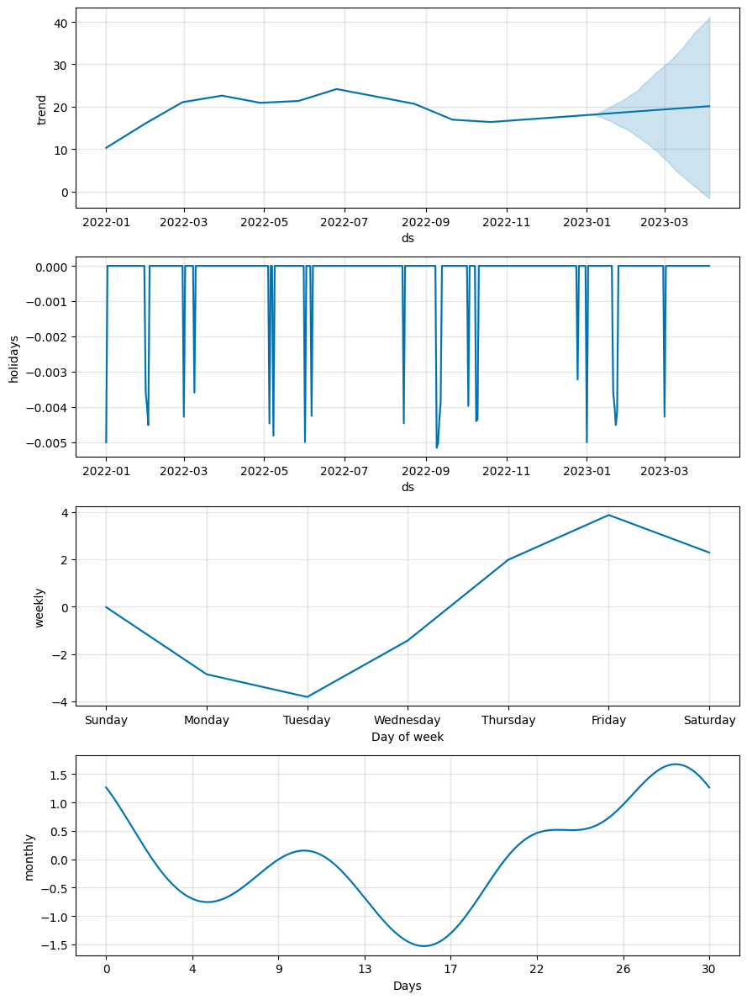

In [29]:
fig = final_model.plot_components(forecast)

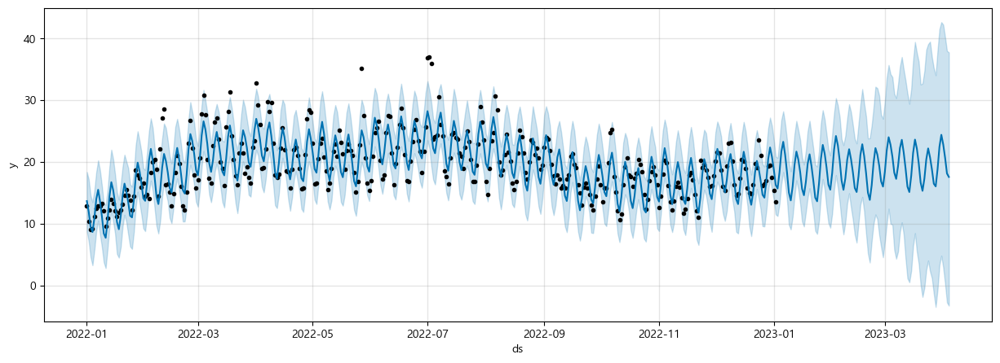

In [124]:
f, ax = plt.subplots(1)
f.set_figheight(5)
f.set_figwidth(15)
fig = final_model.plot(forecast,ax=ax)
plt.show()

In [125]:
X_tst_final= final_model.predict(X_tst)
X_tst_final[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(7)

,ds,yhat,yhat_lower,yhat_upper
85,2023-03-29,18.845694,-0.056588,39.659849
86,2023-03-30,22.467166,4.176223,43.299021
87,2023-03-31,24.410274,5.449807,45.446929
88,2023-04-01,22.850923,2.942257,45.761832
89,2023-04-02,20.679977,0.615117,41.977957
90,2023-04-03,18.145983,-2.229077,40.992801
91,2023-04-04,17.580619,-2.888841,40.752137


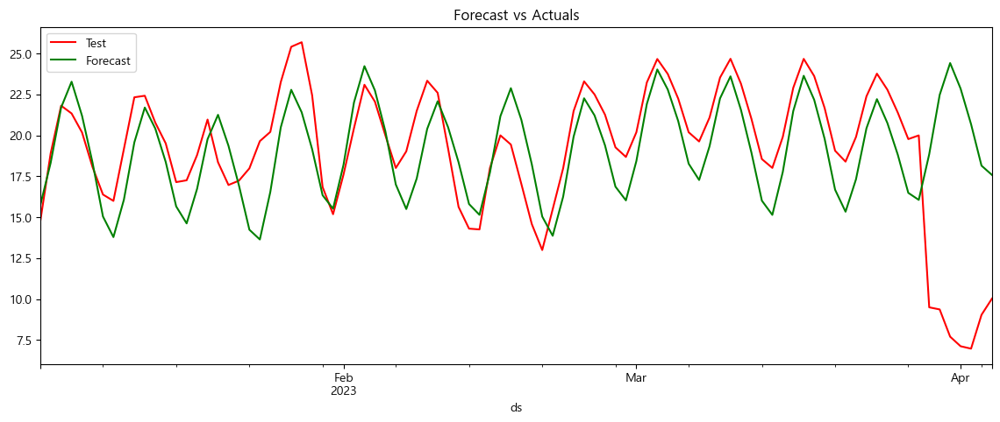

In [126]:
X_tst['ds'] = pd.to_datetime(X_tst['ds'])
X_tst_forecast['ds'] = pd.to_datetime(X_tst_forecast['ds'])

f, ax = plt.subplots(figsize=(14, 5))
X_tst.plot(kind='line', x='ds', y='y', color='red', label='Test', ax=ax)
X_tst_final.plot(kind='line', x='ds', y='yhat', color='green', label='Forecast', ax=ax)
plt.title('Forecast vs Actuals')
plt.show()

In [127]:
MAPE = mean_absolute_percentage_error(X_tst['y'],abs(X_tst_final['yhat']))
print('MAPE = ', MAPE)

MAPE =  20.442125459828265


14:27:40 - cmdstanpy - INFO - Chain [1] start processing
14:27:40 - cmdstanpy - INFO - Chain [1] done processing


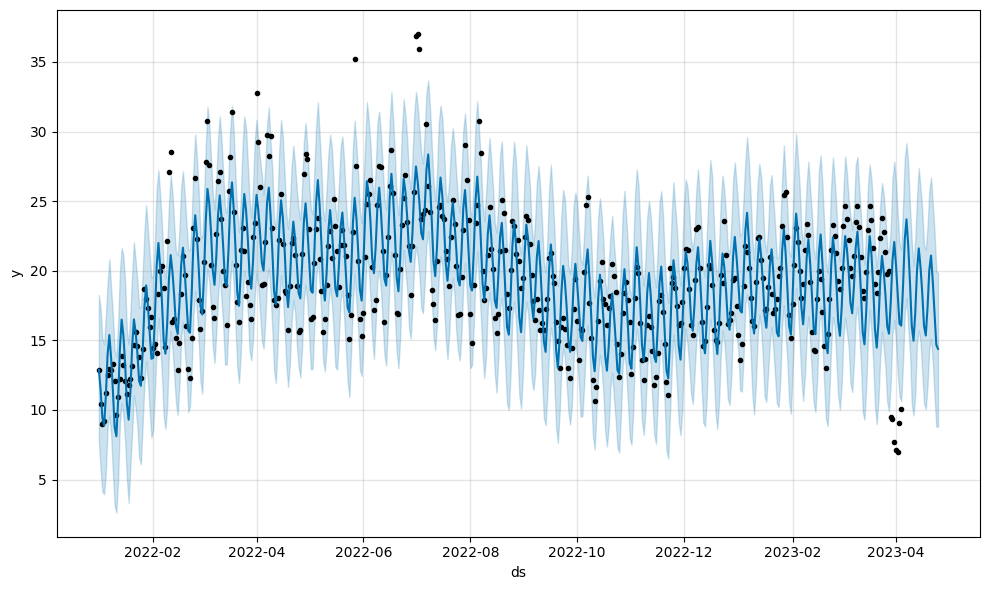

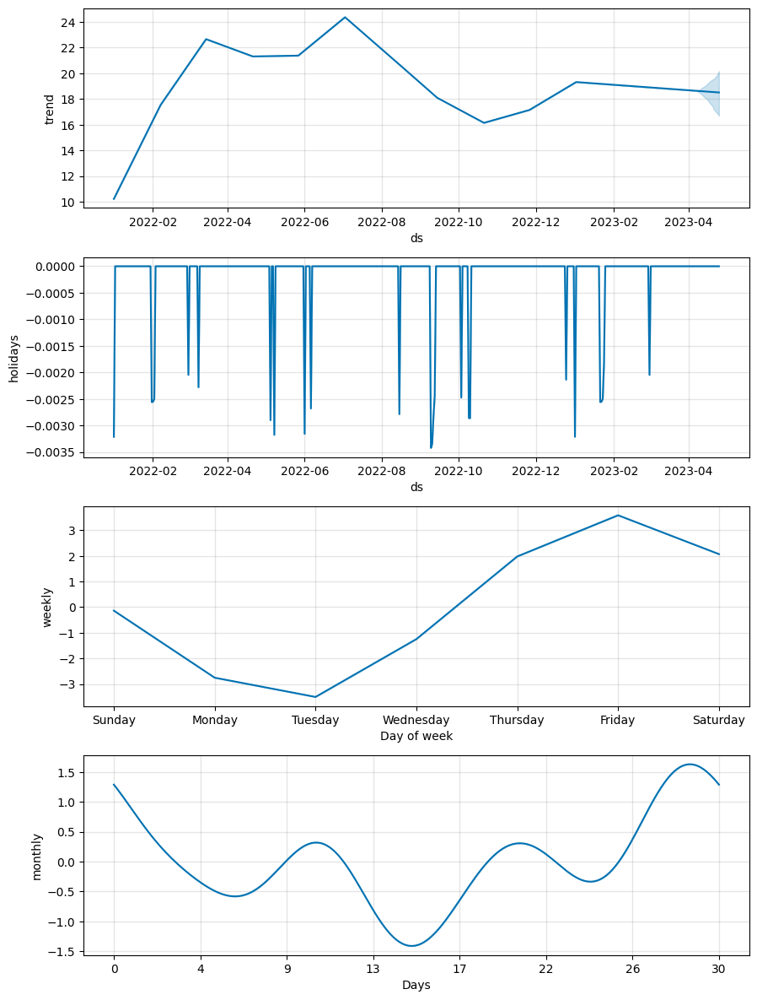

In [30]:
final_model = Prophet(holidays=holiday,
                      changepoint_prior_scale= 0.8,
                      n_changepoints = 10,
                      holidays_prior_scale = 0.001,
                      seasonality_mode = 'additive',
                      seasonality_prior_scale= 0.4,
                      weekly_seasonality=True,
                      daily_seasonality = False,
                      yearly_seasonality = False,
                      interval_width=0.95)
final_model.add_seasonality(name='monthly', period=30.5, fourier_order=5)
final_model.add_country_holidays(country_name='KR')
final_model.fit(series)

future = final_model.make_future_dataframe(periods = 21)
forecast = final_model.predict(future)
fig1 = final_model.plot(forecast)
fig2 = final_model.plot_components(forecast)
plt.show()

In [157]:
#날짜 4/5~4/25 추가하기

new_dates = pd.date_range(start='2023-04-05', end='2023-04-25')

train[new_dates.strftime('%Y-%m-%d')] = 0
train

,ID,대분류,중분류,소분류,브랜드,2022-01-01,2022-01-02,2022-01-03,2022-01-04,2022-01-05,...,2023-04-16,2023-04-17,2023-04-18,2023-04-19,2023-04-20,2023-04-21,2023-04-22,2023-04-23,2023-04-24,2023-04-25
0,0,B002-C001-0002,B002-C002-0007,B002-C003-0038,B002-00001,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-00002,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-00002,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,3,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-00002,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,4,B002-C001-0001,B002-C002-0001,B002-C003-0003,B002-00003,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15885,15885,B002-C001-0003,B002-C002-0008,B002-C003-0042,B002-03799,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15886,15886,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-03799,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15887,15887,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-03799,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15888,15888,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-03799,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [135]:
ds = train.loc[:,'2022-01-01':'2023-04-04'].columns


from tqdm.auto import tqdm

save_yhat = [] # 각각 제품들의 yhat값을 저장할 빈 리스트 선언

for i in tqdm(train.index):
  series = pd.DataFrame({
    'ds':ds,
    'y':train.loc[i,'2022-01-01':'2023-04-04']
  })
  m = Prophet(holidays=holiday,
                      changepoint_prior_scale= 0.8,
                      n_changepoints = 10,
                      holidays_prior_scale = 0.001,
                      seasonality_mode = 'additive',
                      seasonality_prior_scale= 0.4,
                      weekly_seasonality=True,
                      daily_seasonality = False,
                      yearly_seasonality = False,
                      interval_width=0.95)
  m.add_seasonality(name='monthly', period=30.5, fourier_order=5) # monthly 계절성 추가
  m.add_country_holidays(country_name='KR') # 한국의 휴일 날짜를 자동으로 입력해줌. 혹시나 해서 넣어봤다.
  m.fit(series)

  future = m.make_future_dataframe(periods = 21) # 미래 21일간의 데이터 프레임을 만들어둠.
  forecast = m.predict(future) # forecast 변수에 prophet으로 예측한 값을 저장

  save_yhat.append(forecast.loc[forecast['ds'] >= '2023-04-05','yhat'].values)

  0%|          | 0/15890 [00:00<?, ?it/s]

14:05:01 - cmdstanpy - INFO - Chain [1] start processing
14:05:01 - cmdstanpy - INFO - Chain [1] done processing
14:05:02 - cmdstanpy - INFO - Chain [1] start processing
14:05:02 - cmdstanpy - INFO - Chain [1] done processing
14:05:03 - cmdstanpy - INFO - Chain [1] start processing
14:05:03 - cmdstanpy - INFO - Chain [1] done processing
14:05:03 - cmdstanpy - INFO - Chain [1] start processing
14:05:03 - cmdstanpy - INFO - Chain [1] done processing
14:05:04 - cmdstanpy - INFO - Chain [1] start processing
14:05:04 - cmdstanpy - INFO - Chain [1] done processing
14:05:04 - cmdstanpy - INFO - Chain [1] start processing
14:05:05 - cmdstanpy - INFO - Chain [1] done processing
14:05:05 - cmdstanpy - INFO - Chain [1] start processing
14:05:05 - cmdstanpy - INFO - Chain [1] done processing
14:05:06 - cmdstanpy - INFO - Chain [1] start processing
14:05:06 - cmdstanpy - INFO - Chain [1] done processing
14:05:06 - cmdstanpy - INFO - Chain [1] start processing
14:05:07 - cmdstanpy - INFO - Chain [1]

14:05:55 - cmdstanpy - INFO - Chain [1] done processing
14:05:55 - cmdstanpy - INFO - Chain [1] start processing
14:05:55 - cmdstanpy - INFO - Chain [1] done processing
14:05:56 - cmdstanpy - INFO - Chain [1] start processing
14:05:56 - cmdstanpy - INFO - Chain [1] done processing
14:05:57 - cmdstanpy - INFO - Chain [1] start processing
14:05:58 - cmdstanpy - INFO - Chain [1] done processing
14:05:58 - cmdstanpy - INFO - Chain [1] start processing
14:05:59 - cmdstanpy - INFO - Chain [1] done processing
14:05:59 - cmdstanpy - INFO - Chain [1] start processing
14:06:00 - cmdstanpy - INFO - Chain [1] done processing
14:06:00 - cmdstanpy - INFO - Chain [1] start processing
14:06:00 - cmdstanpy - INFO - Chain [1] done processing
14:06:01 - cmdstanpy - INFO - Chain [1] start processing
14:06:01 - cmdstanpy - INFO - Chain [1] done processing
14:06:02 - cmdstanpy - INFO - Chain [1] start processing
14:06:02 - cmdstanpy - INFO - Chain [1] done processing
14:06:03 - cmdstanpy - INFO - Chain [1] 

14:06:52 - cmdstanpy - INFO - Chain [1] done processing
14:06:53 - cmdstanpy - INFO - Chain [1] start processing
14:06:53 - cmdstanpy - INFO - Chain [1] done processing
14:06:54 - cmdstanpy - INFO - Chain [1] start processing
14:06:54 - cmdstanpy - INFO - Chain [1] done processing
14:06:54 - cmdstanpy - INFO - Chain [1] start processing
14:06:55 - cmdstanpy - INFO - Chain [1] done processing
14:06:55 - cmdstanpy - INFO - Chain [1] start processing
14:06:55 - cmdstanpy - INFO - Chain [1] done processing
14:06:56 - cmdstanpy - INFO - Chain [1] start processing
14:06:56 - cmdstanpy - INFO - Chain [1] done processing
14:06:56 - cmdstanpy - INFO - Chain [1] start processing
14:06:57 - cmdstanpy - INFO - Chain [1] done processing
14:06:57 - cmdstanpy - INFO - Chain [1] start processing
14:06:57 - cmdstanpy - INFO - Chain [1] done processing
14:06:58 - cmdstanpy - INFO - Chain [1] start processing
14:06:58 - cmdstanpy - INFO - Chain [1] done processing
14:06:58 - cmdstanpy - INFO - Chain [1] 

14:07:44 - cmdstanpy - INFO - Chain [1] done processing
14:07:45 - cmdstanpy - INFO - Chain [1] start processing
14:07:45 - cmdstanpy - INFO - Chain [1] done processing
14:07:45 - cmdstanpy - INFO - Chain [1] start processing
14:07:46 - cmdstanpy - INFO - Chain [1] done processing
14:07:46 - cmdstanpy - INFO - Chain [1] start processing
14:07:46 - cmdstanpy - INFO - Chain [1] done processing
14:07:47 - cmdstanpy - INFO - Chain [1] start processing
14:07:47 - cmdstanpy - INFO - Chain [1] done processing
14:07:47 - cmdstanpy - INFO - Chain [1] start processing
14:07:47 - cmdstanpy - INFO - Chain [1] done processing
14:07:48 - cmdstanpy - INFO - Chain [1] start processing
14:07:48 - cmdstanpy - INFO - Chain [1] done processing
14:07:49 - cmdstanpy - INFO - Chain [1] start processing
14:07:49 - cmdstanpy - INFO - Chain [1] done processing
14:07:49 - cmdstanpy - INFO - Chain [1] start processing
14:07:50 - cmdstanpy - INFO - Chain [1] done processing
14:07:50 - cmdstanpy - INFO - Chain [1] 

14:08:41 - cmdstanpy - INFO - Chain [1] done processing
14:08:41 - cmdstanpy - INFO - Chain [1] start processing
14:08:41 - cmdstanpy - INFO - Chain [1] done processing
14:08:42 - cmdstanpy - INFO - Chain [1] start processing
14:08:42 - cmdstanpy - INFO - Chain [1] done processing
14:08:43 - cmdstanpy - INFO - Chain [1] start processing
14:08:43 - cmdstanpy - INFO - Chain [1] done processing
14:08:43 - cmdstanpy - INFO - Chain [1] start processing
14:08:43 - cmdstanpy - INFO - Chain [1] done processing
14:08:44 - cmdstanpy - INFO - Chain [1] start processing
14:08:44 - cmdstanpy - INFO - Chain [1] done processing
14:08:44 - cmdstanpy - INFO - Chain [1] start processing
14:08:45 - cmdstanpy - INFO - Chain [1] done processing
14:08:45 - cmdstanpy - INFO - Chain [1] start processing
14:08:45 - cmdstanpy - INFO - Chain [1] done processing
14:08:46 - cmdstanpy - INFO - Chain [1] start processing
14:08:46 - cmdstanpy - INFO - Chain [1] done processing
14:08:46 - cmdstanpy - INFO - Chain [1] 

14:09:33 - cmdstanpy - INFO - Chain [1] start processing
14:09:33 - cmdstanpy - INFO - Chain [1] done processing
14:09:34 - cmdstanpy - INFO - Chain [1] start processing
14:09:34 - cmdstanpy - INFO - Chain [1] done processing
14:09:35 - cmdstanpy - INFO - Chain [1] start processing
14:09:35 - cmdstanpy - INFO - Chain [1] done processing
14:09:35 - cmdstanpy - INFO - Chain [1] start processing
14:09:35 - cmdstanpy - INFO - Chain [1] done processing
14:09:36 - cmdstanpy - INFO - Chain [1] start processing
14:09:36 - cmdstanpy - INFO - Chain [1] done processing
14:09:36 - cmdstanpy - INFO - Chain [1] start processing
14:09:37 - cmdstanpy - INFO - Chain [1] done processing
14:09:37 - cmdstanpy - INFO - Chain [1] start processing
14:09:37 - cmdstanpy - INFO - Chain [1] done processing
14:09:38 - cmdstanpy - INFO - Chain [1] start processing
14:09:38 - cmdstanpy - INFO - Chain [1] done processing
14:09:38 - cmdstanpy - INFO - Chain [1] start processing
14:09:39 - cmdstanpy - INFO - Chain [1]

14:10:21 - cmdstanpy - INFO - Chain [1] done processing
14:10:22 - cmdstanpy - INFO - Chain [1] start processing
14:10:22 - cmdstanpy - INFO - Chain [1] done processing
14:10:22 - cmdstanpy - INFO - Chain [1] start processing
14:10:23 - cmdstanpy - INFO - Chain [1] done processing
14:10:23 - cmdstanpy - INFO - Chain [1] start processing
14:10:23 - cmdstanpy - INFO - Chain [1] done processing
14:10:24 - cmdstanpy - INFO - Chain [1] start processing
14:10:24 - cmdstanpy - INFO - Chain [1] done processing
14:10:24 - cmdstanpy - INFO - Chain [1] start processing
14:10:25 - cmdstanpy - INFO - Chain [1] done processing
14:10:25 - cmdstanpy - INFO - Chain [1] start processing
14:10:25 - cmdstanpy - INFO - Chain [1] done processing
14:10:26 - cmdstanpy - INFO - Chain [1] start processing
14:10:26 - cmdstanpy - INFO - Chain [1] done processing
14:10:26 - cmdstanpy - INFO - Chain [1] start processing
14:10:27 - cmdstanpy - INFO - Chain [1] done processing
14:10:27 - cmdstanpy - INFO - Chain [1] 

14:11:07 - cmdstanpy - INFO - Chain [1] done processing
14:11:07 - cmdstanpy - INFO - Chain [1] start processing
14:11:07 - cmdstanpy - INFO - Chain [1] done processing
14:11:08 - cmdstanpy - INFO - Chain [1] start processing
14:11:08 - cmdstanpy - INFO - Chain [1] done processing
14:11:09 - cmdstanpy - INFO - Chain [1] start processing
14:11:09 - cmdstanpy - INFO - Chain [1] done processing
14:11:09 - cmdstanpy - INFO - Chain [1] start processing
14:11:09 - cmdstanpy - INFO - Chain [1] done processing
14:11:10 - cmdstanpy - INFO - Chain [1] start processing
14:11:10 - cmdstanpy - INFO - Chain [1] done processing
14:11:11 - cmdstanpy - INFO - Chain [1] start processing
14:11:11 - cmdstanpy - INFO - Chain [1] done processing
14:11:11 - cmdstanpy - INFO - Chain [1] start processing
14:11:11 - cmdstanpy - INFO - Chain [1] done processing
14:11:12 - cmdstanpy - INFO - Chain [1] start processing
14:11:12 - cmdstanpy - INFO - Chain [1] done processing
14:11:12 - cmdstanpy - INFO - Chain [1] 

14:11:52 - cmdstanpy - INFO - Chain [1] done processing
14:11:52 - cmdstanpy - INFO - Chain [1] start processing
14:11:52 - cmdstanpy - INFO - Chain [1] done processing
14:11:53 - cmdstanpy - INFO - Chain [1] start processing
14:11:53 - cmdstanpy - INFO - Chain [1] done processing
14:11:53 - cmdstanpy - INFO - Chain [1] start processing
14:11:53 - cmdstanpy - INFO - Chain [1] done processing
14:11:54 - cmdstanpy - INFO - Chain [1] start processing
14:11:54 - cmdstanpy - INFO - Chain [1] done processing
14:11:54 - cmdstanpy - INFO - Chain [1] start processing
14:11:55 - cmdstanpy - INFO - Chain [1] done processing
14:11:55 - cmdstanpy - INFO - Chain [1] start processing
14:11:55 - cmdstanpy - INFO - Chain [1] done processing
14:11:56 - cmdstanpy - INFO - Chain [1] start processing
14:11:56 - cmdstanpy - INFO - Chain [1] done processing
14:11:56 - cmdstanpy - INFO - Chain [1] start processing
14:11:57 - cmdstanpy - INFO - Chain [1] done processing
14:11:57 - cmdstanpy - INFO - Chain [1] 

14:12:38 - cmdstanpy - INFO - Chain [1] done processing
14:12:38 - cmdstanpy - INFO - Chain [1] start processing
14:12:38 - cmdstanpy - INFO - Chain [1] done processing
14:12:39 - cmdstanpy - INFO - Chain [1] start processing
14:12:39 - cmdstanpy - INFO - Chain [1] done processing
14:12:39 - cmdstanpy - INFO - Chain [1] start processing
14:12:40 - cmdstanpy - INFO - Chain [1] done processing
14:12:40 - cmdstanpy - INFO - Chain [1] start processing
14:12:40 - cmdstanpy - INFO - Chain [1] done processing
14:12:41 - cmdstanpy - INFO - Chain [1] start processing
14:12:41 - cmdstanpy - INFO - Chain [1] done processing
14:12:41 - cmdstanpy - INFO - Chain [1] start processing
14:12:42 - cmdstanpy - INFO - Chain [1] done processing
14:12:42 - cmdstanpy - INFO - Chain [1] start processing
14:12:42 - cmdstanpy - INFO - Chain [1] done processing
14:12:43 - cmdstanpy - INFO - Chain [1] start processing
14:12:43 - cmdstanpy - INFO - Chain [1] done processing
14:12:43 - cmdstanpy - INFO - Chain [1] 

14:13:23 - cmdstanpy - INFO - Chain [1] start processing
14:13:24 - cmdstanpy - INFO - Chain [1] done processing
14:13:24 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
14:13:24 - cmdstanpy - INFO - Chain [1] start processing
14:13:24 - cmdstanpy - INFO - Chain [1] done processing
14:13:25 - cmdstanpy - INFO - Chain [1] start processing
14:13:25 - cmdstanpy - INFO - Chain [1] done processing
14:13:25 - cmdstanpy - INFO - Chain [1] start processing
14:13:25 - cmdstanpy - INFO - Chain [1] done processing
14:13:26 - cmdstanpy - INFO - Chain [1] start processing
14:13:26 - cmdstanpy - INFO - Chain [1] done processing
14:13:26 - cmdstanpy - INFO - Chain [1] start processing
14:13:27 - cmdstanpy - INFO - Chain [1] done processing
14:13:27 - cmdstanpy - INFO - Chain [1] start processing
14:13:27 - cmdstanpy - INFO - Chain [1] done processing
14:13:28 - cmdstanpy - INFO - Chain [1] start process

14:14:09 - cmdstanpy - INFO - Chain [1] done processing
14:14:09 - cmdstanpy - INFO - Chain [1] start processing
14:14:10 - cmdstanpy - INFO - Chain [1] done processing
14:14:10 - cmdstanpy - INFO - Chain [1] start processing
14:14:10 - cmdstanpy - INFO - Chain [1] done processing
14:14:11 - cmdstanpy - INFO - Chain [1] start processing
14:14:11 - cmdstanpy - INFO - Chain [1] done processing
14:14:11 - cmdstanpy - INFO - Chain [1] start processing
14:14:11 - cmdstanpy - INFO - Chain [1] done processing
14:14:12 - cmdstanpy - INFO - Chain [1] start processing
14:14:12 - cmdstanpy - INFO - Chain [1] done processing
14:14:12 - cmdstanpy - INFO - Chain [1] start processing
14:14:12 - cmdstanpy - INFO - Chain [1] done processing
14:14:13 - cmdstanpy - INFO - Chain [1] start processing
14:14:13 - cmdstanpy - INFO - Chain [1] done processing
14:14:13 - cmdstanpy - INFO - Chain [1] start processing
14:14:14 - cmdstanpy - INFO - Chain [1] done processing
14:14:14 - cmdstanpy - INFO - Chain [1] 

14:14:55 - cmdstanpy - INFO - Chain [1] done processing
14:14:56 - cmdstanpy - INFO - Chain [1] start processing
14:14:56 - cmdstanpy - INFO - Chain [1] done processing
14:14:56 - cmdstanpy - INFO - Chain [1] start processing
14:14:57 - cmdstanpy - INFO - Chain [1] done processing
14:14:57 - cmdstanpy - INFO - Chain [1] start processing
14:14:57 - cmdstanpy - INFO - Chain [1] done processing
14:14:58 - cmdstanpy - INFO - Chain [1] start processing
14:14:58 - cmdstanpy - INFO - Chain [1] done processing
14:14:58 - cmdstanpy - INFO - Chain [1] start processing
14:14:58 - cmdstanpy - INFO - Chain [1] done processing
14:14:59 - cmdstanpy - INFO - Chain [1] start processing
14:14:59 - cmdstanpy - INFO - Chain [1] done processing
14:15:00 - cmdstanpy - INFO - Chain [1] start processing
14:15:00 - cmdstanpy - INFO - Chain [1] done processing
14:15:00 - cmdstanpy - INFO - Chain [1] start processing
14:15:00 - cmdstanpy - INFO - Chain [1] done processing
14:15:01 - cmdstanpy - INFO - Chain [1] 

14:15:41 - cmdstanpy - INFO - Chain [1] done processing
14:15:41 - cmdstanpy - INFO - Chain [1] start processing
14:15:41 - cmdstanpy - INFO - Chain [1] done processing
14:15:42 - cmdstanpy - INFO - Chain [1] start processing
14:15:42 - cmdstanpy - INFO - Chain [1] done processing
14:15:42 - cmdstanpy - INFO - Chain [1] start processing
14:15:43 - cmdstanpy - INFO - Chain [1] done processing
14:15:43 - cmdstanpy - INFO - Chain [1] start processing
14:15:43 - cmdstanpy - INFO - Chain [1] done processing
14:15:44 - cmdstanpy - INFO - Chain [1] start processing
14:15:44 - cmdstanpy - INFO - Chain [1] done processing
14:15:44 - cmdstanpy - INFO - Chain [1] start processing
14:15:44 - cmdstanpy - INFO - Chain [1] done processing
14:15:45 - cmdstanpy - INFO - Chain [1] start processing
14:15:45 - cmdstanpy - INFO - Chain [1] done processing
14:15:46 - cmdstanpy - INFO - Chain [1] start processing
14:15:46 - cmdstanpy - INFO - Chain [1] done processing
14:15:46 - cmdstanpy - INFO - Chain [1] 

14:16:23 - cmdstanpy - INFO - Chain [1] start processing
14:16:24 - cmdstanpy - INFO - Chain [1] done processing
14:16:24 - cmdstanpy - INFO - Chain [1] start processing
14:16:24 - cmdstanpy - INFO - Chain [1] done processing
14:16:25 - cmdstanpy - INFO - Chain [1] start processing
14:16:25 - cmdstanpy - INFO - Chain [1] done processing
14:16:25 - cmdstanpy - INFO - Chain [1] start processing
14:16:25 - cmdstanpy - INFO - Chain [1] done processing
14:16:26 - cmdstanpy - INFO - Chain [1] start processing
14:16:26 - cmdstanpy - INFO - Chain [1] done processing
14:16:27 - cmdstanpy - INFO - Chain [1] start processing
14:16:27 - cmdstanpy - INFO - Chain [1] done processing
14:16:27 - cmdstanpy - INFO - Chain [1] start processing
14:16:27 - cmdstanpy - INFO - Chain [1] done processing
14:16:28 - cmdstanpy - INFO - Chain [1] start processing
14:16:28 - cmdstanpy - INFO - Chain [1] done processing
14:16:28 - cmdstanpy - INFO - Chain [1] start processing
14:16:28 - cmdstanpy - INFO - Chain [1]

14:17:08 - cmdstanpy - INFO - Chain [1] done processing
14:17:08 - cmdstanpy - INFO - Chain [1] start processing
14:17:09 - cmdstanpy - INFO - Chain [1] done processing
14:17:09 - cmdstanpy - INFO - Chain [1] start processing
14:17:09 - cmdstanpy - INFO - Chain [1] done processing
14:17:10 - cmdstanpy - INFO - Chain [1] start processing
14:17:10 - cmdstanpy - INFO - Chain [1] done processing
14:17:10 - cmdstanpy - INFO - Chain [1] start processing
14:17:11 - cmdstanpy - INFO - Chain [1] done processing
14:17:11 - cmdstanpy - INFO - Chain [1] start processing
14:17:11 - cmdstanpy - INFO - Chain [1] done processing
14:17:12 - cmdstanpy - INFO - Chain [1] start processing
14:17:12 - cmdstanpy - INFO - Chain [1] done processing
14:17:12 - cmdstanpy - INFO - Chain [1] start processing
14:17:12 - cmdstanpy - INFO - Chain [1] done processing
14:17:13 - cmdstanpy - INFO - Chain [1] start processing
14:17:13 - cmdstanpy - INFO - Chain [1] done processing
14:17:14 - cmdstanpy - INFO - Chain [1] 

14:17:53 - cmdstanpy - INFO - Chain [1] start processing
14:17:53 - cmdstanpy - INFO - Chain [1] done processing
14:17:53 - cmdstanpy - INFO - Chain [1] start processing
14:17:53 - cmdstanpy - INFO - Chain [1] done processing
14:17:54 - cmdstanpy - INFO - Chain [1] start processing
14:17:54 - cmdstanpy - INFO - Chain [1] done processing
14:17:54 - cmdstanpy - INFO - Chain [1] start processing
14:17:55 - cmdstanpy - INFO - Chain [1] done processing
14:17:55 - cmdstanpy - INFO - Chain [1] start processing
14:17:55 - cmdstanpy - INFO - Chain [1] done processing
14:17:56 - cmdstanpy - INFO - Chain [1] start processing
14:17:56 - cmdstanpy - INFO - Chain [1] done processing
14:17:56 - cmdstanpy - INFO - Chain [1] start processing
14:17:56 - cmdstanpy - INFO - Chain [1] done processing
14:17:57 - cmdstanpy - INFO - Chain [1] start processing
14:17:57 - cmdstanpy - INFO - Chain [1] done processing
14:17:58 - cmdstanpy - INFO - Chain [1] start processing
14:17:58 - cmdstanpy - INFO - Chain [1]

14:18:38 - cmdstanpy - INFO - Chain [1] done processing
14:18:38 - cmdstanpy - INFO - Chain [1] start processing
14:18:39 - cmdstanpy - INFO - Chain [1] done processing
14:18:39 - cmdstanpy - INFO - Chain [1] start processing
14:18:39 - cmdstanpy - INFO - Chain [1] done processing
14:18:39 - cmdstanpy - INFO - Chain [1] start processing
14:18:40 - cmdstanpy - INFO - Chain [1] done processing
14:18:40 - cmdstanpy - INFO - Chain [1] start processing
14:18:40 - cmdstanpy - INFO - Chain [1] done processing
14:18:41 - cmdstanpy - INFO - Chain [1] start processing
14:18:41 - cmdstanpy - INFO - Chain [1] done processing
14:18:41 - cmdstanpy - INFO - Chain [1] start processing
14:18:41 - cmdstanpy - INFO - Chain [1] done processing
14:18:42 - cmdstanpy - INFO - Chain [1] start processing
14:18:42 - cmdstanpy - INFO - Chain [1] done processing
14:18:42 - cmdstanpy - INFO - Chain [1] start processing
14:18:43 - cmdstanpy - INFO - Chain [1] done processing
14:18:43 - cmdstanpy - INFO - Chain [1] 

14:19:22 - cmdstanpy - INFO - Chain [1] start processing
14:19:23 - cmdstanpy - INFO - Chain [1] done processing
14:19:23 - cmdstanpy - INFO - Chain [1] start processing
14:19:23 - cmdstanpy - INFO - Chain [1] done processing
14:19:24 - cmdstanpy - INFO - Chain [1] start processing
14:19:24 - cmdstanpy - INFO - Chain [1] done processing
14:19:24 - cmdstanpy - INFO - Chain [1] start processing
14:19:24 - cmdstanpy - INFO - Chain [1] done processing
14:19:25 - cmdstanpy - INFO - Chain [1] start processing
14:19:25 - cmdstanpy - INFO - Chain [1] done processing
14:19:26 - cmdstanpy - INFO - Chain [1] start processing
14:19:26 - cmdstanpy - INFO - Chain [1] done processing
14:19:26 - cmdstanpy - INFO - Chain [1] start processing
14:19:26 - cmdstanpy - INFO - Chain [1] done processing
14:19:27 - cmdstanpy - INFO - Chain [1] start processing
14:19:27 - cmdstanpy - INFO - Chain [1] done processing
14:19:27 - cmdstanpy - INFO - Chain [1] start processing
14:19:27 - cmdstanpy - INFO - Chain [1]

14:20:08 - cmdstanpy - INFO - Chain [1] done processing
14:20:09 - cmdstanpy - INFO - Chain [1] start processing
14:20:09 - cmdstanpy - INFO - Chain [1] done processing
14:20:09 - cmdstanpy - INFO - Chain [1] start processing
14:20:10 - cmdstanpy - INFO - Chain [1] done processing
14:20:10 - cmdstanpy - INFO - Chain [1] start processing
14:20:10 - cmdstanpy - INFO - Chain [1] done processing
14:20:11 - cmdstanpy - INFO - Chain [1] start processing
14:20:11 - cmdstanpy - INFO - Chain [1] done processing
14:20:11 - cmdstanpy - INFO - Chain [1] start processing
14:20:11 - cmdstanpy - INFO - Chain [1] done processing
14:20:12 - cmdstanpy - INFO - Chain [1] start processing
14:20:12 - cmdstanpy - INFO - Chain [1] done processing
14:20:13 - cmdstanpy - INFO - Chain [1] start processing
14:20:13 - cmdstanpy - INFO - Chain [1] done processing
14:20:13 - cmdstanpy - INFO - Chain [1] start processing
14:20:13 - cmdstanpy - INFO - Chain [1] done processing
14:20:14 - cmdstanpy - INFO - Chain [1] 

14:20:55 - cmdstanpy - INFO - Chain [1] done processing
14:20:55 - cmdstanpy - INFO - Chain [1] start processing
14:20:55 - cmdstanpy - INFO - Chain [1] done processing
14:20:56 - cmdstanpy - INFO - Chain [1] start processing
14:20:56 - cmdstanpy - INFO - Chain [1] done processing
14:20:56 - cmdstanpy - INFO - Chain [1] start processing
14:20:56 - cmdstanpy - INFO - Chain [1] done processing
14:20:57 - cmdstanpy - INFO - Chain [1] start processing
14:20:57 - cmdstanpy - INFO - Chain [1] done processing
14:20:57 - cmdstanpy - INFO - Chain [1] start processing
14:20:58 - cmdstanpy - INFO - Chain [1] done processing
14:20:58 - cmdstanpy - INFO - Chain [1] start processing
14:20:58 - cmdstanpy - INFO - Chain [1] done processing
14:20:59 - cmdstanpy - INFO - Chain [1] start processing
14:20:59 - cmdstanpy - INFO - Chain [1] done processing
14:20:59 - cmdstanpy - INFO - Chain [1] start processing
14:20:59 - cmdstanpy - INFO - Chain [1] done processing
14:21:00 - cmdstanpy - INFO - Chain [1] 

14:21:39 - cmdstanpy - INFO - Chain [1] start processing
14:21:39 - cmdstanpy - INFO - Chain [1] done processing
14:21:39 - cmdstanpy - INFO - Chain [1] start processing
14:21:40 - cmdstanpy - INFO - Chain [1] done processing
14:21:40 - cmdstanpy - INFO - Chain [1] start processing
14:21:40 - cmdstanpy - INFO - Chain [1] done processing
14:21:41 - cmdstanpy - INFO - Chain [1] start processing
14:21:41 - cmdstanpy - INFO - Chain [1] done processing
14:21:41 - cmdstanpy - INFO - Chain [1] start processing
14:21:42 - cmdstanpy - INFO - Chain [1] done processing
14:21:42 - cmdstanpy - INFO - Chain [1] start processing
14:21:42 - cmdstanpy - INFO - Chain [1] done processing
14:21:43 - cmdstanpy - INFO - Chain [1] start processing
14:21:43 - cmdstanpy - INFO - Chain [1] done processing
14:21:43 - cmdstanpy - INFO - Chain [1] start processing
14:21:44 - cmdstanpy - INFO - Chain [1] done processing
14:21:44 - cmdstanpy - INFO - Chain [1] start processing
14:21:44 - cmdstanpy - INFO - Chain [1]

14:22:24 - cmdstanpy - INFO - Chain [1] done processing
14:22:25 - cmdstanpy - INFO - Chain [1] start processing
14:22:25 - cmdstanpy - INFO - Chain [1] done processing
14:22:25 - cmdstanpy - INFO - Chain [1] start processing
14:22:26 - cmdstanpy - INFO - Chain [1] done processing
14:22:26 - cmdstanpy - INFO - Chain [1] start processing
14:22:26 - cmdstanpy - INFO - Chain [1] done processing
14:22:27 - cmdstanpy - INFO - Chain [1] start processing
14:22:27 - cmdstanpy - INFO - Chain [1] done processing
14:22:27 - cmdstanpy - INFO - Chain [1] start processing
14:22:27 - cmdstanpy - INFO - Chain [1] done processing
14:22:28 - cmdstanpy - INFO - Chain [1] start processing
14:22:28 - cmdstanpy - INFO - Chain [1] done processing
14:22:29 - cmdstanpy - INFO - Chain [1] start processing
14:22:29 - cmdstanpy - INFO - Chain [1] done processing
14:22:29 - cmdstanpy - INFO - Chain [1] start processing
14:22:29 - cmdstanpy - INFO - Chain [1] done processing
14:22:30 - cmdstanpy - INFO - Chain [1] 

14:23:12 - cmdstanpy - INFO - Chain [1] done processing
14:23:12 - cmdstanpy - INFO - Chain [1] start processing
14:23:13 - cmdstanpy - INFO - Chain [1] done processing
14:23:13 - cmdstanpy - INFO - Chain [1] start processing
14:23:13 - cmdstanpy - INFO - Chain [1] done processing
14:23:14 - cmdstanpy - INFO - Chain [1] start processing
14:23:14 - cmdstanpy - INFO - Chain [1] done processing
14:23:14 - cmdstanpy - INFO - Chain [1] start processing
14:23:15 - cmdstanpy - INFO - Chain [1] done processing
14:23:15 - cmdstanpy - INFO - Chain [1] start processing
14:23:15 - cmdstanpy - INFO - Chain [1] done processing
14:23:16 - cmdstanpy - INFO - Chain [1] start processing
14:23:16 - cmdstanpy - INFO - Chain [1] done processing
14:23:16 - cmdstanpy - INFO - Chain [1] start processing
14:23:17 - cmdstanpy - INFO - Chain [1] done processing
14:23:17 - cmdstanpy - INFO - Chain [1] start processing
14:23:17 - cmdstanpy - INFO - Chain [1] done processing
14:23:18 - cmdstanpy - INFO - Chain [1] 

14:23:58 - cmdstanpy - INFO - Chain [1] start processing
14:23:58 - cmdstanpy - INFO - Chain [1] done processing
14:23:59 - cmdstanpy - INFO - Chain [1] start processing
14:23:59 - cmdstanpy - INFO - Chain [1] done processing
14:23:59 - cmdstanpy - INFO - Chain [1] start processing
14:24:00 - cmdstanpy - INFO - Chain [1] done processing
14:24:00 - cmdstanpy - INFO - Chain [1] start processing
14:24:00 - cmdstanpy - INFO - Chain [1] done processing
14:24:01 - cmdstanpy - INFO - Chain [1] start processing
14:24:01 - cmdstanpy - INFO - Chain [1] done processing
14:24:01 - cmdstanpy - INFO - Chain [1] start processing
14:24:02 - cmdstanpy - INFO - Chain [1] done processing
14:24:02 - cmdstanpy - INFO - Chain [1] start processing
14:24:02 - cmdstanpy - INFO - Chain [1] done processing
14:24:03 - cmdstanpy - INFO - Chain [1] start processing
14:24:03 - cmdstanpy - INFO - Chain [1] done processing
14:24:03 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted


14:24:44 - cmdstanpy - INFO - Chain [1] done processing
14:24:44 - cmdstanpy - INFO - Chain [1] start processing
14:24:44 - cmdstanpy - INFO - Chain [1] done processing
14:24:45 - cmdstanpy - INFO - Chain [1] start processing
14:24:45 - cmdstanpy - INFO - Chain [1] done processing
14:24:45 - cmdstanpy - INFO - Chain [1] start processing
14:24:45 - cmdstanpy - INFO - Chain [1] done processing
14:24:46 - cmdstanpy - INFO - Chain [1] start processing
14:24:46 - cmdstanpy - INFO - Chain [1] done processing
14:24:46 - cmdstanpy - INFO - Chain [1] start processing
14:24:47 - cmdstanpy - INFO - Chain [1] done processing
14:24:47 - cmdstanpy - INFO - Chain [1] start processing
14:24:47 - cmdstanpy - INFO - Chain [1] done processing
14:24:48 - cmdstanpy - INFO - Chain [1] start processing
14:24:48 - cmdstanpy - INFO - Chain [1] done processing
14:24:48 - cmdstanpy - INFO - Chain [1] start processing
14:24:48 - cmdstanpy - INFO - Chain [1] done processing
14:24:49 - cmdstanpy - INFO - Chain [1] 

14:25:26 - cmdstanpy - INFO - Chain [1] done processing
14:25:26 - cmdstanpy - INFO - Chain [1] start processing
14:25:26 - cmdstanpy - INFO - Chain [1] done processing
14:25:27 - cmdstanpy - INFO - Chain [1] start processing
14:25:27 - cmdstanpy - INFO - Chain [1] done processing
14:25:27 - cmdstanpy - INFO - Chain [1] start processing
14:25:28 - cmdstanpy - INFO - Chain [1] done processing
14:25:28 - cmdstanpy - INFO - Chain [1] start processing
14:25:28 - cmdstanpy - INFO - Chain [1] done processing
14:25:29 - cmdstanpy - INFO - Chain [1] start processing
14:25:29 - cmdstanpy - INFO - Chain [1] done processing
14:25:29 - cmdstanpy - INFO - Chain [1] start processing
14:25:29 - cmdstanpy - INFO - Chain [1] done processing
14:25:30 - cmdstanpy - INFO - Chain [1] start processing
14:25:30 - cmdstanpy - INFO - Chain [1] done processing
14:25:30 - cmdstanpy - INFO - Chain [1] start processing
14:25:31 - cmdstanpy - INFO - Chain [1] done processing
14:25:31 - cmdstanpy - INFO - Chain [1] 

14:26:12 - cmdstanpy - INFO - Chain [1] done processing
14:26:12 - cmdstanpy - INFO - Chain [1] start processing
14:26:13 - cmdstanpy - INFO - Chain [1] done processing
14:26:13 - cmdstanpy - INFO - Chain [1] start processing
14:26:13 - cmdstanpy - INFO - Chain [1] done processing
14:26:13 - cmdstanpy - INFO - Chain [1] start processing
14:26:14 - cmdstanpy - INFO - Chain [1] done processing
14:26:14 - cmdstanpy - INFO - Chain [1] start processing
14:26:14 - cmdstanpy - INFO - Chain [1] done processing
14:26:15 - cmdstanpy - INFO - Chain [1] start processing
14:26:15 - cmdstanpy - INFO - Chain [1] done processing
14:26:15 - cmdstanpy - INFO - Chain [1] start processing
14:26:15 - cmdstanpy - INFO - Chain [1] done processing
14:26:16 - cmdstanpy - INFO - Chain [1] start processing
14:26:16 - cmdstanpy - INFO - Chain [1] done processing
14:26:16 - cmdstanpy - INFO - Chain [1] start processing
14:26:17 - cmdstanpy - INFO - Chain [1] done processing
14:26:17 - cmdstanpy - INFO - Chain [1] 

14:26:56 - cmdstanpy - INFO - Chain [1] start processing
14:26:56 - cmdstanpy - INFO - Chain [1] done processing
14:26:57 - cmdstanpy - INFO - Chain [1] start processing
14:26:57 - cmdstanpy - INFO - Chain [1] done processing
14:26:57 - cmdstanpy - INFO - Chain [1] start processing
14:26:58 - cmdstanpy - INFO - Chain [1] done processing
14:26:58 - cmdstanpy - INFO - Chain [1] start processing
14:26:58 - cmdstanpy - INFO - Chain [1] done processing
14:26:58 - cmdstanpy - INFO - Chain [1] start processing
14:26:59 - cmdstanpy - INFO - Chain [1] done processing
14:26:59 - cmdstanpy - INFO - Chain [1] start processing
14:26:59 - cmdstanpy - INFO - Chain [1] done processing
14:27:00 - cmdstanpy - INFO - Chain [1] start processing
14:27:00 - cmdstanpy - INFO - Chain [1] done processing
14:27:00 - cmdstanpy - INFO - Chain [1] start processing
14:27:01 - cmdstanpy - INFO - Chain [1] done processing
14:27:01 - cmdstanpy - INFO - Chain [1] start processing
14:27:01 - cmdstanpy - INFO - Chain [1]

14:27:42 - cmdstanpy - INFO - Chain [1] done processing
14:27:42 - cmdstanpy - INFO - Chain [1] start processing
14:27:43 - cmdstanpy - INFO - Chain [1] done processing
14:27:43 - cmdstanpy - INFO - Chain [1] start processing
14:27:43 - cmdstanpy - INFO - Chain [1] done processing
14:27:44 - cmdstanpy - INFO - Chain [1] start processing
14:27:44 - cmdstanpy - INFO - Chain [1] done processing
14:27:44 - cmdstanpy - INFO - Chain [1] start processing
14:27:44 - cmdstanpy - INFO - Chain [1] done processing
14:27:45 - cmdstanpy - INFO - Chain [1] start processing
14:27:45 - cmdstanpy - INFO - Chain [1] done processing
14:27:45 - cmdstanpy - INFO - Chain [1] start processing
14:27:46 - cmdstanpy - INFO - Chain [1] done processing
14:27:46 - cmdstanpy - INFO - Chain [1] start processing
14:27:46 - cmdstanpy - INFO - Chain [1] done processing
14:27:47 - cmdstanpy - INFO - Chain [1] start processing
14:27:47 - cmdstanpy - INFO - Chain [1] done processing
14:27:47 - cmdstanpy - INFO - Chain [1] 

14:28:28 - cmdstanpy - INFO - Chain [1] done processing
14:28:28 - cmdstanpy - INFO - Chain [1] start processing
14:28:28 - cmdstanpy - INFO - Chain [1] done processing
14:28:29 - cmdstanpy - INFO - Chain [1] start processing
14:28:29 - cmdstanpy - INFO - Chain [1] done processing
14:28:29 - cmdstanpy - INFO - Chain [1] start processing
14:28:30 - cmdstanpy - INFO - Chain [1] done processing
14:28:30 - cmdstanpy - INFO - Chain [1] start processing
14:28:30 - cmdstanpy - INFO - Chain [1] done processing
14:28:31 - cmdstanpy - INFO - Chain [1] start processing
14:28:31 - cmdstanpy - INFO - Chain [1] done processing
14:28:31 - cmdstanpy - INFO - Chain [1] start processing
14:28:31 - cmdstanpy - INFO - Chain [1] done processing
14:28:32 - cmdstanpy - INFO - Chain [1] start processing
14:28:32 - cmdstanpy - INFO - Chain [1] done processing
14:28:32 - cmdstanpy - INFO - Chain [1] start processing
14:28:33 - cmdstanpy - INFO - Chain [1] done processing
14:28:33 - cmdstanpy - INFO - Chain [1] 

14:29:13 - cmdstanpy - INFO - Chain [1] done processing
14:29:14 - cmdstanpy - INFO - Chain [1] start processing
14:29:14 - cmdstanpy - INFO - Chain [1] done processing
14:29:14 - cmdstanpy - INFO - Chain [1] start processing
14:29:15 - cmdstanpy - INFO - Chain [1] done processing
14:29:15 - cmdstanpy - INFO - Chain [1] start processing
14:29:15 - cmdstanpy - INFO - Chain [1] done processing
14:29:16 - cmdstanpy - INFO - Chain [1] start processing
14:29:16 - cmdstanpy - INFO - Chain [1] done processing
14:29:16 - cmdstanpy - INFO - Chain [1] start processing
14:29:17 - cmdstanpy - INFO - Chain [1] done processing
14:29:17 - cmdstanpy - INFO - Chain [1] start processing
14:29:17 - cmdstanpy - INFO - Chain [1] done processing
14:29:18 - cmdstanpy - INFO - Chain [1] start processing
14:29:18 - cmdstanpy - INFO - Chain [1] done processing
14:29:18 - cmdstanpy - INFO - Chain [1] start processing
14:29:19 - cmdstanpy - INFO - Chain [1] done processing
14:29:19 - cmdstanpy - INFO - Chain [1] 

14:30:00 - cmdstanpy - INFO - Chain [1] done processing
14:30:00 - cmdstanpy - INFO - Chain [1] start processing
14:30:00 - cmdstanpy - INFO - Chain [1] done processing
14:30:01 - cmdstanpy - INFO - Chain [1] start processing
14:30:01 - cmdstanpy - INFO - Chain [1] done processing
14:30:01 - cmdstanpy - INFO - Chain [1] start processing
14:30:01 - cmdstanpy - INFO - Chain [1] done processing
14:30:02 - cmdstanpy - INFO - Chain [1] start processing
14:30:02 - cmdstanpy - INFO - Chain [1] done processing
14:30:03 - cmdstanpy - INFO - Chain [1] start processing
14:30:03 - cmdstanpy - INFO - Chain [1] done processing
14:30:03 - cmdstanpy - INFO - Chain [1] start processing
14:30:03 - cmdstanpy - INFO - Chain [1] done processing
14:30:04 - cmdstanpy - INFO - Chain [1] start processing
14:30:04 - cmdstanpy - INFO - Chain [1] done processing
14:30:04 - cmdstanpy - INFO - Chain [1] start processing
14:30:04 - cmdstanpy - INFO - Chain [1] done processing
14:30:05 - cmdstanpy - INFO - Chain [1] 

14:30:44 - cmdstanpy - INFO - Chain [1] start processing
14:30:44 - cmdstanpy - INFO - Chain [1] done processing
14:30:44 - cmdstanpy - INFO - Chain [1] start processing
14:30:45 - cmdstanpy - INFO - Chain [1] done processing
14:30:45 - cmdstanpy - INFO - Chain [1] start processing
14:30:46 - cmdstanpy - INFO - Chain [1] done processing
14:30:46 - cmdstanpy - INFO - Chain [1] start processing
14:30:46 - cmdstanpy - INFO - Chain [1] done processing
14:30:47 - cmdstanpy - INFO - Chain [1] start processing
14:30:47 - cmdstanpy - INFO - Chain [1] done processing
14:30:47 - cmdstanpy - INFO - Chain [1] start processing
14:30:47 - cmdstanpy - INFO - Chain [1] done processing
14:30:48 - cmdstanpy - INFO - Chain [1] start processing
14:30:48 - cmdstanpy - INFO - Chain [1] done processing
14:30:48 - cmdstanpy - INFO - Chain [1] start processing
14:30:49 - cmdstanpy - INFO - Chain [1] done processing
14:30:49 - cmdstanpy - INFO - Chain [1] start processing
14:30:49 - cmdstanpy - INFO - Chain [1]

14:31:29 - cmdstanpy - INFO - Chain [1] done processing
14:31:29 - cmdstanpy - INFO - Chain [1] start processing
14:31:29 - cmdstanpy - INFO - Chain [1] done processing
14:31:30 - cmdstanpy - INFO - Chain [1] start processing
14:31:30 - cmdstanpy - INFO - Chain [1] done processing
14:31:30 - cmdstanpy - INFO - Chain [1] start processing
14:31:31 - cmdstanpy - INFO - Chain [1] done processing
14:31:31 - cmdstanpy - INFO - Chain [1] start processing
14:31:31 - cmdstanpy - INFO - Chain [1] done processing
14:31:32 - cmdstanpy - INFO - Chain [1] start processing
14:31:32 - cmdstanpy - INFO - Chain [1] done processing
14:31:32 - cmdstanpy - INFO - Chain [1] start processing
14:31:32 - cmdstanpy - INFO - Chain [1] done processing
14:31:33 - cmdstanpy - INFO - Chain [1] start processing
14:31:33 - cmdstanpy - INFO - Chain [1] done processing
14:31:33 - cmdstanpy - INFO - Chain [1] start processing
14:31:34 - cmdstanpy - INFO - Chain [1] done processing
14:31:34 - cmdstanpy - INFO - Chain [1] 

14:32:14 - cmdstanpy - INFO - Chain [1] done processing
14:32:15 - cmdstanpy - INFO - Chain [1] start processing
14:32:15 - cmdstanpy - INFO - Chain [1] done processing
14:32:15 - cmdstanpy - INFO - Chain [1] start processing
14:32:16 - cmdstanpy - INFO - Chain [1] done processing
14:32:16 - cmdstanpy - INFO - Chain [1] start processing
14:32:16 - cmdstanpy - INFO - Chain [1] done processing
14:32:17 - cmdstanpy - INFO - Chain [1] start processing
14:32:17 - cmdstanpy - INFO - Chain [1] done processing
14:32:17 - cmdstanpy - INFO - Chain [1] start processing
14:32:18 - cmdstanpy - INFO - Chain [1] done processing
14:32:18 - cmdstanpy - INFO - Chain [1] start processing
14:32:18 - cmdstanpy - INFO - Chain [1] done processing
14:32:19 - cmdstanpy - INFO - Chain [1] start processing
14:32:19 - cmdstanpy - INFO - Chain [1] done processing
14:32:19 - cmdstanpy - INFO - Chain [1] start processing
14:32:20 - cmdstanpy - INFO - Chain [1] done processing
14:32:20 - cmdstanpy - INFO - Chain [1] 

14:33:00 - cmdstanpy - INFO - Chain [1] done processing
14:33:01 - cmdstanpy - INFO - Chain [1] start processing
14:33:01 - cmdstanpy - INFO - Chain [1] done processing
14:33:02 - cmdstanpy - INFO - Chain [1] start processing
14:33:02 - cmdstanpy - INFO - Chain [1] done processing
14:33:02 - cmdstanpy - INFO - Chain [1] start processing
14:33:02 - cmdstanpy - INFO - Chain [1] done processing
14:33:03 - cmdstanpy - INFO - Chain [1] start processing
14:33:03 - cmdstanpy - INFO - Chain [1] done processing
14:33:04 - cmdstanpy - INFO - Chain [1] start processing
14:33:04 - cmdstanpy - INFO - Chain [1] done processing
14:33:04 - cmdstanpy - INFO - Chain [1] start processing
14:33:04 - cmdstanpy - INFO - Chain [1] done processing
14:33:05 - cmdstanpy - INFO - Chain [1] start processing
14:33:05 - cmdstanpy - INFO - Chain [1] done processing
14:33:06 - cmdstanpy - INFO - Chain [1] start processing
14:33:06 - cmdstanpy - INFO - Chain [1] done processing
14:33:06 - cmdstanpy - INFO - Chain [1] 

14:33:46 - cmdstanpy - INFO - Chain [1] done processing
14:33:46 - cmdstanpy - INFO - Chain [1] start processing
14:33:46 - cmdstanpy - INFO - Chain [1] done processing
14:33:47 - cmdstanpy - INFO - Chain [1] start processing
14:33:47 - cmdstanpy - INFO - Chain [1] done processing
14:33:47 - cmdstanpy - INFO - Chain [1] start processing
14:33:48 - cmdstanpy - INFO - Chain [1] done processing
14:33:48 - cmdstanpy - INFO - Chain [1] start processing
14:33:48 - cmdstanpy - INFO - Chain [1] done processing
14:33:49 - cmdstanpy - INFO - Chain [1] start processing
14:33:49 - cmdstanpy - INFO - Chain [1] done processing
14:33:49 - cmdstanpy - INFO - Chain [1] start processing
14:33:50 - cmdstanpy - INFO - Chain [1] done processing
14:33:50 - cmdstanpy - INFO - Chain [1] start processing
14:33:50 - cmdstanpy - INFO - Chain [1] done processing
14:33:51 - cmdstanpy - INFO - Chain [1] start processing
14:33:51 - cmdstanpy - INFO - Chain [1] done processing
14:33:51 - cmdstanpy - INFO - Chain [1] 

14:34:32 - cmdstanpy - INFO - Chain [1] done processing
14:34:32 - cmdstanpy - INFO - Chain [1] start processing
14:34:33 - cmdstanpy - INFO - Chain [1] done processing
14:34:33 - cmdstanpy - INFO - Chain [1] start processing
14:34:33 - cmdstanpy - INFO - Chain [1] done processing
14:34:34 - cmdstanpy - INFO - Chain [1] start processing
14:34:34 - cmdstanpy - INFO - Chain [1] done processing
14:34:34 - cmdstanpy - INFO - Chain [1] start processing
14:34:34 - cmdstanpy - INFO - Chain [1] done processing
14:34:35 - cmdstanpy - INFO - Chain [1] start processing
14:34:35 - cmdstanpy - INFO - Chain [1] done processing
14:34:35 - cmdstanpy - INFO - Chain [1] start processing
14:34:36 - cmdstanpy - INFO - Chain [1] done processing
14:34:36 - cmdstanpy - INFO - Chain [1] start processing
14:34:36 - cmdstanpy - INFO - Chain [1] done processing
14:34:37 - cmdstanpy - INFO - Chain [1] start processing
14:34:37 - cmdstanpy - INFO - Chain [1] done processing
14:34:37 - cmdstanpy - INFO - Chain [1] 

14:35:17 - cmdstanpy - INFO - Chain [1] start processing
14:35:17 - cmdstanpy - INFO - Chain [1] done processing
14:35:18 - cmdstanpy - INFO - Chain [1] start processing
14:35:18 - cmdstanpy - INFO - Chain [1] done processing
14:35:19 - cmdstanpy - INFO - Chain [1] start processing
14:35:19 - cmdstanpy - INFO - Chain [1] done processing
14:35:19 - cmdstanpy - INFO - Chain [1] start processing
14:35:19 - cmdstanpy - INFO - Chain [1] done processing
14:35:20 - cmdstanpy - INFO - Chain [1] start processing
14:35:20 - cmdstanpy - INFO - Chain [1] done processing
14:35:20 - cmdstanpy - INFO - Chain [1] start processing
14:35:21 - cmdstanpy - INFO - Chain [1] done processing
14:35:21 - cmdstanpy - INFO - Chain [1] start processing
14:35:21 - cmdstanpy - INFO - Chain [1] done processing
14:35:22 - cmdstanpy - INFO - Chain [1] start processing
14:35:22 - cmdstanpy - INFO - Chain [1] done processing
14:35:22 - cmdstanpy - INFO - Chain [1] start processing
14:35:23 - cmdstanpy - INFO - Chain [1]

14:36:03 - cmdstanpy - INFO - Chain [1] done processing
14:36:03 - cmdstanpy - INFO - Chain [1] start processing
14:36:04 - cmdstanpy - INFO - Chain [1] done processing
14:36:04 - cmdstanpy - INFO - Chain [1] start processing
14:36:04 - cmdstanpy - INFO - Chain [1] done processing
14:36:05 - cmdstanpy - INFO - Chain [1] start processing
14:36:05 - cmdstanpy - INFO - Chain [1] done processing
14:36:05 - cmdstanpy - INFO - Chain [1] start processing
14:36:05 - cmdstanpy - INFO - Chain [1] done processing
14:36:06 - cmdstanpy - INFO - Chain [1] start processing
14:36:06 - cmdstanpy - INFO - Chain [1] done processing
14:36:06 - cmdstanpy - INFO - Chain [1] start processing
14:36:06 - cmdstanpy - INFO - Chain [1] done processing
14:36:07 - cmdstanpy - INFO - Chain [1] start processing
14:36:07 - cmdstanpy - INFO - Chain [1] done processing
14:36:07 - cmdstanpy - INFO - Chain [1] start processing
14:36:07 - cmdstanpy - INFO - Chain [1] done processing
14:36:08 - cmdstanpy - INFO - Chain [1] 

14:36:48 - cmdstanpy - INFO - Chain [1] done processing
14:36:48 - cmdstanpy - INFO - Chain [1] start processing
14:36:48 - cmdstanpy - INFO - Chain [1] done processing
14:36:49 - cmdstanpy - INFO - Chain [1] start processing
14:36:49 - cmdstanpy - INFO - Chain [1] done processing
14:36:49 - cmdstanpy - INFO - Chain [1] start processing
14:36:49 - cmdstanpy - INFO - Chain [1] done processing
14:36:50 - cmdstanpy - INFO - Chain [1] start processing
14:36:50 - cmdstanpy - INFO - Chain [1] done processing
14:36:50 - cmdstanpy - INFO - Chain [1] start processing
14:36:51 - cmdstanpy - INFO - Chain [1] done processing
14:36:51 - cmdstanpy - INFO - Chain [1] start processing
14:36:51 - cmdstanpy - INFO - Chain [1] done processing
14:36:52 - cmdstanpy - INFO - Chain [1] start processing
14:36:52 - cmdstanpy - INFO - Chain [1] done processing
14:36:52 - cmdstanpy - INFO - Chain [1] start processing
14:36:52 - cmdstanpy - INFO - Chain [1] done processing
14:36:53 - cmdstanpy - INFO - Chain [1] 

14:37:33 - cmdstanpy - INFO - Chain [1] done processing
14:37:34 - cmdstanpy - INFO - Chain [1] start processing
14:37:34 - cmdstanpy - INFO - Chain [1] done processing
14:37:34 - cmdstanpy - INFO - Chain [1] start processing
14:37:35 - cmdstanpy - INFO - Chain [1] done processing
14:37:35 - cmdstanpy - INFO - Chain [1] start processing
14:37:35 - cmdstanpy - INFO - Chain [1] done processing
14:37:36 - cmdstanpy - INFO - Chain [1] start processing
14:37:36 - cmdstanpy - INFO - Chain [1] done processing
14:37:36 - cmdstanpy - INFO - Chain [1] start processing
14:37:36 - cmdstanpy - INFO - Chain [1] done processing
14:37:37 - cmdstanpy - INFO - Chain [1] start processing
14:37:37 - cmdstanpy - INFO - Chain [1] done processing
14:37:37 - cmdstanpy - INFO - Chain [1] start processing
14:37:38 - cmdstanpy - INFO - Chain [1] done processing
14:37:38 - cmdstanpy - INFO - Chain [1] start processing
14:37:38 - cmdstanpy - INFO - Chain [1] done processing
14:37:39 - cmdstanpy - INFO - Chain [1] 

14:38:19 - cmdstanpy - INFO - Chain [1] done processing
14:38:19 - cmdstanpy - INFO - Chain [1] start processing
14:38:19 - cmdstanpy - INFO - Chain [1] done processing
14:38:20 - cmdstanpy - INFO - Chain [1] start processing
14:38:20 - cmdstanpy - INFO - Chain [1] done processing
14:38:20 - cmdstanpy - INFO - Chain [1] start processing
14:38:21 - cmdstanpy - INFO - Chain [1] done processing
14:38:21 - cmdstanpy - INFO - Chain [1] start processing
14:38:21 - cmdstanpy - INFO - Chain [1] done processing
14:38:22 - cmdstanpy - INFO - Chain [1] start processing
14:38:22 - cmdstanpy - INFO - Chain [1] done processing
14:38:22 - cmdstanpy - INFO - Chain [1] start processing
14:38:22 - cmdstanpy - INFO - Chain [1] done processing
14:38:23 - cmdstanpy - INFO - Chain [1] start processing
14:38:23 - cmdstanpy - INFO - Chain [1] done processing
14:38:23 - cmdstanpy - INFO - Chain [1] start processing
14:38:24 - cmdstanpy - INFO - Chain [1] done processing
14:38:24 - cmdstanpy - INFO - Chain [1] 

14:39:04 - cmdstanpy - INFO - Chain [1] start processing
14:39:04 - cmdstanpy - INFO - Chain [1] done processing
14:39:05 - cmdstanpy - INFO - Chain [1] start processing
14:39:05 - cmdstanpy - INFO - Chain [1] done processing
14:39:05 - cmdstanpy - INFO - Chain [1] start processing
14:39:06 - cmdstanpy - INFO - Chain [1] done processing
14:39:06 - cmdstanpy - INFO - Chain [1] start processing
14:39:06 - cmdstanpy - INFO - Chain [1] done processing
14:39:07 - cmdstanpy - INFO - Chain [1] start processing
14:39:07 - cmdstanpy - INFO - Chain [1] done processing
14:39:07 - cmdstanpy - INFO - Chain [1] start processing
14:39:08 - cmdstanpy - INFO - Chain [1] done processing
14:39:08 - cmdstanpy - INFO - Chain [1] start processing
14:39:08 - cmdstanpy - INFO - Chain [1] done processing
14:39:09 - cmdstanpy - INFO - Chain [1] start processing
14:39:09 - cmdstanpy - INFO - Chain [1] done processing
14:39:09 - cmdstanpy - INFO - Chain [1] start processing
14:39:09 - cmdstanpy - INFO - Chain [1]

14:39:48 - cmdstanpy - INFO - Chain [1] done processing
14:39:49 - cmdstanpy - INFO - Chain [1] start processing
14:39:49 - cmdstanpy - INFO - Chain [1] done processing
14:39:49 - cmdstanpy - INFO - Chain [1] start processing
14:39:50 - cmdstanpy - INFO - Chain [1] done processing
14:39:50 - cmdstanpy - INFO - Chain [1] start processing
14:39:50 - cmdstanpy - INFO - Chain [1] done processing
14:39:51 - cmdstanpy - INFO - Chain [1] start processing
14:39:51 - cmdstanpy - INFO - Chain [1] done processing
14:39:51 - cmdstanpy - INFO - Chain [1] start processing
14:39:52 - cmdstanpy - INFO - Chain [1] done processing
14:39:52 - cmdstanpy - INFO - Chain [1] start processing
14:39:52 - cmdstanpy - INFO - Chain [1] done processing
14:39:53 - cmdstanpy - INFO - Chain [1] start processing
14:39:53 - cmdstanpy - INFO - Chain [1] done processing
14:39:53 - cmdstanpy - INFO - Chain [1] start processing
14:39:54 - cmdstanpy - INFO - Chain [1] done processing
14:39:54 - cmdstanpy - INFO - Chain [1] 

14:40:35 - cmdstanpy - INFO - Chain [1] done processing
14:40:35 - cmdstanpy - INFO - Chain [1] start processing
14:40:35 - cmdstanpy - INFO - Chain [1] done processing
14:40:36 - cmdstanpy - INFO - Chain [1] start processing
14:40:36 - cmdstanpy - INFO - Chain [1] done processing
14:40:37 - cmdstanpy - INFO - Chain [1] start processing
14:40:37 - cmdstanpy - INFO - Chain [1] done processing
14:40:37 - cmdstanpy - INFO - Chain [1] start processing
14:40:37 - cmdstanpy - INFO - Chain [1] done processing
14:40:38 - cmdstanpy - INFO - Chain [1] start processing
14:40:38 - cmdstanpy - INFO - Chain [1] done processing
14:40:39 - cmdstanpy - INFO - Chain [1] start processing
14:40:39 - cmdstanpy - INFO - Chain [1] done processing
14:40:39 - cmdstanpy - INFO - Chain [1] start processing
14:40:40 - cmdstanpy - INFO - Chain [1] done processing
14:40:40 - cmdstanpy - INFO - Chain [1] start processing
14:40:40 - cmdstanpy - INFO - Chain [1] done processing
14:40:41 - cmdstanpy - INFO - Chain [1] 

14:41:21 - cmdstanpy - INFO - Chain [1] done processing
14:41:21 - cmdstanpy - INFO - Chain [1] start processing
14:41:21 - cmdstanpy - INFO - Chain [1] done processing
14:41:22 - cmdstanpy - INFO - Chain [1] start processing
14:41:22 - cmdstanpy - INFO - Chain [1] done processing
14:41:22 - cmdstanpy - INFO - Chain [1] start processing
14:41:23 - cmdstanpy - INFO - Chain [1] done processing
14:41:23 - cmdstanpy - INFO - Chain [1] start processing
14:41:23 - cmdstanpy - INFO - Chain [1] done processing
14:41:24 - cmdstanpy - INFO - Chain [1] start processing
14:41:24 - cmdstanpy - INFO - Chain [1] done processing
14:41:24 - cmdstanpy - INFO - Chain [1] start processing
14:41:24 - cmdstanpy - INFO - Chain [1] done processing
14:41:25 - cmdstanpy - INFO - Chain [1] start processing
14:41:25 - cmdstanpy - INFO - Chain [1] done processing
14:41:26 - cmdstanpy - INFO - Chain [1] start processing
14:41:26 - cmdstanpy - INFO - Chain [1] done processing
14:41:26 - cmdstanpy - INFO - Chain [1] 

14:42:07 - cmdstanpy - INFO - Chain [1] start processing
14:42:07 - cmdstanpy - INFO - Chain [1] done processing
14:42:07 - cmdstanpy - INFO - Chain [1] start processing
14:42:08 - cmdstanpy - INFO - Chain [1] done processing
14:42:08 - cmdstanpy - INFO - Chain [1] start processing
14:42:08 - cmdstanpy - INFO - Chain [1] done processing
14:42:08 - cmdstanpy - INFO - Chain [1] start processing
14:42:09 - cmdstanpy - INFO - Chain [1] done processing
14:42:09 - cmdstanpy - INFO - Chain [1] start processing
14:42:09 - cmdstanpy - INFO - Chain [1] done processing
14:42:10 - cmdstanpy - INFO - Chain [1] start processing
14:42:10 - cmdstanpy - INFO - Chain [1] done processing
14:42:10 - cmdstanpy - INFO - Chain [1] start processing
14:42:11 - cmdstanpy - INFO - Chain [1] done processing
14:42:11 - cmdstanpy - INFO - Chain [1] start processing
14:42:11 - cmdstanpy - INFO - Chain [1] done processing
14:42:12 - cmdstanpy - INFO - Chain [1] start processing
14:42:12 - cmdstanpy - INFO - Chain [1]

14:42:52 - cmdstanpy - INFO - Chain [1] done processing
14:42:52 - cmdstanpy - INFO - Chain [1] start processing
14:42:53 - cmdstanpy - INFO - Chain [1] done processing
14:42:53 - cmdstanpy - INFO - Chain [1] start processing
14:42:53 - cmdstanpy - INFO - Chain [1] done processing
14:42:54 - cmdstanpy - INFO - Chain [1] start processing
14:42:54 - cmdstanpy - INFO - Chain [1] done processing
14:42:54 - cmdstanpy - INFO - Chain [1] start processing
14:42:55 - cmdstanpy - INFO - Chain [1] done processing
14:42:55 - cmdstanpy - INFO - Chain [1] start processing
14:42:55 - cmdstanpy - INFO - Chain [1] done processing
14:42:56 - cmdstanpy - INFO - Chain [1] start processing
14:42:56 - cmdstanpy - INFO - Chain [1] done processing
14:42:56 - cmdstanpy - INFO - Chain [1] start processing
14:42:57 - cmdstanpy - INFO - Chain [1] done processing
14:42:57 - cmdstanpy - INFO - Chain [1] start processing
14:42:57 - cmdstanpy - INFO - Chain [1] done processing
14:42:58 - cmdstanpy - INFO - Chain [1] 

14:43:38 - cmdstanpy - INFO - Chain [1] start processing
14:43:39 - cmdstanpy - INFO - Chain [1] done processing
14:43:39 - cmdstanpy - INFO - Chain [1] start processing
14:43:39 - cmdstanpy - INFO - Chain [1] done processing
14:43:40 - cmdstanpy - INFO - Chain [1] start processing
14:43:40 - cmdstanpy - INFO - Chain [1] done processing
14:43:40 - cmdstanpy - INFO - Chain [1] start processing
14:43:40 - cmdstanpy - INFO - Chain [1] done processing
14:43:41 - cmdstanpy - INFO - Chain [1] start processing
14:43:41 - cmdstanpy - INFO - Chain [1] done processing
14:43:41 - cmdstanpy - INFO - Chain [1] start processing
14:43:42 - cmdstanpy - INFO - Chain [1] done processing
14:43:42 - cmdstanpy - INFO - Chain [1] start processing
14:43:42 - cmdstanpy - INFO - Chain [1] done processing
14:43:42 - cmdstanpy - INFO - Chain [1] start processing
14:43:43 - cmdstanpy - INFO - Chain [1] done processing
14:43:43 - cmdstanpy - INFO - Chain [1] start processing
14:43:43 - cmdstanpy - INFO - Chain [1]

14:44:23 - cmdstanpy - INFO - Chain [1] done processing
14:44:24 - cmdstanpy - INFO - Chain [1] start processing
14:44:24 - cmdstanpy - INFO - Chain [1] done processing
14:44:24 - cmdstanpy - INFO - Chain [1] start processing
14:44:25 - cmdstanpy - INFO - Chain [1] done processing
14:44:25 - cmdstanpy - INFO - Chain [1] start processing
14:44:25 - cmdstanpy - INFO - Chain [1] done processing
14:44:26 - cmdstanpy - INFO - Chain [1] start processing
14:44:26 - cmdstanpy - INFO - Chain [1] done processing
14:44:26 - cmdstanpy - INFO - Chain [1] start processing
14:44:26 - cmdstanpy - INFO - Chain [1] done processing
14:44:27 - cmdstanpy - INFO - Chain [1] start processing
14:44:27 - cmdstanpy - INFO - Chain [1] done processing
14:44:28 - cmdstanpy - INFO - Chain [1] start processing
14:44:28 - cmdstanpy - INFO - Chain [1] done processing
14:44:28 - cmdstanpy - INFO - Chain [1] start processing
14:44:28 - cmdstanpy - INFO - Chain [1] done processing
14:44:29 - cmdstanpy - INFO - Chain [1] 

14:45:09 - cmdstanpy - INFO - Chain [1] done processing
14:45:09 - cmdstanpy - INFO - Chain [1] start processing
14:45:09 - cmdstanpy - INFO - Chain [1] done processing
14:45:10 - cmdstanpy - INFO - Chain [1] start processing
14:45:10 - cmdstanpy - INFO - Chain [1] done processing
14:45:10 - cmdstanpy - INFO - Chain [1] start processing
14:45:11 - cmdstanpy - INFO - Chain [1] done processing
14:45:11 - cmdstanpy - INFO - Chain [1] start processing
14:45:11 - cmdstanpy - INFO - Chain [1] done processing
14:45:12 - cmdstanpy - INFO - Chain [1] start processing
14:45:12 - cmdstanpy - INFO - Chain [1] done processing
14:45:12 - cmdstanpy - INFO - Chain [1] start processing
14:45:12 - cmdstanpy - INFO - Chain [1] done processing
14:45:13 - cmdstanpy - INFO - Chain [1] start processing
14:45:13 - cmdstanpy - INFO - Chain [1] done processing
14:45:13 - cmdstanpy - INFO - Chain [1] start processing
14:45:14 - cmdstanpy - INFO - Chain [1] done processing
14:45:14 - cmdstanpy - INFO - Chain [1] 

14:45:54 - cmdstanpy - INFO - Chain [1] done processing
14:45:55 - cmdstanpy - INFO - Chain [1] start processing
14:45:55 - cmdstanpy - INFO - Chain [1] done processing
14:45:56 - cmdstanpy - INFO - Chain [1] start processing
14:45:56 - cmdstanpy - INFO - Chain [1] done processing
14:45:56 - cmdstanpy - INFO - Chain [1] start processing
14:45:56 - cmdstanpy - INFO - Chain [1] done processing
14:45:57 - cmdstanpy - INFO - Chain [1] start processing
14:45:57 - cmdstanpy - INFO - Chain [1] done processing
14:45:58 - cmdstanpy - INFO - Chain [1] start processing
14:45:58 - cmdstanpy - INFO - Chain [1] done processing
14:45:58 - cmdstanpy - INFO - Chain [1] start processing
14:45:58 - cmdstanpy - INFO - Chain [1] done processing
14:45:59 - cmdstanpy - INFO - Chain [1] start processing
14:45:59 - cmdstanpy - INFO - Chain [1] done processing
14:45:59 - cmdstanpy - INFO - Chain [1] start processing
14:45:59 - cmdstanpy - INFO - Chain [1] done processing
14:46:00 - cmdstanpy - INFO - Chain [1] 

14:46:41 - cmdstanpy - INFO - Chain [1] done processing
14:46:42 - cmdstanpy - INFO - Chain [1] start processing
14:46:42 - cmdstanpy - INFO - Chain [1] done processing
14:46:43 - cmdstanpy - INFO - Chain [1] start processing
14:46:43 - cmdstanpy - INFO - Chain [1] done processing
14:46:43 - cmdstanpy - INFO - Chain [1] start processing
14:46:44 - cmdstanpy - INFO - Chain [1] done processing
14:46:44 - cmdstanpy - INFO - Chain [1] start processing
14:46:44 - cmdstanpy - INFO - Chain [1] done processing
14:46:45 - cmdstanpy - INFO - Chain [1] start processing
14:46:45 - cmdstanpy - INFO - Chain [1] done processing
14:46:46 - cmdstanpy - INFO - Chain [1] start processing
14:46:46 - cmdstanpy - INFO - Chain [1] done processing
14:46:46 - cmdstanpy - INFO - Chain [1] start processing
14:46:46 - cmdstanpy - INFO - Chain [1] done processing
14:46:47 - cmdstanpy - INFO - Chain [1] start processing
14:46:47 - cmdstanpy - INFO - Chain [1] done processing
14:46:48 - cmdstanpy - INFO - Chain [1] 

14:47:31 - cmdstanpy - INFO - Chain [1] done processing
14:47:32 - cmdstanpy - INFO - Chain [1] start processing
14:47:32 - cmdstanpy - INFO - Chain [1] done processing
14:47:32 - cmdstanpy - INFO - Chain [1] start processing
14:47:33 - cmdstanpy - INFO - Chain [1] done processing
14:47:33 - cmdstanpy - INFO - Chain [1] start processing
14:47:33 - cmdstanpy - INFO - Chain [1] done processing
14:47:34 - cmdstanpy - INFO - Chain [1] start processing
14:47:35 - cmdstanpy - INFO - Chain [1] done processing
14:47:36 - cmdstanpy - INFO - Chain [1] start processing
14:47:37 - cmdstanpy - INFO - Chain [1] done processing
14:47:37 - cmdstanpy - INFO - Chain [1] start processing
14:47:38 - cmdstanpy - INFO - Chain [1] done processing
14:47:38 - cmdstanpy - INFO - Chain [1] start processing
14:47:39 - cmdstanpy - INFO - Chain [1] done processing
14:47:39 - cmdstanpy - INFO - Chain [1] start processing
14:47:39 - cmdstanpy - INFO - Chain [1] done processing
14:47:40 - cmdstanpy - INFO - Chain [1] 

14:48:24 - cmdstanpy - INFO - Chain [1] done processing
14:48:25 - cmdstanpy - INFO - Chain [1] start processing
14:48:25 - cmdstanpy - INFO - Chain [1] done processing
14:48:25 - cmdstanpy - INFO - Chain [1] start processing
14:48:26 - cmdstanpy - INFO - Chain [1] done processing
14:48:26 - cmdstanpy - INFO - Chain [1] start processing
14:48:26 - cmdstanpy - INFO - Chain [1] done processing
14:48:27 - cmdstanpy - INFO - Chain [1] start processing
14:48:27 - cmdstanpy - INFO - Chain [1] done processing
14:48:28 - cmdstanpy - INFO - Chain [1] start processing
14:48:28 - cmdstanpy - INFO - Chain [1] done processing
14:48:29 - cmdstanpy - INFO - Chain [1] start processing
14:48:29 - cmdstanpy - INFO - Chain [1] done processing
14:48:29 - cmdstanpy - INFO - Chain [1] start processing
14:48:30 - cmdstanpy - INFO - Chain [1] done processing
14:48:30 - cmdstanpy - INFO - Chain [1] start processing
14:48:30 - cmdstanpy - INFO - Chain [1] done processing
14:48:31 - cmdstanpy - INFO - Chain [1] 

14:49:20 - cmdstanpy - INFO - Chain [1] done processing
14:49:21 - cmdstanpy - INFO - Chain [1] start processing
14:49:21 - cmdstanpy - INFO - Chain [1] done processing
14:49:21 - cmdstanpy - INFO - Chain [1] start processing
14:49:22 - cmdstanpy - INFO - Chain [1] done processing
14:49:22 - cmdstanpy - INFO - Chain [1] start processing
14:49:22 - cmdstanpy - INFO - Chain [1] done processing
14:49:23 - cmdstanpy - INFO - Chain [1] start processing
14:49:23 - cmdstanpy - INFO - Chain [1] done processing
14:49:23 - cmdstanpy - INFO - Chain [1] start processing
14:49:24 - cmdstanpy - INFO - Chain [1] done processing
14:49:24 - cmdstanpy - INFO - Chain [1] start processing
14:49:24 - cmdstanpy - INFO - Chain [1] done processing
14:49:25 - cmdstanpy - INFO - Chain [1] start processing
14:49:25 - cmdstanpy - INFO - Chain [1] done processing
14:49:25 - cmdstanpy - INFO - Chain [1] start processing
14:49:26 - cmdstanpy - INFO - Chain [1] done processing
14:49:26 - cmdstanpy - INFO - Chain [1] 

14:50:13 - cmdstanpy - INFO - Chain [1] done processing
14:50:14 - cmdstanpy - INFO - Chain [1] start processing
14:50:14 - cmdstanpy - INFO - Chain [1] done processing
14:50:15 - cmdstanpy - INFO - Chain [1] start processing
14:50:15 - cmdstanpy - INFO - Chain [1] done processing
14:50:15 - cmdstanpy - INFO - Chain [1] start processing
14:50:16 - cmdstanpy - INFO - Chain [1] done processing
14:50:16 - cmdstanpy - INFO - Chain [1] start processing
14:50:16 - cmdstanpy - INFO - Chain [1] done processing
14:50:17 - cmdstanpy - INFO - Chain [1] start processing
14:50:17 - cmdstanpy - INFO - Chain [1] done processing
14:50:17 - cmdstanpy - INFO - Chain [1] start processing
14:50:18 - cmdstanpy - INFO - Chain [1] done processing
14:50:18 - cmdstanpy - INFO - Chain [1] start processing
14:50:18 - cmdstanpy - INFO - Chain [1] done processing
14:50:19 - cmdstanpy - INFO - Chain [1] start processing
14:50:19 - cmdstanpy - INFO - Chain [1] done processing
14:50:19 - cmdstanpy - INFO - Chain [1] 

14:51:03 - cmdstanpy - INFO - Chain [1] done processing
14:51:03 - cmdstanpy - INFO - Chain [1] start processing
14:51:03 - cmdstanpy - INFO - Chain [1] done processing
14:51:04 - cmdstanpy - INFO - Chain [1] start processing
14:51:04 - cmdstanpy - INFO - Chain [1] done processing
14:51:04 - cmdstanpy - INFO - Chain [1] start processing
14:51:05 - cmdstanpy - INFO - Chain [1] done processing
14:51:05 - cmdstanpy - INFO - Chain [1] start processing
14:51:05 - cmdstanpy - INFO - Chain [1] done processing
14:51:06 - cmdstanpy - INFO - Chain [1] start processing
14:51:06 - cmdstanpy - INFO - Chain [1] done processing
14:51:07 - cmdstanpy - INFO - Chain [1] start processing
14:51:07 - cmdstanpy - INFO - Chain [1] done processing
14:51:07 - cmdstanpy - INFO - Chain [1] start processing
14:51:07 - cmdstanpy - INFO - Chain [1] done processing
14:51:08 - cmdstanpy - INFO - Chain [1] start processing
14:51:08 - cmdstanpy - INFO - Chain [1] done processing
14:51:08 - cmdstanpy - INFO - Chain [1] 

14:52:02 - cmdstanpy - INFO - Chain [1] done processing
14:52:03 - cmdstanpy - INFO - Chain [1] start processing
14:52:03 - cmdstanpy - INFO - Chain [1] done processing
14:52:03 - cmdstanpy - INFO - Chain [1] start processing
14:52:04 - cmdstanpy - INFO - Chain [1] done processing
14:52:04 - cmdstanpy - INFO - Chain [1] start processing
14:52:04 - cmdstanpy - INFO - Chain [1] done processing
14:52:05 - cmdstanpy - INFO - Chain [1] start processing
14:52:05 - cmdstanpy - INFO - Chain [1] done processing
14:52:06 - cmdstanpy - INFO - Chain [1] start processing
14:52:06 - cmdstanpy - INFO - Chain [1] done processing
14:52:07 - cmdstanpy - INFO - Chain [1] start processing
14:52:07 - cmdstanpy - INFO - Chain [1] done processing
14:52:07 - cmdstanpy - INFO - Chain [1] start processing
14:52:08 - cmdstanpy - INFO - Chain [1] done processing
14:52:09 - cmdstanpy - INFO - Chain [1] start processing
14:52:09 - cmdstanpy - INFO - Chain [1] done processing
14:52:09 - cmdstanpy - INFO - Chain [1] 

14:52:59 - cmdstanpy - INFO - Chain [1] done processing
14:52:59 - cmdstanpy - INFO - Chain [1] start processing
14:52:59 - cmdstanpy - INFO - Chain [1] done processing
14:53:00 - cmdstanpy - INFO - Chain [1] start processing
14:53:00 - cmdstanpy - INFO - Chain [1] done processing
14:53:00 - cmdstanpy - INFO - Chain [1] start processing
14:53:01 - cmdstanpy - INFO - Chain [1] done processing
14:53:01 - cmdstanpy - INFO - Chain [1] start processing
14:53:01 - cmdstanpy - INFO - Chain [1] done processing
14:53:02 - cmdstanpy - INFO - Chain [1] start processing
14:53:02 - cmdstanpy - INFO - Chain [1] done processing
14:53:02 - cmdstanpy - INFO - Chain [1] start processing
14:53:03 - cmdstanpy - INFO - Chain [1] done processing
14:53:03 - cmdstanpy - INFO - Chain [1] start processing
14:53:03 - cmdstanpy - INFO - Chain [1] done processing
14:53:04 - cmdstanpy - INFO - Chain [1] start processing
14:53:04 - cmdstanpy - INFO - Chain [1] done processing
14:53:04 - cmdstanpy - INFO - Chain [1] 

14:53:46 - cmdstanpy - INFO - Chain [1] done processing
14:53:47 - cmdstanpy - INFO - Chain [1] start processing
14:53:47 - cmdstanpy - INFO - Chain [1] done processing
14:53:47 - cmdstanpy - INFO - Chain [1] start processing
14:53:48 - cmdstanpy - INFO - Chain [1] done processing
14:53:48 - cmdstanpy - INFO - Chain [1] start processing
14:53:48 - cmdstanpy - INFO - Chain [1] done processing
14:53:49 - cmdstanpy - INFO - Chain [1] start processing
14:53:49 - cmdstanpy - INFO - Chain [1] done processing
14:53:49 - cmdstanpy - INFO - Chain [1] start processing
14:53:50 - cmdstanpy - INFO - Chain [1] done processing
14:53:50 - cmdstanpy - INFO - Chain [1] start processing
14:53:50 - cmdstanpy - INFO - Chain [1] done processing
14:53:51 - cmdstanpy - INFO - Chain [1] start processing
14:53:51 - cmdstanpy - INFO - Chain [1] done processing
14:53:51 - cmdstanpy - INFO - Chain [1] start processing
14:53:52 - cmdstanpy - INFO - Chain [1] done processing
14:53:52 - cmdstanpy - INFO - Chain [1] 

14:54:45 - cmdstanpy - INFO - Chain [1] done processing
14:54:46 - cmdstanpy - INFO - Chain [1] start processing
14:54:46 - cmdstanpy - INFO - Chain [1] done processing
14:54:46 - cmdstanpy - INFO - Chain [1] start processing
14:54:47 - cmdstanpy - INFO - Chain [1] done processing
14:54:47 - cmdstanpy - INFO - Chain [1] start processing
14:54:48 - cmdstanpy - INFO - Chain [1] done processing
14:54:48 - cmdstanpy - INFO - Chain [1] start processing
14:54:48 - cmdstanpy - INFO - Chain [1] done processing
14:54:49 - cmdstanpy - INFO - Chain [1] start processing
14:54:49 - cmdstanpy - INFO - Chain [1] done processing
14:54:50 - cmdstanpy - INFO - Chain [1] start processing
14:54:50 - cmdstanpy - INFO - Chain [1] done processing
14:54:51 - cmdstanpy - INFO - Chain [1] start processing
14:54:51 - cmdstanpy - INFO - Chain [1] done processing
14:54:52 - cmdstanpy - INFO - Chain [1] start processing
14:54:52 - cmdstanpy - INFO - Chain [1] done processing
14:54:53 - cmdstanpy - INFO - Chain [1] 

14:55:47 - cmdstanpy - INFO - Chain [1] done processing
14:55:48 - cmdstanpy - INFO - Chain [1] start processing
14:55:48 - cmdstanpy - INFO - Chain [1] done processing
14:55:48 - cmdstanpy - INFO - Chain [1] start processing
14:55:49 - cmdstanpy - INFO - Chain [1] done processing
14:55:49 - cmdstanpy - INFO - Chain [1] start processing
14:55:49 - cmdstanpy - INFO - Chain [1] done processing
14:55:50 - cmdstanpy - INFO - Chain [1] start processing
14:55:50 - cmdstanpy - INFO - Chain [1] done processing
14:55:51 - cmdstanpy - INFO - Chain [1] start processing
14:55:51 - cmdstanpy - INFO - Chain [1] done processing
14:55:51 - cmdstanpy - INFO - Chain [1] start processing
14:55:51 - cmdstanpy - INFO - Chain [1] done processing
14:55:52 - cmdstanpy - INFO - Chain [1] start processing
14:55:52 - cmdstanpy - INFO - Chain [1] done processing
14:55:52 - cmdstanpy - INFO - Chain [1] start processing
14:55:53 - cmdstanpy - INFO - Chain [1] done processing
14:55:53 - cmdstanpy - INFO - Chain [1] 

14:56:35 - cmdstanpy - INFO - Chain [1] done processing
14:56:36 - cmdstanpy - INFO - Chain [1] start processing
14:56:36 - cmdstanpy - INFO - Chain [1] done processing
14:56:36 - cmdstanpy - INFO - Chain [1] start processing
14:56:37 - cmdstanpy - INFO - Chain [1] done processing
14:56:37 - cmdstanpy - INFO - Chain [1] start processing
14:56:37 - cmdstanpy - INFO - Chain [1] done processing
14:56:38 - cmdstanpy - INFO - Chain [1] start processing
14:56:38 - cmdstanpy - INFO - Chain [1] done processing
14:56:38 - cmdstanpy - INFO - Chain [1] start processing
14:56:38 - cmdstanpy - INFO - Chain [1] done processing
14:56:39 - cmdstanpy - INFO - Chain [1] start processing
14:56:39 - cmdstanpy - INFO - Chain [1] done processing
14:56:40 - cmdstanpy - INFO - Chain [1] start processing
14:56:40 - cmdstanpy - INFO - Chain [1] done processing
14:56:40 - cmdstanpy - INFO - Chain [1] start processing
14:56:40 - cmdstanpy - INFO - Chain [1] done processing
14:56:41 - cmdstanpy - INFO - Chain [1] 

14:57:21 - cmdstanpy - INFO - Chain [1] done processing
14:57:21 - cmdstanpy - INFO - Chain [1] start processing
14:57:22 - cmdstanpy - INFO - Chain [1] done processing
14:57:22 - cmdstanpy - INFO - Chain [1] start processing
14:57:22 - cmdstanpy - INFO - Chain [1] done processing
14:57:23 - cmdstanpy - INFO - Chain [1] start processing
14:57:23 - cmdstanpy - INFO - Chain [1] done processing
14:57:23 - cmdstanpy - INFO - Chain [1] start processing
14:57:23 - cmdstanpy - INFO - Chain [1] done processing
14:57:24 - cmdstanpy - INFO - Chain [1] start processing
14:57:24 - cmdstanpy - INFO - Chain [1] done processing
14:57:24 - cmdstanpy - INFO - Chain [1] start processing
14:57:25 - cmdstanpy - INFO - Chain [1] done processing
14:57:25 - cmdstanpy - INFO - Chain [1] start processing
14:57:25 - cmdstanpy - INFO - Chain [1] done processing
14:57:26 - cmdstanpy - INFO - Chain [1] start processing
14:57:26 - cmdstanpy - INFO - Chain [1] done processing
14:57:26 - cmdstanpy - INFO - Chain [1] 

14:58:08 - cmdstanpy - INFO - Chain [1] done processing
14:58:09 - cmdstanpy - INFO - Chain [1] start processing
14:58:09 - cmdstanpy - INFO - Chain [1] done processing
14:58:09 - cmdstanpy - INFO - Chain [1] start processing
14:58:10 - cmdstanpy - INFO - Chain [1] done processing
14:58:10 - cmdstanpy - INFO - Chain [1] start processing
14:58:10 - cmdstanpy - INFO - Chain [1] done processing
14:58:11 - cmdstanpy - INFO - Chain [1] start processing
14:58:11 - cmdstanpy - INFO - Chain [1] done processing
14:58:11 - cmdstanpy - INFO - Chain [1] start processing
14:58:11 - cmdstanpy - INFO - Chain [1] done processing
14:58:12 - cmdstanpy - INFO - Chain [1] start processing
14:58:12 - cmdstanpy - INFO - Chain [1] done processing
14:58:12 - cmdstanpy - INFO - Chain [1] start processing
14:58:13 - cmdstanpy - INFO - Chain [1] done processing
14:58:13 - cmdstanpy - INFO - Chain [1] start processing
14:58:13 - cmdstanpy - INFO - Chain [1] done processing
14:58:14 - cmdstanpy - INFO - Chain [1] 

14:58:56 - cmdstanpy - INFO - Chain [1] done processing
14:58:57 - cmdstanpy - INFO - Chain [1] start processing
14:58:57 - cmdstanpy - INFO - Chain [1] done processing
14:58:57 - cmdstanpy - INFO - Chain [1] start processing
14:58:58 - cmdstanpy - INFO - Chain [1] done processing
14:58:58 - cmdstanpy - INFO - Chain [1] start processing
14:58:58 - cmdstanpy - INFO - Chain [1] done processing
14:58:59 - cmdstanpy - INFO - Chain [1] start processing
14:58:59 - cmdstanpy - INFO - Chain [1] done processing
14:59:00 - cmdstanpy - INFO - Chain [1] start processing
14:59:00 - cmdstanpy - INFO - Chain [1] done processing
14:59:00 - cmdstanpy - INFO - Chain [1] start processing
14:59:00 - cmdstanpy - INFO - Chain [1] done processing
14:59:01 - cmdstanpy - INFO - Chain [1] start processing
14:59:01 - cmdstanpy - INFO - Chain [1] done processing
14:59:02 - cmdstanpy - INFO - Chain [1] start processing
14:59:02 - cmdstanpy - INFO - Chain [1] done processing
14:59:02 - cmdstanpy - INFO - Chain [1] 

14:59:44 - cmdstanpy - INFO - Chain [1] done processing
14:59:45 - cmdstanpy - INFO - Chain [1] start processing
14:59:45 - cmdstanpy - INFO - Chain [1] done processing
14:59:45 - cmdstanpy - INFO - Chain [1] start processing
14:59:46 - cmdstanpy - INFO - Chain [1] done processing
14:59:46 - cmdstanpy - INFO - Chain [1] start processing
14:59:46 - cmdstanpy - INFO - Chain [1] done processing
14:59:47 - cmdstanpy - INFO - Chain [1] start processing
14:59:47 - cmdstanpy - INFO - Chain [1] done processing
14:59:47 - cmdstanpy - INFO - Chain [1] start processing
14:59:47 - cmdstanpy - INFO - Chain [1] done processing
14:59:48 - cmdstanpy - INFO - Chain [1] start processing
14:59:48 - cmdstanpy - INFO - Chain [1] done processing
14:59:48 - cmdstanpy - INFO - Chain [1] start processing
14:59:49 - cmdstanpy - INFO - Chain [1] done processing
14:59:49 - cmdstanpy - INFO - Chain [1] start processing
14:59:49 - cmdstanpy - INFO - Chain [1] done processing
14:59:50 - cmdstanpy - INFO - Chain [1] 

15:00:35 - cmdstanpy - INFO - Chain [1] done processing
15:00:36 - cmdstanpy - INFO - Chain [1] start processing
15:00:36 - cmdstanpy - INFO - Chain [1] done processing
15:00:36 - cmdstanpy - INFO - Chain [1] start processing
15:00:37 - cmdstanpy - INFO - Chain [1] done processing
15:00:37 - cmdstanpy - INFO - Chain [1] start processing
15:00:37 - cmdstanpy - INFO - Chain [1] done processing
15:00:38 - cmdstanpy - INFO - Chain [1] start processing
15:00:38 - cmdstanpy - INFO - Chain [1] done processing
15:00:38 - cmdstanpy - INFO - Chain [1] start processing
15:00:39 - cmdstanpy - INFO - Chain [1] done processing
15:00:39 - cmdstanpy - INFO - Chain [1] start processing
15:00:39 - cmdstanpy - INFO - Chain [1] done processing
15:00:40 - cmdstanpy - INFO - Chain [1] start processing
15:00:40 - cmdstanpy - INFO - Chain [1] done processing
15:00:41 - cmdstanpy - INFO - Chain [1] start processing
15:00:41 - cmdstanpy - INFO - Chain [1] done processing
15:00:41 - cmdstanpy - INFO - Chain [1] 

15:01:25 - cmdstanpy - INFO - Chain [1] start processing
15:01:25 - cmdstanpy - INFO - Chain [1] done processing
15:01:26 - cmdstanpy - INFO - Chain [1] start processing
15:01:26 - cmdstanpy - INFO - Chain [1] done processing
15:01:26 - cmdstanpy - INFO - Chain [1] start processing
15:01:27 - cmdstanpy - INFO - Chain [1] done processing
15:01:27 - cmdstanpy - INFO - Chain [1] start processing
15:01:27 - cmdstanpy - INFO - Chain [1] done processing
15:01:28 - cmdstanpy - INFO - Chain [1] start processing
15:01:28 - cmdstanpy - INFO - Chain [1] done processing
15:01:28 - cmdstanpy - INFO - Chain [1] start processing
15:01:29 - cmdstanpy - INFO - Chain [1] done processing
15:01:29 - cmdstanpy - INFO - Chain [1] start processing
15:01:29 - cmdstanpy - INFO - Chain [1] done processing
15:01:30 - cmdstanpy - INFO - Chain [1] start processing
15:01:30 - cmdstanpy - INFO - Chain [1] done processing
15:01:30 - cmdstanpy - INFO - Chain [1] start processing
15:01:31 - cmdstanpy - INFO - Chain [1]

15:02:25 - cmdstanpy - INFO - Chain [1] done processing
15:02:25 - cmdstanpy - INFO - Chain [1] start processing
15:02:26 - cmdstanpy - INFO - Chain [1] done processing
15:02:26 - cmdstanpy - INFO - Chain [1] start processing
15:02:27 - cmdstanpy - INFO - Chain [1] done processing
15:02:27 - cmdstanpy - INFO - Chain [1] start processing
15:02:27 - cmdstanpy - INFO - Chain [1] done processing
15:02:28 - cmdstanpy - INFO - Chain [1] start processing
15:02:28 - cmdstanpy - INFO - Chain [1] done processing
15:02:28 - cmdstanpy - INFO - Chain [1] start processing
15:02:28 - cmdstanpy - INFO - Chain [1] done processing
15:02:29 - cmdstanpy - INFO - Chain [1] start processing
15:02:29 - cmdstanpy - INFO - Chain [1] done processing
15:02:30 - cmdstanpy - INFO - Chain [1] start processing
15:02:30 - cmdstanpy - INFO - Chain [1] done processing
15:02:30 - cmdstanpy - INFO - Chain [1] start processing
15:02:30 - cmdstanpy - INFO - Chain [1] done processing
15:02:31 - cmdstanpy - INFO - Chain [1] 

15:03:19 - cmdstanpy - INFO - Chain [1] done processing
15:03:20 - cmdstanpy - INFO - Chain [1] start processing
15:03:20 - cmdstanpy - INFO - Chain [1] done processing
15:03:21 - cmdstanpy - INFO - Chain [1] start processing
15:03:21 - cmdstanpy - INFO - Chain [1] done processing
15:03:21 - cmdstanpy - INFO - Chain [1] start processing
15:03:22 - cmdstanpy - INFO - Chain [1] done processing
15:03:22 - cmdstanpy - INFO - Chain [1] start processing
15:03:22 - cmdstanpy - INFO - Chain [1] done processing
15:03:23 - cmdstanpy - INFO - Chain [1] start processing
15:03:23 - cmdstanpy - INFO - Chain [1] done processing
15:03:24 - cmdstanpy - INFO - Chain [1] start processing
15:03:24 - cmdstanpy - INFO - Chain [1] done processing
15:03:24 - cmdstanpy - INFO - Chain [1] start processing
15:03:24 - cmdstanpy - INFO - Chain [1] done processing
15:03:25 - cmdstanpy - INFO - Chain [1] start processing
15:03:25 - cmdstanpy - INFO - Chain [1] done processing
15:03:26 - cmdstanpy - INFO - Chain [1] 

15:04:06 - cmdstanpy - INFO - Chain [1] start processing
15:04:07 - cmdstanpy - INFO - Chain [1] done processing
15:04:07 - cmdstanpy - INFO - Chain [1] start processing
15:04:07 - cmdstanpy - INFO - Chain [1] done processing
15:04:08 - cmdstanpy - INFO - Chain [1] start processing
15:04:08 - cmdstanpy - INFO - Chain [1] done processing
15:04:08 - cmdstanpy - INFO - Chain [1] start processing
15:04:09 - cmdstanpy - INFO - Chain [1] done processing
15:04:09 - cmdstanpy - INFO - Chain [1] start processing
15:04:09 - cmdstanpy - INFO - Chain [1] done processing
15:04:10 - cmdstanpy - INFO - Chain [1] start processing
15:04:10 - cmdstanpy - INFO - Chain [1] done processing
15:04:10 - cmdstanpy - INFO - Chain [1] start processing
15:04:11 - cmdstanpy - INFO - Chain [1] done processing
15:04:11 - cmdstanpy - INFO - Chain [1] start processing
15:04:11 - cmdstanpy - INFO - Chain [1] done processing
15:04:12 - cmdstanpy - INFO - Chain [1] start processing
15:04:12 - cmdstanpy - INFO - Chain [1]

15:04:52 - cmdstanpy - INFO - Chain [1] done processing
15:04:53 - cmdstanpy - INFO - Chain [1] start processing
15:04:53 - cmdstanpy - INFO - Chain [1] done processing
15:04:53 - cmdstanpy - INFO - Chain [1] start processing
15:04:53 - cmdstanpy - INFO - Chain [1] done processing
15:04:54 - cmdstanpy - INFO - Chain [1] start processing
15:04:54 - cmdstanpy - INFO - Chain [1] done processing
15:04:55 - cmdstanpy - INFO - Chain [1] start processing
15:04:55 - cmdstanpy - INFO - Chain [1] done processing
15:04:55 - cmdstanpy - INFO - Chain [1] start processing
15:04:56 - cmdstanpy - INFO - Chain [1] done processing
15:04:56 - cmdstanpy - INFO - Chain [1] start processing
15:04:56 - cmdstanpy - INFO - Chain [1] done processing
15:04:57 - cmdstanpy - INFO - Chain [1] start processing
15:04:57 - cmdstanpy - INFO - Chain [1] done processing
15:04:57 - cmdstanpy - INFO - Chain [1] start processing
15:04:58 - cmdstanpy - INFO - Chain [1] done processing
15:04:58 - cmdstanpy - INFO - Chain [1] 

15:05:39 - cmdstanpy - INFO - Chain [1] done processing
15:05:39 - cmdstanpy - INFO - Chain [1] start processing
15:05:39 - cmdstanpy - INFO - Chain [1] done processing
15:05:40 - cmdstanpy - INFO - Chain [1] start processing
15:05:40 - cmdstanpy - INFO - Chain [1] done processing
15:05:40 - cmdstanpy - INFO - Chain [1] start processing
15:05:40 - cmdstanpy - INFO - Chain [1] done processing
15:05:41 - cmdstanpy - INFO - Chain [1] start processing
15:05:41 - cmdstanpy - INFO - Chain [1] done processing
15:05:42 - cmdstanpy - INFO - Chain [1] start processing
15:05:42 - cmdstanpy - INFO - Chain [1] done processing
15:05:42 - cmdstanpy - INFO - Chain [1] start processing
15:05:42 - cmdstanpy - INFO - Chain [1] done processing
15:05:43 - cmdstanpy - INFO - Chain [1] start processing
15:05:43 - cmdstanpy - INFO - Chain [1] done processing
15:05:43 - cmdstanpy - INFO - Chain [1] start processing
15:05:44 - cmdstanpy - INFO - Chain [1] done processing
15:05:44 - cmdstanpy - INFO - Chain [1] 

15:06:25 - cmdstanpy - INFO - Chain [1] done processing
15:06:25 - cmdstanpy - INFO - Chain [1] start processing
15:06:26 - cmdstanpy - INFO - Chain [1] done processing
15:06:26 - cmdstanpy - INFO - Chain [1] start processing
15:06:26 - cmdstanpy - INFO - Chain [1] done processing
15:06:27 - cmdstanpy - INFO - Chain [1] start processing
15:06:27 - cmdstanpy - INFO - Chain [1] done processing
15:06:27 - cmdstanpy - INFO - Chain [1] start processing
15:06:27 - cmdstanpy - INFO - Chain [1] done processing
15:06:28 - cmdstanpy - INFO - Chain [1] start processing
15:06:28 - cmdstanpy - INFO - Chain [1] done processing
15:06:28 - cmdstanpy - INFO - Chain [1] start processing
15:06:29 - cmdstanpy - INFO - Chain [1] done processing
15:06:29 - cmdstanpy - INFO - Chain [1] start processing
15:06:29 - cmdstanpy - INFO - Chain [1] done processing
15:06:30 - cmdstanpy - INFO - Chain [1] start processing
15:06:30 - cmdstanpy - INFO - Chain [1] done processing
15:06:30 - cmdstanpy - INFO - Chain [1] 

15:07:18 - cmdstanpy - INFO - Chain [1] done processing
15:07:18 - cmdstanpy - INFO - Chain [1] start processing
15:07:18 - cmdstanpy - INFO - Chain [1] done processing
15:07:19 - cmdstanpy - INFO - Chain [1] start processing
15:07:19 - cmdstanpy - INFO - Chain [1] done processing
15:07:19 - cmdstanpy - INFO - Chain [1] start processing
15:07:20 - cmdstanpy - INFO - Chain [1] done processing
15:07:20 - cmdstanpy - INFO - Chain [1] start processing
15:07:20 - cmdstanpy - INFO - Chain [1] done processing
15:07:21 - cmdstanpy - INFO - Chain [1] start processing
15:07:21 - cmdstanpy - INFO - Chain [1] done processing
15:07:21 - cmdstanpy - INFO - Chain [1] start processing
15:07:21 - cmdstanpy - INFO - Chain [1] done processing
15:07:22 - cmdstanpy - INFO - Chain [1] start processing
15:07:22 - cmdstanpy - INFO - Chain [1] done processing
15:07:23 - cmdstanpy - INFO - Chain [1] start processing
15:07:23 - cmdstanpy - INFO - Chain [1] done processing
15:07:23 - cmdstanpy - INFO - Chain [1] 

15:08:06 - cmdstanpy - INFO - Chain [1] start processing
15:08:06 - cmdstanpy - INFO - Chain [1] done processing
15:08:07 - cmdstanpy - INFO - Chain [1] start processing
15:08:07 - cmdstanpy - INFO - Chain [1] done processing
15:08:08 - cmdstanpy - INFO - Chain [1] start processing
15:08:08 - cmdstanpy - INFO - Chain [1] done processing
15:08:08 - cmdstanpy - INFO - Chain [1] start processing
15:08:09 - cmdstanpy - INFO - Chain [1] done processing
15:08:09 - cmdstanpy - INFO - Chain [1] start processing
15:08:09 - cmdstanpy - INFO - Chain [1] done processing
15:08:10 - cmdstanpy - INFO - Chain [1] start processing
15:08:10 - cmdstanpy - INFO - Chain [1] done processing
15:08:10 - cmdstanpy - INFO - Chain [1] start processing
15:08:11 - cmdstanpy - INFO - Chain [1] done processing
15:08:11 - cmdstanpy - INFO - Chain [1] start processing
15:08:11 - cmdstanpy - INFO - Chain [1] done processing
15:08:12 - cmdstanpy - INFO - Chain [1] start processing
15:08:12 - cmdstanpy - INFO - Chain [1]

15:09:01 - cmdstanpy - INFO - Chain [1] done processing
15:09:01 - cmdstanpy - INFO - Chain [1] start processing
15:09:02 - cmdstanpy - INFO - Chain [1] done processing
15:09:02 - cmdstanpy - INFO - Chain [1] start processing
15:09:02 - cmdstanpy - INFO - Chain [1] done processing
15:09:03 - cmdstanpy - INFO - Chain [1] start processing
15:09:03 - cmdstanpy - INFO - Chain [1] done processing
15:09:04 - cmdstanpy - INFO - Chain [1] start processing
15:09:04 - cmdstanpy - INFO - Chain [1] done processing
15:09:04 - cmdstanpy - INFO - Chain [1] start processing
15:09:05 - cmdstanpy - INFO - Chain [1] done processing
15:09:05 - cmdstanpy - INFO - Chain [1] start processing
15:09:05 - cmdstanpy - INFO - Chain [1] done processing
15:09:06 - cmdstanpy - INFO - Chain [1] start processing
15:09:06 - cmdstanpy - INFO - Chain [1] done processing
15:09:06 - cmdstanpy - INFO - Chain [1] start processing
15:09:07 - cmdstanpy - INFO - Chain [1] done processing
15:09:07 - cmdstanpy - INFO - Chain [1] 

15:09:52 - cmdstanpy - INFO - Chain [1] start processing
15:09:52 - cmdstanpy - INFO - Chain [1] done processing
15:09:53 - cmdstanpy - INFO - Chain [1] start processing
15:09:53 - cmdstanpy - INFO - Chain [1] done processing
15:09:53 - cmdstanpy - INFO - Chain [1] start processing
15:09:54 - cmdstanpy - INFO - Chain [1] done processing
15:09:54 - cmdstanpy - INFO - Chain [1] start processing
15:09:54 - cmdstanpy - INFO - Chain [1] done processing
15:09:55 - cmdstanpy - INFO - Chain [1] start processing
15:09:55 - cmdstanpy - INFO - Chain [1] done processing
15:09:56 - cmdstanpy - INFO - Chain [1] start processing
15:09:56 - cmdstanpy - INFO - Chain [1] done processing
15:09:56 - cmdstanpy - INFO - Chain [1] start processing
15:09:56 - cmdstanpy - INFO - Chain [1] done processing
15:09:57 - cmdstanpy - INFO - Chain [1] start processing
15:09:57 - cmdstanpy - INFO - Chain [1] done processing
15:09:57 - cmdstanpy - INFO - Chain [1] start processing
15:09:57 - cmdstanpy - INFO - Chain [1]

15:10:42 - cmdstanpy - INFO - Chain [1] done processing
15:10:43 - cmdstanpy - INFO - Chain [1] start processing
15:10:43 - cmdstanpy - INFO - Chain [1] done processing
15:10:43 - cmdstanpy - INFO - Chain [1] start processing
15:10:44 - cmdstanpy - INFO - Chain [1] done processing
15:10:44 - cmdstanpy - INFO - Chain [1] start processing
15:10:44 - cmdstanpy - INFO - Chain [1] done processing
15:10:45 - cmdstanpy - INFO - Chain [1] start processing
15:10:45 - cmdstanpy - INFO - Chain [1] done processing
15:10:45 - cmdstanpy - INFO - Chain [1] start processing
15:10:45 - cmdstanpy - INFO - Chain [1] done processing
15:10:46 - cmdstanpy - INFO - Chain [1] start processing
15:10:46 - cmdstanpy - INFO - Chain [1] done processing
15:10:47 - cmdstanpy - INFO - Chain [1] start processing
15:10:47 - cmdstanpy - INFO - Chain [1] done processing
15:10:47 - cmdstanpy - INFO - Chain [1] start processing
15:10:47 - cmdstanpy - INFO - Chain [1] done processing
15:10:48 - cmdstanpy - INFO - Chain [1] 

15:11:33 - cmdstanpy - INFO - Chain [1] done processing
15:11:33 - cmdstanpy - INFO - Chain [1] start processing
15:11:33 - cmdstanpy - INFO - Chain [1] done processing
15:11:34 - cmdstanpy - INFO - Chain [1] start processing
15:11:34 - cmdstanpy - INFO - Chain [1] done processing
15:11:34 - cmdstanpy - INFO - Chain [1] start processing
15:11:35 - cmdstanpy - INFO - Chain [1] done processing
15:11:35 - cmdstanpy - INFO - Chain [1] start processing
15:11:35 - cmdstanpy - INFO - Chain [1] done processing
15:11:36 - cmdstanpy - INFO - Chain [1] start processing
15:11:36 - cmdstanpy - INFO - Chain [1] done processing
15:11:36 - cmdstanpy - INFO - Chain [1] start processing
15:11:37 - cmdstanpy - INFO - Chain [1] done processing
15:11:37 - cmdstanpy - INFO - Chain [1] start processing
15:11:37 - cmdstanpy - INFO - Chain [1] done processing
15:11:38 - cmdstanpy - INFO - Chain [1] start processing
15:11:38 - cmdstanpy - INFO - Chain [1] done processing
15:11:38 - cmdstanpy - INFO - Chain [1] 

15:12:22 - cmdstanpy - INFO - Chain [1] done processing
15:12:22 - cmdstanpy - INFO - Chain [1] start processing
15:12:22 - cmdstanpy - INFO - Chain [1] done processing
15:12:22 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
15:12:23 - cmdstanpy - INFO - Chain [1] start processing
15:12:23 - cmdstanpy - INFO - Chain [1] done processing
15:12:23 - cmdstanpy - INFO - Chain [1] start processing
15:12:24 - cmdstanpy - INFO - Chain [1] done processing
15:12:24 - cmdstanpy - INFO - Chain [1] start processing
15:12:24 - cmdstanpy - INFO - Chain [1] done processing
15:12:25 - cmdstanpy - INFO - Chain [1] start processing
15:12:25 - cmdstanpy - INFO - Chain [1] done processing
15:12:26 - cmdstanpy - INFO - Chain [1] start processing
15:12:27 - cmdstanpy - INFO - Chain [1] done processing
15:12:27 - cmdstanpy - INFO - Chain [1] start processing
15:12:28 - cmdstanpy - INFO - Chain [1] done processi

15:13:16 - cmdstanpy - INFO - Chain [1] start processing
15:13:16 - cmdstanpy - INFO - Chain [1] done processing
15:13:16 - cmdstanpy - INFO - Chain [1] start processing
15:13:17 - cmdstanpy - INFO - Chain [1] done processing
15:13:17 - cmdstanpy - INFO - Chain [1] start processing
15:13:17 - cmdstanpy - INFO - Chain [1] done processing
15:13:18 - cmdstanpy - INFO - Chain [1] start processing
15:13:18 - cmdstanpy - INFO - Chain [1] done processing
15:13:18 - cmdstanpy - INFO - Chain [1] start processing
15:13:19 - cmdstanpy - INFO - Chain [1] done processing
15:13:19 - cmdstanpy - INFO - Chain [1] start processing
15:13:19 - cmdstanpy - INFO - Chain [1] done processing
15:13:20 - cmdstanpy - INFO - Chain [1] start processing
15:13:20 - cmdstanpy - INFO - Chain [1] done processing
15:13:20 - cmdstanpy - INFO - Chain [1] start processing
15:13:21 - cmdstanpy - INFO - Chain [1] done processing
15:13:21 - cmdstanpy - INFO - Chain [1] start processing
15:13:21 - cmdstanpy - INFO - Chain [1]

15:14:04 - cmdstanpy - INFO - Chain [1] done processing
15:14:04 - cmdstanpy - INFO - Chain [1] start processing
15:14:04 - cmdstanpy - INFO - Chain [1] done processing
15:14:05 - cmdstanpy - INFO - Chain [1] start processing
15:14:05 - cmdstanpy - INFO - Chain [1] done processing
15:14:06 - cmdstanpy - INFO - Chain [1] start processing
15:14:06 - cmdstanpy - INFO - Chain [1] done processing
15:14:06 - cmdstanpy - INFO - Chain [1] start processing
15:14:06 - cmdstanpy - INFO - Chain [1] done processing
15:14:07 - cmdstanpy - INFO - Chain [1] start processing
15:14:07 - cmdstanpy - INFO - Chain [1] done processing
15:14:07 - cmdstanpy - INFO - Chain [1] start processing
15:14:08 - cmdstanpy - INFO - Chain [1] done processing
15:14:08 - cmdstanpy - INFO - Chain [1] start processing
15:14:08 - cmdstanpy - INFO - Chain [1] done processing
15:14:09 - cmdstanpy - INFO - Chain [1] start processing
15:14:09 - cmdstanpy - INFO - Chain [1] done processing
15:14:09 - cmdstanpy - INFO - Chain [1] 

15:14:52 - cmdstanpy - INFO - Chain [1] done processing
15:14:53 - cmdstanpy - INFO - Chain [1] start processing
15:14:53 - cmdstanpy - INFO - Chain [1] done processing
15:14:53 - cmdstanpy - INFO - Chain [1] start processing
15:14:53 - cmdstanpy - INFO - Chain [1] done processing
15:14:54 - cmdstanpy - INFO - Chain [1] start processing
15:14:54 - cmdstanpy - INFO - Chain [1] done processing
15:14:54 - cmdstanpy - INFO - Chain [1] start processing
15:14:55 - cmdstanpy - INFO - Chain [1] done processing
15:14:55 - cmdstanpy - INFO - Chain [1] start processing
15:14:55 - cmdstanpy - INFO - Chain [1] done processing
15:14:56 - cmdstanpy - INFO - Chain [1] start processing
15:14:56 - cmdstanpy - INFO - Chain [1] done processing
15:14:57 - cmdstanpy - INFO - Chain [1] start processing
15:14:57 - cmdstanpy - INFO - Chain [1] done processing
15:14:57 - cmdstanpy - INFO - Chain [1] start processing
15:14:57 - cmdstanpy - INFO - Chain [1] done processing
15:14:58 - cmdstanpy - INFO - Chain [1] 

15:15:38 - cmdstanpy - INFO - Chain [1] start processing
15:15:38 - cmdstanpy - INFO - Chain [1] done processing
15:15:38 - cmdstanpy - INFO - Chain [1] start processing
15:15:39 - cmdstanpy - INFO - Chain [1] done processing
15:15:39 - cmdstanpy - INFO - Chain [1] start processing
15:15:39 - cmdstanpy - INFO - Chain [1] done processing
15:15:40 - cmdstanpy - INFO - Chain [1] start processing
15:15:40 - cmdstanpy - INFO - Chain [1] done processing
15:15:40 - cmdstanpy - INFO - Chain [1] start processing
15:15:41 - cmdstanpy - INFO - Chain [1] done processing
15:15:41 - cmdstanpy - INFO - Chain [1] start processing
15:15:41 - cmdstanpy - INFO - Chain [1] done processing
15:15:42 - cmdstanpy - INFO - Chain [1] start processing
15:15:42 - cmdstanpy - INFO - Chain [1] done processing
15:15:42 - cmdstanpy - INFO - Chain [1] start processing
15:15:42 - cmdstanpy - INFO - Chain [1] done processing
15:15:43 - cmdstanpy - INFO - Chain [1] start processing
15:15:43 - cmdstanpy - INFO - Chain [1]

15:16:26 - cmdstanpy - INFO - Chain [1] done processing
15:16:26 - cmdstanpy - INFO - Chain [1] start processing
15:16:26 - cmdstanpy - INFO - Chain [1] done processing
15:16:27 - cmdstanpy - INFO - Chain [1] start processing
15:16:27 - cmdstanpy - INFO - Chain [1] done processing
15:16:27 - cmdstanpy - INFO - Chain [1] start processing
15:16:28 - cmdstanpy - INFO - Chain [1] done processing
15:16:28 - cmdstanpy - INFO - Chain [1] start processing
15:16:28 - cmdstanpy - INFO - Chain [1] done processing
15:16:29 - cmdstanpy - INFO - Chain [1] start processing
15:16:29 - cmdstanpy - INFO - Chain [1] done processing
15:16:29 - cmdstanpy - INFO - Chain [1] start processing
15:16:30 - cmdstanpy - INFO - Chain [1] done processing
15:16:30 - cmdstanpy - INFO - Chain [1] start processing
15:16:30 - cmdstanpy - INFO - Chain [1] done processing
15:16:31 - cmdstanpy - INFO - Chain [1] start processing
15:16:31 - cmdstanpy - INFO - Chain [1] done processing
15:16:31 - cmdstanpy - INFO - Chain [1] 

15:17:15 - cmdstanpy - INFO - Chain [1] done processing
15:17:15 - cmdstanpy - INFO - Chain [1] start processing
15:17:16 - cmdstanpy - INFO - Chain [1] done processing
15:17:16 - cmdstanpy - INFO - Chain [1] start processing
15:17:16 - cmdstanpy - INFO - Chain [1] done processing
15:17:17 - cmdstanpy - INFO - Chain [1] start processing
15:17:17 - cmdstanpy - INFO - Chain [1] done processing
15:17:17 - cmdstanpy - INFO - Chain [1] start processing
15:17:18 - cmdstanpy - INFO - Chain [1] done processing
15:17:18 - cmdstanpy - INFO - Chain [1] start processing
15:17:18 - cmdstanpy - INFO - Chain [1] done processing
15:17:19 - cmdstanpy - INFO - Chain [1] start processing
15:17:19 - cmdstanpy - INFO - Chain [1] done processing
15:17:19 - cmdstanpy - INFO - Chain [1] start processing
15:17:19 - cmdstanpy - INFO - Chain [1] done processing
15:17:20 - cmdstanpy - INFO - Chain [1] start processing
15:17:20 - cmdstanpy - INFO - Chain [1] done processing
15:17:20 - cmdstanpy - INFO - Chain [1] 

15:18:06 - cmdstanpy - INFO - Chain [1] done processing
15:18:06 - cmdstanpy - INFO - Chain [1] start processing
15:18:06 - cmdstanpy - INFO - Chain [1] done processing
15:18:07 - cmdstanpy - INFO - Chain [1] start processing
15:18:07 - cmdstanpy - INFO - Chain [1] done processing
15:18:07 - cmdstanpy - INFO - Chain [1] start processing
15:18:08 - cmdstanpy - INFO - Chain [1] done processing
15:18:08 - cmdstanpy - INFO - Chain [1] start processing
15:18:09 - cmdstanpy - INFO - Chain [1] done processing
15:18:09 - cmdstanpy - INFO - Chain [1] start processing
15:18:09 - cmdstanpy - INFO - Chain [1] done processing
15:18:10 - cmdstanpy - INFO - Chain [1] start processing
15:18:10 - cmdstanpy - INFO - Chain [1] done processing
15:18:11 - cmdstanpy - INFO - Chain [1] start processing
15:18:11 - cmdstanpy - INFO - Chain [1] done processing
15:18:11 - cmdstanpy - INFO - Chain [1] start processing
15:18:11 - cmdstanpy - INFO - Chain [1] done processing
15:18:12 - cmdstanpy - INFO - Chain [1] 

15:19:06 - cmdstanpy - INFO - Chain [1] done processing
15:19:06 - cmdstanpy - INFO - Chain [1] start processing
15:19:07 - cmdstanpy - INFO - Chain [1] done processing
15:19:07 - cmdstanpy - INFO - Chain [1] start processing
15:19:07 - cmdstanpy - INFO - Chain [1] done processing
15:19:08 - cmdstanpy - INFO - Chain [1] start processing
15:19:08 - cmdstanpy - INFO - Chain [1] done processing
15:19:09 - cmdstanpy - INFO - Chain [1] start processing
15:19:09 - cmdstanpy - INFO - Chain [1] done processing
15:19:09 - cmdstanpy - INFO - Chain [1] start processing
15:19:10 - cmdstanpy - INFO - Chain [1] done processing
15:19:10 - cmdstanpy - INFO - Chain [1] start processing
15:19:11 - cmdstanpy - INFO - Chain [1] done processing
15:19:11 - cmdstanpy - INFO - Chain [1] start processing
15:19:12 - cmdstanpy - INFO - Chain [1] done processing
15:19:12 - cmdstanpy - INFO - Chain [1] start processing
15:19:12 - cmdstanpy - INFO - Chain [1] done processing
15:19:13 - cmdstanpy - INFO - Chain [1] 

15:20:09 - cmdstanpy - INFO - Chain [1] done processing
15:20:09 - cmdstanpy - INFO - Chain [1] start processing
15:20:10 - cmdstanpy - INFO - Chain [1] done processing
15:20:10 - cmdstanpy - INFO - Chain [1] start processing
15:20:11 - cmdstanpy - INFO - Chain [1] done processing
15:20:12 - cmdstanpy - INFO - Chain [1] start processing
15:20:12 - cmdstanpy - INFO - Chain [1] done processing
15:20:12 - cmdstanpy - INFO - Chain [1] start processing
15:20:13 - cmdstanpy - INFO - Chain [1] done processing
15:20:13 - cmdstanpy - INFO - Chain [1] start processing
15:20:13 - cmdstanpy - INFO - Chain [1] done processing
15:20:14 - cmdstanpy - INFO - Chain [1] start processing
15:20:14 - cmdstanpy - INFO - Chain [1] done processing
15:20:14 - cmdstanpy - INFO - Chain [1] start processing
15:20:15 - cmdstanpy - INFO - Chain [1] done processing
15:20:15 - cmdstanpy - INFO - Chain [1] start processing
15:20:15 - cmdstanpy - INFO - Chain [1] done processing
15:20:16 - cmdstanpy - INFO - Chain [1] 

15:21:04 - cmdstanpy - INFO - Chain [1] start processing
15:21:04 - cmdstanpy - INFO - Chain [1] done processing
15:21:05 - cmdstanpy - INFO - Chain [1] start processing
15:21:05 - cmdstanpy - INFO - Chain [1] done processing
15:21:06 - cmdstanpy - INFO - Chain [1] start processing
15:21:06 - cmdstanpy - INFO - Chain [1] done processing
15:21:06 - cmdstanpy - INFO - Chain [1] start processing
15:21:07 - cmdstanpy - INFO - Chain [1] done processing
15:21:08 - cmdstanpy - INFO - Chain [1] start processing
15:21:08 - cmdstanpy - INFO - Chain [1] done processing
15:21:09 - cmdstanpy - INFO - Chain [1] start processing
15:21:09 - cmdstanpy - INFO - Chain [1] done processing
15:21:10 - cmdstanpy - INFO - Chain [1] start processing
15:21:10 - cmdstanpy - INFO - Chain [1] done processing
15:21:11 - cmdstanpy - INFO - Chain [1] start processing
15:21:11 - cmdstanpy - INFO - Chain [1] done processing
15:21:12 - cmdstanpy - INFO - Chain [1] start processing
15:21:13 - cmdstanpy - INFO - Chain [1]

15:21:59 - cmdstanpy - INFO - Chain [1] done processing
15:22:00 - cmdstanpy - INFO - Chain [1] start processing
15:22:00 - cmdstanpy - INFO - Chain [1] done processing
15:22:00 - cmdstanpy - INFO - Chain [1] start processing
15:22:01 - cmdstanpy - INFO - Chain [1] done processing
15:22:01 - cmdstanpy - INFO - Chain [1] start processing
15:22:02 - cmdstanpy - INFO - Chain [1] done processing
15:22:02 - cmdstanpy - INFO - Chain [1] start processing
15:22:03 - cmdstanpy - INFO - Chain [1] done processing
15:22:03 - cmdstanpy - INFO - Chain [1] start processing
15:22:04 - cmdstanpy - INFO - Chain [1] done processing
15:22:04 - cmdstanpy - INFO - Chain [1] start processing
15:22:04 - cmdstanpy - INFO - Chain [1] done processing
15:22:05 - cmdstanpy - INFO - Chain [1] start processing
15:22:05 - cmdstanpy - INFO - Chain [1] done processing
15:22:05 - cmdstanpy - INFO - Chain [1] start processing
15:22:06 - cmdstanpy - INFO - Chain [1] done processing
15:22:06 - cmdstanpy - INFO - Chain [1] 

15:22:48 - cmdstanpy - INFO - Chain [1] done processing
15:22:49 - cmdstanpy - INFO - Chain [1] start processing
15:22:49 - cmdstanpy - INFO - Chain [1] done processing
15:22:49 - cmdstanpy - INFO - Chain [1] start processing
15:22:50 - cmdstanpy - INFO - Chain [1] done processing
15:22:50 - cmdstanpy - INFO - Chain [1] start processing
15:22:50 - cmdstanpy - INFO - Chain [1] done processing
15:22:51 - cmdstanpy - INFO - Chain [1] start processing
15:22:51 - cmdstanpy - INFO - Chain [1] done processing
15:22:51 - cmdstanpy - INFO - Chain [1] start processing
15:22:51 - cmdstanpy - INFO - Chain [1] done processing
15:22:52 - cmdstanpy - INFO - Chain [1] start processing
15:22:52 - cmdstanpy - INFO - Chain [1] done processing
15:22:52 - cmdstanpy - INFO - Chain [1] start processing
15:22:53 - cmdstanpy - INFO - Chain [1] done processing
15:22:53 - cmdstanpy - INFO - Chain [1] start processing
15:22:53 - cmdstanpy - INFO - Chain [1] done processing
15:22:54 - cmdstanpy - INFO - Chain [1] 

15:23:34 - cmdstanpy - INFO - Chain [1] done processing
15:23:34 - cmdstanpy - INFO - Chain [1] start processing
15:23:34 - cmdstanpy - INFO - Chain [1] done processing
15:23:35 - cmdstanpy - INFO - Chain [1] start processing
15:23:35 - cmdstanpy - INFO - Chain [1] done processing
15:23:35 - cmdstanpy - INFO - Chain [1] start processing
15:23:36 - cmdstanpy - INFO - Chain [1] done processing
15:23:36 - cmdstanpy - INFO - Chain [1] start processing
15:23:36 - cmdstanpy - INFO - Chain [1] done processing
15:23:37 - cmdstanpy - INFO - Chain [1] start processing
15:23:37 - cmdstanpy - INFO - Chain [1] done processing
15:23:37 - cmdstanpy - INFO - Chain [1] start processing
15:23:38 - cmdstanpy - INFO - Chain [1] done processing
15:23:38 - cmdstanpy - INFO - Chain [1] start processing
15:23:38 - cmdstanpy - INFO - Chain [1] done processing
15:23:39 - cmdstanpy - INFO - Chain [1] start processing
15:23:39 - cmdstanpy - INFO - Chain [1] done processing
15:23:39 - cmdstanpy - INFO - Chain [1] 

15:24:20 - cmdstanpy - INFO - Chain [1] start processing
15:24:20 - cmdstanpy - INFO - Chain [1] done processing
15:24:21 - cmdstanpy - INFO - Chain [1] start processing
15:24:21 - cmdstanpy - INFO - Chain [1] done processing
15:24:21 - cmdstanpy - INFO - Chain [1] start processing
15:24:21 - cmdstanpy - INFO - Chain [1] done processing
15:24:22 - cmdstanpy - INFO - Chain [1] start processing
15:24:22 - cmdstanpy - INFO - Chain [1] done processing
15:24:23 - cmdstanpy - INFO - Chain [1] start processing
15:24:23 - cmdstanpy - INFO - Chain [1] done processing
15:24:23 - cmdstanpy - INFO - Chain [1] start processing
15:24:23 - cmdstanpy - INFO - Chain [1] done processing
15:24:24 - cmdstanpy - INFO - Chain [1] start processing
15:24:24 - cmdstanpy - INFO - Chain [1] done processing
15:24:24 - cmdstanpy - INFO - Chain [1] start processing
15:24:25 - cmdstanpy - INFO - Chain [1] done processing
15:24:25 - cmdstanpy - INFO - Chain [1] start processing
15:24:25 - cmdstanpy - INFO - Chain [1]

15:25:08 - cmdstanpy - INFO - Chain [1] done processing
15:25:08 - cmdstanpy - INFO - Chain [1] start processing
15:25:08 - cmdstanpy - INFO - Chain [1] done processing
15:25:09 - cmdstanpy - INFO - Chain [1] start processing
15:25:09 - cmdstanpy - INFO - Chain [1] done processing
15:25:10 - cmdstanpy - INFO - Chain [1] start processing
15:25:10 - cmdstanpy - INFO - Chain [1] done processing
15:25:11 - cmdstanpy - INFO - Chain [1] start processing
15:25:11 - cmdstanpy - INFO - Chain [1] done processing
15:25:11 - cmdstanpy - INFO - Chain [1] start processing
15:25:12 - cmdstanpy - INFO - Chain [1] done processing
15:25:12 - cmdstanpy - INFO - Chain [1] start processing
15:25:13 - cmdstanpy - INFO - Chain [1] done processing
15:25:13 - cmdstanpy - INFO - Chain [1] start processing
15:25:13 - cmdstanpy - INFO - Chain [1] done processing
15:25:14 - cmdstanpy - INFO - Chain [1] start processing
15:25:14 - cmdstanpy - INFO - Chain [1] done processing
15:25:15 - cmdstanpy - INFO - Chain [1] 

15:26:02 - cmdstanpy - INFO - Chain [1] start processing
15:26:02 - cmdstanpy - INFO - Chain [1] done processing
15:26:02 - cmdstanpy - INFO - Chain [1] start processing
15:26:03 - cmdstanpy - INFO - Chain [1] done processing
15:26:03 - cmdstanpy - INFO - Chain [1] start processing
15:26:03 - cmdstanpy - INFO - Chain [1] done processing
15:26:04 - cmdstanpy - INFO - Chain [1] start processing
15:26:04 - cmdstanpy - INFO - Chain [1] done processing
15:26:04 - cmdstanpy - INFO - Chain [1] start processing
15:26:05 - cmdstanpy - INFO - Chain [1] done processing
15:26:05 - cmdstanpy - INFO - Chain [1] start processing
15:26:05 - cmdstanpy - INFO - Chain [1] done processing
15:26:06 - cmdstanpy - INFO - Chain [1] start processing
15:26:06 - cmdstanpy - INFO - Chain [1] done processing
15:26:06 - cmdstanpy - INFO - Chain [1] start processing
15:26:07 - cmdstanpy - INFO - Chain [1] done processing
15:26:07 - cmdstanpy - INFO - Chain [1] start processing
15:26:07 - cmdstanpy - INFO - Chain [1]

15:26:50 - cmdstanpy - INFO - Chain [1] done processing
15:26:50 - cmdstanpy - INFO - Chain [1] start processing
15:26:50 - cmdstanpy - INFO - Chain [1] done processing
15:26:51 - cmdstanpy - INFO - Chain [1] start processing
15:26:51 - cmdstanpy - INFO - Chain [1] done processing
15:26:51 - cmdstanpy - INFO - Chain [1] start processing
15:26:52 - cmdstanpy - INFO - Chain [1] done processing
15:26:52 - cmdstanpy - INFO - Chain [1] start processing
15:26:52 - cmdstanpy - INFO - Chain [1] done processing
15:26:53 - cmdstanpy - INFO - Chain [1] start processing
15:26:53 - cmdstanpy - INFO - Chain [1] done processing
15:26:53 - cmdstanpy - INFO - Chain [1] start processing
15:26:54 - cmdstanpy - INFO - Chain [1] done processing
15:26:54 - cmdstanpy - INFO - Chain [1] start processing
15:26:54 - cmdstanpy - INFO - Chain [1] done processing
15:26:55 - cmdstanpy - INFO - Chain [1] start processing
15:26:55 - cmdstanpy - INFO - Chain [1] done processing
15:26:55 - cmdstanpy - INFO - Chain [1] 

15:27:36 - cmdstanpy - INFO - Chain [1] done processing
15:27:36 - cmdstanpy - INFO - Chain [1] start processing
15:27:37 - cmdstanpy - INFO - Chain [1] done processing
15:27:37 - cmdstanpy - INFO - Chain [1] start processing
15:27:37 - cmdstanpy - INFO - Chain [1] done processing
15:27:38 - cmdstanpy - INFO - Chain [1] start processing
15:27:38 - cmdstanpy - INFO - Chain [1] done processing
15:27:38 - cmdstanpy - INFO - Chain [1] start processing
15:27:38 - cmdstanpy - INFO - Chain [1] done processing
15:27:39 - cmdstanpy - INFO - Chain [1] start processing
15:27:39 - cmdstanpy - INFO - Chain [1] done processing
15:27:39 - cmdstanpy - INFO - Chain [1] start processing
15:27:40 - cmdstanpy - INFO - Chain [1] done processing
15:27:40 - cmdstanpy - INFO - Chain [1] start processing
15:27:40 - cmdstanpy - INFO - Chain [1] done processing
15:27:41 - cmdstanpy - INFO - Chain [1] start processing
15:27:41 - cmdstanpy - INFO - Chain [1] done processing
15:27:41 - cmdstanpy - INFO - Chain [1] 

15:28:24 - cmdstanpy - INFO - Chain [1] start processing
15:28:24 - cmdstanpy - INFO - Chain [1] done processing
15:28:24 - cmdstanpy - INFO - Chain [1] start processing
15:28:25 - cmdstanpy - INFO - Chain [1] done processing
15:28:25 - cmdstanpy - INFO - Chain [1] start processing
15:28:25 - cmdstanpy - INFO - Chain [1] done processing
15:28:26 - cmdstanpy - INFO - Chain [1] start processing
15:28:26 - cmdstanpy - INFO - Chain [1] done processing
15:28:26 - cmdstanpy - INFO - Chain [1] start processing
15:28:26 - cmdstanpy - INFO - Chain [1] done processing
15:28:27 - cmdstanpy - INFO - Chain [1] start processing
15:28:27 - cmdstanpy - INFO - Chain [1] done processing
15:28:27 - cmdstanpy - INFO - Chain [1] start processing
15:28:28 - cmdstanpy - INFO - Chain [1] done processing
15:28:28 - cmdstanpy - INFO - Chain [1] start processing
15:28:28 - cmdstanpy - INFO - Chain [1] done processing
15:28:29 - cmdstanpy - INFO - Chain [1] start processing
15:28:29 - cmdstanpy - INFO - Chain [1]

15:29:12 - cmdstanpy - INFO - Chain [1] done processing
15:29:12 - cmdstanpy - INFO - Chain [1] start processing
15:29:12 - cmdstanpy - INFO - Chain [1] done processing
15:29:13 - cmdstanpy - INFO - Chain [1] start processing
15:29:13 - cmdstanpy - INFO - Chain [1] done processing
15:29:13 - cmdstanpy - INFO - Chain [1] start processing
15:29:13 - cmdstanpy - INFO - Chain [1] done processing
15:29:14 - cmdstanpy - INFO - Chain [1] start processing
15:29:14 - cmdstanpy - INFO - Chain [1] done processing
15:29:15 - cmdstanpy - INFO - Chain [1] start processing
15:29:15 - cmdstanpy - INFO - Chain [1] done processing
15:29:15 - cmdstanpy - INFO - Chain [1] start processing
15:29:15 - cmdstanpy - INFO - Chain [1] done processing
15:29:16 - cmdstanpy - INFO - Chain [1] start processing
15:29:16 - cmdstanpy - INFO - Chain [1] done processing
15:29:16 - cmdstanpy - INFO - Chain [1] start processing
15:29:17 - cmdstanpy - INFO - Chain [1] done processing
15:29:17 - cmdstanpy - INFO - Chain [1] 

15:29:57 - cmdstanpy - INFO - Chain [1] start processing
15:29:57 - cmdstanpy - INFO - Chain [1] done processing
15:29:58 - cmdstanpy - INFO - Chain [1] start processing
15:29:58 - cmdstanpy - INFO - Chain [1] done processing
15:29:58 - cmdstanpy - INFO - Chain [1] start processing
15:29:59 - cmdstanpy - INFO - Chain [1] done processing
15:29:59 - cmdstanpy - INFO - Chain [1] start processing
15:29:59 - cmdstanpy - INFO - Chain [1] done processing
15:30:00 - cmdstanpy - INFO - Chain [1] start processing
15:30:00 - cmdstanpy - INFO - Chain [1] done processing
15:30:01 - cmdstanpy - INFO - Chain [1] start processing
15:30:01 - cmdstanpy - INFO - Chain [1] done processing
15:30:01 - cmdstanpy - INFO - Chain [1] start processing
15:30:02 - cmdstanpy - INFO - Chain [1] done processing
15:30:02 - cmdstanpy - INFO - Chain [1] start processing
15:30:02 - cmdstanpy - INFO - Chain [1] done processing
15:30:03 - cmdstanpy - INFO - Chain [1] start processing
15:30:03 - cmdstanpy - INFO - Chain [1]

15:30:44 - cmdstanpy - INFO - Chain [1] done processing
15:30:44 - cmdstanpy - INFO - Chain [1] start processing
15:30:44 - cmdstanpy - INFO - Chain [1] done processing
15:30:45 - cmdstanpy - INFO - Chain [1] start processing
15:30:45 - cmdstanpy - INFO - Chain [1] done processing
15:30:45 - cmdstanpy - INFO - Chain [1] start processing
15:30:46 - cmdstanpy - INFO - Chain [1] done processing
15:30:46 - cmdstanpy - INFO - Chain [1] start processing
15:30:46 - cmdstanpy - INFO - Chain [1] done processing
15:30:47 - cmdstanpy - INFO - Chain [1] start processing
15:30:47 - cmdstanpy - INFO - Chain [1] done processing
15:30:48 - cmdstanpy - INFO - Chain [1] start processing
15:30:48 - cmdstanpy - INFO - Chain [1] done processing
15:30:48 - cmdstanpy - INFO - Chain [1] start processing
15:30:49 - cmdstanpy - INFO - Chain [1] done processing
15:30:49 - cmdstanpy - INFO - Chain [1] start processing
15:30:49 - cmdstanpy - INFO - Chain [1] done processing
15:30:50 - cmdstanpy - INFO - Chain [1] 

15:31:32 - cmdstanpy - INFO - Chain [1] done processing
15:31:32 - cmdstanpy - INFO - Chain [1] start processing
15:31:33 - cmdstanpy - INFO - Chain [1] done processing
15:31:33 - cmdstanpy - INFO - Chain [1] start processing
15:31:33 - cmdstanpy - INFO - Chain [1] done processing
15:31:34 - cmdstanpy - INFO - Chain [1] start processing
15:31:34 - cmdstanpy - INFO - Chain [1] done processing
15:31:34 - cmdstanpy - INFO - Chain [1] start processing
15:31:34 - cmdstanpy - INFO - Chain [1] done processing
15:31:35 - cmdstanpy - INFO - Chain [1] start processing
15:31:35 - cmdstanpy - INFO - Chain [1] done processing
15:31:35 - cmdstanpy - INFO - Chain [1] start processing
15:31:36 - cmdstanpy - INFO - Chain [1] done processing
15:31:36 - cmdstanpy - INFO - Chain [1] start processing
15:31:36 - cmdstanpy - INFO - Chain [1] done processing
15:31:37 - cmdstanpy - INFO - Chain [1] start processing
15:31:37 - cmdstanpy - INFO - Chain [1] done processing
15:31:37 - cmdstanpy - INFO - Chain [1] 

15:32:20 - cmdstanpy - INFO - Chain [1] done processing
15:32:21 - cmdstanpy - INFO - Chain [1] start processing
15:32:21 - cmdstanpy - INFO - Chain [1] done processing
15:32:21 - cmdstanpy - INFO - Chain [1] start processing
15:32:21 - cmdstanpy - INFO - Chain [1] done processing
15:32:22 - cmdstanpy - INFO - Chain [1] start processing
15:32:22 - cmdstanpy - INFO - Chain [1] done processing
15:32:22 - cmdstanpy - INFO - Chain [1] start processing
15:32:23 - cmdstanpy - INFO - Chain [1] done processing
15:32:23 - cmdstanpy - INFO - Chain [1] start processing
15:32:23 - cmdstanpy - INFO - Chain [1] done processing
15:32:24 - cmdstanpy - INFO - Chain [1] start processing
15:32:24 - cmdstanpy - INFO - Chain [1] done processing
15:32:24 - cmdstanpy - INFO - Chain [1] start processing
15:32:24 - cmdstanpy - INFO - Chain [1] done processing
15:32:25 - cmdstanpy - INFO - Chain [1] start processing
15:32:25 - cmdstanpy - INFO - Chain [1] done processing
15:32:25 - cmdstanpy - INFO - Chain [1] 

15:33:06 - cmdstanpy - INFO - Chain [1] done processing
15:33:06 - cmdstanpy - INFO - Chain [1] start processing
15:33:07 - cmdstanpy - INFO - Chain [1] done processing
15:33:07 - cmdstanpy - INFO - Chain [1] start processing
15:33:07 - cmdstanpy - INFO - Chain [1] done processing
15:33:08 - cmdstanpy - INFO - Chain [1] start processing
15:33:08 - cmdstanpy - INFO - Chain [1] done processing
15:33:08 - cmdstanpy - INFO - Chain [1] start processing
15:33:08 - cmdstanpy - INFO - Chain [1] done processing
15:33:09 - cmdstanpy - INFO - Chain [1] start processing
15:33:09 - cmdstanpy - INFO - Chain [1] done processing
15:33:09 - cmdstanpy - INFO - Chain [1] start processing
15:33:09 - cmdstanpy - INFO - Chain [1] done processing
15:33:10 - cmdstanpy - INFO - Chain [1] start processing
15:33:10 - cmdstanpy - INFO - Chain [1] done processing
15:33:10 - cmdstanpy - INFO - Chain [1] start processing
15:33:11 - cmdstanpy - INFO - Chain [1] done processing
15:33:11 - cmdstanpy - INFO - Chain [1] 

15:33:54 - cmdstanpy - INFO - Chain [1] done processing
15:33:54 - cmdstanpy - INFO - Chain [1] start processing
15:33:54 - cmdstanpy - INFO - Chain [1] done processing
15:33:55 - cmdstanpy - INFO - Chain [1] start processing
15:33:55 - cmdstanpy - INFO - Chain [1] done processing
15:33:55 - cmdstanpy - INFO - Chain [1] start processing
15:33:55 - cmdstanpy - INFO - Chain [1] done processing
15:33:56 - cmdstanpy - INFO - Chain [1] start processing
15:33:56 - cmdstanpy - INFO - Chain [1] done processing
15:33:56 - cmdstanpy - INFO - Chain [1] start processing
15:33:57 - cmdstanpy - INFO - Chain [1] done processing
15:33:57 - cmdstanpy - INFO - Chain [1] start processing
15:33:57 - cmdstanpy - INFO - Chain [1] done processing
15:33:58 - cmdstanpy - INFO - Chain [1] start processing
15:33:58 - cmdstanpy - INFO - Chain [1] done processing
15:33:58 - cmdstanpy - INFO - Chain [1] start processing
15:33:59 - cmdstanpy - INFO - Chain [1] done processing
15:33:59 - cmdstanpy - INFO - Chain [1] 

15:34:41 - cmdstanpy - INFO - Chain [1] done processing
15:34:41 - cmdstanpy - INFO - Chain [1] start processing
15:34:41 - cmdstanpy - INFO - Chain [1] done processing
15:34:42 - cmdstanpy - INFO - Chain [1] start processing
15:34:42 - cmdstanpy - INFO - Chain [1] done processing
15:34:43 - cmdstanpy - INFO - Chain [1] start processing
15:34:43 - cmdstanpy - INFO - Chain [1] done processing
15:34:43 - cmdstanpy - INFO - Chain [1] start processing
15:34:43 - cmdstanpy - INFO - Chain [1] done processing
15:34:44 - cmdstanpy - INFO - Chain [1] start processing
15:34:44 - cmdstanpy - INFO - Chain [1] done processing
15:34:44 - cmdstanpy - INFO - Chain [1] start processing
15:34:44 - cmdstanpy - INFO - Chain [1] done processing
15:34:45 - cmdstanpy - INFO - Chain [1] start processing
15:34:45 - cmdstanpy - INFO - Chain [1] done processing
15:34:46 - cmdstanpy - INFO - Chain [1] start processing
15:34:46 - cmdstanpy - INFO - Chain [1] done processing
15:34:46 - cmdstanpy - INFO - Chain [1] 

15:35:28 - cmdstanpy - INFO - Chain [1] start processing
15:35:28 - cmdstanpy - INFO - Chain [1] done processing
15:35:29 - cmdstanpy - INFO - Chain [1] start processing
15:35:29 - cmdstanpy - INFO - Chain [1] done processing
15:35:30 - cmdstanpy - INFO - Chain [1] start processing
15:35:30 - cmdstanpy - INFO - Chain [1] done processing
15:35:30 - cmdstanpy - INFO - Chain [1] start processing
15:35:30 - cmdstanpy - INFO - Chain [1] done processing
15:35:31 - cmdstanpy - INFO - Chain [1] start processing
15:35:31 - cmdstanpy - INFO - Chain [1] done processing
15:35:31 - cmdstanpy - INFO - Chain [1] start processing
15:35:32 - cmdstanpy - INFO - Chain [1] done processing
15:35:32 - cmdstanpy - INFO - Chain [1] start processing
15:35:32 - cmdstanpy - INFO - Chain [1] done processing
15:35:33 - cmdstanpy - INFO - Chain [1] start processing
15:35:33 - cmdstanpy - INFO - Chain [1] done processing
15:35:33 - cmdstanpy - INFO - Chain [1] start processing
15:35:33 - cmdstanpy - INFO - Chain [1]

15:36:15 - cmdstanpy - INFO - Chain [1] done processing
15:36:16 - cmdstanpy - INFO - Chain [1] start processing
15:36:16 - cmdstanpy - INFO - Chain [1] done processing
15:36:16 - cmdstanpy - INFO - Chain [1] start processing
15:36:16 - cmdstanpy - INFO - Chain [1] done processing
15:36:17 - cmdstanpy - INFO - Chain [1] start processing
15:36:17 - cmdstanpy - INFO - Chain [1] done processing
15:36:17 - cmdstanpy - INFO - Chain [1] start processing
15:36:18 - cmdstanpy - INFO - Chain [1] done processing
15:36:18 - cmdstanpy - INFO - Chain [1] start processing
15:36:18 - cmdstanpy - INFO - Chain [1] done processing
15:36:19 - cmdstanpy - INFO - Chain [1] start processing
15:36:19 - cmdstanpy - INFO - Chain [1] done processing
15:36:19 - cmdstanpy - INFO - Chain [1] start processing
15:36:20 - cmdstanpy - INFO - Chain [1] done processing
15:36:20 - cmdstanpy - INFO - Chain [1] start processing
15:36:20 - cmdstanpy - INFO - Chain [1] done processing
15:36:21 - cmdstanpy - INFO - Chain [1] 

15:37:04 - cmdstanpy - INFO - Chain [1] done processing
15:37:05 - cmdstanpy - INFO - Chain [1] start processing
15:37:05 - cmdstanpy - INFO - Chain [1] done processing
15:37:05 - cmdstanpy - INFO - Chain [1] start processing
15:37:05 - cmdstanpy - INFO - Chain [1] done processing
15:37:06 - cmdstanpy - INFO - Chain [1] start processing
15:37:06 - cmdstanpy - INFO - Chain [1] done processing
15:37:07 - cmdstanpy - INFO - Chain [1] start processing
15:37:07 - cmdstanpy - INFO - Chain [1] done processing
15:37:07 - cmdstanpy - INFO - Chain [1] start processing
15:37:07 - cmdstanpy - INFO - Chain [1] done processing
15:37:08 - cmdstanpy - INFO - Chain [1] start processing
15:37:08 - cmdstanpy - INFO - Chain [1] done processing
15:37:08 - cmdstanpy - INFO - Chain [1] start processing
15:37:09 - cmdstanpy - INFO - Chain [1] done processing
15:37:09 - cmdstanpy - INFO - Chain [1] start processing
15:37:09 - cmdstanpy - INFO - Chain [1] done processing
15:37:10 - cmdstanpy - INFO - Chain [1] 

15:37:50 - cmdstanpy - INFO - Chain [1] done processing
15:37:50 - cmdstanpy - INFO - Chain [1] start processing
15:37:50 - cmdstanpy - INFO - Chain [1] done processing
15:37:51 - cmdstanpy - INFO - Chain [1] start processing
15:37:51 - cmdstanpy - INFO - Chain [1] done processing
15:37:51 - cmdstanpy - INFO - Chain [1] start processing
15:37:52 - cmdstanpy - INFO - Chain [1] done processing
15:37:52 - cmdstanpy - INFO - Chain [1] start processing
15:37:52 - cmdstanpy - INFO - Chain [1] done processing
15:37:53 - cmdstanpy - INFO - Chain [1] start processing
15:37:53 - cmdstanpy - INFO - Chain [1] done processing
15:37:53 - cmdstanpy - INFO - Chain [1] start processing
15:37:54 - cmdstanpy - INFO - Chain [1] done processing
15:37:54 - cmdstanpy - INFO - Chain [1] start processing
15:37:54 - cmdstanpy - INFO - Chain [1] done processing
15:37:55 - cmdstanpy - INFO - Chain [1] start processing
15:37:55 - cmdstanpy - INFO - Chain [1] done processing
15:37:55 - cmdstanpy - INFO - Chain [1] 

15:38:36 - cmdstanpy - INFO - Chain [1] done processing
15:38:36 - cmdstanpy - INFO - Chain [1] start processing
15:38:37 - cmdstanpy - INFO - Chain [1] done processing
15:38:37 - cmdstanpy - INFO - Chain [1] start processing
15:38:38 - cmdstanpy - INFO - Chain [1] done processing
15:38:38 - cmdstanpy - INFO - Chain [1] start processing
15:38:38 - cmdstanpy - INFO - Chain [1] done processing
15:38:39 - cmdstanpy - INFO - Chain [1] start processing
15:38:39 - cmdstanpy - INFO - Chain [1] done processing
15:38:39 - cmdstanpy - INFO - Chain [1] start processing
15:38:40 - cmdstanpy - INFO - Chain [1] done processing
15:38:40 - cmdstanpy - INFO - Chain [1] start processing
15:38:40 - cmdstanpy - INFO - Chain [1] done processing
15:38:41 - cmdstanpy - INFO - Chain [1] start processing
15:38:41 - cmdstanpy - INFO - Chain [1] done processing
15:38:41 - cmdstanpy - INFO - Chain [1] start processing
15:38:42 - cmdstanpy - INFO - Chain [1] done processing
15:38:42 - cmdstanpy - INFO - Chain [1] 

15:39:23 - cmdstanpy - INFO - Chain [1] start processing
15:39:23 - cmdstanpy - INFO - Chain [1] done processing
15:39:23 - cmdstanpy - INFO - Chain [1] start processing
15:39:23 - cmdstanpy - INFO - Chain [1] done processing
15:39:24 - cmdstanpy - INFO - Chain [1] start processing
15:39:24 - cmdstanpy - INFO - Chain [1] done processing
15:39:25 - cmdstanpy - INFO - Chain [1] start processing
15:39:25 - cmdstanpy - INFO - Chain [1] done processing
15:39:25 - cmdstanpy - INFO - Chain [1] start processing
15:39:25 - cmdstanpy - INFO - Chain [1] done processing
15:39:26 - cmdstanpy - INFO - Chain [1] start processing
15:39:26 - cmdstanpy - INFO - Chain [1] done processing
15:39:26 - cmdstanpy - INFO - Chain [1] start processing
15:39:27 - cmdstanpy - INFO - Chain [1] done processing
15:39:27 - cmdstanpy - INFO - Chain [1] start processing
15:39:27 - cmdstanpy - INFO - Chain [1] done processing
15:39:28 - cmdstanpy - INFO - Chain [1] start processing
15:39:28 - cmdstanpy - INFO - Chain [1]

15:40:10 - cmdstanpy - INFO - Chain [1] done processing
15:40:10 - cmdstanpy - INFO - Chain [1] start processing
15:40:10 - cmdstanpy - INFO - Chain [1] done processing
15:40:11 - cmdstanpy - INFO - Chain [1] start processing
15:40:11 - cmdstanpy - INFO - Chain [1] done processing
15:40:11 - cmdstanpy - INFO - Chain [1] start processing
15:40:12 - cmdstanpy - INFO - Chain [1] done processing
15:40:12 - cmdstanpy - INFO - Chain [1] start processing
15:40:12 - cmdstanpy - INFO - Chain [1] done processing
15:40:13 - cmdstanpy - INFO - Chain [1] start processing
15:40:13 - cmdstanpy - INFO - Chain [1] done processing
15:40:13 - cmdstanpy - INFO - Chain [1] start processing
15:40:14 - cmdstanpy - INFO - Chain [1] done processing
15:40:14 - cmdstanpy - INFO - Chain [1] start processing
15:40:14 - cmdstanpy - INFO - Chain [1] done processing
15:40:15 - cmdstanpy - INFO - Chain [1] start processing
15:40:15 - cmdstanpy - INFO - Chain [1] done processing
15:40:15 - cmdstanpy - INFO - Chain [1] 

15:40:56 - cmdstanpy - INFO - Chain [1] done processing
15:40:56 - cmdstanpy - INFO - Chain [1] start processing
15:40:56 - cmdstanpy - INFO - Chain [1] done processing
15:40:57 - cmdstanpy - INFO - Chain [1] start processing
15:40:57 - cmdstanpy - INFO - Chain [1] done processing
15:40:57 - cmdstanpy - INFO - Chain [1] start processing
15:40:58 - cmdstanpy - INFO - Chain [1] done processing
15:40:58 - cmdstanpy - INFO - Chain [1] start processing
15:40:58 - cmdstanpy - INFO - Chain [1] done processing
15:40:59 - cmdstanpy - INFO - Chain [1] start processing
15:40:59 - cmdstanpy - INFO - Chain [1] done processing
15:40:59 - cmdstanpy - INFO - Chain [1] start processing
15:40:59 - cmdstanpy - INFO - Chain [1] done processing
15:41:00 - cmdstanpy - INFO - Chain [1] start processing
15:41:00 - cmdstanpy - INFO - Chain [1] done processing
15:41:00 - cmdstanpy - INFO - Chain [1] start processing
15:41:01 - cmdstanpy - INFO - Chain [1] done processing
15:41:01 - cmdstanpy - INFO - Chain [1] 

15:41:43 - cmdstanpy - INFO - Chain [1] start processing
15:41:44 - cmdstanpy - INFO - Chain [1] done processing
15:41:44 - cmdstanpy - INFO - Chain [1] start processing
15:41:44 - cmdstanpy - INFO - Chain [1] done processing
15:41:45 - cmdstanpy - INFO - Chain [1] start processing
15:41:45 - cmdstanpy - INFO - Chain [1] done processing
15:41:45 - cmdstanpy - INFO - Chain [1] start processing
15:41:45 - cmdstanpy - INFO - Chain [1] done processing
15:41:46 - cmdstanpy - INFO - Chain [1] start processing
15:41:46 - cmdstanpy - INFO - Chain [1] done processing
15:41:47 - cmdstanpy - INFO - Chain [1] start processing
15:41:47 - cmdstanpy - INFO - Chain [1] done processing
15:41:47 - cmdstanpy - INFO - Chain [1] start processing
15:41:47 - cmdstanpy - INFO - Chain [1] done processing
15:41:48 - cmdstanpy - INFO - Chain [1] start processing
15:41:48 - cmdstanpy - INFO - Chain [1] done processing
15:41:49 - cmdstanpy - INFO - Chain [1] start processing
15:41:49 - cmdstanpy - INFO - Chain [1]

15:42:37 - cmdstanpy - INFO - Chain [1] done processing
15:42:37 - cmdstanpy - INFO - Chain [1] start processing
15:42:38 - cmdstanpy - INFO - Chain [1] done processing
15:42:38 - cmdstanpy - INFO - Chain [1] start processing
15:42:38 - cmdstanpy - INFO - Chain [1] done processing
15:42:39 - cmdstanpy - INFO - Chain [1] start processing
15:42:39 - cmdstanpy - INFO - Chain [1] done processing
15:42:40 - cmdstanpy - INFO - Chain [1] start processing
15:42:40 - cmdstanpy - INFO - Chain [1] done processing
15:42:40 - cmdstanpy - INFO - Chain [1] start processing
15:42:40 - cmdstanpy - INFO - Chain [1] done processing
15:42:41 - cmdstanpy - INFO - Chain [1] start processing
15:42:41 - cmdstanpy - INFO - Chain [1] done processing
15:42:41 - cmdstanpy - INFO - Chain [1] start processing
15:42:42 - cmdstanpy - INFO - Chain [1] done processing
15:42:42 - cmdstanpy - INFO - Chain [1] start processing
15:42:42 - cmdstanpy - INFO - Chain [1] done processing
15:42:43 - cmdstanpy - INFO - Chain [1] 

15:43:26 - cmdstanpy - INFO - Chain [1] done processing
15:43:26 - cmdstanpy - INFO - Chain [1] start processing
15:43:26 - cmdstanpy - INFO - Chain [1] done processing
15:43:27 - cmdstanpy - INFO - Chain [1] start processing
15:43:27 - cmdstanpy - INFO - Chain [1] done processing
15:43:27 - cmdstanpy - INFO - Chain [1] start processing
15:43:28 - cmdstanpy - INFO - Chain [1] done processing
15:43:28 - cmdstanpy - INFO - Chain [1] start processing
15:43:28 - cmdstanpy - INFO - Chain [1] done processing
15:43:29 - cmdstanpy - INFO - Chain [1] start processing
15:43:29 - cmdstanpy - INFO - Chain [1] done processing
15:43:30 - cmdstanpy - INFO - Chain [1] start processing
15:43:30 - cmdstanpy - INFO - Chain [1] done processing
15:43:31 - cmdstanpy - INFO - Chain [1] start processing
15:43:31 - cmdstanpy - INFO - Chain [1] done processing
15:43:31 - cmdstanpy - INFO - Chain [1] start processing
15:43:31 - cmdstanpy - INFO - Chain [1] done processing
15:43:32 - cmdstanpy - INFO - Chain [1] 

15:44:15 - cmdstanpy - INFO - Chain [1] start processing
15:44:16 - cmdstanpy - INFO - Chain [1] done processing
15:44:16 - cmdstanpy - INFO - Chain [1] start processing
15:44:16 - cmdstanpy - INFO - Chain [1] done processing
15:44:17 - cmdstanpy - INFO - Chain [1] start processing
15:44:17 - cmdstanpy - INFO - Chain [1] done processing
15:44:17 - cmdstanpy - INFO - Chain [1] start processing
15:44:18 - cmdstanpy - INFO - Chain [1] done processing
15:44:18 - cmdstanpy - INFO - Chain [1] start processing
15:44:18 - cmdstanpy - INFO - Chain [1] done processing
15:44:19 - cmdstanpy - INFO - Chain [1] start processing
15:44:19 - cmdstanpy - INFO - Chain [1] done processing
15:44:19 - cmdstanpy - INFO - Chain [1] start processing
15:44:19 - cmdstanpy - INFO - Chain [1] done processing
15:44:20 - cmdstanpy - INFO - Chain [1] start processing
15:44:20 - cmdstanpy - INFO - Chain [1] done processing
15:44:21 - cmdstanpy - INFO - Chain [1] start processing
15:44:21 - cmdstanpy - INFO - Chain [1]

15:45:03 - cmdstanpy - INFO - Chain [1] done processing
15:45:04 - cmdstanpy - INFO - Chain [1] start processing
15:45:04 - cmdstanpy - INFO - Chain [1] done processing
15:45:04 - cmdstanpy - INFO - Chain [1] start processing
15:45:04 - cmdstanpy - INFO - Chain [1] done processing
15:45:05 - cmdstanpy - INFO - Chain [1] start processing
15:45:05 - cmdstanpy - INFO - Chain [1] done processing
15:45:05 - cmdstanpy - INFO - Chain [1] start processing
15:45:06 - cmdstanpy - INFO - Chain [1] done processing
15:45:06 - cmdstanpy - INFO - Chain [1] start processing
15:45:06 - cmdstanpy - INFO - Chain [1] done processing
15:45:07 - cmdstanpy - INFO - Chain [1] start processing
15:45:07 - cmdstanpy - INFO - Chain [1] done processing
15:45:07 - cmdstanpy - INFO - Chain [1] start processing
15:45:08 - cmdstanpy - INFO - Chain [1] done processing
15:45:08 - cmdstanpy - INFO - Chain [1] start processing
15:45:08 - cmdstanpy - INFO - Chain [1] done processing
15:45:09 - cmdstanpy - INFO - Chain [1] 

15:45:57 - cmdstanpy - INFO - Chain [1] start processing
15:45:57 - cmdstanpy - INFO - Chain [1] done processing
15:45:58 - cmdstanpy - INFO - Chain [1] start processing
15:45:58 - cmdstanpy - INFO - Chain [1] done processing
15:45:59 - cmdstanpy - INFO - Chain [1] start processing
15:45:59 - cmdstanpy - INFO - Chain [1] done processing
15:45:59 - cmdstanpy - INFO - Chain [1] start processing
15:45:59 - cmdstanpy - INFO - Chain [1] done processing
15:46:00 - cmdstanpy - INFO - Chain [1] start processing
15:46:00 - cmdstanpy - INFO - Chain [1] done processing
15:46:01 - cmdstanpy - INFO - Chain [1] start processing
15:46:01 - cmdstanpy - INFO - Chain [1] done processing
15:46:02 - cmdstanpy - INFO - Chain [1] start processing
15:46:02 - cmdstanpy - INFO - Chain [1] done processing
15:46:03 - cmdstanpy - INFO - Chain [1] start processing
15:46:03 - cmdstanpy - INFO - Chain [1] done processing
15:46:03 - cmdstanpy - INFO - Chain [1] start processing
15:46:04 - cmdstanpy - INFO - Chain [1]

15:46:48 - cmdstanpy - INFO - Chain [1] done processing
15:46:48 - cmdstanpy - INFO - Chain [1] start processing
15:46:48 - cmdstanpy - INFO - Chain [1] done processing
15:46:49 - cmdstanpy - INFO - Chain [1] start processing
15:46:49 - cmdstanpy - INFO - Chain [1] done processing
15:46:49 - cmdstanpy - INFO - Chain [1] start processing
15:46:49 - cmdstanpy - INFO - Chain [1] done processing
15:46:50 - cmdstanpy - INFO - Chain [1] start processing
15:46:50 - cmdstanpy - INFO - Chain [1] done processing
15:46:51 - cmdstanpy - INFO - Chain [1] start processing
15:46:51 - cmdstanpy - INFO - Chain [1] done processing
15:46:51 - cmdstanpy - INFO - Chain [1] start processing
15:46:51 - cmdstanpy - INFO - Chain [1] done processing
15:46:52 - cmdstanpy - INFO - Chain [1] start processing
15:46:52 - cmdstanpy - INFO - Chain [1] done processing
15:46:52 - cmdstanpy - INFO - Chain [1] start processing
15:46:53 - cmdstanpy - INFO - Chain [1] done processing
15:46:53 - cmdstanpy - INFO - Chain [1] 

15:47:35 - cmdstanpy - INFO - Chain [1] start processing
15:47:35 - cmdstanpy - INFO - Chain [1] done processing
15:47:36 - cmdstanpy - INFO - Chain [1] start processing
15:47:36 - cmdstanpy - INFO - Chain [1] done processing
15:47:36 - cmdstanpy - INFO - Chain [1] start processing
15:47:36 - cmdstanpy - INFO - Chain [1] done processing
15:47:37 - cmdstanpy - INFO - Chain [1] start processing
15:47:37 - cmdstanpy - INFO - Chain [1] done processing
15:47:37 - cmdstanpy - INFO - Chain [1] start processing
15:47:38 - cmdstanpy - INFO - Chain [1] done processing
15:47:38 - cmdstanpy - INFO - Chain [1] start processing
15:47:38 - cmdstanpy - INFO - Chain [1] done processing
15:47:39 - cmdstanpy - INFO - Chain [1] start processing
15:47:39 - cmdstanpy - INFO - Chain [1] done processing
15:47:39 - cmdstanpy - INFO - Chain [1] start processing
15:47:40 - cmdstanpy - INFO - Chain [1] done processing
15:47:40 - cmdstanpy - INFO - Chain [1] start processing
15:47:40 - cmdstanpy - INFO - Chain [1]

15:48:23 - cmdstanpy - INFO - Chain [1] done processing
15:48:23 - cmdstanpy - INFO - Chain [1] start processing
15:48:23 - cmdstanpy - INFO - Chain [1] done processing
15:48:24 - cmdstanpy - INFO - Chain [1] start processing
15:48:24 - cmdstanpy - INFO - Chain [1] done processing
15:48:24 - cmdstanpy - INFO - Chain [1] start processing
15:48:25 - cmdstanpy - INFO - Chain [1] done processing
15:48:25 - cmdstanpy - INFO - Chain [1] start processing
15:48:25 - cmdstanpy - INFO - Chain [1] done processing
15:48:26 - cmdstanpy - INFO - Chain [1] start processing
15:48:26 - cmdstanpy - INFO - Chain [1] done processing
15:48:27 - cmdstanpy - INFO - Chain [1] start processing
15:48:27 - cmdstanpy - INFO - Chain [1] done processing
15:48:27 - cmdstanpy - INFO - Chain [1] start processing
15:48:27 - cmdstanpy - INFO - Chain [1] done processing
15:48:28 - cmdstanpy - INFO - Chain [1] start processing
15:48:28 - cmdstanpy - INFO - Chain [1] done processing
15:48:29 - cmdstanpy - INFO - Chain [1] 

15:49:08 - cmdstanpy - INFO - Chain [1] done processing
15:49:09 - cmdstanpy - INFO - Chain [1] start processing
15:49:09 - cmdstanpy - INFO - Chain [1] done processing
15:49:09 - cmdstanpy - INFO - Chain [1] start processing
15:49:10 - cmdstanpy - INFO - Chain [1] done processing
15:49:10 - cmdstanpy - INFO - Chain [1] start processing
15:49:10 - cmdstanpy - INFO - Chain [1] done processing
15:49:11 - cmdstanpy - INFO - Chain [1] start processing
15:49:11 - cmdstanpy - INFO - Chain [1] done processing
15:49:11 - cmdstanpy - INFO - Chain [1] start processing
15:49:11 - cmdstanpy - INFO - Chain [1] done processing
15:49:12 - cmdstanpy - INFO - Chain [1] start processing
15:49:12 - cmdstanpy - INFO - Chain [1] done processing
15:49:12 - cmdstanpy - INFO - Chain [1] start processing
15:49:12 - cmdstanpy - INFO - Chain [1] done processing
15:49:13 - cmdstanpy - INFO - Chain [1] start processing
15:49:13 - cmdstanpy - INFO - Chain [1] done processing
15:49:13 - cmdstanpy - INFO - Chain [1] 

15:49:55 - cmdstanpy - INFO - Chain [1] done processing
15:49:56 - cmdstanpy - INFO - Chain [1] start processing
15:49:56 - cmdstanpy - INFO - Chain [1] done processing
15:49:56 - cmdstanpy - INFO - Chain [1] start processing
15:49:57 - cmdstanpy - INFO - Chain [1] done processing
15:49:57 - cmdstanpy - INFO - Chain [1] start processing
15:49:57 - cmdstanpy - INFO - Chain [1] done processing
15:49:58 - cmdstanpy - INFO - Chain [1] start processing
15:49:58 - cmdstanpy - INFO - Chain [1] done processing
15:49:58 - cmdstanpy - INFO - Chain [1] start processing
15:49:59 - cmdstanpy - INFO - Chain [1] done processing
15:49:59 - cmdstanpy - INFO - Chain [1] start processing
15:49:59 - cmdstanpy - INFO - Chain [1] done processing
15:50:00 - cmdstanpy - INFO - Chain [1] start processing
15:50:00 - cmdstanpy - INFO - Chain [1] done processing
15:50:00 - cmdstanpy - INFO - Chain [1] start processing
15:50:00 - cmdstanpy - INFO - Chain [1] done processing
15:50:01 - cmdstanpy - INFO - Chain [1] 

15:50:43 - cmdstanpy - INFO - Chain [1] done processing
15:50:43 - cmdstanpy - INFO - Chain [1] start processing
15:50:44 - cmdstanpy - INFO - Chain [1] done processing
15:50:44 - cmdstanpy - INFO - Chain [1] start processing
15:50:44 - cmdstanpy - INFO - Chain [1] done processing
15:50:45 - cmdstanpy - INFO - Chain [1] start processing
15:50:45 - cmdstanpy - INFO - Chain [1] done processing
15:50:45 - cmdstanpy - INFO - Chain [1] start processing
15:50:46 - cmdstanpy - INFO - Chain [1] done processing
15:50:46 - cmdstanpy - INFO - Chain [1] start processing
15:50:46 - cmdstanpy - INFO - Chain [1] done processing
15:50:47 - cmdstanpy - INFO - Chain [1] start processing
15:50:47 - cmdstanpy - INFO - Chain [1] done processing
15:50:47 - cmdstanpy - INFO - Chain [1] start processing
15:50:47 - cmdstanpy - INFO - Chain [1] done processing
15:50:48 - cmdstanpy - INFO - Chain [1] start processing
15:50:48 - cmdstanpy - INFO - Chain [1] done processing
15:50:49 - cmdstanpy - INFO - Chain [1] 

15:51:36 - cmdstanpy - INFO - Chain [1] done processing
15:51:36 - cmdstanpy - INFO - Chain [1] start processing
15:51:37 - cmdstanpy - INFO - Chain [1] done processing
15:51:37 - cmdstanpy - INFO - Chain [1] start processing
15:51:37 - cmdstanpy - INFO - Chain [1] done processing
15:51:38 - cmdstanpy - INFO - Chain [1] start processing
15:51:38 - cmdstanpy - INFO - Chain [1] done processing
15:51:38 - cmdstanpy - INFO - Chain [1] start processing
15:51:38 - cmdstanpy - INFO - Chain [1] done processing
15:51:39 - cmdstanpy - INFO - Chain [1] start processing
15:51:39 - cmdstanpy - INFO - Chain [1] done processing
15:51:39 - cmdstanpy - INFO - Chain [1] start processing
15:51:40 - cmdstanpy - INFO - Chain [1] done processing
15:51:40 - cmdstanpy - INFO - Chain [1] start processing
15:51:40 - cmdstanpy - INFO - Chain [1] done processing
15:51:41 - cmdstanpy - INFO - Chain [1] start processing
15:51:41 - cmdstanpy - INFO - Chain [1] done processing
15:51:42 - cmdstanpy - INFO - Chain [1] 

15:52:25 - cmdstanpy - INFO - Chain [1] done processing
15:52:25 - cmdstanpy - INFO - Chain [1] start processing
15:52:25 - cmdstanpy - INFO - Chain [1] done processing
15:52:26 - cmdstanpy - INFO - Chain [1] start processing
15:52:26 - cmdstanpy - INFO - Chain [1] done processing
15:52:26 - cmdstanpy - INFO - Chain [1] start processing
15:52:27 - cmdstanpy - INFO - Chain [1] done processing
15:52:27 - cmdstanpy - INFO - Chain [1] start processing
15:52:27 - cmdstanpy - INFO - Chain [1] done processing
15:52:28 - cmdstanpy - INFO - Chain [1] start processing
15:52:28 - cmdstanpy - INFO - Chain [1] done processing
15:52:28 - cmdstanpy - INFO - Chain [1] start processing
15:52:28 - cmdstanpy - INFO - Chain [1] done processing
15:52:29 - cmdstanpy - INFO - Chain [1] start processing
15:52:29 - cmdstanpy - INFO - Chain [1] done processing
15:52:29 - cmdstanpy - INFO - Chain [1] start processing
15:52:30 - cmdstanpy - INFO - Chain [1] done processing
15:52:30 - cmdstanpy - INFO - Chain [1] 

15:53:11 - cmdstanpy - INFO - Chain [1] start processing
15:53:11 - cmdstanpy - INFO - Chain [1] done processing
15:53:11 - cmdstanpy - INFO - Chain [1] start processing
15:53:12 - cmdstanpy - INFO - Chain [1] done processing
15:53:12 - cmdstanpy - INFO - Chain [1] start processing
15:53:12 - cmdstanpy - INFO - Chain [1] done processing
15:53:13 - cmdstanpy - INFO - Chain [1] start processing
15:53:13 - cmdstanpy - INFO - Chain [1] done processing
15:53:13 - cmdstanpy - INFO - Chain [1] start processing
15:53:14 - cmdstanpy - INFO - Chain [1] done processing
15:53:14 - cmdstanpy - INFO - Chain [1] start processing
15:53:14 - cmdstanpy - INFO - Chain [1] done processing
15:53:15 - cmdstanpy - INFO - Chain [1] start processing
15:53:15 - cmdstanpy - INFO - Chain [1] done processing
15:53:15 - cmdstanpy - INFO - Chain [1] start processing
15:53:16 - cmdstanpy - INFO - Chain [1] done processing
15:53:16 - cmdstanpy - INFO - Chain [1] start processing
15:53:16 - cmdstanpy - INFO - Chain [1]

15:53:58 - cmdstanpy - INFO - Chain [1] done processing
15:53:58 - cmdstanpy - INFO - Chain [1] start processing
15:53:58 - cmdstanpy - INFO - Chain [1] done processing
15:53:59 - cmdstanpy - INFO - Chain [1] start processing
15:53:59 - cmdstanpy - INFO - Chain [1] done processing
15:53:59 - cmdstanpy - INFO - Chain [1] start processing
15:54:00 - cmdstanpy - INFO - Chain [1] done processing
15:54:00 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
15:54:00 - cmdstanpy - INFO - Chain [1] start processing
15:54:00 - cmdstanpy - INFO - Chain [1] done processing
15:54:01 - cmdstanpy - INFO - Chain [1] start processing
15:54:01 - cmdstanpy - INFO - Chain [1] done processing
15:54:01 - cmdstanpy - INFO - Chain [1] start processing
15:54:02 - cmdstanpy - INFO - Chain [1] done processing
15:54:02 - cmdstanpy - INFO - Chain [1] start processing
15:54:02 - cmdstanpy - INFO - Chain [1] done processi

15:54:42 - cmdstanpy - INFO - Chain [1] done processing
15:54:42 - cmdstanpy - INFO - Chain [1] start processing
15:54:42 - cmdstanpy - INFO - Chain [1] done processing
15:54:43 - cmdstanpy - INFO - Chain [1] start processing
15:54:43 - cmdstanpy - INFO - Chain [1] done processing
15:54:44 - cmdstanpy - INFO - Chain [1] start processing
15:54:44 - cmdstanpy - INFO - Chain [1] done processing
15:54:44 - cmdstanpy - INFO - Chain [1] start processing
15:54:44 - cmdstanpy - INFO - Chain [1] done processing
15:54:45 - cmdstanpy - INFO - Chain [1] start processing
15:54:45 - cmdstanpy - INFO - Chain [1] done processing
15:54:45 - cmdstanpy - INFO - Chain [1] start processing
15:54:46 - cmdstanpy - INFO - Chain [1] done processing
15:54:46 - cmdstanpy - INFO - Chain [1] start processing
15:54:46 - cmdstanpy - INFO - Chain [1] done processing
15:54:47 - cmdstanpy - INFO - Chain [1] start processing
15:54:47 - cmdstanpy - INFO - Chain [1] done processing
15:54:47 - cmdstanpy - INFO - Chain [1] 

15:55:29 - cmdstanpy - INFO - Chain [1] done processing
15:55:29 - cmdstanpy - INFO - Chain [1] start processing
15:55:29 - cmdstanpy - INFO - Chain [1] done processing
15:55:30 - cmdstanpy - INFO - Chain [1] start processing
15:55:30 - cmdstanpy - INFO - Chain [1] done processing
15:55:30 - cmdstanpy - INFO - Chain [1] start processing
15:55:31 - cmdstanpy - INFO - Chain [1] done processing
15:55:31 - cmdstanpy - INFO - Chain [1] start processing
15:55:31 - cmdstanpy - INFO - Chain [1] done processing
15:55:32 - cmdstanpy - INFO - Chain [1] start processing
15:55:32 - cmdstanpy - INFO - Chain [1] done processing
15:55:32 - cmdstanpy - INFO - Chain [1] start processing
15:55:32 - cmdstanpy - INFO - Chain [1] done processing
15:55:33 - cmdstanpy - INFO - Chain [1] start processing
15:55:33 - cmdstanpy - INFO - Chain [1] done processing
15:55:33 - cmdstanpy - INFO - Chain [1] start processing
15:55:34 - cmdstanpy - INFO - Chain [1] done processing
15:55:34 - cmdstanpy - INFO - Chain [1] 

15:56:17 - cmdstanpy - INFO - Chain [1] done processing
15:56:18 - cmdstanpy - INFO - Chain [1] start processing
15:56:19 - cmdstanpy - INFO - Chain [1] done processing
15:56:20 - cmdstanpy - INFO - Chain [1] start processing
15:56:20 - cmdstanpy - INFO - Chain [1] done processing
15:56:21 - cmdstanpy - INFO - Chain [1] start processing
15:56:21 - cmdstanpy - INFO - Chain [1] done processing
15:56:21 - cmdstanpy - INFO - Chain [1] start processing
15:56:21 - cmdstanpy - INFO - Chain [1] done processing
15:56:22 - cmdstanpy - INFO - Chain [1] start processing
15:56:23 - cmdstanpy - INFO - Chain [1] done processing
15:56:23 - cmdstanpy - INFO - Chain [1] start processing
15:56:24 - cmdstanpy - INFO - Chain [1] done processing
15:56:24 - cmdstanpy - INFO - Chain [1] start processing
15:56:24 - cmdstanpy - INFO - Chain [1] done processing
15:56:25 - cmdstanpy - INFO - Chain [1] start processing
15:56:25 - cmdstanpy - INFO - Chain [1] done processing
15:56:25 - cmdstanpy - INFO - Chain [1] 

15:57:10 - cmdstanpy - INFO - Chain [1] done processing
15:57:10 - cmdstanpy - INFO - Chain [1] start processing
15:57:10 - cmdstanpy - INFO - Chain [1] done processing
15:57:11 - cmdstanpy - INFO - Chain [1] start processing
15:57:11 - cmdstanpy - INFO - Chain [1] done processing
15:57:12 - cmdstanpy - INFO - Chain [1] start processing
15:57:12 - cmdstanpy - INFO - Chain [1] done processing
15:57:13 - cmdstanpy - INFO - Chain [1] start processing
15:57:13 - cmdstanpy - INFO - Chain [1] done processing
15:57:13 - cmdstanpy - INFO - Chain [1] start processing
15:57:14 - cmdstanpy - INFO - Chain [1] done processing
15:57:14 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
15:57:14 - cmdstanpy - INFO - Chain [1] start processing
15:57:15 - cmdstanpy - INFO - Chain [1] done processing
15:57:15 - cmdstanpy - INFO - Chain [1] start processing
15:57:15 - cmdstanpy - INFO - Chain [1] done processi

15:58:01 - cmdstanpy - INFO - Chain [1] done processing
15:58:01 - cmdstanpy - INFO - Chain [1] start processing
15:58:01 - cmdstanpy - INFO - Chain [1] done processing
15:58:02 - cmdstanpy - INFO - Chain [1] start processing
15:58:02 - cmdstanpy - INFO - Chain [1] done processing
15:58:03 - cmdstanpy - INFO - Chain [1] start processing
15:58:03 - cmdstanpy - INFO - Chain [1] done processing
15:58:04 - cmdstanpy - INFO - Chain [1] start processing
15:58:04 - cmdstanpy - INFO - Chain [1] done processing
15:58:04 - cmdstanpy - INFO - Chain [1] start processing
15:58:04 - cmdstanpy - INFO - Chain [1] done processing
15:58:05 - cmdstanpy - INFO - Chain [1] start processing
15:58:05 - cmdstanpy - INFO - Chain [1] done processing
15:58:06 - cmdstanpy - INFO - Chain [1] start processing
15:58:06 - cmdstanpy - INFO - Chain [1] done processing
15:58:06 - cmdstanpy - INFO - Chain [1] start processing
15:58:07 - cmdstanpy - INFO - Chain [1] done processing
15:58:07 - cmdstanpy - INFO - Chain [1] 

15:58:52 - cmdstanpy - INFO - Chain [1] start processing
15:58:52 - cmdstanpy - INFO - Chain [1] done processing
15:58:53 - cmdstanpy - INFO - Chain [1] start processing
15:58:53 - cmdstanpy - INFO - Chain [1] done processing
15:58:54 - cmdstanpy - INFO - Chain [1] start processing
15:58:54 - cmdstanpy - INFO - Chain [1] done processing
15:58:54 - cmdstanpy - INFO - Chain [1] start processing
15:58:55 - cmdstanpy - INFO - Chain [1] done processing
15:58:55 - cmdstanpy - INFO - Chain [1] start processing
15:58:55 - cmdstanpy - INFO - Chain [1] done processing
15:58:56 - cmdstanpy - INFO - Chain [1] start processing
15:58:56 - cmdstanpy - INFO - Chain [1] done processing
15:58:57 - cmdstanpy - INFO - Chain [1] start processing
15:58:57 - cmdstanpy - INFO - Chain [1] done processing
15:58:57 - cmdstanpy - INFO - Chain [1] start processing
15:58:57 - cmdstanpy - INFO - Chain [1] done processing
15:58:58 - cmdstanpy - INFO - Chain [1] start processing
15:58:58 - cmdstanpy - INFO - Chain [1]

15:59:39 - cmdstanpy - INFO - Chain [1] done processing
15:59:39 - cmdstanpy - INFO - Chain [1] start processing
15:59:40 - cmdstanpy - INFO - Chain [1] done processing
15:59:40 - cmdstanpy - INFO - Chain [1] start processing
15:59:40 - cmdstanpy - INFO - Chain [1] done processing
15:59:41 - cmdstanpy - INFO - Chain [1] start processing
15:59:41 - cmdstanpy - INFO - Chain [1] done processing
15:59:41 - cmdstanpy - INFO - Chain [1] start processing
15:59:42 - cmdstanpy - INFO - Chain [1] done processing
15:59:42 - cmdstanpy - INFO - Chain [1] start processing
15:59:42 - cmdstanpy - INFO - Chain [1] done processing
15:59:43 - cmdstanpy - INFO - Chain [1] start processing
15:59:43 - cmdstanpy - INFO - Chain [1] done processing
15:59:44 - cmdstanpy - INFO - Chain [1] start processing
15:59:44 - cmdstanpy - INFO - Chain [1] done processing
15:59:44 - cmdstanpy - INFO - Chain [1] start processing
15:59:44 - cmdstanpy - INFO - Chain [1] done processing
15:59:45 - cmdstanpy - INFO - Chain [1] 

16:00:27 - cmdstanpy - INFO - Chain [1] done processing
16:00:27 - cmdstanpy - INFO - Chain [1] start processing
16:00:27 - cmdstanpy - INFO - Chain [1] done processing
16:00:28 - cmdstanpy - INFO - Chain [1] start processing
16:00:28 - cmdstanpy - INFO - Chain [1] done processing
16:00:28 - cmdstanpy - INFO - Chain [1] start processing
16:00:29 - cmdstanpy - INFO - Chain [1] done processing
16:00:29 - cmdstanpy - INFO - Chain [1] start processing
16:00:29 - cmdstanpy - INFO - Chain [1] done processing
16:00:30 - cmdstanpy - INFO - Chain [1] start processing
16:00:30 - cmdstanpy - INFO - Chain [1] done processing
16:00:30 - cmdstanpy - INFO - Chain [1] start processing
16:00:30 - cmdstanpy - INFO - Chain [1] done processing
16:00:31 - cmdstanpy - INFO - Chain [1] start processing
16:00:31 - cmdstanpy - INFO - Chain [1] done processing
16:00:31 - cmdstanpy - INFO - Chain [1] start processing
16:00:32 - cmdstanpy - INFO - Chain [1] done processing
16:00:32 - cmdstanpy - INFO - Chain [1] 

16:01:15 - cmdstanpy - INFO - Chain [1] done processing
16:01:15 - cmdstanpy - INFO - Chain [1] start processing
16:01:15 - cmdstanpy - INFO - Chain [1] done processing
16:01:16 - cmdstanpy - INFO - Chain [1] start processing
16:01:16 - cmdstanpy - INFO - Chain [1] done processing
16:01:16 - cmdstanpy - INFO - Chain [1] start processing
16:01:17 - cmdstanpy - INFO - Chain [1] done processing
16:01:17 - cmdstanpy - INFO - Chain [1] start processing
16:01:17 - cmdstanpy - INFO - Chain [1] done processing
16:01:18 - cmdstanpy - INFO - Chain [1] start processing
16:01:18 - cmdstanpy - INFO - Chain [1] done processing
16:01:18 - cmdstanpy - INFO - Chain [1] start processing
16:01:19 - cmdstanpy - INFO - Chain [1] done processing
16:01:19 - cmdstanpy - INFO - Chain [1] start processing
16:01:19 - cmdstanpy - INFO - Chain [1] done processing
16:01:20 - cmdstanpy - INFO - Chain [1] start processing
16:01:20 - cmdstanpy - INFO - Chain [1] done processing
16:01:20 - cmdstanpy - INFO - Chain [1] 

16:02:02 - cmdstanpy - INFO - Chain [1] start processing
16:02:02 - cmdstanpy - INFO - Chain [1] done processing
16:02:02 - cmdstanpy - INFO - Chain [1] start processing
16:02:03 - cmdstanpy - INFO - Chain [1] done processing
16:02:03 - cmdstanpy - INFO - Chain [1] start processing
16:02:03 - cmdstanpy - INFO - Chain [1] done processing
16:02:04 - cmdstanpy - INFO - Chain [1] start processing
16:02:04 - cmdstanpy - INFO - Chain [1] done processing
16:02:04 - cmdstanpy - INFO - Chain [1] start processing
16:02:05 - cmdstanpy - INFO - Chain [1] done processing
16:02:05 - cmdstanpy - INFO - Chain [1] start processing
16:02:05 - cmdstanpy - INFO - Chain [1] done processing
16:02:06 - cmdstanpy - INFO - Chain [1] start processing
16:02:06 - cmdstanpy - INFO - Chain [1] done processing
16:02:06 - cmdstanpy - INFO - Chain [1] start processing
16:02:07 - cmdstanpy - INFO - Chain [1] done processing
16:02:07 - cmdstanpy - INFO - Chain [1] start processing
16:02:07 - cmdstanpy - INFO - Chain [1]

16:02:49 - cmdstanpy - INFO - Chain [1] done processing
16:02:49 - cmdstanpy - INFO - Chain [1] start processing
16:02:49 - cmdstanpy - INFO - Chain [1] done processing
16:02:50 - cmdstanpy - INFO - Chain [1] start processing
16:02:50 - cmdstanpy - INFO - Chain [1] done processing
16:02:50 - cmdstanpy - INFO - Chain [1] start processing
16:02:51 - cmdstanpy - INFO - Chain [1] done processing
16:02:51 - cmdstanpy - INFO - Chain [1] start processing
16:02:51 - cmdstanpy - INFO - Chain [1] done processing
16:02:52 - cmdstanpy - INFO - Chain [1] start processing
16:02:52 - cmdstanpy - INFO - Chain [1] done processing
16:02:52 - cmdstanpy - INFO - Chain [1] start processing
16:02:53 - cmdstanpy - INFO - Chain [1] done processing
16:02:53 - cmdstanpy - INFO - Chain [1] start processing
16:02:53 - cmdstanpy - INFO - Chain [1] done processing
16:02:54 - cmdstanpy - INFO - Chain [1] start processing
16:02:54 - cmdstanpy - INFO - Chain [1] done processing
16:02:54 - cmdstanpy - INFO - Chain [1] 

16:03:36 - cmdstanpy - INFO - Chain [1] start processing
16:03:36 - cmdstanpy - INFO - Chain [1] done processing
16:03:37 - cmdstanpy - INFO - Chain [1] start processing
16:03:37 - cmdstanpy - INFO - Chain [1] done processing
16:03:38 - cmdstanpy - INFO - Chain [1] start processing
16:03:38 - cmdstanpy - INFO - Chain [1] done processing
16:03:38 - cmdstanpy - INFO - Chain [1] start processing
16:03:38 - cmdstanpy - INFO - Chain [1] done processing
16:03:39 - cmdstanpy - INFO - Chain [1] start processing
16:03:39 - cmdstanpy - INFO - Chain [1] done processing
16:03:39 - cmdstanpy - INFO - Chain [1] start processing
16:03:40 - cmdstanpy - INFO - Chain [1] done processing
16:03:40 - cmdstanpy - INFO - Chain [1] start processing
16:03:40 - cmdstanpy - INFO - Chain [1] done processing
16:03:41 - cmdstanpy - INFO - Chain [1] start processing
16:03:41 - cmdstanpy - INFO - Chain [1] done processing
16:03:41 - cmdstanpy - INFO - Chain [1] start processing
16:03:42 - cmdstanpy - INFO - Chain [1]

16:04:22 - cmdstanpy - INFO - Chain [1] done processing
16:04:23 - cmdstanpy - INFO - Chain [1] start processing
16:04:23 - cmdstanpy - INFO - Chain [1] done processing
16:04:23 - cmdstanpy - INFO - Chain [1] start processing
16:04:24 - cmdstanpy - INFO - Chain [1] done processing
16:04:24 - cmdstanpy - INFO - Chain [1] start processing
16:04:24 - cmdstanpy - INFO - Chain [1] done processing
16:04:25 - cmdstanpy - INFO - Chain [1] start processing
16:04:25 - cmdstanpy - INFO - Chain [1] done processing
16:04:26 - cmdstanpy - INFO - Chain [1] start processing
16:04:26 - cmdstanpy - INFO - Chain [1] done processing
16:04:26 - cmdstanpy - INFO - Chain [1] start processing
16:04:26 - cmdstanpy - INFO - Chain [1] done processing
16:04:27 - cmdstanpy - INFO - Chain [1] start processing
16:04:27 - cmdstanpy - INFO - Chain [1] done processing
16:04:27 - cmdstanpy - INFO - Chain [1] start processing
16:04:28 - cmdstanpy - INFO - Chain [1] done processing
16:04:28 - cmdstanpy - INFO - Chain [1] 

16:05:09 - cmdstanpy - INFO - Chain [1] done processing
16:05:10 - cmdstanpy - INFO - Chain [1] start processing
16:05:10 - cmdstanpy - INFO - Chain [1] done processing
16:05:10 - cmdstanpy - INFO - Chain [1] start processing
16:05:11 - cmdstanpy - INFO - Chain [1] done processing
16:05:11 - cmdstanpy - INFO - Chain [1] start processing
16:05:11 - cmdstanpy - INFO - Chain [1] done processing
16:05:12 - cmdstanpy - INFO - Chain [1] start processing
16:05:12 - cmdstanpy - INFO - Chain [1] done processing
16:05:12 - cmdstanpy - INFO - Chain [1] start processing
16:05:13 - cmdstanpy - INFO - Chain [1] done processing
16:05:13 - cmdstanpy - INFO - Chain [1] start processing
16:05:13 - cmdstanpy - INFO - Chain [1] done processing
16:05:14 - cmdstanpy - INFO - Chain [1] start processing
16:05:14 - cmdstanpy - INFO - Chain [1] done processing
16:05:14 - cmdstanpy - INFO - Chain [1] start processing
16:05:14 - cmdstanpy - INFO - Chain [1] done processing
16:05:15 - cmdstanpy - INFO - Chain [1] 

16:05:55 - cmdstanpy - INFO - Chain [1] done processing
16:05:56 - cmdstanpy - INFO - Chain [1] start processing
16:05:56 - cmdstanpy - INFO - Chain [1] done processing
16:05:56 - cmdstanpy - INFO - Chain [1] start processing
16:05:57 - cmdstanpy - INFO - Chain [1] done processing
16:05:57 - cmdstanpy - INFO - Chain [1] start processing
16:05:57 - cmdstanpy - INFO - Chain [1] done processing
16:05:58 - cmdstanpy - INFO - Chain [1] start processing
16:05:58 - cmdstanpy - INFO - Chain [1] done processing
16:05:58 - cmdstanpy - INFO - Chain [1] start processing
16:05:59 - cmdstanpy - INFO - Chain [1] done processing
16:05:59 - cmdstanpy - INFO - Chain [1] start processing
16:05:59 - cmdstanpy - INFO - Chain [1] done processing
16:06:00 - cmdstanpy - INFO - Chain [1] start processing
16:06:00 - cmdstanpy - INFO - Chain [1] done processing
16:06:01 - cmdstanpy - INFO - Chain [1] start processing
16:06:01 - cmdstanpy - INFO - Chain [1] done processing
16:06:02 - cmdstanpy - INFO - Chain [1] 

16:06:43 - cmdstanpy - INFO - Chain [1] done processing
16:06:44 - cmdstanpy - INFO - Chain [1] start processing
16:06:44 - cmdstanpy - INFO - Chain [1] done processing
16:06:44 - cmdstanpy - INFO - Chain [1] start processing
16:06:45 - cmdstanpy - INFO - Chain [1] done processing
16:06:45 - cmdstanpy - INFO - Chain [1] start processing
16:06:45 - cmdstanpy - INFO - Chain [1] done processing
16:06:46 - cmdstanpy - INFO - Chain [1] start processing
16:06:46 - cmdstanpy - INFO - Chain [1] done processing
16:06:46 - cmdstanpy - INFO - Chain [1] start processing
16:06:47 - cmdstanpy - INFO - Chain [1] done processing
16:06:47 - cmdstanpy - INFO - Chain [1] start processing
16:06:47 - cmdstanpy - INFO - Chain [1] done processing
16:06:47 - cmdstanpy - INFO - Chain [1] start processing
16:06:48 - cmdstanpy - INFO - Chain [1] done processing
16:06:48 - cmdstanpy - INFO - Chain [1] start processing
16:06:48 - cmdstanpy - INFO - Chain [1] done processing
16:06:49 - cmdstanpy - INFO - Chain [1] 

16:07:31 - cmdstanpy - INFO - Chain [1] done processing
16:07:31 - cmdstanpy - INFO - Chain [1] start processing
16:07:31 - cmdstanpy - INFO - Chain [1] done processing
16:07:32 - cmdstanpy - INFO - Chain [1] start processing
16:07:32 - cmdstanpy - INFO - Chain [1] done processing
16:07:32 - cmdstanpy - INFO - Chain [1] start processing
16:07:33 - cmdstanpy - INFO - Chain [1] done processing
16:07:33 - cmdstanpy - INFO - Chain [1] start processing
16:07:33 - cmdstanpy - INFO - Chain [1] done processing
16:07:34 - cmdstanpy - INFO - Chain [1] start processing
16:07:34 - cmdstanpy - INFO - Chain [1] done processing
16:07:34 - cmdstanpy - INFO - Chain [1] start processing
16:07:35 - cmdstanpy - INFO - Chain [1] done processing
16:07:35 - cmdstanpy - INFO - Chain [1] start processing
16:07:35 - cmdstanpy - INFO - Chain [1] done processing
16:07:36 - cmdstanpy - INFO - Chain [1] start processing
16:07:36 - cmdstanpy - INFO - Chain [1] done processing
16:07:36 - cmdstanpy - INFO - Chain [1] 

16:08:18 - cmdstanpy - INFO - Chain [1] done processing
16:08:19 - cmdstanpy - INFO - Chain [1] start processing
16:08:19 - cmdstanpy - INFO - Chain [1] done processing
16:08:20 - cmdstanpy - INFO - Chain [1] start processing
16:08:20 - cmdstanpy - INFO - Chain [1] done processing
16:08:20 - cmdstanpy - INFO - Chain [1] start processing
16:08:20 - cmdstanpy - INFO - Chain [1] done processing
16:08:21 - cmdstanpy - INFO - Chain [1] start processing
16:08:21 - cmdstanpy - INFO - Chain [1] done processing
16:08:21 - cmdstanpy - INFO - Chain [1] start processing
16:08:22 - cmdstanpy - INFO - Chain [1] done processing
16:08:22 - cmdstanpy - INFO - Chain [1] start processing
16:08:22 - cmdstanpy - INFO - Chain [1] done processing
16:08:23 - cmdstanpy - INFO - Chain [1] start processing
16:08:23 - cmdstanpy - INFO - Chain [1] done processing
16:08:23 - cmdstanpy - INFO - Chain [1] start processing
16:08:24 - cmdstanpy - INFO - Chain [1] done processing
16:08:24 - cmdstanpy - INFO - Chain [1] 

16:09:05 - cmdstanpy - INFO - Chain [1] done processing
16:09:06 - cmdstanpy - INFO - Chain [1] start processing
16:09:06 - cmdstanpy - INFO - Chain [1] done processing
16:09:06 - cmdstanpy - INFO - Chain [1] start processing
16:09:06 - cmdstanpy - INFO - Chain [1] done processing
16:09:07 - cmdstanpy - INFO - Chain [1] start processing
16:09:07 - cmdstanpy - INFO - Chain [1] done processing
16:09:07 - cmdstanpy - INFO - Chain [1] start processing
16:09:08 - cmdstanpy - INFO - Chain [1] done processing
16:09:08 - cmdstanpy - INFO - Chain [1] start processing
16:09:08 - cmdstanpy - INFO - Chain [1] done processing
16:09:09 - cmdstanpy - INFO - Chain [1] start processing
16:09:09 - cmdstanpy - INFO - Chain [1] done processing
16:09:09 - cmdstanpy - INFO - Chain [1] start processing
16:09:09 - cmdstanpy - INFO - Chain [1] done processing
16:09:10 - cmdstanpy - INFO - Chain [1] start processing
16:09:10 - cmdstanpy - INFO - Chain [1] done processing
16:09:11 - cmdstanpy - INFO - Chain [1] 

16:09:52 - cmdstanpy - INFO - Chain [1] done processing
16:09:52 - cmdstanpy - INFO - Chain [1] start processing
16:09:52 - cmdstanpy - INFO - Chain [1] done processing
16:09:53 - cmdstanpy - INFO - Chain [1] start processing
16:09:53 - cmdstanpy - INFO - Chain [1] done processing
16:09:53 - cmdstanpy - INFO - Chain [1] start processing
16:09:54 - cmdstanpy - INFO - Chain [1] done processing
16:09:54 - cmdstanpy - INFO - Chain [1] start processing
16:09:54 - cmdstanpy - INFO - Chain [1] done processing
16:09:55 - cmdstanpy - INFO - Chain [1] start processing
16:09:55 - cmdstanpy - INFO - Chain [1] done processing
16:09:55 - cmdstanpy - INFO - Chain [1] start processing
16:09:56 - cmdstanpy - INFO - Chain [1] done processing
16:09:56 - cmdstanpy - INFO - Chain [1] start processing
16:09:56 - cmdstanpy - INFO - Chain [1] done processing
16:09:57 - cmdstanpy - INFO - Chain [1] start processing
16:09:57 - cmdstanpy - INFO - Chain [1] done processing
16:09:57 - cmdstanpy - INFO - Chain [1] 

16:10:37 - cmdstanpy - INFO - Chain [1] start processing
16:10:37 - cmdstanpy - INFO - Chain [1] done processing
16:10:38 - cmdstanpy - INFO - Chain [1] start processing
16:10:38 - cmdstanpy - INFO - Chain [1] done processing
16:10:39 - cmdstanpy - INFO - Chain [1] start processing
16:10:39 - cmdstanpy - INFO - Chain [1] done processing
16:10:39 - cmdstanpy - INFO - Chain [1] start processing
16:10:40 - cmdstanpy - INFO - Chain [1] done processing
16:10:40 - cmdstanpy - INFO - Chain [1] start processing
16:10:40 - cmdstanpy - INFO - Chain [1] done processing
16:10:41 - cmdstanpy - INFO - Chain [1] start processing
16:10:41 - cmdstanpy - INFO - Chain [1] done processing
16:10:41 - cmdstanpy - INFO - Chain [1] start processing
16:10:42 - cmdstanpy - INFO - Chain [1] done processing
16:10:42 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
16:10:42 - cmdstanpy - INFO - Chain [1] start process

16:11:21 - cmdstanpy - INFO - Chain [1] done processing
16:11:22 - cmdstanpy - INFO - Chain [1] start processing
16:11:22 - cmdstanpy - INFO - Chain [1] done processing
16:11:22 - cmdstanpy - INFO - Chain [1] start processing
16:11:23 - cmdstanpy - INFO - Chain [1] done processing
16:11:23 - cmdstanpy - INFO - Chain [1] start processing
16:11:23 - cmdstanpy - INFO - Chain [1] done processing
16:11:24 - cmdstanpy - INFO - Chain [1] start processing
16:11:24 - cmdstanpy - INFO - Chain [1] done processing
16:11:24 - cmdstanpy - INFO - Chain [1] start processing
16:11:24 - cmdstanpy - INFO - Chain [1] done processing
16:11:25 - cmdstanpy - INFO - Chain [1] start processing
16:11:25 - cmdstanpy - INFO - Chain [1] done processing
16:11:25 - cmdstanpy - INFO - Chain [1] start processing
16:11:26 - cmdstanpy - INFO - Chain [1] done processing
16:11:26 - cmdstanpy - INFO - Chain [1] start processing
16:11:26 - cmdstanpy - INFO - Chain [1] done processing
16:11:27 - cmdstanpy - INFO - Chain [1] 

16:12:09 - cmdstanpy - INFO - Chain [1] done processing
16:12:09 - cmdstanpy - INFO - Chain [1] start processing
16:12:10 - cmdstanpy - INFO - Chain [1] done processing
16:12:10 - cmdstanpy - INFO - Chain [1] start processing
16:12:10 - cmdstanpy - INFO - Chain [1] done processing
16:12:11 - cmdstanpy - INFO - Chain [1] start processing
16:12:11 - cmdstanpy - INFO - Chain [1] done processing
16:12:11 - cmdstanpy - INFO - Chain [1] start processing
16:12:12 - cmdstanpy - INFO - Chain [1] done processing
16:12:12 - cmdstanpy - INFO - Chain [1] start processing
16:12:12 - cmdstanpy - INFO - Chain [1] done processing
16:12:13 - cmdstanpy - INFO - Chain [1] start processing
16:12:13 - cmdstanpy - INFO - Chain [1] done processing
16:12:13 - cmdstanpy - INFO - Chain [1] start processing
16:12:14 - cmdstanpy - INFO - Chain [1] done processing
16:12:14 - cmdstanpy - INFO - Chain [1] start processing
16:12:14 - cmdstanpy - INFO - Chain [1] done processing
16:12:15 - cmdstanpy - INFO - Chain [1] 

16:12:56 - cmdstanpy - INFO - Chain [1] done processing
16:12:56 - cmdstanpy - INFO - Chain [1] start processing
16:12:56 - cmdstanpy - INFO - Chain [1] done processing
16:12:57 - cmdstanpy - INFO - Chain [1] start processing
16:12:57 - cmdstanpy - INFO - Chain [1] done processing
16:12:57 - cmdstanpy - INFO - Chain [1] start processing
16:12:58 - cmdstanpy - INFO - Chain [1] done processing
16:12:58 - cmdstanpy - INFO - Chain [1] start processing
16:12:58 - cmdstanpy - INFO - Chain [1] done processing
16:12:59 - cmdstanpy - INFO - Chain [1] start processing
16:12:59 - cmdstanpy - INFO - Chain [1] done processing
16:12:59 - cmdstanpy - INFO - Chain [1] start processing
16:12:59 - cmdstanpy - INFO - Chain [1] done processing
16:13:00 - cmdstanpy - INFO - Chain [1] start processing
16:13:00 - cmdstanpy - INFO - Chain [1] done processing
16:13:01 - cmdstanpy - INFO - Chain [1] start processing
16:13:01 - cmdstanpy - INFO - Chain [1] done processing
16:13:01 - cmdstanpy - INFO - Chain [1] 

16:13:41 - cmdstanpy - INFO - Chain [1] start processing
16:13:41 - cmdstanpy - INFO - Chain [1] done processing
16:13:42 - cmdstanpy - INFO - Chain [1] start processing
16:13:42 - cmdstanpy - INFO - Chain [1] done processing
16:13:42 - cmdstanpy - INFO - Chain [1] start processing
16:13:43 - cmdstanpy - INFO - Chain [1] done processing
16:13:43 - cmdstanpy - INFO - Chain [1] start processing
16:13:43 - cmdstanpy - INFO - Chain [1] done processing
16:13:44 - cmdstanpy - INFO - Chain [1] start processing
16:13:44 - cmdstanpy - INFO - Chain [1] done processing
16:13:44 - cmdstanpy - INFO - Chain [1] start processing
16:13:44 - cmdstanpy - INFO - Chain [1] done processing
16:13:45 - cmdstanpy - INFO - Chain [1] start processing
16:13:45 - cmdstanpy - INFO - Chain [1] done processing
16:13:45 - cmdstanpy - INFO - Chain [1] start processing
16:13:45 - cmdstanpy - INFO - Chain [1] done processing
16:13:46 - cmdstanpy - INFO - Chain [1] start processing
16:13:46 - cmdstanpy - INFO - Chain [1]

16:14:30 - cmdstanpy - INFO - Chain [1] done processing
16:14:30 - cmdstanpy - INFO - Chain [1] start processing
16:14:30 - cmdstanpy - INFO - Chain [1] done processing
16:14:31 - cmdstanpy - INFO - Chain [1] start processing
16:14:31 - cmdstanpy - INFO - Chain [1] done processing
16:14:31 - cmdstanpy - INFO - Chain [1] start processing
16:14:31 - cmdstanpy - INFO - Chain [1] done processing
16:14:32 - cmdstanpy - INFO - Chain [1] start processing
16:14:32 - cmdstanpy - INFO - Chain [1] done processing
16:14:32 - cmdstanpy - INFO - Chain [1] start processing
16:14:33 - cmdstanpy - INFO - Chain [1] done processing
16:14:33 - cmdstanpy - INFO - Chain [1] start processing
16:14:33 - cmdstanpy - INFO - Chain [1] done processing
16:14:34 - cmdstanpy - INFO - Chain [1] start processing
16:14:34 - cmdstanpy - INFO - Chain [1] done processing
16:14:34 - cmdstanpy - INFO - Chain [1] start processing
16:14:35 - cmdstanpy - INFO - Chain [1] done processing
16:14:35 - cmdstanpy - INFO - Chain [1] 

16:15:16 - cmdstanpy - INFO - Chain [1] start processing
16:15:16 - cmdstanpy - INFO - Chain [1] done processing
16:15:17 - cmdstanpy - INFO - Chain [1] start processing
16:15:17 - cmdstanpy - INFO - Chain [1] done processing
16:15:18 - cmdstanpy - INFO - Chain [1] start processing
16:15:18 - cmdstanpy - INFO - Chain [1] done processing
16:15:18 - cmdstanpy - INFO - Chain [1] start processing
16:15:19 - cmdstanpy - INFO - Chain [1] done processing
16:15:19 - cmdstanpy - INFO - Chain [1] start processing
16:15:19 - cmdstanpy - INFO - Chain [1] done processing
16:15:20 - cmdstanpy - INFO - Chain [1] start processing
16:15:20 - cmdstanpy - INFO - Chain [1] done processing
16:15:21 - cmdstanpy - INFO - Chain [1] start processing
16:15:21 - cmdstanpy - INFO - Chain [1] done processing
16:15:21 - cmdstanpy - INFO - Chain [1] start processing
16:15:22 - cmdstanpy - INFO - Chain [1] done processing
16:15:22 - cmdstanpy - INFO - Chain [1] start processing
16:15:22 - cmdstanpy - INFO - Chain [1]

16:16:05 - cmdstanpy - INFO - Chain [1] done processing
16:16:05 - cmdstanpy - INFO - Chain [1] start processing
16:16:06 - cmdstanpy - INFO - Chain [1] done processing
16:16:06 - cmdstanpy - INFO - Chain [1] start processing
16:16:06 - cmdstanpy - INFO - Chain [1] done processing
16:16:07 - cmdstanpy - INFO - Chain [1] start processing
16:16:07 - cmdstanpy - INFO - Chain [1] done processing
16:16:07 - cmdstanpy - INFO - Chain [1] start processing
16:16:07 - cmdstanpy - INFO - Chain [1] done processing
16:16:08 - cmdstanpy - INFO - Chain [1] start processing
16:16:08 - cmdstanpy - INFO - Chain [1] done processing
16:16:08 - cmdstanpy - INFO - Chain [1] start processing
16:16:08 - cmdstanpy - INFO - Chain [1] done processing
16:16:09 - cmdstanpy - INFO - Chain [1] start processing
16:16:09 - cmdstanpy - INFO - Chain [1] done processing
16:16:10 - cmdstanpy - INFO - Chain [1] start processing
16:16:10 - cmdstanpy - INFO - Chain [1] done processing
16:16:10 - cmdstanpy - INFO - Chain [1] 

16:16:52 - cmdstanpy - INFO - Chain [1] done processing
16:16:53 - cmdstanpy - INFO - Chain [1] start processing
16:16:53 - cmdstanpy - INFO - Chain [1] done processing
16:16:53 - cmdstanpy - INFO - Chain [1] start processing
16:16:53 - cmdstanpy - INFO - Chain [1] done processing
16:16:54 - cmdstanpy - INFO - Chain [1] start processing
16:16:54 - cmdstanpy - INFO - Chain [1] done processing
16:16:55 - cmdstanpy - INFO - Chain [1] start processing
16:16:55 - cmdstanpy - INFO - Chain [1] done processing
16:16:55 - cmdstanpy - INFO - Chain [1] start processing
16:16:56 - cmdstanpy - INFO - Chain [1] done processing
16:16:56 - cmdstanpy - INFO - Chain [1] start processing
16:16:56 - cmdstanpy - INFO - Chain [1] done processing
16:16:57 - cmdstanpy - INFO - Chain [1] start processing
16:16:57 - cmdstanpy - INFO - Chain [1] done processing
16:16:57 - cmdstanpy - INFO - Chain [1] start processing
16:16:57 - cmdstanpy - INFO - Chain [1] done processing
16:16:58 - cmdstanpy - INFO - Chain [1] 

16:17:39 - cmdstanpy - INFO - Chain [1] done processing
16:17:39 - cmdstanpy - INFO - Chain [1] start processing
16:17:40 - cmdstanpy - INFO - Chain [1] done processing
16:17:40 - cmdstanpy - INFO - Chain [1] start processing
16:17:40 - cmdstanpy - INFO - Chain [1] done processing
16:17:41 - cmdstanpy - INFO - Chain [1] start processing
16:17:41 - cmdstanpy - INFO - Chain [1] done processing
16:17:41 - cmdstanpy - INFO - Chain [1] start processing
16:17:41 - cmdstanpy - INFO - Chain [1] done processing
16:17:42 - cmdstanpy - INFO - Chain [1] start processing
16:17:42 - cmdstanpy - INFO - Chain [1] done processing
16:17:42 - cmdstanpy - INFO - Chain [1] start processing
16:17:43 - cmdstanpy - INFO - Chain [1] done processing
16:17:43 - cmdstanpy - INFO - Chain [1] start processing
16:17:43 - cmdstanpy - INFO - Chain [1] done processing
16:17:44 - cmdstanpy - INFO - Chain [1] start processing
16:17:44 - cmdstanpy - INFO - Chain [1] done processing
16:17:44 - cmdstanpy - INFO - Chain [1] 

16:18:26 - cmdstanpy - INFO - Chain [1] done processing
16:18:27 - cmdstanpy - INFO - Chain [1] start processing
16:18:27 - cmdstanpy - INFO - Chain [1] done processing
16:18:27 - cmdstanpy - INFO - Chain [1] start processing
16:18:27 - cmdstanpy - INFO - Chain [1] done processing
16:18:28 - cmdstanpy - INFO - Chain [1] start processing
16:18:28 - cmdstanpy - INFO - Chain [1] done processing
16:18:29 - cmdstanpy - INFO - Chain [1] start processing
16:18:29 - cmdstanpy - INFO - Chain [1] done processing
16:18:29 - cmdstanpy - INFO - Chain [1] start processing
16:18:30 - cmdstanpy - INFO - Chain [1] done processing
16:18:30 - cmdstanpy - INFO - Chain [1] start processing
16:18:30 - cmdstanpy - INFO - Chain [1] done processing
16:18:31 - cmdstanpy - INFO - Chain [1] start processing
16:18:31 - cmdstanpy - INFO - Chain [1] done processing
16:18:31 - cmdstanpy - INFO - Chain [1] start processing
16:18:32 - cmdstanpy - INFO - Chain [1] done processing
16:18:32 - cmdstanpy - INFO - Chain [1] 

16:19:13 - cmdstanpy - INFO - Chain [1] start processing
16:19:13 - cmdstanpy - INFO - Chain [1] done processing
16:19:14 - cmdstanpy - INFO - Chain [1] start processing
16:19:14 - cmdstanpy - INFO - Chain [1] done processing
16:19:14 - cmdstanpy - INFO - Chain [1] start processing
16:19:14 - cmdstanpy - INFO - Chain [1] done processing
16:19:15 - cmdstanpy - INFO - Chain [1] start processing
16:19:15 - cmdstanpy - INFO - Chain [1] done processing
16:19:16 - cmdstanpy - INFO - Chain [1] start processing
16:19:16 - cmdstanpy - INFO - Chain [1] done processing
16:19:16 - cmdstanpy - INFO - Chain [1] start processing
16:19:17 - cmdstanpy - INFO - Chain [1] done processing
16:19:17 - cmdstanpy - INFO - Chain [1] start processing
16:19:17 - cmdstanpy - INFO - Chain [1] done processing
16:19:18 - cmdstanpy - INFO - Chain [1] start processing
16:19:18 - cmdstanpy - INFO - Chain [1] done processing
16:19:18 - cmdstanpy - INFO - Chain [1] start processing
16:19:19 - cmdstanpy - INFO - Chain [1]

16:20:00 - cmdstanpy - INFO - Chain [1] done processing
16:20:00 - cmdstanpy - INFO - Chain [1] start processing
16:20:01 - cmdstanpy - INFO - Chain [1] done processing
16:20:01 - cmdstanpy - INFO - Chain [1] start processing
16:20:01 - cmdstanpy - INFO - Chain [1] done processing
16:20:02 - cmdstanpy - INFO - Chain [1] start processing
16:20:02 - cmdstanpy - INFO - Chain [1] done processing
16:20:03 - cmdstanpy - INFO - Chain [1] start processing
16:20:03 - cmdstanpy - INFO - Chain [1] done processing
16:20:03 - cmdstanpy - INFO - Chain [1] start processing
16:20:03 - cmdstanpy - INFO - Chain [1] done processing
16:20:04 - cmdstanpy - INFO - Chain [1] start processing
16:20:04 - cmdstanpy - INFO - Chain [1] done processing
16:20:05 - cmdstanpy - INFO - Chain [1] start processing
16:20:05 - cmdstanpy - INFO - Chain [1] done processing
16:20:05 - cmdstanpy - INFO - Chain [1] start processing
16:20:05 - cmdstanpy - INFO - Chain [1] done processing
16:20:06 - cmdstanpy - INFO - Chain [1] 

16:20:46 - cmdstanpy - INFO - Chain [1] done processing
16:20:47 - cmdstanpy - INFO - Chain [1] start processing
16:20:47 - cmdstanpy - INFO - Chain [1] done processing
16:20:47 - cmdstanpy - INFO - Chain [1] start processing
16:20:48 - cmdstanpy - INFO - Chain [1] done processing
16:20:48 - cmdstanpy - INFO - Chain [1] start processing
16:20:48 - cmdstanpy - INFO - Chain [1] done processing
16:20:49 - cmdstanpy - INFO - Chain [1] start processing
16:20:49 - cmdstanpy - INFO - Chain [1] done processing
16:20:49 - cmdstanpy - INFO - Chain [1] start processing
16:20:50 - cmdstanpy - INFO - Chain [1] done processing
16:20:50 - cmdstanpy - INFO - Chain [1] start processing
16:20:50 - cmdstanpy - INFO - Chain [1] done processing
16:20:51 - cmdstanpy - INFO - Chain [1] start processing
16:20:51 - cmdstanpy - INFO - Chain [1] done processing
16:20:51 - cmdstanpy - INFO - Chain [1] start processing
16:20:52 - cmdstanpy - INFO - Chain [1] done processing
16:20:52 - cmdstanpy - INFO - Chain [1] 

16:21:33 - cmdstanpy - INFO - Chain [1] start processing
16:21:33 - cmdstanpy - INFO - Chain [1] done processing
16:21:34 - cmdstanpy - INFO - Chain [1] start processing
16:21:34 - cmdstanpy - INFO - Chain [1] done processing
16:21:34 - cmdstanpy - INFO - Chain [1] start processing
16:21:35 - cmdstanpy - INFO - Chain [1] done processing
16:21:35 - cmdstanpy - INFO - Chain [1] start processing
16:21:35 - cmdstanpy - INFO - Chain [1] done processing
16:21:36 - cmdstanpy - INFO - Chain [1] start processing
16:21:36 - cmdstanpy - INFO - Chain [1] done processing
16:21:36 - cmdstanpy - INFO - Chain [1] start processing
16:21:36 - cmdstanpy - INFO - Chain [1] done processing
16:21:37 - cmdstanpy - INFO - Chain [1] start processing
16:21:37 - cmdstanpy - INFO - Chain [1] done processing
16:21:37 - cmdstanpy - INFO - Chain [1] start processing
16:21:38 - cmdstanpy - INFO - Chain [1] done processing
16:21:38 - cmdstanpy - INFO - Chain [1] start processing
16:21:38 - cmdstanpy - INFO - Chain [1]

16:22:20 - cmdstanpy - INFO - Chain [1] done processing
16:22:20 - cmdstanpy - INFO - Chain [1] start processing
16:22:20 - cmdstanpy - INFO - Chain [1] done processing
16:22:21 - cmdstanpy - INFO - Chain [1] start processing
16:22:21 - cmdstanpy - INFO - Chain [1] done processing
16:22:22 - cmdstanpy - INFO - Chain [1] start processing
16:22:22 - cmdstanpy - INFO - Chain [1] done processing
16:22:22 - cmdstanpy - INFO - Chain [1] start processing
16:22:22 - cmdstanpy - INFO - Chain [1] done processing
16:22:23 - cmdstanpy - INFO - Chain [1] start processing
16:22:23 - cmdstanpy - INFO - Chain [1] done processing
16:22:24 - cmdstanpy - INFO - Chain [1] start processing
16:22:24 - cmdstanpy - INFO - Chain [1] done processing
16:22:24 - cmdstanpy - INFO - Chain [1] start processing
16:22:24 - cmdstanpy - INFO - Chain [1] done processing
16:22:25 - cmdstanpy - INFO - Chain [1] start processing
16:22:25 - cmdstanpy - INFO - Chain [1] done processing
16:22:25 - cmdstanpy - INFO - Chain [1] 

16:23:06 - cmdstanpy - INFO - Chain [1] start processing
16:23:06 - cmdstanpy - INFO - Chain [1] done processing
16:23:07 - cmdstanpy - INFO - Chain [1] start processing
16:23:07 - cmdstanpy - INFO - Chain [1] done processing
16:23:07 - cmdstanpy - INFO - Chain [1] start processing
16:23:08 - cmdstanpy - INFO - Chain [1] done processing
16:23:08 - cmdstanpy - INFO - Chain [1] start processing
16:23:08 - cmdstanpy - INFO - Chain [1] done processing
16:23:08 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
16:23:08 - cmdstanpy - INFO - Chain [1] start processing
16:23:09 - cmdstanpy - INFO - Chain [1] done processing
16:23:09 - cmdstanpy - INFO - Chain [1] start processing
16:23:09 - cmdstanpy - INFO - Chain [1] done processing
16:23:10 - cmdstanpy - INFO - Chain [1] start processing
16:23:10 - cmdstanpy - INFO - Chain [1] done processing
16:23:11 - cmdstanpy - INFO - Chain [1] start process

16:23:52 - cmdstanpy - INFO - Chain [1] start processing
16:23:52 - cmdstanpy - INFO - Chain [1] done processing
16:23:52 - cmdstanpy - INFO - Chain [1] start processing
16:23:52 - cmdstanpy - INFO - Chain [1] done processing
16:23:53 - cmdstanpy - INFO - Chain [1] start processing
16:23:53 - cmdstanpy - INFO - Chain [1] done processing
16:23:54 - cmdstanpy - INFO - Chain [1] start processing
16:23:54 - cmdstanpy - INFO - Chain [1] done processing
16:23:54 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
16:23:54 - cmdstanpy - INFO - Chain [1] start processing
16:23:54 - cmdstanpy - INFO - Chain [1] done processing
16:23:55 - cmdstanpy - INFO - Chain [1] start processing
16:23:55 - cmdstanpy - INFO - Chain [1] done processing
16:23:55 - cmdstanpy - INFO - Chain [1] start processing
16:23:56 - cmdstanpy - INFO - Chain [1] done processing
16:23:56 - cmdstanpy - INFO - Chain [1] start process

16:24:37 - cmdstanpy - INFO - Chain [1] done processing
16:24:38 - cmdstanpy - INFO - Chain [1] start processing
16:24:38 - cmdstanpy - INFO - Chain [1] done processing
16:24:39 - cmdstanpy - INFO - Chain [1] start processing
16:24:39 - cmdstanpy - INFO - Chain [1] done processing
16:24:39 - cmdstanpy - INFO - Chain [1] start processing
16:24:39 - cmdstanpy - INFO - Chain [1] done processing
16:24:40 - cmdstanpy - INFO - Chain [1] start processing
16:24:40 - cmdstanpy - INFO - Chain [1] done processing
16:24:41 - cmdstanpy - INFO - Chain [1] start processing
16:24:41 - cmdstanpy - INFO - Chain [1] done processing
16:24:41 - cmdstanpy - INFO - Chain [1] start processing
16:24:41 - cmdstanpy - INFO - Chain [1] done processing
16:24:42 - cmdstanpy - INFO - Chain [1] start processing
16:24:42 - cmdstanpy - INFO - Chain [1] done processing
16:24:42 - cmdstanpy - INFO - Chain [1] start processing
16:24:43 - cmdstanpy - INFO - Chain [1] done processing
16:24:43 - cmdstanpy - INFO - Chain [1] 

16:25:24 - cmdstanpy - INFO - Chain [1] start processing
16:25:24 - cmdstanpy - INFO - Chain [1] done processing
16:25:25 - cmdstanpy - INFO - Chain [1] start processing
16:25:25 - cmdstanpy - INFO - Chain [1] done processing
16:25:25 - cmdstanpy - INFO - Chain [1] start processing
16:25:26 - cmdstanpy - INFO - Chain [1] done processing
16:25:26 - cmdstanpy - INFO - Chain [1] start processing
16:25:26 - cmdstanpy - INFO - Chain [1] done processing
16:25:27 - cmdstanpy - INFO - Chain [1] start processing
16:25:27 - cmdstanpy - INFO - Chain [1] done processing
16:25:27 - cmdstanpy - INFO - Chain [1] start processing
16:25:27 - cmdstanpy - INFO - Chain [1] done processing
16:25:28 - cmdstanpy - INFO - Chain [1] start processing
16:25:28 - cmdstanpy - INFO - Chain [1] done processing
16:25:29 - cmdstanpy - INFO - Chain [1] start processing
16:25:29 - cmdstanpy - INFO - Chain [1] done processing
16:25:29 - cmdstanpy - INFO - Chain [1] start processing
16:25:29 - cmdstanpy - INFO - Chain [1]

16:26:12 - cmdstanpy - INFO - Chain [1] done processing
16:26:13 - cmdstanpy - INFO - Chain [1] start processing
16:26:13 - cmdstanpy - INFO - Chain [1] done processing
16:26:13 - cmdstanpy - INFO - Chain [1] start processing
16:26:14 - cmdstanpy - INFO - Chain [1] done processing
16:26:14 - cmdstanpy - INFO - Chain [1] start processing
16:26:14 - cmdstanpy - INFO - Chain [1] done processing
16:26:15 - cmdstanpy - INFO - Chain [1] start processing
16:26:15 - cmdstanpy - INFO - Chain [1] done processing
16:26:15 - cmdstanpy - INFO - Chain [1] start processing
16:26:16 - cmdstanpy - INFO - Chain [1] done processing
16:26:16 - cmdstanpy - INFO - Chain [1] start processing
16:26:16 - cmdstanpy - INFO - Chain [1] done processing
16:26:17 - cmdstanpy - INFO - Chain [1] start processing
16:26:17 - cmdstanpy - INFO - Chain [1] done processing
16:26:17 - cmdstanpy - INFO - Chain [1] start processing
16:26:18 - cmdstanpy - INFO - Chain [1] done processing
16:26:18 - cmdstanpy - INFO - Chain [1] 

16:26:59 - cmdstanpy - INFO - Chain [1] start processing
16:27:00 - cmdstanpy - INFO - Chain [1] done processing
16:27:00 - cmdstanpy - INFO - Chain [1] start processing
16:27:00 - cmdstanpy - INFO - Chain [1] done processing
16:27:01 - cmdstanpy - INFO - Chain [1] start processing
16:27:01 - cmdstanpy - INFO - Chain [1] done processing
16:27:01 - cmdstanpy - INFO - Chain [1] start processing
16:27:01 - cmdstanpy - INFO - Chain [1] done processing
16:27:02 - cmdstanpy - INFO - Chain [1] start processing
16:27:02 - cmdstanpy - INFO - Chain [1] done processing
16:27:03 - cmdstanpy - INFO - Chain [1] start processing
16:27:03 - cmdstanpy - INFO - Chain [1] done processing
16:27:03 - cmdstanpy - INFO - Chain [1] start processing
16:27:03 - cmdstanpy - INFO - Chain [1] done processing
16:27:04 - cmdstanpy - INFO - Chain [1] start processing
16:27:04 - cmdstanpy - INFO - Chain [1] done processing
16:27:04 - cmdstanpy - INFO - Chain [1] start processing
16:27:04 - cmdstanpy - INFO - Chain [1]

16:27:44 - cmdstanpy - INFO - Chain [1] done processing
16:27:45 - cmdstanpy - INFO - Chain [1] start processing
16:27:45 - cmdstanpy - INFO - Chain [1] done processing
16:27:45 - cmdstanpy - INFO - Chain [1] start processing
16:27:46 - cmdstanpy - INFO - Chain [1] done processing
16:27:46 - cmdstanpy - INFO - Chain [1] start processing
16:27:46 - cmdstanpy - INFO - Chain [1] done processing
16:27:47 - cmdstanpy - INFO - Chain [1] start processing
16:27:47 - cmdstanpy - INFO - Chain [1] done processing
16:27:47 - cmdstanpy - INFO - Chain [1] start processing
16:27:47 - cmdstanpy - INFO - Chain [1] done processing
16:27:48 - cmdstanpy - INFO - Chain [1] start processing
16:27:48 - cmdstanpy - INFO - Chain [1] done processing
16:27:48 - cmdstanpy - INFO - Chain [1] start processing
16:27:49 - cmdstanpy - INFO - Chain [1] done processing
16:27:49 - cmdstanpy - INFO - Chain [1] start processing
16:27:49 - cmdstanpy - INFO - Chain [1] done processing
16:27:50 - cmdstanpy - INFO - Chain [1] 

16:28:30 - cmdstanpy - INFO - Chain [1] start processing
16:28:31 - cmdstanpy - INFO - Chain [1] done processing
16:28:31 - cmdstanpy - INFO - Chain [1] start processing
16:28:31 - cmdstanpy - INFO - Chain [1] done processing
16:28:32 - cmdstanpy - INFO - Chain [1] start processing
16:28:32 - cmdstanpy - INFO - Chain [1] done processing
16:28:32 - cmdstanpy - INFO - Chain [1] start processing
16:28:32 - cmdstanpy - INFO - Chain [1] done processing
16:28:33 - cmdstanpy - INFO - Chain [1] start processing
16:28:33 - cmdstanpy - INFO - Chain [1] done processing
16:28:33 - cmdstanpy - INFO - Chain [1] start processing
16:28:34 - cmdstanpy - INFO - Chain [1] done processing
16:28:34 - cmdstanpy - INFO - Chain [1] start processing
16:28:34 - cmdstanpy - INFO - Chain [1] done processing
16:28:35 - cmdstanpy - INFO - Chain [1] start processing
16:28:35 - cmdstanpy - INFO - Chain [1] done processing
16:28:35 - cmdstanpy - INFO - Chain [1] start processing
16:28:36 - cmdstanpy - INFO - Chain [1]

16:29:15 - cmdstanpy - INFO - Chain [1] done processing
16:29:16 - cmdstanpy - INFO - Chain [1] start processing
16:29:16 - cmdstanpy - INFO - Chain [1] done processing
16:29:16 - cmdstanpy - INFO - Chain [1] start processing
16:29:16 - cmdstanpy - INFO - Chain [1] done processing
16:29:17 - cmdstanpy - INFO - Chain [1] start processing
16:29:17 - cmdstanpy - INFO - Chain [1] done processing
16:29:17 - cmdstanpy - INFO - Chain [1] start processing
16:29:18 - cmdstanpy - INFO - Chain [1] done processing
16:29:18 - cmdstanpy - INFO - Chain [1] start processing
16:29:18 - cmdstanpy - INFO - Chain [1] done processing
16:29:19 - cmdstanpy - INFO - Chain [1] start processing
16:29:19 - cmdstanpy - INFO - Chain [1] done processing
16:29:19 - cmdstanpy - INFO - Chain [1] start processing
16:29:20 - cmdstanpy - INFO - Chain [1] done processing
16:29:20 - cmdstanpy - INFO - Chain [1] start processing
16:29:20 - cmdstanpy - INFO - Chain [1] done processing
16:29:21 - cmdstanpy - INFO - Chain [1] 

16:30:01 - cmdstanpy - INFO - Chain [1] done processing
16:30:02 - cmdstanpy - INFO - Chain [1] start processing
16:30:02 - cmdstanpy - INFO - Chain [1] done processing
16:30:02 - cmdstanpy - INFO - Chain [1] start processing
16:30:02 - cmdstanpy - INFO - Chain [1] done processing
16:30:03 - cmdstanpy - INFO - Chain [1] start processing
16:30:03 - cmdstanpy - INFO - Chain [1] done processing
16:30:04 - cmdstanpy - INFO - Chain [1] start processing
16:30:04 - cmdstanpy - INFO - Chain [1] done processing
16:30:04 - cmdstanpy - INFO - Chain [1] start processing
16:30:05 - cmdstanpy - INFO - Chain [1] done processing
16:30:05 - cmdstanpy - INFO - Chain [1] start processing
16:30:05 - cmdstanpy - INFO - Chain [1] done processing
16:30:06 - cmdstanpy - INFO - Chain [1] start processing
16:30:06 - cmdstanpy - INFO - Chain [1] done processing
16:30:06 - cmdstanpy - INFO - Chain [1] start processing
16:30:06 - cmdstanpy - INFO - Chain [1] done processing
16:30:07 - cmdstanpy - INFO - Chain [1] 

16:30:48 - cmdstanpy - INFO - Chain [1] start processing
16:30:48 - cmdstanpy - INFO - Chain [1] done processing
16:30:49 - cmdstanpy - INFO - Chain [1] start processing
16:30:49 - cmdstanpy - INFO - Chain [1] done processing
16:30:49 - cmdstanpy - INFO - Chain [1] start processing
16:30:50 - cmdstanpy - INFO - Chain [1] done processing
16:30:50 - cmdstanpy - INFO - Chain [1] start processing
16:30:50 - cmdstanpy - INFO - Chain [1] done processing
16:30:51 - cmdstanpy - INFO - Chain [1] start processing
16:30:51 - cmdstanpy - INFO - Chain [1] done processing
16:30:51 - cmdstanpy - INFO - Chain [1] start processing
16:30:52 - cmdstanpy - INFO - Chain [1] done processing
16:30:52 - cmdstanpy - INFO - Chain [1] start processing
16:30:52 - cmdstanpy - INFO - Chain [1] done processing
16:30:53 - cmdstanpy - INFO - Chain [1] start processing
16:30:53 - cmdstanpy - INFO - Chain [1] done processing
16:30:53 - cmdstanpy - INFO - Chain [1] start processing
16:30:54 - cmdstanpy - INFO - Chain [1]

16:31:35 - cmdstanpy - INFO - Chain [1] done processing
16:31:35 - cmdstanpy - INFO - Chain [1] start processing
16:31:36 - cmdstanpy - INFO - Chain [1] done processing
16:31:36 - cmdstanpy - INFO - Chain [1] start processing
16:31:36 - cmdstanpy - INFO - Chain [1] done processing
16:31:37 - cmdstanpy - INFO - Chain [1] start processing
16:31:37 - cmdstanpy - INFO - Chain [1] done processing
16:31:37 - cmdstanpy - INFO - Chain [1] start processing
16:31:37 - cmdstanpy - INFO - Chain [1] done processing
16:31:38 - cmdstanpy - INFO - Chain [1] start processing
16:31:38 - cmdstanpy - INFO - Chain [1] done processing
16:31:38 - cmdstanpy - INFO - Chain [1] start processing
16:31:39 - cmdstanpy - INFO - Chain [1] done processing
16:31:39 - cmdstanpy - INFO - Chain [1] start processing
16:31:39 - cmdstanpy - INFO - Chain [1] done processing
16:31:40 - cmdstanpy - INFO - Chain [1] start processing
16:31:40 - cmdstanpy - INFO - Chain [1] done processing
16:31:40 - cmdstanpy - INFO - Chain [1] 

16:32:24 - cmdstanpy - INFO - Chain [1] done processing
16:32:24 - cmdstanpy - INFO - Chain [1] start processing
16:32:24 - cmdstanpy - INFO - Chain [1] done processing
16:32:25 - cmdstanpy - INFO - Chain [1] start processing
16:32:25 - cmdstanpy - INFO - Chain [1] done processing
16:32:25 - cmdstanpy - INFO - Chain [1] start processing
16:32:25 - cmdstanpy - INFO - Chain [1] done processing
16:32:26 - cmdstanpy - INFO - Chain [1] start processing
16:32:26 - cmdstanpy - INFO - Chain [1] done processing
16:32:26 - cmdstanpy - INFO - Chain [1] start processing
16:32:27 - cmdstanpy - INFO - Chain [1] done processing
16:32:27 - cmdstanpy - INFO - Chain [1] start processing
16:32:27 - cmdstanpy - INFO - Chain [1] done processing
16:32:28 - cmdstanpy - INFO - Chain [1] start processing
16:32:28 - cmdstanpy - INFO - Chain [1] done processing
16:32:28 - cmdstanpy - INFO - Chain [1] start processing
16:32:28 - cmdstanpy - INFO - Chain [1] done processing
16:32:29 - cmdstanpy - INFO - Chain [1] 

16:33:10 - cmdstanpy - INFO - Chain [1] start processing
16:33:11 - cmdstanpy - INFO - Chain [1] done processing
16:33:11 - cmdstanpy - INFO - Chain [1] start processing
16:33:11 - cmdstanpy - INFO - Chain [1] done processing
16:33:12 - cmdstanpy - INFO - Chain [1] start processing
16:33:12 - cmdstanpy - INFO - Chain [1] done processing
16:33:12 - cmdstanpy - INFO - Chain [1] start processing
16:33:13 - cmdstanpy - INFO - Chain [1] done processing
16:33:13 - cmdstanpy - INFO - Chain [1] start processing
16:33:13 - cmdstanpy - INFO - Chain [1] done processing
16:33:14 - cmdstanpy - INFO - Chain [1] start processing
16:33:14 - cmdstanpy - INFO - Chain [1] done processing
16:33:14 - cmdstanpy - INFO - Chain [1] start processing
16:33:15 - cmdstanpy - INFO - Chain [1] done processing
16:33:15 - cmdstanpy - INFO - Chain [1] start processing
16:33:15 - cmdstanpy - INFO - Chain [1] done processing
16:33:16 - cmdstanpy - INFO - Chain [1] start processing
16:33:16 - cmdstanpy - INFO - Chain [1]

16:33:57 - cmdstanpy - INFO - Chain [1] done processing
16:33:57 - cmdstanpy - INFO - Chain [1] start processing
16:33:58 - cmdstanpy - INFO - Chain [1] done processing
16:33:58 - cmdstanpy - INFO - Chain [1] start processing
16:33:58 - cmdstanpy - INFO - Chain [1] done processing
16:33:59 - cmdstanpy - INFO - Chain [1] start processing
16:33:59 - cmdstanpy - INFO - Chain [1] done processing
16:33:59 - cmdstanpy - INFO - Chain [1] start processing
16:34:00 - cmdstanpy - INFO - Chain [1] done processing
16:34:00 - cmdstanpy - INFO - Chain [1] start processing
16:34:00 - cmdstanpy - INFO - Chain [1] done processing
16:34:01 - cmdstanpy - INFO - Chain [1] start processing
16:34:01 - cmdstanpy - INFO - Chain [1] done processing
16:34:01 - cmdstanpy - INFO - Chain [1] start processing
16:34:02 - cmdstanpy - INFO - Chain [1] done processing
16:34:02 - cmdstanpy - INFO - Chain [1] start processing
16:34:02 - cmdstanpy - INFO - Chain [1] done processing
16:34:03 - cmdstanpy - INFO - Chain [1] 

16:34:45 - cmdstanpy - INFO - Chain [1] done processing
16:34:46 - cmdstanpy - INFO - Chain [1] start processing
16:34:46 - cmdstanpy - INFO - Chain [1] done processing
16:34:46 - cmdstanpy - INFO - Chain [1] start processing
16:34:46 - cmdstanpy - INFO - Chain [1] done processing
16:34:47 - cmdstanpy - INFO - Chain [1] start processing
16:34:47 - cmdstanpy - INFO - Chain [1] done processing
16:34:48 - cmdstanpy - INFO - Chain [1] start processing
16:34:48 - cmdstanpy - INFO - Chain [1] done processing
16:34:48 - cmdstanpy - INFO - Chain [1] start processing
16:34:49 - cmdstanpy - INFO - Chain [1] done processing
16:34:49 - cmdstanpy - INFO - Chain [1] start processing
16:34:49 - cmdstanpy - INFO - Chain [1] done processing
16:34:50 - cmdstanpy - INFO - Chain [1] start processing
16:34:50 - cmdstanpy - INFO - Chain [1] done processing
16:34:50 - cmdstanpy - INFO - Chain [1] start processing
16:34:51 - cmdstanpy - INFO - Chain [1] done processing
16:34:51 - cmdstanpy - INFO - Chain [1] 

16:35:33 - cmdstanpy - INFO - Chain [1] done processing
16:35:33 - cmdstanpy - INFO - Chain [1] start processing
16:35:34 - cmdstanpy - INFO - Chain [1] done processing
16:35:34 - cmdstanpy - INFO - Chain [1] start processing
16:35:34 - cmdstanpy - INFO - Chain [1] done processing
16:35:35 - cmdstanpy - INFO - Chain [1] start processing
16:35:35 - cmdstanpy - INFO - Chain [1] done processing
16:35:36 - cmdstanpy - INFO - Chain [1] start processing
16:35:36 - cmdstanpy - INFO - Chain [1] done processing
16:35:37 - cmdstanpy - INFO - Chain [1] start processing
16:35:37 - cmdstanpy - INFO - Chain [1] done processing
16:35:37 - cmdstanpy - INFO - Chain [1] start processing
16:35:37 - cmdstanpy - INFO - Chain [1] done processing
16:35:38 - cmdstanpy - INFO - Chain [1] start processing
16:35:38 - cmdstanpy - INFO - Chain [1] done processing
16:35:39 - cmdstanpy - INFO - Chain [1] start processing
16:35:39 - cmdstanpy - INFO - Chain [1] done processing
16:35:39 - cmdstanpy - INFO - Chain [1] 

16:36:22 - cmdstanpy - INFO - Chain [1] start processing
16:36:22 - cmdstanpy - INFO - Chain [1] done processing
16:36:22 - cmdstanpy - INFO - Chain [1] start processing
16:36:22 - cmdstanpy - INFO - Chain [1] done processing
16:36:23 - cmdstanpy - INFO - Chain [1] start processing
16:36:23 - cmdstanpy - INFO - Chain [1] done processing
16:36:24 - cmdstanpy - INFO - Chain [1] start processing
16:36:24 - cmdstanpy - INFO - Chain [1] done processing
16:36:24 - cmdstanpy - INFO - Chain [1] start processing
16:36:24 - cmdstanpy - INFO - Chain [1] done processing
16:36:25 - cmdstanpy - INFO - Chain [1] start processing
16:36:25 - cmdstanpy - INFO - Chain [1] done processing
16:36:26 - cmdstanpy - INFO - Chain [1] start processing
16:36:26 - cmdstanpy - INFO - Chain [1] done processing
16:36:26 - cmdstanpy - INFO - Chain [1] start processing
16:36:27 - cmdstanpy - INFO - Chain [1] done processing
16:36:27 - cmdstanpy - INFO - Chain [1] start processing
16:36:27 - cmdstanpy - INFO - Chain [1]

16:37:08 - cmdstanpy - INFO - Chain [1] done processing
16:37:09 - cmdstanpy - INFO - Chain [1] start processing
16:37:09 - cmdstanpy - INFO - Chain [1] done processing
16:37:09 - cmdstanpy - INFO - Chain [1] start processing
16:37:09 - cmdstanpy - INFO - Chain [1] done processing
16:37:10 - cmdstanpy - INFO - Chain [1] start processing
16:37:10 - cmdstanpy - INFO - Chain [1] done processing
16:37:10 - cmdstanpy - INFO - Chain [1] start processing
16:37:11 - cmdstanpy - INFO - Chain [1] done processing
16:37:11 - cmdstanpy - INFO - Chain [1] start processing
16:37:11 - cmdstanpy - INFO - Chain [1] done processing
16:37:12 - cmdstanpy - INFO - Chain [1] start processing
16:37:12 - cmdstanpy - INFO - Chain [1] done processing
16:37:12 - cmdstanpy - INFO - Chain [1] start processing
16:37:12 - cmdstanpy - INFO - Chain [1] done processing
16:37:13 - cmdstanpy - INFO - Chain [1] start processing
16:37:13 - cmdstanpy - INFO - Chain [1] done processing
16:37:14 - cmdstanpy - INFO - Chain [1] 

16:37:55 - cmdstanpy - INFO - Chain [1] done processing
16:37:56 - cmdstanpy - INFO - Chain [1] start processing
16:37:56 - cmdstanpy - INFO - Chain [1] done processing
16:37:56 - cmdstanpy - INFO - Chain [1] start processing
16:37:57 - cmdstanpy - INFO - Chain [1] done processing
16:37:57 - cmdstanpy - INFO - Chain [1] start processing
16:37:57 - cmdstanpy - INFO - Chain [1] done processing
16:37:58 - cmdstanpy - INFO - Chain [1] start processing
16:37:58 - cmdstanpy - INFO - Chain [1] done processing
16:37:58 - cmdstanpy - INFO - Chain [1] start processing
16:37:59 - cmdstanpy - INFO - Chain [1] done processing
16:37:59 - cmdstanpy - INFO - Chain [1] start processing
16:37:59 - cmdstanpy - INFO - Chain [1] done processing
16:38:00 - cmdstanpy - INFO - Chain [1] start processing
16:38:00 - cmdstanpy - INFO - Chain [1] done processing
16:38:00 - cmdstanpy - INFO - Chain [1] start processing
16:38:01 - cmdstanpy - INFO - Chain [1] done processing
16:38:01 - cmdstanpy - INFO - Chain [1] 

16:38:42 - cmdstanpy - INFO - Chain [1] done processing
16:38:43 - cmdstanpy - INFO - Chain [1] start processing
16:38:43 - cmdstanpy - INFO - Chain [1] done processing
16:38:43 - cmdstanpy - INFO - Chain [1] start processing
16:38:44 - cmdstanpy - INFO - Chain [1] done processing
16:38:44 - cmdstanpy - INFO - Chain [1] start processing
16:38:44 - cmdstanpy - INFO - Chain [1] done processing
16:38:45 - cmdstanpy - INFO - Chain [1] start processing
16:38:45 - cmdstanpy - INFO - Chain [1] done processing
16:38:46 - cmdstanpy - INFO - Chain [1] start processing
16:38:46 - cmdstanpy - INFO - Chain [1] done processing
16:38:46 - cmdstanpy - INFO - Chain [1] start processing
16:38:46 - cmdstanpy - INFO - Chain [1] done processing
16:38:47 - cmdstanpy - INFO - Chain [1] start processing
16:38:47 - cmdstanpy - INFO - Chain [1] done processing
16:38:47 - cmdstanpy - INFO - Chain [1] start processing
16:38:48 - cmdstanpy - INFO - Chain [1] done processing
16:38:48 - cmdstanpy - INFO - Chain [1] 

16:39:30 - cmdstanpy - INFO - Chain [1] done processing
16:39:30 - cmdstanpy - INFO - Chain [1] start processing
16:39:30 - cmdstanpy - INFO - Chain [1] done processing
16:39:31 - cmdstanpy - INFO - Chain [1] start processing
16:39:31 - cmdstanpy - INFO - Chain [1] done processing
16:39:31 - cmdstanpy - INFO - Chain [1] start processing
16:39:32 - cmdstanpy - INFO - Chain [1] done processing
16:39:32 - cmdstanpy - INFO - Chain [1] start processing
16:39:32 - cmdstanpy - INFO - Chain [1] done processing
16:39:33 - cmdstanpy - INFO - Chain [1] start processing
16:39:33 - cmdstanpy - INFO - Chain [1] done processing
16:39:33 - cmdstanpy - INFO - Chain [1] start processing
16:39:33 - cmdstanpy - INFO - Chain [1] done processing
16:39:34 - cmdstanpy - INFO - Chain [1] start processing
16:39:34 - cmdstanpy - INFO - Chain [1] done processing
16:39:34 - cmdstanpy - INFO - Chain [1] start processing
16:39:35 - cmdstanpy - INFO - Chain [1] done processing
16:39:35 - cmdstanpy - INFO - Chain [1] 

16:40:16 - cmdstanpy - INFO - Chain [1] done processing
16:40:17 - cmdstanpy - INFO - Chain [1] start processing
16:40:17 - cmdstanpy - INFO - Chain [1] done processing
16:40:17 - cmdstanpy - INFO - Chain [1] start processing
16:40:18 - cmdstanpy - INFO - Chain [1] done processing
16:40:18 - cmdstanpy - INFO - Chain [1] start processing
16:40:18 - cmdstanpy - INFO - Chain [1] done processing
16:40:19 - cmdstanpy - INFO - Chain [1] start processing
16:40:19 - cmdstanpy - INFO - Chain [1] done processing
16:40:19 - cmdstanpy - INFO - Chain [1] start processing
16:40:19 - cmdstanpy - INFO - Chain [1] done processing
16:40:20 - cmdstanpy - INFO - Chain [1] start processing
16:40:20 - cmdstanpy - INFO - Chain [1] done processing
16:40:21 - cmdstanpy - INFO - Chain [1] start processing
16:40:21 - cmdstanpy - INFO - Chain [1] done processing
16:40:21 - cmdstanpy - INFO - Chain [1] start processing
16:40:22 - cmdstanpy - INFO - Chain [1] done processing
16:40:22 - cmdstanpy - INFO - Chain [1] 

16:41:02 - cmdstanpy - INFO - Chain [1] done processing
16:41:02 - cmdstanpy - INFO - Chain [1] start processing
16:41:03 - cmdstanpy - INFO - Chain [1] done processing
16:41:03 - cmdstanpy - INFO - Chain [1] start processing
16:41:03 - cmdstanpy - INFO - Chain [1] done processing
16:41:04 - cmdstanpy - INFO - Chain [1] start processing
16:41:04 - cmdstanpy - INFO - Chain [1] done processing
16:41:05 - cmdstanpy - INFO - Chain [1] start processing
16:41:05 - cmdstanpy - INFO - Chain [1] done processing
16:41:05 - cmdstanpy - INFO - Chain [1] start processing
16:41:05 - cmdstanpy - INFO - Chain [1] done processing
16:41:06 - cmdstanpy - INFO - Chain [1] start processing
16:41:06 - cmdstanpy - INFO - Chain [1] done processing
16:41:07 - cmdstanpy - INFO - Chain [1] start processing
16:41:07 - cmdstanpy - INFO - Chain [1] done processing
16:41:07 - cmdstanpy - INFO - Chain [1] start processing
16:41:08 - cmdstanpy - INFO - Chain [1] done processing
16:41:08 - cmdstanpy - INFO - Chain [1] 

16:41:52 - cmdstanpy - INFO - Chain [1] done processing
16:41:52 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
16:41:52 - cmdstanpy - INFO - Chain [1] start processing
16:41:52 - cmdstanpy - INFO - Chain [1] done processing
16:41:53 - cmdstanpy - INFO - Chain [1] start processing
16:41:53 - cmdstanpy - INFO - Chain [1] done processing
16:41:53 - cmdstanpy - INFO - Chain [1] start processing
16:41:53 - cmdstanpy - INFO - Chain [1] done processing
16:41:54 - cmdstanpy - INFO - Chain [1] start processing
16:41:54 - cmdstanpy - INFO - Chain [1] done processing
16:41:54 - cmdstanpy - INFO - Chain [1] start processing
16:41:55 - cmdstanpy - INFO - Chain [1] done processing
16:41:55 - cmdstanpy - INFO - Chain [1] start processing
16:41:55 - cmdstanpy - INFO - Chain [1] done processing
16:41:56 - cmdstanpy - INFO - Chain [1] start processing
16:41:56 - cmdstanpy - INFO - Chain [1] done processi

16:42:40 - cmdstanpy - INFO - Chain [1] start processing
16:42:40 - cmdstanpy - INFO - Chain [1] done processing
16:42:40 - cmdstanpy - INFO - Chain [1] start processing
16:42:40 - cmdstanpy - INFO - Chain [1] done processing
16:42:41 - cmdstanpy - INFO - Chain [1] start processing
16:42:41 - cmdstanpy - INFO - Chain [1] done processing
16:42:42 - cmdstanpy - INFO - Chain [1] start processing
16:42:42 - cmdstanpy - INFO - Chain [1] done processing
16:42:42 - cmdstanpy - INFO - Chain [1] start processing
16:42:42 - cmdstanpy - INFO - Chain [1] done processing
16:42:43 - cmdstanpy - INFO - Chain [1] start processing
16:42:43 - cmdstanpy - INFO - Chain [1] done processing
16:42:44 - cmdstanpy - INFO - Chain [1] start processing
16:42:44 - cmdstanpy - INFO - Chain [1] done processing
16:42:45 - cmdstanpy - INFO - Chain [1] start processing
16:42:45 - cmdstanpy - INFO - Chain [1] done processing
16:42:45 - cmdstanpy - INFO - Chain [1] start processing
16:42:45 - cmdstanpy - INFO - Chain [1]

16:43:26 - cmdstanpy - INFO - Chain [1] done processing
16:43:27 - cmdstanpy - INFO - Chain [1] start processing
16:43:27 - cmdstanpy - INFO - Chain [1] done processing
16:43:27 - cmdstanpy - INFO - Chain [1] start processing
16:43:28 - cmdstanpy - INFO - Chain [1] done processing
16:43:28 - cmdstanpy - INFO - Chain [1] start processing
16:43:28 - cmdstanpy - INFO - Chain [1] done processing
16:43:29 - cmdstanpy - INFO - Chain [1] start processing
16:43:29 - cmdstanpy - INFO - Chain [1] done processing
16:43:29 - cmdstanpy - INFO - Chain [1] start processing
16:43:29 - cmdstanpy - INFO - Chain [1] done processing
16:43:30 - cmdstanpy - INFO - Chain [1] start processing
16:43:30 - cmdstanpy - INFO - Chain [1] done processing
16:43:31 - cmdstanpy - INFO - Chain [1] start processing
16:43:31 - cmdstanpy - INFO - Chain [1] done processing
16:43:31 - cmdstanpy - INFO - Chain [1] start processing
16:43:32 - cmdstanpy - INFO - Chain [1] done processing
16:43:32 - cmdstanpy - INFO - Chain [1] 

16:44:13 - cmdstanpy - INFO - Chain [1] done processing
16:44:13 - cmdstanpy - INFO - Chain [1] start processing
16:44:14 - cmdstanpy - INFO - Chain [1] done processing
16:44:14 - cmdstanpy - INFO - Chain [1] start processing
16:44:14 - cmdstanpy - INFO - Chain [1] done processing
16:44:15 - cmdstanpy - INFO - Chain [1] start processing
16:44:15 - cmdstanpy - INFO - Chain [1] done processing
16:44:16 - cmdstanpy - INFO - Chain [1] start processing
16:44:16 - cmdstanpy - INFO - Chain [1] done processing
16:44:16 - cmdstanpy - INFO - Chain [1] start processing
16:44:16 - cmdstanpy - INFO - Chain [1] done processing
16:44:17 - cmdstanpy - INFO - Chain [1] start processing
16:44:17 - cmdstanpy - INFO - Chain [1] done processing
16:44:17 - cmdstanpy - INFO - Chain [1] start processing
16:44:18 - cmdstanpy - INFO - Chain [1] done processing
16:44:18 - cmdstanpy - INFO - Chain [1] start processing
16:44:19 - cmdstanpy - INFO - Chain [1] done processing
16:44:19 - cmdstanpy - INFO - Chain [1] 

16:45:00 - cmdstanpy - INFO - Chain [1] done processing
16:45:01 - cmdstanpy - INFO - Chain [1] start processing
16:45:01 - cmdstanpy - INFO - Chain [1] done processing
16:45:01 - cmdstanpy - INFO - Chain [1] start processing
16:45:01 - cmdstanpy - INFO - Chain [1] done processing
16:45:02 - cmdstanpy - INFO - Chain [1] start processing
16:45:02 - cmdstanpy - INFO - Chain [1] done processing
16:45:02 - cmdstanpy - INFO - Chain [1] start processing
16:45:03 - cmdstanpy - INFO - Chain [1] done processing
16:45:03 - cmdstanpy - INFO - Chain [1] start processing
16:45:03 - cmdstanpy - INFO - Chain [1] done processing
16:45:04 - cmdstanpy - INFO - Chain [1] start processing
16:45:04 - cmdstanpy - INFO - Chain [1] done processing
16:45:04 - cmdstanpy - INFO - Chain [1] start processing
16:45:05 - cmdstanpy - INFO - Chain [1] done processing
16:45:05 - cmdstanpy - INFO - Chain [1] start processing
16:45:05 - cmdstanpy - INFO - Chain [1] done processing
16:45:05 - cmdstanpy - INFO - Chain [1] 

16:45:48 - cmdstanpy - INFO - Chain [1] done processing
16:45:48 - cmdstanpy - INFO - Chain [1] start processing
16:45:48 - cmdstanpy - INFO - Chain [1] done processing
16:45:48 - cmdstanpy - INFO - Chain [1] start processing
16:45:49 - cmdstanpy - INFO - Chain [1] done processing
16:45:49 - cmdstanpy - INFO - Chain [1] start processing
16:45:49 - cmdstanpy - INFO - Chain [1] done processing
16:45:50 - cmdstanpy - INFO - Chain [1] start processing
16:45:50 - cmdstanpy - INFO - Chain [1] done processing
16:45:50 - cmdstanpy - INFO - Chain [1] start processing
16:45:51 - cmdstanpy - INFO - Chain [1] done processing
16:45:51 - cmdstanpy - INFO - Chain [1] start processing
16:45:51 - cmdstanpy - INFO - Chain [1] done processing
16:45:52 - cmdstanpy - INFO - Chain [1] start processing
16:45:52 - cmdstanpy - INFO - Chain [1] done processing
16:45:52 - cmdstanpy - INFO - Chain [1] start processing
16:45:52 - cmdstanpy - INFO - Chain [1] done processing
16:45:53 - cmdstanpy - INFO - Chain [1] 

16:46:35 - cmdstanpy - INFO - Chain [1] done processing
16:46:36 - cmdstanpy - INFO - Chain [1] start processing
16:46:36 - cmdstanpy - INFO - Chain [1] done processing
16:46:37 - cmdstanpy - INFO - Chain [1] start processing
16:46:37 - cmdstanpy - INFO - Chain [1] done processing
16:46:37 - cmdstanpy - INFO - Chain [1] start processing
16:46:38 - cmdstanpy - INFO - Chain [1] done processing
16:46:38 - cmdstanpy - INFO - Chain [1] start processing
16:46:38 - cmdstanpy - INFO - Chain [1] done processing
16:46:39 - cmdstanpy - INFO - Chain [1] start processing
16:46:39 - cmdstanpy - INFO - Chain [1] done processing
16:46:40 - cmdstanpy - INFO - Chain [1] start processing
16:46:40 - cmdstanpy - INFO - Chain [1] done processing
16:46:40 - cmdstanpy - INFO - Chain [1] start processing
16:46:41 - cmdstanpy - INFO - Chain [1] done processing
16:46:41 - cmdstanpy - INFO - Chain [1] start processing
16:46:41 - cmdstanpy - INFO - Chain [1] done processing
16:46:42 - cmdstanpy - INFO - Chain [1] 

16:47:36 - cmdstanpy - INFO - Chain [1] done processing
16:47:37 - cmdstanpy - INFO - Chain [1] start processing
16:47:37 - cmdstanpy - INFO - Chain [1] done processing
16:47:37 - cmdstanpy - INFO - Chain [1] start processing
16:47:38 - cmdstanpy - INFO - Chain [1] done processing
16:47:38 - cmdstanpy - INFO - Chain [1] start processing
16:47:38 - cmdstanpy - INFO - Chain [1] done processing
16:47:39 - cmdstanpy - INFO - Chain [1] start processing
16:47:39 - cmdstanpy - INFO - Chain [1] done processing
16:47:40 - cmdstanpy - INFO - Chain [1] start processing
16:47:40 - cmdstanpy - INFO - Chain [1] done processing
16:47:41 - cmdstanpy - INFO - Chain [1] start processing
16:47:41 - cmdstanpy - INFO - Chain [1] done processing
16:47:41 - cmdstanpy - INFO - Chain [1] start processing
16:47:42 - cmdstanpy - INFO - Chain [1] done processing
16:47:42 - cmdstanpy - INFO - Chain [1] start processing
16:47:42 - cmdstanpy - INFO - Chain [1] done processing
16:47:44 - cmdstanpy - INFO - Chain [1] 

16:48:35 - cmdstanpy - INFO - Chain [1] done processing
16:48:35 - cmdstanpy - INFO - Chain [1] start processing
16:48:36 - cmdstanpy - INFO - Chain [1] done processing
16:48:36 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
16:48:36 - cmdstanpy - INFO - Chain [1] start processing
16:48:36 - cmdstanpy - INFO - Chain [1] done processing
16:48:36 - cmdstanpy - INFO - Chain [1] start processing
16:48:37 - cmdstanpy - INFO - Chain [1] done processing
16:48:37 - cmdstanpy - INFO - Chain [1] start processing
16:48:37 - cmdstanpy - INFO - Chain [1] done processing
16:48:38 - cmdstanpy - INFO - Chain [1] start processing
16:48:38 - cmdstanpy - INFO - Chain [1] done processing
16:48:39 - cmdstanpy - INFO - Chain [1] start processing
16:48:39 - cmdstanpy - INFO - Chain [1] done processing
16:48:39 - cmdstanpy - INFO - Chain [1] start processing
16:48:40 - cmdstanpy - INFO - Chain [1] done processi

16:49:21 - cmdstanpy - INFO - Chain [1] start processing
16:49:21 - cmdstanpy - INFO - Chain [1] done processing
16:49:22 - cmdstanpy - INFO - Chain [1] start processing
16:49:22 - cmdstanpy - INFO - Chain [1] done processing
16:49:23 - cmdstanpy - INFO - Chain [1] start processing
16:49:23 - cmdstanpy - INFO - Chain [1] done processing
16:49:23 - cmdstanpy - INFO - Chain [1] start processing
16:49:23 - cmdstanpy - INFO - Chain [1] done processing
16:49:24 - cmdstanpy - INFO - Chain [1] start processing
16:49:24 - cmdstanpy - INFO - Chain [1] done processing
16:49:24 - cmdstanpy - INFO - Chain [1] start processing
16:49:25 - cmdstanpy - INFO - Chain [1] done processing
16:49:25 - cmdstanpy - INFO - Chain [1] start processing
16:49:25 - cmdstanpy - INFO - Chain [1] done processing
16:49:26 - cmdstanpy - INFO - Chain [1] start processing
16:49:26 - cmdstanpy - INFO - Chain [1] done processing
16:49:26 - cmdstanpy - INFO - Chain [1] start processing
16:49:27 - cmdstanpy - INFO - Chain [1]

16:50:09 - cmdstanpy - INFO - Chain [1] done processing
16:50:09 - cmdstanpy - INFO - Chain [1] start processing
16:50:10 - cmdstanpy - INFO - Chain [1] done processing
16:50:10 - cmdstanpy - INFO - Chain [1] start processing
16:50:10 - cmdstanpy - INFO - Chain [1] done processing
16:50:11 - cmdstanpy - INFO - Chain [1] start processing
16:50:11 - cmdstanpy - INFO - Chain [1] done processing
16:50:11 - cmdstanpy - INFO - Chain [1] start processing
16:50:11 - cmdstanpy - INFO - Chain [1] done processing
16:50:12 - cmdstanpy - INFO - Chain [1] start processing
16:50:12 - cmdstanpy - INFO - Chain [1] done processing
16:50:12 - cmdstanpy - INFO - Chain [1] start processing
16:50:13 - cmdstanpy - INFO - Chain [1] done processing
16:50:13 - cmdstanpy - INFO - Chain [1] start processing
16:50:13 - cmdstanpy - INFO - Chain [1] done processing
16:50:14 - cmdstanpy - INFO - Chain [1] start processing
16:50:14 - cmdstanpy - INFO - Chain [1] done processing
16:50:15 - cmdstanpy - INFO - Chain [1] 

16:50:56 - cmdstanpy - INFO - Chain [1] done processing
16:50:57 - cmdstanpy - INFO - Chain [1] start processing
16:50:57 - cmdstanpy - INFO - Chain [1] done processing
16:50:57 - cmdstanpy - INFO - Chain [1] start processing
16:50:58 - cmdstanpy - INFO - Chain [1] done processing
16:50:58 - cmdstanpy - INFO - Chain [1] start processing
16:50:58 - cmdstanpy - INFO - Chain [1] done processing
16:50:59 - cmdstanpy - INFO - Chain [1] start processing
16:50:59 - cmdstanpy - INFO - Chain [1] done processing
16:50:59 - cmdstanpy - INFO - Chain [1] start processing
16:50:59 - cmdstanpy - INFO - Chain [1] done processing
16:51:00 - cmdstanpy - INFO - Chain [1] start processing
16:51:00 - cmdstanpy - INFO - Chain [1] done processing
16:51:00 - cmdstanpy - INFO - Chain [1] start processing
16:51:01 - cmdstanpy - INFO - Chain [1] done processing
16:51:01 - cmdstanpy - INFO - Chain [1] start processing
16:51:01 - cmdstanpy - INFO - Chain [1] done processing
16:51:02 - cmdstanpy - INFO - Chain [1] 

16:51:44 - cmdstanpy - INFO - Chain [1] done processing
16:51:45 - cmdstanpy - INFO - Chain [1] start processing
16:51:45 - cmdstanpy - INFO - Chain [1] done processing
16:51:45 - cmdstanpy - INFO - Chain [1] start processing
16:51:45 - cmdstanpy - INFO - Chain [1] done processing
16:51:46 - cmdstanpy - INFO - Chain [1] start processing
16:51:46 - cmdstanpy - INFO - Chain [1] done processing
16:51:47 - cmdstanpy - INFO - Chain [1] start processing
16:51:47 - cmdstanpy - INFO - Chain [1] done processing
16:51:47 - cmdstanpy - INFO - Chain [1] start processing
16:51:47 - cmdstanpy - INFO - Chain [1] done processing
16:51:48 - cmdstanpy - INFO - Chain [1] start processing
16:51:48 - cmdstanpy - INFO - Chain [1] done processing
16:51:48 - cmdstanpy - INFO - Chain [1] start processing
16:51:49 - cmdstanpy - INFO - Chain [1] done processing
16:51:49 - cmdstanpy - INFO - Chain [1] start processing
16:51:49 - cmdstanpy - INFO - Chain [1] done processing
16:51:50 - cmdstanpy - INFO - Chain [1] 

16:52:32 - cmdstanpy - INFO - Chain [1] done processing
16:52:32 - cmdstanpy - INFO - Chain [1] start processing
16:52:32 - cmdstanpy - INFO - Chain [1] done processing
16:52:33 - cmdstanpy - INFO - Chain [1] start processing
16:52:33 - cmdstanpy - INFO - Chain [1] done processing
16:52:33 - cmdstanpy - INFO - Chain [1] start processing
16:52:33 - cmdstanpy - INFO - Chain [1] done processing
16:52:34 - cmdstanpy - INFO - Chain [1] start processing
16:52:34 - cmdstanpy - INFO - Chain [1] done processing
16:52:34 - cmdstanpy - INFO - Chain [1] start processing
16:52:35 - cmdstanpy - INFO - Chain [1] done processing
16:52:35 - cmdstanpy - INFO - Chain [1] start processing
16:52:35 - cmdstanpy - INFO - Chain [1] done processing
16:52:36 - cmdstanpy - INFO - Chain [1] start processing
16:52:36 - cmdstanpy - INFO - Chain [1] done processing
16:52:36 - cmdstanpy - INFO - Chain [1] start processing
16:52:36 - cmdstanpy - INFO - Chain [1] done processing
16:52:37 - cmdstanpy - INFO - Chain [1] 

16:53:19 - cmdstanpy - INFO - Chain [1] done processing
16:53:19 - cmdstanpy - INFO - Chain [1] start processing
16:53:20 - cmdstanpy - INFO - Chain [1] done processing
16:53:20 - cmdstanpy - INFO - Chain [1] start processing
16:53:20 - cmdstanpy - INFO - Chain [1] done processing
16:53:21 - cmdstanpy - INFO - Chain [1] start processing
16:53:21 - cmdstanpy - INFO - Chain [1] done processing
16:53:21 - cmdstanpy - INFO - Chain [1] start processing
16:53:22 - cmdstanpy - INFO - Chain [1] done processing
16:53:22 - cmdstanpy - INFO - Chain [1] start processing
16:53:22 - cmdstanpy - INFO - Chain [1] done processing
16:53:23 - cmdstanpy - INFO - Chain [1] start processing
16:53:23 - cmdstanpy - INFO - Chain [1] done processing
16:53:23 - cmdstanpy - INFO - Chain [1] start processing
16:53:24 - cmdstanpy - INFO - Chain [1] done processing
16:53:24 - cmdstanpy - INFO - Chain [1] start processing
16:53:24 - cmdstanpy - INFO - Chain [1] done processing
16:53:25 - cmdstanpy - INFO - Chain [1] 

16:54:06 - cmdstanpy - INFO - Chain [1] done processing
16:54:07 - cmdstanpy - INFO - Chain [1] start processing
16:54:07 - cmdstanpy - INFO - Chain [1] done processing
16:54:07 - cmdstanpy - INFO - Chain [1] start processing
16:54:07 - cmdstanpy - INFO - Chain [1] done processing
16:54:08 - cmdstanpy - INFO - Chain [1] start processing
16:54:08 - cmdstanpy - INFO - Chain [1] done processing
16:54:08 - cmdstanpy - INFO - Chain [1] start processing
16:54:08 - cmdstanpy - INFO - Chain [1] done processing
16:54:09 - cmdstanpy - INFO - Chain [1] start processing
16:54:09 - cmdstanpy - INFO - Chain [1] done processing
16:54:10 - cmdstanpy - INFO - Chain [1] start processing
16:54:10 - cmdstanpy - INFO - Chain [1] done processing
16:54:10 - cmdstanpy - INFO - Chain [1] start processing
16:54:11 - cmdstanpy - INFO - Chain [1] done processing
16:54:11 - cmdstanpy - INFO - Chain [1] start processing
16:54:11 - cmdstanpy - INFO - Chain [1] done processing
16:54:12 - cmdstanpy - INFO - Chain [1] 

16:54:53 - cmdstanpy - INFO - Chain [1] start processing
16:54:53 - cmdstanpy - INFO - Chain [1] done processing
16:54:54 - cmdstanpy - INFO - Chain [1] start processing
16:54:54 - cmdstanpy - INFO - Chain [1] done processing
16:54:54 - cmdstanpy - INFO - Chain [1] start processing
16:54:55 - cmdstanpy - INFO - Chain [1] done processing
16:54:55 - cmdstanpy - INFO - Chain [1] start processing
16:54:55 - cmdstanpy - INFO - Chain [1] done processing
16:54:56 - cmdstanpy - INFO - Chain [1] start processing
16:54:56 - cmdstanpy - INFO - Chain [1] done processing
16:54:56 - cmdstanpy - INFO - Chain [1] start processing
16:54:57 - cmdstanpy - INFO - Chain [1] done processing
16:54:57 - cmdstanpy - INFO - Chain [1] start processing
16:54:57 - cmdstanpy - INFO - Chain [1] done processing
16:54:58 - cmdstanpy - INFO - Chain [1] start processing
16:54:58 - cmdstanpy - INFO - Chain [1] done processing
16:54:58 - cmdstanpy - INFO - Chain [1] start processing
16:54:59 - cmdstanpy - INFO - Chain [1]

16:55:44 - cmdstanpy - INFO - Chain [1] done processing
16:55:45 - cmdstanpy - INFO - Chain [1] start processing
16:55:45 - cmdstanpy - INFO - Chain [1] done processing
16:55:46 - cmdstanpy - INFO - Chain [1] start processing
16:55:46 - cmdstanpy - INFO - Chain [1] done processing
16:55:46 - cmdstanpy - INFO - Chain [1] start processing
16:55:46 - cmdstanpy - INFO - Chain [1] done processing
16:55:47 - cmdstanpy - INFO - Chain [1] start processing
16:55:47 - cmdstanpy - INFO - Chain [1] done processing
16:55:47 - cmdstanpy - INFO - Chain [1] start processing
16:55:48 - cmdstanpy - INFO - Chain [1] done processing
16:55:48 - cmdstanpy - INFO - Chain [1] start processing
16:55:48 - cmdstanpy - INFO - Chain [1] done processing
16:55:49 - cmdstanpy - INFO - Chain [1] start processing
16:55:49 - cmdstanpy - INFO - Chain [1] done processing
16:55:50 - cmdstanpy - INFO - Chain [1] start processing
16:55:50 - cmdstanpy - INFO - Chain [1] done processing
16:55:50 - cmdstanpy - INFO - Chain [1] 

16:56:38 - cmdstanpy - INFO - Chain [1] done processing
16:56:38 - cmdstanpy - INFO - Chain [1] start processing
16:56:39 - cmdstanpy - INFO - Chain [1] done processing
16:56:39 - cmdstanpy - INFO - Chain [1] start processing
16:56:40 - cmdstanpy - INFO - Chain [1] done processing
16:56:40 - cmdstanpy - INFO - Chain [1] start processing
16:56:40 - cmdstanpy - INFO - Chain [1] done processing
16:56:41 - cmdstanpy - INFO - Chain [1] start processing
16:56:41 - cmdstanpy - INFO - Chain [1] done processing
16:56:42 - cmdstanpy - INFO - Chain [1] start processing
16:56:42 - cmdstanpy - INFO - Chain [1] done processing
16:56:42 - cmdstanpy - INFO - Chain [1] start processing
16:56:42 - cmdstanpy - INFO - Chain [1] done processing
16:56:43 - cmdstanpy - INFO - Chain [1] start processing
16:56:43 - cmdstanpy - INFO - Chain [1] done processing
16:56:44 - cmdstanpy - INFO - Chain [1] start processing
16:56:44 - cmdstanpy - INFO - Chain [1] done processing
16:56:44 - cmdstanpy - INFO - Chain [1] 

16:57:30 - cmdstanpy - INFO - Chain [1] done processing
16:57:30 - cmdstanpy - INFO - Chain [1] start processing
16:57:31 - cmdstanpy - INFO - Chain [1] done processing
16:57:31 - cmdstanpy - INFO - Chain [1] start processing
16:57:31 - cmdstanpy - INFO - Chain [1] done processing
16:57:32 - cmdstanpy - INFO - Chain [1] start processing
16:57:32 - cmdstanpy - INFO - Chain [1] done processing
16:57:32 - cmdstanpy - INFO - Chain [1] start processing
16:57:33 - cmdstanpy - INFO - Chain [1] done processing
16:57:33 - cmdstanpy - INFO - Chain [1] start processing
16:57:33 - cmdstanpy - INFO - Chain [1] done processing
16:57:34 - cmdstanpy - INFO - Chain [1] start processing
16:57:34 - cmdstanpy - INFO - Chain [1] done processing
16:57:34 - cmdstanpy - INFO - Chain [1] start processing
16:57:34 - cmdstanpy - INFO - Chain [1] done processing
16:57:35 - cmdstanpy - INFO - Chain [1] start processing
16:57:35 - cmdstanpy - INFO - Chain [1] done processing
16:57:36 - cmdstanpy - INFO - Chain [1] 

16:58:59 - cmdstanpy - INFO - Chain [1] done processing
16:59:00 - cmdstanpy - INFO - Chain [1] start processing
16:59:00 - cmdstanpy - INFO - Chain [1] done processing
16:59:01 - cmdstanpy - INFO - Chain [1] start processing
16:59:01 - cmdstanpy - INFO - Chain [1] done processing
16:59:02 - cmdstanpy - INFO - Chain [1] start processing
16:59:02 - cmdstanpy - INFO - Chain [1] done processing
16:59:03 - cmdstanpy - INFO - Chain [1] start processing
16:59:03 - cmdstanpy - INFO - Chain [1] done processing
16:59:04 - cmdstanpy - INFO - Chain [1] start processing
16:59:05 - cmdstanpy - INFO - Chain [1] done processing
16:59:06 - cmdstanpy - INFO - Chain [1] start processing
16:59:06 - cmdstanpy - INFO - Chain [1] done processing
16:59:07 - cmdstanpy - INFO - Chain [1] start processing
16:59:07 - cmdstanpy - INFO - Chain [1] done processing
16:59:08 - cmdstanpy - INFO - Chain [1] start processing
16:59:09 - cmdstanpy - INFO - Chain [1] done processing
16:59:10 - cmdstanpy - INFO - Chain [1] 

17:00:31 - cmdstanpy - INFO - Chain [1] done processing
17:00:32 - cmdstanpy - INFO - Chain [1] start processing
17:00:32 - cmdstanpy - INFO - Chain [1] done processing
17:00:33 - cmdstanpy - INFO - Chain [1] start processing
17:00:33 - cmdstanpy - INFO - Chain [1] done processing
17:00:34 - cmdstanpy - INFO - Chain [1] start processing
17:00:34 - cmdstanpy - INFO - Chain [1] done processing
17:00:35 - cmdstanpy - INFO - Chain [1] start processing
17:00:35 - cmdstanpy - INFO - Chain [1] done processing
17:00:36 - cmdstanpy - INFO - Chain [1] start processing
17:00:37 - cmdstanpy - INFO - Chain [1] done processing
17:00:38 - cmdstanpy - INFO - Chain [1] start processing
17:00:38 - cmdstanpy - INFO - Chain [1] done processing
17:00:39 - cmdstanpy - INFO - Chain [1] start processing
17:00:39 - cmdstanpy - INFO - Chain [1] done processing
17:00:40 - cmdstanpy - INFO - Chain [1] start processing
17:00:40 - cmdstanpy - INFO - Chain [1] done processing
17:00:41 - cmdstanpy - INFO - Chain [1] 

17:02:03 - cmdstanpy - INFO - Chain [1] done processing
17:02:05 - cmdstanpy - INFO - Chain [1] start processing
17:02:05 - cmdstanpy - INFO - Chain [1] done processing
17:02:06 - cmdstanpy - INFO - Chain [1] start processing
17:02:06 - cmdstanpy - INFO - Chain [1] done processing
17:02:07 - cmdstanpy - INFO - Chain [1] start processing
17:02:08 - cmdstanpy - INFO - Chain [1] done processing
17:02:09 - cmdstanpy - INFO - Chain [1] start processing
17:02:09 - cmdstanpy - INFO - Chain [1] done processing
17:02:10 - cmdstanpy - INFO - Chain [1] start processing
17:02:10 - cmdstanpy - INFO - Chain [1] done processing
17:02:11 - cmdstanpy - INFO - Chain [1] start processing
17:02:11 - cmdstanpy - INFO - Chain [1] done processing
17:02:12 - cmdstanpy - INFO - Chain [1] start processing
17:02:12 - cmdstanpy - INFO - Chain [1] done processing
17:02:13 - cmdstanpy - INFO - Chain [1] start processing
17:02:14 - cmdstanpy - INFO - Chain [1] done processing
17:02:14 - cmdstanpy - INFO - Chain [1] 

17:03:33 - cmdstanpy - INFO - Chain [1] start processing
17:03:34 - cmdstanpy - INFO - Chain [1] done processing
17:03:35 - cmdstanpy - INFO - Chain [1] start processing
17:03:35 - cmdstanpy - INFO - Chain [1] done processing
17:03:36 - cmdstanpy - INFO - Chain [1] start processing
17:03:37 - cmdstanpy - INFO - Chain [1] done processing
17:03:37 - cmdstanpy - INFO - Chain [1] start processing
17:03:38 - cmdstanpy - INFO - Chain [1] done processing
17:03:39 - cmdstanpy - INFO - Chain [1] start processing
17:03:39 - cmdstanpy - INFO - Chain [1] done processing
17:03:40 - cmdstanpy - INFO - Chain [1] start processing
17:03:40 - cmdstanpy - INFO - Chain [1] done processing
17:03:41 - cmdstanpy - INFO - Chain [1] start processing
17:03:41 - cmdstanpy - INFO - Chain [1] done processing
17:03:42 - cmdstanpy - INFO - Chain [1] start processing
17:03:43 - cmdstanpy - INFO - Chain [1] done processing
17:03:44 - cmdstanpy - INFO - Chain [1] start processing
17:03:44 - cmdstanpy - INFO - Chain [1]

In [136]:
pp = pd.DataFrame(save_yhat)

In [137]:
pp.to_csv('with_prophet.csv',encoding='utf-8-sig',index = False)

In [155]:
train=pd.read_csv('without_train_prophet.csv')

In [138]:
round(pp).astype(int)

,0,1,2,3,4,5,6,7,8,9,...,11,12,13,14,15,16,17,18,19,20
0,0,0,0,0,-1,-1,0,0,0,0,...,-2,-2,-1,-1,-1,-1,-2,-2,-2,-1
1,1,1,1,1,1,1,1,1,1,2,...,2,2,2,2,2,2,2,1,1,1
2,-1,0,0,0,1,1,2,1,1,0,...,-1,-1,-1,-1,0,-1,-1,-1,-1,-1
3,2,1,0,0,1,3,5,5,4,1,...,-1,-1,0,-1,-1,-2,-1,0,0,0
4,6,5,5,4,2,1,2,2,2,4,...,4,4,5,5,5,5,3,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15885,1,4,7,11,12,6,0,4,13,24,...,36,27,13,7,6,9,13,14,5,-5
15886,37,39,40,40,38,37,38,40,42,42,...,39,40,43,47,49,47,45,41,40,40
15887,0,1,2,1,1,1,0,0,0,0,...,0,0,-1,-1,0,0,-1,-1,-1,-1
15888,0,0,1,1,0,0,0,0,1,1,...,1,1,0,0,1,1,1,1,1,0


In [139]:
a = round(pp).astype(int).values

In [140]:
no_0_val = np.where(a < 0, 0, a)

In [158]:
train.loc[:,'2023-04-05':'2023-04-25'] = no_0_val

In [159]:
train.loc[:,'2023-04-05':'2023-04-25']

,2023-04-05,2023-04-06,2023-04-07,2023-04-08,2023-04-09,2023-04-10,2023-04-11,2023-04-12,2023-04-13,2023-04-14,...,2023-04-16,2023-04-17,2023-04-18,2023-04-19,2023-04-20,2023-04-21,2023-04-22,2023-04-23,2023-04-24,2023-04-25
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,1,1,1,1,1,1,1,1,2,...,2,2,2,2,2,2,2,1,1,1
2,0,0,0,0,1,1,2,1,1,0,...,0,0,0,0,0,0,0,0,0,0
3,2,1,0,0,1,3,5,5,4,1,...,0,0,0,0,0,0,0,0,0,0
4,6,5,5,4,2,1,2,2,2,4,...,4,4,5,5,5,5,3,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15885,1,4,7,11,12,6,0,4,13,24,...,36,27,13,7,6,9,13,14,5,0
15886,37,39,40,40,38,37,38,40,42,42,...,39,40,43,47,49,47,45,41,40,40
15887,0,1,2,1,1,1,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15888,0,0,1,1,0,0,0,0,1,1,...,1,1,0,0,1,1,1,1,1,0


In [160]:
(train.loc[:,'2023-04-05':'2023-04-25'] != no_0_val).sum().sum()

0

In [161]:
train

,ID,대분류,중분류,소분류,브랜드,2022-01-01,2022-01-02,2022-01-03,2022-01-04,2022-01-05,...,2023-04-16,2023-04-17,2023-04-18,2023-04-19,2023-04-20,2023-04-21,2023-04-22,2023-04-23,2023-04-24,2023-04-25
0,0,B002-C001-0002,B002-C002-0007,B002-C003-0038,B002-00001,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-00002,0,0,0,0,0,...,2,2,2,2,2,2,2,1,1,1
2,2,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-00002,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,3,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-00002,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,4,B002-C001-0001,B002-C002-0001,B002-C003-0003,B002-00003,0,0,0,0,0,...,4,4,5,5,5,5,3,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15885,15885,B002-C001-0003,B002-C002-0008,B002-C003-0042,B002-03799,0,0,0,0,0,...,36,27,13,7,6,9,13,14,5,0
15886,15886,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-03799,0,0,0,0,0,...,39,40,43,47,49,47,45,41,40,40
15887,15887,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-03799,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15888,15888,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-03799,0,0,0,0,0,...,1,1,0,0,1,1,1,1,1,0


In [162]:
train_long=train.melt(
    id_vars=['ID','대분류','중분류','소분류','브랜드'],
    var_name='date',
    value_name='판매량'
)
train_long

,ID,대분류,중분류,소분류,브랜드,date,판매량
0,0,B002-C001-0002,B002-C002-0007,B002-C003-0038,B002-00001,2022-01-01,0
1,1,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-00002,2022-01-01,0
2,2,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-00002,2022-01-01,0
3,3,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-00002,2022-01-01,0
4,4,B002-C001-0001,B002-C002-0001,B002-C003-0003,B002-00003,2022-01-01,0
...,...,...,...,...,...,...,...
7627195,15885,B002-C001-0003,B002-C002-0008,B002-C003-0042,B002-03799,2023-04-25,0
7627196,15886,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-03799,2023-04-25,40
7627197,15887,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-03799,2023-04-25,0
7627198,15888,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-03799,2023-04-25,0


In [165]:
def clean_data(df):
    df.rename({"dteday": "date", "cnt": "count"}, axis=1, inplace=True)
    df["date"] = pd.to_datetime(df["date"])  

    df["year"] = df["date"].dt.year
    df["day"] = df["date"].dt.day_of_year
    df['Day'] = df['date'].dt.day

    return df

train_long=clean_data(train_long)
train_long = train_long.assign(
    wday = lambda x: x["date"].dt.day_name().str[:3],
    month = lambda x: x["date"].dt.month_name().str[:3],
    year = lambda x: x["date"].dt.year.astype(str),
    day = lambda x: x["date"].dt.day_of_year,
    Day = lambda x: x["date"].dt.day,
)
train_long.head(3)

,ID,대분류,중분류,소분류,브랜드,date,판매량,year,day,Day,wday,month
0,0,B002-C001-0002,B002-C002-0007,B002-C003-0038,B002-00001,2022-01-01,0,2022,1,1,Sat,Jan
1,1,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-00002,2022-01-01,0,2022,1,1,Sat,Jan
2,2,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-00002,2022-01-01,0,2022,1,1,Sat,Jan


In [166]:
train_all=train_long.groupby('date')['판매량'].sum().reset_index()
train_all

,date,판매량
0,2022-01-01,204782
1,2022-01-02,165556
2,2022-01-03,143218
3,2022-01-04,146044
4,2022-01-05,178035
...,...,...
475,2023-04-21,293043
476,2023-04-22,268570
477,2023-04-23,245433
478,2023-04-24,220874


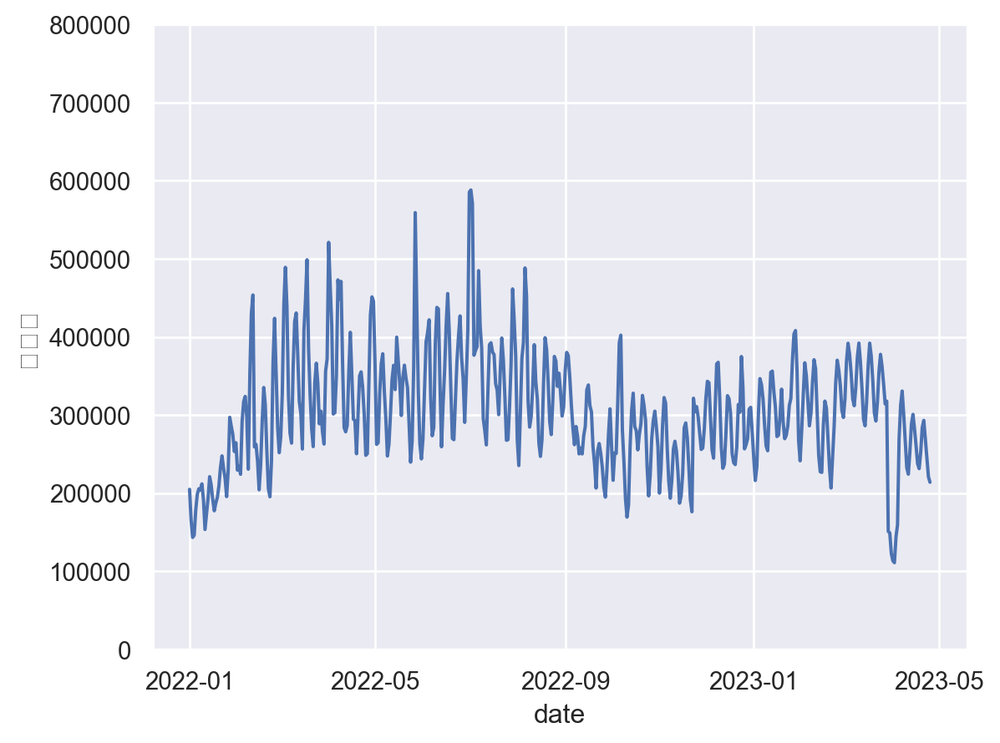

In [167]:
(
    so.Plot(train_all,x='date',y='판매량')
    .add(so.Line())
    .limit(y=(-100,800000))
)

In [168]:
train_big=train_long.groupby(['대분류','date'])['판매량'].sum().reset_index(name='판매량')
train_big

,대분류,date,판매량
0,B002-C001-0001,2022-01-01,84536
1,B002-C001-0001,2022-01-02,73870
2,B002-C001-0001,2022-01-03,57336
3,B002-C001-0001,2022-01-04,54769
4,B002-C001-0001,2022-01-05,66988
...,...,...,...
2395,B002-C001-0005,2023-04-21,12711
2396,B002-C001-0005,2023-04-22,11418
2397,B002-C001-0005,2023-04-23,10183
2398,B002-C001-0005,2023-04-24,9128


<Axes: >

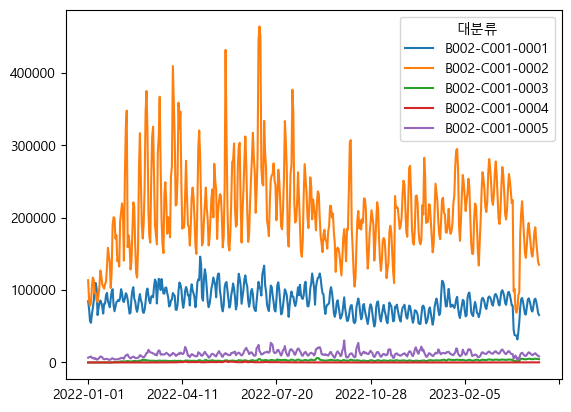

In [169]:
train.groupby('대분류').sum().drop(columns = 'ID').transpose().plot()

In [170]:
train.to_csv('trainprophet_last.csv',encoding='utf-8-sig',index = False)

In [171]:
train

,ID,대분류,중분류,소분류,브랜드,2022-01-01,2022-01-02,2022-01-03,2022-01-04,2022-01-05,...,2023-04-16,2023-04-17,2023-04-18,2023-04-19,2023-04-20,2023-04-21,2023-04-22,2023-04-23,2023-04-24,2023-04-25
0,0,B002-C001-0002,B002-C002-0007,B002-C003-0038,B002-00001,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-00002,0,0,0,0,0,...,2,2,2,2,2,2,2,1,1,1
2,2,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-00002,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,3,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-00002,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,4,B002-C001-0001,B002-C002-0001,B002-C003-0003,B002-00003,0,0,0,0,0,...,4,4,5,5,5,5,3,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15885,15885,B002-C001-0003,B002-C002-0008,B002-C003-0042,B002-03799,0,0,0,0,0,...,36,27,13,7,6,9,13,14,5,0
15886,15886,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-03799,0,0,0,0,0,...,39,40,43,47,49,47,45,41,40,40
15887,15887,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-03799,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15888,15888,B002-C001-0003,B002-C002-0008,B002-C003-0044,B002-03799,0,0,0,0,0,...,1,1,0,0,1,1,1,1,1,0


In [173]:
pd.read_csv('sample_submission.csv')

,ID,2023-04-05,2023-04-06,2023-04-07,2023-04-08,2023-04-09,2023-04-10,2023-04-11,2023-04-12,2023-04-13,...,2023-04-16,2023-04-17,2023-04-18,2023-04-19,2023-04-20,2023-04-21,2023-04-22,2023-04-23,2023-04-24,2023-04-25
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,2,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15885,15885,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15886,15886,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15887,15887,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15888,15888,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [189]:
df=train.iloc[:,[0,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484]]
df.to_csv('submission_first.csv',index=False)

In [190]:
pd.read_csv('submission_first.csv')

,ID,2023-04-05,2023-04-06,2023-04-07,2023-04-08,2023-04-09,2023-04-10,2023-04-11,2023-04-12,2023-04-13,...,2023-04-16,2023-04-17,2023-04-18,2023-04-19,2023-04-20,2023-04-21,2023-04-22,2023-04-23,2023-04-24,2023-04-25
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,1,1,1,1,1,1,1,1,1,...,2,2,2,2,2,2,2,1,1,1
2,2,0,0,0,0,1,1,2,1,1,...,0,0,0,0,0,0,0,0,0,0
3,3,2,1,0,0,1,3,5,5,4,...,0,0,0,0,0,0,0,0,0,0
4,4,6,5,5,4,2,1,2,2,2,...,4,4,5,5,5,5,3,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15885,15885,1,4,7,11,12,6,0,4,13,...,36,27,13,7,6,9,13,14,5,0
15886,15886,37,39,40,40,38,37,38,40,42,...,39,40,43,47,49,47,45,41,40,40
15887,15887,0,1,2,1,1,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
15888,15888,0,0,1,1,0,0,0,0,1,...,1,1,0,0,1,1,1,1,1,0
